In [1]:
!pip install gitpython kagglehub --quiet

In [2]:
# Install Mesa with minimal dependencies for Colab
!pip install mesa --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.9/239.9 kB 4.5 MB/s eta 0:00:00


In [3]:
!pip install torchreid --q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.7/92.7 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [4]:
!pip install ultralytics deep-sort-realtime opencv-python matplotlib --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 84.3 MB/s eta 0:00:00


In [5]:
import git
import os

# Cloner le repo GitHub si pas déjà cloné
repo_path = "/content/OpenTraj"

if not os.path.exists(repo_path):
    git.Repo.clone_from("https://github.com/crowdbotp/OpenTraj.git", repo_path)
else:
    print("Le repo GitHub existe déjà.")

# Chemin vers PETS-2009
github_dataset_path = os.path.join(repo_path, "datasets", "PETS-2009")
print("Chemin GitHub PETS-2009 :", github_dataset_path)

Chemin GitHub PETS-2009 : /content/OpenTraj/datasets/PETS-2009


In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("yeeandres/pets2009")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'pets2009' dataset.
Path to dataset files: /kaggle/input/pets2009


In [16]:
# ============================================================================
# CORRECTIONS DES ERREURS
# ============================================================================

class InteractionGraphBuilderFixed:
    def __init__(self, distance_threshold=80):
        self.distance_threshold = distance_threshold

    def build_graph(self, trajectories_frame):
        G = nx.Graph()
        track_ids = list(trajectories_frame.keys())

        for tid in track_ids:
            G.add_node(tid)

        for i in range(len(track_ids)):
            for j in range(i+1, len(track_ids)):
                id1 = track_ids[i]
                id2 = track_ids[j]
                p1 = trajectories_frame[id1]
                p2 = trajectories_frame[id2]

                dx = p1["pixel_foot_x"] - p2["pixel_foot_x"]
                dy = p1["pixel_foot_y"] - p2["pixel_foot_y"]
                dist = np.sqrt(dx*dx + dy*dy)

                if dist < self.distance_threshold:
                    G.add_edge(id1, id2, weight=1.0/(dist + 1e-6))

        return G

class GraphMetricsAnalyzerFixed:
    def __init__(self):
        self.timeseries = []

    def compute(self, G, frame_id):
        num_nodes = G.number_of_nodes()
        num_edges = G.number_of_edges()

        metrics = {
            "frame": frame_id,
            "nodes": num_nodes,
            "edges": num_edges,
            "density": nx.density(G) if num_nodes > 1 else 0.0,
            "avg_degree": np.mean([d for _, d in G.degree()]) if num_nodes > 0 else 0.0,
            "clustering": nx.average_clustering(G) if num_nodes > 1 else 0.0
        }

        if num_nodes > 0:
            comps = list(nx.connected_components(G))
            giant = max(comps, key=len) if comps else set()
            metrics["giant_component_frac"] = len(giant) / num_nodes if num_nodes > 0 else 0.0

            # Calcul du diamètre uniquement si le graphe est connecté
            if nx.is_connected(G) and num_nodes > 1:
                try:
                    metrics["diameter"] = nx.diameter(G)
                except:
                    metrics["diameter"] = 0.0
            else:
                metrics["diameter"] = 0.0
        else:
            metrics["giant_component_frac"] = 0.0
            metrics["diameter"] = 0.0

        self.timeseries.append(metrics)
        return metrics

def safe_create_temporal_metrics_curves(metrics_data, output_dir, filename_suffix=""):
    """Version sécurisée de la création des courbes temporelles"""
    try:
        if not metrics_data:
            print("❌ Aucune donnée de métriques")
            return None

        # Nettoyer les données
        cleaned_metrics = []
        for m in metrics_data:
            cleaned = m.copy()
            # S'assurer que toutes les valeurs sont numériques
            for key in ['density', 'avg_degree', 'clustering', 'giant_component_frac', 'iso_score']:
                if key in cleaned:
                    if cleaned[key] == "" or cleaned[key] is None:
                        cleaned[key] = 0.0
                    else:
                        try:
                            cleaned[key] = float(cleaned[key])
                        except:
                            cleaned[key] = 0.0
            cleaned_metrics.append(cleaned)

        frames = [m.get('frame', 0) for m in cleaned_metrics]

        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

        # 1. Densité et clustering
        density_vals = [m.get('density', 0) for m in cleaned_metrics]
        clustering_vals = [m.get('clustering', 0) for m in cleaned_metrics]

        ax1.plot(frames, density_vals, 'b-', linewidth=2, label='Densité', marker='o', markersize=4)
        ax1.set_xlabel('Frame')
        ax1.set_ylabel('Densité', color='b')
        ax1.tick_params(axis='y', labelcolor='b')
        ax1.grid(True, alpha=0.3)
        ax1.set_title('📊 Évolution de la Densité', fontweight='bold')

        ax1b = ax1.twinx()
        ax1b.plot(frames, clustering_vals, 'r-', linewidth=2, label='Clustering', marker='s', markersize=4)
        ax1b.set_ylabel('Coefficient de Clustering', color='r')
        ax1b.tick_params(axis='y', labelcolor='r')

        lines1, labels1 = ax1.get_legend_handles_labels()
        lines1b, labels1b = ax1b.get_legend_handles_labels()
        ax1.legend(lines1 + lines1b, labels1 + labels1b, loc='upper left')

        # 2. Nombre de nœuds et arêtes
        nodes_vals = [m.get('nodes', 0) for m in cleaned_metrics]
        edges_vals = [m.get('edges', 0) for m in cleaned_metrics]

        ax2.plot(frames, nodes_vals, 'g-', linewidth=2, label='Nœuds (personnes)', marker='^', markersize=4)
        ax2.plot(frames, edges_vals, 'm-', linewidth=2, label='Arêtes (interactions)', marker='v', markersize=4)
        ax2.set_xlabel('Frame')
        ax2.set_ylabel('Nombre')
        ax2.grid(True, alpha=0.3)
        ax2.set_title('👥 Évolution des Nœuds et Arêtes', fontweight='bold')
        ax2.legend(loc='upper left')

        # 3. Degré moyen et composante géante
        avg_degree_vals = [m.get('avg_degree', 0) for m in cleaned_metrics]
        giant_vals = [m.get('giant_component_frac', 0) for m in cleaned_metrics]

        ax3.plot(frames, avg_degree_vals, 'c-', linewidth=2, label='Degré moyen', marker='d', markersize=4)
        ax3.set_xlabel('Frame')
        ax3.set_ylabel('Degré moyen', color='c')
        ax3.tick_params(axis='y', labelcolor='c')
        ax3.grid(True, alpha=0.3)
        ax3.set_title('🔗 Évolution du Degré Moyen', fontweight='bold')

        ax3b = ax3.twinx()
        ax3b.plot(frames, giant_vals, 'y-', linewidth=2, label='Composante géante', marker='*', markersize=4)
        ax3b.set_ylabel('Fraction composante géante', color='y')
        ax3b.tick_params(axis='y', labelcolor='y')

        lines3, labels3 = ax3.get_legend_handles_labels()
        lines3b, labels3b = ax3b.get_legend_handles_labels()
        ax3.legend(lines3 + lines3b, labels3 + labels3b, loc='upper left')

        # 4. Vitesse moyenne (si disponible)
        ax4.plot(frames, density_vals, 'purple', linewidth=2, label='Densité (normalisée)', marker='o', markersize=4)

        # Calculer la variation de densité (proxy pour vitesse)
        if len(density_vals) > 1:
            density_change = np.abs(np.diff(density_vals))
            density_change = np.insert(density_change, 0, 0)  # Ajouter 0 au début
            max_change = np.max(density_change) if np.max(density_change) > 0 else 1
            ax4.plot(frames, density_change/max_change,
                    'orange', linewidth=2, label='Variation densité (proxy vitesse)',
                    marker='s', markersize=4, alpha=0.7)

        ax4.set_xlabel('Frame')
        ax4.set_ylabel('Valeur normalisée')
        ax4.grid(True, alpha=0.3)
        ax4.set_title('⚡ Variation Temporelle', fontweight='bold')
        ax4.legend(loc='upper left')

        plt.suptitle('📈 Courbes Temporelles des Métriques de Foule', fontsize=16, fontweight='bold')
        plt.tight_layout()

        filename = f"{output_dir}temporal_metrics_curves_fixed{filename_suffix}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"📈 Courbes temporelles (fixées) sauvegardées: {filename}")
        return filename

    except Exception as e:
        print(f"❌ Erreur création courbes temporelles: {e}")
        import traceback
        traceback.print_exc()
        return None

# ============================================================================
# FONCTION PRINCIPALE CORRIGÉE
# ============================================================================

def generate_visualizations_for_professor():
    """Version corrigée pour générer les 7 visualisations demandées"""
    print("🎯 GÉNÉRATION DES VISUALISATIONS POUR LE PROFESSEUR (VERSION CORRIGÉE)")
    print("=" * 80)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()

    tracker = BotSortTrackerWithKalman(
        track_thresh=0.4,
        track_buffer=30,
        match_thresh=0.7,
        appearance_thresh=0.25,
        motion_model=True,
        reid_model='resnet18',
        use_kalman=True
    )

    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer = AdvancedVisualizationSuite(output_visualization_dir)

    # Composants corrigés
    graph_builder = InteractionGraphBuilderFixed(distance_threshold=80)
    metrics_analyzer = GraphMetricsAnalyzerFixed()
    rule_detector = RuleBasedAnomalyDetector(density_jump=0.20, cluster_drop=0.15)
    iso_detector = IsolationForestAnomalyDetector(window_size=80, retrain_every=10, contamination=0.05)

    simulator = TrajectorySimulator(calibration, motion_model='social_force')

    # 2. Chargement
    print("\n2. 📂 CHARGEMENT DES DONNÉES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=100)
    original_frames = preprocessor.original_frames[:len(frames)]

    if not frames:
        print("❌ Aucune frame trouvée")
        return None

    print(f"✅ {len(frames)} frames chargées")

    # 3. Traitement
    print("\n3. 🔄 TRAITEMENT DES FRAMES")

    metrics_data = []
    trajectories_by_frame = {}
    anomaly_frames = []
    anomaly_scores = []
    anomaly_reasons = []

    for frame_idx, frame in enumerate(frames, start=1):
        if frame_idx % 10 == 0:
            print(f"   • Frame {frame_idx}/{len(frames)}")

        # Détection et tracking
        detections = detector.detect_people(frame)
        tracks = tracker.update(detections, frame)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        trajectories_by_frame[frame_idx] = trajectories

        # Construction du graphe et métriques
        if trajectories:
            G = graph_builder.build_graph(trajectories)
        else:
            G = nx.Graph()

        metrics = metrics_analyzer.compute(G, frame_idx)

        # Détection d'anomalies
        rule_anom, rule_reason = rule_detector.detect(metrics)
        iso_anom, iso_score = iso_detector.update_and_score(metrics, frame_idx)

        if rule_anom or iso_anom:
            anomaly_frames.append(frame_idx)
            anomaly_scores.append(iso_score if iso_score is not None else 0)
            anomaly_reasons.append(rule_reason or "Score d'anomalie élevé")

        # Nettoyage des données pour CSV
        iso_score_clean = ""
        if iso_score is not None:
            try:
                iso_score_clean = float(iso_score)
            except:
                iso_score_clean = ""

        metrics_data.append({
            'frame': frame_idx,
            'nodes': metrics['nodes'],
            'edges': metrics['edges'],
            'density': metrics['density'],
            'avg_degree': metrics['avg_degree'],
            'clustering': metrics['clustering'],
            'giant_component_frac': metrics['giant_component_frac'],
            'diameter': metrics.get('diameter', 0.0),
            'rule_anomaly': bool(rule_anom),
            'rule_reason': rule_reason or "",
            'iso_anomaly': bool(iso_anom),
            'iso_score': iso_score_clean
        })

    print(f"\n✅ Traitement terminé - {len(frames)} frames analysées")

    # 4. GÉNÉRATION DES VISUALISATIONS
    print("\n" + "="*80)
    print("4. 🎨 GÉNÉRATION DES VISUALISATIONS")
    print("="*80)

    visualization_results = {}

    # ============================================================================
    # 3. HEATMAP DE DENSITÉ
    # ============================================================================
    print("\n3. 🔥 HEATMAP DE DENSITÉ")
    if trajectory_extractor.trajectories_data:
        # Création d'une heatmap simplifiée mais robuste
        try:
            foot_positions = []
            for point in trajectory_extractor.trajectories_data:
                foot_positions.append([point['pixel_foot_x'], point['pixel_foot_y']])

            foot_positions = np.array(foot_positions)
            h, w = frames[0].shape[:2]

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

            # Heatmap 2D simple
            heatmap, xedges, yedges = np.histogram2d(
                foot_positions[:, 0], foot_positions[:, 1],
                bins=[50, 50], range=[[0, w], [0, h]]
            )
            heatmap = ndimage.gaussian_filter(heatmap, sigma=1.5)

            im1 = ax1.imshow(heatmap.T, origin='lower', aspect='auto',
                           extent=[0, w, 0, h], cmap='hot')
            ax1.set_title('🔥 Heatmap de Densité des Positions', fontweight='bold')
            ax1.set_xlabel('X (pixels)')
            ax1.set_ylabel('Y (pixels)')
            plt.colorbar(im1, ax=ax1, label='Densité')

            # Scatter plot avec transparence
            ax2.scatter(foot_positions[:, 0], foot_positions[:, 1],
                       c='red', s=10, alpha=0.3, label='Positions pieds')
            ax2.set_title('📍 Distribution Spatiale des Personnes', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.grid(True, alpha=0.3)
            ax2.legend()
            ax2.invert_yaxis()

            plt.suptitle('📊 Analyse de Densité de Foule', fontsize=14, fontweight='bold')
            plt.tight_layout()

            heatmap_path = f"{output_visualization_dir}heatmap_densite_professeur.png"
            plt.savefig(heatmap_path, dpi=150, bbox_inches='tight')
            plt.close()

            visualization_results['heatmap'] = heatmap_path
            print(f"   ✅ Heatmap générée: {heatmap_path}")

        except Exception as e:
            print(f"   ❌ Erreur création heatmap: {e}")
    else:
        print("   ❌ Aucune donnée pour la heatmap")

    # ============================================================================
    # 4. GRAPHE D'INTERACTION (Frame 50 comme demandé)
    # ============================================================================
    print("\n4. 👥 GRAPHE D'INTERACTION")

    frame_idx = 50  # Frame spécifique demandée
    if frame_idx in trajectories_by_frame and trajectories_by_frame[frame_idx]:
        print(f"   • Création du graphe pour la frame {frame_idx}...")

        try:
            # Création manuelle du graphe pour plus de contrôle
            trajectories = trajectories_by_frame[frame_idx]
            track_ids = list(trajectories.keys())

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

            # Image avec points
            frame_img = frames[frame_idx-1] if frame_idx-1 < len(frames) else frames[0]
            ax1.imshow(frame_img)
            ax1.set_title(f'👥 Positions - Frame {frame_idx}', fontweight='bold')

            # Graphe abstrait
            ax2.set_title(f'📊 Graphe d\'Interaction G_t - Frame {frame_idx}', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.grid(True, alpha=0.3)
            ax2.set_xlim(0, frame_img.shape[1])
            ax2.set_ylim(frame_img.shape[0], 0)  # Inverser l'axe Y

            colors = plt.cm.tab10(np.linspace(0, 1, len(track_ids)))

            # Dessiner les nœuds et arêtes
            positions = {}
            for idx, track_id in enumerate(track_ids):
                pos = trajectories[track_id]
                x, y = pos['pixel_foot_x'], pos['pixel_foot_y']
                positions[track_id] = (x, y)

                # Image
                ax1.scatter(x, y, color=colors[idx], s=100, edgecolors='white',
                          linewidth=2, alpha=0.8)
                ax1.text(x, y-15, f'{track_id}', color='white', fontweight='bold',
                        ha='center', fontsize=9,
                        bbox=dict(boxstyle="round,pad=0.2", facecolor=colors[idx], alpha=0.7))

                # Graphe
                ax2.scatter(x, y, color=colors[idx], s=150, edgecolors='black',
                          linewidth=2, alpha=0.8, label=f'ID {track_id}')
                ax2.text(x, y-20, f'{track_id}', color='black', fontweight='bold',
                        ha='center', fontsize=10)

            # Dessiner les arêtes (interactions)
            edges_drawn = 0
            for i in range(len(track_ids)):
                for j in range(i+1, len(track_ids)):
                    id1 = track_ids[i]
                    id2 = track_ids[j]
                    pos1 = positions[id1]
                    pos2 = positions[id2]

                    distance = np.sqrt((pos1[0]-pos2[0])**2 + (pos1[1]-pos2[1])**2)

                    if distance < 100:  # Seuil d'interaction
                        edges_drawn += 1
                        # Couleur selon la distance
                        if distance < 50:
                            edge_color = 'green'
                        elif distance < 80:
                            edge_color = 'orange'
                        else:
                            edge_color = 'red'

                        # Dessiner l'arête
                        ax1.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]],
                                color=edge_color, linewidth=1.5, alpha=0.6)
                        ax2.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]],
                                color=edge_color, linewidth=1.5, alpha=0.6)

            # Métriques du graphe
            G = graph_builder.build_graph(trajectories)
            metrics_text = f"📈 MÉTRIQUES DU GRAPHE G_t\n\n"
            metrics_text += f"• Nœuds: {G.number_of_nodes()}\n"
            metrics_text += f"• Arêtes: {edges_drawn}\n"
            metrics_text += f"• Densité: {nx.density(G):.3f}\n"
            metrics_text += f"• Clustering: {nx.average_clustering(G):.3f}\n"
            metrics_text += f"• Degré moyen: {np.mean([d for _, d in G.degree()]):.1f}\n"

            # Ajouter la légende
            from matplotlib.patches import Patch
            legend_elements = [
                Patch(facecolor='green', label='Distance < 50px', alpha=0.6),
                Patch(facecolor='orange', label='50px ≤ Distance < 80px', alpha=0.6),
                Patch(facecolor='red', label='80px ≤ Distance < 100px', alpha=0.6)
            ]
            ax1.legend(handles=legend_elements, loc='upper right', title="Distance")

            if len(track_ids) <= 10:
                ax2.legend(loc='upper right')

            # Ajouter les métriques
            ax2.text(0.02, 0.98, metrics_text, transform=ax2.transAxes,
                    fontsize=9, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.tight_layout()
            graph_path = f"{output_visualization_dir}graphe_interaction_frame_{frame_idx:04d}.png"
            plt.savefig(graph_path, dpi=150, bbox_inches='tight')
            plt.close()

            visualization_results['interaction_graph'] = graph_path
            print(f"   ✅ Graphe généré: {graph_path}")
            print(f"   📊 Métriques du graphe G_t (frame {frame_idx}):")
            print(f"     • Nœuds: {G.number_of_nodes()}")
            print(f"     • Arêtes: {edges_drawn}")
            print(f"     • Densité: {nx.density(G):.3f}")
            print(f"     • Clustering moyen: {nx.average_clustering(G):.3f}")

        except Exception as e:
            print(f"   ❌ Erreur création graphe: {e}")
    else:
        print(f"   ❌ Pas de trajectoires pour la frame {frame_idx}")

    # ============================================================================
    # 5. COURBES TEMPORELLES (Version corrigée)
    # ============================================================================
    print("\n5. 📈 COURBES TEMPORELLES DES MÉTRIQUES")

    if metrics_data:
        print("   • Création des courbes temporelles (version sécurisée)...")
        curves_path = safe_create_temporal_metrics_curves(
            metrics_data, output_visualization_dir, "_professeur"
        )

        if curves_path:
            visualization_results['temporal_curves'] = curves_path

            # Afficher les statistiques
            densities = [m.get('density', 0) for m in metrics_data]
            clusterings = [m.get('clustering', 0) for m in metrics_data]

            print(f"   📊 Statistiques temporelles:")
            print(f"     • Densité moyenne: {np.mean(densities):.3f} ± {np.std(densities):.3f}")
            print(f"     • Clustering moyen: {np.mean(clusterings):.3f} ± {np.std(clusterings):.3f}")
            print(f"     • Frames analysées: {len(metrics_data)}")
            print(f"   ✅ Courbes générées: {curves_path}")
    else:
        print("   ❌ Pas de données pour les courbes temporelles")

    # ============================================================================
    # 6. PLOT D'ANOMALIE
    # ============================================================================
    print("\n6. 🚨 PLOT D'ANOMALIE")

    if anomaly_frames:
        print(f"   • {len(anomaly_frames)} anomalies détectées")
        print(f"   • Frames anormales: {sorted(anomaly_frames)}")

        try:
            # Création d'un plot d'anomalie simplifié mais robuste
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 10))

            # 1. Courbe des scores d'anomalie
            frames_all = [m['frame'] for m in metrics_data]
            iso_scores = []
            for m in metrics_data:
                score = m.get('iso_score', 0)
                if score == "" or score is None:
                    iso_scores.append(0)
                else:
                    try:
                        iso_scores.append(float(score))
                    except:
                        iso_scores.append(0)

            ax1.plot(frames_all, iso_scores, 'b-', linewidth=2)
            ax1.fill_between(frames_all, 0, iso_scores, alpha=0.3, color='blue')

            # Marquer les anomalies
            for frame_idx in anomaly_frames:
                if frame_idx <= len(frames_all):
                    ax1.axvline(x=frame_idx, color='r', linestyle='--', alpha=0.5, linewidth=1)

            ax1.set_xlabel('Frame')
            ax1.set_ylabel('Score d\'anomalie')
            ax1.set_title('📉 Scores d\'Anomalie (Isolation Forest)', fontweight='bold')
            ax1.grid(True, alpha=0.3)

            # 2. Distribution des anomalies
            ax2.hist(anomaly_frames, bins=20, alpha=0.7, color='red', edgecolor='black')
            ax2.set_xlabel('Frame')
            ax2.set_ylabel('Nombre d\'anomalies')
            ax2.set_title('📊 Distribution des Anomalies', fontweight='bold')
            ax2.grid(True, alpha=0.3)

            # 3. Métriques lors des anomalies
            anomaly_densities = []
            anomaly_clusterings = []
            for frame_idx in anomaly_frames:
                if frame_idx-1 < len(metrics_data):
                    m = metrics_data[frame_idx-1]
                    anomaly_densities.append(m.get('density', 0))
                    anomaly_clusterings.append(m.get('clustering', 0))

            if anomaly_densities:
                ax3.scatter(anomaly_densities, anomaly_clusterings,
                           c='red', s=100, alpha=0.7, edgecolors='black')
                ax3.set_xlabel('Densité')
                ax3.set_ylabel('Coefficient de Clustering')
                ax3.set_title('🎯 Métriques lors des Anomalies', fontweight='bold')
                ax3.grid(True, alpha=0.3)

            # 4. Statistiques textuelles
            ax4.axis('off')
            stats_text = "📈 STATISTIQUES DES ANOMALIES\n\n"
            stats_text += f"• Nombre total: {len(anomaly_frames)}\n"
            stats_text += f"• Frames: {sorted(anomaly_frames)}\n"

            if anomaly_scores:
                stats_text += f"• Score moyen: {np.mean(anomaly_scores):.4f}\n"
                stats_text += f"• Score max: {np.max(anomaly_scores):.4f}\n"
                stats_text += f"• Score min: {np.min(anomaly_scores):.4f}\n"

            if anomaly_densities:
                stats_text += f"• Densité moyenne: {np.mean(anomaly_densities):.3f}\n"
                stats_text += f"• Clustering moyen: {np.mean(anomaly_clusterings):.3f}\n"

            # Ajouter les raisons si disponibles
            if anomaly_reasons:
                stats_text += f"\n🎯 RAISONS PRINCIPALES:\n"
                reasons_count = {}
                for reason in anomaly_reasons:
                    if reason:
                        reasons_count[reason] = reasons_count.get(reason, 0) + 1

                for reason, count in list(reasons_count.items())[:3]:  # Top 3 raisons
                    stats_text += f"• {reason}: {count} fois\n"

            ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes,
                    fontsize=10, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.suptitle('🚨 DÉTECTION D\'ANOMALIES DANS LA FOUILLE',
                        fontsize=16, fontweight='bold')
            plt.tight_layout()

            anomaly_path = f"{output_visualization_dir}anomalies_professeur.png"
            plt.savefig(anomaly_path, dpi=150, bbox_inches='tight')
            plt.close()

            visualization_results['anomaly_plot'] = anomaly_path

            # Afficher les détails des anomalies
            print("\n   📊 DÉTAIL DES ANOMALIES DÉTECTÉES:")
            print("   " + "-" * 50)
            for i, (frame_idx, score) in enumerate(zip(anomaly_frames, anomaly_scores), 1):
                if frame_idx-1 < len(metrics_data):
                    m = metrics_data[frame_idx-1]
                    reason = anomaly_reasons[i-1] if i-1 < len(anomaly_reasons) else ""
                    print(f"   {i}. Frame {frame_idx}: score = {score:.4f}")
                    print(f"      • Densité: {m.get('density', 0):.3f}")
                    print(f"      • Clustering: {m.get('clustering', 0):.3f}")
                    print(f"      • Personnes: {m.get('nodes', 0)}")
                    if reason:
                        print(f"      • Raison: {reason}")
                    print()

            print(f"   ✅ Plot d'anomalie généré: {anomaly_path}")

        except Exception as e:
            print(f"   ❌ Erreur création plot d'anomalie: {e}")
    else:
        print("   ✅ Aucune anomalie détectée")
        # Créer un plot indiquant qu'il n'y a pas d'anomalies
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.text(0.5, 0.5, '✅ AUCUNE ANOMALIE DÉTECTÉE\n\n'
                'Toutes les frames sont dans les normes attendues.',
                ha='center', va='center', fontsize=14, transform=ax.transAxes)
        ax.set_title('🚨 DÉTECTION D\'ANOMALIES - RAS', fontweight='bold')
        ax.axis('off')

        anomaly_path = f"{output_visualization_dir}aucune_anomalie.png"
        plt.savefig(anomaly_path, dpi=150, bbox_inches='tight')
        plt.close()

        visualization_results['anomaly_plot'] = anomaly_path

    # ============================================================================
    # 7. COMPARAISON SIMULATION VS RÉEL
    # ============================================================================
    print("\n7. 🔄 COMPARAISON SIMULATION VS RÉEL")

    if trajectory_extractor.complete_trajectories:
        print("   • Simulation des trajectoires...")

        try:
            # Prendre quelques trajectoires pour la simulation
            sample_trajectories = {}
            count = 0
            for track_id, traj in trajectory_extractor.complete_trajectories.items():
                if len(traj) >= 10:  # Prendre seulement les trajectoires assez longues
                    sample_trajectories[track_id] = traj
                    count += 1
                if count >= 5:  # Maximum 5 pour la clarté
                    break

            if sample_trajectories:
                # Simulation
                simulated = simulator.simulate_from_trajectories(
                    sample_trajectories,
                    num_steps=20,
                    noise_level=5.0
                )

                print(f"   • {len(simulated)} trajectoires simulées")

                # Création de la comparaison
                fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

                # Image de fond
                bg_frame = original_frames[0] if original_frames else frames[0]

                # 1. Trajectoires réelles
                ax1.imshow(bg_frame, alpha=0.5)
                colors = plt.cm.tab10(np.linspace(0, 1, len(sample_trajectories)))

                for idx, (track_id, traj) in enumerate(sample_trajectories.items()):
                    if len(traj) >= 2:
                        x = [p['pixel_foot_x'] for p in traj]
                        y = [p['pixel_foot_y'] for p in traj]
                        ax1.plot(x, y, linewidth=2, color=colors[idx], alpha=0.8)
                        ax1.scatter(x[-1], y[-1], color=colors[idx], s=80,
                                  label=f'Réel {track_id}')

                ax1.set_title('🛤️ Trajectoires Réelles', fontweight='bold')
                ax1.legend(loc='upper right')
                ax1.axis('off')

                # 2. Trajectoires simulées
                ax2.imshow(bg_frame, alpha=0.5)
                for idx, (track_id, traj) in enumerate(simulated.items()):
                    if len(traj) >= 2:
                        x = traj[:, 0]
                        y = traj[:, 1]
                        ax2.plot(x, y, linewidth=2, color=colors[idx],
                                alpha=0.8, linestyle='--')
                        ax2.scatter(x[-1], y[-1], color=colors[idx], s=80,
                                  marker='s', label=f'Simulé {track_id}')

                ax2.set_title('🎮 Trajectoires Simulées', fontweight='bold')
                ax2.legend(loc='upper right')
                ax2.axis('off')

                # 3. Comparaison et métriques
                ax3.axis('off')
                comparison_text = "📊 COMPARAISON SIMULATION VS RÉEL\n\n"

                # Calculer les métriques
                total_error = 0
                comparisons = 0

                for track_id in simulated:
                    if track_id in sample_trajectories:
                        real_traj = sample_trajectories[track_id]
                        sim_traj = simulated[track_id]

                        min_len = min(len(real_traj), len(sim_traj))
                        if min_len > 0:
                            # Prendre le dernier point pour comparaison
                            real_last = real_traj[-1]
                            sim_last = sim_traj[-1]

                            error = np.sqrt((real_last['pixel_foot_x'] - sim_last[0])**2 +
                                          (real_last['pixel_foot_y'] - sim_last[1])**2)
                            total_error += error
                            comparisons += 1

                if comparisons > 0:
                    avg_error = total_error / comparisons
                    comparison_text += f"• Trajectoires comparées: {comparisons}\n"
                    comparison_text += f"• Erreur position moyenne: {avg_error:.1f} px\n"
                    comparison_text += f"• Modèle utilisé: {simulator.motion_model}\n"

                comparison_text += "\n🎯 INTERPRÉTATION:\n"
                comparison_text += "• Ligne pleine: trajectoire réelle\n"
                comparison_text += "• Ligne pointillée: trajectoire simulée\n"
                comparison_text += "• Cercle: position finale réelle\n"
                comparison_text += "• Carré: position finale simulée\n"
                comparison_text += "\n📈 La simulation montre comment les personnes\n"
                comparison_text += "   pourraient se déplacer si elles suivaient\n"
                comparison_text += "   un modèle de mouvement simple."

                ax3.text(0.05, 0.95, comparison_text, transform=ax3.transAxes,
                        fontsize=10, verticalalignment='top',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

                plt.suptitle('🔄 COMPARAISON: TRAJECTOIRES RÉELLES vs SIMULÉES',
                            fontsize=16, fontweight='bold')
                plt.tight_layout()

                comparison_path = f"{output_visualization_dir}simulation_vs_reel_professeur.png"
                plt.savefig(comparison_path, dpi=150, bbox_inches='tight')
                plt.close()

                visualization_results['simulation_comparison'] = comparison_path
                print(f"   ✅ Comparaison générée: {comparison_path}")
            else:
                print("   ❌ Pas assez de trajectoires longues pour la simulation")

        except Exception as e:
            print(f"   ❌ Erreur création comparaison: {e}")
    else:
        print("   ❌ Pas de trajectoires pour la simulation")

    # ============================================================================
    # SAUVEGARDE DES RÉSULTATS
    # ============================================================================
    print("\n" + "="*80)
    print("💾 SAUVEGARDE DES RÉSULTATS")
    print("="*80)

    try:
        # Sauvegarde CSV des métriques
        with open(output_metrics_csv, 'w', newline='') as f:
            # Nettoyer les données avant sauvegarde
            clean_metrics = []
            for m in metrics_data:
                clean_m = {}
                for key, value in m.items():
                    if value == "" or value is None:
                        clean_m[key] = ""
                    else:
                        clean_m[key] = value
                clean_metrics.append(clean_m)

            fieldnames = ['frame','nodes','edges','density','avg_degree','clustering',
                         'giant_component_frac','diameter','rule_anomaly',
                         'rule_reason','iso_anomaly','iso_score']
            writer = csv.DictWriter(f, fieldnames=fieldnames)
            writer.writeheader()
            for m in clean_metrics:
                writer.writerow(m)
        print(f"✅ Métriques sauvegardées: {output_metrics_csv}")

        # Sauvegarde CSV des anomalies
        if anomaly_frames:
            anomalies_csv = f"{output_visualization_dir}anomalies_detaillees.csv"
            with open(anomalies_csv, 'w', newline='') as f:
                writer = csv.writer(f)
                writer.writerow(['frame', 'anomaly_score', 'density', 'clustering',
                               'nodes', 'reason'])
                for i, frame_idx in enumerate(anomaly_frames):
                    if frame_idx-1 < len(metrics_data):
                        m = metrics_data[frame_idx-1]
                        score = anomaly_scores[i] if i < len(anomaly_scores) else 0
                        reason = anomaly_reasons[i] if i < len(anomaly_reasons) else ""
                        writer.writerow([frame_idx, score,
                                        m.get('density', 0),
                                        m.get('clustering', 0),
                                        m.get('nodes', 0),
                                        reason])
            print(f"✅ Anomalies détaillées: {anomalies_csv}")

        # Rapport texte
        report_path = f"{output_visualization_dir}rapport_final.txt"
        with open(report_path, 'w', encoding='utf-8') as f:
            f.write("="*60 + "\n")
            f.write("RAPPORT D'ANALYSE DE FOUILLE - VISUALISATIONS\n")
            f.write("="*60 + "\n\n")

            f.write("📅 Date: " + datetime.now().strftime("%Y-%m-%d %H:%M:%S") + "\n")
            f.write(f"🎬 Frames analysées: {len(frames)}\n")
            f.write(f"👥 Trajectoires extraites: {len(trajectory_extractor.complete_trajectories)}\n\n")

            f.write("📊 STATISTIQUES GLOBALES:\n")
            f.write("-"*40 + "\n")
            if metrics_data:
                densities = [m.get('density', 0) for m in metrics_data]
                clusterings = [m.get('clustering', 0) for m in metrics_data]
                f.write(f"• Densité moyenne: {np.mean(densities):.3f}\n")
                f.write(f"• Clustering moyen: {np.mean(clusterings):.3f}\n")
                f.write(f"• Nombre moyen de personnes: {np.mean([m.get('nodes', 0) for m in metrics_data]):.1f}\n")

            f.write(f"\n🚨 ANOMALIES DÉTECTÉES: {len(anomaly_frames)}\n")
            f.write("-"*40 + "\n")
            if anomaly_frames:
                for frame_idx in sorted(anomaly_frames):
                    f.write(f"• Frame {frame_idx}\n")
            else:
                f.write("• Aucune anomalie détectée\n")

            f.write("\n🎨 VISUALISATIONS GÉNÉRÉES:\n")
            f.write("-"*40 + "\n")
            for viz_name, viz_path in visualization_results.items():
                if viz_path:
                    f.write(f"• {viz_name}: {viz_path}\n")

        print(f"✅ Rapport généré: {report_path}")

    except Exception as e:
        print(f"⚠️ Erreur sauvegarde: {e}")

    # ============================================================================
    # RÉSUMÉ FINAL
    # ============================================================================
    print("\n" + "="*80)
    print("✅ GÉNÉRATION TERMINÉE AVEC SUCCÈS!")
    print("="*80)

    print("\n🎨 VISUALISATIONS GÉNÉRÉES:")
    print("-" * 40)
    for viz_name, viz_path in visualization_results.items():
        if viz_path:
            name_display = viz_name.replace('_', ' ').title()
            print(f"• {name_display}:")
            print(f"  📍 {os.path.basename(viz_path)}")

    print("\n📊 RÉSUMÉ STATISTIQUE:")
    print("-" * 40)
    print(f"• Frames analysées: {len(frames)}")
    print(f"• Trajectoires extraites: {len(trajectory_extractor.complete_trajectories)}")
    print(f"• Anomalies détectées: {len(anomaly_frames)}")

    if metrics_data:
        avg_density = np.mean([m.get('density', 0) for m in metrics_data])
        avg_clustering = np.mean([m.get('clustering', 0) for m in metrics_data])
        print(f"• Densité moyenne: {avg_density:.3f}")
        print(f"• Clustering moyen: {avg_clustering:.3f}")

    print(f"\n📁 RÉPERTOIRE DE SORTIE: {output_visualization_dir}")
    print(f"📄 RAPPORT COMPLET: {report_path}")

    return {
        'visualizations': visualization_results,
        'metrics': metrics_data,
        'anomalies': list(zip(anomaly_frames, anomaly_scores, anomaly_reasons)),
        'summary': {
            'frames_analyzed': len(frames),
            'trajectories': len(trajectory_extractor.complete_trajectories),
            'anomalies': len(anomaly_frames)
        }
    }

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    print("🎯 GÉNÉRATION DES 7 VISUALISATIONS POUR LE PROFESSEUR (CORRIGÉ)")
    print("=" * 80)

    # Exécuter la génération
    results = generate_visualizations_for_professor()

    if results:
        print("\n" + "="*80)
        print("🎉 TOUTES LES VISUALISATIONS ONT ÉTÉ GÉNÉRÉES AVEC SUCCÈS!")
        print("="*80)

        # Afficher les anomalies de manière claire
        anomalies = results.get('anomalies', [])
        if anomalies:
            print("\n🚨 ANOMALIES DÉTECTÉES (DÉTAIL):")
            print("="*50)
            for frame_idx, score, reason in anomalies:
                print(f"• Frame {frame_idx}:")
                print(f"  Score: {score:.4f}")
                print(f"  Raison: {reason}")
                print()
        else:
            print("\n✅ AUCUNE ANOMALIE DÉTECTÉE")
    else:
        print("\n❌ LA GÉNÉRATION A ÉCHOUÉ")

🎯 GÉNÉRATION DES 7 VISUALISATIONS POUR LE PROFESSEUR (CORRIGÉ)
🎯 GÉNÉRATION DES VISUALISATIONS POUR LE PROFESSEUR (VERSION CORRIGÉE)

1. 🔧 INITIALISATION
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}
✅ Modèle ReID resnet18 chargé sur cpu
✅ Tracker Bot-SORT avec Kalman initialisé (use_kalman=True)
✅ Extracteur de trajectoires corrigé initialisé

2. 📂 CHARGEMENT DES DONNÉES
🔄 Chargement des frames...
✅ 100 frames chargées
✅ 100 frames chargées

3. 🔄 TRAITEMENT DES FRAMES
🔍 Détections: 3 personnes
🆕 Track 1 créé (ReID + Kalman)
🆕 Track 2 créé (ReID + Kalman)
🆕 Track 3 créé (ReID + Kalman)
📈 Trajectoires extraites: 3
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
🔍 Détections: 4 personnes
🆕 Track

In [7]:
# ============================================================================
# IMPORTATIONS
# ============================================================================

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Ellipse, Patch
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')

# New imports
import networkx as nx
from sklearn.ensemble import IsolationForest
from scipy import ndimage
from sklearn.neighbors import KernelDensity
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_metrics_csv = "/content/graph_metrics.csv"
output_trajectories_json = "/content/trajectories_corrected.json"
output_kalman_stats_csv = "/content/kalman_statistics.csv"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)

# ============================================================================
# MODÈLE REID PRÉ-ENTRAÎNÉ
# ============================================================================

class PretrainedReID:
    """Modèle ReID pré-entraîné pour l'extraction de features d'apparence"""

    def __init__(self, model_name='resnet50', device='auto'):
        self.device = torch.device('cuda' if torch.cuda.is_available() and device != 'cpu' else 'cpu')
        self.model_name = model_name
        self.model = None
        self.preprocess = None

        self._load_pretrained_model()
        print(f"✅ Modèle ReID {model_name} chargé sur {self.device}")

    def _load_pretrained_model(self):
        """Charge un modèle pré-entraîné pour l'extraction de features"""
        try:
            if self.model_name.startswith('resnet'):
                # Chargement ResNet pré-entraîné
                if self.model_name == 'resnet50':
                    self.model = models.resnet50(pretrained=True)
                elif self.model_name == 'resnet34':
                    self.model = models.resnet34(pretrained=True)
                elif self.model_name == 'resnet18':
                    self.model = models.resnet18(pretrained=True)

                # Supprimer la dernière couche (classification)
                self.model = nn.Sequential(*list(self.model.children())[:-1])

            elif self.model_name.startswith('mobilenet'):
                # MobileNet
                if self.model_name == 'mobilenet_v2':
                    self.model = models.mobilenet_v2(pretrained=True)
                    self.model.classifier = nn.Sequential(
                        nn.AdaptiveAvgPool2d((1, 1)),
                        nn.Flatten()
                    )

            self.model.eval()
            self.model.to(self.device)

            # Transformation des images
            self.preprocess = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((256, 128)),  # Taille standard pour ReID
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]
                )
            ])

        except Exception as e:
            print(f"❌ Erreur chargement modèle ReID: {e}")
            self._load_fallback_model()

    def _load_fallback_model(self):
        """Charge un modèle de repli plus simple"""
        try:
            self.model = models.resnet18(pretrained=True)
            self.model = nn.Sequential(*list(self.model.children())[:-1])
            self.model.eval()
            self.model.to(self.device)

            self.preprocess = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((128, 64)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]
                )
            ])
            print("✅ Modèle de repli chargé")
        except Exception as e:
            print(f"❌ Erreur chargement modèle de repli: {e}")
            self.model = None

    def extract_features(self, image):
        """Extrait les features d'apparence d'une image"""
        if self.model is None or image.size == 0:
            return np.zeros(512, dtype=np.float32)

        try:
            # Prétraitement
            input_tensor = self.preprocess(image).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(input_tensor)
                features = features.squeeze().cpu().numpy()

            # Normalisation L2
            if np.linalg.norm(features) > 0:
                features = features / np.linalg.norm(features)

            return features.astype(np.float32)

        except Exception as e:
            print(f"⚠️ Erreur extraction features: {e}")
            return np.zeros(512, dtype=np.float32)

# ============================================================================
# CALIBRATION CAMÉRA
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),
                    'cy': float(geometry.get('nfx', '752.0')),
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params.get('width','?')}x{self.camera_params.get('height','?')}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            src_points = np.array([
                [184, 441], [583, 441], [384, 323], [284, 382], [483, 382]
            ], dtype=np.float32)

            dst_points = np.array([
                [0, 0], [15, 0], [7.5, 12], [3, 6], [12, 6]
            ], dtype=np.float32)

            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.5):
        self.conf_threshold = conf_threshold

        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2
                            y_foot = y2

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# FILTRE DE KALMAN
# ============================================================================

class KalmanFilter:
    """Filtre de Kalman amélioré pour le tracking d'objets"""

    def __init__(self, dt=1.0, process_noise_scale=1.0, measurement_noise_scale=1.0):
        """
        Initialise le filtre de Kalman

        Args:
            dt: Intervalle de temps entre les mesures
            process_noise_scale: Échelle du bruit de processus
            measurement_noise_scale: Échelle du bruit de mesure
        """
        self.dt = dt

        # État: [x, y, w, h, vx, vy, vw, vh] - 8 dimensions
        self.state_dim = 8
        self.measurement_dim = 4  # On mesure [x, y, w, h]

        # Matrice d'état (transition)
        self.F = np.eye(self.state_dim)
        for i in range(4):
            self.F[i, i+4] = dt  # Intégration de la vitesse

        # Matrice de mesure
        self.H = np.zeros((self.measurement_dim, self.state_dim))
        np.fill_diagonal(self.H[:4, :4], 1)

        # Matrice de covariance de l'état
        self.P = np.eye(self.state_dim) * 10

        # Matrice de covariance du bruit de processus
        self.Q = np.eye(self.state_dim) * process_noise_scale
        self.Q[:4, :4] *= 0.1
        self.Q[4:, 4:] *= 0.01

        # Matrice de covariance du bruit de mesure
        self.R = np.eye(self.measurement_dim) * measurement_noise_scale
        self.R[:2, :2] *= 0.1
        self.R[2:, 2:] *= 1.0

        # État actuel
        self.x = np.zeros(self.state_dim)

        # Historique
        self.state_history = deque(maxlen=10)
        self.measurement_history = deque(maxlen=10)

    def initialize(self, measurement):
        """Initialise le filtre avec une mesure initiale"""
        if len(measurement) != 4:
            raise ValueError(f"Measurement must have 4 elements, got {len(measurement)}")

        self.x[:4] = measurement
        self.x[4:] = 0

        self.P = np.eye(self.state_dim) * 10
        self.P[4:, 4:] *= 0.1

        self.state_history.clear()
        self.measurement_history.clear()

    def predict(self):
        """Prédit l'état suivant"""
        self.x = self.F @ self.x
        self.P = self.F @ self.P @ self.F.T + self.Q

        predicted_state = self.x.copy()
        predicted_state[2] = max(predicted_state[2], 1)
        predicted_state[3] = max(predicted_state[3], 1)

        return predicted_state[:4]

    def update(self, measurement):
        """Met à jour le filtre avec une nouvelle mesure"""
        if len(measurement) != 4:
            raise ValueError(f"Measurement must have 4 elements, got {len(measurement)}")

        self.measurement_history.append(measurement)

        y = measurement - self.H @ self.x
        S = self.H @ self.P @ self.H.T + self.R

        try:
            K = self.P @ self.H.T @ np.linalg.inv(S)
        except np.linalg.LinAlgError:
            K = self.P @ self.H.T @ np.linalg.pinv(S)

        self.x = self.x + K @ y
        self.P = (np.eye(self.state_dim) - K @ self.H) @ self.P

        self.x[2] = max(self.x[2], 1)
        self.x[3] = max(self.x[3], 1)

        self.state_history.append(self.x.copy())

        return self.x[:4]

    def smooth(self, window_size=3):
        """Applique un lissage sur les états historiques"""
        if len(self.state_history) >= window_size:
            states = np.array(list(self.state_history)[-window_size:])
            return np.mean(states, axis=0)[:4]
        return self.x[:4]

    def get_velocity(self):
        """Retourne les composantes de vitesse estimées"""
        return self.x[4:6]

    def get_state(self):
        """Retourne l'état complet"""
        return self.x.copy()

    def get_covariance(self):
        """Retourne la matrice de covariance"""
        return self.P.copy()

    def get_innovation(self):
        """Retourne l'innovation (résidu)"""
        if self.measurement_history:
            return self.measurement_history[-1] - self.H @ self.x
        return np.zeros(self.measurement_dim)

# ============================================================================
# BOT-SORT AVEC KALMAN ET REID
# ============================================================================

class BotSortTrackerWithKalman:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7,
                 appearance_thresh=0.25, motion_model=True, reid_model='resnet50',
                 use_kalman=True, kalman_params=None):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh
        self.motion_model = motion_model
        self.use_kalman = use_kalman

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle ReID
        self.reid_model = PretrainedReID(model_name=reid_model)
        self.appearance_features = {}

        # Filtres Kalman
        self.kalman_filters = {}
        self.kalman_params = kalman_params or {
            'dt': 1.0,
            'process_noise_scale': 0.1,
            'measurement_noise_scale': 1.0
        }

        print(f"✅ Tracker Bot-SORT avec Kalman initialisé (use_kalman={use_kalman})")

    def _initialize_kalman_filter(self, track_id, detection):
        """Initialise un filtre de Kalman pour un nouveau track"""
        if not self.use_kalman:
            return

        try:
            bbox = detection['bbox']
            x1, y1, x2, y2 = bbox
            w = x2 - x1
            h = y2 - y1
            cx = (x1 + x2) / 2
            cy = (y1 + y2) / 2

            kalman = KalmanFilter(**self.kalman_params)
            kalman.initialize([cx, cy, w, h])

            self.kalman_filters[track_id] = kalman

        except Exception as e:
            print(f"⚠️ Erreur initialisation Kalman pour track {track_id}: {e}")

    def _update_kalman_filter(self, track_id, detection):
        """Met à jour le filtre de Kalman avec une nouvelle détection"""
        if not self.use_kalman or track_id not in self.kalman_filters:
            return None

        try:
            kalman = self.kalman_filters[track_id]

            bbox = detection['bbox']
            x1, y1, x2, y2 = bbox
            w = x2 - x1
            h = y2 - y1
            cx = (x1 + x2) / 2
            cy = (y1 + y2) / 2

            updated_state = kalman.update([cx, cy, w, h])

            updated_cx, updated_cy, updated_w, updated_h = updated_state
            updated_x1 = updated_cx - updated_w / 2
            updated_y1 = updated_cy - updated_h / 2
            updated_x2 = updated_cx + updated_w / 2
            updated_y2 = updated_cy + updated_h / 2

            return [updated_x1, updated_y1, updated_x2, updated_y2]

        except Exception as e:
            print(f"⚠️ Erreur mise à jour Kalman pour track {track_id}: {e}")
            return None

    def _predict_with_kalman(self, track_id):
        """Prédit la position suivante avec le filtre de Kalman"""
        if not self.use_kalman or track_id not in self.kalman_filters:
            return None

        try:
            kalman = self.kalman_filters[track_id]

            predicted_state = kalman.predict()

            pred_cx, pred_cy, pred_w, pred_h = predicted_state
            pred_x1 = pred_cx - pred_w / 2
            pred_y1 = pred_cy - pred_h / 2
            pred_x2 = pred_cx + pred_w / 2
            pred_y2 = pred_cy + pred_h / 2

            velocity = kalman.get_velocity()

            return {
                'bbox': [pred_x1, pred_y1, pred_x2, pred_y2],
                'center': [pred_cx, pred_cy],
                'velocity': velocity.tolist() if velocity is not None else [0, 0]
            }

        except Exception as e:
            print(f"⚠️ Erreur prédiction Kalman pour track {track_id}: {e}")
            return None

    def _extract_appearance_features(self, detection, frame):
        """Extrait les features d'apparence"""
        try:
            x1, y1, x2, y2 = [int(coord) for coord in detection['bbox']]
            h, w = frame.shape[:2]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w-1, x2), min(h-1, y2)

            if x2 <= x1 or y2 <= y1:
                return np.zeros(512, dtype=np.float32)

            roi = frame[y1:y2, x1:x2]
            if roi.size == 0:
                return np.zeros(512, dtype=np.float32)

            features = self.reid_model.extract_features(roi)
            return features

        except Exception as e:
            print(f"⚠️ Erreur extraction apparence: {e}")
            return np.zeros(512, dtype=np.float32)

    def _appearance_similarity(self, features1, features2):
        """Calcule la similarité cosine entre features d'apparence"""
        if features1 is None or features2 is None:
            return 0.0

        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        similarity = np.dot(features1, features2) / (norm1 * norm2)
        return max(0.0, min(1.0, similarity))

    def _predict_with_motion(self, track):
        """Prédit la position suivante avec modèle de mouvement (fallback)"""
        track_id = track['track_id']

        if self.use_kalman and track_id in self.kalman_filters:
            kalman_pred = self._predict_with_kalman(track_id)
            if kalman_pred:
                return kalman_pred['center']

        if 'velocity' not in track:
            track['velocity'] = [0, 0]

        if len(track.get('position_history', [])) < 2:
            return track['center']

        pos_history = track.get('position_history', [])
        if len(pos_history) >= 2:
            velocities = []
            for i in range(1, min(5, len(pos_history))):
                dx = pos_history[-i][0] - pos_history[-i-1][0]
                dy = pos_history[-i][1] - pos_history[-i-1][1]
                velocities.append([dx, dy])

            if velocities:
                avg_velocity = np.mean(velocities, axis=0)
                track['velocity'] = avg_velocity.tolist()

        pred_x = track['center'][0] + track['velocity'][0]
        pred_y = track['center'][1] + track['velocity'][1]

        return [pred_x, pred_y]

    def update(self, detections, frame):
        """Met à jour avec apparence, Kalman et modèle de mouvement"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            appearance_feat = self._extract_appearance_features(det, frame)

            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id'],
                'appearance': appearance_feat
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec apparence, Kalman et mouvement"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                if self.use_kalman and track['track_id'] in self.kalman_filters:
                    kalman_pred = self._predict_with_kalman(track['track_id'])
                    if kalman_pred:
                        track['bbox'] = kalman_pred['bbox']
                        track['center'] = kalman_pred['center']
                        track['predicted'] = True
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût combinée
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            if self.use_kalman and track['track_id'] in self.kalman_filters:
                kalman_pred = self._predict_with_kalman(track['track_id'])
                if kalman_pred:
                    predicted_pos = kalman_pred['center']
                    predicted_bbox = kalman_pred['bbox']
                else:
                    predicted_pos = self._predict_with_motion(track)
                    predicted_bbox = track['bbox']
            else:
                predicted_pos = self._predict_with_motion(track)
                predicted_bbox = track['bbox']

            for j, det in enumerate(detections):
                # Coût IoU
                iou_cost = 1 - self._calculate_iou(predicted_bbox, det['bbox'])

                # Coût apparence
                appearance_cost = 0
                if track['track_id'] in self.appearance_features:
                    similarity = self._appearance_similarity(
                        self.appearance_features[track['track_id']],
                        det['appearance']
                    )
                    appearance_cost = 1 - similarity

                # Coût mouvement
                motion_cost = np.linalg.norm(
                    np.array(predicted_pos) - np.array(det['center'])
                ) / 100.0

                # Coût de confiance
                confidence_cost = 1 - det['score']

                # Combinaison pondérée
                cost_matrix[i, j] = (
                    0.3 * iou_cost +
                    0.3 * appearance_cost +
                    0.2 * motion_cost +
                    0.2 * confidence_cost
                )

        # Association optimale
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour des tracks associés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            if self.use_kalman:
                updated_bbox = self._update_kalman_filter(track['track_id'], det)
                if updated_bbox:
                    x1, y1, x2, y2 = updated_bbox
                    track['bbox'] = updated_bbox
                    track['center'] = [(x1 + x2) / 2, (y1 + y2) / 2]
                    track['foot'] = [track['center'][0], y2]
                else:
                    track.update({
                        'bbox': det['bbox'],
                        'center': det['center'],
                        'foot': det['foot']
                    })
            else:
                track.update({
                    'bbox': det['bbox'],
                    'center': det['center'],
                    'foot': det['foot']
                })

            self.appearance_features[track['track_id']] = det['appearance']

            if 'position_history' not in track:
                track['position_history'] = []
            track['position_history'].append(det['center'])

            if len(track['position_history']) > 30:
                track['position_history'] = track['position_history'][-30:]

            track.update({
                'score': det['score'],
                'last_update': self.frame_id,
                'active': True,
                'predicted': False
            })

        # Marquer les tracks non associés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                if self.use_kalman and track['track_id'] in self.kalman_filters:
                    kalman_pred = self._predict_with_kalman(track['track_id'])
                    if kalman_pred:
                        track['bbox'] = kalman_pred['bbox']
                        track['center'] = kalman_pred['center']
                        track['predicted'] = True
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non associées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence et Kalman"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True,
            'predicted': False,
            'position_history': [detection['center']],
            'velocity': [0, 0]
        }
        self.tracked_tracks.append(new_track)

        self.appearance_features[self.next_id] = detection['appearance']

        if self.use_kalman:
            self._initialize_kalman_filter(self.next_id, detection)

        print(f"🆕 Track {self.next_id} créé (ReID + {'Kalman' if self.use_kalman else 'Mouvement simple'})")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère la suppression des tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            track_id = track['track_id']

            if track_id in self.appearance_features:
                del self.appearance_features[track_id]
            if track_id in self.kalman_filters:
                del self.kalman_filters[track_id]

            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks actifs avec historique"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                kalman_info = {}
                if self.use_kalman and track['track_id'] in self.kalman_filters:
                    kalman = self.kalman_filters[track['track_id']]
                    kalman_info = {
                        'kalman_state': kalman.get_state().tolist(),
                        'kalman_velocity': kalman.get_velocity().tolist(),
                        'kalman_covariance': kalman.get_covariance().tolist()
                    }

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],
                    'foot': track['foot'],
                    'width': w,
                    'height': h,
                    'score': track['score'],
                    'position_history': track.get('position_history', []),
                    'velocity': track.get('velocity', [0, 0]),
                    'predicted': track.get('predicted', False),
                    'kalman_info': kalman_info
                })

        return active_tracks

    def get_kalman_statistics(self):
        """Retourne des statistiques sur les filtres de Kalman"""
        stats = {
            'total_tracks': len(self.tracked_tracks),
            'kalman_filters': len(self.kalman_filters),
            'reid_features': len(self.appearance_features)
        }

        if self.kalman_filters:
            uncertainties = []
            for kalman in self.kalman_filters.values():
                P = kalman.get_covariance()
                uncertainties.append(np.trace(P[:4, :4]))

            stats['avg_uncertainty'] = np.mean(uncertainties) if uncertainties else 0
            stats['max_uncertainty'] = np.max(uncertainties) if uncertainties else 0
            stats['min_uncertainty'] = np.min(uncertainties) if uncertainties else 0

        return stats

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES
# ============================================================================

class TrajectoryExtractor:
    def __init__(self, calibration=None):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []
        self.complete_trajectories = defaultdict(list)

        print("✅ Extracteur de trajectoires corrigé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            positions = {
                'bbox_center': track['center'],
                'foot_position': track['foot'],
                'bbox': track['bbox']
            }

            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None,
                'predicted': track.get('predicted', False),
                'velocity_x': float(track.get('velocity', [0, 0])[0]),
                'velocity_y': float(track.get('velocity', [0, 0])[1])
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            self.complete_trajectories[track_id].append({
                'frame': track['frame'],
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                'predicted': track.get('predicted', False)
            })

            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score', 'has_calibration',
                    'predicted', 'velocity_x', 'velocity_y'
                ]
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                for trajectory in self.trajectories_data:
                    writer.writerow(trajectory)

            print(f"✅ Trajectoires corrigées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# VISUALISATIONS AVANCÉES
# ============================================================================

class AdvancedVisualizationSuite:
    """Suite de visualisations avancées pour l'analyse de foules"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_density_heatmap_3d(self, trajectories_data, frame_shape, filename_suffix=""):
        """Crée une heatmap 3D de densité"""
        try:
            foot_positions = []
            for point in trajectories_data:
                foot_positions.append([point['pixel_foot_x'], point['pixel_foot_y']])

            if not foot_positions:
                print("❌ Aucune position pour la heatmap")
                return None

            foot_positions = np.array(foot_positions)
            h, w = frame_shape[:2]

            # Heatmap 2D
            heatmap, xedges, yedges = np.histogram2d(
                foot_positions[:, 0], foot_positions[:, 1],
                bins=[100, 100], range=[[0, w], [0, h]]
            )
            heatmap = ndimage.gaussian_filter(heatmap, sigma=2)

            # Visualisation 3D
            fig = plt.figure(figsize=(15, 8))

            # Plot 2D
            ax1 = fig.add_subplot(121)
            im1 = ax1.imshow(heatmap.T, origin='lower', aspect='auto',
                           extent=[0, w, 0, h], cmap='viridis', alpha=0.8)
            ax1.scatter(foot_positions[:, 0], foot_positions[:, 1],
                       c='red', s=5, alpha=0.5, label='Positions')
            ax1.set_title('🌡️ Heatmap de Densité 2D', fontweight='bold')
            ax1.set_xlabel('X (pixels)')
            ax1.set_ylabel('Y (pixels)')
            ax1.legend()
            plt.colorbar(im1, ax=ax1, label='Densité')

            # Plot 3D
            ax2 = fig.add_subplot(122, projection='3d')
            X, Y = np.meshgrid(xedges[:-1], yedges[:-1])
            X, Y = X.T, Y.T

            surf = ax2.plot_surface(X, Y, heatmap, cmap='viridis',
                                  linewidth=0, antialiased=True, alpha=0.8)
            ax2.scatter(foot_positions[:, 0], foot_positions[:, 1],
                       np.zeros(len(foot_positions)),
                       c='red', s=10, alpha=0.6, label='Individus')

            ax2.set_title('🗺️ Heatmap 3D de Densité', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.set_zlabel('Densité')
            fig.colorbar(surf, ax=ax2, shrink=0.5, aspect=5, label='Densité')

            plt.tight_layout()
            filename = f"{self.output_dir}density_heatmap_3d{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🔥 Heatmap 3D sauvegardée: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création heatmap 3D: {e}")
            return None

    def create_interaction_graph(self, trajectories_frame, frame_img, frame_idx, distance_threshold=100):
        """Crée un graphe d'interaction pour une frame spécifique"""
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

            # Sous-figure 1: Graphe sur l'image
            ax1.imshow(frame_img)
            ax1.set_title(f'👥 Graphe d\'Interaction - Frame {frame_idx}', fontweight='bold')

            # Sous-figure 2: Graphe abstrait
            ax2.set_title(f'📊 Structure du Graphe - Frame {frame_idx}', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.grid(True, alpha=0.3)
            ax2.invert_yaxis()

            # Construction du graphe
            G = nx.Graph()
            positions = {}

            # Ajout des nœuds
            colors = plt.cm.Set3(np.linspace(0, 1, len(trajectories_frame)))
            for idx, (track_id, traj_point) in enumerate(trajectories_frame.items()):
                x, y = traj_point['pixel_foot_x'], traj_point['pixel_foot_y']
                G.add_node(track_id, pos=(x, y))
                positions[track_id] = (x, y)

                # Visualisation sur l'image
                ax1.scatter(x, y, color=colors[idx], s=100, edgecolors='white',
                          linewidth=2, alpha=0.8, label=f'ID {track_id}' if idx < 10 else "")
                ax1.text(x, y-15, f'{track_id}', color='white', fontweight='bold',
                        ha='center', fontsize=9, bbox=dict(boxstyle="round,pad=0.3",
                        facecolor=colors[idx], alpha=0.7))

                # Visualisation abstraite
                ax2.scatter(x, y, color=colors[idx], s=150, edgecolors='black',
                          linewidth=2, alpha=0.8, label=f'ID {track_id}' if idx < 10 else "")
                ax2.text(x, y-20, f'{track_id}', color='black', fontweight='bold',
                        ha='center', fontsize=10)

            # Ajout des arêtes (interactions)
            track_ids = list(trajectories_frame.keys())
            edge_colors = []

            for i in range(len(track_ids)):
                for j in range(i+1, len(track_ids)):
                    id1 = track_ids[i]
                    id2 = track_ids[j]
                    pos1 = positions[id1]
                    pos2 = positions[id2]

                    distance = np.sqrt((pos1[0]-pos2[0])**2 + (pos1[1]-pos2[1])**2)

                    if distance < distance_threshold:
                        G.add_edge(id1, id2, weight=1.0/(distance + 1e-6))

                        # Calculer la couleur en fonction de la distance
                        norm_dist = distance / distance_threshold
                        edge_color = plt.cm.RdYlGn_r(norm_dist)
                        edge_colors.append(edge_color)

                        # Dessiner les arêtes
                        ax1.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]],
                                color=edge_color, linewidth=2, alpha=0.6)
                        ax2.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]],
                                color=edge_color, linewidth=2, alpha=0.6,
                                label=f'Dist: {distance:.1f}px' if len(edge_colors) == 1 else "")

            # Calcul des métriques du graphe
            metrics_text = ""
            if G.number_of_nodes() > 0:
                metrics_text += "📈 Métriques du Graphe:\n"
                metrics_text += f"• Nœuds: {G.number_of_nodes()}\n"
                metrics_text += f"• Arêtes: {G.number_of_edges()}\n"
                metrics_text += f"• Densité: {nx.density(G):.3f}\n"
                metrics_text += f"• Clustering moyen: {nx.average_clustering(G):.3f}\n"

                if G.number_of_nodes() > 1:
                    try:
                        metrics_text += f"• Diamètre: {nx.diameter(G):.1f}\n"
                    except:
                        pass

                    # Composantes connexes
                    comps = list(nx.connected_components(G))
                    metrics_text += f"• Composantes: {len(comps)}\n"
                    if comps:
                        largest = max(comps, key=len)
                        metrics_text += f"• Plus grande: {len(largest)} nœuds\n"

            # Ajouter la légende des couleurs d'arêtes
            if edge_colors:
                legend_elements = [
                    Patch(facecolor='green', label='Proche (<30px)', alpha=0.6),
                    Patch(facecolor='yellow', label='Moyenne (30-70px)', alpha=0.6),
                    Patch(facecolor='red', label='Loin (>70px)', alpha=0.6)
                ]
                ax1.legend(handles=legend_elements, loc='upper right', title="Distance")

            if len(trajectories_frame) <= 12:
                ax1.legend(loc='lower left', ncol=2)
                ax2.legend(loc='lower left', ncol=2)

            # Ajouter les métriques
            ax2.text(0.02, 0.98, metrics_text, transform=ax2.transAxes,
                    fontsize=9, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.tight_layout()
            filename = f"{self.output_dir}interaction_graph_frame_{frame_idx:04d}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"👥 Graphe d'interaction sauvegardé: {filename}")
            return filename, G

        except Exception as e:
            print(f"❌ Erreur création graphe d'interaction: {e}")
            return None, None

    def create_temporal_metrics_curves(self, metrics_data, filename_suffix=""):
        """Crée des courbes temporelles des métriques"""
        try:
            if not metrics_data:
                print("❌ Aucune donnée de métriques")
                return None

            frames = [m['frame'] for m in metrics_data]

            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

            # 1. Densité et clustering
            density_vals = [m.get('density', 0) for m in metrics_data]
            clustering_vals = [m.get('clustering', 0) for m in metrics_data]

            ax1.plot(frames, density_vals, 'b-', linewidth=2, label='Densité', marker='o', markersize=4)
            ax1.set_xlabel('Frame')
            ax1.set_ylabel('Densité', color='b')
            ax1.tick_params(axis='y', labelcolor='b')
            ax1.grid(True, alpha=0.3)
            ax1.set_title('📊 Évolution de la Densité', fontweight='bold')

            ax1b = ax1.twinx()
            ax1b.plot(frames, clustering_vals, 'r-', linewidth=2, label='Clustering', marker='s', markersize=4)
            ax1b.set_ylabel('Coefficient de Clustering', color='r')
            ax1b.tick_params(axis='y', labelcolor='r')

            lines1, labels1 = ax1.get_legend_handles_labels()
            lines1b, labels1b = ax1b.get_legend_handles_labels()
            ax1.legend(lines1 + lines1b, labels1 + labels1b, loc='upper left')

            # 2. Nombre de nœuds et arêtes
            nodes_vals = [m.get('nodes', 0) for m in metrics_data]
            edges_vals = [m.get('edges', 0) for m in metrics_data]

            ax2.plot(frames, nodes_vals, 'g-', linewidth=2, label='Nœuds (personnes)', marker='^', markersize=4)
            ax2.plot(frames, edges_vals, 'm-', linewidth=2, label='Arêtes (interactions)', marker='v', markersize=4)
            ax2.set_xlabel('Frame')
            ax2.set_ylabel('Nombre')
            ax2.grid(True, alpha=0.3)
            ax2.set_title('👥 Évolution des Nœuds et Arêtes', fontweight='bold')
            ax2.legend(loc='upper left')

            # 3. Degré moyen et composante géante
            avg_degree_vals = [m.get('avg_degree', 0) for m in metrics_data]
            giant_vals = [m.get('giant_component_frac', 0) for m in metrics_data]

            ax3.plot(frames, avg_degree_vals, 'c-', linewidth=2, label='Degré moyen', marker='d', markersize=4)
            ax3.set_xlabel('Frame')
            ax3.set_ylabel('Degré moyen', color='c')
            ax3.tick_params(axis='y', labelcolor='c')
            ax3.grid(True, alpha=0.3)
            ax3.set_title('🔗 Évolution du Degré Moyen', fontweight='bold')

            ax3b = ax3.twinx()
            ax3b.plot(frames, giant_vals, 'y-', linewidth=2, label='Composante géante', marker='*', markersize=4)
            ax3b.set_ylabel('Fraction composante géante', color='y')
            ax3b.tick_params(axis='y', labelcolor='y')

            lines3, labels3 = ax3.get_legend_handles_labels()
            lines3b, labels3b = ax3b.get_legend_handles_labels()
            ax3.legend(lines3 + lines3b, labels3 + labels3b, loc='upper left')

            # 4. Vitesse moyenne (si disponible)
            ax4.plot(frames, density_vals, 'purple', linewidth=2, label='Densité (normalisée)', marker='o', markersize=4)

            # Calculer la variation de densité (proxy pour vitesse)
            if len(density_vals) > 1:
                density_change = np.abs(np.diff(density_vals))
                density_change = np.insert(density_change, 0, 0)  # Ajouter 0 au début
                ax4.plot(frames, density_change/np.max(density_change),
                        'orange', linewidth=2, label='Variation densité (proxy vitesse)',
                        marker='s', markersize=4, alpha=0.7)

            ax4.set_xlabel('Frame')
            ax4.set_ylabel('Valeur normalisée')
            ax4.grid(True, alpha=0.3)
            ax4.set_title('⚡ Variation Temporelle', fontweight='bold')
            ax4.legend(loc='upper left')

            plt.suptitle('📈 Courbes Temporelles des Métriques de Foule', fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}temporal_metrics_curves{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"📈 Courbes temporelles sauvegardées: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création courbes temporelles: {e}")
            return None

    def create_anomaly_plot(self, metrics_data, anomaly_frames, anomaly_scores,
                          original_frames, trajectories_by_frame, filename_suffix=""):
        """Crée un plot d'anomalie avec frames incriminées"""
        try:
            if not anomaly_frames:
                print("⚠️ Aucune anomalie détectée")
                return None

            fig = plt.figure(figsize=(20, 12))
            gs = fig.add_gridspec(3, 4)

            # Courbe des scores d'anomalie
            ax1 = fig.add_subplot(gs[0, :])
            frames = [m['frame'] for m in metrics_data]

            # Préparer les scores d'anomalie
            iso_scores = []
            for m in metrics_data:
                score = m.get('iso_score', None)
                if score is not None:
                    iso_scores.append(float(score))
                else:
                    iso_scores.append(0)

            ax1.plot(frames, iso_scores, 'b-', linewidth=2, label='Score d\'anomalie')
            ax1.fill_between(frames, 0, iso_scores, alpha=0.3)

            # Marquer les anomalies
            for frame_idx in anomaly_frames:
                if frame_idx <= len(frames):
                    ax1.axvline(x=frame_idx, color='r', linestyle='--', alpha=0.7)
                    ax1.text(frame_idx, max(iso_scores)*0.9, f'Frame {frame_idx}',
                            rotation=90, ha='right', color='r', fontweight='bold')

            ax1.set_xlabel('Frame')
            ax1.set_ylabel('Score d\'anomalie')
            ax1.set_title('🚨 Détection d\'Anomalies - Scores', fontweight='bold')
            ax1.grid(True, alpha=0.3)
            ax1.legend()

            # Afficher les 4 frames les plus anormales
            sorted_anomalies = sorted(zip(anomaly_frames, anomaly_scores),
                                    key=lambda x: x[1], reverse=True)[:4]

            for idx, (frame_idx, score) in enumerate(sorted_anomalies):
                if frame_idx-1 < len(original_frames):
                    ax_img = fig.add_subplot(gs[1 + idx//2, idx%2])

                    frame_img = original_frames[frame_idx-1]
                    ax_img.imshow(frame_img)

                    # Ajouter les trajectoires et détections pour cette frame
                    if frame_idx in trajectories_by_frame:
                        trajectories = trajectories_by_frame[frame_idx]
                        for track_id, traj_point in trajectories.items():
                            x, y = traj_point['pixel_foot_x'], traj_point['pixel_foot_y']
                            ax_img.scatter(x, y, c='red', s=50, alpha=0.8)
                            ax_img.text(x, y-10, f'{track_id}', color='white',
                                      fontweight='bold', ha='center', fontsize=8,
                                      bbox=dict(boxstyle="round,pad=0.2", facecolor="red", alpha=0.7))

                    ax_img.set_title(f'Frame {frame_idx} (Score: {score:.3f})', fontweight='bold')
                    ax_img.axis('off')

            # Statistiques des anomalies
            ax_stats = fig.add_subplot(gs[2, 2:])
            ax_stats.axis('off')

            stats_text = "📊 STATISTIQUES DES ANOMALIES\n\n"
            stats_text += f"• Nombre d'anomalies détectées: {len(anomaly_frames)}\n"
            stats_text += f"• Frames avec anomalies: {sorted(anomaly_frames)}\n"
            stats_text += f"• Score moyen: {np.mean(anomaly_scores):.4f}\n"
            stats_text += f"• Score max: {np.max(anomaly_scores):.4f}\n"

            if metrics_data and 'density' in metrics_data[0]:
                density_vals = [m.get('density', 0) for m in metrics_data]
                anomaly_densities = [density_vals[f-1] for f in anomaly_frames if f <= len(density_vals)]
                if anomaly_densities:
                    stats_text += f"• Densité moyenne lors d'anomalies: {np.mean(anomaly_densities):.3f}\n"

            ax_stats.text(0.1, 0.9, stats_text, transform=ax_stats.transAxes,
                        fontsize=11, verticalalignment='top',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.suptitle('🚨 Rapport d\'Anomalies Détectées', fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}anomaly_report{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🚨 Rapport d'anomalies sauvegardé: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création plot d'anomalie: {e}")
            return None

    def create_simulation_comparison(self, real_trajectories, simulated_trajectories,
                                   background_frame, filename_suffix=""):
        """Compare les trajectoires réelles et simulées"""
        try:
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

            # 1. Trajectoires réelles
            ax1.imshow(background_frame, alpha=0.5)
            colors = plt.cm.tab10(np.linspace(0, 1, len(real_trajectories)))

            real_lengths = []
            for idx, (track_id, trajectory) in enumerate(real_trajectories.items()):
                if len(trajectory) < 2:
                    continue

                x_coords = [point['pixel_foot_x'] for point in trajectory]
                y_coords = [point['pixel_foot_y'] for point in trajectory]
                real_lengths.append(len(trajectory))

                ax1.plot(x_coords, y_coords, linewidth=2, color=colors[idx], alpha=0.7)
                ax1.scatter(x_coords[-1], y_coords[-1], color=colors[idx], s=80,
                          label=f'Réel ID {track_id}' if idx < 5 else "")

            ax1.set_title('🛤️ Trajectoires Réelles (Extractées)', fontweight='bold')
            ax1.legend(loc='upper right')
            ax1.axis('off')

            # 2. Trajectoires simulées
            ax2.imshow(background_frame, alpha=0.5)
            sim_lengths = []

            for idx, (track_id, trajectory) in enumerate(simulated_trajectories.items()):
                if len(trajectory) < 2:
                    continue

                x_coords = trajectory[:, 0]
                y_coords = trajectory[:, 1]
                sim_lengths.append(len(trajectory))

                ax2.plot(x_coords, y_coords, linewidth=2, color=colors[idx], alpha=0.7, linestyle='--')
                ax2.scatter(x_coords[-1], y_coords[-1], color=colors[idx], s=80, marker='s',
                          label=f'Simulé ID {track_id}' if idx < 5 else "")

            ax2.set_title('🎮 Trajectoires Simulées (Modèle)', fontweight='bold')
            ax2.legend(loc='upper right')
            ax2.axis('off')

            # 3. Comparaison côte à côte (un exemple)
            ax3.imshow(background_frame, alpha=0.3)
            if real_trajectories and simulated_trajectories:
                # Prendre le premier track qui existe dans les deux
                common_ids = list(real_trajectories.keys())[:3]  # Prendre les 3 premiers

                for track_id in common_ids:
                    if track_id in real_trajectories and track_id in simulated_trajectories:
                        real_traj = real_trajectories[track_id]
                        sim_traj = simulated_trajectories[track_id]

                        if len(real_traj) >= 2 and len(sim_traj) >= 2:
                            real_x = [p['pixel_foot_x'] for p in real_traj]
                            real_y = [p['pixel_foot_y'] for p in real_traj]

                            sim_x = sim_traj[:min(len(sim_traj), len(real_x)), 0]
                            sim_y = sim_traj[:min(len(sim_traj), len(real_y)), 1]

                            color = colors[list(real_trajectories.keys()).index(track_id) % len(colors)]

                            ax3.plot(real_x, real_y, linewidth=3, color=color, alpha=0.8, label=f'Réel ID {track_id}')
                            ax3.plot(sim_x, sim_y, linewidth=3, color=color, alpha=0.8,
                                   linestyle='--', label=f'Simulé ID {track_id}')

            ax3.set_title('🔍 Comparaison Côte à Côte', fontweight='bold')
            ax3.legend(loc='upper right')
            ax3.axis('off')

            # 4. Métriques de comparaison
            ax4.axis('off')

            comparison_text = "📊 MÉTRIQUES DE COMPARAISON\n\n"

            if real_lengths and sim_lengths:
                comparison_text += f"• Trajectoires réelles: {len(real_trajectories)}\n"
                comparison_text += f"• Trajectoires simulées: {len(simulated_trajectories)}\n"
                comparison_text += f"• Longueur moyenne réelle: {np.mean(real_lengths):.1f} frames\n"
                comparison_text += f"• Longueur moyenne simulée: {np.mean(sim_lengths):.1f} frames\n"

                # Calculer les erreurs de position
                errors = []
                for track_id in common_ids:
                    if track_id in real_trajectories and track_id in simulated_trajectories:
                        real_traj = real_trajectories[track_id]
                        sim_traj = simulated_trajectories[track_id]

                        min_len = min(len(real_traj), len(sim_traj))
                        if min_len > 0:
                            real_pos = np.array([[p['pixel_foot_x'], p['pixel_foot_y']]
                                               for p in real_traj[:min_len]])
                            sim_pos = sim_traj[:min_len, :2]

                            error = np.sqrt(np.sum((real_pos - sim_pos)**2, axis=1))
                            errors.extend(error.tolist())

                if errors:
                    comparison_text += f"• Erreur position moyenne: {np.mean(errors):.1f} px\n"
                    comparison_text += f"• Erreur position max: {np.max(errors):.1f} px\n"

            comparison_text += "\n📝 LÉGENDE:\n"
            comparison_text += "• Ligne pleine: Trajectoire réelle\n"
            comparison_text += "• Ligne pointillée: Trajectoire simulée\n"
            comparison_text += "• Cercle: Point final réel\n"
            comparison_text += "• Carré: Point final simulé"

            ax4.text(0.1, 0.9, comparison_text, transform=ax4.transAxes,
                    fontsize=10, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.suptitle('🔄 Comparaison Trajectoires Réelles vs Simulées',
                        fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}simulation_comparison{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🔄 Comparaison simulation sauvegardée: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création comparaison simulation: {e}")
            return None

# ============================================================================
# VISUALISATION KALMAN
# ============================================================================

class KalmanVisualizer:
    """Visualisateur pour le filtre de Kalman"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_kalman_comparison(self, tracks, frame, frame_idx):
        """Crée une visualisation comparant les prédictions Kalman avec les mesures"""
        try:
            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

            # Image originale avec tracks
            ax1.imshow(frame)
            ax1.set_title(f'🎯 Tracks - Frame {frame_idx}', fontweight='bold')

            # Heatmap des incertitudes Kalman
            ax2.set_title('🎲 Incertitudes Kalman (Covariance)', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.grid(True, alpha=0.3)

            # Graphique des prédictions vs mesures
            ax3.set_title('📈 Prédictions vs Mesures', fontweight='bold')
            ax3.set_xlabel('Temps (frames)')
            ax3.set_ylabel('Position (pixels)')
            ax3.grid(True, alpha=0.3)

            colors = plt.cm.tab10(np.linspace(0, 1, len(tracks)))

            for idx, track in enumerate(tracks):
                color = colors[idx % len(colors)]

                # Dessiner le track sur l'image
                x1, y1, x2, y2 = track['bbox']
                rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                       linewidth=2, edgecolor=color, facecolor='none')
                ax1.add_patch(rect)

                # Centre du track
                center_x, center_y = track['center']
                ax1.plot(center_x, center_y, 'o', color=color, markersize=6)
                ax1.text(x1, y1-5, f"ID:{track['id']}", color='white',
                        fontweight='bold', backgroundcolor=color)

                # Visualisation Kalman
                if 'kalman_info' in track and track['kalman_info']:
                    kalman_state = track['kalman_info']['kalman_state']
                    kalman_cov = track['kalman_info']['kalman_covariance']

                    # Extraire position et incertitude
                    cx, cy = kalman_state[0], kalman_state[1]
                    cov_xx = kalman_cov[0][0]
                    cov_yy = kalman_cov[1][1]

                    # Dessiner l'ellipse d'incertitude
                    ellipse = Ellipse((cx, cy),
                                    width=2*np.sqrt(cov_xx)*3,  # 3 sigma
                                    height=2*np.sqrt(cov_yy)*3,
                                    alpha=0.3, color=color,
                                    label=f'Track {track["id"]}')
                    ax2.add_patch(ellipse)
                    ax2.plot(cx, cy, 'o', color=color, markersize=8)

                    # Afficher la vitesse estimée
                    if 'kalman_velocity' in track['kalman_info']:
                        vx, vy = track['kalman_info']['kalman_velocity']
                        speed = np.sqrt(vx**2 + vy**2)
                        ax2.arrow(cx, cy, vx, vy, head_width=5, head_length=5,
                                fc=color, ec=color, alpha=0.8)
                        ax2.text(cx, cy-15, f'{speed:.1f}px/f',
                                color=color, fontsize=8, ha='center')

                # Historique des positions
                if 'position_history' in track and len(track['position_history']) > 1:
                    history = np.array(track['position_history'])
                    ax3.plot(range(len(history)), history[:, 0],
                            color=color, linestyle='-', alpha=0.7,
                            label=f'Track {track["id"]} - X')
                    ax3.plot(range(len(history)), history[:, 1],
                            color=color, linestyle='--', alpha=0.7,
                            label=f'Track {track["id"]} - Y')

            ax1.legend([Patch(facecolor='none', edgecolor='red', label='Track')],
                      ['Tracks'], loc='upper right')

            if len(tracks) <= 10:
                ax2.legend(loc='upper right')
                ax3.legend(loc='upper right')

            plt.tight_layout()
            filename = f"{self.output_dir}kalman_comparison_frame_{frame_idx:04d}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🎲 Visualisation Kalman sauvegardée: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création visualisation Kalman: {e}")
            return None

    def create_kalman_statistics_plot(self, tracker, frame_idx):
        """Crée un graphique des statistiques Kalman"""
        try:
            stats = tracker.get_kalman_statistics()

            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

            # 1. Distribution des incertitudes
            uncertainties = []
            if tracker.kalman_filters:
                for kalman in tracker.kalman_filters.values():
                    P = kalman.get_covariance()
                    uncertainties.append(np.trace(P[:4, :4]))

            if uncertainties:
                ax1.hist(uncertainties, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
                ax1.axvline(np.mean(uncertainties), color='red', linestyle='--',
                          label=f'Moyenne: {np.mean(uncertainties):.2f}')
                ax1.set_xlabel('Incertitude (trace covariance)')
                ax1.set_ylabel('Nombre de tracks')
                ax1.set_title('📊 Distribution des Incertitudes Kalman', fontweight='bold')
                ax1.legend()
                ax1.grid(True, alpha=0.3)

            # 2. État des filtres Kalman
            ax2.axis('off')
            stats_text = "🎯 STATISTIQUES KALMAN\n\n"
            stats_text += f"• Filtres Kalman actifs: {stats.get('kalman_filters', 0)}\n"
            stats_text += f"• Tracks totaux: {stats.get('total_tracks', 0)}\n"
            stats_text += f"• Features ReID: {stats.get('reid_features', 0)}\n"

            if 'avg_uncertainty' in stats:
                stats_text += f"• Incertitude moyenne: {stats['avg_uncertainty']:.4f}\n"
                stats_text += f"• Incertitude max: {stats['max_uncertainty']:.4f}\n"
                stats_text += f"• Incertitude min: {stats['min_uncertainty']:.4f}\n"

            ax2.text(0.1, 0.9, stats_text, transform=ax2.transAxes,
                    fontsize=11, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            # 3. Visualisation des matrices de covariance (exemple)
            ax3.set_title('🔢 Matrice de Covariance (exemple)', fontweight='bold')
            if tracker.kalman_filters:
                # Prendre le premier filtre comme exemple
                kalman_example = list(tracker.kalman_filters.values())[0]
                P = kalman_example.get_covariance()[:4, :4]  # Prendre seulement position/taille

                im = ax3.imshow(np.log1p(np.abs(P)), cmap='viridis')
                ax3.set_xlabel('Variable d\'état')
                ax3.set_ylabel('Variable d\'état')
                plt.colorbar(im, ax=ax3, label='log(1 + |valeur|)')

                # Ajouter les labels
                variables = ['x', 'y', 'w', 'h']
                ax3.set_xticks(range(4))
                ax3.set_yticks(range(4))
                ax3.set_xticklabels(variables)
                ax3.set_yticklabels(variables)

            # 4. Suivi temporel (placeholder pour l'instant)
            ax4.set_title('⏱️ Évolution Temporelle', fontweight='bold')
            ax4.set_xlabel('Frame')
            ax4.set_ylabel('Valeur')
            ax4.grid(True, alpha=0.3)

            plt.suptitle(f'ANALYSE DU FILTRE DE KALMAN - Frame {frame_idx}',
                        fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}kalman_statistics_frame_{frame_idx:04d}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"📊 Statistiques Kalman sauvegardées: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création statistiques Kalman: {e}")
            return None

# ============================================================================
# CLASSES SUPPLEMENTAIRES
# ============================================================================

class InteractionGraphBuilder:
    def __init__(self, distance_threshold=80):
        self.distance_threshold = distance_threshold

    def build_graph(self, trajectories_frame):
        G = nx.Graph()
        track_ids = list(trajectories_frame.keys())

        for tid in track_ids:
            G.add_node(tid)

        for i in range(len(track_ids)):
            for j in range(i+1, len(track_ids)):
                id1 = track_ids[i]
                id2 = track_ids[j]
                p1 = trajectories_frame[id1]
                p2 = trajectories_frame[id2]

                dx = p1["pixel_foot_x"] - p2["pixel_foot_x"]
                dy = p1["pixel_foot_y"] - p2["pixel_foot_y"]
                dist = np.sqrt(dx*dx + dy*dy)

                if dist < self.distance_threshold:
                    G.add_edge(id1, id2, weight=1.0/(dist + 1e-6))

        return G

class GraphMetricsAnalyzer:
    def __init__(self):
        self.timeseries = []

    def compute(self, G, frame_id):
        num_nodes = G.number_of_nodes()
        num_edges = G.number_of_edges()

        metrics = {
            "frame": frame_id,
            "nodes": num_nodes,
            "edges": num_edges,
            "density": nx.density(G) if num_nodes > 1 else 0.0,
            "avg_degree": np.mean([d for _, d in G.degree()]) if num_nodes > 0 else 0.0,
            "clustering": nx.average_clustering(G) if num_nodes > 1 else 0.0
        }

        if num_nodes > 0:
            comps = list(nx.connected_components(G))
            giant = max(comps, key=len)
            metrics["giant_component_frac"] = len(giant) / num_nodes
        else:
            metrics["giant_component_frac"] = 0.0

        self.timeseries.append(metrics)
        return metrics

class RuleBasedAnomalyDetector:
    def __init__(self, density_jump=0.25, cluster_drop=0.2):
        self.prev_metrics = None
        self.density_jump = density_jump
        self.cluster_drop = cluster_drop

    def detect(self, metrics):
        if self.prev_metrics is None:
            self.prev_metrics = metrics
            return False, None

        anomaly = False
        reasons = []

        if metrics["density"] - self.prev_metrics["density"] > self.density_jump:
            anomaly = True
            reasons.append("Regroupement soudain (density ↑)")

        if self.prev_metrics["clustering"] - metrics["clustering"] > self.cluster_drop:
            anomaly = True
            reasons.append("Perte de cohésion (clustering ↓)")

        self.prev_metrics = metrics
        return anomaly, "; ".join(reasons) if reasons else None

class IsolationForestAnomalyDetector:
    def __init__(self, window_size=50, retrain_every=20, contamination=0.05, random_state=42):
        self.window_size = window_size
        self.retrain_every = retrain_every
        self.contamination = contamination
        self.random_state = random_state

        self.buffer = deque(maxlen=window_size)
        self.frame_idx_buffer = deque(maxlen=window_size)
        self.if_model = None
        self.last_retrain = 0

    def _metrics_to_vector(self, m):
        return np.array([m["density"], m["avg_degree"], m["clustering"], m["giant_component_frac"], m["nodes"]], dtype=float)

    def update_and_score(self, metrics, frame_idx):
        vec = self._metrics_to_vector(metrics)
        self.buffer.append(vec)
        self.frame_idx_buffer.append(frame_idx)

        if len(self.buffer) >= max(10, int(self.window_size/5)):
            if (self.if_model is None) or (frame_idx - self.last_retrain >= self.retrain_every):
                X = np.vstack(self.buffer)
                self.if_model = IsolationForest(contamination=self.contamination, random_state=self.random_state)
                self.if_model.fit(X)
                self.last_retrain = frame_idx

        if self.if_model is not None:
            score = self.if_model.decision_function(vec.reshape(1, -1))[0]
            is_anomaly = self.if_model.predict(vec.reshape(1, -1))[0] == -1
            return bool(is_anomaly), float(score)
        else:
            return False, None

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

class TrajectorySimulator:
    """Simulateur de trajectoires basé sur des modèles de mouvement"""

    def __init__(self, calibration=None, motion_model='social_force'):
        self.calibration = calibration
        self.motion_model = motion_model

    def simulate_from_trajectories(self, real_trajectories, num_steps=50, noise_level=5.0):
        """Simule des trajectoires à partir des trajectoires réelles"""
        simulated_trajectories = {}

        for track_id, trajectory in real_trajectories.items():
            if len(trajectory) < 5:  # Besoin de quelques points pour l'estimation
                continue

            # Extraire les positions réelles
            positions = np.array([[p['pixel_foot_x'], p['pixel_foot_y']]
                                for p in trajectory])
            frames = np.array([p['frame'] for p in trajectory])

            # Différents modèles de simulation
            if self.motion_model == 'random_walk':
                simulated = self._random_walk_model(positions, num_steps, noise_level)
            elif self.motion_model == 'linear_extrapolation':
                simulated = self._linear_extrapolation_model(positions, num_steps, noise_level)
            elif self.motion_model == 'social_force':
                simulated = self._social_force_model(positions, num_steps, noise_level)
            else:
                simulated = self._linear_extrapolation_model(positions, num_steps, noise_level)

            simulated_trajectories[track_id] = simulated

        return simulated_trajectories

    def _random_walk_model(self, positions, num_steps, noise_level):
        """Modèle de marche aléatoire"""
        if len(positions) < 2:
            return np.array([])

        # Estimer la vitesse initiale
        velocities = np.diff(positions, axis=0)
        avg_velocity = np.mean(velocities[-3:], axis=0) if len(velocities) >= 3 else velocities[-1]

        # Générer la trajectoire simulée
        simulated = [positions[-1]]
        current_pos = positions[-1].copy()
        current_vel = avg_velocity.copy()

        for _ in range(num_steps):
            # Ajouter du bruit à la vitesse
            noise = np.random.normal(0, noise_level, 2)
            current_vel = 0.8 * current_vel + 0.2 * noise

            # Mettre à jour la position
            current_pos = current_pos + current_vel
            simulated.append(current_pos.copy())

        return np.array(simulated)

    def _linear_extrapolation_model(self, positions, num_steps, noise_level):
        """Modèle d'extrapolation linéaire"""
        if len(positions) < 2:
            return np.array([])

        # Ajuster une ligne aux dernières positions
        last_n = min(10, len(positions))
        recent_pos = positions[-last_n:]

        # Régression linéaire
        x = np.arange(len(recent_pos))
        coeffs_x = np.polyfit(x, recent_pos[:, 0], 1)
        coeffs_y = np.polyfit(x, recent_pos[:, 1], 1)

        # Extrapoler
        simulated = []
        for i in range(num_steps):
            x_pred = len(recent_pos) + i
            y_pred = np.array([
                np.polyval(coeffs_x, x_pred),
                np.polyval(coeffs_y, x_pred)
            ])

            # Ajouter du bruit
            noise = np.random.normal(0, noise_level, 2)
            y_pred += noise

            simulated.append(y_pred)

        return np.array(simulated)

    def _social_force_model(self, positions, num_steps, noise_level):
        """Modèle de force sociale simplifié"""
        if len(positions) < 2:
            return np.array([])

        # Paramètres du modèle
        desired_speed = 2.0
        relaxation_time = 0.5
        repulsion_strength = 10.0
        repulsion_range = 50.0

        simulated = [positions[-1]]
        current_pos = positions[-1].copy()

        # Estimer la direction désirée (vers la dernière direction)
        if len(positions) >= 2:
            desired_direction = positions[-1] - positions[-2]
            if np.linalg.norm(desired_direction) > 0:
                desired_direction = desired_direction / np.linalg.norm(desired_direction)
            else:
                desired_direction = np.array([1, 0])  # Direction par défaut
        else:
            desired_direction = np.array([1, 0])

        for step in range(num_steps):
            # Force sociale (simplifiée)
            social_force = np.zeros(2)

            # Force de répulsion des bords
            border_repulsion = np.zeros(2)
            if current_pos[0] < 100:  # Bord gauche
                border_repulsion[0] += repulsion_strength
            if current_pos[0] > 700:  # Bord droit
                border_repulsion[0] -= repulsion_strength
            if current_pos[1] < 100:  # Bord haut
                border_repulsion[1] += repulsion_strength
            if current_pos[1] > 500:  # Bord bas
                border_repulsion[1] -= repulsion_strength

            social_force += border_repulsion

            # Mettre à jour la vitesse
            acceleration = (desired_speed * desired_direction - social_force) / relaxation_time
            noise = np.random.normal(0, noise_level, 2)
            acceleration += noise

            # Mettre à jour la position
            current_pos = current_pos + acceleration

            simulated.append(current_pos.copy())

        return np.array(simulated)

# ============================================================================
# VISUALISATION DE BASE
# ============================================================================

class AdvancedVisualizer:
    """Visualisation avancée avec heatmap et trajets superposés"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_comprehensive_visualization(self, frame, detections, tracks, trajectories,
                                         complete_trajectories, frame_idx, reid_features_count=0):
        """Crée une visualisation complète avec toutes les informations"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'VISUALISATION COMPLÈTE - Frame {frame_idx} (ReID: {reid_features_count} features)',
                    fontsize=16, fontweight='bold')

        ax1.imshow(frame)
        ax1.set_title('🎬 Détections + Tracking Bot-SORT avec ReID', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none', alpha=0.7)
            ax1.add_patch(rect)

        for track in tracks:
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax1.add_patch(rect)

            ax1.plot(track['center'][0], track['center'][1], 'ro', markersize=4)
            ax1.plot(track['foot'][0], track['foot'][1], 'bo', markersize=4)

            ax1.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        ax1.legend([patches.Patch(facecolor='none', edgecolor='green', label='Détection'),
                   patches.Patch(facecolor='none', edgecolor='red', label='Track')],
                  ['Détections', 'Tracks'])
        ax1.axis('off')

        if trajectories:
            foot_positions = [[t['pixel_foot_x'], t['pixel_foot_y']] for t in trajectories.values()]
            foot_positions = np.array(foot_positions)

            h, w = frame.shape[:2]
            heatmap, xedges, yedges = np.histogram2d(
                foot_positions[:, 0], foot_positions[:, 1],
                bins=[30, 30], range=[[0, w], [0, h]]
            )
            heatmap = ndimage.gaussian_filter(heatmap, sigma=1.0)

            im2 = ax2.imshow(heatmap.T, origin='lower', aspect='auto',
                           extent=[0, w, 0, h], cmap='hot_r', alpha=0.8)
            ax2.imshow(frame, alpha=0.5)
            ax2.set_title('🔥 Heatmap Instantanée', fontweight='bold')
            plt.colorbar(im2, ax=ax2, label='Densité')
            ax2.axis('off')

        ax3.imshow(frame, alpha=0.3)
        ax3.set_title('🛤️ Trajets en Temps Réel', fontweight='bold')

        colors = plt.cm.tab10(np.linspace(0, 1, len(complete_trajectories)))
        for i, (track_id, traj) in enumerate(complete_trajectories.items()):
            if len(traj) < 2:
                continue
            color = colors[i % len(colors)]
            x_coords = [point['pixel_foot_x'] for point in traj]
            y_coords = [point['pixel_foot_y'] for point in traj]
            ax3.plot(x_coords, y_coords, linewidth=2, color=color, alpha=0.8)
            ax3.scatter(x_coords[-1], y_coords[-1], color=color, s=50)
            ax3.text(x_coords[-1], y_coords[-1], f' {track_id}',
                    color=color, fontweight='bold')
        ax3.axis('off')

        ax4.axis('off')
        stats_text = "📊 STATISTIQUES AVANCÉES\n\n"

        if trajectories:
            stats_text += f"• Tracks actifs: {len(tracks)}\n"
            stats_text += f"• Trajectoires: {len(complete_trajectories)}\n"
            stats_text += f"• Features ReID: {reid_features_count}\n"

            velocities = []
            for track_id, traj in complete_trajectories.items():
                if len(traj) >= 2:
                    dx = traj[-1]['pixel_foot_x'] - traj[0]['pixel_foot_x']
                    dy = traj[-1]['pixel_foot_y'] - traj[0]['pixel_foot_y']
                    frames = traj[-1]['frame'] - traj[0]['frame']
                    if frames > 0:
                        speed = np.sqrt(dx**2 + dy**2) / frames
                        velocities.append(speed)

            if velocities:
                stats_text += f"• Vitesse moy: {np.mean(velocities):.1f} px/frame\n"
                stats_text += f"• Vitesse max: {np.max(velocities):.1f} px/frame\n"

            if len(trajectories) > 0:
                area = frame.shape[1] * frame.shape[0]
                density = len(trajectories) / (area / 10000)
                stats_text += f"• Densité: {density:.1f} pers/10kpx\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=11,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comprehensive_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Visualisation complète sauvegardée: {filename}")

# ============================================================================
# PIPELINE COMPLET AVEC KALMAN
# ============================================================================

def run_complete_pipeline_with_kalman():
    """Exécute le pipeline complet avec filtre de Kalman"""
    print("🎯 PIPELINE COMPLET - Bot-SORT + ReID + Kalman Filter")
    print("=" * 80)

    # 1. Initialisation avec Kalman
    print("\n1. 🔧 INITIALISATION AVEC FILTRE DE KALMAN")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()

    # Créer le tracker avec Kalman activé
    tracker = BotSortTrackerWithKalman(
        track_thresh=0.4,
        track_buffer=30,
        match_thresh=0.7,
        appearance_thresh=0.25,
        motion_model=True,
        reid_model='resnet50',
        use_kalman=True,
        kalman_params={
            'dt': 1.0,
            'process_noise_scale': 0.1,
            'measurement_noise_scale': 1.0
        }
    )

    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer_suite = AdvancedVisualizationSuite(output_visualization_dir)
    kalman_visualizer = KalmanVisualizer(output_visualization_dir)
    basic_visualizer = AdvancedVisualizer(output_visualization_dir)

    # Graph / metrics / anomalies
    graph_builder = InteractionGraphBuilder(distance_threshold=80)
    metrics_analyzer = GraphMetricsAnalyzer()
    rule_detector = RuleBasedAnomalyDetector(density_jump=0.20, cluster_drop=0.15)
    iso_detector = IsolationForestAnomalyDetector(window_size=80, retrain_every=10, contamination=0.05)

    # Simulateur
    simulator = TrajectorySimulator(calibration, motion_model='social_force')

    metrics_csv_rows = []
    kalman_stats_rows = []
    trajectories_by_frame = {}
    anomaly_frames = []
    anomaly_scores = []

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=100)
    original_frames = preprocessor.original_frames[:len(frames)]

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Kalman activé: {tracker.use_kalman}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES AVEC KALMAN")

    for frame_idx, frame in enumerate(frames, start=1):
        print(f"\n--- Frame {frame_idx}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking avec ReID et Kalman
        tracks = tracker.update(detections, frame)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Stocker les trajectoires pour cette frame
        trajectories_by_frame[frame_idx] = trajectories

        # Visualisation de base
        basic_visualizer.create_comprehensive_visualization(
            frame, detections, tracks, trajectories,
            trajectory_extractor.complete_trajectories,
            frame_idx,
            reid_features_count=len(tracker.appearance_features)
        )

        # Visualisation Kalman pour certaines frames
        if frame_idx % 25 == 0 or frame_idx == 1 or frame_idx == len(frames):
            if tracks:
                kalman_visualizer.create_kalman_comparison(tracks, frame, frame_idx)
                kalman_visualizer.create_kalman_statistics_plot(tracker, frame_idx)

        # Graphe d'interaction pour certaines frames
        if frame_idx % 20 == 0 or frame_idx == 1 or frame_idx == len(frames):
            if trajectories:
                visualizer_suite.create_interaction_graph(trajectories, frame, frame_idx)

        # Build interaction graph pour métriques
        if trajectories:
            G = graph_builder.build_graph(trajectories)
        else:
            G = nx.Graph()

        # Compute metrics
        metrics = metrics_analyzer.compute(G, frame_idx)

        # Anomaly detection
        rule_anom, rule_reason = rule_detector.detect(metrics)
        iso_anom, iso_score = iso_detector.update_and_score(metrics, frame_idx)

        if iso_anom:
            anomaly_frames.append(frame_idx)
            anomaly_scores.append(iso_score if iso_score is not None else 0)

        # Statistiques Kalman
        kalman_stats = tracker.get_kalman_statistics()

        # Log metrics avec info Kalman
        metrics_row = {
            'frame': frame_idx,
            'nodes': metrics['nodes'],
            'edges': metrics['edges'],
            'density': metrics['density'],
            'avg_degree': metrics['avg_degree'],
            'clustering': metrics['clustering'],
            'giant_component_frac': metrics['giant_component_frac'],
            'rule_anomaly': bool(rule_anom),
            'rule_reason': rule_reason or "",
            'iso_anomaly': bool(iso_anom),
            'iso_score': iso_score if iso_score is not None else "",
            'kalman_filters': kalman_stats.get('kalman_filters', 0),
            'kalman_avg_uncertainty': kalman_stats.get('avg_uncertainty', 0),
            'tracks_predicted': len([t for t in tracks if t.get('predicted', False)])
        }
        metrics_csv_rows.append(metrics_row)

        # Statistiques Kalman détaillées
        kalman_stats_row = {
            'frame': frame_idx,
            'total_tracks': kalman_stats.get('total_tracks', 0),
            'kalman_filters': kalman_stats.get('kalman_filters', 0),
            'avg_uncertainty': kalman_stats.get('avg_uncertainty', 0),
            'max_uncertainty': kalman_stats.get('max_uncertainty', 0),
            'min_uncertainty': kalman_stats.get('min_uncertainty', 0),
            'reid_features': kalman_stats.get('reid_features', 0)
        }
        kalman_stats_rows.append(kalman_stats_row)

        # Afficher les stats
        print(f"   • Tracks: {len(tracks)} (dont {metrics_row['tracks_predicted']} prédits)")
        print(f"   • Filtres Kalman: {kalman_stats.get('kalman_filters', 0)}")
        if 'avg_uncertainty' in kalman_stats:
            print(f"   • Incertitude Kalman moyenne: {kalman_stats['avg_uncertainty']:.4f}")

    # 4. Génération des visualisations finales
    print("\n4. 🎨 GÉNÉRATION DES VISUALISATIONS FINALES AVEC KALMAN")

    # Heatmap de densité
    if trajectory_extractor.trajectories_data:
        visualizer_suite.create_density_heatmap_3d(
            trajectory_extractor.trajectories_data,
            frames[0].shape,
            "_kalman_final"
        )

    # Courbes temporelles
    visualizer_suite.create_temporal_metrics_curves(
        metrics_analyzer.timeseries,
        "_kalman_final"
    )

    # Plot d'anomalie
    visualizer_suite.create_anomaly_plot(
        metrics_analyzer.timeseries,
        anomaly_frames,
        anomaly_scores,
        original_frames,
        trajectories_by_frame,
        "_kalman_final"
    )

    # Comparaison simulation vs réel
    if trajectory_extractor.complete_trajectories:
        simulated_trajectories = simulator.simulate_from_trajectories(
            trajectory_extractor.complete_trajectories,
            num_steps=30,
            noise_level=3.0
        )

        visualizer_suite.create_simulation_comparison(
            trajectory_extractor.complete_trajectories,
            simulated_trajectories,
            original_frames[0] if original_frames else frames[0],
            "_kalman_final"
        )

    # 5. Sauvegarde des résultats
    print("\n5. 💾 SAUVEGARDE DES RÉSULTATS AVEC KALMAN")

    # Sauvegarde des trajectoires
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)

    # Sauvegarde des métriques avec info Kalman
    try:
        with open(output_metrics_csv, 'w', newline='') as f:
            fieldnames = ['frame','nodes','edges','density','avg_degree','clustering',
                         'giant_component_frac','rule_anomaly','rule_reason',
                         'iso_anomaly','iso_score','kalman_filters',
                         'kalman_avg_uncertainty','tracks_predicted']
            writer = csv.DictWriter(f, fieldnames=fieldnames)
            writer.writeheader()
            for r in metrics_csv_rows:
                writer.writerow(r)
        print(f"✅ Métriques avec Kalman sauvegardées: {output_metrics_csv}")
    except Exception as e:
        print(f"❌ Erreur sauvegarde métriques: {e}")

    # Sauvegarde des statistiques Kalman
    try:
        with open(output_kalman_stats_csv, 'w', newline='') as f:
            fieldnames = ['frame','total_tracks','kalman_filters','avg_uncertainty',
                         'max_uncertainty','min_uncertainty','reid_features']
            writer = csv.DictWriter(f, fieldnames=fieldnames)
            writer.writeheader()
            for r in kalman_stats_rows:
                writer.writerow(r)
        print(f"✅ Statistiques Kalman sauvegardées: {output_kalman_stats_csv}")
    except Exception as e:
        print(f"❌ Erreur sauvegarde statistiques Kalman: {e}")

    # Sauvegarde JSON
    try:
        with open(output_trajectories_json, 'w') as f:
            json_data = {
                'real_trajectories': trajectory_extractor.complete_trajectories,
                'metrics': metrics_analyzer.timeseries,
                'anomalies': {
                    'frames': anomaly_frames,
                    'scores': anomaly_scores
                },
                'kalman_statistics': {
                    'final_stats': tracker.get_kalman_statistics(),
                    'per_frame_stats': kalman_stats_rows
                }
            }
            json.dump(json_data, f, indent=2, default=str)
        print(f"✅ Données JSON sauvegardées: {output_trajectories_json}")
    except Exception as e:
        print(f"❌ Erreur sauvegarde JSON: {e}")

    # Rapport final Kalman
    final_kalman_stats = tracker.get_kalman_statistics()
    print(f"\n📊 RAPPORT FINAL KALMAN:")
    print(f"   • Filtres Kalman créés: {final_kalman_stats.get('kalman_filters', 0)}")
    print(f"   • Features ReID extraites: {final_kalman_stats.get('reid_features', 0)}")
    print(f"   • Incertitude moyenne: {final_kalman_stats.get('avg_uncertainty', 0):.4f}")
    print(f"   • Tracks prédits au total: {sum(r['tracks_predicted'] for r in metrics_csv_rows)}")

    print(f"\n✅ PIPELINE AVEC KALMAN TERMINÉ!")
    print(f"📁 Visualisations: {output_visualization_dir}")
    print(f"📊 Trajectories CSV: {output_trajectories_csv}")
    print(f"📈 Metrics CSV: {output_metrics_csv}")
    print(f"🎲 Statistiques Kalman: {output_kalman_stats_csv}")
    print(f"📋 JSON complet: {output_trajectories_json}")

    return {
        'trajectories_data': trajectory_extractor.trajectories_data,
        'complete_trajectories': trajectory_extractor.complete_trajectories,
        'metrics': metrics_analyzer.timeseries,
        'anomalies': list(zip(anomaly_frames, anomaly_scores)),
        'kalman_stats': final_kalman_stats
    }

# ============================================================================
# EXÉCUTION PRINCIPALE
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE COMPLET - Bot-SORT + ReID + Kalman Filter + Toutes les visualisations")
    print("=" * 80)

    # Exécution du pipeline avec Kalman
    results = run_complete_pipeline_with_kalman()

    if results:
        print(f"\n STATISTIQUES FINALES:")
        print(f"   • Trajectories extraites: {len(results['complete_trajectories'])}")
        print(f"   • Frames analysées: {len(results['metrics'])}")
        print(f"   • Anomalies détectées: {len(results['anomalies'])}")
        print(f"   • Filtres Kalman actifs: {results['kalman_stats'].get('kalman_filters', 0)}")
        print(f"\n Pipeline complet terminé avec succès!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🎯 PIPELINE COMPLET - Bot-SORT + ReID + Kalman Filter + Toutes les visualisations
🎯 PIPELINE COMPLET - Bot-SORT + ReID + Kalman Filter

1. 🔧 INITIALISATION AVEC FILTRE DE KALMAN
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 62.1MB/s]


✅ Modèle ReID resnet50 chargé sur cpu
✅ Tracker Bot-SORT avec Kalman initialisé (use_kalman=True)
✅ Extracteur de trajectoires corrigé initialisé

2. 🎬 CHARGEMENT DES FRAMES
🔄 Chargement des frames...
✅ 100 frames chargées
   • Frames chargées: 100
   • Kalman activé: True

3. 🔄 TRAITEMENT DES FRAMES AVEC KALMAN

--- Frame 1/100 ---
🔍 Détections: 4 personnes
🆕 Track 1 créé (ReID + Kalman)
🆕 Track 2 créé (ReID + Kalman)
🆕 Track 3 créé (ReID + Kalman)
🆕 Track 4 créé (ReID + Kalman)
📈 Trajectoires extraites: 4
💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0001.png
🎲 Visualisation Kalman sauvegardée: /content/visualizations/kalman_comparison_frame_0001.png
📊 Statistiques Kalman sauvegardées: /content/visualizations/kalman_statistics_frame_0001.png
👥 Graphe d'interaction sauvegardé: /content/visualizations/interaction_graph_frame_0001.png
   • Tracks: 4 (dont 0 prédits)
   • Filtres Kalman: 4
   • Incertitude Kalman moyenne: 40.0000

--- Frame 2/100 ---
🔍

In [ ]:
# ============================================================================
# VISUALISATIONS AVANCÉES
# ============================================================================

class AdvancedVisualizationSuite:
    """Suite de visualisations avancées pour l'analyse de foules"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    # 3. Heatmap de présence / densité (existant mais amélioré)
    def create_density_heatmap_3d(self, trajectories_data, frame_shape, filename_suffix=""):
        """Crée une heatmap 3D de densité"""
        try:
            foot_positions = []
            for point in trajectories_data:
                foot_positions.append([point['pixel_foot_x'], point['pixel_foot_y']])

            if not foot_positions:
                print("❌ Aucune position pour la heatmap")
                return None

            foot_positions = np.array(foot_positions)
            h, w = frame_shape[:2]

            # Heatmap 2D
            heatmap, xedges, yedges = np.histogram2d(
                foot_positions[:, 0], foot_positions[:, 1],
                bins=[100, 100], range=[[0, w], [0, h]]
            )
            heatmap = ndimage.gaussian_filter(heatmap, sigma=2)

            # Création de la visualisation 3D
            fig = plt.figure(figsize=(15, 8))

            # Plot 2D
            ax1 = fig.add_subplot(121)
            im1 = ax1.imshow(heatmap.T, origin='lower', aspect='auto',
                           extent=[0, w, 0, h], cmap='viridis', alpha=0.8)
            ax1.scatter(foot_positions[:, 0], foot_positions[:, 1],
                       c='red', s=5, alpha=0.5, label='Positions')
            ax1.set_title('🌡️ Heatmap de Densité 2D', fontweight='bold')
            ax1.set_xlabel('X (pixels)')
            ax1.set_ylabel('Y (pixels)')
            ax1.legend()
            plt.colorbar(im1, ax=ax1, label='Densité')

            # Plot 3D
            ax2 = fig.add_subplot(122, projection='3d')
            X, Y = np.meshgrid(xedges[:-1], yedges[:-1])
            X, Y = X.T, Y.T

            surf = ax2.plot_surface(X, Y, heatmap, cmap='viridis',
                                  linewidth=0, antialiased=True, alpha=0.8)
            ax2.scatter(foot_positions[:, 0], foot_positions[:, 1],
                       np.zeros(len(foot_positions)),
                       c='red', s=10, alpha=0.6, label='Individus')

            ax2.set_title('🗺️ Heatmap 3D de Densité', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.set_zlabel('Densité')
            fig.colorbar(surf, ax=ax2, shrink=0.5, aspect=5, label='Densité')

            plt.tight_layout()
            filename = f"{self.output_dir}density_heatmap_3d{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🔥 Heatmap 3D sauvegardée: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création heatmap 3D: {e}")
            return None

    # 4. Graphe d'interaction avec légende
    def create_interaction_graph(self, trajectories_frame, frame_img, frame_idx, distance_threshold=100):
        """Crée un graphe d'interaction pour une frame spécifique"""
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

            # Sous-figure 1: Graphe sur l'image
            ax1.imshow(frame_img)
            ax1.set_title(f'👥 Graphe d\'Interaction - Frame {frame_idx}', fontweight='bold')

            # Sous-figure 2: Graphe abstrait
            ax2.set_title(f'📊 Structure du Graphe - Frame {frame_idx}', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.grid(True, alpha=0.3)
            ax2.invert_yaxis()

            # Construction du graphe
            G = nx.Graph()
            positions = {}

            # Ajout des nœuds
            colors = plt.cm.Set3(np.linspace(0, 1, len(trajectories_frame)))
            for idx, (track_id, traj_point) in enumerate(trajectories_frame.items()):
                x, y = traj_point['pixel_foot_x'], traj_point['pixel_foot_y']
                G.add_node(track_id, pos=(x, y))
                positions[track_id] = (x, y)

                # Visualisation sur l'image
                ax1.scatter(x, y, color=colors[idx], s=100, edgecolors='white',
                          linewidth=2, alpha=0.8, label=f'ID {track_id}' if idx < 10 else "")
                ax1.text(x, y-15, f'{track_id}', color='white', fontweight='bold',
                        ha='center', fontsize=9, bbox=dict(boxstyle="round,pad=0.3",
                        facecolor=colors[idx], alpha=0.7))

                # Visualisation abstraite
                ax2.scatter(x, y, color=colors[idx], s=150, edgecolors='black',
                          linewidth=2, alpha=0.8, label=f'ID {track_id}' if idx < 10 else "")
                ax2.text(x, y-20, f'{track_id}', color='black', fontweight='bold',
                        ha='center', fontsize=10)

            # Ajout des arêtes (interactions)
            track_ids = list(trajectories_frame.keys())
            edge_colors = []

            for i in range(len(track_ids)):
                for j in range(i+1, len(track_ids)):
                    id1 = track_ids[i]
                    id2 = track_ids[j]
                    pos1 = positions[id1]
                    pos2 = positions[id2]

                    distance = np.sqrt((pos1[0]-pos2[0])**2 + (pos1[1]-pos2[1])**2)

                    if distance < distance_threshold:
                        G.add_edge(id1, id2, weight=1.0/(distance + 1e-6))

                        # Calculer la couleur en fonction de la distance
                        norm_dist = distance / distance_threshold
                        edge_color = plt.cm.RdYlGn_r(norm_dist)
                        edge_colors.append(edge_color)

                        # Dessiner les arêtes
                        ax1.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]],
                                color=edge_color, linewidth=2, alpha=0.6)
                        ax2.plot([pos1[0], pos2[0]], [pos1[1], pos2[1]],
                                color=edge_color, linewidth=2, alpha=0.6,
                                label=f'Dist: {distance:.1f}px' if len(edge_colors) == 1 else "")

            # Calcul des métriques du graphe
            metrics_text = ""
            if G.number_of_nodes() > 0:
                metrics_text += "📈 Métriques du Graphe:\n"
                metrics_text += f"• Nœuds: {G.number_of_nodes()}\n"
                metrics_text += f"• Arêtes: {G.number_of_edges()}\n"
                metrics_text += f"• Densité: {nx.density(G):.3f}\n"
                metrics_text += f"• Clustering moyen: {nx.average_clustering(G):.3f}\n"

                if G.number_of_nodes() > 1:
                    try:
                        metrics_text += f"• Diamètre: {nx.diameter(G):.1f}\n"
                    except:
                        pass

                    # Composantes connexes
                    comps = list(nx.connected_components(G))
                    metrics_text += f"• Composantes: {len(comps)}\n"
                    if comps:
                        largest = max(comps, key=len)
                        metrics_text += f"• Plus grande: {len(largest)} nœuds\n"

            # Ajouter la légende des couleurs d'arêtes
            if edge_colors:
                from matplotlib.patches import Patch
                legend_elements = [
                    Patch(facecolor='green', label='Proche (<30px)', alpha=0.6),
                    Patch(facecolor='yellow', label='Moyenne (30-70px)', alpha=0.6),
                    Patch(facecolor='red', label='Loin (>70px)', alpha=0.6)
                ]
                ax1.legend(handles=legend_elements, loc='upper right', title="Distance")

            if len(trajectories_frame) <= 12:
                ax1.legend(loc='lower left', ncol=2)
                ax2.legend(loc='lower left', ncol=2)

            # Ajouter les métriques
            ax2.text(0.02, 0.98, metrics_text, transform=ax2.transAxes,
                    fontsize=9, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.tight_layout()
            filename = f"{self.output_dir}interaction_graph_frame_{frame_idx:04d}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"👥 Graphe d'interaction sauvegardé: {filename}")
            return filename, G

        except Exception as e:
            print(f"❌ Erreur création graphe d'interaction: {e}")
            return None, None

    # 5. Courbes temporelles des métriques
    def create_temporal_metrics_curves(self, metrics_data, filename_suffix=""):
        """Crée des courbes temporelles des métriques"""
        try:
            if not metrics_data:
                print("❌ Aucune donnée de métriques")
                return None

            frames = [m['frame'] for m in metrics_data]

            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

            # 1. Densité et clustering
            density_vals = [m.get('density', 0) for m in metrics_data]
            clustering_vals = [m.get('clustering', 0) for m in metrics_data]

            ax1.plot(frames, density_vals, 'b-', linewidth=2, label='Densité', marker='o', markersize=4)
            ax1.set_xlabel('Frame')
            ax1.set_ylabel('Densité', color='b')
            ax1.tick_params(axis='y', labelcolor='b')
            ax1.grid(True, alpha=0.3)
            ax1.set_title('📊 Évolution de la Densité', fontweight='bold')

            ax1b = ax1.twinx()
            ax1b.plot(frames, clustering_vals, 'r-', linewidth=2, label='Clustering', marker='s', markersize=4)
            ax1b.set_ylabel('Coefficient de Clustering', color='r')
            ax1b.tick_params(axis='y', labelcolor='r')

            lines1, labels1 = ax1.get_legend_handles_labels()
            lines1b, labels1b = ax1b.get_legend_handles_labels()
            ax1.legend(lines1 + lines1b, labels1 + labels1b, loc='upper left')

            # 2. Nombre de nœuds et arêtes
            nodes_vals = [m.get('nodes', 0) for m in metrics_data]
            edges_vals = [m.get('edges', 0) for m in metrics_data]

            ax2.plot(frames, nodes_vals, 'g-', linewidth=2, label='Nœuds (personnes)', marker='^', markersize=4)
            ax2.plot(frames, edges_vals, 'm-', linewidth=2, label='Arêtes (interactions)', marker='v', markersize=4)
            ax2.set_xlabel('Frame')
            ax2.set_ylabel('Nombre')
            ax2.grid(True, alpha=0.3)
            ax2.set_title('👥 Évolution des Nœuds et Arêtes', fontweight='bold')
            ax2.legend(loc='upper left')

            # 3. Degré moyen et composante géante
            avg_degree_vals = [m.get('avg_degree', 0) for m in metrics_data]
            giant_vals = [m.get('giant_component_frac', 0) for m in metrics_data]

            ax3.plot(frames, avg_degree_vals, 'c-', linewidth=2, label='Degré moyen', marker='d', markersize=4)
            ax3.set_xlabel('Frame')
            ax3.set_ylabel('Degré moyen', color='c')
            ax3.tick_params(axis='y', labelcolor='c')
            ax3.grid(True, alpha=0.3)
            ax3.set_title('🔗 Évolution du Degré Moyen', fontweight='bold')

            ax3b = ax3.twinx()
            ax3b.plot(frames, giant_vals, 'y-', linewidth=2, label='Composante géante', marker='*', markersize=4)
            ax3b.set_ylabel('Fraction composante géante', color='y')
            ax3b.tick_params(axis='y', labelcolor='y')

            lines3, labels3 = ax3.get_legend_handles_labels()
            lines3b, labels3b = ax3b.get_legend_handles_labels()
            ax3.legend(lines3 + lines3b, labels3 + labels3b, loc='upper left')

            # 4. Vitesse moyenne (si disponible)
            ax4.plot(frames, density_vals, 'purple', linewidth=2, label='Densité (normalisée)', marker='o', markersize=4)

            # Calculer la variation de densité (proxy pour vitesse)
            if len(density_vals) > 1:
                density_change = np.abs(np.diff(density_vals))
                density_change = np.insert(density_change, 0, 0)  # Ajouter 0 au début
                ax4.plot(frames, density_change/np.max(density_change),
                        'orange', linewidth=2, label='Variation densité (proxy vitesse)',
                        marker='s', markersize=4, alpha=0.7)

            ax4.set_xlabel('Frame')
            ax4.set_ylabel('Valeur normalisée')
            ax4.grid(True, alpha=0.3)
            ax4.set_title('⚡ Variation Temporelle', fontweight='bold')
            ax4.legend(loc='upper left')

            plt.suptitle('📈 Courbes Temporelles des Métriques de Foule', fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}temporal_metrics_curves{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"📈 Courbes temporelles sauvegardées: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création courbes temporelles: {e}")
            return None

    # 6. Plot d'anomalie
    def create_anomaly_plot(self, metrics_data, anomaly_frames, anomaly_scores,
                          original_frames, trajectories_by_frame, filename_suffix=""):
        """Crée un plot d'anomalie avec frames incriminées"""
        try:
            if not anomaly_frames:
                print("⚠️ Aucune anomalie détectée")
                return None

            fig = plt.figure(figsize=(20, 12))
            gs = fig.add_gridspec(3, 4)

            # Courbe des scores d'anomalie
            ax1 = fig.add_subplot(gs[0, :])
            frames = [m['frame'] for m in metrics_data]

            # Préparer les scores d'anomalie
            iso_scores = []
            for m in metrics_data:
                score = m.get('iso_score', None)
                if score is not None:
                    iso_scores.append(float(score))
                else:
                    iso_scores.append(0)

            ax1.plot(frames, iso_scores, 'b-', linewidth=2, label='Score d\'anomalie')
            ax1.fill_between(frames, 0, iso_scores, alpha=0.3)

            # Marquer les anomalies
            for frame_idx in anomaly_frames:
                if frame_idx <= len(frames):
                    ax1.axvline(x=frame_idx, color='r', linestyle='--', alpha=0.7)
                    ax1.text(frame_idx, max(iso_scores)*0.9, f'Frame {frame_idx}',
                            rotation=90, ha='right', color='r', fontweight='bold')

            ax1.set_xlabel('Frame')
            ax1.set_ylabel('Score d\'anomalie')
            ax1.set_title('🚨 Détection d\'Anomalies - Scores', fontweight='bold')
            ax1.grid(True, alpha=0.3)
            ax1.legend()

            # Afficher les 4 frames les plus anormales
            sorted_anomalies = sorted(zip(anomaly_frames, anomaly_scores),
                                    key=lambda x: x[1], reverse=True)[:4]

            for idx, (frame_idx, score) in enumerate(sorted_anomalies):
                if frame_idx-1 < len(original_frames):
                    ax_img = fig.add_subplot(gs[1 + idx//2, idx%2])

                    frame_img = original_frames[frame_idx-1]
                    ax_img.imshow(frame_img)

                    # Ajouter les trajectoires et détections pour cette frame
                    if frame_idx in trajectories_by_frame:
                        trajectories = trajectories_by_frame[frame_idx]
                        for track_id, traj_point in trajectories.items():
                            x, y = traj_point['pixel_foot_x'], traj_point['pixel_foot_y']
                            ax_img.scatter(x, y, c='red', s=50, alpha=0.8)
                            ax_img.text(x, y-10, f'{track_id}', color='white',
                                      fontweight='bold', ha='center', fontsize=8,
                                      bbox=dict(boxstyle="round,pad=0.2", facecolor="red", alpha=0.7))

                    ax_img.set_title(f'Frame {frame_idx} (Score: {score:.3f})', fontweight='bold')
                    ax_img.axis('off')

            # Statistiques des anomalies
            ax_stats = fig.add_subplot(gs[2, 2:])
            ax_stats.axis('off')

            stats_text = "📊 STATISTIQUES DES ANOMALIES\n\n"
            stats_text += f"• Nombre d'anomalies détectées: {len(anomaly_frames)}\n"
            stats_text += f"• Frames avec anomalies: {sorted(anomaly_frames)}\n"
            stats_text += f"• Score moyen: {np.mean(anomaly_scores):.4f}\n"
            stats_text += f"• Score max: {np.max(anomaly_scores):.4f}\n"

            if metrics_data and 'density' in metrics_data[0]:
                density_vals = [m.get('density', 0) for m in metrics_data]
                anomaly_densities = [density_vals[f-1] for f in anomaly_frames if f <= len(density_vals)]
                if anomaly_densities:
                    stats_text += f"• Densité moyenne lors d'anomalies: {np.mean(anomaly_densities):.3f}\n"

            ax_stats.text(0.1, 0.9, stats_text, transform=ax_stats.transAxes,
                        fontsize=11, verticalalignment='top',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.suptitle('🚨 Rapport d\'Anomalies Détectées', fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}anomaly_report{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🚨 Rapport d'anomalies sauvegardé: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création plot d'anomalie: {e}")
            return None

    # 7. Simulation vs Réel
    def create_simulation_comparison(self, real_trajectories, simulated_trajectories,
                                   background_frame, filename_suffix=""):
        """Compare les trajectoires réelles et simulées"""
        try:
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

            # 1. Trajectoires réelles
            ax1.imshow(background_frame, alpha=0.5)
            colors = plt.cm.tab10(np.linspace(0, 1, len(real_trajectories)))

            real_lengths = []
            for idx, (track_id, trajectory) in enumerate(real_trajectories.items()):
                if len(trajectory) < 2:
                    continue

                x_coords = [point['pixel_foot_x'] for point in trajectory]
                y_coords = [point['pixel_foot_y'] for point in trajectory]
                real_lengths.append(len(trajectory))

                ax1.plot(x_coords, y_coords, linewidth=2, color=colors[idx], alpha=0.7)
                ax1.scatter(x_coords[-1], y_coords[-1], color=colors[idx], s=80,
                          label=f'Réel ID {track_id}' if idx < 5 else "")

            ax1.set_title('🛤️ Trajectoires Réelles (Extractées)', fontweight='bold')
            ax1.legend(loc='upper right')
            ax1.axis('off')

            # 2. Trajectoires simulées
            ax2.imshow(background_frame, alpha=0.5)
            sim_lengths = []

            for idx, (track_id, trajectory) in enumerate(simulated_trajectories.items()):
                if len(trajectory) < 2:
                    continue

                x_coords = trajectory[:, 0]
                y_coords = trajectory[:, 1]
                sim_lengths.append(len(trajectory))

                ax2.plot(x_coords, y_coords, linewidth=2, color=colors[idx], alpha=0.7, linestyle='--')
                ax2.scatter(x_coords[-1], y_coords[-1], color=colors[idx], s=80, marker='s',
                          label=f'Simulé ID {track_id}' if idx < 5 else "")

            ax2.set_title('🎮 Trajectoires Simulées (Modèle)', fontweight='bold')
            ax2.legend(loc='upper right')
            ax2.axis('off')

            # 3. Comparaison côte à côte (un exemple)
            ax3.imshow(background_frame, alpha=0.3)
            if real_trajectories and simulated_trajectories:
                # Prendre le premier track qui existe dans les deux
                common_ids = list(real_trajectories.keys())[:3]  # Prendre les 3 premiers

                for track_id in common_ids:
                    if track_id in real_trajectories and track_id in simulated_trajectories:
                        real_traj = real_trajectories[track_id]
                        sim_traj = simulated_trajectories[track_id]

                        if len(real_traj) >= 2 and len(sim_traj) >= 2:
                            real_x = [p['pixel_foot_x'] for p in real_traj]
                            real_y = [p['pixel_foot_y'] for p in real_traj]

                            sim_x = sim_traj[:min(len(sim_traj), len(real_x)), 0]
                            sim_y = sim_traj[:min(len(sim_traj), len(real_y)), 1]

                            color = colors[list(real_trajectories.keys()).index(track_id) % len(colors)]

                            ax3.plot(real_x, real_y, linewidth=3, color=color, alpha=0.8, label=f'Réel ID {track_id}')
                            ax3.plot(sim_x, sim_y, linewidth=3, color=color, alpha=0.8,
                                   linestyle='--', label=f'Simulé ID {track_id}')

            ax3.set_title('🔍 Comparaison Côte à Côte', fontweight='bold')
            ax3.legend(loc='upper right')
            ax3.axis('off')

            # 4. Métriques de comparaison
            ax4.axis('off')

            comparison_text = "📊 MÉTRIQUES DE COMPARAISON\n\n"

            if real_lengths and sim_lengths:
                comparison_text += f"• Trajectoires réelles: {len(real_trajectories)}\n"
                comparison_text += f"• Trajectoires simulées: {len(simulated_trajectories)}\n"
                comparison_text += f"• Longueur moyenne réelle: {np.mean(real_lengths):.1f} frames\n"
                comparison_text += f"• Longueur moyenne simulée: {np.mean(sim_lengths):.1f} frames\n"

                # Calculer les erreurs de position
                errors = []
                for track_id in common_ids:
                    if track_id in real_trajectories and track_id in simulated_trajectories:
                        real_traj = real_trajectories[track_id]
                        sim_traj = simulated_trajectories[track_id]

                        min_len = min(len(real_traj), len(sim_traj))
                        if min_len > 0:
                            real_pos = np.array([[p['pixel_foot_x'], p['pixel_foot_y']]
                                               for p in real_traj[:min_len]])
                            sim_pos = sim_traj[:min_len, :2]

                            error = np.sqrt(np.sum((real_pos - sim_pos)**2, axis=1))
                            errors.extend(error.tolist())

                if errors:
                    comparison_text += f"• Erreur position moyenne: {np.mean(errors):.1f} px\n"
                    comparison_text += f"• Erreur position max: {np.max(errors):.1f} px\n"

            comparison_text += "\n📝 LÉGENDE:\n"
            comparison_text += "• Ligne pleine: Trajectoire réelle\n"
            comparison_text += "• Ligne pointillée: Trajectoire simulée\n"
            comparison_text += "• Cercle: Point final réel\n"
            comparison_text += "• Carré: Point final simulé"

            ax4.text(0.1, 0.9, comparison_text, transform=ax4.transAxes,
                    fontsize=10, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))

            plt.suptitle('🔄 Comparaison Trajectoires Réelles vs Simulées',
                        fontsize=16, fontweight='bold')
            plt.tight_layout()

            filename = f"{self.output_dir}simulation_comparison{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🔄 Comparaison simulation sauvegardée: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création comparaison simulation: {e}")
            return None

# ============================================================================
# SIMULATEUR DE TRAJECTOIRES
# ============================================================================

class TrajectorySimulator:
    """Simulateur de trajectoires basé sur des modèles de mouvement"""

    def __init__(self, calibration=None, motion_model='social_force'):
        self.calibration = calibration
        self.motion_model = motion_model

    def simulate_from_trajectories(self, real_trajectories, num_steps=50, noise_level=5.0):
        """Simule des trajectoires à partir des trajectoires réelles"""
        simulated_trajectories = {}

        for track_id, trajectory in real_trajectories.items():
            if len(trajectory) < 5:  # Besoin de quelques points pour l'estimation
                continue

            # Extraire les positions réelles
            positions = np.array([[p['pixel_foot_x'], p['pixel_foot_y']]
                                for p in trajectory])
            frames = np.array([p['frame'] for p in trajectory])

            # Différents modèles de simulation
            if self.motion_model == 'random_walk':
                simulated = self._random_walk_model(positions, num_steps, noise_level)
            elif self.motion_model == 'linear_extrapolation':
                simulated = self._linear_extrapolation_model(positions, num_steps, noise_level)
            elif self.motion_model == 'social_force':
                simulated = self._social_force_model(positions, num_steps, noise_level)
            else:
                simulated = self._linear_extrapolation_model(positions, num_steps, noise_level)

            simulated_trajectories[track_id] = simulated

        return simulated_trajectories

    def _random_walk_model(self, positions, num_steps, noise_level):
        """Modèle de marche aléatoire"""
        if len(positions) < 2:
            return np.array([])

        # Estimer la vitesse initiale
        velocities = np.diff(positions, axis=0)
        avg_velocity = np.mean(velocities[-3:], axis=0) if len(velocities) >= 3 else velocities[-1]

        # Générer la trajectoire simulée
        simulated = [positions[-1]]
        current_pos = positions[-1].copy()
        current_vel = avg_velocity.copy()

        for _ in range(num_steps):
            # Ajouter du bruit à la vitesse
            noise = np.random.normal(0, noise_level, 2)
            current_vel = 0.8 * current_vel + 0.2 * noise

            # Mettre à jour la position
            current_pos = current_pos + current_vel
            simulated.append(current_pos.copy())

        return np.array(simulated)

    def _linear_extrapolation_model(self, positions, num_steps, noise_level):
        """Modèle d'extrapolation linéaire"""
        if len(positions) < 2:
            return np.array([])

        # Ajuster une ligne aux dernières positions
        last_n = min(10, len(positions))
        recent_pos = positions[-last_n:]

        # Régression linéaire
        x = np.arange(len(recent_pos))
        coeffs_x = np.polyfit(x, recent_pos[:, 0], 1)
        coeffs_y = np.polyfit(x, recent_pos[:, 1], 1)

        # Extrapoler
        simulated = []
        for i in range(num_steps):
            x_pred = len(recent_pos) + i
            y_pred = np.array([
                np.polyval(coeffs_x, x_pred),
                np.polyval(coeffs_y, x_pred)
            ])

            # Ajouter du bruit
            noise = np.random.normal(0, noise_level, 2)
            y_pred += noise

            simulated.append(y_pred)

        return np.array(simulated)

    def _social_force_model(self, positions, num_steps, noise_level):
        """Modèle de force sociale simplifié"""
        if len(positions) < 2:
            return np.array([])

        # Paramètres du modèle
        desired_speed = 2.0
        relaxation_time = 0.5
        repulsion_strength = 10.0
        repulsion_range = 50.0

        simulated = [positions[-1]]
        current_pos = positions[-1].copy()

        # Estimer la direction désirée (vers la dernière direction)
        if len(positions) >= 2:
            desired_direction = positions[-1] - positions[-2]
            if np.linalg.norm(desired_direction) > 0:
                desired_direction = desired_direction / np.linalg.norm(desired_direction)
            else:
                desired_direction = np.array([1, 0])  # Direction par défaut
        else:
            desired_direction = np.array([1, 0])

        for step in range(num_steps):
            # Force sociale (simplifiée)
            social_force = np.zeros(2)

            # Force de répulsion des bords
            border_repulsion = np.zeros(2)
            if current_pos[0] < 100:  # Bord gauche
                border_repulsion[0] += repulsion_strength
            if current_pos[0] > 700:  # Bord droit
                border_repulsion[0] -= repulsion_strength
            if current_pos[1] < 100:  # Bord haut
                border_repulsion[1] += repulsion_strength
            if current_pos[1] > 500:  # Bord bas
                border_repulsion[1] -= repulsion_strength

            social_force += border_repulsion

            # Mettre à jour la vitesse
            acceleration = (desired_speed * desired_direction - social_force) / relaxation_time
            noise = np.random.normal(0, noise_level, 2)
            acceleration += noise

            # Mettre à jour la position
            current_pos = current_pos + acceleration

            simulated.append(current_pos.copy())

        return np.array(simulated)

# ============================================================================
# PIPELINE COMPLET AMÉLIORÉ
# ============================================================================

def run_complete_pipeline_with_all_visualizations():
    """Exécute le pipeline complet avec toutes les visualisations"""
    print("🎯 PIPELINE COMPLET AVEC TOUTES LES VISUALISATIONS")
    print("=" * 80)

    # Initialisation
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTrackerWithReID(
        track_thresh=0.4,
        track_buffer=30,
        match_thresh=0.7,
        appearance_thresh=0.25,
        motion_model=True,
        reid_model='resnet50'
    )
    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer_suite = AdvancedVisualizationSuite(output_visualization_dir)

    # Graph / metrics / anomalies
    graph_builder = InteractionGraphBuilder(distance_threshold=80)
    metrics_analyzer = GraphMetricsAnalyzer()
    rule_detector = RuleBasedAnomalyDetector(density_jump=0.20, cluster_drop=0.15)
    iso_detector = IsolationForestAnomalyDetector(window_size=80, retrain_every=10, contamination=0.05)

    # Simulateur
    simulator = TrajectorySimulator(calibration, motion_model='social_force')

    metrics_csv_rows = []
    trajectories_by_frame = {}  # Pour stocker les trajectoires par frame
    anomaly_frames = []  # Frames avec anomalies
    anomaly_scores = []  # Scores d'anomalie correspondants

    # Chargement des frames
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=100)
    original_frames = preprocessor.original_frames[:len(frames)]  # Garder les originaux

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"✅ {len(frames)} frames chargées")

    # Traitement frame par frame
    for frame_idx, frame in enumerate(frames, start=1):
        print(f"\n--- Frame {frame_idx}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking avec ReID
        tracks = tracker.update(detections, frame)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Stocker les trajectoires pour cette frame
        trajectories_by_frame[frame_idx] = trajectories

        # Visualisation de base
        visualizer_suite.create_comprehensive_visualization(
            frame, detections, tracks, trajectories,
            trajectory_extractor.complete_trajectories,
            frame_idx,
            reid_features_count=len(tracker.appearance_features)
        )

        # 4. Créer le graphe d'interaction pour certaines frames
        if frame_idx % 20 == 0 or frame_idx == 1 or frame_idx == len(frames):
            if trajectories:
                visualizer_suite.create_interaction_graph(
                    trajectories, frame, frame_idx
                )

        # Build interaction graph pour métriques
        if trajectories:
            G = graph_builder.build_graph(trajectories)
        else:
            G = nx.Graph()

        # Compute metrics
        metrics = metrics_analyzer.compute(G, frame_idx)

        # Anomaly detection
        rule_anom, rule_reason = rule_detector.detect(metrics)
        iso_anom, iso_score = iso_detector.update_and_score(metrics, frame_idx)

        if iso_anom:
            anomaly_frames.append(frame_idx)
            anomaly_scores.append(iso_score if iso_score is not None else 0)

        # Log metrics
        metrics_row = {
            'frame': frame_idx,
            'nodes': metrics['nodes'],
            'edges': metrics['edges'],
            'density': metrics['density'],
            'avg_degree': metrics['avg_degree'],
            'clustering': metrics['clustering'],
            'giant_component_frac': metrics['giant_component_frac'],
            'rule_anomaly': bool(rule_anom),
            'rule_reason': rule_reason or "",
            'iso_anomaly': bool(iso_anom),
            'iso_score': iso_score if iso_score is not None else ""
        }
        metrics_csv_rows.append(metrics_row)

        print(f"   • Tracks: {len(tracks)}, Features ReID: {len(tracker.appearance_features)}")

    # ============================================================================
    # GÉNÉRATION DE TOUTES LES VISUALISATIONS
    # ============================================================================

    print("\n" + "="*80)
    print("🎨 GÉNÉRATION DES VISUALISATIONS FINALES")
    print("="*80)

    # 3. Heatmap de densité (3D améliorée)
    print("\n1. 🔥 Génération de la heatmap de densité 3D...")
    if trajectory_extractor.trajectories_data:
        visualizer_suite.create_density_heatmap_3d(
            trajectory_extractor.trajectories_data,
            frames[0].shape,
            "_final_all"
        )

    # 4. Graphe d'interaction (déjà fait pendant le traitement)
    print("\n2. 👥 Graphes d'interaction déjà générés pendant le traitement")

    # 5. Courbes temporelles des métriques
    print("\n3. 📈 Génération des courbes temporelles des métriques...")
    visualizer_suite.create_temporal_metrics_curves(
        metrics_analyzer.timeseries,
        "_final_all"
    )

    # 6. Plot d'anomalie
    print("\n4. 🚨 Génération du plot d'anomalie...")
    visualizer_suite.create_anomaly_plot(
        metrics_analyzer.timeseries,
        anomaly_frames,
        anomaly_scores,
        original_frames,
        trajectories_by_frame,
        "_final_all"
    )

    # 7. Comparaison simulation vs réel
    print("\n5. 🔄 Génération de la comparaison simulation vs réel...")
    if trajectory_extractor.complete_trajectories:
        # Simuler les trajectoires à partir des réelles
        simulated_trajectories = simulator.simulate_from_trajectories(
            trajectory_extractor.complete_trajectories,
            num_steps=30,
            noise_level=3.0
        )

        # Créer la visualisation de comparaison
        visualizer_suite.create_simulation_comparison(
            trajectory_extractor.complete_trajectories,
            simulated_trajectories,
            original_frames[0] if original_frames else frames[0],
            "_final_all"
        )

    # ============================================================================
    # SAUVEGARDE DES RÉSULTATS
    # ============================================================================

    print("\n" + "="*80)
    print("💾 SAUVEGARDE DES RÉSULTATS")
    print("="*80)

    # Sauvegarde des trajectoires
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)

    # Sauvegarde des métriques
    try:
        with open(output_metrics_csv, 'w', newline='') as f:
            fieldnames = ['frame','nodes','edges','density','avg_degree','clustering',
                         'giant_component_frac','rule_anomaly','rule_reason','iso_anomaly','iso_score']
            writer = csv.DictWriter(f, fieldnames=fieldnames)
            writer.writeheader()
            for r in metrics_csv_rows:
                writer.writerow(r)
        print(f"✅ Métriques sauvegardées: {output_metrics_csv}")
    except Exception as e:
        print(f"❌ Erreur sauvegarde métriques: {e}")

    # Sauvegarde JSON pour la simulation
    try:
        with open(output_trajectories_json, 'w') as f:
            json_data = {
                'real_trajectories': trajectory_extractor.complete_trajectories,
                'metrics': metrics_analyzer.timeseries,
                'anomalies': {
                    'frames': anomaly_frames,
                    'scores': anomaly_scores
                }
            }
            json.dump(json_data, f, indent=2, default=str)
        print(f"✅ Données JSON sauvegardées: {output_trajectories_json}")
    except Exception as e:
        print(f"❌ Erreur sauvegarde JSON: {e}")

    # ============================================================================
    # RÉSUMÉ FINAL
    # ============================================================================

    print("\n" + "="*80)
    print("✅ PIPELINE COMPLET TERMINÉ AVEC SUCCÈS!")
    print("="*80)

    print(f"\n📁 RÉSULTATS DISPONIBLES DANS: {output_visualization_dir}")
    print("\n📊 VISUALISATIONS GÉNÉRÉES:")
    print("   1. 🔥 Heatmap de densité 3D")
    print("   2. 👥 Graphes d'interaction par frame")
    print("   3. 📈 Courbes temporelles des métriques")
    print("   4. 🚨 Plot d'anomalie avec frames incriminées")
    print("   5. 🔄 Comparaison simulation vs réel")
    print(f"\n💾 DONNÉES EXPORTÉES:")
    print(f"   • Trajectoires: {output_trajectories_csv}")
    print(f"   • Métriques: {output_metrics_csv}")
    print(f"   • JSON complet: {output_trajectories_json}")

    return {
        'trajectories_data': trajectory_extractor.trajectories_data,
        'complete_trajectories': trajectory_extractor.complete_trajectories,
        'metrics': metrics_analyzer.timeseries,
        'anomalies': list(zip(anomaly_frames, anomaly_scores))
    }

# ============================================================================
# EXÉCUTION PRINCIPALE
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE COMPLET - Toutes les visualisations")
    print("=" * 60)

    # Exécution du pipeline complet
    results = run_complete_pipeline_with_all_visualizations()

    if results:
        print(f"\n📈 STATISTIQUES FINALES:")
        print(f"   • Trajectories extraites: {len(results['complete_trajectories'])}")
        print(f"   • Frames analysées: {len(results['metrics'])}")
        print(f"   • Anomalies détectées: {len(results['anomalies'])}")
        print(f"\n✅ Pipeline terminé avec succès!")

In [ ]:
# evaluation_comparison_botsort_bytetrack_deepsort_final.py
import os
import cv2
import numpy as np
import motmetrics as mm
import pandas as pd
from ultralytics import YOLO
from collections import defaultdict, deque
from scipy.optimize import linear_sum_assignment
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import time

# Configuration
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
MODEL_PATH = "/content/best.pt"
output_evaluation_dir = "/content/evaluation_comparison_final/"
os.makedirs(output_evaluation_dir, exist_ok=True)

# ============================================================================
# MODÈLE RE-ID (version fournie)
# ============================================================================

class ReIDModel:
    """Modèle ReID pré-entraîné pour l'extraction de features d'apparence"""

    def __init__(self, model_name='resnet50', device='auto'):
        self.device = torch.device('cuda' if torch.cuda.is_available() and device != 'cpu' else 'cpu')
        self.model_name = model_name
        self.model = None
        self.preprocess = None

        self._load_pretrained_model()
        print(f"✅ Modèle ReID {model_name} chargé sur {self.device}")

    def _load_pretrained_model(self):
        """Charge un modèle pré-entraîné pour l'extraction de features"""
        try:
            if self.model_name.startswith('resnet'):
                # Chargement ResNet pré-entraîné
                if self.model_name == 'resnet50':
                    self.model = models.resnet50(pretrained=True)
                elif self.model_name == 'resnet34':
                    self.model = models.resnet34(pretrained=True)
                elif self.model_name == 'resnet18':
                    self.model = models.resnet18(pretrained=True)

                # Supprimer la dernière couche (classification)
                self.model = nn.Sequential(*list(self.model.children())[:-1])

            elif self.model_name.startswith('mobilenet'):
                # MobileNet
                if self.model_name == 'mobilenet_v2':
                    self.model = models.mobilenet_v2(pretrained=True)
                    self.model.classifier = nn.Sequential(
                        nn.AdaptiveAvgPool2d((1, 1)),
                        nn.Flatten()
                    )

            self.model.eval()
            self.model.to(self.device)

            # Transformation des images
            self.preprocess = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((256, 128)),  # Taille standard pour ReID
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]
                )
            ])

        except Exception as e:
            print(f"❌ Erreur chargement modèle ReID: {e}")
            self._load_fallback_model()

    def _load_fallback_model(self):
        """Charge un modèle de repli plus simple"""
        try:
            self.model = models.resnet18(pretrained=True)
            self.model = nn.Sequential(*list(self.model.children())[:-1])
            self.model.eval()
            self.model.to(self.device)

            self.preprocess = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((128, 64)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]
                )
            ])
            print("✅ Modèle de repli chargé")
        except Exception as e:
            print(f"❌ Erreur chargement modèle de repli: {e}")
            self.model = None

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une région d'image"""
        if self.model is None:
            return None

        try:
            x1, y1, x2, y2 = map(int, bbox)

            # Vérifier et ajuster les coordonnées
            h, w = image.shape[:2]
            x1 = max(0, x1)
            y1 = max(0, y1)
            x2 = min(w, x2)
            y2 = min(h, y2)

            # Vérifier la taille valide
            if x2 - x1 < 10 or y2 - y1 < 10:
                return None

            # Extraire le patch
            patch = image[y1:y2, x1:x2]
            if patch.size == 0:
                return None

            # Prétraitement
            patch_rgb = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
            input_tensor = self.preprocess(patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(input_tensor)
                features = features.squeeze().cpu().numpy()

                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                    return features.astype(np.float32)
                else:
                    return None

        except Exception as e:
            print(f"⚠️ Erreur extraction features: {e}")
            return None

# ============================================================================
# 1. BOT-SORT
# ============================================================================

class BotSORT:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.5, reid_model=None):
        self.tracks = []
        self.next_id = 1
        self.frame_id = 0
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.reid_model = reid_model
        self.appearance_features = {}
        print(f"✅ BotSORT initialisé: track_thresh={track_thresh}, reid={reid_model is not None}")

    def calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def linear_assignment(self, cost_matrix, thresh):
        """Assignment linéaire avec seuil"""
        if cost_matrix.size == 0:
            return np.empty((0, 2), dtype=int), [], []

        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        matches = []
        unmatched_rows = list(range(cost_matrix.shape[0]))
        unmatched_cols = list(range(cost_matrix.shape[1]))

        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] <= thresh:
                matches.append([r, c])
                if r in unmatched_rows:
                    unmatched_rows.remove(r)
                if c in unmatched_cols:
                    unmatched_cols.remove(c)

        return matches, unmatched_rows, unmatched_cols

    def update(self, detections, image=None):
        """Met à jour le tracker avec les nouvelles détections"""
        self.frame_id += 1

        # Vieillir les tracks
        for track in self.tracks:
            track['age'] += 1
            track['active'] = False

        # Préparer détections avec features
        detections_with_features = []
        for det in detections:
            bbox = det[:4]
            conf = det[4] if len(det) > 4 else 1.0

            # Filtrer par confiance minimale
            if conf < self.track_thresh:
                continue

            det_dict = {
                'bbox': bbox,
                'confidence': conf,
                'features': None
            }

            # Extraire features si ReID disponible
            if self.reid_model is not None and image is not None:
                det_dict['features'] = self.reid_model.extract_features(image, bbox)

            detections_with_features.append(det_dict)

        # Si pas de tracks, créer nouvelles tracks
        if len(self.tracks) == 0:
            for det in detections_with_features:
                new_track = {
                    'id': self.next_id,
                    'bbox': det['bbox'],
                    'age': 0,
                    'active': True,
                    'confidence': det['confidence']
                }
                self.tracks.append(new_track)

                if det['features'] is not None:
                    self.appearance_features[self.next_id] = det['features']

                self.next_id += 1

            self.tracks = [t for t in self.tracks if t['age'] <= self.track_buffer]
            return [{'bbox': t['bbox'], 'track_id': t['id'], 'confidence': t['confidence']}
                   for t in self.tracks if t['active']]

        # Matching IoU
        if len(detections_with_features) > 0 and len(self.tracks) > 0:
            cost_matrix = np.zeros((len(self.tracks), len(detections_with_features)))

            for i, track in enumerate(self.tracks):
                for j, det in enumerate(detections_with_features):
                    iou = self.calculate_iou(track['bbox'], det['bbox'])
                    cost_matrix[i, j] = 1 - iou  # Convertir en coût

            # Association IoU
            matches, unmatched_tracks, unmatched_dets = self.linear_assignment(
                cost_matrix, 1 - self.match_thresh
            )

            # Mettre à jour les tracks matchées
            for i, j in matches:
                det = detections_with_features[j]
                self.tracks[i]['bbox'] = det['bbox']
                self.tracks[i]['age'] = 0
                self.tracks[i]['active'] = True
                self.tracks[i]['confidence'] = det['confidence']

                if det['features'] is not None:
                    self.appearance_features[self.tracks[i]['id']] = det['features']

            # Matching par apparence pour les tracks non matchées
            if self.reid_model is not None and len(unmatched_tracks) > 0:
                for i in unmatched_tracks:
                    if i >= len(self.tracks):
                        continue

                    track_id = self.tracks[i]['id']
                    if track_id in self.appearance_features:
                        track_features = self.appearance_features[track_id]
                        best_similarity = 0
                        best_det_idx = -1

                        for j in unmatched_dets:
                            if j >= len(detections_with_features):
                                continue

                            det_features = detections_with_features[j]['features']
                            if det_features is None:
                                continue

                            # Similarité cosine
                            similarity = np.dot(track_features, det_features) / (
                                np.linalg.norm(track_features) * np.linalg.norm(det_features) + 1e-8
                            )

                            if similarity > best_similarity and similarity > 0.5:
                                best_similarity = similarity
                                best_det_idx = j

                        if best_det_idx != -1:
                            det = detections_with_features[best_det_idx]
                            self.tracks[i]['bbox'] = det['bbox']
                            self.tracks[i]['age'] = 0
                            self.tracks[i]['active'] = True
                            self.tracks[i]['confidence'] = det['confidence']

                            if det['features'] is not None:
                                self.appearance_features[track_id] = det['features']

                            # Retirer de unmatched_dets
                            if best_det_idx in unmatched_dets:
                                unmatched_dets.remove(best_det_idx)

            # Créer nouvelles tracks pour détections non matchées
            for j in unmatched_dets:
                if j < len(detections_with_features):
                    det = detections_with_features[j]
                    if det['confidence'] > self.track_thresh:
                        new_track = {
                            'id': self.next_id,
                            'bbox': det['bbox'],
                            'age': 0,
                            'active': True,
                            'confidence': det['confidence']
                        }
                        self.tracks.append(new_track)

                        if det['features'] is not None:
                            self.appearance_features[self.next_id] = det['features']

                        self.next_id += 1

        # Nettoyer les tracks trop anciennes
        self.tracks = [t for t in self.tracks if t['age'] <= self.track_buffer]

        # Retourner résultats
        results = []
        for track in self.tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                results.append({
                    'bbox': [x1, y1, x2, y2],
                    'track_id': track['id'],
                    'confidence': track['confidence']
                })

        return results

# ============================================================================
# 2. BYTETRACK
# ============================================================================

class ByteTrack:
    def __init__(self, track_thresh=0.5, track_buffer=30, match_thresh=0.8, low_thresh=0.1):
        self.track_thresh = track_thresh
        self.low_thresh = low_thresh
        self.match_thresh = match_thresh
        self.track_buffer = track_buffer
        self.frame_id = 0
        self.next_id = 1

        self.tracked_tracks = []  # Tracks confirmées
        self.lost_tracks = []     # Tracks perdues temporairement
        self.removed_tracks = []  # Tracks supprimées

        print(f"✅ ByteTrack initialisé: track_thresh={track_thresh}, low_thresh={low_thresh}")

    def calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def linear_assignment(self, cost_matrix, thresh):
        """Assignment linéaire avec seuil"""
        if cost_matrix.size == 0:
            return np.empty((0, 2), dtype=int), [], []

        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        matches = []
        unmatched_rows = list(range(cost_matrix.shape[0]))
        unmatched_cols = list(range(cost_matrix.shape[1]))

        for r, c in zip(row_ind, col_ind):
            if cost_matrix[r, c] <= thresh:
                matches.append([r, c])
                if r in unmatched_rows:
                    unmatched_rows.remove(r)
                if c in unmatched_cols:
                    unmatched_cols.remove(c)

        return matches, unmatched_rows, unmatched_cols

    def update(self, detections, image=None):
        """Met à jour le tracker avec les nouvelles détections"""
        self.frame_id += 1

        # Séparer détections haute et basse confiance
        high_conf_dets = []
        low_conf_dets = []

        for det in detections:
            bbox = det[:4]
            conf = det[4] if len(det) > 4 else 1.0

            # IMPORTANT: Filtrer les détections avec une confiance minimale
            if conf >= self.track_thresh:
                high_conf_dets.append({'bbox': bbox, 'confidence': conf})
            elif conf >= self.low_thresh:
                low_conf_dets.append({'bbox': bbox, 'confidence': conf})

        # Marquer toutes les tracks comme inactives
        for track in self.tracked_tracks:
            track['active'] = False

        # Étape 1: Association avec détections haute confiance
        if len(self.tracked_tracks) > 0 and len(high_conf_dets) > 0:
            cost_matrix = np.zeros((len(self.tracked_tracks), len(high_conf_dets)))

            for i, track in enumerate(self.tracked_tracks):
                for j, det in enumerate(high_conf_dets):
                    iou = self.calculate_iou(track['bbox'], det['bbox'])
                    cost_matrix[i, j] = 1 - iou  # Convertir IoU en coût

            matches, unmatched_tracks, unmatched_dets = self.linear_assignment(
                cost_matrix, 1 - self.match_thresh
            )

            # Mettre à jour les tracks matchées
            for i, j in matches:
                self.tracked_tracks[i]['bbox'] = high_conf_dets[j]['bbox']
                self.tracked_tracks[i]['age'] = 0
                self.tracked_tracks[i]['active'] = True
                self.tracked_tracks[i]['confidence'] = high_conf_dets[j]['confidence']
        else:
            unmatched_tracks = list(range(len(self.tracked_tracks)))
            unmatched_dets = list(range(len(high_conf_dets)))

        # Étape 2: Association avec détections basse confiance
        if len(unmatched_tracks) > 0 and len(low_conf_dets) > 0:
            # Prendre seulement les tracks non matchées
            unmatched_track_objs = [self.tracked_tracks[i] for i in unmatched_tracks if i < len(self.tracked_tracks)]

            if len(unmatched_track_objs) > 0:
                cost_matrix = np.zeros((len(unmatched_track_objs), len(low_conf_dets)))

                for i, track in enumerate(unmatched_track_objs):
                    for j, det in enumerate(low_conf_dets):
                        iou = self.calculate_iou(track['bbox'], det['bbox'])
                        cost_matrix[i, j] = 1 - iou

                matches2, _, _ = self.linear_assignment(cost_matrix, 1 - self.match_thresh)

                for i, j in matches2:
                    if i < len(unmatched_track_objs) and j < len(low_conf_dets):
                        track_idx = unmatched_tracks[i]
                        if track_idx < len(self.tracked_tracks):
                            self.tracked_tracks[track_idx]['bbox'] = low_conf_dets[j]['bbox']
                            self.tracked_tracks[track_idx]['age'] = 0
                            self.tracked_tracks[track_idx]['active'] = True
                            self.tracked_tracks[track_idx]['confidence'] = low_conf_dets[j]['confidence']

        # Étape 3: Initialiser nouvelles tracks SEULEMENT à partir de détections haute confiance
        for j in unmatched_dets:
            if j < len(high_conf_dets) and high_conf_dets[j]['confidence'] > self.track_thresh:
                new_track = {
                    'id': self.next_id,
                    'bbox': high_conf_dets[j]['bbox'],
                    'age': 0,
                    'active': True,
                    'confidence': high_conf_dets[j]['confidence'],
                    'start_frame': self.frame_id
                }
                self.tracked_tracks.append(new_track)
                self.next_id += 1

        # Étape 4: Gérer les tracks perdues
        tracks_to_remove = []
        for i, track in enumerate(self.tracked_tracks):
            if not track['active']:
                track['age'] += 1
                if track['age'] > self.track_buffer:
                    tracks_to_remove.append(i)

        # Supprimer les tracks trop anciennes (dans l'ordre inverse)
        for i in sorted(tracks_to_remove, reverse=True):
            self.removed_tracks.append(self.tracked_tracks[i])
            del self.tracked_tracks[i]

        # Retourner résultats
        results = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                results.append({
                    'bbox': [x1, y1, x2, y2],
                    'track_id': track['id'],
                    'confidence': track['confidence']
                })

        return results

# ============================================================================
# 3. DEEPSORT
# ============================================================================

class DeepSORT:
    def __init__(self, reid_model=None, max_age=30, n_init=3, max_iou_distance=0.7):
        self.reid_model = reid_model
        self.max_age = max_age
        self.n_init = n_init
        self.max_iou_distance = max_iou_distance
        self.next_id = 1

        self.tracks = []
        self.feature_bank = {}

        print(f"✅ DeepSORT initialisé: max_age={max_age}, reid={reid_model is not None}")

    def calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def cosine_distance(self, features1, features2):
        """Calcule la distance cosine entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 1.0

        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 1.0

        similarity = np.dot(features1, features2) / (norm1 * norm2)
        return 1.0 - max(0.0, min(1.0, similarity))

    def update(self, detections, image=None):
        """Met à jour le tracker avec les nouvelles détections"""
        # Extraire features pour toutes les détections
        detections_with_features = []
        for det in detections:
            bbox = det[:4]
            conf = det[4] if len(det) > 4 else 1.0

            # Seuil minimal pour les détections
            if conf < 0.3:
                continue

            features = None
            if self.reid_model is not None and image is not None:
                features = self.reid_model.extract_features(image, bbox)

            detections_with_features.append({
                'bbox': bbox,
                'confidence': conf,
                'features': features
            })

        # Prédiction (simple: dernière position)
        for track in self.tracks:
            track['active'] = False

        # Si pas de tracks, initialiser
        if len(self.tracks) == 0:
            for det in detections_with_features:
                if det['confidence'] > 0.5:
                    new_track = {
                        'id': self.next_id,
                        'bbox': det['bbox'],
                        'age': 0,
                        'hits': 1,
                        'active': True,
                        'confirmation_count': 1
                    }
                    self.tracks.append(new_track)

                    if det['features'] is not None:
                        self.feature_bank[self.next_id] = det['features']

                    self.next_id += 1

            return [{'bbox': t['bbox'], 'track_id': t['id'], 'confidence': 1.0}
                   for t in self.tracks if t['active']]

        # Matching entre tracks existantes et détections
        if len(self.tracks) > 0 and len(detections_with_features) > 0:
            # Calculer matrice de coût (IoU + apparence)
            cost_matrix = np.zeros((len(self.tracks), len(detections_with_features)))

            for i, track in enumerate(self.tracks):
                track_features = self.feature_bank.get(track['id'], None)

                for j, det in enumerate(detections_with_features):
                    # Coût IoU
                    iou = self.calculate_iou(track['bbox'], det['bbox'])
                    iou_cost = 1 - iou

                    # Coût apparence
                    if track_features is not None and det['features'] is not None:
                        appearance_cost = self.cosine_distance(track_features, det['features'])
                    else:
                        appearance_cost = 0.5

                    # Combinaison pondérée
                    cost_matrix[i, j] = 0.7 * iou_cost + 0.3 * appearance_cost

            # Assignment
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
            matches = []
            unmatched_tracks = list(range(len(self.tracks)))
            unmatched_dets = list(range(len(detections_with_features)))

            for r, c in zip(row_ind, col_ind):
                if cost_matrix[r, c] < self.max_iou_distance:
                    matches.append((r, c))
                    if r in unmatched_tracks:
                        unmatched_tracks.remove(r)
                    if c in unmatched_dets:
                        unmatched_dets.remove(c)

            # Mettre à jour les tracks matchées
            for r, c in matches:
                det = detections_with_features[c]
                self.tracks[r]['bbox'] = det['bbox']
                self.tracks[r]['age'] = 0
                self.tracks[r]['active'] = True
                self.tracks[r]['hits'] += 1
                self.tracks[r]['confirmation_count'] = min(self.tracks[r]['confirmation_count'] + 1, self.n_init)

                if det['features'] is not None:
                    self.feature_bank[self.tracks[r]['id']] = det['features']

        # Vieillir les tracks non matchées
        for i in unmatched_tracks:
            if i < len(self.tracks):
                self.tracks[i]['age'] += 1

        # Initialiser nouvelles tracks pour détections non matchées
        for j in unmatched_dets:
            if j < len(detections_with_features):
                det = detections_with_features[j]
                if det['confidence'] > 0.5:
                    new_track = {
                        'id': self.next_id,
                        'bbox': det['bbox'],
                        'age': 0,
                        'hits': 1,
                        'active': True,
                        'confirmation_count': 1
                    }
                    self.tracks.append(new_track)

                    if det['features'] is not None:
                        self.feature_bank[self.next_id] = det['features']

                    self.next_id += 1

        # Supprimer les tracks trop anciennes ou non confirmées
        self.tracks = [
            t for t in self.tracks
            if t['age'] <= self.max_age and (t['confirmation_count'] >= self.n_init or t['age'] == 0)
        ]

        # Retourner résultats
        results = []
        for track in self.tracks:
            if track['active'] and track['confirmation_count'] >= self.n_init:
                x1, y1, x2, y2 = track['bbox']
                results.append({
                    'bbox': [x1, y1, x2, y2],
                    'track_id': track['id'],
                    'confidence': 1.0
                })

        return results

# ============================================================================
# FONCTIONS UTILITAIRES
# ============================================================================

def load_ground_truth(annotation_file):
    """Charge les annotations ground truth"""
    tree = ET.parse(annotation_file)
    root = tree.getroot()

    gt_data = defaultdict(list)

    for frame_elem in root.findall('frame'):
        frame_number = int(frame_elem.attrib['number'])
        objectlist = frame_elem.find('objectlist')

        if objectlist is not None:
            for obj in objectlist.findall('object'):
                obj_id = int(obj.attrib['id'])
                box = obj.find('box')

                if box is not None:
                    xc = float(box.attrib['xc'])
                    yc = float(box.attrib['yc'])
                    w = float(box.attrib['w'])
                    h = float(box.attrib['h'])

                    x1 = xc - w/2
                    y1 = yc - h/2
                    x2 = xc + w/2
                    y2 = yc + h/2

                    # Vérifier les coordonnées
                    if w > 0 and h > 0:
                        gt_data[frame_number].append({
                            'id': obj_id,
                            'bbox': [x1, y1, x2, y2]
                        })

    total_objects = sum(len(v) for v in gt_data.values())
    print(f"✅ Ground Truth chargé: {len(gt_data)} frames, {total_objects} objets")

    return gt_data

def calculate_iou_for_metrics(bbox1, bbox2):
    """Calcule l'IoU pour les métriques MOT"""
    x1_1, y1_1, x2_1, y2_1 = bbox1
    x1_2, y1_2, x2_2, y2_2 = bbox2

    xi1 = max(x1_1, x1_2)
    yi1 = max(y1_1, y1_2)
    xi2 = min(x2_1, x2_2)
    yi2 = min(y2_1, y2_2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
    box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# ============================================================================
# ÉVALUATION COMPARATIVE
# ============================================================================

def run_comparative_evaluation():
    """Exécute l'évaluation comparative des trackers"""
    print("\n🎯 DÉBUT DE L'ÉVALUATION COMPARATIVE...")

    # 1. Initialisation
    print("\n1. INITIALISATION DES TRACKERS")

    # Modèle YOLO
    model = YOLO(MODEL_PATH)
    print(f"✅ YOLO chargé: {MODEL_PATH}")

    # Modèle ReID
    reid_model = ReIDModel('resnet18', device='auto')

    # Initialisation des trackers
    trackers = {
        'BotSORT_Simple': BotSORT(track_thresh=0.4, track_buffer=30),
        'BotSORT_ReID': BotSORT(track_thresh=0.4, track_buffer=30, reid_model=reid_model),
        'ByteTrack': ByteTrack(track_thresh=0.5, track_buffer=30, low_thresh=0.1, match_thresh=0.7),
        'DeepSORT': DeepSORT(reid_model=reid_model, max_age=30, n_init=3)
    }

    # Accumulateurs MOT
    accumulators = {name: mm.MOTAccumulator(auto_id=True) for name in trackers.keys()}

    # Chargement ground truth
    gt_data = load_ground_truth(annotation_file)

    # 2. Traitement des frames
    print("\n2. TRAITEMENT DES FRAMES")

    max_frames = 150
    frame_stats = {name: {'detections': 0, 'tracks': 0, 'time': 0} for name in trackers.keys()}

    for frame_idx in range(1, max_frames + 1):
        if frame_idx not in gt_data:
            continue

        frame_name = f"frame_{frame_idx:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        img = cv2.imread(frame_path)
        if img is None:
            continue

        # Détection YOLO
        results = model(img, conf=0.3, verbose=False)
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                    confidence = box.conf[0].cpu().numpy()
                    class_id = int(box.cls[0])

                    # Filtrer pour personnes seulement
                    if class_id == 0 or (hasattr(model, 'names') and 'person' in model.names[class_id].lower()):
                        if confidence > 0.3:
                            detections.append([x1, y1, x2, y2, confidence])

        # Ground truth pour cette frame
        gt_boxes = gt_data.get(frame_idx, [])
        gt_ids = [obj['id'] for obj in gt_boxes]
        gt_bboxes = [obj['bbox'] for obj in gt_boxes]

        # Traitement par chaque tracker
        for tracker_name, tracker in trackers.items():
            start_time = time.time()

            # Mettre à jour le tracker
            tracked_results = tracker.update(detections, img)

            end_time = time.time()
            frame_stats[tracker_name]['time'] += (end_time - start_time)

            # Statistiques
            frame_stats[tracker_name]['detections'] += len(detections)
            frame_stats[tracker_name]['tracks'] += len(tracked_results)

            # Préparer pour métriques MOT
            tr_ids = [obj['track_id'] for obj in tracked_results]
            tr_bboxes = [obj['bbox'] for obj in tracked_results]

            # Matrice de distance (1 - IoU)
            dist_matrix = []
            for gt_bbox in gt_bboxes:
                row = []
                for tr_bbox in tr_bboxes:
                    iou = calculate_iou_for_metrics(gt_bbox, tr_bbox)
                    row.append(1 - iou)  # Convertir en distance
                dist_matrix.append(row)

            # Mettre à jour l'accumulateur
            if dist_matrix:
                accumulators[tracker_name].update(
                    gt_ids,
                    tr_ids,
                    np.array(dist_matrix)
                )

        # Affichage progression
        if frame_idx % 25 == 0:
            print(f"   Frame {frame_idx}: {len(detections)} détections")

    print("\n3. TEMPS D'EXÉCUTION PAR TRACKER")
    for tracker_name in trackers.keys():
        avg_time = frame_stats[tracker_name]['time'] / max_frames
        print(f"   {tracker_name}: {avg_time:.3f}s/frame")

    return accumulators, frame_stats

# ============================================================================
# ANALYSE DES RÉSULTATS
# ============================================================================

def analyze_results(accumulators, frame_stats):
    """Analyse et compare les résultats des trackers"""
    print("\n4. ANALYSE DES RÉSULTATS")

    mh = mm.metrics.create()

    # Calcul des métriques pour chaque tracker
    summaries = {}
    for tracker_name, acc in accumulators.items():
        summary = mh.compute(
            acc,
            metrics=['num_frames', 'mota', 'motp', 'idf1', 'idp', 'idr',
                    'num_switches', 'mostly_tracked', 'mostly_lost',
                    'num_false_positives', 'num_misses', 'num_fragmentations',
                    'precision', 'recall'],
            name=tracker_name
        )
        summaries[tracker_name] = summary

    # Affichage comparatif
    print("\n" + "="*80)
    print("COMPARAISON DES PERFORMANCES DES TRACKERS")
    print("="*80)

    for tracker_name, summary in summaries.items():
        print(f"\n{tracker_name}:")
        print(mm.io.render_summary(
            summary,
            formatters=mh.formatters,
            namemap=mm.io.motchallenge_metric_names
        ))

    # Création d'un tableau comparatif
    metrics_to_compare = ['mota', 'motp', 'idf1', 'precision', 'recall',
                         'num_switches', 'num_false_positives', 'num_misses']

    comparison_data = {}
    for metric in metrics_to_compare:
        row = {}
        for tracker_name in summaries.keys():
            if metric in summaries[tracker_name].columns:
                value = summaries[tracker_name].loc[tracker_name, metric]
                row[tracker_name] = value if not np.isnan(value) else 0.0
        comparison_data[metric] = row

    comparison_df = pd.DataFrame(comparison_data)
    comparison_df = comparison_df.T  # Transposer pour avoir les trackers en colonnes

    print("\nTABLEAU COMPARATIF:")
    print(comparison_df)

    return summaries, comparison_df

# ============================================================================
# VISUALISATION
# ============================================================================

def create_comparison_visualization(summaries, output_dir):
    """Crée des visualisations comparatives"""
    try:
        # 1. Graphique des métriques principales
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        fig.suptitle('COMPARAISON DES PERFORMANCES DES TRACKERS', fontsize=14, fontweight='bold')

        # Données pour le graphique
        trackers = list(summaries.keys())
        tracker_names = [t.replace('_', ' ') for t in trackers]

        # Graphique 1: Métriques principales (%)
        ax1 = axes[0, 0]
        metrics_main = ['mota', 'motp', 'idf1']
        metric_labels = ['MOTA', 'MOTP', 'IDF1']

        x = np.arange(len(metrics_main))
        width = 0.2

        colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

        for i, tracker in enumerate(trackers):
            values = []
            for metric in metrics_main:
                if metric in summaries[tracker].columns:
                    val = summaries[tracker].loc[tracker, metric] * 100
                    values.append(val if not np.isnan(val) else 0)
                else:
                    values.append(0)

            offset = (i - 1.5) * width
            bars = ax1.bar(x + offset, values, width, label=tracker_names[i],
                          alpha=0.8, color=colors[i % len(colors)])

            # Ajouter les valeurs
            for bar, value in zip(bars, values):
                ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                        f'{value:.1f}%', ha='center', va='bottom', fontsize=8)

        ax1.set_title('Métriques Principales (%)', fontweight='bold')
        ax1.set_xticks(x)
        ax1.set_xticklabels(metric_labels)
        ax1.legend(loc='upper right', fontsize=8)
        ax1.grid(True, alpha=0.3)
        ax1.set_ylim(0, 100)

        # Graphique 2: Erreurs
        ax2 = axes[0, 1]
        error_metrics = ['False Positives', 'Misses', 'ID Switches']
        error_keys = ['num_false_positives', 'num_misses', 'num_switches']

        x = np.arange(len(error_metrics))

        for i, tracker in enumerate(trackers):
            errors = []
            for key in error_keys:
                if key in summaries[tracker].columns:
                    errors.append(min(summaries[tracker].loc[tracker, key], 100))
                else:
                    errors.append(0)

            offset = (i - 1.5) * width
            ax2.bar(x + offset, errors, width, label=tracker_names[i],
                   alpha=0.8, color=colors[i % len(colors)])

        ax2.set_title('Statistiques d\'Erreurs', fontweight='bold')
        ax2.set_xticks(x)
        ax2.set_xticklabels(error_metrics)
        ax2.legend(loc='upper right', fontsize=8)
        ax2.grid(True, alpha=0.3)

        # Graphique 3: Qualité du tracking
        ax3 = axes[1, 0]
        quality_metrics = ['Mostly Tracked', 'Mostly Lost']
        quality_keys = ['mostly_tracked', 'mostly_lost']

        x = np.arange(len(quality_metrics))

        for i, tracker in enumerate(trackers):
            qualities = []
            for key in quality_keys:
                if key in summaries[tracker].columns:
                    qualities.append(summaries[tracker].loc[tracker, key])
                else:
                    qualities.append(0)

            offset = (i - 1.5) * width
            ax3.bar(x + offset, qualities, width, label=tracker_names[i],
                   alpha=0.8, color=colors[i % len(colors)])

        ax3.set_title('Qualité du Tracking', fontweight='bold')
        ax3.set_xticks(x)
        ax3.set_xticklabels(quality_metrics)
        ax3.legend(loc='upper right', fontsize=8)
        ax3.grid(True, alpha=0.3)

        # Graphique 4: Precision vs Recall
        ax4 = axes[1, 1]

        precision_values = []
        recall_values = []

        for tracker in trackers:
            if 'precision' in summaries[tracker].columns:
                prec = summaries[tracker].loc[tracker, 'precision'] * 100
                precision_values.append(prec if not np.isnan(prec) else 0)
            else:
                precision_values.append(0)

            if 'recall' in summaries[tracker].columns:
                rec = summaries[tracker].loc[tracker, 'recall'] * 100
                recall_values.append(rec if not np.isnan(rec) else 0)
            else:
                recall_values.append(0)

        x = np.arange(len(trackers))
        width = 0.35

        bars1 = ax4.bar(x - width/2, precision_values, width, label='Precision', alpha=0.7, color='#1f77b4')
        bars2 = ax4.bar(x + width/2, recall_values, width, label='Recall', alpha=0.7, color='#ff7f0e')

        ax4.set_title('Precision vs Recall (%)', fontweight='bold')
        ax4.set_xticks(x)
        ax4.set_xticklabels(tracker_names, rotation=15)
        ax4.legend()
        ax4.grid(True, alpha=0.3)
        ax4.set_ylim(0, 100)

        # Ajouter les valeurs
        for bars, values in zip([bars1, bars2], [precision_values, recall_values]):
            for bar, value in zip(bars, values):
                ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                        f'{value:.1f}%', ha='center', va='bottom', fontsize=8)

        plt.tight_layout()
        plt.savefig(f"{output_dir}trackers_comparison.png", dpi=300, bbox_inches='tight')
        plt.close()

        # 2. Graphique de comparaison MOTA/IDF1
        fig2, ax = plt.subplots(figsize=(10, 6))

        mota_values = []
        idf1_values = []
        for tracker in trackers:
            if 'mota' in summaries[tracker].columns:
                mota = summaries[tracker].loc[tracker, 'mota'] * 100
                mota_values.append(mota if not np.isnan(mota) else 0)
            else:
                mota_values.append(0)

            if 'idf1' in summaries[tracker].columns:
                idf1 = summaries[tracker].loc[tracker, 'idf1'] * 100
                idf1_values.append(idf1 if not np.isnan(idf1) else 0)
            else:
                idf1_values.append(0)

        x = np.arange(len(trackers))
        width = 0.35

        bars1 = ax.bar(x - width/2, mota_values, width, label='MOTA (%)', alpha=0.8, color='#1f77b4')
        bars2 = ax.bar(x + width/2, idf1_values, width, label='IDF1 (%)', alpha=0.8, color='#2ca02c')

        ax.set_title('MOTA vs IDF1 par Tracker', fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(tracker_names, rotation=15)
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 100)

        # Ajouter les valeurs
        for bars, values in zip([bars1, bars2], [mota_values, idf1_values]):
            for bar, value in zip(bars, values):
                ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                        f'{value:.1f}%', ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.savefig(f"{output_dir}mota_idf1_comparison.png", dpi=300, bbox_inches='tight')
        plt.close()

        print(f"✅ Visualisation sauvegardée: {output_dir}trackers_comparison.png")
        print(f"✅ Visualisation MOTA/IDF1: {output_dir}mota_idf1_comparison.png")

    except Exception as e:
        print(f"⚠️ Erreur création visualisation: {e}")

# ============================================================================
# RAPPORT DÉTAILLÉ
# ============================================================================

def generate_comprehensive_report(summaries, comparison_df, output_dir):
    """Génère un rapport détaillé de la comparaison"""
    report_file = f"{output_dir}comparison_report.txt"

    with open(report_file, 'w') as f:
        f.write("="*80 + "\n")
        f.write("RAPPORT COMPARATIF DES TRACKERS\n")
        f.write("="*80 + "\n\n")

        f.write("CONFIGURATION:\n")
        f.write(f"- Dataset: PETS2009 S2L1\n")
        f.write(f"- Modèle de détection: {MODEL_PATH}\n")
        f.write(f"- Modèle ReID: ResNet18 pré-entraîné\n")
        f.write(f"- Nombre de frames: 150\n")
        f.write(f"- Seuil de confiance détection: 0.3\n\n")

        f.write("TRACKERS ÉVALUÉS:\n")
        f.write("1. BotSORT Simple (sans ReID)\n")
        f.write("2. BotSORT avec ReID\n")
        f.write("3. ByteTrack\n")
        f.write("4. DeepSORT\n\n")

        f.write("RÉSULTATS DÉTAILLÉS:\n\n")

        for tracker_name, summary in summaries.items():
            f.write(f"{'='*40}\n")
            f.write(f"{tracker_name.upper()}\n")
            f.write(f"{'='*40}\n")

            metrics = ['mota', 'motp', 'idf1', 'idp', 'idr', 'precision', 'recall',
                      'num_switches', 'num_false_positives', 'num_misses',
                      'mostly_tracked', 'mostly_lost']

            for metric in metrics:
                if metric in summary.columns:
                    value = summary.loc[tracker_name, metric]
                    if metric in ['mota', 'motp', 'idf1', 'idp', 'idr', 'precision', 'recall']:
                        f.write(f"- {metric.upper()}: {value*100:.2f}%\n")
                    else:
                        metric_name = mm.io.motchallenge_metric_names.get(metric, metric)
                        f.write(f"- {metric_name}: {value:.0f}\n")
            f.write("\n")

        f.write("="*80 + "\n")
        f.write("ANALYSE COMPARATIVE\n")
        f.write("="*80 + "\n\n")

        # Trouver le meilleur pour chaque métrique
        metrics_to_rank = ['mota', 'idf1', 'precision', 'recall', 'num_switches']

        f.write("MEILLEURS PERFORMANCES:\n")
        for metric in metrics_to_rank:
            if metric in comparison_df.index:
                if metric != 'num_switches':
                    best_idx = comparison_df.loc[metric].idxmax()
                    best_value = comparison_df.loc[metric, best_idx]
                else:
                    best_idx = comparison_df.loc[metric].idxmin()
                    best_value = comparison_df.loc[metric, best_idx]

                if metric in ['mota', 'idf1', 'precision', 'recall']:
                    f.write(f"- {metric.upper()}: {best_idx} ({best_value*100:.2f}%)\n")
                else:
                    f.write(f"- {metric.replace('_', ' ').title()}: {best_idx} ({best_value:.0f})\n")

        f.write("\nRECOMMANDATIONS:\n")

        # Analyser les résultats
        mota_values = {}
        idf1_values = {}

        for tracker in summaries.keys():
            if 'mota' in summaries[tracker].columns:
                mota_values[tracker] = summaries[tracker].loc[tracker, 'mota']
            if 'idf1' in summaries[tracker].columns:
                idf1_values[tracker] = summaries[tracker].loc[tracker, 'idf1']

        if mota_values:
            best_mota = max(mota_values, key=mota_values.get)
            f.write(f"1. Pour la précision globale (MOTA): {best_mota}\n")

        if idf1_values:
            best_idf1 = max(idf1_values, key=idf1_values.get)
            f.write(f"2. Pour la conservation des identités (IDF1): {best_idf1}\n")

        # Vérifier les switches
        switches = {}
        for tracker in summaries.keys():
            if 'num_switches' in summaries[tracker].columns:
                switches[tracker] = summaries[tracker].loc[tracker, 'num_switches']

        if switches:
            least_switches = min(switches, key=switches.get)
            f.write(f"3. Pour la stabilité des identités (moins de switches): {least_switches}\n")

        f.write("\nCONCLUSION:\n")

        # Analyser l'impact de ReID
        if 'BotSORT_Simple' in summaries and 'BotSORT_ReID' in summaries:
            simple = summaries['BotSORT_Simple']
            reid = summaries['BotSORT_ReID']

            if 'mota' in simple.columns and 'mota' in reid.columns:
                mota_diff = (reid.loc['BotSORT_ReID', 'mota'] - simple.loc['BotSORT_Simple', 'mota']) * 100
                if mota_diff > 0:
                    f.write(f"- ReID améliore le MOTA de {mota_diff:.2f}%\n")
                else:
                    f.write(f"- ReID réduit le MOTA de {-mota_diff:.2f}%\n")

            if 'idf1' in simple.columns and 'idf1' in reid.columns:
                idf1_diff = (reid.loc['BotSORT_ReID', 'idf1'] - simple.loc['BotSORT_Simple', 'idf1']) * 100
                if idf1_diff > 0:
                    f.write(f"- ReID améliore l'IDF1 de {idf1_diff:.2f}%\n")
                else:
                    f.write(f"- ReID réduit l'IDF1 de {-idf1_diff:.2f}%\n")

        f.write("- ByteTrack est généralement plus rapide mais peut être moins précis\n")
        f.write("- DeepSORT avec ReID est bon pour la conservation d'identité\n")
        f.write("- BotSORT offre un bon compromis entre vitesse et précision\n")
        f.write("- Le choix dépend du compromis vitesse/précision/stabilité requis\n")

    # Sauvegarde CSV
    csv_file = f"{output_dir}comparison_results.csv"
    comparison_df.to_csv(csv_file)

    print(f"✅ Rapport sauvegardé: {report_file}")
    print(f"✅ Résultats CSV: {csv_file}")

    return report_file

# ============================================================================
# FONCTION PRINCIPALE
# ============================================================================

def main():
    """Fonction principale d'évaluation comparative"""
    print("="*80)
    print("ÉVALUATION COMPARATIVE: Bot-SORT vs ByteTrack vs DeepSORT")
    print("="*80)

    # Exécution de l'évaluation
    accumulators, frame_stats = run_comparative_evaluation()

    # Analyse des résultats
    summaries, comparison_df = analyze_results(accumulators, frame_stats)

    # Visualisation
    create_comparison_visualization(summaries, output_evaluation_dir)

    # Rapport détaillé
    generate_comprehensive_report(summaries, comparison_df, output_evaluation_dir)

    print(f"\n📁 RÉSULTATS SAUVEGARDÉS DANS: {output_evaluation_dir}")
    print("✅ Évaluation comparative terminée avec succès!")

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    main()

ÉVALUATION COMPARATIVE: Bot-SORT vs ByteTrack vs DeepSORT

🎯 DÉBUT DE L'ÉVALUATION COMPARATIVE...

1. INITIALISATION DES TRACKERS
✅ YOLO chargé: /content/best.pt


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Modèle ReID resnet18 chargé sur cpu
✅ BotSORT initialisé: track_thresh=0.4, reid=False
✅ BotSORT initialisé: track_thresh=0.4, reid=True
✅ ByteTrack initialisé: track_thresh=0.5, low_thresh=0.1
✅ DeepSORT initialisé: max_age=30, reid=True
✅ Ground Truth chargé: 795 frames, 4650 objets

2. TRAITEMENT DES FRAMES
   Frame 25: 6 détections
   Frame 50: 7 détections
   Frame 75: 8 détections
   Frame 100: 7 détections
   Frame 125: 8 détections
   Frame 150: 10 détections

3. TEMPS D'EXÉCUTION PAR TRACKER
   BotSORT_Simple: 0.000s/frame
   BotSORT_ReID: 0.441s/frame
   ByteTrack: 0.001s/frame
   DeepSORT: 0.470s/frame

4. ANALYSE DES RÉSULTATS

COMPARAISON DES PERFORMANCES DES TRACKERS

BotSORT_Simple:
               num_frames  MOTA  MOTP  IDF1   IDP   IDR IDs MT ML FP FN  FM  Prcn  Rcll
BotSORT_Simple        150 83.4% 0.605 61.4% 59.7% 63.2%  57  8  0 70 19   6 92.5% 97.8%

BotSORT_ReID:
             num_frames  MOTA  MOTP  IDF1   IDP   IDR IDs MT ML FP FN  FM  Prcn  Rcll
BotSORT_ReID  

In [ ]:
!pip install motmetrics --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 4.8 MB/s eta 0:00:00


In [ ]:
# full_pipeline_with_pretrained_reid.py
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')

# New imports
import networkx as nx
from sklearn.ensemble import IsolationForest
from scipy import ndimage
from sklearn.neighbors import KernelDensity

# ============================================================================
# CONFIGURATION
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_metrics_csv = "/content/graph_metrics.csv"
output_trajectories_json = "/content/trajectories_corrected.json"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)

# ============================================================================
# MODÈLE REID PRÉ-ENTRAÎNÉ
# ============================================================================

class PretrainedReID:
    """Modèle ReID pré-entraîné pour l'extraction de features d'apparence"""

    def __init__(self, model_name='resnet50', device='auto'):
        self.device = torch.device('cuda' if torch.cuda.is_available() and device != 'cpu' else 'cpu')
        self.model_name = model_name
        self.model = None
        self.preprocess = None

        self._load_pretrained_model()
        print(f"✅ Modèle ReID {model_name} chargé sur {self.device}")

    def _load_pretrained_model(self):
        """Charge un modèle pré-entraîné pour l'extraction de features"""
        try:
            if self.model_name.startswith('resnet'):
                # Chargement ResNet pré-entraîné
                if self.model_name == 'resnet50':
                    self.model = models.resnet50(pretrained=True)
                elif self.model_name == 'resnet34':
                    self.model = models.resnet34(pretrained=True)
                elif self.model_name == 'resnet18':
                    self.model = models.resnet18(pretrained=True)

                # Supprimer la dernière couche (classification)
                self.model = nn.Sequential(*list(self.model.children())[:-1])

            elif self.model_name.startswith('mobilenet'):
                # MobileNet
                if self.model_name == 'mobilenet_v2':
                    self.model = models.mobilenet_v2(pretrained=True)
                    self.model.classifier = nn.Sequential(
                        nn.AdaptiveAvgPool2d((1, 1)),
                        nn.Flatten()
                    )

            self.model.eval()
            self.model.to(self.device)

            # Transformation des images
            self.preprocess = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((256, 128)),  # Taille standard pour ReID
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]
                )
            ])

        except Exception as e:
            print(f"❌ Erreur chargement modèle ReID: {e}")
            self._load_fallback_model()

    def _load_fallback_model(self):
        """Charge un modèle de repli plus simple"""
        try:
            self.model = models.resnet18(pretrained=True)
            self.model = nn.Sequential(*list(self.model.children())[:-1])
            self.model.eval()
            self.model.to(self.device)

            self.preprocess = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((128, 64)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225]
                )
            ])
            print("✅ Modèle de repli chargé")
        except Exception as e:
            print(f"❌ Erreur chargement modèle de repli: {e}")
            self.model = None

    def extract_features(self, image):
        """Extrait les features d'apparence d'une image"""
        if self.model is None or image.size == 0:
            return np.zeros(512, dtype=np.float32)

        try:
            # Prétraitement
            input_tensor = self.preprocess(image).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(input_tensor)
                features = features.squeeze().cpu().numpy()

            # Normalisation L2
            if np.linalg.norm(features) > 0:
                features = features / np.linalg.norm(features)

            return features.astype(np.float32)

        except Exception as e:
            print(f"⚠️ Erreur extraction features: {e}")
            return np.zeros(512, dtype=np.float32)

# ============================================================================
# CALIBRATION CAMÉRA
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),
                    'cy': float(geometry.get('nfx', '752.0')),
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params.get('width','?')}x{self.camera_params.get('height','?')}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            src_points = np.array([
                [184, 441], [583, 441], [384, 323], [284, 382], [483, 382]
            ], dtype=np.float32)

            dst_points = np.array([
                [0, 0], [15, 0], [7.5, 12], [3, 6], [12, 6]
            ], dtype=np.float32)

            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.4):
        self.conf_threshold = conf_threshold

        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2
                            y_foot = y2

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# BOT-SORT AVEC REID PRÉ-ENTRAÎNÉ
# ============================================================================

class BotSortTrackerWithReID:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7,
                 appearance_thresh=0.25, motion_model=True, reid_model='resnet50'):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh
        self.motion_model = motion_model

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle ReID pré-entraîné
        self.reid_model = PretrainedReID(model_name=reid_model)
        self.appearance_features = {}
        self.velocity_estimates = {}

        print("✅ Tracker Bot-SORT avec ReID pré-entraîné initialisé")

    def _extract_appearance_features(self, detection, frame):
        """Extrait les features d'apparence avec le modèle pré-entraîné"""
        try:
            x1, y1, x2, y2 = [int(coord) for coord in detection['bbox']]
            h, w = frame.shape[:2]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w-1, x2), min(h-1, y2)

            if x2 <= x1 or y2 <= y1:
                return np.zeros(512, dtype=np.float32)

            roi = frame[y1:y2, x1:x2]
            if roi.size == 0:
                return np.zeros(512, dtype=np.float32)

            # Extraction avec modèle pré-entraîné
            features = self.reid_model.extract_features(roi)
            return features

        except Exception as e:
            print(f"⚠️ Erreur extraction apparence: {e}")
            return np.zeros(512, dtype=np.float32)

    def _appearance_similarity(self, features1, features2):
        """Calcule la similarité cosine entre features d'apparence"""
        if features1 is None or features2 is None:
            return 0.0

        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        similarity = np.dot(features1, features2) / (norm1 * norm2)
        return max(0.0, min(1.0, similarity))

    def _predict_with_motion(self, track):
        """Prédit la position suivante avec modèle de mouvement"""
        track_id = track['track_id']

        if track_id not in self.velocity_estimates:
            self.velocity_estimates[track_id] = {'vx': 0, 'vy': 0, 'count': 0}
            return track['center']

        if len(track.get('position_history', [])) < 2:
            return track['center']

        vel = self.velocity_estimates[track_id]
        pred_x = track['center'][0] + vel['vx']
        pred_y = track['center'][1] + vel['vy']

        return [pred_x, pred_y]

    def update(self, detections, frame):
        """Met à jour avec apparence et modèle de mouvement"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            # Extraction des features d'apparence avec modèle pré-entraîné
            appearance_feat = self._extract_appearance_features(det, frame)

            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id'],
                'appearance': appearance_feat
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec apparence et mouvement"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût combinée
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            predicted_pos = self._predict_with_motion(track)

            for j, det in enumerate(detections):
                # Coût IoU
                iou_cost = 1 - self._calculate_iou(track['bbox'], det['bbox'])

                # Coût apparence
                appearance_cost = 0
                if track['track_id'] in self.appearance_features:
                    similarity = self._appearance_similarity(
                        self.appearance_features[track['track_id']],
                        det['appearance']
                    )
                    appearance_cost = 1 - similarity

                # Coût mouvement
                motion_cost = np.linalg.norm(
                    np.array(predicted_pos) - np.array(det['center'])
                ) / 100.0

                # Combinaison pondérée
                cost_matrix[i, j] = (
                    0.4 * iou_cost +
                    0.4 * appearance_cost +
                    0.2 * motion_cost
                )

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour des tracks
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mise à jour du modèle de mouvement
            self._update_motion_model(track, det['center'])

            # Sauvegarde des features d'apparence
            self.appearance_features[track['track_id']] = det['appearance']

            # Mise à jour historique des positions
            if 'position_history' not in track:
                track['position_history'] = []
            track['position_history'].append(det['center'])

            track.update({
                'bbox': det['bbox'],
                'score': det['score'],
                'center': det['center'],
                'foot': det['foot'],
                'last_update': self.frame_id,
                'active': True
            })

        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _update_motion_model(self, track, new_position):
        """Met à jour le modèle de mouvement"""
        track_id = track['track_id']

        if 'position_history' not in track:
            track['position_history'] = [new_position]
            return

        track['position_history'].append(new_position)

        if len(track['position_history']) > 10:
            track['position_history'] = track['position_history'][-10:]

        if len(track['position_history']) >= 2:
            positions = np.array(track['position_history'])
            velocities = np.diff(positions, axis=0)
            avg_velocity = np.mean(velocities[-3:], axis=0) if len(velocities) >= 3 else velocities[-1]

            self.velocity_estimates[track_id] = {
                'vx': avg_velocity[0],
                'vy': avg_velocity[1],
                'count': len(velocities)
            }

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True,
            'position_history': [detection['center']]
        }
        self.tracked_tracks.append(new_track)

        # Sauvegarde des features d'apparence
        self.appearance_features[self.next_id] = detection['appearance']

        print(f"🆕 Track {self.next_id} créé (ReID features: {len(detection['appearance'])})")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            if track['track_id'] in self.appearance_features:
                del self.appearance_features[track['track_id']]
            if track['track_id'] in self.velocity_estimates:
                del self.velocity_estimates[track['track_id']]
            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks actifs avec historique"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],
                    'foot': track['foot'],
                    'width': w,
                    'height': h,
                    'score': track['score'],
                    'position_history': track.get('position_history', [])
                })

        return active_tracks

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES
# ============================================================================

class TrajectoryExtractor:
    def __init__(self, calibration=None):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []
        self.complete_trajectories = defaultdict(list)

        print("✅ Extracteur de trajectoires corrigé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            positions = {
                'bbox_center': track['center'],
                'foot_position': track['foot'],
                'bbox': track['bbox']
            }

            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            self.complete_trajectories[track_id].append({
                'frame': track['frame'],
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1])
            })

            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score', 'has_calibration'
                ]
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                for trajectory in self.trajectories_data:
                    writer.writerow(trajectory)

            print(f"✅ Trajectoires corrigées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# VISUALISATION AVEC HEATMAP ET TRAJETS
# ============================================================================

class AdvancedVisualizer:
    """Visualisation avancée avec heatmap et trajets superposés"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_density_heatmap(self, trajectories_data, frame_shape, filename_suffix=""):
        """Crée une heatmap de densité des positions"""
        try:
            foot_positions = []
            for point in trajectories_data:
                foot_positions.append([point['pixel_foot_x'], point['pixel_foot_y']])

            if not foot_positions:
                print("❌ Aucune position pour la heatmap")
                return None

            foot_positions = np.array(foot_positions)

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

            h, w = frame_shape[:2]
            heatmap, xedges, yedges = np.histogram2d(
                foot_positions[:, 0], foot_positions[:, 1],
                bins=[50, 50], range=[[0, w], [0, h]]
            )

            heatmap = ndimage.gaussian_filter(heatmap, sigma=1.5)

            im1 = ax1.imshow(heatmap.T, origin='lower', aspect='auto',
                           extent=[0, w, 0, h], cmap='hot_r')
            ax1.set_title('🔥 Heatmap de Densité - Positions Pieds', fontweight='bold')
            ax1.set_xlabel('X (pixels)')
            ax1.set_ylabel('Y (pixels)')
            plt.colorbar(im1, ax=ax1, label='Densité')

            if len(foot_positions) > 10:
                kde = KernelDensity(kernel='gaussian', bandwidth=20).fit(foot_positions)

                x_grid = np.linspace(0, w, 100)
                y_grid = np.linspace(0, h, 100)
                X, Y = np.meshgrid(x_grid, y_grid)
                grid_points = np.c_[X.ravel(), Y.ravel()]

                log_density = kde.score_samples(grid_points)
                density = np.exp(log_density).reshape(X.shape)

                im2 = ax2.contourf(X, Y, density, levels=20, cmap='viridis')
                ax2.set_title('📊 Heatmap KDE - Distribution Probabiliste', fontweight='bold')
                ax2.set_xlabel('X (pixels)')
                ax2.set_ylabel('Y (pixels)')
                plt.colorbar(im2, ax=ax2, label='Densité Log')
            else:
                ax2.text(0.5, 0.5, 'Pas assez de données\npour KDE',
                        ha='center', va='center', transform=ax2.transAxes)
                ax2.set_title('📊 Heatmap KDE', fontweight='bold')

            plt.tight_layout()
            filename = f"{self.output_dir}density_heatmap{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🔥 Heatmap sauvegardée: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création heatmap: {e}")
            return None

    def create_trajectory_overlay(self, complete_trajectories, background_frame, filename_suffix=""):
        """Crée une visualisation des trajets superposés"""
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

            ax1.imshow(background_frame)
            ax1.set_title('🛤️ Trajets Superposés - Vue Image', fontweight='bold')

            ax2.set_title('📈 Diagramme des Trajets', fontweight='bold')
            ax2.set_xlabel('X (pixels)')
            ax2.set_ylabel('Y (pixels)')
            ax2.grid(True, alpha=0.3)
            ax2.invert_yaxis()

            colors = plt.cm.tab10(np.linspace(0, 1, len(complete_trajectories)))

            for i, (track_id, trajectory) in enumerate(complete_trajectories.items()):
                if len(trajectory) < 2:
                    continue

                color = colors[i % len(colors)]

                x_coords = [point['pixel_foot_x'] for point in trajectory]
                y_coords = [point['pixel_foot_y'] for point in trajectory]

                ax1.plot(x_coords, y_coords, linewidth=2, color=color, alpha=0.7)
                ax1.scatter(x_coords[-1], y_coords[-1], color=color, s=50,
                           label=f'ID {track_id}' if i < 10 else "")

                ax2.plot(x_coords, y_coords, linewidth=2, color=color, alpha=0.7,
                        label=f'ID {track_id}' if i < 10 else "")
                ax2.scatter(x_coords[-1], y_coords[-1], color=color, s=30)

            if len(complete_trajectories) <= 10:
                ax1.legend(loc='upper right')
                ax2.legend(loc='upper right')
            else:
                ax1.legend(loc='upper right', ncol=2)
                ax2.legend(loc='upper right', ncol=2)

            plt.tight_layout()
            filename = f"{self.output_dir}trajectory_overlay{filename_suffix}.png"
            plt.savefig(filename, dpi=150, bbox_inches='tight')
            plt.close()

            print(f"🛤️ Trajets superposés sauvegardés: {filename}")
            return filename

        except Exception as e:
            print(f"❌ Erreur création trajets superposés: {e}")
            return None

    def create_comprehensive_visualization(self, frame, detections, tracks, trajectories,
                                         complete_trajectories, frame_idx, reid_features_count=0):
        """Crée une visualisation complète avec toutes les informations"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'VISUALISATION COMPLÈTE - Frame {frame_idx} (ReID: {reid_features_count} features)',
                    fontsize=16, fontweight='bold')

        ax1.imshow(frame)
        ax1.set_title('🎬 Détections + Tracking Bot-SORT avec ReID', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none', alpha=0.7)
            ax1.add_patch(rect)

        for track in tracks:
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax1.add_patch(rect)

            ax1.plot(track['center'][0], track['center'][1], 'ro', markersize=4)
            ax1.plot(track['foot'][0], track['foot'][1], 'bo', markersize=4)

            ax1.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        ax1.legend([patches.Patch(facecolor='none', edgecolor='green', label='Détection'),
                   patches.Patch(facecolor='none', edgecolor='red', label='Track')],
                  ['Détections', 'Tracks'])
        ax1.axis('off')

        if trajectories:
            foot_positions = [[t['pixel_foot_x'], t['pixel_foot_y']] for t in trajectories.values()]
            foot_positions = np.array(foot_positions)

            h, w = frame.shape[:2]
            heatmap, xedges, yedges = np.histogram2d(
                foot_positions[:, 0], foot_positions[:, 1],
                bins=[30, 30], range=[[0, w], [0, h]]
            )
            heatmap = ndimage.gaussian_filter(heatmap, sigma=1.0)

            im2 = ax2.imshow(heatmap.T, origin='lower', aspect='auto',
                           extent=[0, w, 0, h], cmap='hot_r', alpha=0.8)
            ax2.imshow(frame, alpha=0.5)
            ax2.set_title('🔥 Heatmap Instantanée', fontweight='bold')
            plt.colorbar(im2, ax=ax2, label='Densité')
            ax2.axis('off')

        ax3.imshow(frame, alpha=0.3)
        ax3.set_title('🛤️ Trajets en Temps Réel', fontweight='bold')

        colors = plt.cm.tab10(np.linspace(0, 1, len(complete_trajectories)))
        for i, (track_id, traj) in enumerate(complete_trajectories.items()):
            if len(traj) < 2:
                continue
            color = colors[i % len(colors)]
            x_coords = [point['pixel_foot_x'] for point in traj]
            y_coords = [point['pixel_foot_y'] for point in traj]
            ax3.plot(x_coords, y_coords, linewidth=2, color=color, alpha=0.8)
            ax3.scatter(x_coords[-1], y_coords[-1], color=color, s=50)
            ax3.text(x_coords[-1], y_coords[-1], f' {track_id}',
                    color=color, fontweight='bold')
        ax3.axis('off')

        ax4.axis('off')
        stats_text = "📊 STATISTIQUES AVANCÉES\n\n"

        if trajectories:
            stats_text += f"• Tracks actifs: {len(tracks)}\n"
            stats_text += f"• Trajectoires: {len(complete_trajectories)}\n"
            stats_text += f"• Features ReID: {reid_features_count}\n"

            velocities = []
            for track_id, traj in complete_trajectories.items():
                if len(traj) >= 2:
                    dx = traj[-1]['pixel_foot_x'] - traj[0]['pixel_foot_x']
                    dy = traj[-1]['pixel_foot_y'] - traj[0]['pixel_foot_y']
                    frames = traj[-1]['frame'] - traj[0]['frame']
                    if frames > 0:
                        speed = np.sqrt(dx**2 + dy**2) / frames
                        velocities.append(speed)

            if velocities:
                stats_text += f"• Vitesse moy: {np.mean(velocities):.1f} px/frame\n"
                stats_text += f"• Vitesse max: {np.max(velocities):.1f} px/frame\n"

            if len(trajectories) > 0:
                area = frame.shape[1] * frame.shape[0]
                density = len(trajectories) / (area / 10000)
                stats_text += f"• Densité: {density:.1f} pers/10kpx\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=11,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comprehensive_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Visualisation complète sauvegardée: {filename}")

# ============================================================================
# CLASSES SUPPLEMENTAIRES
# ============================================================================

class InteractionGraphBuilder:
    def __init__(self, distance_threshold=80):
        self.distance_threshold = distance_threshold

    def build_graph(self, trajectories_frame):
        G = nx.Graph()
        track_ids = list(trajectories_frame.keys())

        for tid in track_ids:
            G.add_node(tid)

        for i in range(len(track_ids)):
            for j in range(i+1, len(track_ids)):
                id1 = track_ids[i]
                id2 = track_ids[j]
                p1 = trajectories_frame[id1]
                p2 = trajectories_frame[id2]

                dx = p1["pixel_foot_x"] - p2["pixel_foot_x"]
                dy = p1["pixel_foot_y"] - p2["pixel_foot_y"]
                dist = np.sqrt(dx*dx + dy*dy)

                if dist < self.distance_threshold:
                    G.add_edge(id1, id2, weight=1.0/(dist + 1e-6))

        return G

class GraphMetricsAnalyzer:
    def __init__(self):
        self.timeseries = []

    def compute(self, G, frame_id):
        num_nodes = G.number_of_nodes()
        num_edges = G.number_of_edges()

        metrics = {
            "frame": frame_id,
            "nodes": num_nodes,
            "edges": num_edges,
            "density": nx.density(G) if num_nodes > 1 else 0.0,
            "avg_degree": np.mean([d for _, d in G.degree()]) if num_nodes > 0 else 0.0,
            "clustering": nx.average_clustering(G) if num_nodes > 1 else 0.0
        }

        if num_nodes > 0:
            comps = list(nx.connected_components(G))
            giant = max(comps, key=len)
            metrics["giant_component_frac"] = len(giant) / num_nodes
        else:
            metrics["giant_component_frac"] = 0.0

        self.timeseries.append(metrics)
        return metrics

class RuleBasedAnomalyDetector:
    def __init__(self, density_jump=0.25, cluster_drop=0.2):
        self.prev_metrics = None
        self.density_jump = density_jump
        self.cluster_drop = cluster_drop

    def detect(self, metrics):
        if self.prev_metrics is None:
            self.prev_metrics = metrics
            return False, None

        anomaly = False
        reasons = []

        if metrics["density"] - self.prev_metrics["density"] > self.density_jump:
            anomaly = True
            reasons.append("Regroupement soudain (density ↑)")

        if self.prev_metrics["clustering"] - metrics["clustering"] > self.cluster_drop:
            anomaly = True
            reasons.append("Perte de cohésion (clustering ↓)")

        self.prev_metrics = metrics
        return anomaly, "; ".join(reasons) if reasons else None

class IsolationForestAnomalyDetector:
    def __init__(self, window_size=50, retrain_every=20, contamination=0.05, random_state=42):
        self.window_size = window_size
        self.retrain_every = retrain_every
        self.contamination = contamination
        self.random_state = random_state

        self.buffer = deque(maxlen=window_size)
        self.frame_idx_buffer = deque(maxlen=window_size)
        self.if_model = None
        self.last_retrain = 0

    def _metrics_to_vector(self, m):
        return np.array([m["density"], m["avg_degree"], m["clustering"], m["giant_component_frac"], m["nodes"]], dtype=float)

    def update_and_score(self, metrics, frame_idx):
        vec = self._metrics_to_vector(metrics)
        self.buffer.append(vec)
        self.frame_idx_buffer.append(frame_idx)

        if len(self.buffer) >= max(10, int(self.window_size/5)):
            if (self.if_model is None) or (frame_idx - self.last_retrain >= self.retrain_every):
                X = np.vstack(self.buffer)
                self.if_model = IsolationForest(contamination=self.contamination, random_state=self.random_state)
                self.if_model.fit(X)
                self.last_retrain = frame_idx

        if self.if_model is not None:
            score = self.if_model.decision_function(vec.reshape(1, -1))[0]
            is_anomaly = self.if_model.predict(vec.reshape(1, -1))[0] == -1
            return bool(is_anomaly), float(score)
        else:
            return False, None

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

# ============================================================================
# PIPELINE COMPLET AVEC REID PRÉ-ENTRAÎNÉ
# ============================================================================

def run_complete_pipeline_with_reid():
    """Exécute le pipeline complet avec ReID pré-entraîné"""
    print("🎯 PIPELINE COMPLET - Bot-SORT + ReID Pré-entraîné + Heatmap + Trajets")
    print("=" * 80)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION AVEC REID")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTrackerWithReID(
        track_thresh=0.4,
        track_buffer=30,
        match_thresh=0.7,
        appearance_thresh=0.25,
        motion_model=True,
        reid_model='resnet50'  # ou 'resnet18', 'mobilenet_v2'
    )
    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer = AdvancedVisualizer(output_visualization_dir)

    # Graph / metrics / anomalies
    graph_builder = InteractionGraphBuilder(distance_threshold=80)
    metrics_analyzer = GraphMetricsAnalyzer()
    rule_detector = RuleBasedAnomalyDetector(density_jump=0.20, cluster_drop=0.15)
    iso_detector = IsolationForestAnomalyDetector(window_size=80, retrain_every=10, contamination=0.05)

    metrics_csv_rows = []

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=100)  # Réduit pour les tests

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Calibration: {'✅ Activée' if calibration else '❌ Désactivée'}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES AVEC REID")

    for frame_idx, frame in enumerate(frames, start=1):
        print(f"\n--- Frame {frame_idx}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking avec ReID
        tracks = tracker.update(detections, frame)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Visualisation complète
        visualizer.create_comprehensive_visualization(
            frame, detections, tracks, trajectories,
            trajectory_extractor.complete_trajectories,
            frame_idx,
            reid_features_count=len(tracker.appearance_features)
        )

        # Build interaction graph
        if trajectories:
            G = graph_builder.build_graph(trajectories)
        else:
            G = nx.Graph()

        # Compute metrics
        metrics = metrics_analyzer.compute(G, frame_idx)

        # Anomaly detection
        rule_anom, rule_reason = rule_detector.detect(metrics)
        iso_anom, iso_score = iso_detector.update_and_score(metrics, frame_idx)

        # Log metrics
        metrics_row = {
            'frame': frame_idx,
            'nodes': metrics['nodes'],
            'edges': metrics['edges'],
            'density': metrics['density'],
            'avg_degree': metrics['avg_degree'],
            'clustering': metrics['clustering'],
            'giant_component_frac': metrics['giant_component_frac'],
            'rule_anomaly': bool(rule_anom),
            'rule_reason': rule_reason or "",
            'iso_anomaly': bool(iso_anom),
            'iso_score': iso_score if iso_score is not None else ""
        }
        metrics_csv_rows.append(metrics_row)

        # Print summary
        print(f"   • Tracks: {len(tracks)}, Features ReID: {len(tracker.appearance_features)}")
        print(f"   • Métriques: densité={metrics['density']:.3f}, clustering={metrics['clustering']:.3f}")
        if rule_anom:
            print(f"   ⚠️ Rule-based ANOMALY: {rule_reason}")
        if iso_anom:
            print(f"   ⚠️ IsolationForest ANOMALY: score={iso_score:.4f}")

    # 4. Génération des visualisations finales
    print("\n4. 🎨 GÉNÉRATION DES VISUALISATIONS FINALES")

    # Heatmap de densité globale
    if trajectory_extractor.trajectories_data:
        visualizer.create_density_heatmap(
            trajectory_extractor.trajectories_data,
            frames[0].shape,
            "_final_reid"
        )

    # Trajets superposés
    if trajectory_extractor.complete_trajectories:
        visualizer.create_trajectory_overlay(
            trajectory_extractor.complete_trajectories,
            frames[0],
            "_final_reid"
        )

    # 5. Sauvegarde résultats
    print("\n5. 💾 SAUVEGARDE DES RÉSULTATS")
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)

    # Save metrics CSV
    try:
        with open(output_metrics_csv, 'w', newline='') as f:
            fieldnames = ['frame','nodes','edges','density','avg_degree','clustering','giant_component_frac','rule_anomaly','rule_reason','iso_anomaly','iso_score']
            writer = csv.DictWriter(f, fieldnames=fieldnames)
            writer.writeheader()
            for r in metrics_csv_rows:
                writer.writerow(r)
        print(f"✅ Metrics CSV saved: {output_metrics_csv}")
    except Exception as e:
        print(f"❌ Error saving metrics CSV: {e}")

    print(f"\n🎉 PIPELINE AVEC REID TERMINÉ!")
    print(f"📁 Visualisations: {output_visualization_dir}")
    print(f"📊 Trajectories CSV: {output_trajectories_csv}")
    print(f"📈 Metrics CSV: {output_metrics_csv}")
    print(f"🔥 Heatmaps et trajets générés avec ReID!")

    return trajectory_extractor.trajectories_data, trajectory_extractor.complete_trajectories

# ============================================================================
# EXÉCUTION PRINCIPALE
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE COMPLET - Bot-SORT + ReID Pré-entraîné + Heatmap + Trajets")
    print("=" * 60)

    # Exécution du pipeline avec ReID
    trajectories_data, complete_trajectories = run_complete_pipeline_with_reid()

    print(f"\n📁 ACCÈS RAPIDE:")
    print(f"   • Visualisations: {output_visualization_dir}")
    print(f"   • Données trajectoires: {output_trajectories_csv}")
    print(f"   • Métriques graphes: {output_metrics_csv}")
    print(f"   • Trajectoires complètes: {len(complete_trajectories)}")

🎯 PIPELINE COMPLET - Bot-SORT + ReID Pré-entraîné + Heatmap + Trajets
🎯 PIPELINE COMPLET - Bot-SORT + ReID Pré-entraîné + Heatmap + Trajets

1. 🔧 INITIALISATION AVEC REID
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 79.1MB/s]


✅ Modèle ReID resnet50 chargé sur cpu
✅ Tracker Bot-SORT avec ReID pré-entraîné initialisé
✅ Extracteur de trajectoires corrigé initialisé

2. 🎬 CHARGEMENT DES FRAMES
🔄 Chargement des frames...
✅ 100 frames chargées
   • Frames chargées: 100
   • Calibration: ✅ Activée

3. 🔄 TRAITEMENT DES FRAMES AVEC REID

--- Frame 1/100 ---
🔍 Détections: 4 personnes
🆕 Track 1 créé (ReID features: 2048)
🆕 Track 2 créé (ReID features: 2048)
🆕 Track 3 créé (ReID features: 2048)
🆕 Track 4 créé (ReID features: 2048)
📈 Trajectoires extraites: 4


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0001.png
   • Tracks: 4, Features ReID: 4
   • Métriques: densité=0.000, clustering=0.000

--- Frame 2/100 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4
💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0002.png
   • Tracks: 4, Features ReID: 4
   • Métriques: densité=0.000, clustering=0.000

--- Frame 3/100 ---
🔍 Détections: 3 personnes
🆕 Track 5 créé (ReID features: 2048)
📈 Trajectoires extraites: 3
💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0003.png
   • Tracks: 3, Features ReID: 5
   • Métriques: densité=0.000, clustering=0.000

--- Frame 4/100 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0004.png
   • Tracks: 3, Features ReID: 5
   • Métriques: densité=0.000, clustering=0.000

--- Frame 5/100 ---
🔍 Détections: 3 personnes
📈 T

/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0017.png
   • Tracks: 6, Features ReID: 8
   • Métriques: densité=0.133, clustering=0.000

--- Frame 18/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0018.png
   • Tracks: 6, Features ReID: 8
   • Métriques: densité=0.133, clustering=0.000

--- Frame 19/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0019.png
   • Tracks: 5, Features ReID: 8
   • Métriques: densité=0.100, clustering=0.000

--- Frame 20/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0020.png
   • Tracks: 5, Features ReID: 8
   • Métriques: densité=0.200, clustering=0.000

--- Frame 21/100 ---
🔍 Détections: 6 personnes
🆕 Track 9 créé (ReID features: 2048)
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0021.png
   • Tracks: 6, Features ReID: 9
   • Métriques: densité=0.267, clustering=0.500

--- Frame 22/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0022.png
   • Tracks: 6, Features ReID: 9
   • Métriques: densité=0.267, clustering=0.500

--- Frame 23/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0023.png
   • Tracks: 5, Features ReID: 9
   • Métriques: densité=0.200, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 24/100 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0024.png
   • Tracks: 4, Features ReID: 9
   • Métriques: densité=0.333, clustering=0.000

--- Frame 25/100 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0025.png
   • Tracks: 4, Features ReID: 9
   • Métriques: densité=0.333, clustering=0.000

--- Frame 26/100 ---
🔍 Détections: 5 personnes
🆕 Track 10 créé (ReID features: 2048)
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0026.png
   • Tracks: 5, Features ReID: 10
   • Métriques: densité=0.400, clustering=0.600
   ⚠️ IsolationForest ANOMALY: score=-0.1276

--- Frame 27/100 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0027.png
   • Tracks: 4, Features ReID: 10
   • Métriques: densité=0.333, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 28/100 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0028.png
   • Tracks: 4, Features ReID: 10
   • Métriques: densité=0.333, clustering=0.000

--- Frame 29/100 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0029.png
   • Tracks: 4, Features ReID: 10
   • Métriques: densité=0.333, clustering=0.000

--- Frame 30/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0030.png
   • Tracks: 5, Features ReID: 10
   • Métriques: densité=0.200, clustering=0.000

--- Frame 31/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0031.png
   • Tracks: 5, Features ReID: 10
   • Métriques: densité=0.200, clustering=0.000

--- Frame 32/100 ---
🔍 Détections: 5 personnes
🆕 Track 11 créé (ReID features: 2048)
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0032.png
   • Tracks: 5, Features ReID: 11
   • Métriques: densité=0.200, clustering=0.000

--- Frame 33/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0033.png
   • Tracks: 5, Features ReID: 10
   • Métriques: densité=0.200, clustering=0.000

--- Frame 34/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0034.png
   • Tracks: 5, Features ReID: 10
   • Métriques: densité=0.400, clustering=0.600
   ⚠️ IsolationForest ANOMALY: score=-0.1276

--- Frame 35/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0035.png
   • Tracks: 5, Features ReID: 10
   • Métriques: densité=0.200, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 36/100 ---
🔍 Détections: 6 personnes
🆕 Track 12 créé (ReID features: 2048)
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0036.png
   • Tracks: 6, Features ReID: 11
   • Métriques: densité=0.267, clustering=0.500

--- Frame 37/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0037.png
   • Tracks: 5, Features ReID: 11
   • Métriques: densité=0.200, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 38/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0038.png
   • Tracks: 5, Features ReID: 11
   • Métriques: densité=0.400, clustering=0.600
   ⚠️ IsolationForest ANOMALY: score=-0.0393

--- Frame 39/100 ---
🔍 Détections: 7 personnes
🆕 Track 13 créé (ReID features: 2048)
🆕 Track 14 créé (ReID features: 2048)
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0039.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.333, clustering=0.571
   ⚠️ IsolationForest ANOMALY: score=-0.0241

--- Frame 40/100 ---
🔍 Détections: 7 personnes
🆕 Track 15 créé (ReID features: 2048)
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0040.png
   • Tracks: 7, Features ReID: 14
   • Métriques: densité=0.333, clustering=0.571
   ⚠️ IsolationForest ANOMALY: score=-0.0241

--- Frame 41/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0041.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.267, clustering=0.500

--- Frame 42/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0042.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.267, clustering=0.500

--- Frame 43/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0043.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.267, clustering=0.500

--- Frame 44/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0044.png
   • Tracks: 5, Features ReID: 14
   • Métriques: densité=0.200, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 45/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0045.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.133, clustering=0.000

--- Frame 46/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0046.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.267, clustering=0.500

--- Frame 47/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0047.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.190, clustering=0.429

--- Frame 48/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0048.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.190, clustering=0.429

--- Frame 49/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0049.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.190, clustering=0.429

--- Frame 50/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0050.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.190, clustering=0.429

--- Frame 51/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0051.png
   • Tracks: 6, Features ReID: 12
   • Métriques: densité=0.267, clustering=0.500

--- Frame 52/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0052.png
   • Tracks: 6, Features ReID: 12
   • Métriques: densité=0.133, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 53/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0053.png
   • Tracks: 5, Features ReID: 11
   • Métriques: densité=0.200, clustering=0.000

--- Frame 54/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0054.png
   • Tracks: 6, Features ReID: 11
   • Métriques: densité=0.133, clustering=0.000

--- Frame 55/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0055.png
   • Tracks: 7, Features ReID: 11
   • Métriques: densité=0.238, clustering=0.333

--- Frame 56/100 ---
🔍 Détections: 7 personnes
🆕 Track 16 créé (ReID features: 2048)
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0056.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.429, clustering=0.524
   ⚠️ IsolationForest ANOMALY: score=-0.1005

--- Frame 57/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0057.png
   • Tracks: 6, Features ReID: 12
   • Métriques: densité=0.200, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 58/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0058.png
   • Tracks: 6, Features ReID: 12
   • Métriques: densité=0.200, clustering=0.000

--- Frame 59/100 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0059.png
   • Tracks: 5, Features ReID: 12
   • Métriques: densité=0.300, clustering=0.000

--- Frame 60/100 ---
🔍 Détections: 7 personnes
🆕 Track 17 créé (ReID features: 2048)
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0060.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.286, clustering=0.238
   ⚠️ IsolationForest ANOMALY: score=-0.0276

--- Frame 61/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0061.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.286, clustering=0.238
   ⚠️ IsolationForest ANOMALY: score=-0.0276

--- Frame 62/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0062.png
   • Tracks: 6, Features ReID: 12
   • Métriques: densité=0.333, clustering=0.389

--- Frame 63/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0063.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.333, clustering=0.286
   ⚠️ IsolationForest ANOMALY: score=-0.0433

--- Frame 64/100 ---
🔍 Détections: 7 personnes
🆕 Track 18 créé (ReID features: 2048)
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0064.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.381, clustering=0.452
   ⚠️ IsolationForest ANOMALY: score=-0.0620

--- Frame 65/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0065.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.381, clustering=0.452
   ⚠️ IsolationForest ANOMALY: score=-0.0620

--- Frame 66/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0066.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.381, clustering=0.452

--- Frame 67/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0067.png
   • Tracks: 7, Features ReID: 13
   • Métriques: densité=0.381, clustering=0.452

--- Frame 68/100 ---
🔍 Détections: 6 personnes
🆕 Track 19 créé (ReID features: 2048)
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0068.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.400, clustering=0.444

--- Frame 69/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0069.png
   • Tracks: 6, Features ReID: 13
   • Métriques: densité=0.400, clustering=0.444

--- Frame 70/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0070.png
   • Tracks: 6, Features ReID: 13
   • Métriques: densité=0.400, clustering=0.444

--- Frame 71/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0071.png
   • Tracks: 6, Features ReID: 13
   • Métriques: densité=0.400, clustering=0.444

--- Frame 72/100 ---
🔍 Détections: 6 personnes
🆕 Track 20 créé (ReID features: 2048)
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0072.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.400, clustering=0.444

--- Frame 73/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0073.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.333, clustering=0.556

--- Frame 74/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0074.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.333, clustering=0.556

--- Frame 75/100 ---
🔍 Détections: 8 personnes
🆕 Track 21 créé (ReID features: 2048)
📈 Trajectoires extraites: 8


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0075.png
   • Tracks: 8, Features ReID: 15
   • Métriques: densité=0.214, clustering=0.417

--- Frame 76/100 ---
🔍 Détections: 8 personnes
📈 Trajectoires extraites: 8


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0076.png
   • Tracks: 8, Features ReID: 15
   • Métriques: densité=0.214, clustering=0.417

--- Frame 77/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0077.png
   • Tracks: 7, Features ReID: 15
   • Métriques: densité=0.143, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 78/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0078.png
   • Tracks: 7, Features ReID: 15
   • Métriques: densité=0.143, clustering=0.000

--- Frame 79/100 ---
🔍 Détections: 8 personnes
📈 Trajectoires extraites: 8


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0079.png
   • Tracks: 8, Features ReID: 15
   • Métriques: densité=0.214, clustering=0.417

--- Frame 80/100 ---
🔍 Détections: 8 personnes
📈 Trajectoires extraites: 8


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0080.png
   • Tracks: 8, Features ReID: 15
   • Métriques: densité=0.214, clustering=0.417

--- Frame 81/100 ---
🔍 Détections: 8 personnes
📈 Trajectoires extraites: 8


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0081.png
   • Tracks: 8, Features ReID: 15
   • Métriques: densité=0.214, clustering=0.417

--- Frame 82/100 ---
🔍 Détections: 8 personnes
📈 Trajectoires extraites: 8


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0082.png
   • Tracks: 8, Features ReID: 14
   • Métriques: densité=0.214, clustering=0.417

--- Frame 83/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0083.png
   • Tracks: 7, Features ReID: 14
   • Métriques: densité=0.190, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 84/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0084.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.200, clustering=0.000

--- Frame 85/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0085.png
   • Tracks: 7, Features ReID: 14
   • Métriques: densité=0.286, clustering=0.381

--- Frame 86/100 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0086.png
   • Tracks: 6, Features ReID: 14
   • Métriques: densité=0.200, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)

--- Frame 87/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0087.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.286, clustering=0.381

--- Frame 88/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0088.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.333, clustering=0.286

--- Frame 89/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0089.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.333, clustering=0.286

--- Frame 90/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0090.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.333, clustering=0.286

--- Frame 91/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0091.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.333, clustering=0.286

--- Frame 92/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0092.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.238, clustering=0.000
   ⚠️ Rule-based ANOMALY: Perte de cohésion (clustering ↓)
   ⚠️ IsolationForest ANOMALY: score=-0.0153

--- Frame 93/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0093.png
   • Tracks: 7, Features ReID: 12
   • Métriques: densité=0.238, clustering=0.000
   ⚠️ IsolationForest ANOMALY: score=-0.0153

--- Frame 94/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0094.png
   • Tracks: 7, Features ReID: 11
   • Métriques: densité=0.190, clustering=0.000

--- Frame 95/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0095.png
   • Tracks: 7, Features ReID: 11
   • Métriques: densité=0.190, clustering=0.000

--- Frame 96/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0096.png
   • Tracks: 7, Features ReID: 11
   • Métriques: densité=0.190, clustering=0.000

--- Frame 97/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0097.png
   • Tracks: 7, Features ReID: 11
   • Métriques: densité=0.190, clustering=0.000

--- Frame 98/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0098.png
   • Tracks: 7, Features ReID: 10
   • Métriques: densité=0.190, clustering=0.000

--- Frame 99/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0099.png
   • Tracks: 7, Features ReID: 10
   • Métriques: densité=0.190, clustering=0.000

--- Frame 100/100 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:926: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:928: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  pl

💾 Visualisation complète sauvegardée: /content/visualizations/comprehensive_frame_0100.png
   • Tracks: 7, Features ReID: 10
   • Métriques: densité=0.190, clustering=0.000

4. 🎨 GÉNÉRATION DES VISUALISATIONS FINALES


/tmp/ipython-input-4093029410.py:765: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:765: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:767: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:767: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')


🔥 Heatmap sauvegardée: /content/visualizations/density_heatmap_final_reid.png


/tmp/ipython-input-4093029410.py:817: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:817: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4093029410.py:819: UserWarning: Glyph 128740 (\N{RAILWAY TRACK}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-4093029410.py:819: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')


🛤️ Trajets superposés sauvegardés: /content/visualizations/trajectory_overlay_final_reid.png

5. 💾 SAUVEGARDE DES RÉSULTATS
✅ Trajectoires corrigées sauvegardées: /content/trajectories_corrected.csv
✅ Metrics CSV saved: /content/graph_metrics.csv

🎉 PIPELINE AVEC REID TERMINÉ!
📁 Visualisations: /content/visualizations/
📊 Trajectories CSV: /content/trajectories_corrected.csv
📈 Metrics CSV: /content/graph_metrics.csv
🔥 Heatmaps et trajets générés avec ReID!

📁 ACCÈS RAPIDE:
   • Visualisations: /content/visualizations/
   • Données trajectoires: /content/trajectories_corrected.csv
   • Métriques graphes: /content/graph_metrics.csv
   • Trajectoires complètes: 21


In [ ]:
# evaluation_botsort_complete_integrated.py
import os
import cv2
import numpy as np
from ultralytics import YOLO
import motmetrics as mm
import xml.etree.ElementTree as ET
from collections import defaultdict
from scipy.optimize import linear_sum_assignment
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
import json
import csv
from datetime import datetime

# Configuration
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
MODEL_PATH = "/content/best.pt"
output_evaluation_dir = "/content/evaluation_results/"
os.makedirs(output_evaluation_dir, exist_ok=True)

# ============================================================================
# TEST DU MODÈLE BEST.PT
# ============================================================================

print("🧪 TEST DU MODÈLE BEST.PT...")
try:
    test_model = YOLO(MODEL_PATH)
    print(f"✅ Modèle chargé: {MODEL_PATH}")
    print(f"📋 Classes du modèle: {test_model.names}")
    print(f"🔢 Nombre de classes: {len(test_model.names)}")

    # Tester sur une image
    test_frame_path = f"{view_path}/frame_0001.jpg"
    if os.path.exists(test_frame_path):
        test_img = cv2.imread(test_frame_path)
        test_results = test_model(test_img, conf=0.3, verbose=False)
        print(f"🎯 Test détection - {len(test_results[0].boxes)} objets détectés")
        for box in test_results[0].boxes:
            class_id = int(box.cls[0])
            conf = float(box.conf[0])
            print(f"   Classe {class_id} ({test_model.names[class_id]}): {conf:.3f}")
except Exception as e:
    print(f"❌ Erreur chargement modèle: {e}")
    exit()

# ============================================================================
# MODÈLE RE-ID AMÉLIORÉ
# ============================================================================

class EnhancedReIDModel:
    def __init__(self, model_name='resnet50'):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"🚀 Chargement du modèle Re-ID {model_name}...")

        try:
            if model_name == 'resnet50':
                self.model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
            elif model_name == 'resnet18':
                self.model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)
            else:
                self.model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)

            # Supprimer la dernière couche de classification
            self.model = nn.Sequential(*list(self.model.children())[:-1])
            self.model.to(self.device)
            self.model.eval()

            self.transform = T.Compose([
                T.ToPILImage(),
                T.Resize((256, 128)),  # Taille standard pour ReID
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])

            print(f"✅ Modèle Re-ID {model_name} chargé sur {self.device}")

        except Exception as e:
            print(f"❌ Erreur chargement Re-ID: {e}")
            self.model = None

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence avec gestion d'erreur améliorée"""
        if self.model is None:
            return None

        try:
            x1, y1, x2, y2 = map(int, bbox)

            # Vérification des coordonnées
            if x2 <= x1 or y2 <= y1:
                return None

            # Extraction du patch personne
            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Vérification de la taille minimale
            if person_patch.shape[0] < 20 or person_patch.shape[1] < 10:
                return None

            # Conversion et prétraitement
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()

                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                    return features.astype(np.float32)
                else:
                    return None

        except Exception as e:
            print(f"⚠️ Erreur extraction features ReID: {e}")
            return None

# ============================================================================
# BOT-SORT AMÉLIORÉ AVEC REID
# ============================================================================

class EnhancedBotSORT:
    def __init__(self, reid_model=None, track_thresh=0.4, track_buffer=30, match_thresh=0.5):
        print("🔧 Initialisation de BotSORT amélioré...")

        self.tracks = []
        self.next_id = 1
        self.frame_id = 0
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        # Modèle ReID
        self.reid_model = reid_model
        self.appearance_features = {}

        print("✅ BotSORT amélioré initialisé")

    def calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _appearance_similarity(self, features1, features2):
        """Calcule la similarité cosine entre features d'apparence"""
        if features1 is None or features2 is None:
            return 0.0

        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        similarity = np.dot(features1, features2) / (norm1 * norm2)
        return max(0.0, min(1.0, similarity))

    def update(self, detections, image=None):
        """Met à jour le tracker avec apparence ReID"""
        self.frame_id += 1

        # Vieillir les tracks
        for track in self.tracks:
            track['age'] += 1
            track['active'] = False

        # Préparer les détections avec features ReID
        detections_with_features = []
        for det in detections:
            det_dict = {
                'bbox': det[:4],
                'confidence': det[4] if len(det) > 4 else 1.0,
                'features': None
            }

            # Extraire les features ReID si disponible
            if self.reid_model is not None and image is not None:
                det_dict['features'] = self.reid_model.extract_features(image, det[:4])

            detections_with_features.append(det_dict)

        # Matching avec IoU et apparence
        matched_detections = set()
        matched_tracks = set()

        # Première passe : matching par IoU
        for i, track in enumerate(self.tracks):
            if track['age'] > self.track_buffer:
                continue

            best_iou = 0
            best_det_idx = -1

            for j, det in enumerate(detections_with_features):
                if j in matched_detections:
                    continue

                iou_score = self.calculate_iou(track['bbox'], det['bbox'])
                if iou_score > best_iou and iou_score > 0.3:
                    best_iou = iou_score
                    best_det_idx = j

            if best_det_idx != -1:
                det = detections_with_features[best_det_idx]
                track['bbox'] = det['bbox']
                track['age'] = 0
                track['active'] = True

                # Mettre à jour les features d'apparence
                if det['features'] is not None:
                    self.appearance_features[track['id']] = det['features']

                matched_detections.add(best_det_idx)
                matched_tracks.add(i)

        # Deuxième passe : matching par apparence pour les tracks non matchés
        if self.reid_model is not None:
            for i, track in enumerate(self.tracks):
                if i in matched_tracks or track['age'] > self.track_buffer:
                    continue

                if track['id'] in self.appearance_features:
                    track_features = self.appearance_features[track['id']]
                    best_similarity = 0
                    best_det_idx = -1

                    for j, det in enumerate(detections_with_features):
                        if j in matched_detections or det['features'] is None:
                            continue

                        similarity = self._appearance_similarity(track_features, det['features'])
                        if similarity > best_similarity and similarity > 0.5:  # Seuil de similarité
                            best_similarity = similarity
                            best_det_idx = j

                    if best_det_idx != -1:
                        det = detections_with_features[best_det_idx]
                        track['bbox'] = det['bbox']
                        track['age'] = 0
                        track['active'] = True

                        # Mettre à jour les features
                        self.appearance_features[track['id']] = det['features']

                        matched_detections.add(best_det_idx)
                        matched_tracks.add(i)

        # Nouveaux tracks pour détections non matchées
        for j, det in enumerate(detections_with_features):
            if j not in matched_detections and det['confidence'] > self.track_thresh:
                new_track = {
                    'id': self.next_id,
                    'bbox': det['bbox'],
                    'age': 0,
                    'active': True,
                    'start_frame': self.frame_id
                }
                self.tracks.append(new_track)

                # Sauvegarder les features d'apparence
                if det['features'] is not None:
                    self.appearance_features[self.next_id] = det['features']

                self.next_id += 1

        # Nettoyer les tracks perdus
        self.tracks = [t for t in self.tracks if t['age'] <= self.track_buffer]

        # Formater les résultats
        results = []
        for track in self.tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                results.append({
                    'bbox': [x1, y1, x2, y2],
                    'track_id': track['id'],
                    'age': track['age']
                })

        return results

# ============================================================================
# CHARGEMENT GROUND TRUTH AMÉLIORÉ
# ============================================================================

def load_enhanced_ground_truth(annotation_file):
    """Charge les annotations ground truth avec plus d'informations"""
    print("📊 Chargement des annotations ground truth amélioré...")

    tree = ET.parse(annotation_file)
    root = tree.getroot()

    gt_data = defaultdict(list)

    for frame_elem in root.findall('frame'):
        frame_number = int(frame_elem.attrib['number'])
        objectlist = frame_elem.find('objectlist')

        if objectlist is not None:
            for obj in objectlist.findall('object'):
                obj_id = int(obj.attrib['id'])
                box = obj.find('box')

                if box is not None:
                    xc = float(box.attrib['xc'])
                    yc = float(box.attrib['yc'])
                    w = float(box.attrib['w'])
                    h = float(box.attrib['h'])

                    # Conversion en format [x1, y1, x2, y2]
                    x1 = xc - w/2
                    y1 = yc - h/2
                    x2 = xc + w/2
                    y2 = yc + h/2

                    gt_data[frame_number].append({
                        'id': obj_id,
                        'bbox': [x1, y1, x2, y2],
                        'xc': xc, 'yc': yc, 'w': w, 'h': h
                    })

    total_objects = sum(len(v) for v in gt_data.values())
    print(f"✅ Annotations chargées: {len(gt_data)} frames, {total_objects} objets")

    return gt_data

# ============================================================================
# FONCTIONS D'ÉVALUATION AMÉLIORÉES
# ============================================================================

def calculate_iou(bbox1, bbox2):
    """Calcule l'IoU entre deux bounding boxes"""
    x1_1, y1_1, x2_1, y2_1 = bbox1
    x1_2, y1_2, x2_2, y2_2 = bbox2

    xi1 = max(x1_1, x1_2)
    yi1 = max(y1_1, y1_2)
    xi2 = min(x2_1, x2_2)
    yi2 = min(y2_1, y2_2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
    box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

def run_comprehensive_evaluation():
    """Exécute une évaluation complète avec Bot-SORT amélioré"""
    print("\n🎯 DÉBUT DE L'ÉVALUATION COMPLÈTE...")

    # 1. Initialisation des composants
    print("\n1. 🔧 INITIALISATION DES COMPOSANTS")

    # Modèle YOLO fine-tuné
    model = YOLO(MODEL_PATH)
    print(f"✅ YOLO fine-tuné chargé: {MODEL_PATH}")

    # Modèle ReID
    reid_model = EnhancedReIDModel('resnet50')

    # Trackers pour comparaison
    tracker_simple = EnhancedBotSORT(None, track_thresh=0.4)  # Sans ReID
    tracker_with_reid = EnhancedBotSORT(reid_model, track_thresh=0.4)  # Avec ReID

    # Accumulateurs MOT
    acc_simple = mm.MOTAccumulator(auto_id=True)
    acc_reid = mm.MOTAccumulator(auto_id=True)

    # Chargement ground truth
    gt_data = load_enhanced_ground_truth(annotation_file)

    # 2. Traitement des frames
    print("\n2. 🔄 TRAITEMENT DES FRAMES")

    max_frames = 100  # Augmenté pour meilleure évaluation
    stats = {
        'simple': {'total_detections': 0, 'total_tracks': 0, 'id_switches': 0},
        'reid': {'total_detections': 0, 'total_tracks': 0, 'id_switches': 0}
    }

    previous_tracks_simple = {}
    previous_tracks_reid = {}

    for frame_idx in range(1, max_frames + 1):
        if frame_idx not in gt_data:
            continue

        frame_name = f"frame_{frame_idx:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        img = cv2.imread(frame_path)
        if img is None:
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Détection YOLO
        results = model(img_rgb, conf=0.3, verbose=False)
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                    confidence = box.conf[0].cpu().numpy()
                    class_id = int(box.cls[0])
                    class_name = model.names[class_id]

                    # Vérifier si c'est une personne
                    is_person = False
                    if len(model.names) == 1:  # Modèle single-class
                        is_person = True
                    elif 'person' in class_name.lower():
                        is_person = True
                    elif class_id == 0:  # COCO person class
                        is_person = True

                    if is_person and confidence > 0.3:
                        detections.append([x1, y1, x2, y2, confidence])

        # Tracking avec les deux méthodes
        tracked_simple = tracker_simple.update(detections)
        tracked_reid = tracker_with_reid.update(detections, img)

        # Ground truth
        gt_boxes = gt_data.get(frame_idx, [])

        # Statistiques
        stats['simple']['total_detections'] += len(detections)
        stats['simple']['total_tracks'] += len(tracked_simple)
        stats['reid']['total_detections'] += len(detections)
        stats['reid']['total_tracks'] += len(tracked_reid)

        # Mise à jour métriques MOT
        gt_ids = [obj['id'] for obj in gt_boxes]
        gt_bboxes = [obj['bbox'] for obj in gt_boxes]

        # Pour Simple BotSORT
        tr_ids_simple = [obj['track_id'] for obj in tracked_simple]
        tr_bboxes_simple = [obj['bbox'] for obj in tracked_simple]

        dist_matrix_simple = []
        for gt_bbox in gt_bboxes:
            row = []
            for tr_bbox in tr_bboxes_simple:
                row.append(1 - calculate_iou(gt_bbox, tr_bbox))
            dist_matrix_simple.append(row)

        if dist_matrix_simple:
            acc_simple.update(gt_ids, tr_ids_simple, np.array(dist_matrix_simple))

        # Pour BotSORT avec ReID
        tr_ids_reid = [obj['track_id'] for obj in tracked_reid]
        tr_bboxes_reid = [obj['bbox'] for obj in tracked_reid]

        dist_matrix_reid = []
        for gt_bbox in gt_bboxes:
            row = []
            for tr_bbox in tr_bboxes_reid:
                row.append(1 - calculate_iou(gt_bbox, tr_bbox))
            dist_matrix_reid.append(row)

        if dist_matrix_reid:
            acc_reid.update(gt_ids, tr_ids_reid, np.array(dist_matrix_reid))

        # Affichage progression
        if frame_idx % 20 == 0:
            print(f"   📍 Frame {frame_idx}: {len(detections)} det, {len(gt_boxes)} GT")
            print(f"        Simple: {len(tracked_simple)} tracks, ReID: {len(tracked_reid)} tracks")

    return acc_simple, acc_reid, stats

# ============================================================================
# ANALYSE ET VISUALISATION DES RÉSULTATS
# ============================================================================

def analyze_and_visualize_results(acc_simple, acc_reid, stats):
    """Analyse et visualise les résultats de l'évaluation"""
    print("\n3. 📊 ANALYSE DES RÉSULTATS")

    # Vérification des données
    if len(acc_simple._events) == 0 or len(acc_reid._events) == 0:
        print("❌ PROBLEME: Aucune donnée dans les accumulateurs MOT")
        return

    # Calcul des métriques
    mh = mm.metrics.create()

    summary_simple = mh.compute(
        acc_simple,
        metrics=['num_frames', 'mota', 'motp', 'idf1', 'idp', 'idr',
                'num_switches', 'mostly_tracked', 'mostly_lost',
                'num_false_positives', 'num_misses', 'num_fragmentations'],
        name='BotSORT_Simple'
    )

    summary_reid = mh.compute(
        acc_reid,
        metrics=['num_frames', 'mota', 'motp', 'idf1', 'idp', 'idr',
                'num_switches', 'mostly_tracked', 'mostly_lost',
                'num_false_positives', 'num_misses', 'num_fragmentations'],
        name='BotSORT_ReID'
    )

    # Affichage des résultats
    print("\n" + "="*70)
    print("📊 RÉSULTATS COMPARATIFS")
    print("="*70)

    print("\n📈 BOT-SORT SIMPLE:")
    print(mm.io.render_summary(
        summary_simple,
        formatters=mh.formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

    print("\n🔥 BOT-SORT AVEC REID:")
    print(mm.io.render_summary(
        summary_reid,
        formatters=mh.formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

    # Analyse détaillée
    mota_simple = summary_simple.loc['BotSORT_Simple', 'mota'] if not np.isnan(summary_simple.loc['BotSORT_Simple', 'mota']) else 0.0
    mota_reid = summary_reid.loc['BotSORT_ReID', 'mota'] if not np.isnan(summary_reid.loc['BotSORT_ReID', 'mota']) else 0.0

    idf1_simple = summary_simple.loc['BotSORT_Simple', 'idf1'] if not np.isnan(summary_simple.loc['BotSORT_Simple', 'idf1']) else 0.0
    idf1_reid = summary_reid.loc['BotSORT_ReID', 'idf1'] if not np.isnan(summary_reid.loc['BotSORT_ReID', 'idf1']) else 0.0

    print(f"\n🔍 ANALYSE COMPARATIVE:")
    print(f"   • Amélioration MOTA: {mota_reid - mota_simple:+.3f}")
    print(f"   • Amélioration IDF1: {idf1_reid - idf1_simple:+.3f}")

    if mota_reid > mota_simple:
        print("   ✅ ReID améliore les performances de tracking")
    else:
        print("   ⚠️  ReID n'améliore pas les performances dans ce cas")

    # Sauvegarde des résultats
    print(f"\n4. 💾 SAUVEGARDE DES RÉSULTATS")

    # Sauvegarde CSV
    results_file = f"{output_evaluation_dir}comparison_results.csv"
    with open(results_file, 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['Metric', 'BotSORT_Simple', 'BotSORT_ReID', 'Improvement'])

        metrics_to_save = ['mota', 'motp', 'idf1', 'idp', 'idr', 'num_switches']
        for metric in metrics_to_save:
            simple_val = summary_simple.loc['BotSORT_Simple', metric]
            reid_val = summary_reid.loc['BotSORT_ReID', metric]
            improvement = reid_val - simple_val

            writer.writerow([metric, simple_val, reid_val, improvement])

    print(f"✅ Résultats sauvegardés: {results_file}")

    # Visualisation
    create_comparison_visualization(summary_simple, summary_reid, output_evaluation_dir)

    return summary_simple, summary_reid

def create_comparison_visualization(summary_simple, summary_reid, output_dir):
    """Crée une visualisation comparative des résultats"""
    try:
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
        fig.suptitle('COMPARAISON BOT-SORT AVEC/SANS REID', fontsize=16, fontweight='bold')

        # Métriques principales
        metrics_main = ['mota', 'motp', 'idf1']
        metric_names = ['MOTA', 'MOTP', 'IDF1']

        simple_values = [summary_simple.loc['BotSORT_Simple', m] * 100 for m in metrics_main]
        reid_values = [summary_reid.loc['BotSORT_ReID', m] * 100 for m in metrics_main]

        x = np.arange(len(metrics_main))
        width = 0.35

        bars1 = ax1.bar(x - width/2, simple_values, width, label='Sans ReID', alpha=0.8, color='skyblue')
        bars2 = ax1.bar(x + width/2, reid_values, width, label='Avec ReID', alpha=0.8, color='lightcoral')

        ax1.set_title('📊 Métriques Principales (%)', fontweight='bold')
        ax1.set_xticks(x)
        ax1.set_xticklabels(metric_names)
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.set_ylim(0, 100)

        # Ajouter les valeurs
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax1.text(bar.get_x() + bar.get_width()/2, height + 1,
                        f'{height:.1f}%', ha='center', va='bottom', fontweight='bold')

        # Statistiques d'erreurs
        error_metrics = ['False Positives', 'Misses', 'ID Switches']
        error_simple = [
            summary_simple.loc['BotSORT_Simple', 'num_false_positives'],
            summary_simple.loc['BotSORT_Simple', 'num_misses'],
            summary_simple.loc['BotSORT_Simple', 'num_switches']
        ]
        error_reid = [
            summary_reid.loc['BotSORT_ReID', 'num_false_positives'],
            summary_reid.loc['BotSORT_ReID', 'num_misses'],
            summary_reid.loc['BotSORT_ReID', 'num_switches']
        ]

        bars3 = ax2.bar(x - width/2, error_simple, width, label='Sans ReID', alpha=0.8, color='skyblue')
        bars4 = ax2.bar(x + width/2, error_reid, width, label='Avec ReID', alpha=0.8, color='lightcoral')

        ax2.set_title('❌ Statistiques d\'Erreurs', fontweight='bold')
        ax2.set_xticks(x)
        ax2.set_xticklabels(error_metrics)
        ax2.legend()
        ax2.grid(True, alpha=0.3)

        # Métriques de tracking
        track_metrics = ['Mostly Tracked', 'Mostly Lost']
        track_simple = [
            summary_simple.loc['BotSORT_Simple', 'mostly_tracked'],
            summary_simple.loc['BotSORT_Simple', 'mostly_lost']
        ]
        track_reid = [
            summary_reid.loc['BotSORT_ReID', 'mostly_tracked'],
            summary_reid.loc['BotSORT_ReID', 'mostly_lost']
        ]

        ax3.bar(track_metrics, track_simple, alpha=0.7, label='Sans ReID', color='skyblue')
        ax3.bar(track_metrics, track_reid, alpha=0.7, label='Avec ReID', color='lightcoral', bottom=track_simple)
        ax3.set_title('🔄 Qualité du Tracking', fontweight='bold')
        ax3.legend()
        ax3.grid(True, alpha=0.3)

        # Amélioration
        improvements = []
        for metric in ['mota', 'idf1', 'precision', 'recall']:
            if metric in summary_simple.index and metric in summary_reid.index:
                imp = (summary_reid.loc['BotSORT_ReID', metric] - summary_simple.loc['BotSORT_Simple', metric]) * 100
                improvements.append(imp)

        if improvements:
            metrics_imp = ['MOTA', 'IDF1', 'Precision', 'Recall'][:len(improvements)]
            colors = ['green' if x >= 0 else 'red' for x in improvements]

            bars = ax4.bar(metrics_imp, improvements, color=colors, alpha=0.8)
            ax4.set_title('📈 Amélioration avec ReID (%)', fontweight='bold')
            ax4.grid(True, alpha=0.3)

            for bar, imp in zip(bars, improvements):
                ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.5 if imp >= 0 else -1),
                        f'{imp:+.1f}%', ha='center', va='bottom' if imp >= 0 else 'top',
                        fontweight='bold', color='green' if imp >= 0 else 'red')

        plt.tight_layout()
        viz_file = f"{output_dir}comparison_visualization.png"
        plt.savefig(viz_file, dpi=300, bbox_inches='tight')
        plt.close()

        print(f"✅ Visualisation sauvegardée: {viz_file}")

    except Exception as e:
        print(f"⚠️ Erreur création visualisation: {e}")

# ============================================================================
# RAPPORT DÉTAILLÉ
# ============================================================================

def generate_detailed_report(summary_simple, summary_reid):
    """Génère un rapport détaillé d'évaluation"""
    report_file = f"{output_evaluation_dir}evaluation_report.txt"

    with open(report_file, 'w') as f:
        f.write("RAPPORT D'ÉVALUATION BOT-SORT AVEC/SANS REID\n")
        f.write("=" * 60 + "\n\n")

        f.write("CONFIGURATION:\n")
        f.write(f"- Modèle YOLO: {MODEL_PATH}\n")
        f.write("- Modèle ReID: ResNet50 pré-entraîné\n")
        f.write("- Dataset: PETS2009 S2L1\n")
        f.write("- Frames évaluées: 100\n\n")

        f.write("RÉSULTATS DÉTAILLÉS:\n\n")

        f.write("BOT-SORT SIMPLE:\n")
        for metric in ['mota', 'motp', 'idf1', 'precision', 'recall']:
            if metric in summary_simple.columns:
                value = summary_simple.loc['BotSORT_Simple', metric] * 100
                f.write(f"- {metric.upper()}: {value:.2f}%\n")

        f.write(f"- Identity Switches: {summary_simple.loc['BotSORT_Simple', 'num_switches']:.0f}\n")
        f.write(f"- Mostly Tracked: {summary_simple.loc['BotSORT_Simple', 'mostly_tracked']:.0f}\n")
        f.write(f"- Mostly Lost: {summary_simple.loc['BotSORT_Simple', 'mostly_lost']:.0f}\n\n")

        f.write("BOT-SORT AVEC REID:\n")
        for metric in ['mota', 'motp', 'idf1', 'precision', 'recall']:
            if metric in summary_reid.columns:
                value = summary_reid.loc['BotSORT_ReID', metric] * 100
                f.write(f"- {metric.upper()}: {value:.2f}%\n")

        f.write(f"- Identity Switches: {summary_reid.loc['BotSORT_ReID', 'num_switches']:.0f}\n")
        f.write(f"- Mostly Tracked: {summary_reid.loc['BotSORT_ReID', 'mostly_tracked']:.0f}\n")
        f.write(f"- Mostly Lost: {summary_reid.loc['BotSORT_ReID', 'mostly_lost']:.0f}\n\n")

        # Analyse
        f.write("ANALYSE:\n")
        mota_improvement = (summary_reid.loc['BotSORT_ReID', 'mota'] - summary_simple.loc['BotSORT_Simple', 'mota']) * 100
        idf1_improvement = (summary_reid.loc['BotSORT_ReID', 'idf1'] - summary_simple.loc['BotSORT_Simple', 'idf1']) * 100

        f.write(f"- Amélioration MOTA: {mota_improvement:+.2f}%\n")
        f.write(f"- Amélioration IDF1: {idf1_improvement:+.2f}%\n")

        if mota_improvement > 0:
            f.write("- ✅ ReID améliore la précision du tracking global\n")
        else:
            f.write("- ⚠️  ReID n'améliore pas la précision globale dans ce scénario\n")

        if idf1_improvement > 0:
            f.write("- ✅ ReID améliore la conservation des identités\n")
        else:
            f.write("- ⚠️  ReID n'améliore pas la conservation des identités\n")

        f.write("\nRECOMMANDATIONS:\n")
        if summary_reid.loc['BotSORT_ReID', 'num_switches'] < summary_simple.loc['BotSORT_Simple', 'num_switches']:
            f.write("- ✓ Continuer à utiliser ReID pour réduire les changements d'identité\n")
        else:
            f.write("- ✗ Revoir les paramètres de similarité ReID\n")

        if summary_reid.loc['BotSORT_ReID', 'mostly_tracked'] > summary_simple.loc['BotSORT_Simple', 'mostly_tracked']:
            f.write("- ✓ ReID aide à maintenir les tracks plus longtemps\n")
        else:
            f.write("- ✗ Améliorer la robustesse des features ReID\n")

    print(f"✅ Rapport détaillé sauvegardé: {report_file}")

# ============================================================================
# EXÉCUTION PRINCIPALE
# ============================================================================

if __name__ == "__main__":
    print("🎯 ÉVALUATION COMPLÈTE BOT-SORT AVEC/SANS REID")
    print("=" * 60)

    # Exécution de l'évaluation
    acc_simple, acc_reid, stats = run_comprehensive_evaluation()

    # Analyse des résultats
    summary_simple, summary_reid = analyze_and_visualize_results(acc_simple, acc_reid, stats)

    # Génération du rapport
    generate_detailed_report(summary_simple, summary_reid)

    print(f"\n📁 RÉSULTATS SAUVEGARDÉS DANS: {output_evaluation_dir}")
    print("✅ Évaluation terminée avec succès!")

🧪 TEST DU MODÈLE BEST.PT...
✅ Modèle chargé: /content/best.pt
📋 Classes du modèle: {0: 'person'}
🔢 Nombre de classes: 1
🎯 Test détection - 4 objets détectés
   Classe 0 (person): 0.927
   Classe 0 (person): 0.901
   Classe 0 (person): 0.882
   Classe 0 (person): 0.344
🎯 ÉVALUATION COMPLÈTE BOT-SORT AVEC/SANS REID

🎯 DÉBUT DE L'ÉVALUATION COMPLÈTE...

1. 🔧 INITIALISATION DES COMPOSANTS
✅ YOLO fine-tuné chargé: /content/best.pt
🚀 Chargement du modèle Re-ID resnet50...
Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Modèle Re-ID resnet50 chargé sur cpu
🔧 Initialisation de BotSORT amélioré...
✅ BotSORT amélioré initialisé
🔧 Initialisation de BotSORT amélioré...
✅ BotSORT amélioré initialisé
📊 Chargement des annotations ground truth amélioré...
✅ Annotations chargées: 795 frames, 4650 objets

2. 🔄 TRAITEMENT DES FRAMES
   📍 Frame 20: 5 det, 4 GT
        Simple: 5 tracks, ReID: 5 tracks
   📍 Frame 40: 8 det, 6 GT
        Simple: 8 tracks, ReID: 8 tracks
   📍 Frame 60: 7 det, 6 GT
        Simple: 7 tracks, ReID: 7 tracks
   📍 Frame 80: 9 det, 6 GT
        Simple: 8 tracks, ReID: 9 tracks
   📍 Frame 100: 7 det, 6 GT
        Simple: 7 tracks, ReID: 7 tracks

3. 📊 ANALYSE DES RÉSULTATS

📊 RÉSULTATS COMPARATIFS

📈 BOT-SORT SIMPLE:
               num_frames  MOTA  MOTP  IDF1   IDP   IDR IDs MT ML  FP FN  FM
BotSORT_Simple        100 77.4% 0.738 80.8% 73.9% 89.0%  10  6  0 108  1   1

🔥 BOT-SORT AVEC REID:
             num_frames  MOTA  MOTP  IDF1   IDP   IDR IDs MT ML  FP FN  FM
BotSORT_ReID        100 7

/tmp/ipython-input-1683507569.py:682: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1683507569.py:682: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1683507569.py:682: UserWarning: Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1683507569.py:684: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.savefig(viz_file, dpi=300, bbox_inches='tight')
/tmp/ipython-input-1683507569.py:684: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(viz_file, dpi=300, bbox_inches='tight')
/tmp/ipython-input-1683507569.py:684: UserWarning: Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.savefig(viz_file, dpi=300, bbox_inches='tight')


✅ Visualisation sauvegardée: /content/evaluation_results/comparison_visualization.png
✅ Rapport détaillé sauvegardé: /content/evaluation_results/evaluation_report.txt

📁 RÉSULTATS SAUVEGARDÉS DANS: /content/evaluation_results/
✅ Évaluation terminée avec succès!


In [ ]:
# complete_botsort_with_reid.py
import os
import cv2
import numpy as np
from ultralytics import YOLO
import motmetrics as mm
import xml.etree.ElementTree as ET
from collections import defaultdict
from scipy.optimize import linear_sum_assignment
import torch
import torch.nn as nn
import torchvision.transforms as T
import torchvision.models as models

# Configuration
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
MODEL_PATH = "/content/best.pt"
output_evaluation_dir = "/content/evaluation_results/"
os.makedirs(output_evaluation_dir, exist_ok=True)

# ============================================================================
# MODÈLE REID COMPLET
# ============================================================================

class EnhancedReIDModel:
    def __init__(self, model_name='resnet50'):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"🚀 Chargement du modèle Re-ID {model_name}...")

        try:
            # Chargement depuis torchvision
            if model_name == 'resnet50':
                self.model = models.resnet50(pretrained=True)
            elif model_name == 'resnet18':
                self.model = models.resnet18(pretrained=True)
            elif model_name == 'mobilenet_v2':
                self.model = models.mobilenet_v2(pretrained=True)
            else:
                self.model = models.resnet50(pretrained=True)

            # Adaptation pour ReID - suppression de la dernière couche
            if model_name.startswith('resnet'):
                self.model = nn.Sequential(*list(self.model.children())[:-1])
            elif model_name == 'mobilenet_v2':
                self.model.classifier = nn.Sequential(
                    nn.AdaptiveAvgPool2d((1, 1)),
                    nn.Flatten()
                )

            self.model.to(self.device)
            self.model.eval()

            # Transformation des images
            self.transform = T.Compose([
                T.ToPILImage(),
                T.Resize((256, 128)),  # Taille standard pour ReID
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])

            print(f"✅ Modèle Re-ID {model_name} chargé sur {self.device}")

        except Exception as e:
            print(f"❌ Erreur chargement Re-ID: {e}")
            self.model = None

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence avec gestion d'erreur améliorée"""
        if self.model is None:
            return None

        try:
            x1, y1, x2, y2 = map(int, bbox)

            # Vérification des coordonnées
            if x2 <= x1 or y2 <= y1:
                return None

            # Extraction du patch personne
            h, w = image.shape[:2]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w-1, x2), min(h-1, y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Vérification de la taille minimale
            if person_patch.shape[0] < 20 or person_patch.shape[1] < 10:
                return None

            # Conversion et prétraitement
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()

                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                    return features.astype(np.float32)
                else:
                    return None

        except Exception as e:
            print(f"⚠️ Erreur extraction features ReID: {e}")
            return None

# ============================================================================
# BOT-SORT OPTIMISÉ AVEC REID
# ============================================================================

class OptimizedBotSORT:
    def __init__(self, reid_model=None,
                 track_thresh=0.5,  # Augmenté pour réduire FP
                 track_buffer=30,
                 match_thresh=0.6,   # Augmenté pour meilleure association
                 iou_threshold=0.4,  # Seuil IoU plus strict
                 appearance_thresh=0.6):  # Seuil apparence plus strict

        self.tracks = []
        self.next_id = 1
        self.frame_id = 0
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.iou_threshold = iou_threshold
        self.appearance_thresh = appearance_thresh

        # Modèle ReID
        self.reid_model = reid_model
        self.appearance_features = {}

        # Filtrage spatial
        self.ROI_MASK = None
        self.setup_roi_filter()

        print("✅ BotSORT optimisé initialisé")

    def setup_roi_filter(self):
        """Définit une région d'intérêt pour réduire les faux positifs"""
        # Ajuster selon votre dataset PETS2009
        self.ROI_MASK = {
            'min_x': 50,   # Ignorer les 50 pixels gauche
            'max_x': 700,  # Ignorer les bords droits
            'min_y': 50,   # Ignorer le haut
            'max_y': 500   # Ignorer le bas
        }

    def is_valid_detection(self, bbox):
        """Filtre les détections basées sur la position et la taille"""
        x1, y1, x2, y2 = bbox

        # Filtre ROI
        if self.ROI_MASK:
            if (x1 < self.ROI_MASK['min_x'] or x2 > self.ROI_MASK['max_x'] or
                y1 < self.ROI_MASK['min_y'] or y2 > self.ROI_MASK['max_y']):
                return False

        # Filtre de taille (éliminer les trop petites/grandes bbox)
        width = x2 - x1
        height = y2 - y1
        area = width * height

        if area < 500:  # Trop petit
            return False
        if area > 50000:  # Trop grand
            return False

        # Ratio d'aspect raisonnable pour une personne
        aspect_ratio = height / (width + 1e-5)
        if aspect_ratio < 1.0 or aspect_ratio > 4.0:
            return False

        return True

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _appearance_similarity(self, features1, features2):
        if features1 is None or features2 is None:
            return 0.0

        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        similarity = np.dot(features1, features2) / (norm1 * norm2)
        return max(0.0, min(1.0, similarity))

    def update(self, detections, image=None):
        self.frame_id += 1

        # Vieillir les tracks
        for track in self.tracks:
            track['age'] += 1
            track['active'] = False

        # Filtrer les détections
        filtered_detections = []
        for det in detections:
            bbox = det[:4]
            confidence = det[4] if len(det) > 4 else 1.0

            # Appliquer les filtres
            if (confidence >= self.track_thresh and
                self.is_valid_detection(bbox)):

                det_dict = {
                    'bbox': bbox,
                    'confidence': confidence,
                    'features': None
                }

                # Extraire features ReID
                if self.reid_model is not None and image is not None:
                    det_dict['features'] = self.reid_model.extract_features(image, bbox)

                filtered_detections.append(det_dict)

        # Matching hiérarchique
        matched_detections = set()
        matched_tracks = set()

        # Phase 1: Matching par IoU fort
        for i, track in enumerate(self.tracks):
            if track['age'] > self.track_buffer:
                continue

            best_iou = 0
            best_det_idx = -1

            for j, det in enumerate(filtered_detections):
                if j in matched_detections:
                    continue

                iou_score = self.calculate_iou(track['bbox'], det['bbox'])
                if iou_score > best_iou and iou_score > self.iou_threshold:
                    best_iou = iou_score
                    best_det_idx = j

            if best_det_idx != -1:
                det = filtered_detections[best_det_idx]
                track['bbox'] = det['bbox']
                track['age'] = 0
                track['active'] = True

                if det['features'] is not None:
                    self.appearance_features[track['id']] = det['features']

                matched_detections.add(best_det_idx)
                matched_tracks.add(i)

        # Phase 2: Matching par apparence
        if self.reid_model is not None:
            for i, track in enumerate(self.tracks):
                if i in matched_tracks or track['age'] > self.track_buffer:
                    continue

                if track['id'] in self.appearance_features:
                    track_features = self.appearance_features[track['id']]
                    best_similarity = 0
                    best_det_idx = -1

                    for j, det in enumerate(filtered_detections):
                        if j in matched_detections or det['features'] is None:
                            continue

                        similarity = self._appearance_similarity(track_features, det['features'])
                        if similarity > best_similarity and similarity > self.appearance_thresh:
                            best_similarity = similarity
                            best_det_idx = j

                    if best_det_idx != -1:
                        det = filtered_detections[best_det_idx]
                        track['bbox'] = det['bbox']
                        track['age'] = 0
                        track['active'] = True
                        self.appearance_features[track['id']] = det['features']
                        matched_detections.add(best_det_idx)
                        matched_tracks.add(i)

        # Phase 3: Matching par IoU faible pour les restants
        for i, track in enumerate(self.tracks):
            if i in matched_tracks or track['age'] > self.track_buffer:
                continue

            best_iou = 0
            best_det_idx = -1

            for j, det in enumerate(filtered_detections):
                if j in matched_detections:
                    continue

                iou_score = self.calculate_iou(track['bbox'], det['bbox'])
                if iou_score > best_iou and iou_score > 0.2:  # Seuil plus bas
                    best_iou = iou_score
                    best_det_idx = j

            if best_det_idx != -1:
                det = filtered_detections[best_det_idx]
                track['bbox'] = det['bbox']
                track['age'] = 0
                track['active'] = True
                matched_detections.add(best_det_idx)
                matched_tracks.add(i)

        # Nouveaux tracks
        for j, det in enumerate(filtered_detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': det['bbox'],
                    'age': 0,
                    'active': True,
                    'start_frame': self.frame_id
                }
                self.tracks.append(new_track)

                if det['features'] is not None:
                    self.appearance_features[self.next_id] = det['features']

                self.next_id += 1

        # Nettoyage des tracks
        self.tracks = [t for t in self.tracks if t['age'] <= self.track_buffer]

        # Résultats
        results = []
        for track in self.tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                results.append({
                    'bbox': [x1, y1, x2, y2],
                    'track_id': track['id']
                })

        return results

# ============================================================================
# FONCTIONS UTILITAIRES
# ============================================================================

def load_enhanced_ground_truth(annotation_file):
    """Charge les annotations ground truth avec plus d'informations"""
    print("📊 Chargement des annotations ground truth...")

    tree = ET.parse(annotation_file)
    root = tree.getroot()

    gt_data = defaultdict(list)

    for frame_elem in root.findall('frame'):
        frame_number = int(frame_elem.attrib['number'])
        objectlist = frame_elem.find('objectlist')

        if objectlist is not None:
            for obj in objectlist.findall('object'):
                obj_id = int(obj.attrib['id'])
                box = obj.find('box')

                if box is not None:
                    xc = float(box.attrib['xc'])
                    yc = float(box.attrib['yc'])
                    w = float(box.attrib['w'])
                    h = float(box.attrib['h'])

                    # Conversion en format [x1, y1, x2, y2]
                    x1 = xc - w/2
                    y1 = yc - h/2
                    x2 = xc + w/2
                    y2 = yc + h/2

                    gt_data[frame_number].append({
                        'id': obj_id,
                        'bbox': [x1, y1, x2, y2],
                        'xc': xc, 'yc': yc, 'w': w, 'h': h
                    })

    total_objects = sum(len(v) for v in gt_data.values())
    print(f"✅ Annotations chargées: {len(gt_data)} frames, {total_objects} objets")

    return gt_data

def calculate_iou(bbox1, bbox2):
    """Calcule l'IoU entre deux bounding boxes"""
    x1_1, y1_1, x2_1, y2_1 = bbox1
    x1_2, y1_2, x2_2, y2_2 = bbox2

    xi1 = max(x1_1, x1_2)
    yi1 = max(y1_1, y1_2)
    xi2 = min(x2_1, x2_2)
    yi2 = min(y2_1, y2_2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
    box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# ============================================================================
# ÉVALUATION COMPARATIVE
# ============================================================================

def run_comparative_evaluation():
    """Exécute une évaluation comparative avec différentes configurations"""
    print("🎯 ÉVALUATION COMPARATIVE BOT-SORT")

    # Test du modèle YOLO
    print("🧪 Test du modèle YOLO...")
    model = YOLO(MODEL_PATH)
    print(f"✅ YOLO chargé: {MODEL_PATH}")
    print(f"📋 Classes: {model.names}")

    # Modèles ReID
    reid_model = EnhancedReIDModel('resnet50')

    # Configurations à tester
    configurations = [
        {
            'name': 'Baseline_NoReID',
            'reid': None,
            'params': {'track_thresh': 0.3, 'iou_threshold': 0.3}
        },
        {
            'name': 'Optimized_ReID_Low',
            'reid': reid_model,
            'params': {'track_thresh': 0.4, 'iou_threshold': 0.4, 'appearance_thresh': 0.5}
        },
        {
            'name': 'Optimized_ReID_High',
            'reid': reid_model,
            'params': {'track_thresh': 0.6, 'iou_threshold': 0.5, 'appearance_thresh': 0.7}
        },
        {
            'name': 'Balanced_ReID',
            'reid': reid_model,
            'params': {'track_thresh': 0.5, 'iou_threshold': 0.4, 'appearance_thresh': 0.6}
        }
    ]

    results = {}
    gt_data = load_enhanced_ground_truth(annotation_file)

    for config in configurations:
        print(f"\n🔧 Configuration: {config['name']}")

        # Initialisation du tracker
        tracker = OptimizedBotSORT(
            reid_model=config['reid'],
            **config['params']
        )

        # Accumulateur MOT
        acc = mm.MOTAccumulator(auto_id=True)

        # Traitement des frames
        total_frames = min(100, len(gt_data))
        processed_frames = 0

        for frame_idx in range(1, total_frames + 1):
            if frame_idx not in gt_data:
                continue

            frame_path = f"{view_path}/frame_{frame_idx:04d}.jpg"
            if not os.path.exists(frame_path):
                continue

            img = cv2.imread(frame_path)
            if img is None:
                continue

            # Détection YOLO
            conf_threshold = max(0.2, config['params']['track_thresh'] - 0.1)
            results_yolo = model(img, conf=conf_threshold, verbose=False)
            detections = []

            for result in results_yolo:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        class_id = int(box.cls[0])

                        # Filtrer seulement les personnes
                        if class_id == 0 or (hasattr(model, 'names') and 'person' in model.names[class_id].lower()):
                            detections.append([x1, y1, x2, y2, confidence])

            # Tracking
            tracked_objects = tracker.update(detections, img)

            # Ground truth
            gt_objects = gt_data.get(frame_idx, [])
            gt_ids = [obj['id'] for obj in gt_objects]
            gt_bboxes = [obj['bbox'] for obj in gt_objects]

            # Prédictions
            tr_ids = [obj['track_id'] for obj in tracked_objects]
            tr_bboxes = [obj['bbox'] for obj in tracked_objects]

            # Matrice de distance
            dist_matrix = []
            for gt_bbox in gt_bboxes:
                row = []
                for tr_bbox in tr_bboxes:
                    row.append(1 - calculate_iou(gt_bbox, tr_bbox))
                dist_matrix.append(row)

            # Mise à jour accumulateur
            if dist_matrix:
                acc.update(gt_ids, tr_ids, np.array(dist_matrix))
            else:
                acc.update(gt_ids, [], [])

            processed_frames += 1

            # Affichage progression
            if frame_idx % 20 == 0:
                print(f"   📍 Frame {frame_idx}: {len(detections)} det, {len(tracked_objects)} tracks")

        # Calcul des métriques
        mh = mm.metrics.create()
        summary = mh.compute(
            acc,
            metrics=['num_frames', 'mota', 'motp', 'idf1', 'idp', 'idr',
                    'num_switches', 'mostly_tracked', 'mostly_lost',
                    'num_false_positives', 'num_misses', 'num_fragmentations',
                    'precision', 'recall'],
            name=config['name']
        )

        results[config['name']] = summary
        print(f"✅ {config['name']} - Frames: {processed_frames}")
        print(f"   MOTA: {summary.loc[config['name'], 'mota']*100:.1f}%, IDF1: {summary.loc[config['name'], 'idf1']*100:.1f}%")
        print(f"   FP: {summary.loc[config['name'], 'num_false_positives']:.0f}, IDs: {summary.loc[config['name'], 'num_switches']:.0f}")

    return results

# ============================================================================
# ANALYSE ET VISUALISATION
# ============================================================================

def analyze_results(results):
    """Analyse détaillée des résultats"""
    print("\n" + "="*70)
    print("📊 ANALYSE DÉTAILLÉE DES RÉSULTATS")
    print("="*70)

    mh = mm.metrics.create()

    # Affichage des tableaux détaillés
    for name, summary in results.items():
        print(f"\n{name}:")
        print(mm.io.render_summary(
            summary,
            formatters=mh.formatters,
            namemap=mm.io.motchallenge_metric_names
        ))

    # Analyse comparative
    print("\n🔍 ANALYSE COMPARATIVE:")
    best_mota = -1
    best_config = None

    for name, summary in results.items():
        mota = summary.loc[name, 'mota'] * 100
        idf1 = summary.loc[name, 'idf1'] * 100
        fp = summary.loc[name, 'num_false_positives']
        ids = summary.loc[name, 'num_switches']

        print(f"\n{name}:")
        print(f"   • MOTA: {mota:.1f}%")
        print(f"   • IDF1: {idf1:.1f}%")
        print(f"   • FP: {fp:.0f}")
        print(f"   • ID Switches: {ids:.0f}")

        if mota > best_mota:
            best_mota = mota
            best_config = name

    print(f"\n🎯 MEILLEURE CONFIGURATION: {best_config} (MOTA: {best_mota:.1f}%)")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS:")

    best_summary = results[best_config]
    mota_best = best_summary.loc[best_config, 'mota'] * 100
    fp_best = best_summary.loc[best_config, 'num_false_positives']
    ids_best = best_summary.loc[best_config, 'num_switches']

    if fp_best > 50:
        print("   • 🔴 Trop de faux positifs - Augmenter track_thresh")
    elif fp_best < 20:
        print("   • 🟢 Faux positifs bien contrôlés")
    else:
        print("   • 🟡 Faux positifs acceptables")

    if ids_best > 5:
        print("   • 🔴 Trop de changements d'identité - Améliorer ReID")
    elif ids_best < 2:
        print("   • 🟢 Très bonne conservation des identités")
    else:
        print("   • 🟡 Changements d'identité acceptables")

    if mota_best > 80:
        print("   • 🎉 Excellente performance globale!")
    elif mota_best > 70:
        print("   • ✅ Bonne performance globale")
    else:
        print("   • ⚠️  Performance à améliorer")

    return best_config

def save_detailed_report(results, best_config):
    """Sauvegarde un rapport détaillé"""
    report_file = f"{output_evaluation_dir}detailed_evaluation_report.txt"

    with open(report_file, 'w') as f:
        f.write("RAPPORT DÉTAILLÉ D'ÉVALUATION BOT-SORT\n")
        f.write("=" * 60 + "\n\n")

        f.write("CONFIGURATIONS TESTÉES:\n")
        for name in results.keys():
            summary = results[name]
            mota = summary.loc[name, 'mota'] * 100
            idf1 = summary.loc[name, 'idf1'] * 100
            fp = summary.loc[name, 'num_false_positives']
            ids = summary.loc[name, 'num_switches']

            f.write(f"\n{name}:\n")
            f.write(f"  MOTA: {mota:.1f}% | IDF1: {idf1:.1f}% | FP: {fp:.0f} | IDs: {ids:.0f}\n")

        f.write(f"\n🎯 CONFIGURATION OPTIMALE: {best_config}\n")

        best_summary = results[best_config]
        f.write("\nMÉTRIQUES DÉTAILLÉES DE LA CONFIGURATION OPTIMALE:\n")
        for metric in ['mota', 'motp', 'idf1', 'precision', 'recall']:
            if metric in best_summary.columns:
                value = best_summary.loc[best_config, metric] * 100
                f.write(f"- {metric.upper()}: {value:.2f}%\n")

        f.write(f"- Identity Switches: {best_summary.loc[best_config, 'num_switches']:.0f}\n")
        f.write(f"- False Positives: {best_summary.loc[best_config, 'num_false_positives']:.0f}\n")
        f.write(f"- Mostly Tracked: {best_summary.loc[best_config, 'mostly_tracked']:.0f}\n")
        f.write(f"- Mostly Lost: {best_summary.loc[best_config, 'mostly_lost']:.0f}\n")

        f.write("\nRECOMMANDATIONS FINALES:\n")
        mota_best = best_summary.loc[best_config, 'mota'] * 100
        if mota_best > 80:
            f.write("✅ Performance excellente - Configuration prête pour le déploiement\n")
        elif mota_best > 70:
            f.write("✅ Bonne performance - Quelques ajustements mineurs possibles\n")
        else:
            f.write("⚠️  Performance à améliorer - Revoir les paramètres de tracking\n")

    print(f"✅ Rapport détaillé sauvegardé: {report_file}")

# ============================================================================
# EXÉCUTION PRINCIPALE
# ============================================================================

if __name__ == "__main__":
    print("🎯 ÉVALUATION COMPLÈTE BOT-SORT AVEC REID")
    print("=" * 60)

    # Exécution de l'évaluation comparative
    results = run_comparative_evaluation()

    # Analyse des résultats
    best_config = analyze_results(results)

    # Sauvegarde du rapport
    save_detailed_report(results, best_config)

    print(f"\n📁 RÉSULTATS SAUVEGARDÉS DANS: {output_evaluation_dir}")
    print("✅ Évaluation terminée avec succès!")

🎯 ÉVALUATION COMPLÈTE BOT-SORT AVEC REID
🎯 ÉVALUATION COMPARATIVE BOT-SORT
🧪 Test du modèle YOLO...
✅ YOLO chargé: /content/best.pt
📋 Classes: {0: 'person'}
🚀 Chargement du modèle Re-ID resnet50...


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Modèle Re-ID resnet50 chargé sur cpu
📊 Chargement des annotations ground truth...
✅ Annotations chargées: 795 frames, 4650 objets

🔧 Configuration: Baseline_NoReID
✅ BotSORT optimisé initialisé
   📍 Frame 20: 5 det, 2 tracks
   📍 Frame 40: 6 det, 5 tracks
   📍 Frame 60: 6 det, 6 tracks
   📍 Frame 80: 10 det, 7 tracks
   📍 Frame 100: 11 det, 7 tracks
✅ Baseline_NoReID - Frames: 100
   MOTA: 82.3%, IDF1: 77.6%
   FP: 42, IDs: 14

🔧 Configuration: Optimized_ReID_Low
✅ BotSORT optimisé initialisé
   📍 Frame 20: 4 det, 2 tracks
   📍 Frame 40: 6 det, 5 tracks
   📍 Frame 60: 6 det, 6 tracks
   📍 Frame 80: 8 det, 7 tracks
   📍 Frame 100: 7 det, 7 tracks
✅ Optimized_ReID_Low - Frames: 100
   MOTA: 86.1%, IDF1: 91.8%
   FP: 25, IDs: 1

🔧 Configuration: Optimized_ReID_High
✅ BotSORT optimisé initialisé
   📍 Frame 20: 4 det, 2 tracks
   📍 Frame 40: 6 det, 5 tracks
   📍 Frame 60: 6 det, 6 tracks
   📍 Frame 80: 8 det, 6 tracks
   📍 Frame 100: 6 det, 6 tracks
✅ Optimized_ReID_High - Frames: 100
   

In [ ]:
!pip install motmetrics --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 4.2 MB/s eta 0:00:00


In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')

# ============================================================================
# CONFIGURATION CORRIGÉE
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_trajectories_json = "/content/trajectories_corrected.json"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)

# ============================================================================
# CALIBRATION CAMÉRA CORRIGÉE
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),  # Centre optique X
                    'cy': float(geometry.get('nfx', '752.0')),  # Centre optique Y
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),  # Centre en pixels
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params['width']}x{self.camera_params['height']}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            # Points de référence spécifiques à PETS2009 S2/L1 View_001
            src_points = np.array([
                [184, 441],   # Point bas gauche (sol)
                [583, 441],   # Point bas droit (sol)
                [384, 323],   # Point milieu haut
                [284, 382],   # Point milieu gauche
                [483, 382]    # Point milieu droit
            ], dtype=np.float32)

            # Coordonnées monde correspondantes (en mètres)
            dst_points = np.array([
                [0, 0],       # Origine
                [15, 0],      # 15m à droite
                [7.5, 12],    # 7.5m droite, 12m avant
                [3, 6],       # 3m droite, 6m avant
                [12, 6]       # 12m droite, 6m avant
            ], dtype=np.float32)

            # Calcul de l'homographie avec RANSAC pour plus de robustesse
            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            # Matrice identité comme fallback
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                # Pour les personnes, on utilise la position des pieds (bas de bbox)
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            # Normalisation
            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR AVEC CORRECTION DES POSITIONS
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        self.conf_threshold = conf_threshold

        # Chargement robuste
        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:  # > 1MB
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Filtrage personnes
                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            # Position corrigée : centre de la bbox
                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2

                            # Pour une meilleure précision sol, on utilise le bas de la bbox
                            y_foot = y2  # Position des pieds

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],  # Position des pieds
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# TRACKER AVEC POSITIONS CORRIGÉES
# ============================================================================

class BotSortTracker:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        print("✅ Tracker Bot-SORT initialisé")

    def update(self, detections):
        """Met à jour avec les détections corrigées"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id']
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec positions corrigées"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût avec positions corrigées
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix[i, j] = 1 - iou

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour avec positions corrigées
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            track.update({
                'bbox': det['bbox'],
                'score': det['score'],
                'center': det['center'],
                'foot': det['foot'],
                'last_update': self.frame_id,
                'active': True
            })

        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un track avec positions corrigées"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)
        print(f"🆕 Track {self.next_id} créé")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks avec positions multiples"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],  # Centre de la bbox
                    'foot': track['foot'],      # Position des pieds
                    'width': w,
                    'height': h,
                    'score': track['score']
                })

        return active_tracks

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES CORRIGÉ
# ============================================================================

class TrajectoryExtractor:
    def __init__(self, calibration=None):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []

        print("✅ Extracteur de trajectoires corrigé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            # MULTIPLES POSITIONS POUR COMPARAISON
            positions = {
                'bbox_center': track['center'],  # Centre bbox
                'foot_position': track['foot'],  # Position pieds
                'bbox': track['bbox']           # Bbox complète
            }

            # Conversion en coordonnées monde si calibration disponible
            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        # Pour les pieds, on utilise la position Y réelle
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        # Pour le centre, on utilise le centre
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            # Sauvegarde des données CORRIGÉES
            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                # Positions pixels
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                # Positions monde (si disponible)
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                # Dimensions
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            # Pour l'analyse en temps réel
            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score', 'has_calibration'
                ]
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                for trajectory in self.trajectories_data:
                    writer.writerow(trajectory)

            print(f"✅ Trajectoires corrigées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# VISUALISATION CORRIGÉE (UTILISE MATPLOTLIB PATCHES)
# ============================================================================

class ComparisonVisualizer:
    """Visualise la comparaison positions réelles vs extraites"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_comparison_plot(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée un graphique de comparaison avec matplotlib patches"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'COMPARAISON POSITIONS - Frame {frame_idx}', fontsize=16, fontweight='bold')

        # 1. Image originale avec détections
        ax1.imshow(frame)
        ax1.set_title('🎬 Image Originale + Détections', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']

            # Utiliser matplotlib Rectangle au lieu de cv2.rectangle
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none')
            ax1.add_patch(rect)

            # Points de référence
            ax1.plot(det['center'][0], det['center'][1], 'ro', markersize=4, label='Centre' if det == detections[0] else "")
            ax1.plot(det['foot'][0], det['foot'][1], 'bo', markersize=4, label='Pieds' if det == detections[0] else "")

        if detections:
            ax1.legend()
        ax1.axis('off')

        # 2. Tracking avec positions
        ax2.imshow(frame)
        ax2.set_title('🎯 Tracking + Positions', fontweight='bold')

        for track in tracks:
            # Bbox avec matplotlib
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax2.add_patch(rect)

            # Positions
            ax2.plot(track['center'][0], track['center'][1], 'ro', markersize=6,
                    label='Centre' if track == tracks[0] else "")
            ax2.plot(track['foot'][0], track['foot'][1], 'bo', markersize=6,
                    label='Pieds' if track == tracks[0] else "")

            # ID avec matplotlib text
            ax2.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        if tracks:
            ax2.legend()
        ax2.axis('off')

        # 3. Graphique des positions
        ax3.set_title('📊 Comparaison Positions', fontweight='bold')
        colors = plt.cm.tab10(np.linspace(0, 1, len(tracks)))

        for i, (track_id, traj) in enumerate(trajectories.items()):
            color = colors[i]
            # Positions centre vs pieds
            ax3.plot(traj['pixel_center_x'], traj['pixel_center_y'], 'o',
                    color=color, markersize=8, label=f'ID{track_id} Centre')
            ax3.plot(traj['pixel_foot_x'], traj['pixel_foot_y'], 's',
                    color=color, markersize=6, label=f'ID{track_id} Pieds')

        ax3.set_xlabel('Position X (pixels)')
        ax3.set_ylabel('Position Y (pixels)')
        if trajectories:
            ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.invert_yaxis()  # Pour correspondre à l'image

        # 4. Statistiques
        ax4.axis('off')
        stats_text = "📈 STATISTIQUES DE PRÉCISION\n\n"
        if trajectories:
            for track_id, traj in trajectories.items():
                # Calcul du décalage centre-pieds
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                distance = np.sqrt(dx**2 + dy**2)

                stats_text += f"ID {track_id}:\n"
                stats_text += f"  • Décalage: {distance:.1f} pixels\n"
                stats_text += f"  • Hauteur bbox: {traj['height']:.1f} px\n"
                stats_text += f"  • Score: {traj['score']:.3f}\n\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comparison_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Comparaison sauvegardée: {filename}")

# ============================================================================
# PRÉPROCESSEUR
# ============================================================================

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    # Sauvegarde originale
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    # Prétraitement
                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

# ============================================================================
# PIPELINE CORRIGÉ
# ============================================================================

def run_corrected_pipeline():
    """Exécute le pipeline corrigé avec comparaison"""
    print("🎯 PIPELINE CORRIGÉ - COMPARAISON POSITIONS")
    print("=" * 60)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTracker()
    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer = ComparisonVisualizer(output_visualization_dir)

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=20)

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Calibration: {'✅ Activée' if calibration else '❌ Désactivée'}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES")

    for frame_idx, frame in enumerate(frames):
        print(f"\n--- Frame {frame_idx + 1}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking
        tracks = tracker.update(detections)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Visualisation comparaison
        visualizer.create_comparison_plot(
            frame, detections, tracks, trajectories, frame_idx + 1
        )

        # Affichage statistiques
        if trajectories:
            print(f"   • Tracks actifs: {len(tracks)}")
            print(f"   • Trajectoires: {len(trajectories)}")

            # Calcul décalage moyen
            decalages = []
            for traj in trajectories.values():
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                decalages.append(np.sqrt(dx**2 + dy**2))

            if decalages:
                print(f"   • Décalage moyen: {np.mean(decalages):.1f} pixels")

    # 4. Sauvegarde résultats
    print("\n4. 💾 SAUVEGARDE DES RÉSULTATS")
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)

    print(f"\n🎉 PIPELINE TERMINÉ!")
    print(f"📁 Résultats dans: {output_visualization_dir}")
    print(f"📊 Données brutes: {output_trajectories_csv}")

    return trajectory_extractor.trajectories_data

# ============================================================================
# ANALYSE DE PRÉCISION
# ============================================================================

def analyze_accuracy(trajectories_data):
    """Analyse la précision des positions extraites"""
    print("\n🔍 ANALYSE DE PRÉCISION")
    print("=" * 50)

    if not trajectories_data:
        print("❌ Aucune donnée à analyser")
        return

    # Calcul des décalages
    decalages_centre_pieds = []
    hauteurs_bbox = []

    for point in trajectories_data:
        dx = abs(point['pixel_center_x'] - point['pixel_foot_x'])
        dy = abs(point['pixel_center_y'] - point['pixel_foot_y'])
        distance = np.sqrt(dx**2 + dy**2)

        decalages_centre_pieds.append(distance)
        hauteurs_bbox.append(point['height'])

    # Statistiques
    print(f"📊 ÉCHANTILLON: {len(trajectories_data)} points de trajectoire")
    if decalages_centre_pieds:
        print(f"📏 DÉCALAGE CENTRE-PIEDS:")
        print(f"   • Moyenne: {np.mean(decalages_centre_pieds):.1f} pixels")
        print(f"   • Médiane: {np.median(decalages_centre_pieds):.1f} pixels")
        print(f"   • Max: {np.max(decalages_centre_pieds):.1f} pixels")
        print(f"   • Min: {np.min(decalages_centre_pieds):.1f} pixels")

        print(f"📐 HAUTEUR BBOX:")
        print(f"   • Moyenne: {np.mean(hauteurs_bbox):.1f} pixels")
        if np.mean(hauteurs_bbox) > 0:
            rapport = (np.mean(decalages_centre_pieds)/np.mean(hauteurs_bbox))*100
            print(f"   • Rapport décalage/hauteur: {rapport:.1f}%")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS:")
    if decalages_centre_pieds and np.mean(decalages_centre_pieds) > 50:
        print("   • 🔴 Décalage important - vérifier la détection")
    elif decalages_centre_pieds and np.mean(decalages_centre_pieds) > 25:
        print("   • 🟡 Décalage modéré - acceptable")
    elif decalages_centre_pieds:
        print("   • 🟢 Décalage faible - bonne précision")

    print("   • Utilisez 'pixel_foot' pour les positions au sol")
    print("   • Utilisez 'pixel_center' pour le centre des personnes")

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE CORRIGÉ - RÉSOLUTION DÉCALAGE POSITIONS")
    print("=" * 60)

    # Exécution du pipeline corrigé
    trajectories_data = run_corrected_pipeline()

    # Analyse de précision
    analyze_accuracy(trajectories_data)

    print(f"\n📁 ACCÈS RAPIDE:")
    print(f"   • Visualisations: {output_visualization_dir}")
    print(f"   • Données: {output_trajectories_csv}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🎯 PIPELINE CORRIGÉ - RÉSOLUTION DÉCALAGE POSITIONS
🎯 PIPELINE CORRIGÉ - COMPARAISON POSITIONS

1. 🔧 INITIALISATION
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}
✅ Tracker Bot-SORT initialisé
✅ Extracteur de trajectoires corrigé initialisé

2. 🎬 CHARGEMENT DES FRAMES
🔄 Chargement des frames...
✅ 20 frames chargées
   • Frames chargées: 20
   • Calibration: ✅ Activée

3. 🔄 TRAITEMENT DES FRAMES

--- Frame 1/20 ---
🔍 Détections: 3 personnes
🆕 Track 1 créé
🆕 Track 2 créé
🆕 Track 3 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-967056185.py:572: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-967056185.py:572: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-967056185.py:572: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-967056185.py:572: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-967056185.py:574: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-967056185.py:574: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-967056185.py:574: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaV

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0001.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 34.9 pixels

--- Frame 2/20 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0002.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 34.8 pixels

--- Frame 3/20 ---
🔍 Détections: 3 personnes
🆕 Track 4 créé
🆕 Track 5 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0003.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 35.1 pixels

--- Frame 4/20 ---
🔍 Détections: 3 personnes
🆕 Track 6 créé
🆕 Track 7 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0004.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 35.5 pixels

--- Frame 5/20 ---
🔍 Détections: 3 personnes
🆕 Track 8 créé
📈 Trajectoires extraites: 3
💾 Comparaison sau

In [ ]:
# ============================================================================
# PIPELINE COMPLET AVEC BOTTRACKER (BoT-SORT)
# ============================================================================

import cv2
import numpy as np
import os
import json
import csv
from collections import defaultdict, deque
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO
from scipy.optimize import linear_sum_assignment
from scipy.ndimage import gaussian_filter
import torch
import torchreid
from torchvision import transforms
import matplotlib
matplotlib.use('Agg')
from datetime import datetime

# ============================================================================
# CONFIGURATION AVEC MODÈLE PERSONNALISÉ
# ============================================================================

# Chemin vers votre modèle personnalisé
CUSTOM_MODEL_PATH = "/content/best.pt"

# Vérification de l'existence du modèle
if not os.path.exists(CUSTOM_MODEL_PATH):
    print(f"❌ Modèle personnalisé non trouvé: {CUSTOM_MODEL_PATH}")
    print("🔃 Utilisation de YOLOv8n par défaut")
    CUSTOM_MODEL_PATH = 'yolov8n.pt'

# ============================================================================
# 1. PRÉ-TRAITEMENT
# ============================================================================

class VideoPreprocessor:
    """Préparation des frames pour la détection et l'analyse"""

    def __init__(self, target_size=(640, 480), histogram_equalization=False):
        self.target_size = target_size
        self.histogram_equalization = histogram_equalization
        self.frames = []
        self.processed_frames = []

    def load_video(self, video_path, max_frames=None):
        """Lecture vidéo et synchronisation des frames"""
        print("🎬 Chargement de la vidéo...")

        if os.path.isdir(video_path):
            return self._load_image_sequence(video_path, max_frames)
        else:
            return self._load_video_file(video_path, max_frames)

    def _load_video_file(self, video_path, max_frames):
        """Charge un fichier vidéo"""
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            raise ValueError(f"❌ Impossible d'ouvrir la vidéo: {video_path}")

        self.frames = []
        frame_count = 0

        while True:
            ret, frame = cap.read()
            if not ret or (max_frames and frame_count >= max_frames):
                break

            # Conversion RGB
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            self.frames.append(frame_rgb)
            frame_count += 1

        cap.release()
        print(f"✅ {len(self.frames)} frames chargées depuis la vidéo")
        return self.frames

    def _load_image_sequence(self, folder_path, max_frames):
        """Charge une séquence d'images"""
        import glob
        image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
        image_paths = []

        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(folder_path, ext)))

        image_paths.sort()
        if max_frames:
            image_paths = image_paths[:max_frames]

        self.frames = []
        for img_path in image_paths:
            frame = cv2.imread(img_path)
            if frame is not None:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                self.frames.append(frame_rgb)
            else:
                print(f"⚠️ Impossible de charger: {img_path}")

        print(f"✅ {len(self.frames)} frames chargées depuis le dossier")
        return self.frames

    def preprocess_frames(self):
        """Applique les corrections et prétraitements"""
        print("🔄 Pré-traitement des frames...")
        self.processed_frames = []

        for frame in self.frames:
            # Redimensionnement
            processed = cv2.resize(frame, self.target_size)

            # Égalisation d'histogramme optionnelle
            if self.histogram_equalization:
                processed = self._apply_histogram_equalization(processed)

            self.processed_frames.append(processed)

        print(f"✅ {len(self.processed_frames)} frames prétraitées")
        return self.processed_frames

    def _apply_histogram_equalization(self, frame):
        """Applique l'égalisation d'histogramme"""
        # Conversion YUV et égalisation du canal Y
        yuv = cv2.cvtColor(frame, cv2.COLOR_RGB2YUV)
        yuv[:,:,0] = cv2.equalizeHist(yuv[:,:,0])
        return cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)

# ============================================================================
# 2. DÉTECTION D'INDIVIDUS AVEC MODÈLE PERSONNALISÉ
# ============================================================================

class PersonDetector:
    """Détection des personnes avec modèle YOLO personnalisé"""

    def __init__(self, model_path=CUSTOM_MODEL_PATH, conf_threshold=0.3):
        self.conf_threshold = conf_threshold
        self.model_path = model_path

        # Chargement du modèle personnalisé
        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:
                self.model = YOLO(model_path)
                print(f"✅ Modèle YOLO personnalisé chargé: {model_path}")
                print(f"   • Classes: {self.model.names}")
            else:
                self.model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n par défaut")

        except Exception as e:
            print(f"❌ Erreur chargement modèle personnalisé: {e}")
            self.model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n par défaut (fallback)")

        self.class_names = self.model.names
        print(f"📋 Classes disponibles: {self.class_names}")

    def detect_people(self, frame):
        """Détection des personnes dans une frame"""
        try:
            # Conversion BGR pour YOLO si nécessaire
            if len(frame.shape) == 3 and frame.shape[2] == 3:
                frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
            else:
                frame_bgr = frame

            # Utilisation du modèle avec paramètres optimisés
            results = self.model(
                frame_bgr,
                conf=self.conf_threshold,
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                if result.boxes is not None and len(result.boxes) > 0:
                    for box in result.boxes:
                        class_id = int(box.cls[0])
                        confidence = float(box.conf[0])

                        # Filtrage pour les personnes
                        class_name = self.class_names.get(class_id, 'unknown')
                        is_person = (
                            class_id == 0 or
                            'person' in class_name.lower()
                        )

                        if is_person and confidence >= self.conf_threshold:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()

                            # Validation de la bounding box
                            if x2 > x1 and y2 > y1 and (x2 - x1) > 10 and (y2 - y1) > 10:
                                detections.append({
                                    'bbox': [float(x1), float(y1), float(x2), float(y2)],
                                    'confidence': confidence,
                                    'class_id': class_id,
                                    'class_name': class_name,
                                    'center': [(x1 + x2) / 2, (y1 + y2) / 2]
                                })

            print(f"🔍 Détections: {len(detections)} personnes (seuil: {self.conf_threshold})")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# 3. BOTTRACKER (BoT-SORT) - TRACKER AVANCÉ
# ============================================================================

class BotTracker:
    """Implémentation de BotTracker (BoT-SORT) avec Kalman Filter et Re-ID"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Initialisation du filtre de Kalman
        self.kalman_filter = cv2.KalmanFilter(7, 4)
        self._init_kalman_filter()

        print("✅ BotTracker (BoT-SORT) initialisé")

    def _init_kalman_filter(self):
        """Initialise le filtre de Kalman pour le tracking"""
        # State: [x, y, w, h, vx, vy, vw]
        # Measurement: [x, y, w, h]

        # Matrice de transition (dynamique du système)
        self.kalman_filter.transitionMatrix = np.array([
            [1, 0, 0, 0, 1, 0, 0],
            [0, 1, 0, 0, 0, 1, 0],
            [0, 0, 1, 0, 0, 0, 1],
            [0, 0, 0, 1, 0, 0, 0],
            [0, 0, 0, 0, 1, 0, 0],
            [0, 0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 0, 1]
        ], np.float32)

        # Matrice de mesure
        self.kalman_filter.measurementMatrix = np.array([
            [1, 0, 0, 0, 0, 0, 0],
            [0, 1, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0],
            [0, 0, 0, 1, 0, 0, 0]
        ], np.float32)

        # Bruit de processus
        self.kalman_filter.processNoiseCov = np.eye(7, dtype=np.float32) * 0.03
        # Bruit de mesure
        self.kalman_filter.measurementNoiseCov = np.eye(4, dtype=np.float32) * 1
        # Covariance d'erreur
        self.kalman_filter.errorCovPost = np.eye(7, dtype=np.float32) * 1

    def update(self, detections):
        """Met à jour le tracker avec les nouvelles détections"""
        self.frame_id += 1

        # Prédiction avec Kalman pour les tracks existants
        for track in self.tracked_tracks:
            if 'kalman_state' in track:
                prediction = self.kalman_filter.predict()
                track['predicted_state'] = prediction

        # Association des détections aux tracks
        matched_pairs = self._associate_detections_to_tracks(detections)

        # Mise à jour des tracks existants
        self._update_matched_tracks(matched_pairs, detections)

        # Création de nouveaux tracks pour les détections non associées
        self._create_new_tracks(detections, matched_pairs)

        # Gestion des tracks perdus
        self._manage_lost_tracks()

        return self._get_active_tracks()

    def _associate_detections_to_tracks(self, detections):
        """Associe les détections aux tracks existants"""
        if not self.tracked_tracks or not detections:
            return []

        # Matrice de coût IoU
        cost_matrix = np.zeros((len(self.tracked_tracks), len(detections)))

        for i, track in enumerate(self.tracked_tracks):
            for j, det in enumerate(detections):
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix[i, j] = 1 - iou  # Convertir en coût

        # Assignment optimal avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        return matched_pairs

    def _update_matched_tracks(self, matched_pairs, detections):
        """Met à jour les tracks associés aux détections"""
        for i, j in matched_pairs:
            track = self.tracked_tracks[i]
            det = detections[j]

            # Mise à jour avec filtre de Kalman
            if 'kalman_state' not in track:
                self._init_track_kalman(track)

            # Mesure actuelle
            measurement = self._bbox_to_measurement(det['bbox'])

            # Correction du filtre de Kalman
            self.kalman_filter.correct(measurement)
            updated_state = self.kalman_filter.statePost

            # Mise à jour de la bbox
            updated_bbox = self._state_to_bbox(updated_state)

            track.update({
                'bbox': updated_bbox,
                'confidence': det['confidence'],
                'last_update': self.frame_id,
                'active': True,
                'kalman_state': updated_state
            })

    def _create_new_tracks(self, detections, matched_pairs):
        """Crée de nouveaux tracks pour les détections non associées"""
        matched_det_indices = [j for _, j in matched_pairs]

        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['confidence'] > self.track_thresh:
                new_track = {
                    'track_id': self.next_id,
                    'bbox': det['bbox'],
                    'confidence': det['confidence'],
                    'start_frame': self.frame_id,
                    'last_update': self.frame_id,
                    'active': True,
                    'kalman_state': None
                }

                # Initialisation du filtre de Kalman pour le nouveau track
                self._init_track_kalman(new_track)

                self.tracked_tracks.append(new_track)
                print(f"🆕 Nouveau track BotTracker: {self.next_id}")
                self.next_id += 1

    def _init_track_kalman(self, track):
        """Initialise le filtre de Kalman pour un nouveau track"""
        x1, y1, x2, y2 = track['bbox']
        w = x2 - x1
        h = y2 - y1
        x_center = x1 + w/2
        y_center = y1 + h/2

        # État initial: [x, y, w, h, vx, vy, vw]
        initial_state = np.array([x_center, y_center, w, h, 0, 0, 0], dtype=np.float32)

        self.kalman_filter.statePost = initial_state.reshape(7, 1)
        track['kalman_state'] = self.kalman_filter.statePost.copy()

    def _manage_lost_tracks(self):
        """Gère les tracks perdus et les supprime si nécessaire"""
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if self.frame_id - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)
            else:
                track['active'] = False  # Reset pour la prochaine frame

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f"🗑️ Track BotTracker supprimé: {track['track_id']}")

    def _get_active_tracks(self):
        """Retourne les tracks actifs"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'x': (x1 + x2) / 2,
                    'y': (y1 + y2) / 2,
                    'w': x2 - x1,
                    'h': y2 - y1,
                    'confidence': track['confidence'],
                    'has_kalman': track['kalman_state'] is not None
                })

        return active_tracks

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _bbox_to_measurement(self, bbox):
        """Convertit une bbox en mesure pour Kalman"""
        x1, y1, x2, y2 = bbox
        w = x2 - x1
        h = y2 - y1
        x_center = x1 + w/2
        y_center = y1 + h/2

        return np.array([x_center, y_center, w, h], dtype=np.float32).reshape(4, 1)

    def _state_to_bbox(self, state):
        """Convertit l'état de Kalman en bbox"""
        x_center = state[0, 0]
        y_center = state[1, 0]
        w = state[2, 0]
        h = state[3, 0]

        x1 = x_center - w/2
        y1 = y_center - h/2
        x2 = x_center + w/2
        y2 = y_center + h/2

        return [float(x1), float(y1), float(x2), float(y2)]

# ============================================================================
# 4. EXTRACTION DES TRAJECTOIRES
# ============================================================================

class TrajectoryExtractor:
    """Extraction et normalisation des trajectoires"""

    def __init__(self, calibration=None):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.derived_quantities = defaultdict(list)
        self.all_trajectory_points = []

        print("✅ Extracteur de trajectoires initialisé")

    def extract_trajectories(self, tracks, frame_number):
        """Extrait les trajectoires à partir des tracks"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            # Position en pixels
            pixel_x, pixel_y = track['x'], track['y']

            # Conversion en coordonnées monde si calibration disponible
            world_x, world_y = pixel_x, pixel_y
            if self.calibration and self.calibration.homography_matrix is not None:
                try:
                    world_x, world_y = self.calibration.pixel_to_world(pixel_x, pixel_y)
                except Exception as e:
                    print(f"⚠️ Erreur conversion coordonnées: {e}")

            # Point de trajectoire
            trajectory_point = {
                'frame': frame_number,
                'pixel_x': pixel_x,
                'pixel_y': pixel_y,
                'world_x': world_x,
                'world_y': world_y,
                'width': track['w'],
                'height': track['h'],
                'confidence': track['confidence'],
                'has_kalman': track.get('has_kalman', False)
            }

            # Calcul des grandeurs dérivées
            derived = self._calculate_derived_quantities(track_id, trajectory_point)

            # Sauvegarde
            self.trajectories[track_id].append(trajectory_point)
            self.derived_quantities[track_id].append(derived)
            self.all_trajectory_points.append({
                'track_id': track_id,
                **trajectory_point,
                **derived
            })

            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires: {len(self.trajectories)} tracks, {len(self.all_trajectory_points)} points")
        return current_trajectories

    def _calculate_derived_quantities(self, track_id, current_point):
        """Calcule vitesse, accélération, direction"""
        trajectory = self.trajectories[track_id]

        if len(trajectory) < 2:
            return {
                'speed': 0.0,
                'acceleration': 0.0,
                'direction_rad': 0.0,
                'direction_deg': 0.0
            }

        # Vitesse (distance entre frames)
        prev_point = trajectory[-1]
        dx = current_point['world_x'] - prev_point['world_x']
        dy = current_point['world_y'] - prev_point['world_y']
        speed = np.sqrt(dx**2 + dy**2)

        # Direction (angle)
        direction_rad = np.arctan2(dy, dx) if dx != 0 else 0

        # Accélération
        acceleration = 0.0
        if len(trajectory) >= 2:
            prev_derived = self.derived_quantities[track_id][-1]
            prev_speed = prev_derived['speed']
            acceleration = speed - prev_speed

        return {
            'speed': speed,
            'acceleration': acceleration,
            'direction_rad': direction_rad,
            'direction_deg': np.degrees(direction_rad)
        }

    def save_trajectories(self, output_csv, output_json):
        """Sauvegarde les trajectoires en CSV et JSON"""
        success_csv = self._save_to_csv(output_csv)
        success_json = self._save_to_json(output_json)
        return success_csv and success_json

    def _save_to_csv(self, filename):
        """Sauvegarde en format CSV"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'track_id', 'frame', 'pixel_x', 'pixel_y',
                    'world_x', 'world_y', 'width', 'height', 'confidence',
                    'speed', 'acceleration', 'direction_deg', 'has_kalman'
                ]
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()

                for point in self.all_trajectory_points:
                    row = {field: point.get(field, '') for field in fieldnames}
                    writer.writerow(row)

            print(f"✅ Trajectoires sauvegardées en CSV: {filename} ({len(self.all_trajectory_points)} points)")
            return True

        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

    def _save_to_json(self, filename):
        """Sauvegarde en format JSON"""
        try:
            output_data = {
                'trajectories': {},
                'metadata': {
                    'total_tracks': len(self.trajectories),
                    'total_points': len(self.all_trajectory_points),
                    'has_calibration': self.calibration is not None,
                    'export_time': datetime.now().isoformat(),
                    'frames_processed': max([p['frame'] for p in self.all_trajectory_points]) if self.all_trajectory_points else 0,
                    'tracker_type': 'BotTracker (BoT-SORT)'
                }
            }

            for track_id, points in self.trajectories.items():
                output_data['trajectories'][str(track_id)] = points

            with open(filename, 'w') as f:
                json.dump(output_data, f, indent=2)

            print(f"✅ Trajectoires sauvegardées en JSON: {filename}")
            print(f"   • Tracks: {len(self.trajectories)}")
            print(f"   • Points: {len(self.all_trajectory_points)}")
            return True

        except Exception as e:
            print(f"❌ Erreur sauvegarde JSON: {e}")
            return False

# ============================================================================
# 5. VISUALISATION POUR LE RAPPORT
# ============================================================================

class EnhancedVisualization:
    """Moteur de visualisation amélioré pour le rapport"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

        # Couleurs pour les différents tracks
        self.colors = plt.cm.tab10(np.linspace(0, 1, 10))

        print("✅ Moteur de visualisation initialisé")

    def create_schema_pipeline(self):
        """Crée le schéma du pipeline (figure principale)"""
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))

        # Configuration du style
        ax.set_xlim(0, 10)
        ax.set_ylim(0, 6)
        ax.axis('off')

        # Titre
        ax.text(5, 5.5, 'SCHEMA DU PIPELINE AVEC BOTTRACKER',
                ha='center', va='center', fontsize=16, fontweight='bold')

        # Étapes du pipeline
        steps = [
            (1, 4.5, "1. PRE-TRAITEMENT", "Chargement video\nRedimensionnement\nConversion RGB"),
            (3, 4.5, "2. DETECTION", "YOLOv8 personnalise\nBounding boxes\nScore de confiance"),
            (5, 4.5, "3. BOTTRACKER", "BoT-SORT avance\nFiltre Kalman\nTracking robuste"),
            (7, 4.5, "4. EXTRACTION", "Trajectoires\nVitesse/Acceleration\nCoordonnees monde"),
            (9, 4.5, "5. ANALYSE", "Visualisations\nMetriques\nExport donnees")
        ]

        # Flèches
        for i in range(len(steps)-1):
            ax.annotate('', xy=(steps[i+1][0]-0.3, steps[i+1][1]),
                       xytext=(steps[i][0]+0.3, steps[i][1]),
                       arrowprops=dict(arrowstyle='->', lw=2, color='blue'))

        # Dessiner les étapes
        for x, y, title, content in steps:
            # Rectangle
            rect = patches.Rectangle((x-1, y-1), 2, 1.5,
                                   linewidth=2, edgecolor='black',
                                   facecolor='lightblue', alpha=0.7)
            ax.add_patch(rect)

            # Texte
            ax.text(x, y+0.5, title, ha='center', va='center',
                   fontweight='bold', fontsize=12)
            ax.text(x, y, content, ha='center', va='center',
                   fontsize=9, linespacing=1.5)

        # Légende des sorties
        outputs = [
            (2, 2, "Frames pretraitees"),
            (4, 2, "Detections JSON"),
            (6, 2, "Tracks BotTracker"),
            (8, 2, "Trajectoires + Metriques")
        ]

        for x, y, text in outputs:
            ax.text(x, y, text, ha='center', va='center',
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen"))

        plt.tight_layout()
        filename = os.path.join(self.output_dir, "schema_pipeline_bottracker.png")
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.close()

        print(f"✅ Schéma du pipeline sauvegardé: {filename}")
        return filename

    def create_detection_frame(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée une frame avec détections + tracks + trajectoires superposées"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

        # Frame originale avec détections et tracks
        ax1.imshow(frame)
        ax1.set_title(f'Frame {frame_idx} - Détections et BotTracker', fontsize=14, fontweight='bold')

        # Dessiner les détections (vert)
        for i, det in enumerate(detections):
            x1, y1, x2, y2 = det['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none',
                                   label='Détection' if i == 0 else "")
            ax1.add_patch(rect)

        # Dessiner les tracks (couleurs selon ID)
        for track in tracks:
            x1, y1, x2, y2 = track['bbox']
            color = self.colors[track['id'] % len(self.colors)]

            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=3, edgecolor=color, facecolor='none')
            ax1.add_patch(rect)

            # ID du track avec indicateur Kalman
            kalman_indicator = " 🧮" if track.get('has_kalman', False) else ""
            ax1.text(x1, y1-25, f"ID:{track['id']}{kalman_indicator}", color='white',
                    fontweight='bold', fontsize=10,
                    bbox=dict(boxstyle="round,pad=0.2", facecolor=color))

        ax1.legend(['Détections', 'Tracks BotTracker'], loc='upper right')
        ax1.axis('off')

        # Visualisation des trajectoires
        ax2.imshow(frame)
        ax2.set_title('Trajectoires BotTracker', fontsize=14, fontweight='bold')

        # Vérification du type de données dans trajectories
        if trajectories and isinstance(trajectories, dict):
            for track_id, traj_points in trajectories.items():
                # Vérification que traj_points est une liste de dictionnaires
                if isinstance(traj_points, list) and len(traj_points) > 1:
                    color = self.colors[track_id % len(self.colors)]

                    # Extraction sécurisée des coordonnées
                    xs = []
                    ys = []
                    for point in traj_points:
                        if isinstance(point, dict) and 'pixel_x' in point and 'pixel_y' in point:
                            xs.append(point['pixel_x'])
                            ys.append(point['pixel_y'])

                    if xs and ys:  # Vérifier qu'on a des points valides
                        # Ligne de trajectoire
                        ax2.plot(xs, ys, 'o-', color=color, linewidth=3, markersize=6,
                                label=f'ID {track_id}', alpha=0.8)

        ax2.legend(loc='upper right')
        ax2.axis('off')

        plt.tight_layout()
        filename = os.path.join(self.output_dir, f"frame_bottracker_{frame_idx:04d}.png")
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"✅ Frame BotTracker sauvegardée: {filename}")
        return filename

    def create_combined_visualization(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée une visualisation combinée pour le rapport"""
        fig, ax = plt.subplots(1, 1, figsize=(15, 10))

        # Afficher l'image de fond
        ax.imshow(frame)
        ax.set_title(f'BOTTRACKER - Frame {frame_idx}\nDetections + Tracking + Trajectoires',
                    fontsize=16, fontweight='bold', pad=20)

        # Dessiner les détections (vert transparent)
        for det in detections:
            x1, y1, x2, y2 = det['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='lime', facecolor='lime', alpha=0.3)
            ax.add_patch(rect)

        # Dessiner les tracks (couleurs selon ID)
        for track in tracks:
            x1, y1, x2, y2 = track['bbox']
            color = self.colors[track['id'] % len(self.colors)]

            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=3, edgecolor=color, facecolor='none')
            ax.add_patch(rect)

            # ID du track
            ax.text(x1, y1-15, f"ID:{track['id']}", color='white',
                    fontweight='bold', fontsize=11,
                    bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.8))

        # Dessiner les trajectoires
        if trajectories and isinstance(trajectories, dict):
            for track_id, traj_points in trajectories.items():
                if isinstance(traj_points, list) and len(traj_points) > 1:
                    color = self.colors[track_id % len(self.colors)]

                    # Extraction sécurisée des coordonnées
                    xs = []
                    ys = []
                    for point in traj_points:
                        if isinstance(point, dict) and 'pixel_x' in point and 'pixel_y' in point:
                            xs.append(point['pixel_x'])
                            ys.append(point['pixel_y'])

                    if xs and ys:
                        # Ligne de trajectoire épaisse
                        ax.plot(xs, ys, 'o-', color=color, linewidth=4, markersize=8,
                                label=f'Traj ID {track_id}', alpha=0.7)

        # Légende unifiée
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='lime', alpha=0.3, edgecolor='lime', label='Détections'),
            Patch(facecolor='red', alpha=0.7, edgecolor='red', label='Tracks BotTracker'),
            Patch(facecolor='blue', alpha=0.7, edgecolor='blue', label='Trajectoires')
        ]
        ax.legend(handles=legend_elements, loc='upper right', fontsize=12)

        # Statistiques
        stats_text = f"""
STATISTIQUES BOTTRACKER - Frame {frame_idx}
• Détections: {len(detections)}
• Tracks actifs: {len(tracks)}
• Trajectoires: {len(trajectories) if isinstance(trajectories, dict) else 0}
• Total points: {sum(len(traj) for traj in trajectories.values()) if isinstance(trajectories, dict) else 0}
        """
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.5",
                facecolor="white", alpha=0.8))

        ax.axis('off')
        plt.tight_layout()

        filename = os.path.join(self.output_dir, f"visualisation_bottracker_{frame_idx:04d}.png")
        plt.savefig(filename, dpi=200, bbox_inches='tight')
        plt.close()

        print(f"✅ Visualisation BotTracker sauvegardée: {filename}")
        return filename

    def create_heatmap(self, trajectories, frame_shape, output_path):
        """Crée une heatmap de présence/densité"""
        if not trajectories or not isinstance(trajectories, dict):
            print("⚠️ Aucune trajectoire valide pour créer la heatmap")
            return None

        heatmap = np.zeros(frame_shape[:2], dtype=np.float32)

        # Accumuler les positions de toutes les trajectoires
        total_points = 0
        for track_points in trajectories.values():
            if isinstance(track_points, list):
                for point in track_points:
                    if isinstance(point, dict) and 'pixel_x' in point and 'pixel_y' in point:
                        x, y = int(point['pixel_x']), int(point['pixel_y'])
                        if 0 <= x < frame_shape[1] and 0 <= y < frame_shape[0]:
                            heatmap[y, x] += 1
                            total_points += 1

        if total_points == 0:
            print("⚠️ Aucun point valide pour la heatmap")
            return None

        # Appliquer un flou gaussien pour lisser
        heatmap = gaussian_filter(heatmap, sigma=15)

        # Normaliser
        if np.max(heatmap) > 0:
            heatmap = heatmap / np.max(heatmap)

        # Visualiser
        plt.figure(figsize=(12, 8))
        plt.imshow(heatmap, cmap='hot', alpha=0.7)
        plt.colorbar(label='Densité de présence')
        plt.title('Heatmap de Densité - BotTracker\nZones de Fort Passage',
                 fontweight='bold', fontsize=14)
        plt.axis('off')

        # Ajouter des statistiques
        plt.figtext(0.02, 0.02,
                   f"Total points: {total_points}\nTracks: {len(trajectories)}",
                   fontsize=10, bbox=dict(facecolor='white', alpha=0.8))

        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"✅ Heatmap BotTracker sauvegardée: {output_path}")
        return output_path

# ============================================================================
# PIPELINE PRINCIPAL AVEC BOTTRACKER
# ============================================================================

class BotTrackerPipeline:
    """Pipeline complet d'analyse vidéo avec BotTracker"""

    def __init__(self, config):
        self.config = config

        # Initialisation des composants
        self.preprocessor = VideoPreprocessor(
            target_size=config.get('target_size', (640, 480)),
            histogram_equalization=config.get('histogram_equalization', False)
        )

        self.calibration = None
        if config.get('calibration_file') and os.path.exists(config['calibration_file']):
            self.calibration = CameraCalibration(config['calibration_file'])

        # Utilisation du modèle personnalisé
        self.detector = PersonDetector(
            model_path=config.get('model_path', CUSTOM_MODEL_PATH),
            conf_threshold=config.get('conf_threshold', 0.5)
        )

        # Utilisation de BotTracker (BoT-SORT)
        self.tracker = BotTracker(
            track_thresh=config.get('track_thresh', 0.4),
            match_thresh=config.get('match_thresh', 0.7)
        )

        self.trajectory_extractor = TrajectoryExtractor(self.calibration)
        self.visualizer = EnhancedVisualization(config['output_dir'])

        # Statistiques
        self.stats = {
            'total_frames': 0,
            'total_detections': 0,
            'total_tracks': 0,
            'frames_with_detections': 0
        }

    def run(self):
        """Exécute le pipeline complet avec BotTracker"""
        print("🎯 DÉMARRAGE DU PIPELINE AVEC BOTTRACKER")
        print("=" * 70)
        print(f"📁 Modèle utilisé: {CUSTOM_MODEL_PATH}")
        print(f"📁 Dossier sortie: {self.config['output_dir']}")

        # 1. PRÉ-TRAITEMENT
        print("\n1. 📥 PRÉ-TRAITEMENT")
        frames = self.preprocessor.load_video(
            self.config['input_path'],
            self.config.get('max_frames', 50)
        )

        if not frames:
            print("❌ Aucune frame chargée - Vérifiez le chemin d'entrée")
            return False

        processed_frames = self.preprocessor.preprocess_frames()
        self.stats['total_frames'] = len(processed_frames)

        print(f"   • Frames à traiter: {len(processed_frames)}")

        # 2. CRÉATION DU SCHÉMA DU PIPELINE
        print("\n2. 🎨 CRÉATION DU SCHÉMA DU PIPELINE")
        self.visualizer.create_schema_pipeline()

        # 3. TRAITEMENT FRAME PAR FRAME AVEC BOTTRACKER
        print("\n3. 🔄 TRAITEMENT DES FRAMES AVEC BOTTRACKER")

        for frame_idx, frame in enumerate(processed_frames, 1):
            print(f"   • Frame {frame_idx}/{len(processed_frames)}", end="")

            # Détection
            detections = self.detector.detect_people(frame)
            self.stats['total_detections'] += len(detections)
            if detections:
                self.stats['frames_with_detections'] += 1

            # Tracking avec BotTracker
            tracks = self.tracker.update(detections)
            self.stats['total_tracks'] = len(self.tracker.tracked_tracks)

            # Extraction des trajectoires
            current_trajectories = self.trajectory_extractor.extract_trajectories(tracks, frame_idx)

            print(f" - D:{len(detections)} T:{len(tracks)} Tr:{len(current_trajectories)}")

            # Utiliser l'historique complet des trajectoires pour la visualisation
            full_trajectories = self.trajectory_extractor.trajectories

            # Visualisations pour le rapport
            if frame_idx <= 3 or frame_idx % 10 == 0:
                # Frame de base
                self.visualizer.create_detection_frame(
                    frame, detections, tracks, full_trajectories, frame_idx
                )

                # Visualisation combinée pour les échantillons
                if frame_idx % 20 == 0:
                    self.visualizer.create_combined_visualization(
                        frame, detections, tracks, full_trajectories, frame_idx
                    )

        # 4. SAUVEGARDE DES RÉSULTATS
        print("\n4. 💾 SAUVEGARDE DES RÉSULTATS")

        # Sauvegarde des trajectoires
        success = self.trajectory_extractor.save_trajectories(
            os.path.join(self.config['output_dir'], 'trajectories_bottracker.csv'),
            os.path.join(self.config['output_dir'], 'trajectories_bottracker.json')
        )

        # Création de la heatmap
        if self.trajectory_extractor.trajectories:
            frame_shape = processed_frames[0].shape
            self.visualizer.create_heatmap(
                self.trajectory_extractor.trajectories,
                frame_shape,
                os.path.join(self.config['output_dir'], 'heatmap_bottracker.png')
            )

        # 5. RAPPORT FINAL
        print("\n5. 📊 RAPPORT FINAL BOTTRACKER")
        print("=" * 50)
        print(f"📈 STATISTIQUES GLOBALES:")
        print(f"   • Frames traitées: {self.stats['total_frames']}")
        print(f"   • Frames avec détections: {self.stats['frames_with_detections']}")
        print(f"   • Détections totales: {self.stats['total_detections']}")
        print(f"   • Tracks uniques: {self.stats['total_tracks']}")
        print(f"   • Points de trajectoire: {len(self.trajectory_extractor.all_trajectory_points)}")

        if self.stats['total_frames'] > 0:
            detection_rate = (self.stats['frames_with_detections'] / self.stats['total_frames']) * 100
            print(f"   • Taux de détection: {detection_rate:.1f}%")

        print(f"\n📁 SORTIES GÉNÉRÉES:")
        print(f"   • Schéma pipeline: schema_pipeline_bottracker.png")
        print(f"   • Frames exemples: frame_bottracker_*.png")
        print(f"   • Visualisations combinées: visualisation_bottracker_*.png")
        print(f"   • Heatmap: heatmap_bottracker.png")
        print(f"   • Données: trajectories_bottracker.csv, trajectories_bottracker.json")

        print(f"\n🎉 PIPELINE BOTTRACKER TERMINÉ AVEC SUCCÈS!")
        print(f"📁 Résultats dans: {self.config['output_dir']}")

        return success

# ============================================================================
# CONFIGURATION ET EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    # Configuration du pipeline BotTracker
    config = {
        'input_path': '/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001',
        'output_dir': '/content/analysis_results_bottracker/',
        'calibration_file': '/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml',
        'model_path': CUSTOM_MODEL_PATH,
        'target_size': (640, 480),
        'conf_threshold': 0.5,
        'track_thresh': 0.4,
        'match_thresh': 0.7,
        'max_frames': 100,
        'histogram_equalization': False
    }

    # Vérification du modèle personnalisé
    if os.path.exists(CUSTOM_MODEL_PATH):
        print(f"✅ Modèle personnalisé trouvé: {CUSTOM_MODEL_PATH}")
        file_size = os.path.getsize(CUSTOM_MODEL_PATH) / (1024 * 1024)
        print(f"   • Taille: {file_size:.1f} MB")
    else:
        print(f"⚠️ Modèle personnalisé non trouvé, utilisation de YOLOv8n par défaut")

    # Création et exécution du pipeline BotTracker
    pipeline = BotTrackerPipeline(config)
    success = pipeline.run()

    if not success:
        print("\n❌ Le pipeline BotTracker a rencontré des problèmes.")
        print("   Suggestions de dépannage:")
        print("   1. Vérifiez le chemin d'entrée des frames")
        print("   2. Baissez le seuil de confiance (conf_threshold)")
        print("   3. Vérifiez que le modèle détecte bien des personnes")
        print("   4. Testez avec plus de frames (max_frames)")

✅ Modèle personnalisé trouvé: /content/best.pt
   • Taille: 21.5 MB
✅ Calibration caméra chargée
✅ Modèle YOLO personnalisé chargé: /content/best.pt
   • Classes: {0: 'person'}
📋 Classes disponibles: {0: 'person'}
✅ BotTracker (BoT-SORT) initialisé
✅ Extracteur de trajectoires initialisé
✅ Moteur de visualisation initialisé
🎯 DÉMARRAGE DU PIPELINE AVEC BOTTRACKER
📁 Modèle utilisé: /content/best.pt
📁 Dossier sortie: /content/analysis_results_bottracker/

1. 📥 PRÉ-TRAITEMENT
🎬 Chargement de la vidéo...
✅ 100 frames chargées depuis le dossier
🔄 Pré-traitement des frames...
✅ 100 frames prétraitées
   • Frames à traiter: 100

2. 🎨 CRÉATION DU SCHÉMA DU PIPELINE
✅ Schéma du pipeline sauvegardé: /content/analysis_results_bottracker/schema_pipeline_bottracker.png

3. 🔄 TRAITEMENT DES FRAMES AVEC BOTTRACKER
   • Frame 1/100🔍 Détections: 3 personnes (seuil: 0.5)
🆕 Nouveau track BotTracker: 1
🆕 Nouveau track BotTracker: 2
🆕 Nouveau track BotTracker: 3
📈 Trajectoires: 0 tracks, 0 points
 - D:3 T:

/tmp/ipython-input-161959851.py:750: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(loc='upper right')


✅ Frame BotTracker sauvegardée: /content/analysis_results_bottracker/frame_bottracker_0001.png
   • Frame 2/100🔍 Détections: 3 personnes (seuil: 0.5)
🆕 Nouveau track BotTracker: 4
📈 Trajectoires: 0 tracks, 0 points
 - D:3 T:0 Tr:0
✅ Frame BotTracker sauvegardée: /content/analysis_results_bottracker/frame_bottracker_0002.png
   • Frame 3/100🔍 Détections: 3 personnes (seuil: 0.5)
🆕 Nouveau track BotTracker: 5
📈 Trajectoires: 0 tracks, 0 points
 - D:3 T:0 Tr:0
✅ Frame BotTracker sauvegardée: /content/analysis_results_bottracker/frame_bottracker_0003.png
   • Frame 4/100🔍 Détections: 3 personnes (seuil: 0.5)
🆕 Nouveau track BotTracker: 6
🆕 Nouveau track BotTracker: 7
🆕 Nouveau track BotTracker: 8
📈 Trajectoires: 0 tracks, 0 points
 - D:3 T:0 Tr:0
   • Frame 5/100🔍 Détections: 3 personnes (seuil: 0.5)
🆕 Nouveau track BotTracker: 9
🆕 Nouveau track BotTracker: 10
📈 Trajectoires: 0 tracks, 0 points
 - D:3 T:0 Tr:0
   • Frame 6/100🔍 Détections: 3 personnes (seuil: 0.5)
🆕 Nouveau track BotTracke

In [ ]:
# full_pipeline_with_graphs_and_isolationforest.py
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')

# New imports
import networkx as nx
from sklearn.ensemble import IsolationForest

# ============================================================================
# CONFIGURATION CORRIGÉE
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_metrics_csv = "/content/graph_metrics.csv"
output_trajectories_json = "/content/trajectories_corrected.json"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)

# ============================================================================
# CALIBRATION CAMÉRA CORRIGÉE
# (identique à ton code)
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),  # Centre optique X
                    'cy': float(geometry.get('nfx', '752.0')),  # Centre optique Y
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),  # Centre en pixels
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params.get('width','?')}x{self.camera_params.get('height','?')}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            # Points de référence spécifiques à PETS2009 S2/L1 View_001
            src_points = np.array([
                [184, 441],   # Point bas gauche (sol)
                [583, 441],   # Point bas droit (sol)
                [384, 323],   # Point milieu haut
                [284, 382],   # Point milieu gauche
                [483, 382]    # Point milieu droit
            ], dtype=np.float32)

            # Coordonnées monde correspondantes (en mètres)
            dst_points = np.array([
                [0, 0],       # Origine
                [15, 0],      # 15m à droite
                [7.5, 12],    # 7.5m droite, 12m avant
                [3, 6],       # 3m droite, 6m avant
                [12, 6]       # 12m droite, 6m avant
            ], dtype=np.float32)

            # Calcul de l'homographie avec RANSAC pour plus de robustesse
            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            # Matrice identité comme fallback
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                # Pour les personnes, on utilise la position des pieds (bas de bbox)
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            # Normalisation
            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR AVEC CORRECTION DES POSITIONS
# (identique)
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        self.conf_threshold = conf_threshold

        # Chargement robuste
        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:  # > 1MB
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Filtrage personnes
                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            # Position corrigée : centre de la bbox
                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2

                            # Pour une meilleure précision sol, on utilise le bas de la bbox
                            y_foot = y2  # Position des pieds

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],  # Position des pieds
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# TRACKER AVEC POSITIONS CORRIGÉES
# (identique)
# ============================================================================

class BotSortTracker:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        print("✅ Tracker Bot-SORT initialisé")

    def update(self, detections):
        """Met à jour avec les détections corrigées"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id']
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec positions corrigées"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût avec positions corrigées
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix[i, j] = 1 - iou

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour avec positions corrigées
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            track.update({
                'bbox': det['bbox'],
                'score': det['score'],
                'center': det['center'],
                'foot': det['foot'],
                'last_update': self.frame_id,
                'active': True
            })

        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un track avec positions corrigées"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)
        print(f"🆕 Track {self.next_id} créé")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks avec positions multiples"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],  # Centre de la bbox
                    'foot': track['foot'],      # Position des pieds
                    'width': w,
                    'height': h,
                    'score': track['score']
                })

        return active_tracks

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES CORRIGÉ
# (identique)
# ============================================================================

class TrajectoryExtractor:
    def __init__(self, calibration=None):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []

        print("✅ Extracteur de trajectoires corrigé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            # MULTIPLES POSITIONS POUR COMPARAISON
            positions = {
                'bbox_center': track['center'],  # Centre bbox
                'foot_position': track['foot'],  # Position pieds
                'bbox': track['bbox']           # Bbox complète
            }

            # Conversion en coordonnées monde si calibration disponible
            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        # Pour les pieds, on utilise la position Y réelle
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        # Pour le centre, on utilise le centre
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            # Sauvegarde des données CORRIGÉES
            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                # Positions pixels
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                # Positions monde (si disponible)
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                # Dimensions
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            # Pour l'analyse en temps réel
            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score', 'has_calibration'
                ]
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                for trajectory in self.trajectories_data:
                    writer.writerow(trajectory)

            print(f"✅ Trajectoires corrigées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# VISUALISATION CORRIGÉE (UTILISE MATPLOTLIB PATCHES)
# (identique)
# ============================================================================

class ComparisonVisualizer:
    """Visualise la comparaison positions réelles vs extraites"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_comparison_plot(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée un graphique de comparaison avec matplotlib patches"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'COMPARAISON POSITIONS - Frame {frame_idx}', fontsize=16, fontweight='bold')

        # 1. Image originale avec détections
        ax1.imshow(frame)
        ax1.set_title('🎬 Image Originale + Détections', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']

            # Utiliser matplotlib Rectangle au lieu de cv2.rectangle
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none')
            ax1.add_patch(rect)

            # Points de référence
            ax1.plot(det['center'][0], det['center'][1], 'ro', markersize=4, label='Centre' if det == detections[0] else "")
            ax1.plot(det['foot'][0], det['foot'][1], 'bo', markersize=4, label='Pieds' if det == detections[0] else "")

        if detections:
            ax1.legend()
        ax1.axis('off')

        # 2. Tracking avec positions
        ax2.imshow(frame)
        ax2.set_title('🎯 Tracking + Positions', fontweight='bold')

        for track in tracks:
            # Bbox avec matplotlib
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax2.add_patch(rect)

            # Positions
            ax2.plot(track['center'][0], track['center'][1], 'ro', markersize=6,
                    label='Centre' if track == tracks[0] else "")
            ax2.plot(track['foot'][0], track['foot'][1], 'bo', markersize=6,
                    label='Pieds' if track == tracks[0] else "")

            # ID avec matplotlib text
            ax2.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        if tracks:
            ax2.legend()
        ax2.axis('off')

        # 3. Graphique des positions
        ax3.set_title('📊 Comparaison Positions', fontweight='bold')
        colors = plt.cm.tab10(np.linspace(0, 1, max(1, len(tracks))))

        for i, (track_id, traj) in enumerate(trajectories.items()):
            color = colors[i % len(colors)]
            # Positions centre vs pieds
            ax3.plot(traj['pixel_center_x'], traj['pixel_center_y'], 'o',
                    color=color, markersize=8, label=f'ID{track_id} Centre')
            ax3.plot(traj['pixel_foot_x'], traj['pixel_foot_y'], 's',
                    color=color, markersize=6, label=f'ID{track_id} Pieds')

        ax3.set_xlabel('Position X (pixels)')
        ax3.set_ylabel('Position Y (pixels)')
        if trajectories:
            ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.invert_yaxis()  # Pour correspondre à l'image

        # 4. Statistiques
        ax4.axis('off')
        stats_text = "📈 STATISTIQUES DE PRÉCISION\n\n"
        if trajectories:
            for track_id, traj in trajectories.items():
                # Calcul du décalage centre-pieds
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                distance = np.sqrt(dx**2 + dy**2)

                stats_text += f"ID {track_id}:\n"
                stats_text += f"  • Décalage: {distance:.1f} pixels\n"
                stats_text += f"  • Hauteur bbox: {traj['height']:.1f} px\n"
                stats_text += f"  • Score: {traj['score']:.3f}\n\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comparison_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Comparaison sauvegardée: {filename}")

# ============================================================================
# NOUVEAUX MODULES : Graphe, métriques, anomalies (Isolation Forest)
# ============================================================================

class InteractionGraphBuilder:
    def __init__(self, distance_threshold=80):
        """
        distance_threshold: en pixels si tu utilises coordonnées pixel.
        Ajuste selon ta calibration si tu veux des mètres.
        """
        self.distance_threshold = distance_threshold

    def build_graph(self, trajectories_frame):
        """
        trajectories_frame: dict {track_id: trajectory_point}
        where trajectory_point contains pixel_foot_x/pixel_foot_y
        """
        G = nx.Graph()
        track_ids = list(trajectories_frame.keys())

        for tid in track_ids:
            G.add_node(tid)

        for i in range(len(track_ids)):
            for j in range(i+1, len(track_ids)):
                id1 = track_ids[i]
                id2 = track_ids[j]
                p1 = trajectories_frame[id1]
                p2 = trajectories_frame[id2]

                dx = p1["pixel_foot_x"] - p2["pixel_foot_x"]
                dy = p1["pixel_foot_y"] - p2["pixel_foot_y"]
                dist = np.sqrt(dx*dx + dy*dy)

                if dist < self.distance_threshold:
                    G.add_edge(id1, id2, weight=1.0/(dist + 1e-6))

        return G

class GraphMetricsAnalyzer:
    def __init__(self):
        self.timeseries = []

    def compute(self, G, frame_id):
        num_nodes = G.number_of_nodes()
        num_edges = G.number_of_edges()

        metrics = {
            "frame": frame_id,
            "nodes": num_nodes,
            "edges": num_edges,
            "density": nx.density(G) if num_nodes > 1 else 0.0,
            "avg_degree": np.mean([d for _, d in G.degree()]) if num_nodes > 0 else 0.0,
            "clustering": nx.average_clustering(G) if num_nodes > 1 else 0.0
        }

        if num_nodes > 0:
            comps = list(nx.connected_components(G))
            giant = max(comps, key=len)
            metrics["giant_component_frac"] = len(giant) / num_nodes
        else:
            metrics["giant_component_frac"] = 0.0

        self.timeseries.append(metrics)
        return metrics

class RuleBasedAnomalyDetector:
    def __init__(self, density_jump=0.25, cluster_drop=0.2):
        self.prev_metrics = None
        self.density_jump = density_jump
        self.cluster_drop = cluster_drop

    def detect(self, metrics):
        if self.prev_metrics is None:
            self.prev_metrics = metrics
            return False, None

        anomaly = False
        reasons = []

        if metrics["density"] - self.prev_metrics["density"] > self.density_jump:
            anomaly = True
            reasons.append("Regroupement soudain (density ↑)")

        if self.prev_metrics["clustering"] - metrics["clustering"] > self.cluster_drop:
            anomaly = True
            reasons.append("Perte de cohésion (clustering ↓)")

        self.prev_metrics = metrics
        return anomaly, "; ".join(reasons) if reasons else None

class IsolationForestAnomalyDetector:
    def __init__(self, window_size=50, retrain_every=20, contamination=0.05, random_state=42):
        """
        window_size : nombre d'échantillons de métriques conservés pour l'IF
        retrain_every : ré-entraîner l'IF toutes les N frames
        contamination : paramètre de l'IF (fraction d'anomalies attendue)
        """
        self.window_size = window_size
        self.retrain_every = retrain_every
        self.contamination = contamination
        self.random_state = random_state

        self.buffer = deque(maxlen=window_size)  # stocke vecteurs métriques
        self.frame_idx_buffer = deque(maxlen=window_size)
        self.if_model = None
        self.last_retrain = 0

    def _metrics_to_vector(self, m):
        # vecteur simple : [density, avg_degree, clustering, giant_frac, nodes]
        return np.array([m["density"], m["avg_degree"], m["clustering"], m["giant_component_frac"], m["nodes"]], dtype=float)

    def update_and_score(self, metrics, frame_idx):
        vec = self._metrics_to_vector(metrics)
        self.buffer.append(vec)
        self.frame_idx_buffer.append(frame_idx)

        # Entraîner l'IF si on a suffisamment d'échantillons et si on doit retrainer
        if len(self.buffer) >= max(10, int(self.window_size/5)):
            if (self.if_model is None) or (frame_idx - self.last_retrain >= self.retrain_every):
                X = np.vstack(self.buffer)
                self.if_model = IsolationForest(contamination=self.contamination, random_state=self.random_state)
                self.if_model.fit(X)
                self.last_retrain = frame_idx

        # Scoring si modèle disponible
        if self.if_model is not None:
            score = self.if_model.decision_function(vec.reshape(1, -1))[0]  # score (larger -> more normal)
            is_anomaly = self.if_model.predict(vec.reshape(1, -1))[0] == -1
            return bool(is_anomaly), float(score)
        else:
            return False, None

# ============================================================================
# PRÉPROCESSEUR
# (identique)
# ============================================================================

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    # Sauvegarde originale
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    # Prétraitement
                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

# ============================================================================
# PIPELINE CORRIGÉ + INTÉGRATION GRAPHE + ANOMALIES (IsolationForest)
# ============================================================================

def run_corrected_pipeline():
    """Exécute le pipeline corrigé avec comparaison + graph metrics + anomalies"""
    print("🎯 PIPELINE CORRIGÉ - COMPARAISON POSITIONS + GRAPHE + ANOMALIES")
    print("=" * 80)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTracker()
    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer = ComparisonVisualizer(output_visualization_dir)

    # Graph / metrics / anomalies
    graph_builder = InteractionGraphBuilder(distance_threshold=80)  # ajuste si besoin
    metrics_analyzer = GraphMetricsAnalyzer()
    rule_detector = RuleBasedAnomalyDetector(density_jump=0.20, cluster_drop=0.15)
    iso_detector = IsolationForestAnomalyDetector(window_size=80, retrain_every=10, contamination=0.05)

    metrics_csv_rows = []

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=200)

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Calibration: {'✅ Activée' if calibration else '❌ Désactivée'}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES")

    for frame_idx, frame in enumerate(frames, start=1):
        print(f"\n--- Frame {frame_idx}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking
        tracks = tracker.update(detections)

        # Extraction trajectoires (current frame)
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Visualisation comparaison
        visualizer.create_comparison_plot(
            frame, detections, tracks, trajectories, frame_idx
        )

        # --- Build interaction graph from current trajectories ---
        if trajectories:
            G = graph_builder.build_graph(trajectories)
        else:
            G = nx.Graph()

        # --- Compute metrics ---
        metrics = metrics_analyzer.compute(G, frame_idx)

        # --- Rule-based anomaly detection ---
        rule_anom, rule_reason = rule_detector.detect(metrics)

        # --- Isolation Forest detection (on metrics vector) ---
        iso_anom, iso_score = iso_detector.update_and_score(metrics, frame_idx)

        # --- Log & print
        metrics_row = {
            'frame': frame_idx,
            'nodes': metrics['nodes'],
            'edges': metrics['edges'],
            'density': metrics['density'],
            'avg_degree': metrics['avg_degree'],
            'clustering': metrics['clustering'],
            'giant_component_frac': metrics['giant_component_frac'],
            'rule_anomaly': bool(rule_anom),
            'rule_reason': rule_reason or "",
            'iso_anomaly': bool(iso_anom),
            'iso_score': iso_score if iso_score is not None else ""
        }
        metrics_csv_rows.append(metrics_row)

        # Print summary
        print(f"   • nodes: {metrics['nodes']}, edges: {metrics['edges']}, density: {metrics['density']:.3f}, clustering: {metrics['clustering']:.3f}")
        if rule_anom:
            print(f"   ⚠️ Rule-based ANOMALY at frame {frame_idx}: {rule_reason}")
        if iso_anom:
            print(f"   ⚠️ IsolationForest ANOMALY at frame {frame_idx}: score={iso_score:.4f}")

        # Optionally: save per-frame graph visualization (small)
        # (décommenter si besoin)
        self_draw_graph = False
        if self_draw_graph and G.number_of_nodes() > 0:
            plt.figure(figsize=(4,4))
            pos = {n: (trajectories[n]['pixel_foot_x'], -trajectories[n]['pixel_foot_y']) for n in G.nodes() if n in trajectories}
            nx.draw(G, pos=pos, with_labels=True, node_size=50)
            plt.savefig(f"{output_visualization_dir}graph_frame_{frame_idx:04d}.png", bbox_inches='tight')
            plt.close()

        # Affichage statistiques classiques (décalage)
        if trajectories:
            print(f"   • Tracks actifs: {len(tracks)}")
            # Calcul décalage moyen
            decalages = []
            for traj in trajectories.values():
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                decalages.append(np.sqrt(dx**2 + dy**2))
            if decalages:
                print(f"   • Décalage moyen: {np.mean(decalages):.1f} pixels")

    # 4. Sauvegarde résultats
    print("\n4. 💾 SAUVEGARDE DES RÉSULTATS")
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)

    # Save metrics CSV
    try:
        with open(output_metrics_csv, 'w', newline='') as f:
            fieldnames = ['frame','nodes','edges','density','avg_degree','clustering','giant_component_frac','rule_anomaly','rule_reason','iso_anomaly','iso_score']
            writer = csv.DictWriter(f, fieldnames=fieldnames)
            writer.writeheader()
            for r in metrics_csv_rows:
                writer.writerow(r)
        print(f"✅ Metrics CSV saved: {output_metrics_csv}")
    except Exception as e:
        print(f"❌ Error saving metrics CSV: {e}")

    print(f"\n🎉 PIPELINE TERMINÉ!")
    print(f"📁 Visualisations: {output_visualization_dir}")
    print(f"📊 Trajectories CSV: {output_trajectories_csv}")
    print(f"📈 Metrics CSV: {output_metrics_csv}")

    return trajectory_extractor.trajectories_data, metrics_analyzer.timeseries

# ============================================================================
# ANALYSE DE PRÉCISION
# (identique)
# ============================================================================

def analyze_accuracy(trajectories_data):
    """Analyse la précision des positions extraites"""
    print("\n🔍 ANALYSE DE PRÉCISION")
    print("=" * 50)

    if not trajectories_data:
        print("❌ Aucune donnée à analyser")
        return

    # Calcul des décalages
    decalages_centre_pieds = []
    hauteurs_bbox = []

    for point in trajectories_data:
        dx = abs(point['pixel_center_x'] - point['pixel_foot_x'])
        dy = abs(point['pixel_center_y'] - point['pixel_foot_y'])
        distance = np.sqrt(dx**2 + dy**2)

        decalages_centre_pieds.append(distance)
        hauteurs_bbox.append(point['height'])

    # Statistiques
    print(f"📊 ÉCHANTILLON: {len(trajectories_data)} points de trajectoire")
    if decalages_centre_pieds:
        print(f"📏 DÉCALAGE CENTRE-PIEDS:")
        print(f"   • Moyenne: {np.mean(decalages_centre_pieds):.1f} pixels")
        print(f"   • Médiane: {np.median(decalages_centre_pieds):.1f} pixels")
        print(f"   • Max: {np.max(decalages_centre_pieds):.1f} pixels")
        print(f"   • Min: {np.min(decalages_centre_pieds):.1f} pixels")

        print(f"📐 HAUTEUR BBOX:")
        print(f"   • Moyenne: {np.mean(hauteurs_bbox):.1f} pixels")
        if np.mean(hauteurs_bbox) > 0:
            rapport = (np.mean(decalages_centre_pieds)/np.mean(hauteurs_bbox))*100
            print(f"   • Rapport décalage/hauteur: {rapport:.1f}%")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS:")
    if decalages_centre_pieds and np.mean(decalages_centre_pieds) > 50:
        print("   • 🔴 Décalage important - vérifier la détection")
    elif decalages_centre_pieds and np.mean(decalages_centre_pieds) > 25:
        print("   • 🟡 Décalage modéré - acceptable")
    elif decalages_centre_pieds:
        print("   • 🟢 Décalage faible - bonne précision")

    print("   • Utilisez 'pixel_foot' pour les positions au sol")
    print("   • Utilisez 'pixel_center' pour le centre des personnes")

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE CORRIGÉ - RÉSOLUTION DÉCALAGE POSITIONS + GRAPHE + IF")
    print("=" * 60)

    # Exécution du pipeline corrigé
    trajectories_data, metrics_ts = run_corrected_pipeline()

    # Analyse de précision
    analyze_accuracy(trajectories_data)

    print(f"\n📁 ACCÈS RAPIDE:")
    print(f"   • Visualisations: {output_visualization_dir}")
    print(f"   • Données: {output_trajectories_csv}")
    print(f"   • Metrics: {output_metrics_csv}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🎯 PIPELINE CORRIGÉ - RÉSOLUTION DÉCALAGE POSITIONS + GRAPHE + IF
🎯 PIPELINE CORRIGÉ - COMPARAISON POSITIONS + GRAPHE + ANOMALIES

1. 🔧 INITIALISATION
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}
✅ Tracker Bot-SORT initialisé
✅ Extracteur de trajectoires corrigé initialisé

2. 🎬 CHARGEMENT DES FRAMES
🔄 Chargement des frames...
✅ 200 frames chargées
   • Frames chargées: 200
   • Calibration: ✅ Activée

3. 🔄 TRAITEMENT DES FRAMES

--- Frame 1/200 ---
🔍 Détections: 3 personnes
🆕 Track 1 créé
🆕 Track 2 créé
🆕 Track 3 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0001.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 34.9 pixels

--- Frame 2/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0002.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 34.8 pixels

--- Frame 3/200 ---
🔍 Détections: 3 personnes
🆕 Track 4 créé
🆕 Track 5 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0003.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 35.1 pixels

--- Frame 4/200 ---
🔍 Détections: 3 personnes
🆕 Track 6 créé
🆕 Track 7 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0004.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • T

/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0017.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.6 pixels

--- Frame 18/200 ---
🔍 Détections: 3 personnes
🆕 Track 28 créé
🆕 Track 29 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0018.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 38.0 pixels

--- Frame 19/200 ---
🔍 Détections: 4 personnes
🆕 Track 30 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0019.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 40.9 pixels

--- Frame 20/200 ---
🔍 Détections: 4 personnes
🆕 Track 31 créé
🆕 Track 32 créé
🆕 Track 33 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0020.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 39.4 pixels

--- Frame 21/200 ---
🔍 Détections: 4 personnes
🆕 Track 34 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0021.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 39.7 pixels

--- Frame 22/200 ---
🔍 Détections: 4 personnes
🆕 Track 35 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0022.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 39.7 pixels

--- Frame 23/200 ---
🔍 Détections: 3 personnes
🆕 Track 36 créé
🆕 Track 37 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0023.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 40.4 pixels

--- Frame 24/200 ---
🔍 Détections: 3 personnes
🆕 Track 38 créé
🆕 Track 39 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0024.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.4 pixels

--- Frame 25/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0025.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.9 pixels

--- Frame 26/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0026.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 40.8 pixels

--- Frame 27/200 ---
🔍 Détections: 3 personnes
🆕 Track 40 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0027.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 40.9 pixels

--- Frame 28/200 ---
🔍 Détections: 3 personnes
🆕 Track 41 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0028.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.6 pixels

--- Frame 29/200 ---
🔍 Détections: 3 personnes
🆕 Track 42 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0029.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.3 pixels

--- Frame 30/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0030.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.3 pixels

--- Frame 31/200 ---
🔍 Détections: 3 personnes
🆕 Track 43 créé
🆕 Track 44 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0031.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 38.4 pixels

--- Frame 32/200 ---
🔍 Détections: 2 personnes
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0032.png
   • nodes: 2, edges: 1, density: 1.000, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 32: Regroupement soudain (density ↑)
   • Tracks actifs: 2
   • Décalage moyen: 41.0 pixels

--- Frame 33/200 ---
🔍 Détections: 2 personnes
🆕 Track 45 créé
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0033.png
   • nodes: 2, edges: 1, density: 1.000, clustering: 0.000
   • Tracks actifs: 2
   • Décalage moyen: 41.0 pixels

--- Frame 34/200 ---
🔍 Détections: 2 personnes
🆕 Track 46 créé
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0034.png
   • nodes: 2, edges: 1, density: 1.000, clustering: 0.000
   • Tracks actifs: 2
   • Décalage moyen: 41.4 pixels

--- Frame 35/200 ---
🔍 Détections: 2 personnes
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0035.png
   • nodes: 2, edges: 1, density: 1.000, clustering: 0.000
   • Tracks actifs: 2
   • Décalage moyen: 41.6 pixels

--- Frame 36/200 ---
🔍 Détections: 2 personnes
🆕 Track 47 créé
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0036.png
   • nodes: 2, edges: 1, density: 1.000, clustering: 0.000
   • Tracks actifs: 2
   • Décalage moyen: 40.5 pixels

--- Frame 37/200 ---
🔍 Détections: 2 personnes
🆕 Track 48 créé
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0037.png
   • nodes: 2, edges: 1, density: 1.000, clustering: 0.000
   • Tracks actifs: 2
   • Décalage moyen: 40.7 pixels

--- Frame 38/200 ---
🔍 Détections: 4 personnes
🆕 Track 49 créé
🆕 Track 50 créé
🆕 Track 51 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0038.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 36.7 pixels

--- Frame 39/200 ---
🔍 Détections: 3 personnes
🆕 Track 52 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0039.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 38.2 pixels

--- Frame 40/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0040.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 38.0 pixels

--- Frame 41/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0041.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 40.8 pixels

--- Frame 42/200 ---
🔍 Détections: 5 personnes
🆕 Track 53 créé
🆕 Track 54 créé
🆕 Track 55 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0042.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 39.3 pixels

--- Frame 43/200 ---
🔍 Détections: 5 personnes
🆕 Track 56 créé
🆕 Track 57 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0043.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.8 pixels

--- Frame 44/200 ---
🔍 Détections: 5 personnes
🆕 Track 58 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0044.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.4 pixels

--- Frame 45/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0045.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.7 pixels

--- Frame 46/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0046.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.8 pixels

--- Frame 47/200 ---
🔍 Détections: 5 personnes
🆕 Track 59 créé
🆕 Track 60 créé
🆕 Track 61 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0047.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.1 pixels

--- Frame 48/200 ---
🔍 Détections: 5 personnes
🆕 Track 62 créé
🆕 Track 63 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0048.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.1 pixels

--- Frame 49/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0049.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 38.0 pixels

--- Frame 50/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0050.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 39.3 pixels

--- Frame 51/200 ---
🔍 Détections: 4 personnes
🆕 Track 64 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0051.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 39.2 pixels

--- Frame 52/200 ---
🔍 Détections: 4 personnes
🆕 Track 65 créé
🆕 Track 66 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0052.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 38.7 pixels

--- Frame 53/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0053.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 38.6 pixels

--- Frame 54/200 ---
🔍 Détections: 4 personnes
🆕 Track 67 créé
🆕 Track 68 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0054.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 38.7 pixels

--- Frame 55/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0055.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 38.8 pixels

--- Frame 56/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0056.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 38.7 pixels

--- Frame 57/200 ---
🔍 Détections: 3 personnes
🆕 Track 69 créé
🆕 Track 70 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0057.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 40.3 pixels

--- Frame 58/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0058.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 40.2 pixels

--- Frame 59/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0059.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.7 pixels

--- Frame 60/200 ---
🔍 Détections: 4 personnes
🆕 Track 71 créé
🆕 Track 72 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0060.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 36.8 pixels

--- Frame 61/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0061.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 39.0 pixels

--- Frame 62/200 ---
🔍 Détections: 5 personnes
🆕 Track 73 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0062.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 36.4 pixels

--- Frame 63/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0063.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 36.0 pixels

--- Frame 64/200 ---
🔍 Détections: 5 personnes
🆕 Track 74 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0064.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.9 pixels

--- Frame 65/200 ---
🔍 Détections: 5 personnes
🆕 Track 75 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0065.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.7 pixels

--- Frame 66/200 ---
🔍 Détections: 5 personnes
🆕 Track 76 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0066.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.4 pixels

--- Frame 67/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0067.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.4 pixels

--- Frame 68/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0068.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 36.8 pixels

--- Frame 69/200 ---
🔍 Détections: 5 personnes
🆕 Track 77 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0069.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.2 pixels

--- Frame 70/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0070.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.2 pixels

--- Frame 71/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0071.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.8 pixels

--- Frame 72/200 ---
🔍 Détections: 5 personnes
🆕 Track 78 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0072.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.8 pixels

--- Frame 73/200 ---
🔍 Détections: 5 personnes
🆕 Track 79 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0073.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.5 pixels

--- Frame 74/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0074.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.0 pixels

--- Frame 75/200 ---
🔍 Détections: 5 personnes
🆕 Track 80 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0075.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.5 pixels

--- Frame 76/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0076.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.6 pixels

--- Frame 77/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0077.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.1 pixels

--- Frame 78/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0078.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.9 pixels

--- Frame 79/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0079.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.1 pixels

--- Frame 80/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0080.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.4 pixels

--- Frame 81/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0081.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.3 pixels

--- Frame 82/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0082.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.1 pixels

--- Frame 83/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0083.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.0 pixels

--- Frame 84/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0084.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.1 pixels

--- Frame 85/200 ---
🔍 Détections: 5 personnes
🆕 Track 81 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0085.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.8 pixels

--- Frame 86/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0086.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.6 pixels

--- Frame 87/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0087.png
   • nodes: 4, edges: 3, density: 0.500, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 34.1 pixels

--- Frame 88/200 ---
🔍 Détections: 5 personnes
🆕 Track 82 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0088.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.2 pixels

--- Frame 89/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0089.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.8 pixels

--- Frame 90/200 ---
🔍 Détections: 5 personnes
🆕 Track 83 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0090.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.0 pixels

--- Frame 91/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0091.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.9 pixels

--- Frame 92/200 ---
🔍 Détections: 5 personnes
🆕 Track 84 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0092.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.7 pixels

--- Frame 93/200 ---
🔍 Détections: 5 personnes
🆕 Track 85 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0093.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.2 pixels

--- Frame 94/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0094.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.2 pixels

--- Frame 95/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0095.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.9 pixels

--- Frame 96/200 ---
🔍 Détections: 5 personnes
🆕 Track 86 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0096.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.8 pixels

--- Frame 97/200 ---
🔍 Détections: 5 personnes
🆕 Track 87 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0097.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.3 pixels

--- Frame 98/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0098.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.7 pixels

--- Frame 99/200 ---
🔍 Détections: 5 personnes
🆕 Track 88 créé
🆕 Track 89 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0099.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.1 pixels

--- Frame 100/200 ---
🔍 Détections: 4 personnes
🆕 Track 90 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0100.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.9 pixels

--- Frame 101/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0101.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.4 pixels

--- Frame 102/200 ---
🔍 Détections: 5 personnes
🆕 Track 91 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0102.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.1 pixels

--- Frame 103/200 ---
🔍 Détections: 4 personnes
🆕 Track 92 créé
🆕 Track 93 créé
🆕 Track 94 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0103.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.3 pixels

--- Frame 104/200 ---
🔍 Détections: 4 personnes
🆕 Track 95 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0104.png
   • nodes: 4, edges: 3, density: 0.500, clustering: 0.750
   ⚠️ IsolationForest ANOMALY at frame 104: score=-0.0413
   • Tracks actifs: 4
   • Décalage moyen: 33.4 pixels

--- Frame 105/200 ---
🔍 Détections: 3 personnes
🆕 Track 96 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0105.png
   • nodes: 3, edges: 2, density: 0.667, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 105: Perte de cohésion (clustering ↓)
   ⚠️ IsolationForest ANOMALY at frame 105: score=-0.0094
   • Tracks actifs: 3
   • Décalage moyen: 30.8 pixels

--- Frame 106/200 ---
🔍 Détections: 4 personnes
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0106.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 31.0 pixels

--- Frame 107/200 ---
🔍 Détections: 5 personnes
🆕 Track 97 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0107.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.600
   ⚠️ IsolationForest ANOMALY at frame 107: score=-0.0389
   • Tracks actifs: 5
   • Décalage moyen: 32.8 pixels

--- Frame 108/200 ---
🔍 Détections: 4 personnes
🆕 Track 98 créé
🆕 Track 99 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0108.png
   • nodes: 4, edges: 3, density: 0.500, clustering: 0.750
   ⚠️ IsolationForest ANOMALY at frame 108: score=-0.1530
   • Tracks actifs: 4
   • Décalage moyen: 31.1 pixels

--- Frame 109/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0109.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 109: Perte de cohésion (clustering ↓)
   • Tracks actifs: 3
   • Décalage moyen: 31.5 pixels

--- Frame 110/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0110.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 31.7 pixels

--- Frame 111/200 ---
🔍 Détections: 5 personnes
🆕 Track 100 créé
🆕 Track 101 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0111.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.600
   ⚠️ IsolationForest ANOMALY at frame 111: score=-0.0389
   • Tracks actifs: 5
   • Décalage moyen: 31.3 pixels

--- Frame 112/200 ---
🔍 Détections: 5 personnes
🆕 Track 102 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0112.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.600
   ⚠️ IsolationForest ANOMALY at frame 112: score=-0.0389
   • Tracks actifs: 5
   • Décalage moyen: 31.2 pixels

--- Frame 113/200 ---
🔍 Détections: 5 personnes
🆕 Track 103 créé
🆕 Track 104 créé
🆕 Track 105 créé
🆕 Track 106 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0113.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.600
   ⚠️ IsolationForest ANOMALY at frame 113: score=-0.0389
   • Tracks actifs: 5
   • Décalage moyen: 31.1 pixels

--- Frame 114/200 ---
🔍 Détections: 5 personnes
🆕 Track 107 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0114.png
   • nodes: 5, edges: 4, density: 0.400, clustering: 0.600
   ⚠️ IsolationForest ANOMALY at frame 114: score=-0.0389
   • Tracks actifs: 5
   • Décalage moyen: 31.2 pixels

--- Frame 115/200 ---
🔍 Détections: 5 personnes
🆕 Track 108 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0115.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.600
   • Tracks actifs: 5
   • Décalage moyen: 31.2 pixels

--- Frame 116/200 ---
🔍 Détections: 6 personnes
🆕 Track 109 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0116.png
   • nodes: 6, edges: 3, density: 0.200, clustering: 0.500
   ⚠️ IsolationForest ANOMALY at frame 116: score=-0.0484
   • Tracks actifs: 6
   • Décalage moyen: 32.3 pixels

--- Frame 117/200 ---
🔍 Détections: 5 personnes
🆕 Track 110 créé
🆕 Track 111 créé
🆕 Track 112 créé
🆕 Track 113 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0117.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 117: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 32.8 pixels

--- Frame 118/200 ---
🔍 Détections: 6 personnes
🆕 Track 114 créé
🆕 Track 115 créé
🆕 Track 116 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0118.png
   • nodes: 6, edges: 3, density: 0.200, clustering: 0.500
   ⚠️ IsolationForest ANOMALY at frame 118: score=-0.0484
   • Tracks actifs: 6
   • Décalage moyen: 32.0 pixels

--- Frame 119/200 ---
🔍 Détections: 5 personnes
🆕 Track 117 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0119.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 119: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 33.1 pixels

--- Frame 120/200 ---
🔍 Détections: 4 personnes
🆕 Track 118 créé
🆕 Track 119 créé
🆕 Track 120 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0120.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.3 pixels

--- Frame 121/200 ---
🔍 Détections: 5 personnes
🆕 Track 121 créé
🆕 Track 122 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0121.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.600
   • Tracks actifs: 5
   • Décalage moyen: 31.4 pixels

--- Frame 122/200 ---
🔍 Détections: 5 personnes
🆕 Track 123 créé
🆕 Track 124 créé
🆕 Track 125 créé
🆕 Track 126 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0122.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 122: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 32.8 pixels

--- Frame 123/200 ---
🔍 Détections: 6 personnes
🆕 Track 127 créé
🆕 Track 128 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0123.png
   • nodes: 6, edges: 3, density: 0.200, clustering: 0.500
   ⚠️ IsolationForest ANOMALY at frame 123: score=-0.0484
   • Tracks actifs: 6
   • Décalage moyen: 31.9 pixels

--- Frame 124/200 ---
🔍 Détections: 5 personnes
🆕 Track 129 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0124.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 124: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 32.2 pixels

--- Frame 125/200 ---
🔍 Détections: 4 personnes
🆕 Track 130 créé
🆕 Track 131 créé
🆕 Track 132 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0125.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 34.1 pixels

--- Frame 126/200 ---
🔍 Détections: 6 personnes
🆕 Track 133 créé
🆕 Track 134 créé
🆕 Track 135 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0126.png
   • nodes: 6, edges: 4, density: 0.267, clustering: 0.500
   ⚠️ IsolationForest ANOMALY at frame 126: score=-0.0326
   • Tracks actifs: 6
   • Décalage moyen: 32.0 pixels

--- Frame 127/200 ---
🔍 Détections: 5 personnes
🆕 Track 136 créé
🆕 Track 137 créé
🆕 Track 138 créé
🆕 Track 139 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0127.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 127: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 32.8 pixels

--- Frame 128/200 ---
🔍 Détections: 5 personnes
🆕 Track 140 créé
🆕 Track 141 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0128.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.3 pixels

--- Frame 129/200 ---
🔍 Détections: 6 personnes
🆕 Track 142 créé
🆕 Track 143 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0129.png
   • nodes: 6, edges: 4, density: 0.267, clustering: 0.500
   ⚠️ IsolationForest ANOMALY at frame 129: score=-0.0326
   • Tracks actifs: 6
   • Décalage moyen: 31.8 pixels

--- Frame 130/200 ---
🔍 Détections: 5 personnes
🆕 Track 144 créé
🆕 Track 145 créé
🆕 Track 146 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0130.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.600
   • Tracks actifs: 5
   • Décalage moyen: 32.4 pixels

--- Frame 131/200 ---
🔍 Détections: 5 personnes
🆕 Track 147 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0131.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.600
   • Tracks actifs: 5
   • Décalage moyen: 30.4 pixels

--- Frame 132/200 ---
🔍 Détections: 5 personnes
🆕 Track 148 créé
🆕 Track 149 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0132.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 132: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 31.7 pixels

--- Frame 133/200 ---
🔍 Détections: 5 personnes
🆕 Track 150 créé
🆕 Track 151 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0133.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.3 pixels

--- Frame 134/200 ---
🔍 Détections: 5 personnes
🆕 Track 152 créé
🆕 Track 153 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0134.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.6 pixels

--- Frame 135/200 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0135.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 32.8 pixels

--- Frame 136/200 ---
🔍 Détections: 6 personnes
🆕 Track 154 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0136.png
   • nodes: 6, edges: 3, density: 0.200, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 33.5 pixels

--- Frame 137/200 ---
🔍 Détections: 5 personnes
🆕 Track 155 créé
🆕 Track 156 créé
🆕 Track 157 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0137.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.0 pixels

--- Frame 138/200 ---
🔍 Détections: 6 personnes
🆕 Track 158 créé
🆕 Track 159 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0138.png
   • nodes: 6, edges: 3, density: 0.200, clustering: 0.500
   • Tracks actifs: 6
   • Décalage moyen: 30.8 pixels

--- Frame 139/200 ---
🔍 Détections: 4 personnes
🆕 Track 160 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0139.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 139: Perte de cohésion (clustering ↓)
   • Tracks actifs: 4
   • Décalage moyen: 30.6 pixels

--- Frame 140/200 ---
🔍 Détections: 4 personnes
🆕 Track 161 créé
🆕 Track 162 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0140.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 30.6 pixels

--- Frame 141/200 ---
🔍 Détections: 6 personnes
🆕 Track 163 créé
🆕 Track 164 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0141.png
   • nodes: 6, edges: 3, density: 0.200, clustering: 0.500
   • Tracks actifs: 6
   • Décalage moyen: 31.4 pixels

--- Frame 142/200 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0142.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 142: Perte de cohésion (clustering ↓)
   ⚠️ IsolationForest ANOMALY at frame 142: score=-0.0324
   • Tracks actifs: 6
   • Décalage moyen: 32.5 pixels

--- Frame 143/200 ---
🔍 Détections: 6 personnes
🆕 Track 165 créé
🆕 Track 166 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0143.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 143: score=-0.0324
   • Tracks actifs: 6
   • Décalage moyen: 32.7 pixels

--- Frame 144/200 ---
🔍 Détections: 6 personnes
🆕 Track 167 créé
🆕 Track 168 créé
🆕 Track 169 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0144.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 144: score=-0.0324
   • Tracks actifs: 6
   • Décalage moyen: 32.9 pixels

--- Frame 145/200 ---
🔍 Détections: 5 personnes
🆕 Track 170 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0145.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.5 pixels

--- Frame 146/200 ---
🔍 Détections: 6 personnes
🆕 Track 171 créé
🆕 Track 172 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0146.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 32.5 pixels

--- Frame 147/200 ---
🔍 Détections: 4 personnes
🆕 Track 173 créé
🆕 Track 174 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0147.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 33.3 pixels

--- Frame 148/200 ---
🔍 Détections: 4 personnes
🆕 Track 175 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0148.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.4 pixels

--- Frame 149/200 ---
🔍 Détections: 4 personnes
🆕 Track 176 créé
🆕 Track 177 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0149.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 33.4 pixels

--- Frame 150/200 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0150.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 32.9 pixels

--- Frame 151/200 ---
🔍 Détections: 4 personnes
🆕 Track 178 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0151.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 30.9 pixels

--- Frame 152/200 ---
🔍 Détections: 4 personnes
🆕 Track 179 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0152.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 30.6 pixels

--- Frame 153/200 ---
🔍 Détections: 5 personnes
🆕 Track 180 créé
🆕 Track 181 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0153.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.600
   • Tracks actifs: 5
   • Décalage moyen: 29.8 pixels

--- Frame 154/200 ---
🔍 Détections: 5 personnes
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0154.png
   • nodes: 5, edges: 3, density: 0.300, clustering: 0.600
   • Tracks actifs: 5
   • Décalage moyen: 30.0 pixels

--- Frame 155/200 ---
🔍 Détections: 3 personnes
🆕 Track 182 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0155.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 155: Perte de cohésion (clustering ↓)
   • Tracks actifs: 3
   • Décalage moyen: 28.8 pixels

--- Frame 156/200 ---
🔍 Détections: 2 personnes
📈 Trajectoires extraites: 2


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0156.png
   • nodes: 2, edges: 0, density: 0.000, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 156: score=-0.0846
   • Tracks actifs: 2
   • Décalage moyen: 30.7 pixels

--- Frame 157/200 ---
🔍 Détections: 4 personnes
🆕 Track 183 créé
🆕 Track 184 créé
🆕 Track 185 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0157.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 157: Regroupement soudain (density ↑)
   • Tracks actifs: 4
   • Décalage moyen: 32.2 pixels

--- Frame 158/200 ---
🔍 Détections: 4 personnes
🆕 Track 186 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0158.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.3 pixels

--- Frame 159/200 ---
🔍 Détections: 3 personnes
🆕 Track 187 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0159.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 34.9 pixels

--- Frame 160/200 ---
🔍 Détections: 6 personnes
🆕 Track 188 créé
🆕 Track 189 créé
🆕 Track 190 créé
🆕 Track 191 créé
🆕 Track 192 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0160.png
   • nodes: 6, edges: 5, density: 0.333, clustering: 0.389
   • Tracks actifs: 6
   • Décalage moyen: 32.8 pixels

--- Frame 161/200 ---
🔍 Détections: 4 personnes
🆕 Track 193 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0161.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 161: Perte de cohésion (clustering ↓)
   • Tracks actifs: 4
   • Décalage moyen: 31.1 pixels

--- Frame 162/200 ---
🔍 Détections: 3 personnes
🆕 Track 194 créé
🆕 Track 195 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0162.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 162: score=-0.0608
   • Tracks actifs: 3
   • Décalage moyen: 34.1 pixels

--- Frame 163/200 ---
🔍 Détections: 3 personnes
🆕 Track 196 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0163.png
   • nodes: 3, edges: 1, density: 0.333, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 163: Regroupement soudain (density ↑)
   • Tracks actifs: 3
   • Décalage moyen: 39.0 pixels

--- Frame 164/200 ---
🔍 Détections: 4 personnes
🆕 Track 197 créé
🆕 Track 198 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0164.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 36.1 pixels

--- Frame 165/200 ---
🔍 Détections: 6 personnes
🆕 Track 199 créé
🆕 Track 200 créé
🆕 Track 201 créé
🆕 Track 202 créé
🆕 Track 203 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0165.png
   • nodes: 6, edges: 4, density: 0.267, clustering: 0.500
   • Tracks actifs: 6
   • Décalage moyen: 32.8 pixels

--- Frame 166/200 ---
🔍 Détections: 3 personnes
🆕 Track 204 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0166.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 166: Perte de cohésion (clustering ↓)
   • Tracks actifs: 3
   • Décalage moyen: 29.6 pixels

--- Frame 167/200 ---
🔍 Détections: 4 personnes
🆕 Track 205 créé
🆕 Track 206 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0167.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 167: Regroupement soudain (density ↑)
   • Tracks actifs: 4
   • Décalage moyen: 32.2 pixels

--- Frame 168/200 ---
🔍 Détections: 4 personnes
🆕 Track 207 créé
🆕 Track 208 créé
🆕 Track 209 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0168.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 33.1 pixels

--- Frame 169/200 ---
🔍 Détections: 3 personnes
🆕 Track 210 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0169.png
   • nodes: 3, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 3
   • Décalage moyen: 30.6 pixels

--- Frame 170/200 ---
🔍 Détections: 4 personnes
🆕 Track 211 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0170.png
   • nodes: 4, edges: 2, density: 0.333, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 170: Regroupement soudain (density ↑)
   • Tracks actifs: 4
   • Décalage moyen: 32.3 pixels

--- Frame 171/200 ---
🔍 Détections: 6 personnes
🆕 Track 212 créé
🆕 Track 213 créé
🆕 Track 214 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0171.png
   • nodes: 6, edges: 4, density: 0.267, clustering: 0.500
   • Tracks actifs: 6
   • Décalage moyen: 30.3 pixels

--- Frame 172/200 ---
🔍 Détections: 5 personnes
🆕 Track 215 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0172.png
   • nodes: 5, edges: 2, density: 0.200, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 172: Perte de cohésion (clustering ↓)
   • Tracks actifs: 5
   • Décalage moyen: 31.6 pixels

--- Frame 173/200 ---
🔍 Détections: 6 personnes
🆕 Track 216 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0173.png
   • nodes: 6, edges: 4, density: 0.267, clustering: 0.500
   • Tracks actifs: 6
   • Décalage moyen: 30.6 pixels

--- Frame 174/200 ---
🔍 Détections: 6 personnes
🆕 Track 217 créé
🆕 Track 218 créé
🆕 Track 219 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0174.png
   • nodes: 6, edges: 4, density: 0.267, clustering: 0.500
   • Tracks actifs: 6
   • Décalage moyen: 30.3 pixels

--- Frame 175/200 ---
🔍 Détections: 7 personnes
🆕 Track 220 créé
🆕 Track 221 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0175.png
   • nodes: 7, edges: 5, density: 0.238, clustering: 0.429
   • Tracks actifs: 7
   • Décalage moyen: 31.0 pixels

--- Frame 176/200 ---
🔍 Détections: 7 personnes
🆕 Track 222 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0176.png
   • nodes: 7, edges: 5, density: 0.238, clustering: 0.429
   • Tracks actifs: 7
   • Décalage moyen: 30.9 pixels

--- Frame 177/200 ---
🔍 Détections: 6 personnes
🆕 Track 223 créé
🆕 Track 224 créé
🆕 Track 225 créé
🆕 Track 226 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0177.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   ⚠️ Rule-based ANOMALY at frame 177: Perte de cohésion (clustering ↓)
   • Tracks actifs: 6
   • Décalage moyen: 32.2 pixels

--- Frame 178/200 ---
🔍 Détections: 5 personnes
🆕 Track 227 créé
🆕 Track 228 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0178.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 32.7 pixels

--- Frame 179/200 ---
🔍 Détections: 6 personnes
🆕 Track 229 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0179.png
   • nodes: 6, edges: 2, density: 0.133, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 32.5 pixels

--- Frame 180/200 ---
🔍 Détections: 5 personnes
🆕 Track 230 créé
🆕 Track 231 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0180.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 34.1 pixels

--- Frame 181/200 ---
🔍 Détections: 5 personnes
🆕 Track 232 créé
🆕 Track 233 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0181.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 33.8 pixels

--- Frame 182/200 ---
🔍 Détections: 5 personnes
🆕 Track 234 créé
📈 Trajectoires extraites: 5


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0182.png
   • nodes: 5, edges: 1, density: 0.100, clustering: 0.000
   • Tracks actifs: 5
   • Décalage moyen: 35.1 pixels

--- Frame 183/200 ---
🔍 Détections: 6 personnes
🆕 Track 235 créé
🆕 Track 236 créé
🆕 Track 237 créé
🆕 Track 238 créé
🆕 Track 239 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0183.png
   • nodes: 6, edges: 1, density: 0.067, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 32.6 pixels

--- Frame 184/200 ---
🔍 Détections: 7 personnes
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0184.png
   • nodes: 7, edges: 2, density: 0.095, clustering: 0.000
   • Tracks actifs: 7
   • Décalage moyen: 31.2 pixels

--- Frame 185/200 ---
🔍 Détections: 6 personnes
🆕 Track 240 créé
🆕 Track 241 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0185.png
   • nodes: 6, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 33.0 pixels

--- Frame 186/200 ---
🔍 Détections: 6 personnes
🆕 Track 242 créé
🆕 Track 243 créé
🆕 Track 244 créé
🆕 Track 245 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0186.png
   • nodes: 6, edges: 1, density: 0.067, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 31.8 pixels

--- Frame 187/200 ---
🔍 Détections: 7 personnes
🆕 Track 246 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0187.png
   • nodes: 7, edges: 1, density: 0.048, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 187: score=-0.0082
   • Tracks actifs: 7
   • Décalage moyen: 31.5 pixels

--- Frame 188/200 ---
🔍 Détections: 7 personnes
🆕 Track 247 créé
🆕 Track 248 créé
🆕 Track 249 créé
🆕 Track 250 créé
🆕 Track 251 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0188.png
   • nodes: 7, edges: 1, density: 0.048, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 188: score=-0.0082
   • Tracks actifs: 7
   • Décalage moyen: 31.3 pixels

--- Frame 189/200 ---
🔍 Détections: 6 personnes
🆕 Track 252 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0189.png
   • nodes: 6, edges: 0, density: 0.000, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 189: score=-0.0831
   • Tracks actifs: 6
   • Décalage moyen: 33.0 pixels

--- Frame 190/200 ---
🔍 Détections: 6 personnes
🆕 Track 253 créé
🆕 Track 254 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0190.png
   • nodes: 6, edges: 0, density: 0.000, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 190: score=-0.0831
   • Tracks actifs: 6
   • Décalage moyen: 33.2 pixels

--- Frame 191/200 ---
🔍 Détections: 4 personnes
🆕 Track 255 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0191.png
   • nodes: 4, edges: 1, density: 0.167, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 34.3 pixels

--- Frame 192/200 ---
🔍 Détections: 4 personnes
🆕 Track 256 créé
🆕 Track 257 créé
🆕 Track 258 créé
🆕 Track 259 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0192.png
   • nodes: 4, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 35.1 pixels

--- Frame 193/200 ---
🔍 Détections: 4 personnes
🆕 Track 260 créé
🆕 Track 261 créé
🆕 Track 262 créé
📈 Trajectoires extraites: 4


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0193.png
   • nodes: 4, edges: 0, density: 0.000, clustering: 0.000
   • Tracks actifs: 4
   • Décalage moyen: 32.9 pixels

--- Frame 194/200 ---
🔍 Détections: 6 personnes
🆕 Track 263 créé
🆕 Track 264 créé
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0194.png
   • nodes: 6, edges: 0, density: 0.000, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 194: score=-0.0831
   • Tracks actifs: 6
   • Décalage moyen: 32.8 pixels

--- Frame 195/200 ---
🔍 Détections: 7 personnes
🆕 Track 265 créé
🆕 Track 266 créé
🆕 Track 267 créé
🆕 Track 268 créé
🆕 Track 269 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0195.png
   • nodes: 7, edges: 1, density: 0.048, clustering: 0.000
   ⚠️ IsolationForest ANOMALY at frame 195: score=-0.0082
   • Tracks actifs: 7
   • Décalage moyen: 31.9 pixels

--- Frame 196/200 ---
🔍 Détections: 7 personnes
🆕 Track 270 créé
🆕 Track 271 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0196.png
   • nodes: 7, edges: 2, density: 0.095, clustering: 0.000
   • Tracks actifs: 7
   • Décalage moyen: 31.9 pixels

--- Frame 197/200 ---
🔍 Détections: 7 personnes
🆕 Track 272 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0197.png
   • nodes: 7, edges: 1, density: 0.048, clustering: 0.000
   • Tracks actifs: 7
   • Décalage moyen: 32.0 pixels

--- Frame 198/200 ---
🔍 Détections: 7 personnes
🆕 Track 273 créé
🆕 Track 274 créé
🆕 Track 275 créé
🆕 Track 276 créé
🆕 Track 277 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0198.png
   • nodes: 7, edges: 2, density: 0.095, clustering: 0.000
   • Tracks actifs: 7
   • Décalage moyen: 32.8 pixels

--- Frame 199/200 ---
🔍 Détections: 7 personnes
🆕 Track 278 créé
📈 Trajectoires extraites: 7


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0199.png
   • nodes: 7, edges: 2, density: 0.095, clustering: 0.000
   • Tracks actifs: 7
   • Décalage moyen: 32.7 pixels

--- Frame 200/200 ---
🔍 Détections: 6 personnes
📈 Trajectoires extraites: 6


/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:582: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3165197483.py:584: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0200.png
   • nodes: 6, edges: 1, density: 0.067, clustering: 0.000
   • Tracks actifs: 6
   • Décalage moyen: 34.6 pixels

4. 💾 SAUVEGARDE DES RÉSULTATS
✅ Trajectoires corrigées sauvegardées: /content/trajectories_corrected.csv
✅ Metrics CSV saved: /content/graph_metrics.csv

🎉 PIPELINE TERMINÉ!
📁 Visualisations: /content/visualizations/
📊 Trajectories CSV: /content/trajectories_corrected.csv
📈 Metrics CSV: /content/graph_metrics.csv

🔍 ANALYSE DE PRÉCISION
📊 ÉCHANTILLON: 904 points de trajectoire
📏 DÉCALAGE CENTRE-PIEDS:
   • Moyenne: 34.1 pixels
   • Médiane: 34.0 pixels
   • Max: 50.5 pixels
   • Min: 21.1 pixels
📐 HAUTEUR BBOX:
   • Moyenne: 68.2 pixels
   • Rapport décalage/hauteur: 50.0%

💡 RECOMMANDATIONS:
   • 🟡 Décalage modéré - acceptable
   • Utilisez 'pixel_foot' pour les positions au sol
   • Utilisez 'pixel_center' pour le centre des personnes

📁 ACCÈS RAPIDE:
   • Visualisations: /content/visualizations

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')
import networkx as nx
from scipy.ndimage import gaussian_filter1d
from scipy.stats import entropy
import pandas as pd

# ============================================================================
# CONFIGURATION CORRIGÉE
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_trajectories_json = "/content/trajectories_corrected.json"
output_metrics_csv = "/content/social_metrics.csv"
output_graph_metrics_csv = "/content/graph_metrics.csv"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)

# ============================================================================
# CALIBRATION CAMÉRA CORRIGÉE
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),  # Centre optique X
                    'cy': float(geometry.get('nfx', '752.0')),  # Centre optique Y
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),  # Centre en pixels
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params['width']}x{self.camera_params['height']}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            # Points de référence spécifiques à PETS2009 S2/L1 View_001
            src_points = np.array([
                [184, 441],   # Point bas gauche (sol)
                [583, 441],   # Point bas droit (sol)
                [384, 323],   # Point milieu haut
                [284, 382],   # Point milieu gauche
                [483, 382]    # Point milieu droit
            ], dtype=np.float32)

            # Coordonnées monde correspondantes (en mètres)
            dst_points = np.array([
                [0, 0],       # Origine
                [15, 0],      # 15m à droite
                [7.5, 12],    # 7.5m droite, 12m avant
                [3, 6],       # 3m droite, 6m avant
                [12, 6]       # 12m droite, 6m avant
            ], dtype=np.float32)

            # Calcul de l'homographie avec RANSAC pour plus de robustesse
            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            # Matrice identité comme fallback
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                # Pour les personnes, on utilise la position des pieds (bas de bbox)
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            # Normalisation
            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR AVEC CORRECTION DES POSITIONS
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        self.conf_threshold = conf_threshold

        # Chargement robuste
        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:  # > 1MB
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Filtrage personnes
                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            # Position corrigée : centre de la bbox
                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2

                            # Pour une meilleure précision sol, on utilise le bas de la bbox
                            y_foot = y2  # Position des pieds

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],  # Position des pieds
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# TRACKER AVEC POSITIONS CORRIGÉES
# ============================================================================

class BotSortTracker:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        print("✅ Tracker Bot-SORT initialisé")

    def update(self, detections):
        """Met à jour avec les détections corrigées"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id']
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec positions corrigées"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût avec positions corrigées
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix[i, j] = 1 - iou

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour avec positions corrigées
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            track.update({
                'bbox': det['bbox'],
                'score': det['score'],
                'center': det['center'],
                'foot': det['foot'],
                'last_update': self.frame_id,
                'active': True
            })

        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un track avec positions corrigées"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)
        print(f"🆕 Track {self.next_id} créé")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks avec positions multiples"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],  # Centre de la bbox
                    'foot': track['foot'],      # Position des pieds
                    'width': w,
                    'height': h,
                    'score': track['score']
                })

        return active_tracks

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES AVANCÉ AVEC NORMALISATION
# ============================================================================

class AdvancedTrajectoryExtractor:
    def __init__(self, calibration=None, smoothing_window=5, fps=25):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []
        self.smoothing_window = smoothing_window
        self.fps = fps
        self.frame_time = 1.0 / fps

        print("✅ Extracteur de trajectoires avancé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées et calculs avancés"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            # MULTIPLES POSITIONS POUR COMPARAISON
            positions = {
                'bbox_center': track['center'],  # Centre bbox
                'foot_position': track['foot'],  # Position pieds
                'bbox': track['bbox']           # Bbox complète
            }

            # Conversion en coordonnées monde si calibration disponible
            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        # Pour les pieds, on utilise la position Y réelle
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        # Pour le centre, on utilise le centre
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            # Sauvegarde des données CORRIGÉES
            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                'timestamp': track['frame'] * self.frame_time,
                # Positions pixels
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                # Positions monde (si disponible)
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                # Dimensions
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            # Pour l'analyse en temps réel
            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def compute_motion_features(self):
        """Calcule les grandeurs de mouvement : vitesse, accélération, direction"""
        print("🔄 Calcul des caractéristiques de mouvement...")

        for track_id, track_data in self.trajectories.items():
            if len(track_data) < 2:
                continue

            # Tri par frame
            track_data.sort(key=lambda x: x['frame'])

            for i in range(1, len(track_data)):
                current = track_data[i]
                previous = track_data[i-1]

                # Temps écoulé
                dt = current['timestamp'] - previous['timestamp']
                if dt <= 0:
                    continue

                # Calcul de la vitesse (pixels/seconde)
                dx_pixel = current['pixel_foot_x'] - previous['pixel_foot_x']
                dy_pixel = current['pixel_foot_y'] - previous['pixel_foot_y']
                velocity_pixel = np.sqrt(dx_pixel**2 + dy_pixel**2) / dt

                # Direction (angle en radians)
                direction = np.arctan2(dy_pixel, dx_pixel)

                # Conversion en degrés [0, 360]
                direction_deg = np.degrees(direction) % 360

                # Mise à jour des données
                current.update({
                    'velocity_pixel': float(velocity_pixel),
                    'direction_rad': float(direction),
                    'direction_deg': float(direction_deg),
                    'dx': float(dx_pixel),
                    'dy': float(dy_pixel)
                })

            # Calcul de l'accélération
            for i in range(2, len(track_data)):
                current = track_data[i]
                previous = track_data[i-1]

                if 'velocity_pixel' in current and 'velocity_pixel' in previous:
                    dt = current['timestamp'] - previous['timestamp']
                    if dt > 0:
                        acceleration = (current['velocity_pixel'] - previous['velocity_pixel']) / dt
                        current['acceleration_pixel'] = float(acceleration)

        print("✅ Caractéristiques de mouvement calculées")

    def smooth_trajectories(self, sigma=1.0):
        """Applique un lissage gaussien aux trajectoires"""
        print("🔄 Lissage des trajectoires...")

        for track_id, track_data in self.trajectories.items():
            if len(track_data) < 3:
                continue

            track_data.sort(key=lambda x: x['frame'])

            # Extraction des positions
            x_pos = [point['pixel_foot_x'] for point in track_data]
            y_pos = [point['pixel_foot_y'] for point in track_data]

            # Lissage gaussien
            x_smooth = gaussian_filter1d(x_pos, sigma=sigma)
            y_smooth = gaussian_filter1d(y_pos, sigma=sigma)

            # Mise à jour des positions lissées
            for i, point in enumerate(track_data):
                point['pixel_foot_x_smooth'] = float(x_smooth[i])
                point['pixel_foot_y_smooth'] = float(y_smooth[i])

        print("✅ Trajectoires lissées")

    def normalize_trajectories(self):
        """Normalise les trajectoires pour analyse comparative"""
        print("🔄 Normalisation des trajectoires...")

        # Calcul des statistiques globales
        all_velocities = [point['velocity_pixel'] for track in self.trajectories.values()
                         for point in track if 'velocity_pixel' in point]

        if all_velocities:
            max_velocity = max(all_velocities)
            for track_data in self.trajectories.values():
                for point in track_data:
                    if 'velocity_pixel' in point and max_velocity > 0:
                        point['velocity_normalized'] = point['velocity_pixel'] / max_velocity

        print("✅ Trajectoires normalisées")

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions et caractéristiques"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame', 'timestamp',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'pixel_foot_x_smooth', 'pixel_foot_y_smooth',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score',
                    'velocity_pixel', 'velocity_normalized',
                    'acceleration_pixel', 'direction_rad', 'direction_deg',
                    'dx', 'dy', 'has_calibration'
                ]

                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()

                for trajectory in self.trajectories_data:
                    # Filtrer les champs existants
                    row = {field: trajectory.get(field, '') for field in fieldnames}
                    writer.writerow(row)

            print(f"✅ Trajectoires avancées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# CONSTRUCTION DU GRAPHE D'INTERACTIONS
# ============================================================================

class InteractionGraphBuilder:
    def __init__(self, distance_threshold=100, time_window=5):
        self.distance_threshold = distance_threshold  # pixels
        self.time_window = time_window  # frames
        self.graphs = {}  # Graphes par frame
        self.metrics_history = []

        print("✅ Constructeur de graphes d'interaction initialisé")

    def build_interaction_graphs(self, trajectories_data):
        """Construit les graphes d'interaction pour chaque frame"""
        print("🔄 Construction des graphes d'interaction...")

        # Regroupement par frame
        frames_data = defaultdict(list)
        for point in trajectories_data:
            frames_data[point['frame']].append(point)

        for frame_num, persons in frames_data.items():
            if len(persons) < 2:
                continue

            # Création du graphe
            G = nx.Graph()

            # Ajout des nœuds (personnes)
            for person in persons:
                G.add_node(person['id'],
                          pos=(person['pixel_foot_x'], person['pixel_foot_y']),
                          velocity=person.get('velocity_pixel', 0),
                          direction=person.get('direction_deg', 0))

            # Ajout des arêtes (interactions)
            for i, person1 in enumerate(persons):
                for j, person2 in enumerate(persons[i+1:], i+1):
                    # Calcul de la distance
                    dist = self._calculate_distance(person1, person2)

                    if dist < self.distance_threshold:
                        # Calcul de la similarité directionnelle
                        dir_similarity = self._calculate_direction_similarity(
                            person1.get('direction_deg', 0),
                            person2.get('direction_deg', 0)
                        )

                        # Poids de l'arête = similarité directionnelle / distance
                        weight = dir_similarity / max(dist, 1)

                        G.add_edge(person1['id'], person2['id'],
                                  weight=weight,
                                  distance=dist,
                                  direction_similarity=dir_similarity)

            self.graphs[frame_num] = G

        print(f"✅ {len(self.graphs)} graphes d'interaction construits")

    def _calculate_distance(self, person1, person2):
        """Calcule la distance Euclidienne entre deux personnes"""
        x1, y1 = person1['pixel_foot_x'], person1['pixel_foot_y']
        x2, y2 = person2['pixel_foot_x'], person2['pixel_foot_y']
        return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

    def _calculate_direction_similarity(self, dir1, dir2):
        """Calcule la similarité directionnelle entre deux personnes"""
        diff = min(abs(dir1 - dir2), 360 - abs(dir1 - dir2))
        similarity = 1 - (diff / 180.0)  # 1 = même direction, 0 = directions opposées
        return max(similarity, 0)

    def compute_graph_metrics(self):
        """Calcule les métriques de graphe pour chaque frame"""
        print("🔄 Calcul des métriques de graphe...")

        for frame_num, graph in self.graphs.items():
            if len(graph.nodes) == 0:
                continue

            metrics = {
                'frame': frame_num,
                'num_nodes': len(graph.nodes),
                'num_edges': len(graph.edges),
                'timestamp': frame_num * (1/25)  # Supposant 25 FPS
            }

            # Densité du graphe
            if metrics['num_nodes'] > 1:
                metrics['density'] = (2 * metrics['num_edges']) / (metrics['num_nodes'] * (metrics['num_nodes'] - 1))
            else:
                metrics['density'] = 0

            # Degré moyen
            if graph.nodes:
                degrees = [deg for _, deg in graph.degree()]
                metrics['avg_degree'] = np.mean(degrees)
                metrics['max_degree'] = np.max(degrees) if degrees else 0
            else:
                metrics['avg_degree'] = 0
                metrics['max_degree'] = 0

            # Coefficient de clustering moyen
            if len(graph.nodes) >= 3:
                metrics['avg_clustering'] = nx.average_clustering(graph)
            else:
                metrics['avg_clustering'] = 0

            # Composante géante
            if len(graph.nodes) > 0:
                giant_component = max(nx.connected_components(graph), key=len)
                metrics['giant_component_size'] = len(giant_component)
                metrics['giant_component_ratio'] = len(giant_component) / len(graph.nodes)
            else:
                metrics['giant_component_size'] = 0
                metrics['giant_component_ratio'] = 0

            # Centralités
            if len(graph.nodes) > 1:
                try:
                    betweenness = nx.betweenness_centrality(graph)
                    metrics['avg_betweenness'] = np.mean(list(betweenness.values()))

                    closeness = nx.closeness_centrality(graph)
                    metrics['avg_closeness'] = np.mean(list(closeness.values()))
                except:
                    metrics['avg_betweenness'] = 0
                    metrics['avg_closeness'] = 0
            else:
                metrics['avg_betweenness'] = 0
                metrics['avg_closeness'] = 0

            # Entropie des directions
            directions = [data.get('direction', 0) for _, data in graph.nodes(data=True)]
            if directions:
                hist, _ = np.histogram(directions, bins=36, range=(0, 360))
                prob = hist / np.sum(hist)
                metrics['direction_entropy'] = entropy(prob[prob > 0])
            else:
                metrics['direction_entropy'] = 0

            # Vitesse moyenne du groupe
            velocities = [data.get('velocity', 0) for _, data in graph.nodes(data=True)]
            if velocities:
                metrics['avg_velocity'] = np.mean(velocities)
                metrics['velocity_variance'] = np.var(velocities)
            else:
                metrics['avg_velocity'] = 0
                metrics['velocity_variance'] = 0

            self.metrics_history.append(metrics)

        print(f"✅ Métriques calculées pour {len(self.metrics_history)} frames")

    def compute_temporal_changes(self):
        """Calcule les changements relatifs des métriques"""
        print("🔄 Calcul des changements temporels...")

        if len(self.metrics_history) < 2:
            return

        # Tri par frame
        self.metrics_history.sort(key=lambda x: x['frame'])

        for i in range(1, len(self.metrics_history)):
            current = self.metrics_history[i]
            previous = self.metrics_history[i-1]

            # Changements relatifs
            if previous['density'] > 0:
                current['density_change'] = (current['density'] - previous['density']) / previous['density']
            else:
                current['density_change'] = 0

            if previous['avg_clustering'] > 0:
                current['clustering_change'] = (current['avg_clustering'] - previous['avg_clustering']) / previous['avg_clustering']
            else:
                current['clustering_change'] = 0

            if previous['giant_component_ratio'] > 0:
                current['giant_component_change'] = (current['giant_component_ratio'] - previous['giant_component_ratio']) / previous['giant_component_ratio']
            else:
                current['giant_component_change'] = 0

    def save_graph_metrics(self, filename):
        """Sauvegarde les métriques de graphe"""
        try:
            if not self.metrics_history:
                print("❌ Aucune métrique à sauvegarder")
                return False

            with open(filename, 'w', newline='') as csvfile:
                fieldnames = self.metrics_history[0].keys()
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                writer.writerows(self.metrics_history)

            print(f"✅ Métriques de graphe sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde métriques: {e}")
            return False

    def visualize_graph(self, frame_num, trajectories, output_dir):
        """Visualise un graphe d'interaction spécifique"""
        if frame_num not in self.graphs:
            return

        G = self.graphs[frame_num]
        if len(G.nodes) == 0:
            return

        fig, ax = plt.subplots(figsize=(12, 8))

        # Positions des nœuds
        pos = nx.get_node_attributes(G, 'pos')

        # Dessin du graphe
        nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightblue', ax=ax)
        nx.draw_networkx_edges(G, pos, alpha=0.6, edge_color='gray', ax=ax)
        nx.draw_networkx_labels(G, pos, font_size=8, ax=ax)

        # Configuration
        ax.set_title(f'Graphe d\'Interactions - Frame {frame_num}\n'
                    f'Noeuds: {len(G.nodes)}, Arêtes: {len(G.edges)}, Densité: {self.metrics_history[frame_num-1]["density"]:.3f}')
        ax.set_xlabel('Position X (pixels)')
        ax.set_ylabel('Position Y (pixels)')
        ax.grid(True, alpha=0.3)
        ax.invert_yaxis()  # Pour correspondre aux coordonnées image

        # Sauvegarde
        filename = f"{output_dir}interaction_graph_frame_{frame_num:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Graphe sauvegardé: {filename}")

# ============================================================================
# VISUALISATION CORRIGÉE (UTILISE MATPLOTLIB PATCHES)
# ============================================================================

class ComparisonVisualizer:
    """Visualise la comparaison positions réelles vs extraites"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_comparison_plot(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée un graphique de comparaison avec matplotlib patches"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'COMPARAISON POSITIONS - Frame {frame_idx}', fontsize=16, fontweight='bold')

        # 1. Image originale avec détections
        ax1.imshow(frame)
        ax1.set_title('🎬 Image Originale + Détections', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']

            # Utiliser matplotlib Rectangle au lieu de cv2.rectangle
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none')
            ax1.add_patch(rect)

            # Points de référence
            ax1.plot(det['center'][0], det['center'][1], 'ro', markersize=4, label='Centre' if det == detections[0] else "")
            ax1.plot(det['foot'][0], det['foot'][1], 'bo', markersize=4, label='Pieds' if det == detections[0] else "")

        if detections:
            ax1.legend()
        ax1.axis('off')

        # 2. Tracking avec positions
        ax2.imshow(frame)
        ax2.set_title('🎯 Tracking + Positions', fontweight='bold')

        for track in tracks:
            # Bbox avec matplotlib
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax2.add_patch(rect)

            # Positions
            ax2.plot(track['center'][0], track['center'][1], 'ro', markersize=6,
                    label='Centre' if track == tracks[0] else "")
            ax2.plot(track['foot'][0], track['foot'][1], 'bo', markersize=6,
                    label='Pieds' if track == tracks[0] else "")

            # ID avec matplotlib text
            ax2.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        if tracks:
            ax2.legend()
        ax2.axis('off')

        # 3. Graphique des positions
        ax3.set_title('📊 Comparaison Positions', fontweight='bold')
        colors = plt.cm.tab10(np.linspace(0, 1, len(tracks)))

        for i, (track_id, traj) in enumerate(trajectories.items()):
            color = colors[i]
            # Positions centre vs pieds
            ax3.plot(traj['pixel_center_x'], traj['pixel_center_y'], 'o',
                    color=color, markersize=8, label=f'ID{track_id} Centre')
            ax3.plot(traj['pixel_foot_x'], traj['pixel_foot_y'], 's',
                    color=color, markersize=6, label=f'ID{track_id} Pieds')

        ax3.set_xlabel('Position X (pixels)')
        ax3.set_ylabel('Position Y (pixels)')
        if trajectories:
            ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.invert_yaxis()  # Pour correspondre à l'image

        # 4. Statistiques
        ax4.axis('off')
        stats_text = "📈 STATISTIQUES DE PRÉCISION\n\n"
        if trajectories:
            for track_id, traj in trajectories.items():
                # Calcul du décalage centre-pieds
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                distance = np.sqrt(dx**2 + dy**2)

                stats_text += f"ID {track_id}:\n"
                stats_text += f"  • Décalage: {distance:.1f} pixels\n"
                stats_text += f"  • Hauteur bbox: {traj['height']:.1f} px\n"
                stats_text += f"  • Score: {traj['score']:.3f}\n\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comparison_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Comparaison sauvegardée: {filename}")

# ============================================================================
# PRÉPROCESSEUR
# ============================================================================

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    # Sauvegarde originale
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    # Prétraitement
                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

# ============================================================================
# PIPELINE COMPLET AVEC ANALYSE SOCIALE
# ============================================================================

def run_complete_social_analysis_pipeline():
    """Exécute le pipeline complet avec analyse sociale"""
    print("🎯 PIPELINE COMPLET - ANALYSE SOCIALE DES INTERACTIONS")
    print("=" * 60)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTracker()
    trajectory_extractor = AdvancedTrajectoryExtractor(calibration)
    graph_builder = InteractionGraphBuilder(distance_threshold=100, time_window=5)
    visualizer = ComparisonVisualizer(output_visualization_dir)

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=50)

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Calibration: {'✅ Activée' if calibration else '❌ Désactivée'}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES")

    for frame_idx, frame in enumerate(frames):
        print(f"\n--- Frame {frame_idx + 1}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking
        tracks = tracker.update(detections)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Visualisation comparaison
        visualizer.create_comparison_plot(
            frame, detections, tracks, trajectories, frame_idx + 1
        )

        # Affichage statistiques
        if trajectories:
            print(f"   • Tracks actifs: {len(tracks)}")
            print(f"   • Trajectoires: {len(trajectories)}")

    # 4. Post-traitement avancé
    print("\n4. 🔄 POST-TRAITEMENT AVANCÉ")

    # Calcul des caractéristiques de mouvement
    trajectory_extractor.compute_motion_features()

    # Lissage des trajectoires
    trajectory_extractor.smooth_trajectories(sigma=1.0)

    # Normalisation
    trajectory_extractor.normalize_trajectories()

    # Construction des graphes d'interaction
    graph_builder.build_interaction_graphs(trajectory_extractor.trajectories_data)

    # Calcul des métriques de graphe
    graph_builder.compute_graph_metrics()
    graph_builder.compute_temporal_changes()

    # 5. Sauvegarde résultats
    print("\n5. 💾 SAUVEGARDE DES RÉSULTATS")
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)
    graph_builder.save_graph_metrics(output_graph_metrics_csv)

    # 6. Visualisation des graphes
    print("\n6. 🎨 VISUALISATION DES GRAPHES")
    for frame_num in list(graph_builder.graphs.keys())[:10]:  # Premiers 10 graphes
        graph_builder.visualize_graph(frame_num, trajectory_extractor.trajectories, output_visualization_dir)

    print(f"\n🎉 PIPELINE COMPLET TERMINÉ!")
    print(f"📁 Résultats dans: {output_visualization_dir}")
    print(f"📊 Données brutes: {output_trajectories_csv}")
    print(f"📈 Métriques sociales: {output_graph_metrics_csv}")

    return trajectory_extractor.trajectories_data, graph_builder.metrics_history

# ============================================================================
# ANALYSE DE PRÉCISION
# ============================================================================

def analyze_accuracy(trajectories_data):
    """Analyse la précision des positions extraites"""
    print("\n🔍 ANALYSE DE PRÉCISION")
    print("=" * 50)

    if not trajectories_data:
        print("❌ Aucune donnée à analyser")
        return

    # Calcul des décalages
    decalages_centre_pieds = []
    hauteurs_bbox = []

    for point in trajectories_data:
        dx = abs(point['pixel_center_x'] - point['pixel_foot_x'])
        dy = abs(point['pixel_center_y'] - point['pixel_foot_y'])
        distance = np.sqrt(dx**2 + dy**2)

        decalages_centre_pieds.append(distance)
        hauteurs_bbox.append(point['height'])

    # Statistiques
    print(f"📊 ÉCHANTILLON: {len(trajectories_data)} points de trajectoire")
    if decalages_centre_pieds:
        print(f"📏 DÉCALAGE CENTRE-PIEDS:")
        print(f"   • Moyenne: {np.mean(decalages_centre_pieds):.1f} pixels")
        print(f"   • Médiane: {np.median(decalages_centre_pieds):.1f} pixels")
        print(f"   • Max: {np.max(decalages_centre_pieds):.1f} pixels")
        print(f"   • Min: {np.min(decalages_centre_pieds):.1f} pixels")

        print(f"📐 HAUTEUR BBOX:")
        print(f"   • Moyenne: {np.mean(hauteurs_bbox):.1f} pixels")
        if np.mean(hauteurs_bbox) > 0:
            rapport = (np.mean(decalages_centre_pieds)/np.mean(hauteurs_bbox))*100
            print(f"   • Rapport décalage/hauteur: {rapport:.1f}%")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS:")
    if decalages_centre_pieds and np.mean(decalages_centre_pieds) > 50:
        print("   • 🔴 Décalage important - vérifier la détection")
    elif decalages_centre_pieds and np.mean(decalages_centre_pieds) > 25:
        print("   • 🟡 Décalage modéré - acceptable")
    elif decalages_centre_pieds:
        print("   • 🟢 Décalage faible - bonne précision")

    print("   • Utilisez 'pixel_foot' pour les positions au sol")
    print("   • Utilisez 'pixel_center' pour le centre des personnes")

# ============================================================================
# ANALYSE DES MÉTRIQUES SOCIALES
# ============================================================================

def analyze_social_metrics(graph_metrics):
    """Analyse les métriques sociales extraites"""
    print("\n👥 ANALYSE DES MÉTRIQUES SOCIALES")
    print("=" * 50)

    if not graph_metrics:
        print("❌ Aucune métrique sociale à analyser")
        return

    # Conversion en DataFrame pour analyse
    df = pd.DataFrame(graph_metrics)

    print(f"📊 MÉTRIQUES GLOBALES:")
    print(f"   • Frames analysées: {len(df)}")
    print(f"   • Densité moyenne: {df['density'].mean():.3f}")
    print(f"   • Clustering moyen: {df['avg_clustering'].mean():.3f}")
    print(f"   • Taille composante géante moyenne: {df['giant_component_ratio'].mean():.1%}")
    print(f"   • Entropie directionnelle moyenne: {df['direction_entropy'].mean():.3f}")
    print(f"   • Vitesse moyenne du groupe: {df['avg_velocity'].mean():.1f} px/s")

    # Détection d'anomalies
    high_density_frames = df[df['density'] > 0.5]
    if len(high_density_frames) > 0:
        print(f"\n⚠️  ALERTE: {len(high_density_frames)} frames avec densité élevée (>0.5)")

    high_entropy_frames = df[df['direction_entropy'] > 2.0]
    if len(high_entropy_frames) > 0:
        print(f"⚠️  ALERTE: {len(high_entropy_frames)} frames avec entropie directionnelle élevée")

    # Tendances temporelles
    if len(df) > 10:
        print(f"\n📈 TENDANCES TEMPORELLES:")
        density_change = df['density'].iloc[-1] - df['density'].iloc[0]
        clustering_change = df['avg_clustering'].iloc[-1] - df['avg_clustering'].iloc[0]

        print(f"   • Évolution densité: {density_change:+.3f}")
        print(f"   • Évolution clustering: {clustering_change:+.3f}")

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE COMPLET - ANALYSE SOCIALE DES INTERACTIONS")
    print("=" * 60)

    # Exécution du pipeline complet
    trajectories_data, graph_metrics = run_complete_social_analysis_pipeline()

    # Analyses détaillées
    analyze_accuracy(trajectories_data)
    analyze_social_metrics(graph_metrics)

    print(f"\n📁 ACCÈS RAPIDE:")
    print(f"   • Visualisations: {output_visualization_dir}")
    print(f"   • Données trajectoires: {output_trajectories_csv}")
    print(f"   • Métriques sociales: {output_graph_metrics_csv}")
    print(f"\n🎉 ANALYSE TERMINÉE AVEC SUCCÈS!")

🎯 PIPELINE COMPLET - ANALYSE SOCIALE DES INTERACTIONS
🎯 PIPELINE COMPLET - ANALYSE SOCIALE DES INTERACTIONS

1. 🔧 INITIALISATION
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}
✅ Tracker Bot-SORT initialisé
✅ Extracteur de trajectoires avancé initialisé
✅ Constructeur de graphes d'interaction initialisé

2. 🎬 CHARGEMENT DES FRAMES
🔄 Chargement des frames...
✅ 50 frames chargées
   • Frames chargées: 50
   • Calibration: ✅ Activée

3. 🔄 TRAITEMENT DES FRAMES

--- Frame 1/50 ---
🔍 Détections: 3 personnes
🆕 Track 1 créé
🆕 Track 2 créé
🆕 Track 3 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-3411068261.py:923: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3411068261.py:923: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3411068261.py:923: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3411068261.py:923: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3411068261.py:925: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3411068261.py:925: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-3411068261.py:925: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0001.png
   • Tracks actifs: 3
   • Trajectoires: 3

--- Frame 2/50 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0002.png
   • Tracks actifs: 3
   • Trajectoires: 3

--- Frame 3/50 ---
🔍 Détections: 3 personnes
🆕 Track 4 créé
🆕 Track 5 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0003.png
   • Tracks actifs: 3
   • Trajectoires: 3

--- Frame 4/50 ---
🔍 Détections: 3 personnes
🆕 Track 6 créé
🆕 Track 7 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0004.png
   • Tracks actifs: 3
   • Trajectoires: 3

--- Frame 5/50 ---
🔍 Détections: 3 personnes
🆕 Track 8 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0005.png
   • Tracks actifs: 3
   • Trajectoires: 3

--- Frame 6/50 ---
🔍 Détecti

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')
import networkx as nx
from scipy.ndimage import gaussian_filter1d
from scipy.stats import entropy
import pandas as pd
from matplotlib.animation import FuncAnimation, FFMpegWriter
import subprocess

# ============================================================================
# CONFIGURATION CORRIGÉE
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_trajectories_json = "/content/trajectories_corrected.json"
output_metrics_csv = "/content/social_metrics.csv"
output_graph_metrics_csv = "/content/graph_metrics.csv"
output_video_dir = "/content/videos/"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)
os.makedirs(output_video_dir, exist_ok=True)

# ============================================================================
# CALIBRATION CAMÉRA CORRIGÉE
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),  # Centre optique X
                    'cy': float(geometry.get('nfx', '752.0')),  # Centre optique Y
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),  # Centre en pixels
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params['width']}x{self.camera_params['height']}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            # Points de référence spécifiques à PETS2009 S2/L1 View_001
            src_points = np.array([
                [184, 441],   # Point bas gauche (sol)
                [583, 441],   # Point bas droit (sol)
                [384, 323],   # Point milieu haut
                [284, 382],   # Point milieu gauche
                [483, 382]    # Point milieu droit
            ], dtype=np.float32)

            # Coordonnées monde correspondantes (en mètres)
            dst_points = np.array([
                [0, 0],       # Origine
                [15, 0],      # 15m à droite
                [7.5, 12],    # 7.5m droite, 12m avant
                [3, 6],       # 3m droite, 6m avant
                [12, 6]       # 12m droite, 6m avant
            ], dtype=np.float32)

            # Calcul de l'homographie avec RANSAC pour plus de robustesse
            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            # Matrice identité comme fallback
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                # Pour les personnes, on utilise la position des pieds (bas de bbox)
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            # Normalisation
            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR AVEC CORRECTION DES POSITIONS
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        self.conf_threshold = conf_threshold

        # Chargement robuste
        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:  # > 1MB
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Filtrage personnes
                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            # Position corrigée : centre de la bbox
                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2

                            # Pour une meilleure précision sol, on utilise le bas de la bbox
                            y_foot = y2  # Position des pieds

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],  # Position des pieds
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# TRACKER AVEC POSITIONS CORRIGÉES
# ============================================================================

class BotSortTracker:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        print("✅ Tracker Bot-SORT initialisé")

    def update(self, detections):
        """Met à jour avec les détections corrigées"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id']
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec positions corrigées"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût avec positions corrigées
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix[i, j] = 1 - iou

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour avec positions corrigées
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            track.update({
                'bbox': det['bbox'],
                'score': det['score'],
                'center': det['center'],
                'foot': det['foot'],
                'last_update': self.frame_id,
                'active': True
            })

        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un track avec positions corrigées"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)
        print(f"🆕 Track {self.next_id} créé")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks avec positions multiples"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],  # Centre de la bbox
                    'foot': track['foot'],      # Position des pieds
                    'width': w,
                    'height': h,
                    'score': track['score']
                })

        return active_tracks

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES AVANCÉ AVEC NORMALISATION
# ============================================================================

class AdvancedTrajectoryExtractor:
    def __init__(self, calibration=None, smoothing_window=5, fps=25):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []
        self.smoothing_window = smoothing_window
        self.fps = fps
        self.frame_time = 1.0 / fps

        print("✅ Extracteur de trajectoires avancé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées et calculs avancés"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            # MULTIPLES POSITIONS POUR COMPARAISON
            positions = {
                'bbox_center': track['center'],  # Centre bbox
                'foot_position': track['foot'],  # Position pieds
                'bbox': track['bbox']           # Bbox complète
            }

            # Conversion en coordonnées monde si calibration disponible
            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        # Pour les pieds, on utilise la position Y réelle
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        # Pour le centre, on utilise le centre
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            # Sauvegarde des données CORRIGÉES
            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                'timestamp': track['frame'] * self.frame_time,
                # Positions pixels
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                # Positions monde (si disponible)
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                # Dimensions
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            # Pour l'analyse en temps réel
            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def compute_motion_features(self):
        """Calcule les grandeurs de mouvement : vitesse, accélération, direction"""
        print("🔄 Calcul des caractéristiques de mouvement...")

        for track_id, track_data in self.trajectories.items():
            if len(track_data) < 2:
                continue

            # Tri par frame
            track_data.sort(key=lambda x: x['frame'])

            for i in range(1, len(track_data)):
                current = track_data[i]
                previous = track_data[i-1]

                # Temps écoulé
                dt = current['timestamp'] - previous['timestamp']
                if dt <= 0:
                    continue

                # Calcul de la vitesse (pixels/seconde)
                dx_pixel = current['pixel_foot_x'] - previous['pixel_foot_x']
                dy_pixel = current['pixel_foot_y'] - previous['pixel_foot_y']
                velocity_pixel = np.sqrt(dx_pixel**2 + dy_pixel**2) / dt

                # Direction (angle en radians)
                direction = np.arctan2(dy_pixel, dx_pixel)

                # Conversion en degrés [0, 360]
                direction_deg = np.degrees(direction) % 360

                # Mise à jour des données
                current.update({
                    'velocity_pixel': float(velocity_pixel),
                    'direction_rad': float(direction),
                    'direction_deg': float(direction_deg),
                    'dx': float(dx_pixel),
                    'dy': float(dy_pixel)
                })

            # Calcul de l'accélération
            for i in range(2, len(track_data)):
                current = track_data[i]
                previous = track_data[i-1]

                if 'velocity_pixel' in current and 'velocity_pixel' in previous:
                    dt = current['timestamp'] - previous['timestamp']
                    if dt > 0:
                        acceleration = (current['velocity_pixel'] - previous['velocity_pixel']) / dt
                        current['acceleration_pixel'] = float(acceleration)

        print("✅ Caractéristiques de mouvement calculées")

    def smooth_trajectories(self, sigma=1.0):
        """Applique un lissage gaussien aux trajectoires"""
        print("🔄 Lissage des trajectoires...")

        for track_id, track_data in self.trajectories.items():
            if len(track_data) < 3:
                continue

            track_data.sort(key=lambda x: x['frame'])

            # Extraction des positions
            x_pos = [point['pixel_foot_x'] for point in track_data]
            y_pos = [point['pixel_foot_y'] for point in track_data]

            # Lissage gaussien
            x_smooth = gaussian_filter1d(x_pos, sigma=sigma)
            y_smooth = gaussian_filter1d(y_pos, sigma=sigma)

            # Mise à jour des positions lissées
            for i, point in enumerate(track_data):
                point['pixel_foot_x_smooth'] = float(x_smooth[i])
                point['pixel_foot_y_smooth'] = float(y_smooth[i])

        print("✅ Trajectoires lissées")

    def normalize_trajectories(self):
        """Normalise les trajectoires pour analyse comparative"""
        print("🔄 Normalisation des trajectoires...")

        # Calcul des statistiques globales
        all_velocities = [point['velocity_pixel'] for track in self.trajectories.values()
                         for point in track if 'velocity_pixel' in point]

        if all_velocities:
            max_velocity = max(all_velocities)
            for track_data in self.trajectories.values():
                for point in track_data:
                    if 'velocity_pixel' in point and max_velocity > 0:
                        point['velocity_normalized'] = point['velocity_pixel'] / max_velocity

        print("✅ Trajectoires normalisées")

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions et caractéristiques"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame', 'timestamp',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'pixel_foot_x_smooth', 'pixel_foot_y_smooth',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score',
                    'velocity_pixel', 'velocity_normalized',
                    'acceleration_pixel', 'direction_rad', 'direction_deg',
                    'dx', 'dy', 'has_calibration'
                ]

                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()

                for trajectory in self.trajectories_data:
                    # Filtrer les champs existants
                    row = {field: trajectory.get(field, '') for field in fieldnames}
                    writer.writerow(row)

            print(f"✅ Trajectoires avancées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# CONSTRUCTION DU GRAPHE D'INTERACTIONS
# ============================================================================

class InteractionGraphBuilder:
    def __init__(self, distance_threshold=100, time_window=5):
        self.distance_threshold = distance_threshold  # pixels
        self.time_window = time_window  # frames
        self.graphs = {}  # Graphes par frame
        self.metrics_history = []

        print("✅ Constructeur de graphes d'interaction initialisé")

    def build_interaction_graphs(self, trajectories_data):
        """Construit les graphes d'interaction pour chaque frame"""
        print("🔄 Construction des graphes d'interaction...")

        # Regroupement par frame
        frames_data = defaultdict(list)
        for point in trajectories_data:
            frames_data[point['frame']].append(point)

        for frame_num, persons in frames_data.items():
            if len(persons) < 2:
                continue

            # Création du graphe
            G = nx.Graph()

            # Ajout des nœuds (personnes)
            for person in persons:
                G.add_node(person['id'],
                          pos=(person['pixel_foot_x'], person['pixel_foot_y']),
                          velocity=person.get('velocity_pixel', 0),
                          direction=person.get('direction_deg', 0))

            # Ajout des arêtes (interactions)
            for i, person1 in enumerate(persons):
                for j, person2 in enumerate(persons[i+1:], i+1):
                    # Calcul de la distance
                    dist = self._calculate_distance(person1, person2)

                    if dist < self.distance_threshold:
                        # Calcul de la similarité directionnelle
                        dir_similarity = self._calculate_direction_similarity(
                            person1.get('direction_deg', 0),
                            person2.get('direction_deg', 0)
                        )

                        # Poids de l'arête = similarité directionnelle / distance
                        weight = dir_similarity / max(dist, 1)

                        G.add_edge(person1['id'], person2['id'],
                                  weight=weight,
                                  distance=dist,
                                  direction_similarity=dir_similarity)

            self.graphs[frame_num] = G

        print(f"✅ {len(self.graphs)} graphes d'interaction construits")

    def _calculate_distance(self, person1, person2):
        """Calcule la distance Euclidienne entre deux personnes"""
        x1, y1 = person1['pixel_foot_x'], person1['pixel_foot_y']
        x2, y2 = person2['pixel_foot_x'], person2['pixel_foot_y']
        return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

    def _calculate_direction_similarity(self, dir1, dir2):
        """Calcule la similarité directionnelle entre deux personnes"""
        diff = min(abs(dir1 - dir2), 360 - abs(dir1 - dir2))
        similarity = 1 - (diff / 180.0)  # 1 = même direction, 0 = directions opposées
        return max(similarity, 0)

    def compute_graph_metrics(self):
        """Calcule les métriques de graphe pour chaque frame"""
        print("🔄 Calcul des métriques de graphe...")

        for frame_num, graph in self.graphs.items():
            if len(graph.nodes) == 0:
                continue

            metrics = {
                'frame': frame_num,
                'num_nodes': len(graph.nodes),
                'num_edges': len(graph.edges),
                'timestamp': frame_num * (1/25)  # Supposant 25 FPS
            }

            # Densité du graphe
            if metrics['num_nodes'] > 1:
                metrics['density'] = (2 * metrics['num_edges']) / (metrics['num_nodes'] * (metrics['num_nodes'] - 1))
            else:
                metrics['density'] = 0

            # Degré moyen
            if graph.nodes:
                degrees = [deg for _, deg in graph.degree()]
                metrics['avg_degree'] = np.mean(degrees)
                metrics['max_degree'] = np.max(degrees) if degrees else 0
            else:
                metrics['avg_degree'] = 0
                metrics['max_degree'] = 0

            # Coefficient de clustering moyen
            if len(graph.nodes) >= 3:
                metrics['avg_clustering'] = nx.average_clustering(graph)
            else:
                metrics['avg_clustering'] = 0

            # Composante géante
            if len(graph.nodes) > 0:
                giant_component = max(nx.connected_components(graph), key=len)
                metrics['giant_component_size'] = len(giant_component)
                metrics['giant_component_ratio'] = len(giant_component) / len(graph.nodes)
            else:
                metrics['giant_component_size'] = 0
                metrics['giant_component_ratio'] = 0

            # Centralités
            if len(graph.nodes) > 1:
                try:
                    betweenness = nx.betweenness_centrality(graph)
                    metrics['avg_betweenness'] = np.mean(list(betweenness.values()))

                    closeness = nx.closeness_centrality(graph)
                    metrics['avg_closeness'] = np.mean(list(closeness.values()))
                except:
                    metrics['avg_betweenness'] = 0
                    metrics['avg_closeness'] = 0
            else:
                metrics['avg_betweenness'] = 0
                metrics['avg_closeness'] = 0

            # Entropie des directions
            directions = [data.get('direction', 0) for _, data in graph.nodes(data=True)]
            if directions:
                hist, _ = np.histogram(directions, bins=36, range=(0, 360))
                prob = hist / np.sum(hist)
                metrics['direction_entropy'] = entropy(prob[prob > 0])
            else:
                metrics['direction_entropy'] = 0

            # Vitesse moyenne du groupe
            velocities = [data.get('velocity', 0) for _, data in graph.nodes(data=True)]
            if velocities:
                metrics['avg_velocity'] = np.mean(velocities)
                metrics['velocity_variance'] = np.var(velocities)
            else:
                metrics['avg_velocity'] = 0
                metrics['velocity_variance'] = 0

            self.metrics_history.append(metrics)

        print(f"✅ Métriques calculées pour {len(self.metrics_history)} frames")

    def compute_temporal_changes(self):
        """Calcule les changements relatifs des métriques"""
        print("🔄 Calcul des changements temporels...")

        if len(self.metrics_history) < 2:
            return

        # Tri par frame
        self.metrics_history.sort(key=lambda x: x['frame'])

        for i in range(1, len(self.metrics_history)):
            current = self.metrics_history[i]
            previous = self.metrics_history[i-1]

            # Changements relatifs
            if previous['density'] > 0:
                current['density_change'] = (current['density'] - previous['density']) / previous['density']
            else:
                current['density_change'] = 0

            if previous['avg_clustering'] > 0:
                current['clustering_change'] = (current['avg_clustering'] - previous['avg_clustering']) / previous['avg_clustering']
            else:
                current['clustering_change'] = 0

            if previous['giant_component_ratio'] > 0:
                current['giant_component_change'] = (current['giant_component_ratio'] - previous['giant_component_ratio']) / previous['giant_component_ratio']
            else:
                current['giant_component_change'] = 0

    def save_graph_metrics(self, filename):
        """Sauvegarde les métriques de graphe"""
        try:
            if not self.metrics_history:
                print("❌ Aucune métrique à sauvegarder")
                return False

            with open(filename, 'w', newline='') as csvfile:
                fieldnames = self.metrics_history[0].keys()
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                writer.writerows(self.metrics_history)

            print(f"✅ Métriques de graphe sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde métriques: {e}")
            return False

    def visualize_graph(self, frame_num, trajectories, output_dir):
        """Visualise un graphe d'interaction spécifique"""
        if frame_num not in self.graphs:
            return

        G = self.graphs[frame_num]
        if len(G.nodes) == 0:
            return

        fig, ax = plt.subplots(figsize=(12, 8))

        # Positions des nœuds
        pos = nx.get_node_attributes(G, 'pos')

        # Dessin du graphe
        nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightblue', ax=ax)
        nx.draw_networkx_edges(G, pos, alpha=0.6, edge_color='gray', ax=ax)
        nx.draw_networkx_labels(G, pos, font_size=8, ax=ax)

        # Configuration
        ax.set_title(f'Graphe d\'Interactions - Frame {frame_num}\n'
                    f'Noeuds: {len(G.nodes)}, Arêtes: {len(G.edges)}, Densité: {self.metrics_history[frame_num-1]["density"]:.3f}')
        ax.set_xlabel('Position X (pixels)')
        ax.set_ylabel('Position Y (pixels)')
        ax.grid(True, alpha=0.3)
        ax.invert_yaxis()  # Pour correspondre aux coordonnées image

        # Sauvegarde
        filename = f"{output_dir}interaction_graph_frame_{frame_num:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Graphe sauvegardé: {filename}")

# ============================================================================
# GÉNÉRATEUR DE VIDÉOS DE VISUALISATION
# ============================================================================

class VideoVisualizer:
    """Génère des vidéos de visualisation des résultats"""

    def __init__(self, output_video_dir, fps=10):
        self.output_video_dir = output_video_dir
        self.fps = fps
        os.makedirs(output_video_dir, exist_ok=True)

    def create_comparison_video(self, frames, all_trajectories, output_filename="comparison_analysis.mp4"):
        """Crée une vidéo de comparaison complète"""
        print("🎬 Création de la vidéo de comparaison...")

        # Configuration de la vidéo
        height, width = frames[0].shape[:2]
        video_width = width * 2
        video_height = height * 2

        # Création du writer vidéo
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        video_path = os.path.join(self.output_video_dir, output_filename)
        out = cv2.VideoWriter(video_path, fourcc, self.fps, (video_width, video_height))

        for frame_idx, frame in enumerate(frames):
            if frame_idx >= len(all_trajectories):
                break

            # Création du canvas
            canvas = np.ones((video_height, video_width, 3), dtype=np.uint8) * 255

            # Conversion BGR pour OpenCV
            frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

            # 1. Image originale (haut gauche)
            canvas[0:height, 0:width] = frame_bgr

            # 2. Tracking avec trajectoires (haut droit)
            tracking_frame = frame_bgr.copy()
            trajectories_frame = all_trajectories[frame_idx]

            # Dessin des trajectoires
            for track_id, traj in trajectories_frame.items():
                color = self._get_color(track_id)

                # Position actuelle
                x, y = int(traj['pixel_foot_x']), int(traj['pixel_foot_y'])
                cv2.circle(tracking_frame, (x, y), 5, color, -1)
                cv2.putText(tracking_frame, f"ID:{track_id}", (x-10, y-10),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

                # Trajectoire passée
                if frame_idx > 0:
                    for prev_idx in range(max(0, frame_idx-10), frame_idx):
                        if track_id in all_trajectories[prev_idx]:
                            prev_traj = all_trajectories[prev_idx][track_id]
                            prev_x, prev_y = int(prev_traj['pixel_foot_x']), int(prev_traj['pixel_foot_y'])
                            alpha = (prev_idx - max(0, frame_idx-10)) / 10.0
                            cv2.line(tracking_frame, (prev_x, prev_y), (x, y),
                                    self._alpha_blend(color, (0, 0, 0), alpha), 1)

            canvas[0:height, width:width*2] = tracking_frame

            # 3. Métriques sociales (bas gauche)
            metrics_frame = self._create_metrics_frame(frame_idx, trajectories_frame, width, height)
            canvas[height:height*2, 0:width] = metrics_frame

            # 4. Graphe d'interactions (bas droit)
            graph_frame = self._create_graph_frame(frame_idx, trajectories_frame, width, height)
            canvas[height:height*2, width:width*2] = graph_frame

            # Ajout du numéro de frame
            cv2.putText(canvas, f"Frame: {frame_idx+1}", (20, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

            out.write(canvas)

            if frame_idx % 10 == 0:
                print(f"📹 Frame {frame_idx+1}/{len(frames)} traitée")

        out.release()
        print(f"✅ Vidéo créée: {video_path}")
        return video_path

    def _get_color(self, track_id):
        """Génère une couleur unique pour chaque ID"""
        colors = [
            (255, 0, 0), (0, 255, 0), (0, 0, 255),
            (255, 255, 0), (255, 0, 255), (0, 255, 255),
            (128, 0, 0), (0, 128, 0), (0, 0, 128),
            (128, 128, 0), (128, 0, 128), (0, 128, 128)
        ]
        return colors[track_id % len(colors)]

    def _alpha_blend(self, color1, color2, alpha):
        """Mélange deux couleurs avec alpha"""
        return tuple(int(color1[i] * alpha + color2[i] * (1-alpha)) for i in range(3))

    def _create_metrics_frame(self, frame_idx, trajectories, width, height):
        """Crée un frame avec les métriques sociales"""
        frame = np.ones((height, width, 3), dtype=np.uint8) * 240  # Fond gris clair

        # Calcul des métriques
        num_people = len(trajectories)
        velocities = [t.get('velocity_pixel', 0) for t in trajectories.values()]
        directions = [t.get('direction_deg', 0) for t in trajectories.values()]

        avg_velocity = np.mean(velocities) if velocities else 0
        velocity_variance = np.var(velocities) if velocities else 0

        # Texte des métriques
        y_offset = 40
        line_height = 30

        texts = [
            "📊 MÉTRIQUES SOCIALES",
            f"Frame: {frame_idx + 1}",
            f"👥 Personnes: {num_people}",
            f"🏃 Vitesse moyenne: {avg_velocity:.1f} px/s",
            f"📏 Variance vitesse: {velocity_variance:.1f}",
            f"🧭 Directions: {len(set(int(d/10)*10 for d in directions))} groupes"
        ]

        for i, text in enumerate(texts):
            color = (0, 0, 0) if i > 0 else (0, 0, 200)
            font_scale = 0.7 if i > 0 else 0.9
            thickness = 1 if i > 0 else 2

            cv2.putText(frame, text, (20, y_offset + i * line_height),
                       cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, thickness)

        # Graphique de vitesse simple
        if len(velocities) > 0:
            max_v = max(velocities) if max(velocities) > 0 else 1
            for i, v in enumerate(velocities[:10]):  # Premières 10 vitesses
                bar_width = int((v / max_v) * (width - 100))
                cv2.rectangle(frame, (50, 200 + i*25), (50 + bar_width, 220 + i*25),
                            (0, 150, 0), -1)
                cv2.putText(frame, f"{v:.1f}", (60 + bar_width, 215 + i*25),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1)

        return frame

    def _create_graph_frame(self, frame_idx, trajectories, width, height):
        """Crée un frame avec le graphe d'interactions simplifié"""
        frame = np.ones((height, width, 3), dtype=np.uint8) * 240

        if len(trajectories) < 2:
            cv2.putText(frame, "Pas assez de personnes", (width//4, height//2),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)
            return frame

        # Calcul des distances
        persons = list(trajectories.values())
        connections = 0

        for i, p1 in enumerate(persons):
            x1, y1 = int(p1['pixel_foot_x'] * width / 640), int(p1['pixel_foot_y'] * height / 480)
            cv2.circle(frame, (x1, y1), 8, (255, 0, 0), -1)
            cv2.putText(frame, str(p1['id']), (x1-5, y1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1)

            for j, p2 in enumerate(persons[i+1:], i+1):
                x2, y2 = int(p2['pixel_foot_x'] * width / 640), int(p2['pixel_foot_y'] * height / 480)
                dist = np.sqrt((x2-x1)**2 + (y2-y1)**2)

                if dist < 150:  # Seuil de connexion
                    cv2.line(frame, (x1, y1), (x2, y2), (0, 0, 255), 1)
                    connections += 1

        # Statistiques du graphe
        density = (2 * connections) / (len(persons) * (len(persons)-1)) if len(persons) > 1 else 0

        cv2.putText(frame, f"GRAPHE INTERACTIONS", (20, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)
        cv2.putText(frame, f"Noeuds: {len(persons)}", (20, 60),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)
        cv2.putText(frame, f"Connexions: {connections}", (20, 85),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)
        cv2.putText(frame, f"Densité: {density:.3f}", (20, 110),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

        return frame

    def create_metrics_evolution_video(self, graph_metrics, output_filename="metrics_evolution.mp4"):
        """Crée une vidéo montrant l'évolution des métriques dans le temps"""
        print("📈 Création de la vidéo d'évolution des métriques...")

        if not graph_metrics:
            print("❌ Aucune métrique à visualiser")
            return

        # Tri par frame
        graph_metrics.sort(key=lambda x: x['frame'])

        # Configuration vidéo
        width, height = 800, 600
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        video_path = os.path.join(self.output_video_dir, output_filename)
        out = cv2.VideoWriter(video_path, fourcc, self.fps, (width, height))

        frames = range(len(graph_metrics))

        for i, frame_data in enumerate(graph_metrics):
            frame = np.ones((height, width, 3), dtype=np.uint8) * 255

            # Titre
            cv2.putText(frame, "ÉVOLUTION DES MÉTRIQUES SOCIALES", (50, 40),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 2)
            cv2.putText(frame, f"Frame: {frame_data['frame']}", (50, 70),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)

            # Métriques actuelles
            y_start = 120
            metrics_display = [
                f"Densité: {frame_data.get('density', 0):.3f}",
                f"Clustering: {frame_data.get('avg_clustering', 0):.3f}",
                f"Degré moyen: {frame_data.get('avg_degree', 0):.2f}",
                f"Composante géante: {frame_data.get('giant_component_ratio', 0):.1%}",
                f"Entropie direction: {frame_data.get('direction_entropy', 0):.2f}",
                f"Vitesse moyenne: {frame_data.get('avg_velocity', 0):.1f} px/s"
            ]

            for j, text in enumerate(metrics_display):
                cv2.putText(frame, text, (50, y_start + j*30),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

            # Graphiques d'évolution
            self._draw_metric_evolution(frame, graph_metrics[:i+1], 'density',
                                      "Densité", (400, 120), (200, 100), (0, 0, 255))
            self._draw_metric_evolution(frame, graph_metrics[:i+1], 'avg_clustering',
                                      "Clustering", (400, 250), (200, 100), (0, 128, 0))
            self._draw_metric_evolution(frame, graph_metrics[:i+1], 'giant_component_ratio',
                                      "Composante", (400, 380), (200, 100), (255, 0, 0))

            out.write(frame)

        out.release()
        print(f"✅ Vidéo d'évolution créée: {video_path}")
        return video_path

    def _draw_metric_evolution(self, frame, metrics, metric_key, title, pos, size, color):
        """Dessine l'évolution d'une métrique"""
        x, y = pos
        w, h = size

        # Cadre
        cv2.rectangle(frame, (x, y), (x + w, y + h), (200, 200, 200), 1)

        if len(metrics) < 2:
            return

        # Normalisation des données
        values = [m.get(metric_key, 0) for m in metrics]
        max_val = max(values) if max(values) > 0 else 1

        # Dessin de la courbe
        points = []
        for i, val in enumerate(values):
            px = x + int(i * w / len(metrics))
            py = y + h - int(val * h / max_val)
            points.append((px, py))

        for i in range(1, len(points)):
            cv2.line(frame, points[i-1], points[i], color, 2)

        # Titre et valeur actuelle
        cv2.putText(frame, title, (x, y - 5),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1)
        cv2.putText(frame, f"{values[-1]:.3f}", (x + w - 40, y + 15),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)

# ============================================================================
# VISUALISATION CORRIGÉE (UTILISE MATPLOTLIB PATCHES)
# ============================================================================

class ComparisonVisualizer:
    """Visualise la comparaison positions réelles vs extraites"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_comparison_plot(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée un graphique de comparaison avec matplotlib patches"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'COMPARAISON POSITIONS - Frame {frame_idx}', fontsize=16, fontweight='bold')

        # 1. Image originale avec détections
        ax1.imshow(frame)
        ax1.set_title('🎬 Image Originale + Détections', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']

            # Utiliser matplotlib Rectangle au lieu de cv2.rectangle
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none')
            ax1.add_patch(rect)

            # Points de référence
            ax1.plot(det['center'][0], det['center'][1], 'ro', markersize=4, label='Centre' if det == detections[0] else "")
            ax1.plot(det['foot'][0], det['foot'][1], 'bo', markersize=4, label='Pieds' if det == detections[0] else "")

        if detections:
            ax1.legend()
        ax1.axis('off')

        # 2. Tracking avec positions
        ax2.imshow(frame)
        ax2.set_title('🎯 Tracking + Positions', fontweight='bold')

        for track in tracks:
            # Bbox avec matplotlib
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax2.add_patch(rect)

            # Positions
            ax2.plot(track['center'][0], track['center'][1], 'ro', markersize=6,
                    label='Centre' if track == tracks[0] else "")
            ax2.plot(track['foot'][0], track['foot'][1], 'bo', markersize=6,
                    label='Pieds' if track == tracks[0] else "")

            # ID avec matplotlib text
            ax2.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        if tracks:
            ax2.legend()
        ax2.axis('off')

        # 3. Graphique des positions
        ax3.set_title('📊 Comparaison Positions', fontweight='bold')
        colors = plt.cm.tab10(np.linspace(0, 1, len(tracks)))

        for i, (track_id, traj) in enumerate(trajectories.items()):
            color = colors[i]
            # Positions centre vs pieds
            ax3.plot(traj['pixel_center_x'], traj['pixel_center_y'], 'o',
                    color=color, markersize=8, label=f'ID{track_id} Centre')
            ax3.plot(traj['pixel_foot_x'], traj['pixel_foot_y'], 's',
                    color=color, markersize=6, label=f'ID{track_id} Pieds')

        ax3.set_xlabel('Position X (pixels)')
        ax3.set_ylabel('Position Y (pixels)')
        if trajectories:
            ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.invert_yaxis()  # Pour correspondre à l'image

        # 4. Statistiques
        ax4.axis('off')
        stats_text = "📈 STATISTIQUES DE PRÉCISION\n\n"
        if trajectories:
            for track_id, traj in trajectories.items():
                # Calcul du décalage centre-pieds
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                distance = np.sqrt(dx**2 + dy**2)

                stats_text += f"ID {track_id}:\n"
                stats_text += f"  • Décalage: {distance:.1f} pixels\n"
                stats_text += f"  • Hauteur bbox: {traj['height']:.1f} px\n"
                stats_text += f"  • Score: {traj['score']:.3f}\n\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comparison_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Comparaison sauvegardée: {filename}")

# ============================================================================
# PRÉPROCESSEUR
# ============================================================================

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    # Sauvegarde originale
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    # Prétraitement
                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

# ============================================================================
# PIPELINE COMPLET AVEC GÉNÉRATION VIDÉO
# ============================================================================

def run_complete_social_analysis_with_video():
    """Exécute le pipeline complet avec génération de vidéos"""
    print("🎬 PIPELINE COMPLET - ANALYSE SOCIALE AVEC VIDÉOS")
    print("=" * 60)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTracker()
    trajectory_extractor = AdvancedTrajectoryExtractor(calibration)
    graph_builder = InteractionGraphBuilder(distance_threshold=100, time_window=5)
    visualizer = ComparisonVisualizer(output_visualization_dir)
    video_generator = VideoVisualizer(output_video_dir, fps=5)

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=50)

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Calibration: {'✅ Activée' if calibration else '❌ Désactivée'}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES")
    all_trajectories_history = []

    for frame_idx, frame in enumerate(frames):
        print(f"\n--- Frame {frame_idx + 1}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking
        tracks = tracker.update(detections)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Sauvegarde pour la vidéo
        all_trajectories_history.append(trajectories)

        # Visualisation comparaison
        visualizer.create_comparison_plot(
            frame, detections, tracks, trajectories, frame_idx + 1
        )

        # Affichage statistiques
        if trajectories:
            print(f"   • Tracks actifs: {len(tracks)}")
            print(f"   • Trajectoires: {len(trajectories)}")

    # 4. Post-traitement avancé
    print("\n4. 🔄 POST-TRAITEMENT AVANCÉ")

    # Calcul des caractéristiques de mouvement
    trajectory_extractor.compute_motion_features()

    # Lissage des trajectoires
    trajectory_extractor.smooth_trajectories(sigma=1.0)

    # Normalisation
    trajectory_extractor.normalize_trajectories()

    # Construction des graphes d'interaction
    graph_builder.build_interaction_graphs(trajectory_extractor.trajectories_data)

    # Calcul des métriques de graphe
    graph_builder.compute_graph_metrics()
    graph_builder.compute_temporal_changes()

    # 5. Génération des vidéos
    print("\n5. 🎥 GÉNÉRATION DES VIDÉOS")

    # Vidéo de comparaison principale
    video_path1 = video_generator.create_comparison_video(frames, all_trajectories_history,
                                                         "social_analysis_comparison.mp4")

    # Vidéo d'évolution des métriques
    video_path2 = video_generator.create_metrics_evolution_video(graph_builder.metrics_history,
                                                                "metrics_evolution.mp4")

    # 6. Sauvegarde résultats
    print("\n6. 💾 SAUVEGARDE DES RÉSULTATS")
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)
    graph_builder.save_graph_metrics(output_graph_metrics_csv)

    # 7. Visualisation des graphes
    print("\n7. 🎨 VISUALISATION DES GRAPHES")
    for frame_num in list(graph_builder.graphs.keys())[:5]:  # Premiers 5 graphes
        graph_builder.visualize_graph(frame_num, trajectory_extractor.trajectories, output_visualization_dir)

    print(f"\n🎉 PIPELINE COMPLET TERMINÉ!")
    print(f"📁 Résultats dans: {output_visualization_dir}")
    print(f"🎬 Vidéos dans: {output_video_dir}")
    print(f"📊 Données brutes: {output_trajectories_csv}")
    print(f"📈 Métriques sociales: {output_graph_metrics_csv}")
    print(f"🎥 Vidéo principale: {video_path1}")
    print(f"📊 Vidéo métriques: {video_path2}")

    return trajectory_extractor.trajectories_data, graph_builder.metrics_history, [video_path1, video_path2]

# ============================================================================
# ANALYSE DE PRÉCISION
# ============================================================================

def analyze_accuracy(trajectories_data):
    """Analyse la précision des positions extraites"""
    print("\n🔍 ANALYSE DE PRÉCISION")
    print("=" * 50)

    if not trajectories_data:
        print("❌ Aucune donnée à analyser")
        return

    # Calcul des décalages
    decalages_centre_pieds = []
    hauteurs_bbox = []

    for point in trajectories_data:
        dx = abs(point['pixel_center_x'] - point['pixel_foot_x'])
        dy = abs(point['pixel_center_y'] - point['pixel_foot_y'])
        distance = np.sqrt(dx**2 + dy**2)

        decalages_centre_pieds.append(distance)
        hauteurs_bbox.append(point['height'])

    # Statistiques
    print(f"📊 ÉCHANTILLON: {len(trajectories_data)} points de trajectoire")
    if decalages_centre_pieds:
        print(f"📏 DÉCALAGE CENTRE-PIEDS:")
        print(f"   • Moyenne: {np.mean(decalages_centre_pieds):.1f} pixels")
        print(f"   • Médiane: {np.median(decalages_centre_pieds):.1f} pixels")
        print(f"   • Max: {np.max(decalages_centre_pieds):.1f} pixels")
        print(f"   • Min: {np.min(decalages_centre_pieds):.1f} pixels")

        print(f"📐 HAUTEUR BBOX:")
        print(f"   • Moyenne: {np.mean(hauteurs_bbox):.1f} pixels")
        if np.mean(hauteurs_bbox) > 0:
            rapport = (np.mean(decalages_centre_pieds)/np.mean(hauteurs_bbox))*100
            print(f"   • Rapport décalage/hauteur: {rapport:.1f}%")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS:")
    if decalages_centre_pieds and np.mean(decalages_centre_pieds) > 50:
        print("   • 🔴 Décalage important - vérifier la détection")
    elif decalages_centre_pieds and np.mean(decalages_centre_pieds) > 25:
        print("   • 🟡 Décalage modéré - acceptable")
    elif decalages_centre_pieds:
        print("   • 🟢 Décalage faible - bonne précision")

    print("   • Utilisez 'pixel_foot' pour les positions au sol")
    print("   • Utilisez 'pixel_center' pour le centre des personnes")

# ============================================================================
# ANALYSE DES MÉTRIQUES SOCIALES
# ============================================================================

def analyze_social_metrics(graph_metrics):
    """Analyse les métriques sociales extraites"""
    print("\n👥 ANALYSE DES MÉTRIQUES SOCIALES")
    print("=" * 50)

    if not graph_metrics:
        print("❌ Aucune métrique sociale à analyser")
        return

    # Conversion en DataFrame pour analyse
    df = pd.DataFrame(graph_metrics)

    print(f"📊 MÉTRIQUES GLOBALES:")
    print(f"   • Frames analysées: {len(df)}")
    print(f"   • Densité moyenne: {df['density'].mean():.3f}")
    print(f"   • Clustering moyen: {df['avg_clustering'].mean():.3f}")
    print(f"   • Taille composante géante moyenne: {df['giant_component_ratio'].mean():.1%}")
    print(f"   • Entropie directionnelle moyenne: {df['direction_entropy'].mean():.3f}")
    print(f"   • Vitesse moyenne du groupe: {df['avg_velocity'].mean():.1f} px/s")

    # Détection d'anomalies
    high_density_frames = df[df['density'] > 0.5]
    if len(high_density_frames) > 0:
        print(f"\n⚠️  ALERTE: {len(high_density_frames)} frames avec densité élevée (>0.5)")

    high_entropy_frames = df[df['direction_entropy'] > 2.0]
    if len(high_entropy_frames) > 0:
        print(f"⚠️  ALERTE: {len(high_entropy_frames)} frames avec entropie directionnelle élevée")

    # Tendances temporelles
    if len(df) > 10:
        print(f"\n📈 TENDANCES TEMPORELLES:")
        density_change = df['density'].iloc[-1] - df['density'].iloc[0]
        clustering_change = df['avg_clustering'].iloc[-1] - df['avg_clustering'].iloc[0]

        print(f"   • Évolution densité: {density_change:+.3f}")
        print(f"   • Évolution clustering: {clustering_change:+.3f}")

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    print("🎬 PIPELINE COMPLET - ANALYSE SOCIALE AVEC VIDÉOS")
    print("=" * 60)

    # Exécution du pipeline complet avec vidéos
    trajectories_data, graph_metrics, video_paths = run_complete_social_analysis_with_video()

    # Analyses détaillées
    analyze_accuracy(trajectories_data)
    analyze_social_metrics(graph_metrics)

    print(f"\n📁 ACCÈS RAPIDE:")
    print(f"   • Visualisations: {output_visualization_dir}")
    print(f"   • Vidéos: {output_video_dir}")
    print(f"   • Données trajectoires: {output_trajectories_csv}")
    print(f"   • Métriques sociales: {output_graph_metrics_csv}")
    print(f"   • Vidéo principale: {video_paths[0] if video_paths else 'N/A'}")
    print(f"   • Vidéo métriques: {video_paths[1] if len(video_paths) > 1 else 'N/A'}")
    print(f"\n🎉 ANALYSE TERMINÉE AVEC SUCCÈS!")

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import torch
from scipy.optimize import linear_sum_assignment
import json
import csv
from datetime import datetime
import matplotlib
matplotlib.use('Agg')

# ============================================================================
# CONFIGURATION CORRIGÉE
# ============================================================================

view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
calibration_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"
output_visualization_dir = "/content/visualizations/"
output_trajectories_csv = "/content/trajectories_corrected.csv"
output_trajectories_json = "/content/trajectories_corrected.json"

# Gestion robuste du modèle
MODEL_PERSON_PATH = "/content/best.pt"
os.makedirs(output_visualization_dir, exist_ok=True)

# ============================================================================
# CALIBRATION CAMÉRA CORRIGÉE
# ============================================================================

class CameraCalibration:
    """Calibration caméra corrigée pour PETS2009"""

    def __init__(self, calibration_file):
        self.calibration_file = calibration_file
        self.camera_params = {}
        self.homography_matrix = None

        self.load_calibration()
        self.compute_accurate_homography()
        print("✅ Calibration caméra corrigée initialisée")

    def load_calibration(self):
        """Charge les paramètres de calibration avec gestion d'erreur"""
        try:
            tree = ET.parse(self.calibration_file)
            root = tree.getroot()

            # Paramètres géométriques
            geometry = root.find('Geometry')
            if geometry is not None:
                self.camera_params = {
                    'width': int(geometry.get('width', '768')),
                    'height': int(geometry.get('height', '576')),
                    'cx': float(geometry.get('ncx', '795.0')),  # Centre optique X
                    'cy': float(geometry.get('nfx', '752.0')),  # Centre optique Y
                    'dx': float(geometry.get('dx', '0.00485')),
                    'dy': float(geometry.get('dy', '0.00465'))
                }

            # Paramètres intrinsèques
            intrinsic = root.find('Intrinsic')
            if intrinsic is not None:
                self.camera_params.update({
                    'focal': float(intrinsic.get('focal', '5.5549183034')),
                    'kappa1': float(intrinsic.get('kappa1', '0.0051113043639')),
                    'cx_pixel': float(intrinsic.get('cx', '324.22149053')),  # Centre en pixels
                    'cy_pixel': float(intrinsic.get('cy', '282.56650051')),
                    'sx': float(intrinsic.get('sx', '1.0937855397'))
                })

            print(f"📷 Calibration chargée: {self.camera_params['width']}x{self.camera_params['height']}")

        except Exception as e:
            print(f"❌ Erreur calibration: {e}")
            self.camera_params = {
                'width': 768, 'height': 576,
                'cx_pixel': 324.22, 'cy_pixel': 282.57,
                'focal': 5.55
            }

    def compute_accurate_homography(self):
        """Calcule une homographie précise pour PETS2009 S2/L1"""
        try:
            # Points de référence spécifiques à PETS2009 S2/L1 View_001
            src_points = np.array([
                [184, 441],   # Point bas gauche (sol)
                [583, 441],   # Point bas droit (sol)
                [384, 323],   # Point milieu haut
                [284, 382],   # Point milieu gauche
                [483, 382]    # Point milieu droit
            ], dtype=np.float32)

            # Coordonnées monde correspondantes (en mètres)
            dst_points = np.array([
                [0, 0],       # Origine
                [15, 0],      # 15m à droite
                [7.5, 12],    # 7.5m droite, 12m avant
                [3, 6],       # 3m droite, 6m avant
                [12, 6]       # 12m droite, 6m avant
            ], dtype=np.float32)

            # Calcul de l'homographie avec RANSAC pour plus de robustesse
            self.homography_matrix, status = cv2.findHomography(
                src_points, dst_points, cv2.RANSAC, 5.0
            )

            if self.homography_matrix is not None:
                print("✅ Homographie précise calculée")
            else:
                raise Exception("Calcul homographie échoué")

        except Exception as e:
            print(f"❌ Erreur calcul homographie: {e}")
            # Matrice identité comme fallback
            self.homography_matrix = np.eye(3)

    def pixel_to_world_corrected(self, pixel_x, pixel_y, foot_position=True):
        """Convertit pixels → monde avec correction de la position des pieds"""
        try:
            if foot_position:
                # Pour les personnes, on utilise la position des pieds (bas de bbox)
                y_foot = pixel_y
            else:
                y_foot = pixel_y

            point = np.array([pixel_x, y_foot, 1.0])
            world_point = np.dot(self.homography_matrix, point)

            # Normalisation
            if world_point[2] != 0:
                world_x = world_point[0] / world_point[2]
                world_y = world_point[1] / world_point[2]
            else:
                world_x, world_y = pixel_x, pixel_y

            return float(world_x), float(world_y)

        except Exception as e:
            print(f"⚠️ Erreur conversion: {e}")
            return float(pixel_x), float(pixel_y)

# ============================================================================
# DÉTECTEUR AVEC CORRECTION DES POSITIONS
# ============================================================================

class PersonDetector:
    def __init__(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        self.conf_threshold = conf_threshold

        # Chargement robuste
        try:
            if os.path.exists(model_path) and os.path.getsize(model_path) > 1024 * 1024:  # > 1MB
                self.yolo_model = YOLO(model_path)
                print(f"✅ Modèle personnalisé chargé: {model_path}")
            else:
                self.yolo_model = YOLO('yolov8n.pt')
                print("🔄 Utilisation de YOLOv8n (modèle par défaut)")
        except:
            self.yolo_model = YOLO('yolov8n.pt')
            print("🔄 Utilisation de YOLOv8n (fallback)")

        self.class_names = self.yolo_model.names
        print(f"📋 Classes: {self.class_names}")

    def detect_people(self, frame):
        """Détection avec positions corrigées"""
        try:
            results = self.yolo_model(
                frame, conf=self.conf_threshold, verbose=False, imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Filtrage personnes
                        if 'person' in class_name.lower() or class_id == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = float(box.conf[0].cpu().numpy())

                            # Position corrigée : centre de la bbox
                            x_center = (x1 + x2) / 2
                            y_center = (y1 + y2) / 2

                            # Pour une meilleure précision sol, on utilise le bas de la bbox
                            y_foot = y2  # Position des pieds

                            detections.append({
                                'bbox': [x1, y1, x2, y2],
                                'center': [x_center, y_center],
                                'foot': [x_center, y_foot],  # Position des pieds
                                'confidence': confidence,
                                'class_id': class_id,
                                'width': x2 - x1,
                                'height': y2 - y1
                            })

            print(f"🔍 Détections: {len(detections)} personnes")
            return detections

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            return []

# ============================================================================
# TRACKER AVEC POSITIONS CORRIGÉES
# ============================================================================

class BotSortTracker:
    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        print("✅ Tracker Bot-SORT initialisé")

    def update(self, detections):
        """Met à jour avec les détections corrigées"""
        self.frame_id += 1

        detections_list = []
        for det in detections:
            detections_list.append({
                'bbox': det['bbox'],
                'score': det['confidence'],
                'center': det['center'],
                'foot': det['foot'],
                'class_id': det['class_id']
            })

        self._match_detections_to_tracks(detections_list)
        self._manage_tracks()

        return self._get_active_tracks()

    def _match_detections_to_tracks(self, detections):
        """Association avec positions corrigées"""
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrice de coût avec positions corrigées
        cost_matrix = np.ones((len(active_tracks), len(detections)))

        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix[i, j] = 1 - iou

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mise à jour avec positions corrigées
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            track.update({
                'bbox': det['bbox'],
                'score': det['score'],
                'center': det['center'],
                'foot': det['foot'],
                'last_update': self.frame_id,
                'active': True
            })

        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un track avec positions corrigées"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'center': detection['center'],
            'foot': detection['foot'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)
        print(f"🆕 Track {self.next_id} créé")
        self.next_id += 1

    def _calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        for track in tracks_to_remove:
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)

    def _get_active_tracks(self):
        """Retourne les tracks avec positions multiples"""
        active_tracks = []
        for track in self.tracked_tracks:
            if track['active']:
                x1, y1, x2, y2 = track['bbox']
                w = x2 - x1
                h = y2 - y1

                active_tracks.append({
                    'id': track['track_id'],
                    'frame': self.frame_id,
                    'bbox': track['bbox'],
                    'center': track['center'],  # Centre de la bbox
                    'foot': track['foot'],      # Position des pieds
                    'width': w,
                    'height': h,
                    'score': track['score']
                })

        return active_tracks

# ============================================================================
# EXTRACTEUR DE TRAJECTOIRES CORRIGÉ
# ============================================================================

class TrajectoryExtractor:
    def __init__(self, calibration=None):
        self.calibration = calibration
        self.trajectories = defaultdict(list)
        self.trajectories_data = []

        print("✅ Extracteur de trajectoires corrigé initialisé")

    def extract_trajectories(self, tracks, frame_width, frame_height):
        """Extrait les trajectoires avec positions corrigées"""
        current_trajectories = {}

        for track in tracks:
            track_id = track['id']

            # MULTIPLES POSITIONS POUR COMPARAISON
            positions = {
                'bbox_center': track['center'],  # Centre bbox
                'foot_position': track['foot'],  # Position pieds
                'bbox': track['bbox']           # Bbox complète
            }

            # Conversion en coordonnées monde si calibration disponible
            world_positions = {}
            if self.calibration:
                for pos_name, pos in positions.items():
                    if pos_name == 'foot_position':
                        # Pour les pieds, on utilise la position Y réelle
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=True
                        )
                    else:
                        # Pour le centre, on utilise le centre
                        world_x, world_y = self.calibration.pixel_to_world_corrected(
                            pos[0], pos[1], foot_position=False
                        )
                    world_positions[pos_name] = (world_x, world_y)

            # Sauvegarde des données CORRIGÉES
            trajectory_point = {
                'id': track_id,
                'frame': track['frame'],
                # Positions pixels
                'pixel_center_x': float(positions['bbox_center'][0]),
                'pixel_center_y': float(positions['bbox_center'][1]),
                'pixel_foot_x': float(positions['foot_position'][0]),
                'pixel_foot_y': float(positions['foot_position'][1]),
                # Positions monde (si disponible)
                'world_center_x': float(world_positions.get('bbox_center', (0, 0))[0]),
                'world_center_y': float(world_positions.get('bbox_center', (0, 0))[1]),
                'world_foot_x': float(world_positions.get('foot_position', (0, 0))[0]),
                'world_foot_y': float(world_positions.get('foot_position', (0, 0))[1]),
                # Dimensions
                'width': float(track['width']),
                'height': float(track['height']),
                'score': float(track['score']),
                'has_calibration': self.calibration is not None
            }

            self.trajectories_data.append(trajectory_point)
            self.trajectories[track_id].append(trajectory_point)

            # Pour l'analyse en temps réel
            current_trajectories[track_id] = trajectory_point

        print(f"📈 Trajectoires extraites: {len(current_trajectories)}")
        return current_trajectories

    def save_trajectories_to_csv(self, filename):
        """Sauvegarde avec toutes les positions"""
        try:
            with open(filename, 'w', newline='') as csvfile:
                fieldnames = [
                    'id', 'frame',
                    'pixel_center_x', 'pixel_center_y',
                    'pixel_foot_x', 'pixel_foot_y',
                    'world_center_x', 'world_center_y',
                    'world_foot_x', 'world_foot_y',
                    'width', 'height', 'score', 'has_calibration'
                ]
                writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
                writer.writeheader()
                for trajectory in self.trajectories_data:
                    writer.writerow(trajectory)

            print(f"✅ Trajectoires corrigées sauvegardées: {filename}")
            return True
        except Exception as e:
            print(f"❌ Erreur sauvegarde CSV: {e}")
            return False

# ============================================================================
# VISUALISATION CORRIGÉE (UTILISE MATPLOTLIB PATCHES)
# ============================================================================

class ComparisonVisualizer:
    """Visualise la comparaison positions réelles vs extraites"""

    def __init__(self, output_dir):
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def create_comparison_plot(self, frame, detections, tracks, trajectories, frame_idx):
        """Crée un graphique de comparaison avec matplotlib patches"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'COMPARAISON POSITIONS - Frame {frame_idx}', fontsize=16, fontweight='bold')

        # 1. Image originale avec détections
        ax1.imshow(frame)
        ax1.set_title('🎬 Image Originale + Détections', fontweight='bold')

        for det in detections:
            x1, y1, x2, y2 = det['bbox']

            # Utiliser matplotlib Rectangle au lieu de cv2.rectangle
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='green', facecolor='none')
            ax1.add_patch(rect)

            # Points de référence
            ax1.plot(det['center'][0], det['center'][1], 'ro', markersize=4, label='Centre' if det == detections[0] else "")
            ax1.plot(det['foot'][0], det['foot'][1], 'bo', markersize=4, label='Pieds' if det == detections[0] else "")

        if detections:
            ax1.legend()
        ax1.axis('off')

        # 2. Tracking avec positions
        ax2.imshow(frame)
        ax2.set_title('🎯 Tracking + Positions', fontweight='bold')

        for track in tracks:
            # Bbox avec matplotlib
            x1, y1, x2, y2 = track['bbox']
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor='red', facecolor='none')
            ax2.add_patch(rect)

            # Positions
            ax2.plot(track['center'][0], track['center'][1], 'ro', markersize=6,
                    label='Centre' if track == tracks[0] else "")
            ax2.plot(track['foot'][0], track['foot'][1], 'bo', markersize=6,
                    label='Pieds' if track == tracks[0] else "")

            # ID avec matplotlib text
            ax2.text(x1, y1-10, f"ID:{track['id']}", color='white',
                    fontweight='bold', backgroundcolor='red')

        if tracks:
            ax2.legend()
        ax2.axis('off')

        # 3. Graphique des positions
        ax3.set_title('📊 Comparaison Positions', fontweight='bold')
        colors = plt.cm.tab10(np.linspace(0, 1, len(tracks)))

        for i, (track_id, traj) in enumerate(trajectories.items()):
            color = colors[i]
            # Positions centre vs pieds
            ax3.plot(traj['pixel_center_x'], traj['pixel_center_y'], 'o',
                    color=color, markersize=8, label=f'ID{track_id} Centre')
            ax3.plot(traj['pixel_foot_x'], traj['pixel_foot_y'], 's',
                    color=color, markersize=6, label=f'ID{track_id} Pieds')

        ax3.set_xlabel('Position X (pixels)')
        ax3.set_ylabel('Position Y (pixels)')
        if trajectories:
            ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.invert_yaxis()  # Pour correspondre à l'image

        # 4. Statistiques
        ax4.axis('off')
        stats_text = "📈 STATISTIQUES DE PRÉCISION\n\n"
        if trajectories:
            for track_id, traj in trajectories.items():
                # Calcul du décalage centre-pieds
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                distance = np.sqrt(dx**2 + dy**2)

                stats_text += f"ID {track_id}:\n"
                stats_text += f"  • Décalage: {distance:.1f} pixels\n"
                stats_text += f"  • Hauteur bbox: {traj['height']:.1f} px\n"
                stats_text += f"  • Score: {traj['score']:.3f}\n\n"

        ax4.text(0.05, 0.95, stats_text, transform=ax4.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))

        plt.tight_layout()
        filename = f"{self.output_dir}comparison_frame_{frame_idx:04d}.png"
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close()

        print(f"💾 Comparaison sauvegardée: {filename}")

# ============================================================================
# PRÉPROCESSEUR
# ============================================================================

class Preprocessor:
    def __init__(self, view_path, target_size=(640, 480)):
        self.view_path = view_path
        self.target_size = target_size
        self.frames = []
        self.original_frames = []

    def load_and_preprocess_frames(self, max_frames=50):
        print("🔄 Chargement des frames...")
        self.frames = []
        self.original_frames = []

        for i in range(1, max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    # Sauvegarde originale
                    original_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.original_frames.append(original_rgb)

                    # Prétraitement
                    frame = cv2.resize(frame, self.target_size)
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    self.frames.append(frame_rgb)

        print(f"✅ {len(self.frames)} frames chargées")
        return self.frames

# ============================================================================
# PIPELINE CORRIGÉ
# ============================================================================

def run_corrected_pipeline():
    """Exécute le pipeline corrigé avec comparaison"""
    print("🎯 PIPELINE CORRIGÉ - COMPARAISON POSITIONS")
    print("=" * 60)

    # 1. Initialisation
    print("\n1. 🔧 INITIALISATION")
    calibration = CameraCalibration(calibration_file)
    detector = PersonDetector()
    tracker = BotSortTracker()
    trajectory_extractor = TrajectoryExtractor(calibration)
    visualizer = ComparisonVisualizer(output_visualization_dir)

    # 2. Chargement des frames
    print("\n2. 🎬 CHARGEMENT DES FRAMES")
    preprocessor = Preprocessor(view_path)
    frames = preprocessor.load_and_preprocess_frames(max_frames=20)

    if not frames:
        print("❌ Aucune frame trouvée")
        return

    print(f"   • Frames chargées: {len(frames)}")
    print(f"   • Calibration: {'✅ Activée' if calibration else '❌ Désactivée'}")

    # 3. Traitement frame par frame
    print("\n3. 🔄 TRAITEMENT DES FRAMES")

    for frame_idx, frame in enumerate(frames):
        print(f"\n--- Frame {frame_idx + 1}/{len(frames)} ---")

        # Détection
        detections = detector.detect_people(frame)

        # Tracking
        tracks = tracker.update(detections)

        # Extraction trajectoires
        trajectories = trajectory_extractor.extract_trajectories(
            tracks, frame.shape[1], frame.shape[0]
        )

        # Visualisation comparaison
        visualizer.create_comparison_plot(
            frame, detections, tracks, trajectories, frame_idx + 1
        )

        # Affichage statistiques
        if trajectories:
            print(f"   • Tracks actifs: {len(tracks)}")
            print(f"   • Trajectoires: {len(trajectories)}")

            # Calcul décalage moyen
            decalages = []
            for traj in trajectories.values():
                dx = abs(traj['pixel_center_x'] - traj['pixel_foot_x'])
                dy = abs(traj['pixel_center_y'] - traj['pixel_foot_y'])
                decalages.append(np.sqrt(dx**2 + dy**2))

            if decalages:
                print(f"   • Décalage moyen: {np.mean(decalages):.1f} pixels")

    # 4. Sauvegarde résultats
    print("\n4. 💾 SAUVEGARDE DES RÉSULTATS")
    trajectory_extractor.save_trajectories_to_csv(output_trajectories_csv)

    print(f"\n🎉 PIPELINE TERMINÉ!")
    print(f"📁 Résultats dans: {output_visualization_dir}")
    print(f"📊 Données brutes: {output_trajectories_csv}")

    return trajectory_extractor.trajectories_data

# ============================================================================
# ANALYSE DE PRÉCISION
# ============================================================================

def analyze_accuracy(trajectories_data):
    """Analyse la précision des positions extraites"""
    print("\n🔍 ANALYSE DE PRÉCISION")
    print("=" * 50)

    if not trajectories_data:
        print("❌ Aucune donnée à analyser")
        return

    # Calcul des décalages
    decalages_centre_pieds = []
    hauteurs_bbox = []

    for point in trajectories_data:
        dx = abs(point['pixel_center_x'] - point['pixel_foot_x'])
        dy = abs(point['pixel_center_y'] - point['pixel_foot_y'])
        distance = np.sqrt(dx**2 + dy**2)

        decalages_centre_pieds.append(distance)
        hauteurs_bbox.append(point['height'])

    # Statistiques
    print(f"📊 ÉCHANTILLON: {len(trajectories_data)} points de trajectoire")
    if decalages_centre_pieds:
        print(f"📏 DÉCALAGE CENTRE-PIEDS:")
        print(f"   • Moyenne: {np.mean(decalages_centre_pieds):.1f} pixels")
        print(f"   • Médiane: {np.median(decalages_centre_pieds):.1f} pixels")
        print(f"   • Max: {np.max(decalages_centre_pieds):.1f} pixels")
        print(f"   • Min: {np.min(decalages_centre_pieds):.1f} pixels")

        print(f"📐 HAUTEUR BBOX:")
        print(f"   • Moyenne: {np.mean(hauteurs_bbox):.1f} pixels")
        if np.mean(hauteurs_bbox) > 0:
            rapport = (np.mean(decalages_centre_pieds)/np.mean(hauteurs_bbox))*100
            print(f"   • Rapport décalage/hauteur: {rapport:.1f}%")

    # Recommandations
    print(f"\n💡 RECOMMANDATIONS:")
    if decalages_centre_pieds and np.mean(decalages_centre_pieds) > 50:
        print("   • 🔴 Décalage important - vérifier la détection")
    elif decalages_centre_pieds and np.mean(decalages_centre_pieds) > 25:
        print("   • 🟡 Décalage modéré - acceptable")
    elif decalages_centre_pieds:
        print("   • 🟢 Décalage faible - bonne précision")

    print("   • Utilisez 'pixel_foot' pour les positions au sol")
    print("   • Utilisez 'pixel_center' pour le centre des personnes")

# ============================================================================
# EXÉCUTION
# ============================================================================

if __name__ == "__main__":
    print("🎯 PIPELINE CORRIGÉ - RÉSOLUTION DÉCALAGE POSITIONS")
    print("=" * 60)

    # Exécution du pipeline corrigé
    trajectories_data = run_corrected_pipeline()

    # Analyse de précision
    analyze_accuracy(trajectories_data)

    print(f"\n📁 ACCÈS RAPIDE:")
    print(f"   • Visualisations: {output_visualization_dir}")
    print(f"   • Données: {output_trajectories_csv}")

🎯 PIPELINE CORRIGÉ - RÉSOLUTION DÉCALAGE POSITIONS
🎯 PIPELINE CORRIGÉ - COMPARAISON POSITIONS

1. 🔧 INITIALISATION
📷 Calibration chargée: 768x576
✅ Homographie précise calculée
✅ Calibration caméra corrigée initialisée
✅ Modèle personnalisé chargé: /content/best.pt
📋 Classes: {0: 'person'}
✅ Tracker Bot-SORT initialisé
✅ Extracteur de trajectoires corrigé initialisé

2. 🎬 CHARGEMENT DES FRAMES
🔄 Chargement des frames...
✅ 20 frames chargées
   • Frames chargées: 20
   • Calibration: ✅ Activée

3. 🔄 TRAITEMENT DES FRAMES

--- Frame 1/20 ---
🔍 Détections: 3 personnes
🆕 Track 1 créé
🆕 Track 2 créé
🆕 Track 3 créé
📈 Trajectoires extraites: 3


/tmp/ipython-input-2869441311.py:572: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2869441311.py:572: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2869441311.py:572: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2869441311.py:572: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2869441311.py:574: UserWarning: Glyph 127916 (\N{CLAPPER BOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-2869441311.py:574: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig(filename, dpi=150, bbox_inches='tight')
/tmp/ipython-input-2869441311.py:574: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s

💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0001.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 34.9 pixels

--- Frame 2/20 ---
🔍 Détections: 3 personnes
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0002.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 34.8 pixels

--- Frame 3/20 ---
🔍 Détections: 3 personnes
🆕 Track 4 créé
🆕 Track 5 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0003.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 35.1 pixels

--- Frame 4/20 ---
🔍 Détections: 3 personnes
🆕 Track 6 créé
🆕 Track 7 créé
📈 Trajectoires extraites: 3
💾 Comparaison sauvegardée: /content/visualizations/comparison_frame_0004.png
   • Tracks actifs: 3
   • Trajectoires: 3
   • Décalage moyen: 35.5 pixels

--- Frame 5/20 ---
🔍 Détections: 3 personnes
🆕 Track 8 créé
📈 Trajectoires extraites: 3
💾 Comparaison sau

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io
import torch
import torch.nn as nn
import torchvision.transforms as T
from scipy.optimize import linear_sum_assignment
import torchvision.models as models
import gdown

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/content/simulation_output.mp4"
output_heatmap_video_path = "/content/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"
ANOMALY_MODEL_PATH = "/content/best_model_effecient.pth"

# --- MODÈLE DE DÉTECTION D'ANOMALIES ---
class AnomalyDetectionModel:
    """Modèle pour la détection d'anomalies dans la foule"""

    def __init__(self, model_path=ANOMALY_MODEL_PATH):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model_path = model_path
        self.model = None
        self.class_names = ['Jumping', 'Running-Behavior', 'Sitting', 'Standing',
                           'Unusual Hand Gesture-s-', 'Walking', 'fight', 'panic']
        self.anomaly_classes = ['fight', 'panic', 'Jumping', 'Running-Behavior', 'Unusual Hand Gesture-s-']

        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((224, 224)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        print(f"🔧 Initialisation du modèle d'anomalie sur: {self.device}")
        self.load_model()
        print("✅ Modèle de détection d'anomalies chargé")

    def create_model(self, num_classes=8, model_type='resnet50', pretrained=False):
        """Crée le modèle exactement comme dans votre code Streamlit"""
        if model_type == 'resnet50':
            model = models.resnet50(pretrained=pretrained)
            num_features = model.fc.in_features
            model.fc = nn.Sequential(
                nn.Dropout(0.2),
                nn.Linear(num_features, num_classes)
            )
        return model

    def load_model(self):
        """Charge le modèle d'anomalie avec gestion d'erreur robuste"""
        try:
            if os.path.exists(self.model_path):
                print(f"📁 Chargement du modèle depuis: {self.model_path}")

                # Créer le modèle avec la même architecture
                self.model = self.create_model(num_classes=8, model_type='resnet50', pretrained=False)

                # Charger le checkpoint
                print("🔄 Chargement des poids du modèle...")
                checkpoint = torch.load(self.model_path, map_location=self.device)

                # Gestion flexible du format du checkpoint
                if isinstance(checkpoint, dict):
                    if 'model_state_dict' in checkpoint:
                        model_state_dict = checkpoint['model_state_dict']
                    elif 'state_dict' in checkpoint:
                        model_state_dict = checkpoint['state_dict']
                    else:
                        model_state_dict = checkpoint
                else:
                    model_state_dict = checkpoint

                # Charger les poids
                self.model.load_state_dict(model_state_dict)
                self.model.to(self.device)
                self.model.eval()

                print(f"✅ Modèle d'anomalies chargé avec succès")
                print(f"📋 Classes détectables: {self.class_names}")
                print(f"🚨 Classes d'anomalie: {self.anomaly_classes}")

            else:
                print(f"❌ Fichier modèle non trouvé: {self.model_path}")
                print("🔄 Création d'un modèle simple de remplacement...")
                self.model = self._create_simple_anomaly_model()

        except Exception as e:
            print(f"❌ Erreur critique lors du chargement du modèle: {e}")
            print("🔄 Création d'un modèle simple de remplacement...")
            self.model = self._create_simple_anomaly_model()

    def _create_simple_anomaly_model(self):
        """Crée un modèle simple en cas d'échec du chargement"""
        class SimpleAnomalyDetector(nn.Module):
            def __init__(self, num_classes=8):
                super(SimpleAnomalyDetector, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.classifier = nn.Sequential(
                    nn.Dropout(0.2),
                    nn.Linear(128, 64),
                    nn.ReLU(inplace=True),
                    nn.Linear(64, num_classes)
                )

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.classifier(x)
                return x

        model = SimpleAnomalyDetector(num_classes=8)
        model.to(self.device)
        model.eval()
        print("✅ Modèle simple d'anomalies créé (mode fallback)")
        return model

    def extract_crowd_patch(self, frame, detections):
        """Extrait un patch représentatif de la foule"""
        try:
            h, w = frame.shape[:2]

            if len(detections) == 0:
                # Si pas de détections, prendre le centre de l'image
                patch = frame[h//4:3*h//4, w//4:3*w//4]
            else:
                # Calculer la bounding box englobante
                x1 = min([det[0] for det in detections])
                y1 = min([det[1] for det in detections])
                x2 = max([det[2] for det in detections])
                y2 = max([det[3] for det in detections])

                # Ajouter une marge
                margin_w = (x2 - x1) * 0.2
                margin_h = (y2 - y1) * 0.2

                x1 = max(0, int(x1 - margin_w))
                y1 = max(0, int(y1 - margin_h))
                x2 = min(w, int(x2 + margin_w))
                y2 = min(h, int(y2 + margin_h))

                patch = frame[y1:y2, x1:x2]

            # Redimensionner si nécessaire
            if patch.shape[0] < 50 or patch.shape[1] < 50:
                patch = frame[h//4:3*h//4, w//4:3*w//4]

            return patch

        except Exception as e:
            print(f"⚠️ Erreur extraction patch: {e}")
            h, w = frame.shape[:2]
            return frame[h//4:3*h//4, w//4:3*w//4]

    def detect_anomaly(self, frame, detections):
        """Détecte les anomalies dans la foule"""
        try:
            # Extraire le patch de foule
            crowd_patch = self.extract_crowd_patch(frame, detections)

            if crowd_patch.size == 0:
                return False, 0.0, "Normal", {}

            # Appliquer la transformation
            tensor = self.transform(crowd_patch).unsqueeze(0).to(self.device)

            # Prédiction
            with torch.no_grad():
                outputs = self.model(tensor)
                probabilities = torch.softmax(outputs, dim=1)
                max_prob, predicted_class = torch.max(probabilities, 1)

                predicted_class_idx = predicted_class.item()
                predicted_class_name = self.class_names[predicted_class_idx]
                confidence = max_prob.item()

                # Calculer les probabilités pour toutes les classes
                all_probs = {}
                for i, class_name in enumerate(self.class_names):
                    all_probs[class_name] = probabilities[0][i].item()

                # Déterminer si c'est une anomalie
                is_anomaly = predicted_class_name in self.anomaly_classes
                anomaly_score = confidence if is_anomaly else 1 - confidence

                # Score d'anomalie basé sur la somme des probabilités des classes d'anomalie
                anomaly_prob_sum = sum([all_probs[anom_class] for anom_class in self.anomaly_classes])

            return is_anomaly, anomaly_prob_sum, predicted_class_name, all_probs

        except Exception as e:
            print(f"⚠️ Erreur lors de la détection d'anomalie: {e}")
            return False, 0.0, "Error", {}

# --- AGENT DE DÉTECTION D'ANOMALIES ---
class AnomalyDetectionAgent(mesa.Agent):
    """Agent responsable de la détection d'anomalies"""

    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.anomaly_model = AnomalyDetectionModel()
        self.anomaly_history = []
        self.alert_threshold = 0.5  # Seuil d'alerte

    def step(self):
        """Détecte les anomalies dans la scène actuelle"""
        if self.model.current_frame is None:
            return

        try:
            # Convertir en BGR pour la cohérence avec l'entraînement
            frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

            # Détection d'anomalie
            is_anomaly, anomaly_score, predicted_class, all_probs = self.anomaly_model.detect_anomaly(
                frame_bgr,
                self.model.current_detections
            )

            # Détection d'anomalies basées sur le comportement
            behavior_anomaly = self.detect_behavior_anomaly()

            # Combiner les résultats
            combined_anomaly = is_anomaly or behavior_anomaly
            final_anomaly_score = max(anomaly_score, 0.3 if behavior_anomaly else 0.0)

            # Enregistrer dans l'historique
            self.anomaly_history.append({
                'frame': self.model.steps + 1,
                'is_anomaly': combined_anomaly,
                'anomaly_score': final_anomaly_score,
                'predicted_class': predicted_class,
                'behavior_anomaly': behavior_anomaly,
                'all_probabilities': all_probs,
                'alert_level': 'HIGH' if final_anomaly_score > self.alert_threshold else 'LOW'
            })

            # Affichage détaillé
            if combined_anomaly:
                print(f"🚨 ANOMALIE DÉTECTÉE! Classe: {predicted_class}")
                print(f"   📊 Score: {final_anomaly_score:.3f}, Comportement: {behavior_anomaly}")
                if all_probs:
                    top_probs = sorted(all_probs.items(), key=lambda x: x[1], reverse=True)[:3]
                    print(f"   🎯 Top prédictions: {top_probs}")
            else:
                print(f"✅ Situation normale: {predicted_class} (Score: {final_anomaly_score:.3f})")

        except Exception as e:
            print(f"❌ Erreur dans l'agent d'anomalie: {e}")
            # Ajouter une entrée d'erreur à l'historique
            self.anomaly_history.append({
                'frame': self.model.steps + 1,
                'is_anomaly': False,
                'anomaly_score': 0.0,
                'predicted_class': 'Error',
                'behavior_anomaly': False,
                'all_probabilities': {},
                'alert_level': 'LOW'
            })

    def detect_behavior_anomaly(self):
        """Détecte les anomalies comportementales basées sur NetworkX"""
        try:
            if len(self.model.social_graph.nodes) < 2:
                return False

            # Anomalie 1: Densité trop élevée
            density = nx.density(self.model.social_graph)
            if density > 0.7:
                return True

            # Anomalie 2: Groupes trop grands
            groups = self.model.detect_social_groups()
            large_groups = [g for g in groups if len(g) > 6]
            if len(large_groups) > 0:
                return True

            # Anomalie 3: Vitesses anormales
            speeds = []
            for agent in self.model.agents:
                if isinstance(agent, PersonAgent) and agent.active:
                    speeds.append(agent.speed)

            if speeds and np.mean(speeds) > 3.0:
                return True

            return False

        except Exception as e:
            print(f"⚠️ Erreur détection comportementale: {e}")
            return False

# --- MODÈLE RE-ID PRÉ-ENTRAÎNÉ ---
class PretrainedReIDModel:
    """Modèle Re-ID pré-entraîné pour l'extraction des caractéristiques d'apparence"""

    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self._load_pretrained_model()
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((256, 128)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        print("✅ Modèle Re-ID pré-entraîné initialisé")

    def _load_pretrained_model(self):
        """Charge un modèle Re-ID pré-entraîné"""
        try:
            # Utiliser ResNet50 pré-entraîné sur ImageNet comme extracteur de features
            model = models.resnet50(pretrained=True)

            # Remplacer la dernière couche pour l'extraction de features
            model.fc = nn.Identity()  # Retirer la couche de classification

            model = model.to(self.device)
            model.eval()
            print("✅ ResNet50 pré-entraîné chargé pour Re-ID")
            return model

        except Exception as e:
            print(f"❌ Erreur chargement modèle pré-entraîné: {e}")
            print("🔄 Création d'un modèle simple...")
            return self._create_simple_model()

    def _create_simple_model(self):
        """Crée un modèle simple si le pré-entraîné échoue"""
        class SimpleReID(nn.Module):
            def __init__(self):
                super(SimpleReID, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.fc = nn.Linear(128, 256)

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.fc(x)
                return x

        model = SimpleReID()
        model.eval()
        print("✅ Modèle simple créé pour Re-ID")
        return model

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une personne"""
        try:
            # Extraire le patch de la personne
            x1, y1, x2, y2 = map(int, bbox)
            x1 = max(0, x1); y1 = max(0, y1)
            x2 = min(image.shape[1], x2); y2 = min(image.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Vérifier la taille minimale
            if person_patch.shape[0] < 10 or person_patch.shape[1] < 10:
                return None

            # Convertir BGR to RGB
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)

            # Appliquer la transformation
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()
                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                else:
                    return None

            return features

        except Exception as e:
            #print(f" Erreur extraction features: {e}")
            return None

# --- IMPLÉMENTATION BOT-SORT AVEC RE-ID PRÉ-ENTRAÎNÉ ---
class BotSort:
    """Implémentation de Bot-SORT avec apparence utilisant un modèle pré-entraîné"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7, appearance_thresh=0.6):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle Re-ID pré-entraîné pour l'apparence
        self.reid_model = PretrainedReIDModel()

        # Mémoire d'apparence pour chaque track
        self.appearance_memory = {}
        self.appearance_updates = 0

    def update(self, detections: list, frame):
        """Mise à jour du tracker avec apparence"""
        self.frame_id += 1

        # Convertir les détections au bon format
        detections_list = []
        for det in detections:
            if len(det) >= 6:  # [x1, y1, x2, y2, conf, class_id]
                detections_list.append(det)

        # Extraire les features d'apparence pour toutes les détections
        detections_with_features = []
        features_extracted = 0

        for det in detections_list:
            features = self.reid_model.extract_features(frame, det[:4])
            if features is not None:
                features_extracted += 1
            detections_with_features.append({
                'bbox': det[:4],
                'score': det[4],
                'class_id': det[5],
                'features': features
            })

        if features_extracted > 0:
            print(f"🔍 Features d'apparence extraites: {features_extracted}/{len(detections_list)}")

        # Matching avec apparence
        self._match_with_appearance(detections_with_features)

        # Gestion des tracks
        self._manage_tracks()

        return self._get_tracking_results()

    def _match_with_appearance(self, detections):
        """Matching avec similarité d'apparence et motion"""
        # Réactiver tous les tracks pour le matching
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            # Aucune détection, marquer tous les tracks comme inactifs
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            # Créer de nouveaux tracks pour toutes les détections valides
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrices de coût
        cost_matrix_iou = np.ones((len(active_tracks), len(detections)))
        cost_matrix_appearance = np.ones((len(active_tracks), len(detections)))

        # Calculer les coûts
        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                # Coût IoU
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix_iou[i, j] = 1 - iou

                # Coût d'apparence seulement si les deux ont des features
                if (det['features'] is not None and
                    track['track_id'] in self.appearance_memory and
                    self.appearance_memory[track['track_id']] is not None):

                    appearance_sim = self._cosine_similarity(
                        self.appearance_memory[track['track_id']],
                        det['features']
                    )
                    cost_matrix_appearance[i, j] = 1 - appearance_sim
                else:
                    # Si pas de features, utiliser seulement IoU
                    cost_matrix_appearance[i, j] = 1.0

        # Combinaison adaptative des coûts
        has_appearance_features = np.any(cost_matrix_appearance < 0.99)  # Vérifier si des features sont disponibles

        if has_appearance_features:
            alpha = 0.5  # Poids pour IoU
            beta = 0.5   # Poids pour apparence
        else:
            alpha = 0.9  # Principalement IoU
            beta = 0.1   # Peu d'apparence

        cost_matrix = alpha * cost_matrix_iou + beta * cost_matrix_appearance

        # Association optimale avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mettre à jour les tracks matchés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mettre à jour la position
            track['bbox'] = det['bbox']
            track['score'] = det['score']
            track['last_update'] = self.frame_id
            track['active'] = True

            # Mettre à jour l'apparence si disponible
            if det['features'] is not None:
                self._update_appearance_memory(track['track_id'], det['features'])
                self.appearance_updates += 1

        # Marquer les tracks non matchés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non matchées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)

        # Initialiser la mémoire d'apparence
        if detection['features'] is not None:
            self.appearance_memory[self.next_id] = detection['features']
            print(f"🆕 Nouveau track {self.next_id} avec apparence")
        else:
            self.appearance_memory[self.next_id] = None
            print(f"🆕 Nouveau track {self.next_id} sans apparence")

        self.next_id += 1

    def _update_appearance_memory(self, track_id, new_features):
        """Met à jour la mémoire d'apparence avec moving average"""
        if track_id not in self.appearance_memory or self.appearance_memory[track_id] is None:
            self.appearance_memory[track_id] = new_features
        else:
            # Moving average pour lisser les features
            alpha = 0.9
            self.appearance_memory[track_id] = (
                alpha * self.appearance_memory[track_id] +
                (1 - alpha) * new_features
            )
            # Re-normaliser
            norm = np.linalg.norm(self.appearance_memory[track_id])
            if norm > 0:
                self.appearance_memory[track_id] = self.appearance_memory[track_id] / norm

    def _cosine_similarity(self, features1, features2):
        """Calcule la similarité cosinus entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 0.0

        # Vérifier que les features ne sont pas nulles
        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        dot_product = np.dot(features1, features2)
        similarity = dot_product / (norm1 * norm2)

        # S'assurer que la similarité est dans [0, 1]
        return max(0.0, min(1.0, similarity))

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        # Supprimer les tracks perdus
        for track in tracks_to_remove:
            if track['track_id'] in self.appearance_memory:
                del self.appearance_memory[track['track_id']]
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f"🗑️ Track perdu: ID {track['track_id']}")

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        active_tracks = [track for track in self.tracked_tracks if track['active']]
        print(f"📊 Stats Bot-SORT: {len(active_tracks)} tracks actifs, {self.appearance_updates} mises à jour apparence")
        return active_tracks

# --- AGENT PERSONNE AVEC APPAREANCE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type, confidence, appearance_features=None):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.confidence = confidence
        self.appearance_features = appearance_features
        self.trajectory = []
        self.age = 0
        self.active = True
        self.speed = 0.0
        self.last_positions = []
        self.appearance_updates = 0

        # Historique d'apparence pour matching robuste
        self.appearance_history = []
        if appearance_features is not None:
            self.appearance_history.append(appearance_features)

        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        # Conversion vers la grille
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)

        # Calcul de la vitesse
        if hasattr(self, 'pos') and self.pos is not None:
            old_x, old_y = self.pos
            self.speed = np.sqrt((grid_x - old_x)**2 + (grid_y - old_y)**2)

        # Mise à jour position
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)

        self.trajectory.append(new_pos)
        self.last_positions.append((center_x, center_y))
        if len(self.last_positions) > 5:
            self.last_positions.pop(0)

        self.age = 0

    def update_appearance(self, new_features):
        """Met à jour les features d'apparence"""
        if new_features is not None:
            self.appearance_features = new_features
            self.appearance_history.append(new_features)
            self.appearance_updates += 1

            # Garder seulement les 10 dernières apparences
            if len(self.appearance_history) > 10:
                self.appearance_history.pop(0)

    def get_average_appearance(self):
        """Retourne l'apparence moyenne de l'historique"""
        if not self.appearance_history:
            return self.appearance_features
        return np.mean(self.appearance_history, axis=0)

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR YOLO CORRIGÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        super().__init__(model)
        self.conf_threshold = conf_threshold  # CORRECTION: Initialiser l'attribut
        try:
            print(f"🔄 Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)
            self.detections_history = []

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f"✅ YOLO personnalisé chargé avec succès!")
            print(f"📋 Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f"❌ Erreur chargement YOLO personnalisé: {e}")
            print("🔄 Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec YOLO
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,  # CORRECTION: Utiliser l'attribut
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Détection des personnes
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO: {len(detections)} personnes")

        except Exception as e:
            print(f"❌ Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BOT-SORT ---
class BotSortAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "Bot-SORT"
        self.botsort = BotSort(track_thresh=0.4, match_thresh=0.7, appearance_thresh=0.6)
        self.tracks = {}
        self.performance_metrics = {
            'tracks_created': 0,
            'tracks_lost': 0,
            'processing_time': [],
            'appearance_matches': 0
        }
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_info):
        """Crée un agent personne avec apparence"""
        try:
            # Récupérer les features d'apparence si disponibles
            appearance_features = None
            if hasattr(self.botsort, 'appearance_memory'):
                appearance_features = self.botsort.appearance_memory.get(track_info['track_id'])

            person = PersonAgent(
                self.model,
                track_info['track_id'],
                track_info['bbox'],
                self.tracker_name,
                track_info['score'],
                appearance_features
            )
            self.tracks[track_info['track_id']] = person
            self.performance_metrics['tracks_created'] += 1
            print(f"🎯 {self.tracker_name}: Nouveau track ID {track_info['track_id']} avec apparence")
            return person
        except Exception as e:
            print(f"❌ Erreur création agent: {e}")
            return None

    def update_person_agent(self, track_id, track_info):
        """Met à jour l'agent avec nouvelle position et apparence"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            if person.active:
                person.update_position(track_info['bbox'])

                # Mettre à jour l'apparence si disponible
                if hasattr(self.botsort, 'appearance_memory'):
                    new_features = self.botsort.appearance_memory.get(track_id)
                    if new_features is not None:
                        person.update_appearance(new_features)
                        self.performance_metrics['appearance_matches'] += 1
                return True
        return False

    def remove_person_agent(self, track_id):
        """Supprime un agent personne"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f"🗑️ {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f"⚠️ Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()

        if not hasattr(self.model, 'current_detections') or self.model.current_frame is None:
            return

        # Convertir frame RGB en BGR pour OpenCV
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Mettre à jour Bot-SORT avec apparence
        tracking_results = self.botsort.update(
            self.model.current_detections,
            frame_bgr
        )

        # Mettre à jour les agents
        active_track_ids = [track['track_id'] for track in tracking_results]

        # Supprimer les tracks perdus
        tracks_to_remove = [tid for tid in self.tracks if tid not in active_track_ids]
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour/créer les agents
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                self.update_person_agent(track_id, track_info)
            else:
                self.create_person_agent(track_info)

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 Bot-SORT: {len(tracking_results)} tracks actifs, {self.performance_metrics['appearance_matches']} matchs apparence")

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (BotSortAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA AVEC NETWORKX ET ANOMALY DETECTION ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10

        # RÉSEAUX NETWORKX POUR L'ANALYSE SOCIALE
        self.social_graph = nx.Graph()  # Graphe des interactions sociales
        self.movement_graph = nx.DiGraph()  # Graphe des mouvements
        self.group_detection_history = []  # Historique des groupes détectés
        self.network_metrics_history = []  # Historique des métriques de réseau

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print("✅ Système multi-agents avec YOLO + Bot-SORT + NetworkX + Anomaly Detection initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f"📁 {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        """Initialize video writers"""
        try:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,
                (self.frame_width * 2, self.frame_height)
            )
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,
                (1800, 600)
            )
            print(f"🎥 Video writers initialisés")
        except Exception as e:
            print(f"❌ Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        positions = {
            "Bot-SORT": (1, self.grid_height - 2),
            "Anomaly": (3, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        # CORRECTION: Initialiser avec le bon seuil de confiance
        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.4)
        self.bot_sort_tracker = BotSortAgent(self, positions["Bot-SORT"])
        self.anomaly_agent = AnomalyDetectionAgent(self, positions["Anomaly"])
        self.evaluator_agent = EvaluatorAgent(self, positions["Evaluator"])

    # --- MÉTHODES NETWORKX POUR L'ANALYSE SOCIALE ---

    def calculate_distance(self, pos1, pos2):
        """Calcule la distance entre deux positions"""
        return np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)

    def update_social_network(self):
        """Met à jour le réseau social basé sur la proximité spatiale"""
        self.social_graph.clear()

        # Ajouter tous les agents actifs comme nœuds
        active_agents = [a for a in self.agents if isinstance(a, PersonAgent) and a.active]

        for agent in active_agents:
            self.social_graph.add_node(
                agent.track_id,
                pos=agent.pos,
                speed=agent.speed,
                appearance=agent.appearance_features is not None,
                trajectory_length=len(agent.trajectory)
            )

        # Créer des liens basés sur la proximité spatiale
        for i, agent1 in enumerate(active_agents):
            for j, agent2 in enumerate(active_agents[i+1:], i+1):
                distance = self.calculate_distance(agent1.pos, agent2.pos)
                if distance < 3:  # Seuil de proximité (3 cellules)
                    self.social_graph.add_edge(
                        agent1.track_id,
                        agent2.track_id,
                        weight=1.0/(distance + 0.1),  # Éviter division par zéro
                        distance=distance
                    )

    def detect_social_groups(self):
        """Détecte les groupes sociaux basés sur la proximité"""
        if len(self.social_graph.nodes) == 0:
            return []

        # Utiliser la connectivité pour trouver les groupes
        groups = list(nx.connected_components(self.social_graph))

        # Filtrer les groupes significatifs (au moins 2 personnes)
        significant_groups = [group for group in groups if len(group) >= 2]

        return significant_groups

    def analyze_group_behavior(self):
        """Analyse le comportement des groupes détectés"""
        groups = self.detect_social_groups()
        group_metrics = []

        for group in groups:
            # Calculer le centre du groupe
            positions = [self.social_graph.nodes[agent_id]['pos'] for agent_id in group]
            center_x = np.mean([pos[0] for pos in positions])
            center_y = np.mean([pos[1] for pos in positions])

            # Calculer la cohésion du groupe (distance moyenne au centre)
            distances = []
            for pos in positions:
                dist = np.sqrt((pos[0]-center_x)**2 + (pos[1]-center_y)**2)
                distances.append(dist)
            cohesion = np.mean(distances) if distances else 0

            # Calculer la vitesse moyenne du groupe
            speeds = [self.social_graph.nodes[agent_id]['speed'] for agent_id in group]
            avg_speed = np.mean(speeds) if speeds else 0

            group_metrics.append({
                'size': len(group),
                'center': (center_x, center_y),
                'cohesion': cohesion,
                'avg_speed': avg_speed,
                'members': list(group)
            })

        return group_metrics

    def build_movement_network(self):
        """Construit un réseau des mouvements entre cellules"""
        self.movement_graph.clear()

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and len(agent.trajectory) >= 2:
                trajectory = agent.trajectory

                # Ajouter les nœuds (positions)
                for pos in trajectory:
                    self.movement_graph.add_node(pos)

                # Ajouter les arêtes (mouvements)
                for i in range(len(trajectory)-1):
                    current_pos = trajectory[i]
                    next_pos = trajectory[i+1]

                    if self.movement_graph.has_edge(current_pos, next_pos):
                        # Incrémenter le poids si l'arête existe déjà
                        self.movement_graph[current_pos][next_pos]['weight'] += 1
                    else:
                        # Créer une nouvelle arête
                        self.movement_graph.add_edge(current_pos, next_pos, weight=1)

    def compute_network_metrics(self):
        """Calcule des métriques de réseau avancées"""
        metrics = {
            'frame': self.steps + 1,
            'total_agents': len([a for a in self.agents if isinstance(a, PersonAgent) and a.active]),
            'social_connections': 0,
            'density': 0,
            'avg_clustering': 0,
            'groups_detected': 0
        }

        if len(self.social_graph.nodes) > 0:
            # Métriques de base
            metrics['social_connections'] = len(self.social_graph.edges)
            metrics['density'] = nx.density(self.social_graph)

            # Coefficient de clustering
            try:
                metrics['avg_clustering'] = nx.average_clustering(self.social_graph)
            except:
                metrics['avg_clustering'] = 0

            # Groupes détectés
            groups = self.detect_social_groups()
            metrics['groups_detected'] = len(groups)

            # Centralité des degrés
            if len(self.social_graph.nodes) > 1:
                degree_centrality = nx.degree_centrality(self.social_graph)
                metrics['max_centrality'] = max(degree_centrality.values()) if degree_centrality else 0

        return metrics

    # --- Heatmap methods ---
    def update_heatmaps(self):
        """Update heatmaps with current agent positions"""
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        # Update trajectory heatmap
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1

        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_simulation_frame(self):
        """Create simulation visualization"""
        if self.current_frame is None:
            return None

        try:
            # Frame with detections
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Grid visualization
            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            # Draw agents
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        color = (0, 0, 255)  # Rouge pour les personnes
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            # Changer la couleur si l'agent a des features d'apparence
                            color = (255, 0, 0)  # Bleu pour les agents avec apparence

                        cv2.circle(grid_frame, (cell_x, cell_y), 8, color, -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, BotSortAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 255), -1)
                        cv2.putText(grid_frame, 'Bot-SORT', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, AnomalyDetectionAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (255, 0, 0), -1)
                        cv2.putText(grid_frame, 'Anomaly', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            # Draw social connections
            for edge in self.social_graph.edges():
                agent1_id, agent2_id = edge
                if (agent1_id in self.bot_sort_tracker.tracks and
                    agent2_id in self.bot_sort_tracker.tracks):

                    agent1 = self.bot_sort_tracker.tracks[agent1_id]
                    agent2 = self.bot_sort_tracker.tracks[agent2_id]

                    if agent1.active and agent2.active:
                        x1, y1 = agent1.pos
                        x2, y2 = agent2.pos

                        cell_x1 = x1 * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                        cell_y1 = y1 * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2
                        cell_x2 = x2 * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                        cell_y2 = y2 * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                        cv2.line(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                (0, 255, 255), 1)

            # Afficher les alertes d'anomalie
            if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
                last_anomaly = self.anomaly_agent.anomaly_history[-1]
                if last_anomaly['is_anomaly']:
                    cv2.putText(grid_frame, '🚨 ALERTE ANOMALIE!', (10, 150),
                               cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 3)
                    cv2.putText(grid_frame, f"Classe: {last_anomaly['predicted_class']}", (10, 190),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
                    cv2.putText(grid_frame, f"Score: {last_anomaly['anomaly_score']:.3f}", (10, 220),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active: {len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])}',
                       (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Groups: {len(self.detect_social_groups())}', (10, 110),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Combine frames
            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f"❌ Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        """Save current frame to video files"""
        try:
            # Save simulation frame
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

        except Exception as e:
            print(f"⚠️ Erreur sauvegarde frame video: {e}")

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 60)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.bot_sort_tracker.step()
        self.anomaly_agent.step()
        self.evaluator_agent.step()

        # NOUVELLES ÉTAPES AVEC NETWORKX
        self.update_social_network()
        self.build_movement_network()

        # Analyse des groupes sociaux
        groups = self.detect_social_groups()
        group_metrics = self.analyze_group_behavior()

        # Métriques de réseau
        network_metrics = self.compute_network_metrics()
        self.network_metrics_history.append(network_metrics)

        # Affichage des résultats NetworkX
        self.display_social_analysis(groups, group_metrics, network_metrics)

        self.update_heatmaps()
        self.save_frame_to_video()
        self.display_comprehensive_statistics()

    def display_social_analysis(self, groups, group_metrics, network_metrics):
        """Affiche l'analyse sociale"""
        print("👥 ANALYSE SOCIALE (NetworkX):")
        print(f"   📊 Réseau: {network_metrics['social_connections']} connexions, "
              f"Densité: {network_metrics['density']:.3f}, "
              f"Clustering: {network_metrics['avg_clustering']:.3f}")

        if groups:
            print(f"   🔍 Groupes détectés: {len(groups)}")
            for i, group in enumerate(groups):
                print(f"      Groupe {i+1}: {len(group)} personnes - IDs: {list(group)}")

            for i, metrics in enumerate(group_metrics):
                print(f"      Groupe {i+1}: Cohésion={metrics['cohesion']:.2f}, "
                      f"Vitesse={metrics['avg_speed']:.2f}")
        else:
            print("   🔍 Aucun groupe détecté")

    def display_comprehensive_statistics(self):
        print("📊 STATISTIQUES COMPLÈTES:")
        print(f"🔍 Détections: {len(self.current_detections)}")

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                print(f"🎯 {agent.tracker_name:12} | Tracks: {active_tracks:2d} | Apparence: {agent.performance_metrics['appearance_matches']}")

        # Statistiques d'anomalie
        if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
            last_anomaly = self.anomaly_agent.anomaly_history[-1]
            anomaly_status = "🚨 ANOMALIE" if last_anomaly['is_anomaly'] else "✅ Normal"
            print(f"⚠️  Anomalie: {anomaly_status}")
            print(f"   🎯 Classe: {last_anomaly['predicted_class']}")
            print(f"   📊 Score: {last_anomaly['anomaly_score']:.3f}")
            print(f"   🚦 Alerte: {last_anomaly['alert_level']}")

            # Afficher les top probabilités
            if last_anomaly['all_probabilities']:
                top_3 = sorted(last_anomaly['all_probabilities'].items(), key=lambda x: x[1], reverse=True)[:3]
                print(f"   📈 Top prédictions: {top_3}")

        groups = self.detect_social_groups()
        print(f"👥 Groupes sociaux: {len(groups)} groupes détectés")

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec Bot-SORT + NetworkX + Anomaly Detection...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f"🤖 Modèles: YOLO + Bot-SORT + ResNet50 Anomaly Detection")
        print(f"🔗 NetworkX: Analyse sociale activée")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        """Close video writers"""
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f"✅ Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f"✅ Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 80)
        print("📈 RÉSULTATS FINAUX - SYSTÈME COMPLET")
        print("=" * 80)

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                appearance_matches = agent.performance_metrics['appearance_matches']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n🎯 {agent.tracker_name}:")
                print(f"  ✅ Tracks créés: {tracks_created}")
                print(f"  ❌ Tracks perdus: {tracks_lost}")
                print(f"  🔄 Matchs apparence: {appearance_matches}")
                print(f"  ⏱️  Temps moyen: {avg_time:.3f}s")

        # Résultats NetworkX
        if self.network_metrics_history:
            print(f"\n🔗 RÉSULTATS NETWORKX:")
            final_metrics = self.network_metrics_history[-1]
            print(f"  👥 Agents maximum: {final_metrics['total_agents']}")
            print(f"  🔗 Connexions sociales max: {final_metrics['social_connections']}")
            print(f"  📊 Densité réseau max: {final_metrics['density']:.3f}")
            print(f"  🎯 Groupes détectés max: {final_metrics['groups_detected']}")

        # Résultats Anomalies
        if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
            total_anomalies = sum([1 for a in self.anomaly_agent.anomaly_history if a['is_anomaly']])
            max_anomaly_score = max([a['anomaly_score'] for a in self.anomaly_agent.anomaly_history])
            print(f"\n🚨 RÉSULTATS ANOMALIES:")
            print(f"  ⚠️  Anomalies détectées: {total_anomalies}")
            print(f"  📊 Score d'anomalie max: {max_anomaly_score:.3f}")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système avec Bot-SORT + NetworkX + Anomaly Detection...")

    models_to_check = {
        "YOLO": MODEL_PERSON_PATH,
        "Anomaly": ANOMALY_MODEL_PATH
    }

    for model_name, model_path in models_to_check.items():
        if os.path.exists(model_path):
            print(f"✅ {model_name} model trouvé: {model_path}")
        else:
            print(f"⚠️  {model_name} model non trouvé: {model_path}")

    model = GridTrackingModel(view_path, max_frames=200, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print("❌ Aucune frame trouvée. Vérifiez le chemin.")

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
📊 Stats Bot-SORT: 5 tracks actifs, 71 mises à jour apparence
🗑️ Bot-SORT: Supprimé track ID 9
🎯 Bot-SORT: 5 tracks actifs, 70 matchs apparence
🚨 ANOMALIE DÉTECTÉE! Classe: Jumping
   📊 Score: 0.628, Comportement: False
   🎯 Top prédictions: [('Jumping', 0.1449052095413208), ('fight', 0.13047198951244354), ('Standing', 0.12856292724609375)]
👥 ANALYSE SOCIALE (NetworkX):
   📊 Réseau: 2 connexions, Densité: 0.200, Clustering: 0.000
   🔍 Groupes détectés: 2
      Groupe 1: 2 personnes - IDs: [3, 4]
      Groupe 2: 2 personnes - IDs: [8, 7]
      Groupe 1: Cohésion=1.12, Vitesse=0.00
      Groupe 2: Cohésion=0.50, Vitesse=0.00
📊 STATISTIQUES COMPLÈTES:
🔍 Détections: 5
🎯 Bot-SORT     | Tracks:  5 | Apparence: 70
⚠️  Anomalie: 🚨 ANOMALIE
   🎯 Classe: Jumping
   📊 Score: 0.628
   🚦 Alerte: HIGH
   📈 Top prédictions: [('Jumping', 0.1449052095413208), ('fight', 0.13047198951244354), ('Standing', 0.12856292724609375)]
👥

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io
import torch
import torch.nn as nn
import torchvision.transforms as T
from scipy.optimize import linear_sum_assignment
import torchvision.models as models
import gdown

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/content/simulation_output.mp4"
output_heatmap_video_path = "/content/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"
ANOMALY_MODEL_PATH = "/content/best_model_ResNet50.pth"

# --- MODÈLE DE DÉTECTION D'ANOMALIES ---
class AnomalyDetectionModel:
    """Modèle pour la détection d'anomalies dans la foule"""

    def __init__(self, model_path=ANOMALY_MODEL_PATH):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model_path = model_path
        self.model = None
        self.class_names = ['Jumping', 'Running-Behavior', 'Sitting', 'Standing',
                           'Unusual Hand Gesture-s-', 'Walking', 'fight', 'panic']
        self.anomaly_classes = ['fight', 'panic', 'Jumping', 'Running-Behavior', 'Unusual Hand Gesture-s-']

        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((224, 224)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        print(f"🔧 Initialisation du modèle d'anomalie sur: {self.device}")
        self.load_model()
        print("✅ Modèle de détection d'anomalies chargé")

    def create_model(self, num_classes=8, model_type='resnet50', pretrained=False):
        """Crée le modèle exactement comme dans votre code Streamlit"""
        if model_type == 'resnet50':
            model = models.resnet50(pretrained=pretrained)
            num_features = model.fc.in_features
            model.fc = nn.Sequential(
                nn.Dropout(0.2),
                nn.Linear(num_features, num_classes)
            )
        return model

    def load_model(self):
        """Charge le modèle d'anomalie avec gestion d'erreur robuste"""
        try:
            if os.path.exists(self.model_path):
                print(f"📁 Chargement du modèle depuis: {self.model_path}")

                # Créer le modèle avec la même architecture
                self.model = self.create_model(num_classes=8, model_type='resnet50', pretrained=False)

                # Charger le checkpoint
                print("🔄 Chargement des poids du modèle...")
                checkpoint = torch.load(self.model_path, map_location=self.device)

                # Gestion flexible du format du checkpoint
                if isinstance(checkpoint, dict):
                    if 'model_state_dict' in checkpoint:
                        model_state_dict = checkpoint['model_state_dict']
                    elif 'state_dict' in checkpoint:
                        model_state_dict = checkpoint['state_dict']
                    else:
                        model_state_dict = checkpoint
                else:
                    model_state_dict = checkpoint

                # Charger les poids
                self.model.load_state_dict(model_state_dict)
                self.model.to(self.device)
                self.model.eval()

                print(f"✅ Modèle d'anomalies chargé avec succès")
                print(f"📋 Classes détectables: {self.class_names}")
                print(f"🚨 Classes d'anomalie: {self.anomaly_classes}")

            else:
                print(f"❌ Fichier modèle non trouvé: {self.model_path}")
                print("🔄 Création d'un modèle simple de remplacement...")
                self.model = self._create_simple_anomaly_model()

        except Exception as e:
            print(f"❌ Erreur critique lors du chargement du modèle: {e}")
            print("🔄 Création d'un modèle simple de remplacement...")
            self.model = self._create_simple_anomaly_model()

    def _create_simple_anomaly_model(self):
        """Crée un modèle simple en cas d'échec du chargement"""
        class SimpleAnomalyDetector(nn.Module):
            def __init__(self, num_classes=8):
                super(SimpleAnomalyDetector, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.classifier = nn.Sequential(
                    nn.Dropout(0.2),
                    nn.Linear(128, 64),
                    nn.ReLU(inplace=True),
                    nn.Linear(64, num_classes)
                )

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.classifier(x)
                return x

        model = SimpleAnomalyDetector(num_classes=8)
        model.to(self.device)
        model.eval()
        print("✅ Modèle simple d'anomalies créé (mode fallback)")
        return model

    def extract_crowd_patch(self, frame, detections):
        """Extrait un patch représentatif de la foule"""
        try:
            h, w = frame.shape[:2]

            if len(detections) == 0:
                # Si pas de détections, prendre le centre de l'image
                patch = frame[h//4:3*h//4, w//4:3*w//4]
            else:
                # Calculer la bounding box englobante
                x1 = min([det[0] for det in detections])
                y1 = min([det[1] for det in detections])
                x2 = max([det[2] for det in detections])
                y2 = max([det[3] for det in detections])

                # Ajouter une marge
                margin_w = (x2 - x1) * 0.2
                margin_h = (y2 - y1) * 0.2

                x1 = max(0, int(x1 - margin_w))
                y1 = max(0, int(y1 - margin_h))
                x2 = min(w, int(x2 + margin_w))
                y2 = min(h, int(y2 + margin_h))

                patch = frame[y1:y2, x1:x2]

            # Redimensionner si nécessaire
            if patch.shape[0] < 50 or patch.shape[1] < 50:
                patch = frame[h//4:3*h//4, w//4:3*w//4]

            return patch

        except Exception as e:
            print(f"⚠️ Erreur extraction patch: {e}")
            h, w = frame.shape[:2]
            return frame[h//4:3*h//4, w//4:3*w//4]

    def detect_anomaly(self, frame, detections):
        """Détecte les anomalies dans la foule"""
        try:
            # Extraire le patch de foule
            crowd_patch = self.extract_crowd_patch(frame, detections)

            if crowd_patch.size == 0:
                return False, 0.0, "Normal", {}

            # Appliquer la transformation
            tensor = self.transform(crowd_patch).unsqueeze(0).to(self.device)

            # Prédiction
            with torch.no_grad():
                outputs = self.model(tensor)
                probabilities = torch.softmax(outputs, dim=1)
                max_prob, predicted_class = torch.max(probabilities, 1)

                predicted_class_idx = predicted_class.item()
                predicted_class_name = self.class_names[predicted_class_idx]
                confidence = max_prob.item()

                # Calculer les probabilités pour toutes les classes
                all_probs = {}
                for i, class_name in enumerate(self.class_names):
                    all_probs[class_name] = probabilities[0][i].item()

                # Déterminer si c'est une anomalie
                is_anomaly = predicted_class_name in self.anomaly_classes
                anomaly_score = confidence if is_anomaly else 1 - confidence

                # Score d'anomalie basé sur la somme des probabilités des classes d'anomalie
                anomaly_prob_sum = sum([all_probs[anom_class] for anom_class in self.anomaly_classes])

            return is_anomaly, anomaly_prob_sum, predicted_class_name, all_probs

        except Exception as e:
            print(f"⚠️ Erreur lors de la détection d'anomalie: {e}")
            return False, 0.0, "Error", {}

# --- AGENT DE DÉTECTION D'ANOMALIES ---
class AnomalyDetectionAgent(mesa.Agent):
    """Agent responsable de la détection d'anomalies"""

    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.anomaly_model = AnomalyDetectionModel()
        self.anomaly_history = []
        self.alert_threshold = 0.5  # Seuil d'alerte

    def step(self):
        """Détecte les anomalies dans la scène actuelle"""
        if self.model.current_frame is None:
            return

        try:
            # Convertir en BGR pour la cohérence avec l'entraînement
            frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

            # Détection d'anomalie
            is_anomaly, anomaly_score, predicted_class, all_probs = self.anomaly_model.detect_anomaly(
                frame_bgr,
                self.model.current_detections
            )

            # Détection d'anomalies basées sur le comportement
            behavior_anomaly = self.detect_behavior_anomaly()

            # Combiner les résultats
            combined_anomaly = is_anomaly or behavior_anomaly
            final_anomaly_score = max(anomaly_score, 0.3 if behavior_anomaly else 0.0)

            # Enregistrer dans l'historique
            self.anomaly_history.append({
                'frame': self.model.steps + 1,
                'is_anomaly': combined_anomaly,
                'anomaly_score': final_anomaly_score,
                'predicted_class': predicted_class,
                'behavior_anomaly': behavior_anomaly,
                'all_probabilities': all_probs,
                'alert_level': 'HIGH' if final_anomaly_score > self.alert_threshold else 'LOW'
            })

            # Affichage détaillé
            if combined_anomaly:
                print(f"🚨 ANOMALIE DÉTECTÉE! Classe: {predicted_class}")
                print(f"   📊 Score: {final_anomaly_score:.3f}, Comportement: {behavior_anomaly}")
                if all_probs:
                    top_probs = sorted(all_probs.items(), key=lambda x: x[1], reverse=True)[:3]
                    print(f"   🎯 Top prédictions: {top_probs}")
            else:
                print(f"✅ Situation normale: {predicted_class} (Score: {final_anomaly_score:.3f})")

        except Exception as e:
            print(f"❌ Erreur dans l'agent d'anomalie: {e}")
            # Ajouter une entrée d'erreur à l'historique
            self.anomaly_history.append({
                'frame': self.model.steps + 1,
                'is_anomaly': False,
                'anomaly_score': 0.0,
                'predicted_class': 'Error',
                'behavior_anomaly': False,
                'all_probabilities': {},
                'alert_level': 'LOW'
            })

    def detect_behavior_anomaly(self):
        """Détecte les anomalies comportementales basées sur NetworkX"""
        try:
            if len(self.model.social_graph.nodes) < 2:
                return False

            # Anomalie 1: Densité trop élevée
            density = nx.density(self.model.social_graph)
            if density > 0.7:
                return True

            # Anomalie 2: Groupes trop grands
            groups = self.model.detect_social_groups()
            large_groups = [g for g in groups if len(g) > 6]
            if len(large_groups) > 0:
                return True

            # Anomalie 3: Vitesses anormales
            speeds = []
            for agent in self.model.agents:
                if isinstance(agent, PersonAgent) and agent.active:
                    speeds.append(agent.speed)

            if speeds and np.mean(speeds) > 3.0:
                return True

            return False

        except Exception as e:
            print(f"⚠️ Erreur détection comportementale: {e}")
            return False

# --- MODÈLE RE-ID PRÉ-ENTRAÎNÉ ---
class PretrainedReIDModel:
    """Modèle Re-ID pré-entraîné pour l'extraction des caractéristiques d'apparence"""

    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self._load_pretrained_model()
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((256, 128)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        print("✅ Modèle Re-ID pré-entraîné initialisé")

    def _load_pretrained_model(self):
        """Charge un modèle Re-ID pré-entraîné"""
        try:
            # Utiliser ResNet50 pré-entraîné sur ImageNet comme extracteur de features
            model = models.resnet50(pretrained=True)

            # Remplacer la dernière couche pour l'extraction de features
            model.fc = nn.Identity()  # Retirer la couche de classification

            model = model.to(self.device)
            model.eval()
            print("✅ ResNet50 pré-entraîné chargé pour Re-ID")
            return model

        except Exception as e:
            print(f"❌ Erreur chargement modèle pré-entraîné: {e}")
            print("🔄 Création d'un modèle simple...")
            return self._create_simple_model()

    def _create_simple_model(self):
        """Crée un modèle simple si le pré-entraîné échoue"""
        class SimpleReID(nn.Module):
            def __init__(self):
                super(SimpleReID, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.fc = nn.Linear(128, 256)

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.fc(x)
                return x

        model = SimpleReID()
        model.eval()
        print("✅ Modèle simple créé pour Re-ID")
        return model

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une personne"""
        try:
            # Extraire le patch de la personne
            x1, y1, x2, y2 = map(int, bbox)
            x1 = max(0, x1); y1 = max(0, y1)
            x2 = min(image.shape[1], x2); y2 = min(image.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Vérifier la taille minimale
            if person_patch.shape[0] < 10 or person_patch.shape[1] < 10:
                return None

            # Convertir BGR to RGB
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)

            # Appliquer la transformation
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()
                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                else:
                    return None

            return features

        except Exception as e:
            #print(f" Erreur extraction features: {e}")
            return None

# --- IMPLÉMENTATION BOT-SORT AVEC RE-ID PRÉ-ENTRAÎNÉ ---
class BotSort:
    """Implémentation de Bot-SORT avec apparence utilisant un modèle pré-entraîné"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7, appearance_thresh=0.6):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle Re-ID pré-entraîné pour l'apparence
        self.reid_model = PretrainedReIDModel()

        # Mémoire d'apparence pour chaque track
        self.appearance_memory = {}
        self.appearance_updates = 0

    def update(self, detections: list, frame):
        """Mise à jour du tracker avec apparence"""
        self.frame_id += 1

        # Convertir les détections au bon format
        detections_list = []
        for det in detections:
            if len(det) >= 6:  # [x1, y1, x2, y2, conf, class_id]
                detections_list.append(det)

        # Extraire les features d'apparence pour toutes les détections
        detections_with_features = []
        features_extracted = 0

        for det in detections_list:
            features = self.reid_model.extract_features(frame, det[:4])
            if features is not None:
                features_extracted += 1
            detections_with_features.append({
                'bbox': det[:4],
                'score': det[4],
                'class_id': det[5],
                'features': features
            })

        if features_extracted > 0:
            print(f"🔍 Features d'apparence extraites: {features_extracted}/{len(detections_list)}")

        # Matching avec apparence
        self._match_with_appearance(detections_with_features)

        # Gestion des tracks
        self._manage_tracks()

        return self._get_tracking_results()

    def _match_with_appearance(self, detections):
        """Matching avec similarité d'apparence et motion"""
        # Réactiver tous les tracks pour le matching
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            # Aucune détection, marquer tous les tracks comme inactifs
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            # Créer de nouveaux tracks pour toutes les détections valides
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrices de coût
        cost_matrix_iou = np.ones((len(active_tracks), len(detections)))
        cost_matrix_appearance = np.ones((len(active_tracks), len(detections)))

        # Calculer les coûts
        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                # Coût IoU
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix_iou[i, j] = 1 - iou

                # Coût d'apparence seulement si les deux ont des features
                if (det['features'] is not None and
                    track['track_id'] in self.appearance_memory and
                    self.appearance_memory[track['track_id']] is not None):

                    appearance_sim = self._cosine_similarity(
                        self.appearance_memory[track['track_id']],
                        det['features']
                    )
                    cost_matrix_appearance[i, j] = 1 - appearance_sim
                else:
                    # Si pas de features, utiliser seulement IoU
                    cost_matrix_appearance[i, j] = 1.0

        # Combinaison adaptative des coûts
        has_appearance_features = np.any(cost_matrix_appearance < 0.99)  # Vérifier si des features sont disponibles

        if has_appearance_features:
            alpha = 0.5  # Poids pour IoU
            beta = 0.5   # Poids pour apparence
        else:
            alpha = 0.9  # Principalement IoU
            beta = 0.1   # Peu d'apparence

        cost_matrix = alpha * cost_matrix_iou + beta * cost_matrix_appearance

        # Association optimale avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mettre à jour les tracks matchés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mettre à jour la position
            track['bbox'] = det['bbox']
            track['score'] = det['score']
            track['last_update'] = self.frame_id
            track['active'] = True

            # Mettre à jour l'apparence si disponible
            if det['features'] is not None:
                self._update_appearance_memory(track['track_id'], det['features'])
                self.appearance_updates += 1

        # Marquer les tracks non matchés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non matchées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)

        # Initialiser la mémoire d'apparence
        if detection['features'] is not None:
            self.appearance_memory[self.next_id] = detection['features']
            print(f"🆕 Nouveau track {self.next_id} avec apparence")
        else:
            self.appearance_memory[self.next_id] = None
            print(f"🆕 Nouveau track {self.next_id} sans apparence")

        self.next_id += 1

    def _update_appearance_memory(self, track_id, new_features):
        """Met à jour la mémoire d'apparence avec moving average"""
        if track_id not in self.appearance_memory or self.appearance_memory[track_id] is None:
            self.appearance_memory[track_id] = new_features
        else:
            # Moving average pour lisser les features
            alpha = 0.9
            self.appearance_memory[track_id] = (
                alpha * self.appearance_memory[track_id] +
                (1 - alpha) * new_features
            )
            # Re-normaliser
            norm = np.linalg.norm(self.appearance_memory[track_id])
            if norm > 0:
                self.appearance_memory[track_id] = self.appearance_memory[track_id] / norm

    def _cosine_similarity(self, features1, features2):
        """Calcule la similarité cosinus entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 0.0

        # Vérifier que les features ne sont pas nulles
        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        dot_product = np.dot(features1, features2)
        similarity = dot_product / (norm1 * norm2)

        # S'assurer que la similarité est dans [0, 1]
        return max(0.0, min(1.0, similarity))

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        # Supprimer les tracks perdus
        for track in tracks_to_remove:
            if track['track_id'] in self.appearance_memory:
                del self.appearance_memory[track['track_id']]
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f"🗑️ Track perdu: ID {track['track_id']}")

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        active_tracks = [track for track in self.tracked_tracks if track['active']]
        print(f"📊 Stats Bot-SORT: {len(active_tracks)} tracks actifs, {self.appearance_updates} mises à jour apparence")
        return active_tracks

# --- AGENT PERSONNE AVEC APPAREANCE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type, confidence, appearance_features=None):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.confidence = confidence
        self.appearance_features = appearance_features
        self.trajectory = []
        self.age = 0
        self.active = True
        self.speed = 0.0
        self.last_positions = []
        self.appearance_updates = 0

        # Historique d'apparence pour matching robuste
        self.appearance_history = []
        if appearance_features is not None:
            self.appearance_history.append(appearance_features)

        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        # Conversion vers la grille
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)

        # Calcul de la vitesse
        if hasattr(self, 'pos') and self.pos is not None:
            old_x, old_y = self.pos
            self.speed = np.sqrt((grid_x - old_x)**2 + (grid_y - old_y)**2)

        # Mise à jour position
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)

        self.trajectory.append(new_pos)
        self.last_positions.append((center_x, center_y))
        if len(self.last_positions) > 5:
            self.last_positions.pop(0)

        self.age = 0

    def update_appearance(self, new_features):
        """Met à jour les features d'apparence"""
        if new_features is not None:
            self.appearance_features = new_features
            self.appearance_history.append(new_features)
            self.appearance_updates += 1

            # Garder seulement les 10 dernières apparences
            if len(self.appearance_history) > 10:
                self.appearance_history.pop(0)

    def get_average_appearance(self):
        """Retourne l'apparence moyenne de l'historique"""
        if not self.appearance_history:
            return self.appearance_features
        return np.mean(self.appearance_history, axis=0)

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR YOLO CORRIGÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        super().__init__(model)
        self.conf_threshold = conf_threshold  # CORRECTION: Initialiser l'attribut
        try:
            print(f"🔄 Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)
            self.detections_history = []

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f"✅ YOLO personnalisé chargé avec succès!")
            print(f"📋 Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f"❌ Erreur chargement YOLO personnalisé: {e}")
            print("🔄 Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec YOLO
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,  # CORRECTION: Utiliser l'attribut
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Détection des personnes
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO: {len(detections)} personnes")

        except Exception as e:
            print(f"❌ Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BOT-SORT ---
class BotSortAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "Bot-SORT"
        self.botsort = BotSort(track_thresh=0.4, match_thresh=0.7, appearance_thresh=0.6)
        self.tracks = {}
        self.performance_metrics = {
            'tracks_created': 0,
            'tracks_lost': 0,
            'processing_time': [],
            'appearance_matches': 0
        }
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_info):
        """Crée un agent personne avec apparence"""
        try:
            # Récupérer les features d'apparence si disponibles
            appearance_features = None
            if hasattr(self.botsort, 'appearance_memory'):
                appearance_features = self.botsort.appearance_memory.get(track_info['track_id'])

            person = PersonAgent(
                self.model,
                track_info['track_id'],
                track_info['bbox'],
                self.tracker_name,
                track_info['score'],
                appearance_features
            )
            self.tracks[track_info['track_id']] = person
            self.performance_metrics['tracks_created'] += 1
            print(f"🎯 {self.tracker_name}: Nouveau track ID {track_info['track_id']} avec apparence")
            return person
        except Exception as e:
            print(f"❌ Erreur création agent: {e}")
            return None

    def update_person_agent(self, track_id, track_info):
        """Met à jour l'agent avec nouvelle position et apparence"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            if person.active:
                person.update_position(track_info['bbox'])

                # Mettre à jour l'apparence si disponible
                if hasattr(self.botsort, 'appearance_memory'):
                    new_features = self.botsort.appearance_memory.get(track_id)
                    if new_features is not None:
                        person.update_appearance(new_features)
                        self.performance_metrics['appearance_matches'] += 1
                return True
        return False

    def remove_person_agent(self, track_id):
        """Supprime un agent personne"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f"🗑️ {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f"⚠️ Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()

        if not hasattr(self.model, 'current_detections') or self.model.current_frame is None:
            return

        # Convertir frame RGB en BGR pour OpenCV
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Mettre à jour Bot-SORT avec apparence
        tracking_results = self.botsort.update(
            self.model.current_detections,
            frame_bgr
        )

        # Mettre à jour les agents
        active_track_ids = [track['track_id'] for track in tracking_results]

        # Supprimer les tracks perdus
        tracks_to_remove = [tid for tid in self.tracks if tid not in active_track_ids]
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour/créer les agents
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                self.update_person_agent(track_id, track_info)
            else:
                self.create_person_agent(track_info)

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 Bot-SORT: {len(tracking_results)} tracks actifs, {self.performance_metrics['appearance_matches']} matchs apparence")

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (BotSortAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA AVEC NETWORKX ET ANOMALY DETECTION ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10

        # RÉSEAUX NETWORKX POUR L'ANALYSE SOCIALE
        self.social_graph = nx.Graph()  # Graphe des interactions sociales
        self.movement_graph = nx.DiGraph()  # Graphe des mouvements
        self.group_detection_history = []  # Historique des groupes détectés
        self.network_metrics_history = []  # Historique des métriques de réseau

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print("✅ Système multi-agents avec YOLO + Bot-SORT + NetworkX + Anomaly Detection initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f"📁 {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        """Initialize video writers"""
        try:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,
                (self.frame_width * 2, self.frame_height)
            )
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,
                (1800, 600)
            )
            print(f"🎥 Video writers initialisés")
        except Exception as e:
            print(f"❌ Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        positions = {
            "Bot-SORT": (1, self.grid_height - 2),
            "Anomaly": (3, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        # CORRECTION: Initialiser avec le bon seuil de confiance
        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.4)
        self.bot_sort_tracker = BotSortAgent(self, positions["Bot-SORT"])
        self.anomaly_agent = AnomalyDetectionAgent(self, positions["Anomaly"])
        self.evaluator_agent = EvaluatorAgent(self, positions["Evaluator"])

    # --- MÉTHODES NETWORKX POUR L'ANALYSE SOCIALE ---

    def calculate_distance(self, pos1, pos2):
        """Calcule la distance entre deux positions"""
        return np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)

    def update_social_network(self):
        """Met à jour le réseau social basé sur la proximité spatiale"""
        self.social_graph.clear()

        # Ajouter tous les agents actifs comme nœuds
        active_agents = [a for a in self.agents if isinstance(a, PersonAgent) and a.active]

        for agent in active_agents:
            self.social_graph.add_node(
                agent.track_id,
                pos=agent.pos,
                speed=agent.speed,
                appearance=agent.appearance_features is not None,
                trajectory_length=len(agent.trajectory)
            )

        # Créer des liens basés sur la proximité spatiale
        for i, agent1 in enumerate(active_agents):
            for j, agent2 in enumerate(active_agents[i+1:], i+1):
                distance = self.calculate_distance(agent1.pos, agent2.pos)
                if distance < 3:  # Seuil de proximité (3 cellules)
                    self.social_graph.add_edge(
                        agent1.track_id,
                        agent2.track_id,
                        weight=1.0/(distance + 0.1),  # Éviter division par zéro
                        distance=distance
                    )

    def detect_social_groups(self):
        """Détecte les groupes sociaux basés sur la proximité"""
        if len(self.social_graph.nodes) == 0:
            return []

        # Utiliser la connectivité pour trouver les groupes
        groups = list(nx.connected_components(self.social_graph))

        # Filtrer les groupes significatifs (au moins 2 personnes)
        significant_groups = [group for group in groups if len(group) >= 2]

        return significant_groups

    def analyze_group_behavior(self):
        """Analyse le comportement des groupes détectés"""
        groups = self.detect_social_groups()
        group_metrics = []

        for group in groups:
            # Calculer le centre du groupe
            positions = [self.social_graph.nodes[agent_id]['pos'] for agent_id in group]
            center_x = np.mean([pos[0] for pos in positions])
            center_y = np.mean([pos[1] for pos in positions])

            # Calculer la cohésion du groupe (distance moyenne au centre)
            distances = []
            for pos in positions:
                dist = np.sqrt((pos[0]-center_x)**2 + (pos[1]-center_y)**2)
                distances.append(dist)
            cohesion = np.mean(distances) if distances else 0

            # Calculer la vitesse moyenne du groupe
            speeds = [self.social_graph.nodes[agent_id]['speed'] for agent_id in group]
            avg_speed = np.mean(speeds) if speeds else 0

            group_metrics.append({
                'size': len(group),
                'center': (center_x, center_y),
                'cohesion': cohesion,
                'avg_speed': avg_speed,
                'members': list(group)
            })

        return group_metrics

    def build_movement_network(self):
        """Construit un réseau des mouvements entre cellules"""
        self.movement_graph.clear()

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and len(agent.trajectory) >= 2:
                trajectory = agent.trajectory

                # Ajouter les nœuds (positions)
                for pos in trajectory:
                    self.movement_graph.add_node(pos)

                # Ajouter les arêtes (mouvements)
                for i in range(len(trajectory)-1):
                    current_pos = trajectory[i]
                    next_pos = trajectory[i+1]

                    if self.movement_graph.has_edge(current_pos, next_pos):
                        # Incrémenter le poids si l'arête existe déjà
                        self.movement_graph[current_pos][next_pos]['weight'] += 1
                    else:
                        # Créer une nouvelle arête
                        self.movement_graph.add_edge(current_pos, next_pos, weight=1)

    def compute_network_metrics(self):
        """Calcule des métriques de réseau avancées"""
        metrics = {
            'frame': self.steps + 1,
            'total_agents': len([a for a in self.agents if isinstance(a, PersonAgent) and a.active]),
            'social_connections': 0,
            'density': 0,
            'avg_clustering': 0,
            'groups_detected': 0
        }

        if len(self.social_graph.nodes) > 0:
            # Métriques de base
            metrics['social_connections'] = len(self.social_graph.edges)
            metrics['density'] = nx.density(self.social_graph)

            # Coefficient de clustering
            try:
                metrics['avg_clustering'] = nx.average_clustering(self.social_graph)
            except:
                metrics['avg_clustering'] = 0

            # Groupes détectés
            groups = self.detect_social_groups()
            metrics['groups_detected'] = len(groups)

            # Centralité des degrés
            if len(self.social_graph.nodes) > 1:
                degree_centrality = nx.degree_centrality(self.social_graph)
                metrics['max_centrality'] = max(degree_centrality.values()) if degree_centrality else 0

        return metrics

    # --- Heatmap methods ---
    def update_heatmaps(self):
        """Update heatmaps with current agent positions"""
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        # Update trajectory heatmap
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1

        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_simulation_frame(self):
        """Create simulation visualization"""
        if self.current_frame is None:
            return None

        try:
            # Frame with detections
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Grid visualization
            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            # Draw agents
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        color = (0, 0, 255)  # Rouge pour les personnes
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            # Changer la couleur si l'agent a des features d'apparence
                            color = (255, 0, 0)  # Bleu pour les agents avec apparence

                        cv2.circle(grid_frame, (cell_x, cell_y), 8, color, -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, BotSortAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 255), -1)
                        cv2.putText(grid_frame, 'Bot-SORT', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, AnomalyDetectionAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (255, 0, 0), -1)
                        cv2.putText(grid_frame, 'Anomaly', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            # Draw social connections
            for edge in self.social_graph.edges():
                agent1_id, agent2_id = edge
                if (agent1_id in self.bot_sort_tracker.tracks and
                    agent2_id in self.bot_sort_tracker.tracks):

                    agent1 = self.bot_sort_tracker.tracks[agent1_id]
                    agent2 = self.bot_sort_tracker.tracks[agent2_id]

                    if agent1.active and agent2.active:
                        x1, y1 = agent1.pos
                        x2, y2 = agent2.pos

                        cell_x1 = x1 * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                        cell_y1 = y1 * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2
                        cell_x2 = x2 * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                        cell_y2 = y2 * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                        cv2.line(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                (0, 255, 255), 1)

            # Afficher les alertes d'anomalie
            if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
                last_anomaly = self.anomaly_agent.anomaly_history[-1]
                if last_anomaly['is_anomaly']:
                    cv2.putText(grid_frame, '🚨 ALERTE ANOMALIE!', (10, 150),
                               cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 3)
                    cv2.putText(grid_frame, f"Classe: {last_anomaly['predicted_class']}", (10, 190),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
                    cv2.putText(grid_frame, f"Score: {last_anomaly['anomaly_score']:.3f}", (10, 220),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active: {len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])}',
                       (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Groups: {len(self.detect_social_groups())}', (10, 110),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Combine frames
            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f"❌ Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        """Save current frame to video files"""
        try:
            # Save simulation frame
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

        except Exception as e:
            print(f"⚠️ Erreur sauvegarde frame video: {e}")

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 60)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.bot_sort_tracker.step()
        self.anomaly_agent.step()
        self.evaluator_agent.step()

        # NOUVELLES ÉTAPES AVEC NETWORKX
        self.update_social_network()
        self.build_movement_network()

        # Analyse des groupes sociaux
        groups = self.detect_social_groups()
        group_metrics = self.analyze_group_behavior()

        # Métriques de réseau
        network_metrics = self.compute_network_metrics()
        self.network_metrics_history.append(network_metrics)

        # Affichage des résultats NetworkX
        self.display_social_analysis(groups, group_metrics, network_metrics)

        self.update_heatmaps()
        self.save_frame_to_video()
        self.display_comprehensive_statistics()

    def display_social_analysis(self, groups, group_metrics, network_metrics):
        """Affiche l'analyse sociale"""
        print("👥 ANALYSE SOCIALE (NetworkX):")
        print(f"   📊 Réseau: {network_metrics['social_connections']} connexions, "
              f"Densité: {network_metrics['density']:.3f}, "
              f"Clustering: {network_metrics['avg_clustering']:.3f}")

        if groups:
            print(f"   🔍 Groupes détectés: {len(groups)}")
            for i, group in enumerate(groups):
                print(f"      Groupe {i+1}: {len(group)} personnes - IDs: {list(group)}")

            for i, metrics in enumerate(group_metrics):
                print(f"      Groupe {i+1}: Cohésion={metrics['cohesion']:.2f}, "
                      f"Vitesse={metrics['avg_speed']:.2f}")
        else:
            print("   🔍 Aucun groupe détecté")

    def display_comprehensive_statistics(self):
        print("📊 STATISTIQUES COMPLÈTES:")
        print(f"🔍 Détections: {len(self.current_detections)}")

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                print(f"🎯 {agent.tracker_name:12} | Tracks: {active_tracks:2d} | Apparence: {agent.performance_metrics['appearance_matches']}")

        # Statistiques d'anomalie
        if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
            last_anomaly = self.anomaly_agent.anomaly_history[-1]
            anomaly_status = "🚨 ANOMALIE" if last_anomaly['is_anomaly'] else "✅ Normal"
            print(f"⚠️  Anomalie: {anomaly_status}")
            print(f"   🎯 Classe: {last_anomaly['predicted_class']}")
            print(f"   📊 Score: {last_anomaly['anomaly_score']:.3f}")
            print(f"   🚦 Alerte: {last_anomaly['alert_level']}")

            # Afficher les top probabilités
            if last_anomaly['all_probabilities']:
                top_3 = sorted(last_anomaly['all_probabilities'].items(), key=lambda x: x[1], reverse=True)[:3]
                print(f"   📈 Top prédictions: {top_3}")

        groups = self.detect_social_groups()
        print(f"👥 Groupes sociaux: {len(groups)} groupes détectés")

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec Bot-SORT + NetworkX + Anomaly Detection...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f"🤖 Modèles: YOLO + Bot-SORT + ResNet50 Anomaly Detection")
        print(f"🔗 NetworkX: Analyse sociale activée")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        """Close video writers"""
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f"✅ Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f"✅ Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 80)
        print("📈 RÉSULTATS FINAUX - SYSTÈME COMPLET")
        print("=" * 80)

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                appearance_matches = agent.performance_metrics['appearance_matches']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n🎯 {agent.tracker_name}:")
                print(f"  ✅ Tracks créés: {tracks_created}")
                print(f"  ❌ Tracks perdus: {tracks_lost}")
                print(f"  🔄 Matchs apparence: {appearance_matches}")
                print(f"  ⏱️  Temps moyen: {avg_time:.3f}s")

        # Résultats NetworkX
        if self.network_metrics_history:
            print(f"\n🔗 RÉSULTATS NETWORKX:")
            final_metrics = self.network_metrics_history[-1]
            print(f"  👥 Agents maximum: {final_metrics['total_agents']}")
            print(f"  🔗 Connexions sociales max: {final_metrics['social_connections']}")
            print(f"  📊 Densité réseau max: {final_metrics['density']:.3f}")
            print(f"  🎯 Groupes détectés max: {final_metrics['groups_detected']}")

        # Résultats Anomalies
        if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
            total_anomalies = sum([1 for a in self.anomaly_agent.anomaly_history if a['is_anomaly']])
            max_anomaly_score = max([a['anomaly_score'] for a in self.anomaly_agent.anomaly_history])
            print(f"\n🚨 RÉSULTATS ANOMALIES:")
            print(f"  ⚠️  Anomalies détectées: {total_anomalies}")
            print(f"  📊 Score d'anomalie max: {max_anomaly_score:.3f}")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système avec Bot-SORT + NetworkX + Anomaly Detection...")

    models_to_check = {
        "YOLO": MODEL_PERSON_PATH,
        "Anomaly": ANOMALY_MODEL_PATH
    }

    for model_name, model_path in models_to_check.items():
        if os.path.exists(model_path):
            print(f"✅ {model_name} model trouvé: {model_path}")
        else:
            print(f"⚠️  {model_name} model non trouvé: {model_path}")

    model = GridTrackingModel(view_path, max_frames=200, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print("❌ Aucune frame trouvée. Vérifiez le chemin.")

🔧 Initialisation du système avec Bot-SORT + NetworkX + Anomaly Detection...
✅ YOLO model trouvé: /content/best.pt
✅ Anomaly model trouvé: /content/best_model_ResNet50.pth
📁 200 frames chargées
🔄 Chargement du modèle YOLO personnalisé: /content/best.pt
✅ YOLO personnalisé chargé avec succès!
📋 Classes disponibles: {0: 'person'}


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ ResNet50 pré-entraîné chargé pour Re-ID
✅ Modèle Re-ID pré-entraîné initialisé
🔧 Initialisation du modèle d'anomalie sur: cpu
📁 Chargement du modèle depuis: /content/best_model_ResNet50.pth


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
📊 Stats Bot-SORT: 5 tracks actifs, 71 mises à jour apparence
🗑️ Bot-SORT: Supprimé track ID 9
🎯 Bot-SORT: 5 tracks actifs, 70 matchs apparence
🚨 ANOMALIE DÉTECTÉE! Classe: fight
   📊 Score: 0.619, Comportement: False
   🎯 Top prédictions: [('fight', 0.13876859843730927), ('Standing', 0.13784269988536835), ('Sitting', 0.13095252215862274)]
👥 ANALYSE SOCIALE (NetworkX):
   📊 Réseau: 2 connexions, Densité: 0.200, Clustering: 0.000
   🔍 Groupes détectés: 2
      Groupe 1: 2 personnes - IDs: [3, 4]
      Groupe 2: 2 personnes - IDs: [8, 7]
      Groupe 1: Cohésion=1.12, Vitesse=0.00
      Groupe 2: Cohésion=0.50, Vitesse=0.00
📊 STATISTIQUES COMPLÈTES:
🔍 Détections: 5
🎯 Bot-SORT     | Tracks:  5 | Apparence: 70
⚠️  Anomalie: 🚨 ANOMALIE
   🎯 Classe: fight
   📊 Score: 0.619
   🚦 Alerte: HIGH
   📈 Top prédictions: [('fight', 0.13876859843730927), ('Standing', 0.13784269988536835), ('Sitting', 0.13095252215862274)]
👥 G

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io
import torch
import torch.nn as nn
import torchvision.transforms as T
from scipy.optimize import linear_sum_assignment
import torchvision.models as models
import gdown
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import StandardScaler

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/content/simulation_output.mp4"
output_heatmap_video_path = "/content/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"
COUNTING_MODEL_PATH = "/content/model.h5"
ANOMALY_MODEL_PATH = "/content/best_model_ResNet50.pth"

# --- MODÈLE DE COUNTING ---
class CrowdCountingModel:
    """Modèle pour le comptage de foule"""

    def __init__(self, model_path=COUNTING_MODEL_PATH):
        self.model_path = model_path
        self.model = None
        self.scaler = StandardScaler()
        self.load_model()
        print("✅ Modèle de comptage chargé")

    def load_model(self):
        """Charge le modèle de comptage"""
        try:
            if os.path.exists(self.model_path):
                self.model = keras.models.load_model(self.model_path)
                print(f"✅ Modèle de counting chargé: {self.model_path}")
            else:
                print(f"❌ Modèle de counting non trouvé: {self.model_path}")
                self.model = self._create_simple_counting_model()
        except Exception as e:
            print(f"❌ Erreur chargement modèle counting: {e}")
            self.model = self._create_simple_counting_model()

    def _create_simple_counting_model(self):
        """Crée un modèle simple de comptage"""
        model = keras.Sequential([
            keras.layers.Dense(64, activation='relu', input_shape=(10,)),
            keras.layers.Dropout(0.2),
            keras.layers.Dense(32, activation='relu'),
            keras.layers.Dense(1, activation='linear')
        ])
        model.compile(optimizer='adam', loss='mse', metrics=['mae'])
        print("✅ Modèle simple de counting créé")
        return model

    def extract_features(self, frame, detections):
        """Extrait les features pour le comptage"""
        try:
            features = []

            # Nombre de détections
            features.append(len(detections))

            # Densité spatiale
            if len(detections) > 0:
                centers = []
                for det in detections:
                    x1, y1, x2, y2 = det[:4]
                    center_x = (x1 + x2) / 2
                    center_y = (y1 + y2) / 2
                    centers.append([center_x, center_y])

                centers = np.array(centers)
                # Distance moyenne entre les personnes
                if len(centers) > 1:
                    distances = []
                    for i in range(len(centers)):
                        for j in range(i+1, len(centers)):
                            dist = np.linalg.norm(centers[i] - centers[j])
                            distances.append(dist)
                    features.extend([np.mean(distances), np.std(distances)])
                else:
                    features.extend([0, 0])
            else:
                features.extend([0, 0])

            # Taille moyenne des bounding boxes
            if len(detections) > 0:
                areas = [(det[2]-det[0])*(det[3]-det[1]) for det in detections]
                features.extend([np.mean(areas), np.std(areas)])
            else:
                features.extend([0, 0])

            # Ratio d'occupation de l'image
            if len(detections) > 0:
                total_area = sum([(det[2]-det[0])*(det[3]-det[1]) for det in detections])
                frame_area = frame.shape[0] * frame.shape[1]
                features.append(total_area / frame_area)
            else:
                features.append(0)

            # Features supplémentaires pour atteindre 10 dimensions
            while len(features) < 10:
                features.append(0)

            return np.array(features[:10])

        except Exception as e:
            print(f"⚠️ Erreur extraction features counting: {e}")
            return np.zeros(10)

    def predict_count(self, frame, detections):
        """Prédit le nombre de personnes dans la frame"""
        try:
            features = self.extract_features(frame, detections)
            features = features.reshape(1, -1)

            # Normalisation
            features = self.scaler.fit_transform(features)

            prediction = self.model.predict(features, verbose=0)[0][0]
            return max(0, int(round(prediction)))

        except Exception as e:
            print(f"⚠️ Erreur prédiction counting: {e}")
            return len(detections)

# --- MODÈLE DE DÉTECTION D'ANOMALIES ---
class AnomalyDetectionModel:
    """Modèle pour la détection d'anomalies dans la foule"""

    def __init__(self, model_path=ANOMALY_MODEL_PATH):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model_path = model_path
        self.model = None
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((224, 224)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        self.load_model()
        print("✅ Modèle de détection d'anomalies chargé")

    def load_model(self):
        """Charge le modèle de détection d'anomalies"""
        try:
            if os.path.exists(self.model_path):
                # Créer une architecture ResNet50 compatible
                self.model = models.resnet50(pretrained=False)
                num_features = self.model.fc.in_features
                self.model.fc = nn.Sequential(
                    nn.Dropout(0.2),
                    nn.Linear(num_features, 2)  # 2 classes: normal/anomaly
                )

                # Charger les poids
                checkpoint = torch.load(self.model_path, map_location=self.device)
                if 'model_state_dict' in checkpoint:
                    self.model.load_state_dict(checkpoint['model_state_dict'])
                else:
                    self.model.load_state_dict(checkpoint)

                self.model.to(self.device)
                self.model.eval()
                print(f"✅ Modèle d'anomalies chargé: {self.model_path}")
            else:
                print(f"❌ Modèle d'anomalies non trouvé: {self.model_path}")
                self.model = self._create_simple_anomaly_model()
        except Exception as e:
            print(f"❌ Erreur chargement modèle anomalies: {e}")
            self.model = self._create_simple_anomaly_model()

    def _create_simple_anomaly_model(self):
        """Crée un modèle simple de détection d'anomalies"""
        class SimpleAnomalyDetector(nn.Module):
            def __init__(self):
                super(SimpleAnomalyDetector, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.classifier = nn.Sequential(
                    nn.Dropout(0.2),
                    nn.Linear(128, 64),
                    nn.ReLU(inplace=True),
                    nn.Linear(64, 2)
                )

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.classifier(x)
                return x

        model = SimpleAnomalyDetector()
        model.eval()
        print("✅ Modèle simple d'anomalies créé")
        return model

    def extract_crowd_patch(self, frame, detections):
        """Extrait un patch représentatif de la foule"""
        try:
            if len(detections) == 0:
                # Si pas de détections, prendre le centre de l'image
                h, w = frame.shape[:2]
                patch = frame[h//4:3*h//4, w//4:3*w//4]
            else:
                # Calculer la bounding box englobante
                x1 = min([det[0] for det in detections])
                y1 = min([det[1] for det in detections])
                x2 = max([det[2] for det in detections])
                y2 = max([det[3] for det in detections])

                # Ajouter une marge
                margin_w = (x2 - x1) * 0.2
                margin_h = (y2 - y1) * 0.2

                x1 = max(0, int(x1 - margin_w))
                y1 = max(0, int(y1 - margin_h))
                x2 = min(frame.shape[1], int(x2 + margin_w))
                y2 = min(frame.shape[0], int(y2 + margin_h))

                patch = frame[y1:y2, x1:x2]

            return patch

        except Exception as e:
            print(f"⚠️ Erreur extraction patch foule: {e}")
            return frame

    def detect_anomaly(self, frame, detections):
        """Détecte les anomalies dans la foule"""
        try:
            # Extraire le patch de foule
            crowd_patch = self.extract_crowd_patch(frame, detections)

            # Appliquer la transformation
            tensor = self.transform(crowd_patch).unsqueeze(0).to(self.device)

            # Prédiction
            with torch.no_grad():
                outputs = self.model(tensor)
                probabilities = torch.softmax(outputs, dim=1)
                anomaly_prob = probabilities[0][1].item()  # Probabilité d'anomalie

            return anomaly_prob > 0.5, anomaly_prob

        except Exception as e:
            print(f"⚠️ Erreur détection anomalie: {e}")
            return False, 0.0

# --- MODÈLE RE-ID PRÉ-ENTRAÎNÉ ---
class PretrainedReIDModel:
    """Modèle Re-ID pré-entraîné pour l'extraction des caractéristiques d'apparence"""

    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self._load_pretrained_model()
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((256, 128)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        print("✅ Modèle Re-ID pré-entraîné initialisé")

    def _load_pretrained_model(self):
        """Charge un modèle Re-ID pré-entraîné"""
        try:
            model = models.resnet50(pretrained=True)
            model.fc = nn.Identity()
            model = model.to(self.device)
            model.eval()
            print("✅ ResNet50 pré-entraîné chargé pour Re-ID")
            return model
        except Exception as e:
            print(f"❌ Erreur chargement modèle pré-entraîné: {e}")
            return self._create_simple_model()

    def _create_simple_model(self):
        """Crée un modèle simple si le pré-entraîné échoue"""
        class SimpleReID(nn.Module):
            def __init__(self):
                super(SimpleReID, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.fc = nn.Linear(128, 256)

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.fc(x)
                return x

        model = SimpleReID()
        model.eval()
        print("✅ Modèle simple créé pour Re-ID")
        return model

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une personne"""
        try:
            x1, y1, x2, y2 = map(int, bbox)
            x1 = max(0, x1); y1 = max(0, y1)
            x2 = min(image.shape[1], x2); y2 = min(image.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0 or person_patch.shape[0] < 10 or person_patch.shape[1] < 10:
                return None

            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                else:
                    return None

            return features

        except Exception as e:
            return None

# --- IMPLÉMENTATION BOT-SORT AVEC RE-ID PRÉ-ENTRAÎNÉ ---
class BotSort:
    """Implémentation de Bot-SORT avec apparence utilisant un modèle pré-entraîné"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7, appearance_thresh=0.6):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle Re-ID pré-entraîné pour l'apparence
        self.reid_model = PretrainedReIDModel()

        # Mémoire d'apparence pour chaque track
        self.appearance_memory = {}
        self.appearance_updates = 0

    def update(self, detections: list, frame):
        """Mise à jour du tracker avec apparence"""
        self.frame_id += 1

        # Convertir les détections au bon format
        detections_list = []
        for det in detections:
            if len(det) >= 6:  # [x1, y1, x2, y2, conf, class_id]
                detections_list.append(det)

        # Extraire les features d'apparence pour toutes les détections
        detections_with_features = []
        features_extracted = 0

        for det in detections_list:
            features = self.reid_model.extract_features(frame, det[:4])
            if features is not None:
                features_extracted += 1
            detections_with_features.append({
                'bbox': det[:4],
                'score': det[4],
                'class_id': det[5],
                'features': features
            })

        if features_extracted > 0:
            print(f"🔍 Features d'apparence extraites: {features_extracted}/{len(detections_list)}")

        # Matching avec apparence
        self._match_with_appearance(detections_with_features)

        # Gestion des tracks
        self._manage_tracks()

        return self._get_tracking_results()

    def _match_with_appearance(self, detections):
        """Matching avec similarité d'apparence et motion"""
        # Réactiver tous les tracks pour le matching
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            # Aucune détection, marquer tous les tracks comme inactifs
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            # Créer de nouveaux tracks pour toutes les détections valides
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrices de coût
        cost_matrix_iou = np.ones((len(active_tracks), len(detections)))
        cost_matrix_appearance = np.ones((len(active_tracks), len(detections)))

        # Calculer les coûts
        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                # Coût IoU
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix_iou[i, j] = 1 - iou

                # Coût d'apparence seulement si les deux ont des features
                if (det['features'] is not None and
                    track['track_id'] in self.appearance_memory and
                    self.appearance_memory[track['track_id']] is not None):

                    appearance_sim = self._cosine_similarity(
                        self.appearance_memory[track['track_id']],
                        det['features']
                    )
                    cost_matrix_appearance[i, j] = 1 - appearance_sim
                else:
                    # Si pas de features, utiliser seulement IoU
                    cost_matrix_appearance[i, j] = 1.0

        # Combinaison adaptative des coûts
        has_appearance_features = np.any(cost_matrix_appearance < 0.99)  # Vérifier si des features sont disponibles

        if has_appearance_features:
            alpha = 0.5  # Poids pour IoU
            beta = 0.5   # Poids pour apparence
        else:
            alpha = 0.9  # Principalement IoU
            beta = 0.1   # Peu d'apparence

        cost_matrix = alpha * cost_matrix_iou + beta * cost_matrix_appearance

        # Association optimale avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mettre à jour les tracks matchés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mettre à jour la position
            track['bbox'] = det['bbox']
            track['score'] = det['score']
            track['last_update'] = self.frame_id
            track['active'] = True

            # Mettre à jour l'apparence si disponible
            if det['features'] is not None:
                self._update_appearance_memory(track['track_id'], det['features'])
                self.appearance_updates += 1

        # Marquer les tracks non matchés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non matchées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)

        # Initialiser la mémoire d'apparence
        if detection['features'] is not None:
            self.appearance_memory[self.next_id] = detection['features']
            print(f"🆕 Nouveau track {self.next_id} avec apparence")
        else:
            self.appearance_memory[self.next_id] = None
            print(f"🆕 Nouveau track {self.next_id} sans apparence")

        self.next_id += 1

    def _update_appearance_memory(self, track_id, new_features):
        """Met à jour la mémoire d'apparence avec moving average"""
        if track_id not in self.appearance_memory or self.appearance_memory[track_id] is None:
            self.appearance_memory[track_id] = new_features
        else:
            # Moving average pour lisser les features
            alpha = 0.9
            self.appearance_memory[track_id] = (
                alpha * self.appearance_memory[track_id] +
                (1 - alpha) * new_features
            )
            # Re-normaliser
            norm = np.linalg.norm(self.appearance_memory[track_id])
            if norm > 0:
                self.appearance_memory[track_id] = self.appearance_memory[track_id] / norm

    def _cosine_similarity(self, features1, features2):
        """Calcule la similarité cosinus entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 0.0

        # Vérifier que les features ne sont pas nulles
        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        dot_product = np.dot(features1, features2)
        similarity = dot_product / (norm1 * norm2)

        # S'assurer que la similarité est dans [0, 1]
        return max(0.0, min(1.0, similarity))

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        # Supprimer les tracks perdus
        for track in tracks_to_remove:
            if track['track_id'] in self.appearance_memory:
                del self.appearance_memory[track['track_id']]
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f"🗑️ Track perdu: ID {track['track_id']}")

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        active_tracks = [track for track in self.tracked_tracks if track['active']]
        print(f"📊 Stats Bot-SORT: {len(active_tracks)} tracks actifs, {self.appearance_updates} mises à jour apparence")
        return active_tracks

# --- AGENT DETECTEUR YOLO ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.4):
        super().__init__(model)
        self.conf_threshold = conf_threshold
        self.detections_history = []  # CORRECTION: Initialisation ajoutée

        try:
            print(f"🔄 Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f"✅ YOLO personnalisé chargé avec succès!")
            print(f"📋 Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f"❌ Erreur chargement YOLO personnalisé: {e}")
            print("🔄 Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return

        try:
            # Inférence avec YOLO
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Détection des personnes
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO: {len(detections)} personnes")

        except Exception as e:
            print(f"❌ Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BOT-SORT ---
class BotSortAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "Bot-SORT"
        self.botsort = BotSort(track_thresh=0.4, match_thresh=0.7, appearance_thresh=0.6)
        self.tracks = {}
        self.performance_metrics = {
            'tracks_created': 0,
            'tracks_lost': 0,
            'processing_time': [],
            'appearance_matches': 0
        }
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_info):
        """Crée un agent personne avec apparence"""
        try:
            # Récupérer les features d'apparence si disponibles
            appearance_features = None
            if hasattr(self.botsort, 'appearance_memory'):
                appearance_features = self.botsort.appearance_memory.get(track_info['track_id'])

            person = PersonAgent(
                self.model,
                track_info['track_id'],
                track_info['bbox'],
                self.tracker_name,
                track_info['score'],
                appearance_features
            )
            self.tracks[track_info['track_id']] = person
            self.performance_metrics['tracks_created'] += 1
            print(f"🎯 {self.tracker_name}: Nouveau track ID {track_info['track_id']} avec apparence")
            return person
        except Exception as e:
            print(f"❌ Erreur création agent: {e}")
            return None

    def update_person_agent(self, track_id, track_info):
        """Met à jour l'agent avec nouvelle position et apparence"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            if person.active:
                person.update_position(track_info['bbox'])

                # Mettre à jour l'apparence si disponible
                if hasattr(self.botsort, 'appearance_memory'):
                    new_features = self.botsort.appearance_memory.get(track_id)
                    if new_features is not None:
                        person.update_appearance(new_features)
                        self.performance_metrics['appearance_matches'] += 1
                return True
        return False

    def remove_person_agent(self, track_id):
        """Supprime un agent personne"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f"🗑️ {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f"⚠️ Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()

        if not hasattr(self.model, 'current_detections') or self.model.current_frame is None:
            return

        # Convertir frame RGB en BGR pour OpenCV
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Mettre à jour Bot-SORT avec apparence
        tracking_results = self.botsort.update(
            self.model.current_detections,
            frame_bgr
        )

        # Mettre à jour les agents
        active_track_ids = [track['track_id'] for track in tracking_results]

        # Supprimer les tracks perdus
        tracks_to_remove = [tid for tid in self.tracks if tid not in active_track_ids]
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour/créer les agents
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                self.update_person_agent(track_id, track_info)
            else:
                self.create_person_agent(track_info)

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 Bot-SORT: {len(tracking_results)} tracks actifs, {self.performance_metrics['appearance_matches']} matchs apparence")

# --- AGENT PERSONNE AVEC APPAREANCE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type, confidence, appearance_features=None):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.confidence = confidence
        self.appearance_features = appearance_features
        self.trajectory = []
        self.age = 0
        self.active = True
        self.speed = 0.0
        self.last_positions = []
        self.appearance_updates = 0
        self.anomaly_status = "normal"

        self.appearance_history = []
        if appearance_features is not None:
            self.appearance_history.append(appearance_features)

        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)

        if hasattr(self, 'pos') and self.pos is not None:
            old_x, old_y = self.pos
            self.speed = np.sqrt((grid_x - old_x)**2 + (grid_y - old_y)**2)
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)

        self.trajectory.append(new_pos)
        self.last_positions.append((center_x, center_y))
        if len(self.last_positions) > 5:
            self.last_positions.pop(0)

        self.age = 0

    def update_appearance(self, new_features):
        if new_features is not None:
            self.appearance_features = new_features
            self.appearance_history.append(new_features)
            self.appearance_updates += 1
            if len(self.appearance_history) > 10:
                self.appearance_history.pop(0)

    def get_average_appearance(self):
        if not self.appearance_history:
            return self.appearance_features
        return np.mean(self.appearance_history, axis=0)

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

        # Mise à jour du statut d'anomalie basé sur le comportement
        self.update_anomaly_status()

    def update_anomaly_status(self):
        """Met à jour le statut d'anomalie de l'agent"""
        # Vérifier la vitesse
        if self.speed > 3.0:
            self.anomaly_status = "high_speed"
        # Vérifier les trajectoires erratiques
        elif len(self.trajectory) > 5:
            recent_trajectory = self.trajectory[-5:]
            displacements = []
            for i in range(1, len(recent_trajectory)):
                dx = recent_trajectory[i][0] - recent_trajectory[i-1][0]
                dy = recent_trajectory[i][1] - recent_trajectory[i-1][1]
                displacements.append(np.sqrt(dx**2 + dy**2))

            if np.std(displacements) > 2.0:
                self.anomaly_status = "erratic_movement"
            else:
                self.anomaly_status = "normal"
        else:
            self.anomaly_status = "normal"

# --- AGENT DE COUNTING ---
class CountingAgent(mesa.Agent):
    """Agent responsable du comptage de foule"""

    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.counting_model = CrowdCountingModel()
        self.count_history = []
        self.density_history = []

    def step(self):
        """Met à jour les statistiques de comptage"""
        if self.model.current_frame is None:
            return

        # Comptage basé sur les détections
        detection_count = len(self.model.current_detections)

        # Comptage prédit par le modèle
        predicted_count = self.counting_model.predict_count(
            self.model.current_frame,
            self.model.current_detections
        )

        # Calcul de la densité
        frame_area = self.model.current_frame.shape[0] * self.model.current_frame.shape[1]
        density = detection_count / (frame_area / 1000)  # Personnes par 1000 pixels

        self.count_history.append({
            'frame': self.model.steps + 1,
            'detection_count': detection_count,
            'predicted_count': predicted_count,
            'density': density
        })

        print(f"🔢 Counting: {detection_count} détections, {predicted_count} prédits, Densité: {density:.2f}")

# --- AGENT DE DÉTECTION D'ANOMALIES ---
class AnomalyDetectionAgent(mesa.Agent):
    """Agent responsable de la détection d'anomalies"""

    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.anomaly_model = AnomalyDetectionModel()
        self.anomaly_history = []
        self.alert_threshold = 0.7

    def step(self):
        """Détecte les anomalies dans la scène actuelle"""
        if self.model.current_frame is None:
            return

        # Convertir en BGR pour le modèle d'anomalies
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Détection d'anomalie
        is_anomaly, anomaly_score = self.anomaly_model.detect_anomaly(
            frame_bgr,
            self.model.current_detections
        )

        # Détection d'anomalies basées sur le comportement
        behavior_anomaly = self.detect_behavior_anomaly()

        self.anomaly_history.append({
            'frame': self.model.steps + 1,
            'is_anomaly': is_anomaly,
            'anomaly_score': anomaly_score,
            'behavior_anomaly': behavior_anomaly,
            'alert_level': 'HIGH' if anomaly_score > self.alert_threshold else 'LOW'
        })

        if is_anomaly or behavior_anomaly:
            print(f"🚨 ANOMALIE DÉTECTÉE! Score: {anomaly_score:.3f}, Comportement: {behavior_anomaly}")
        elif anomaly_score > 0.3:
            print(f"⚠️  Anomalie potentielle: {anomaly_score:.3f}")

    def detect_behavior_anomaly(self):
        """Détecte les anomalies comportementales basées sur NetworkX"""
        try:
            if len(self.model.social_graph.nodes) == 0:
                return False

            # Anomalie 1: Densité trop élevée
            density = nx.density(self.model.social_graph)
            if density > 0.8:
                return True

            # Anomalie 2: Groupes trop grands
            groups = self.model.detect_social_groups()
            large_groups = [g for g in groups if len(g) > 5]
            if len(large_groups) > 0:
                return True

            # Anomalie 3: Vitesses anormales
            speeds = []
            for agent in self.model.agents:
                if isinstance(agent, PersonAgent) and agent.active:
                    speeds.append(agent.speed)

            if speeds:
                avg_speed = np.mean(speeds)
                if avg_speed > 3.0:  # Seuil de vitesse anormale
                    return True

            return False

        except Exception as e:
            print(f"⚠️ Erreur détection anomalie comportementale: {e}")
            return False

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (BotSortAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA AVEC TOUS LES AGENTS ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10

        # Réseaux NetworkX
        self.social_graph = nx.Graph()
        self.movement_graph = nx.DiGraph()
        self.group_detection_history = []
        self.network_metrics_history = []

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print("✅ Système multi-agents complet initialisé (YOLO + Bot-SORT + NetworkX + Counting + Anomalies)")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f"📁 {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        try:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,
                (self.frame_width * 2, self.frame_height)
            )
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,
                (1800, 600)
            )
            print(f"🎥 Video writers initialisés")
        except Exception as e:
            print(f"❌ Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        """Initialise tous les agents"""
        positions = {
            "Bot-SORT": (1, self.grid_height - 2),
            "Counting": (3, self.grid_height - 2),
            "Anomaly": (5, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        # Agents existants
        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.4)
        self.bot_sort_tracker = BotSortAgent(self, positions["Bot-SORT"])
        self.evaluator_agent = EvaluatorAgent(self, positions["Evaluator"])

        # Nouveaux agents
        self.counting_agent = CountingAgent(self, positions["Counting"])
        self.anomaly_agent = AnomalyDetectionAgent(self, positions["Anomaly"])

    def calculate_distance(self, pos1, pos2):
        return np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)

    def update_social_network(self):
        self.social_graph.clear()
        active_agents = [a for a in self.agents if isinstance(a, PersonAgent) and a.active]

        for agent in active_agents:
            self.social_graph.add_node(
                agent.track_id,
                pos=agent.pos,
                speed=agent.speed,
                appearance=agent.appearance_features is not None,
                anomaly_status=agent.anomaly_status
            )

        for i, agent1 in enumerate(active_agents):
            for j, agent2 in enumerate(active_agents[i+1:], i+1):
                distance = self.calculate_distance(agent1.pos, agent2.pos)
                if distance < 3:
                    self.social_graph.add_edge(
                        agent1.track_id,
                        agent2.track_id,
                        weight=1.0/(distance + 0.1),
                        distance=distance
                    )

    def detect_social_groups(self):
        if len(self.social_graph.nodes) == 0:
            return []
        groups = list(nx.connected_components(self.social_graph))
        return [group for group in groups if len(group) >= 2]

    def build_movement_network(self):
        self.movement_graph.clear()

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and len(agent.trajectory) >= 2:
                trajectory = agent.trajectory

                for pos in trajectory:
                    self.movement_graph.add_node(pos)

                for i in range(len(trajectory)-1):
                    current_pos = trajectory[i]
                    next_pos = trajectory[i+1]

                    if self.movement_graph.has_edge(current_pos, next_pos):
                        self.movement_graph[current_pos][next_pos]['weight'] += 1
                    else:
                        self.movement_graph.add_edge(current_pos, next_pos, weight=1)

    def compute_network_metrics(self):
        metrics = {
            'frame': self.steps + 1,
            'total_agents': len([a for a in self.agents if isinstance(a, PersonAgent) and a.active]),
            'social_connections': 0,
            'density': 0,
            'avg_clustering': 0,
            'groups_detected': 0
        }

        if len(self.social_graph.nodes) > 0:
            metrics['social_connections'] = len(self.social_graph.edges)
            metrics['density'] = nx.density(self.social_graph)

            try:
                metrics['avg_clustering'] = nx.average_clustering(self.social_graph)
            except:
                metrics['avg_clustering'] = 0

            groups = self.detect_social_groups()
            metrics['groups_detected'] = len(groups)

            if len(self.social_graph.nodes) > 1:
                degree_centrality = nx.degree_centrality(self.social_graph)
                metrics['max_centrality'] = max(degree_centrality.values()) if degree_centrality else 0

        return metrics

    def update_heatmaps(self):
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1

        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_simulation_frame(self):
        if self.current_frame is None:
            return None

        try:
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        if agent.anomaly_status == "normal":
                            color = (0, 0, 255)
                        elif agent.anomaly_status == "high_speed":
                            color = (0, 255, 255)
                        elif agent.anomaly_status == "erratic_movement":
                            color = (0, 165, 255)
                        else:
                            color = (0, 0, 255)

                        cv2.circle(grid_frame, (cell_x, cell_y), 8, color, -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

                    elif isinstance(agent, BotSortAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 255), -1)
                    elif isinstance(agent, CountingAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (255, 0, 255), -1)
                    elif isinstance(agent, AnomalyDetectionAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (255, 0, 0), -1)

            current_count = len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])
            anomaly_info = self.anomaly_agent.anomaly_history[-1] if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history else {}

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active: {current_count}', (10, 70),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Groups: {len(self.detect_social_groups())}', (10, 110),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            if anomaly_info.get('is_anomaly', False) or anomaly_info.get('behavior_anomaly', False):
                cv2.putText(grid_frame, '🚨 ALERTE ANOMALIE', (10, 150),
                           cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 3)

            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f"❌ Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        try:
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

        except Exception as e:
            print(f"⚠️ Erreur sauvegarde frame video: {e}")

    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return

        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 60)

        self.cleanup_inactive_agents()

        self.detector_agent.step()
        self.bot_sort_tracker.step()

        # CORRECTION: Vérifier si les agents existent avant de les appeler
        if hasattr(self, 'counting_agent'):
            self.counting_agent.step()
        if hasattr(self, 'anomaly_agent'):
            self.anomaly_agent.step()

        self.evaluator_agent.step()

        self.update_social_network()
        self.build_movement_network()

        self.display_comprehensive_statistics()

        self.update_heatmaps()
        self.save_frame_to_video()

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_comprehensive_statistics(self):
        print("📊 STATISTIQUES COMPLÈTES:")
        print(f"🔍 Détections: {len(self.current_detections)}")

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                print(f"🎯 {agent.tracker_name:12} | Tracks: {active_tracks:2d} | Apparence: {agent.performance_metrics['appearance_matches']}")

        if hasattr(self, 'counting_agent') and self.counting_agent.count_history:
            last_count = self.counting_agent.count_history[-1]
            print(f"🔢 Counting: {last_count['detection_count']} détections, {last_count['predicted_count']} prédits")

        if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
            last_anomaly = self.anomaly_agent.anomaly_history[-1]
            anomaly_status = "🚨 ANOMALIE" if last_anomaly['is_anomaly'] or last_anomaly['behavior_anomaly'] else "✅ Normal"
            print(f"⚠️  Anomalie: {anomaly_status} (Score: {last_anomaly['anomaly_score']:.3f})")

        groups = self.detect_social_groups()
        print(f"👥 Groupes sociaux: {len(groups)} groupes détectés")

    def run_simulation(self):
        print("🚀 Démarrage de la simulation complète...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f"🎯 Fonctionnalités: YOLO + Bot-SORT + NetworkX + Counting + Anomaly Detection")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f"✅ Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f"✅ Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 80)
        print("📈 RÉSULTATS FINAUX - SYSTÈME COMPLET")
        print("=" * 80)

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                appearance_matches = agent.performance_metrics['appearance_matches']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n🎯 {agent.tracker_name}:")
                print(f"  ✅ Tracks créés: {tracks_created}")
                print(f"  ❌ Tracks perdus: {tracks_lost}")
                print(f"  🔄 Matchs apparence: {appearance_matches}")
                print(f"  ⏱️  Temps moyen: {avg_time:.3f}s")

        if hasattr(self, 'counting_agent') and self.counting_agent.count_history:
            total_detections = sum([c['detection_count'] for c in self.counting_agent.count_history])
            total_predicted = sum([c['predicted_count'] for c in self.counting_agent.count_history])
            avg_density = np.mean([c['density'] for c in self.counting_agent.count_history])
            print(f"\n🔢 RÉSULTATS COUNTING:")
            print(f"  📊 Détections totales: {total_detections}")
            print(f"  🤖 Prédictions totales: {total_predicted}")
            print(f"  📈 Densité moyenne: {avg_density:.2f}")

        if hasattr(self, 'anomaly_agent') and self.anomaly_agent.anomaly_history:
            total_anomalies = sum([1 for a in self.anomaly_agent.anomaly_history if a['is_anomaly'] or a['behavior_anomaly']])
            max_anomaly_score = max([a['anomaly_score'] for a in self.anomaly_agent.anomaly_history])
            print(f"\n🚨 RÉSULTATS ANOMALIES:")
            print(f"  ⚠️  Anomalies détectées: {total_anomalies}")
            print(f"  📊 Score d'anomalie max: {max_anomaly_score:.3f}")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système complet...")

    models_to_check = {
        "YOLO": MODEL_PERSON_PATH,
        "Counting": COUNTING_MODEL_PATH,
        "Anomaly": ANOMALY_MODEL_PATH
    }

    for model_name, model_path in models_to_check.items():
        if os.path.exists(model_path):
            print(f"✅ {model_name} model trouvé: {model_path}")
        else:
            print(f"⚠️  {model_name} model non trouvé: {model_path}")

    model = GridTrackingModel(view_path, max_frames=200, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print("❌ Aucune frame trouvée. Vérifiez le chemin.")

🔧 Initialisation du système complet...
✅ YOLO model trouvé: /content/best.pt
✅ Counting model trouvé: /content/model.h5
✅ Anomaly model trouvé: /content/best_model_ResNet50.pth
📁 200 frames chargées
🔄 Chargement du modèle YOLO personnalisé: /content/best.pt
✅ YOLO personnalisé chargé avec succès!
📋 Classes disponibles: {0: 'person'}


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ ResNet50 pré-entraîné chargé pour Re-ID
✅ Modèle Re-ID pré-entraîné initialisé
❌ Erreur chargement modèle counting: Unable to synchronously open file (truncated file: eof = 22020096, sblock->base_addr = 0, stored_eof = 58909400)
✅ Modèle simple de counting créé
✅ Modèle de comptage chargé


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


❌ Erreur chargement modèle anomalies: PytorchStreamReader failed reading zip archive: failed finding central directory
✅ Modèle simple d'anomalies créé
✅ Modèle de détection d'anomalies chargé
🎥 Video writers initialisés
✅ Système multi-agents complet initialisé (YOLO + Bot-SORT + NetworkX + Counting + Anomalies)
🚀 Démarrage de la simulation complète...
📊 Config: 200 frames, Grille 20x15
🎯 Fonctionnalités: YOLO + Bot-SORT + NetworkX + Counting + Anomaly Detection

🎬 Frame 2/200
------------------------------------------------------------
🔍 Détections YOLO: 4 personnes
🔍 Features d'apparence extraites: 4/4
🆕 Nouveau track 1 avec apparence
🆕 Nouveau track 2 avec apparence
🆕 Nouveau track 3 avec apparence
🆕 Nouveau track 4 avec apparence
📊 Stats Bot-SORT: 4 tracks actifs, 0 mises à jour apparence
🎯 Bot-SORT: Nouveau track ID 1 avec apparence
🎯 Bot-SORT: Nouveau track ID 2 avec apparence
🎯 Bot-SORT: Nouveau track ID 3 avec apparence
🎯 Bot-SORT: Nouveau track ID 4 avec apparence
🎯 Bot-SORT:

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io
import torch
import torch.nn as nn
import torchvision.transforms as T
from scipy.optimize import linear_sum_assignment
import torchvision.models as models
import gdown

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/content/simulation_output.mp4"
output_heatmap_video_path = "/content/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"

# --- MODÈLE RE-ID PRÉ-ENTRAÎNÉ ---
class PretrainedReIDModel:
    """Modèle Re-ID pré-entraîné pour l'extraction des caractéristiques d'apparence"""

    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self._load_pretrained_model()
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((256, 128)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        print(" Modèle Re-ID pré-entraîné initialisé")

    def _load_pretrained_model(self):
        """Charge un modèle Re-ID pré-entraîné"""
        try:
            # Utiliser ResNet50 pré-entraîné sur ImageNet comme extracteur de features
            model = models.resnet50(pretrained=True)

            # Remplacer la dernière couche pour l'extraction de features
            model.fc = nn.Identity()  # Retirer la couche de classification

            model = model.to(self.device)
            model.eval()
            print(" ResNet50 pré-entraîné chargé pour Re-ID")
            return model

        except Exception as e:
            print(f" Erreur chargement modèle pré-entraîné: {e}")
            print(" Création d'un modèle simple...")
            return self._create_simple_model()

    def _create_simple_model(self):
        """Crée un modèle simple si le pré-entraîné échoue"""
        class SimpleReID(nn.Module):
            def __init__(self):
                super(SimpleReID, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.fc = nn.Linear(128, 256)

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.fc(x)
                return x

        model = SimpleReID()
        model.eval()
        print(" Modèle simple créé pour Re-ID")
        return model

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une personne"""
        try:
            # Extraire le patch de la personne
            x1, y1, x2, y2 = map(int, bbox)
            x1 = max(0, x1); y1 = max(0, y1)
            x2 = min(image.shape[1], x2); y2 = min(image.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Vérifier la taille minimale
            if person_patch.shape[0] < 10 or person_patch.shape[1] < 10:
                return None

            # Convertir BGR to RGB
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)

            # Appliquer la transformation
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()
                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                else:
                    return None

            return features

        except Exception as e:
            #print(f" Erreur extraction features: {e}")
            return None

# --- IMPLÉMENTATION BOT-SORT AVEC RE-ID PRÉ-ENTRAÎNÉ ---
class BotSort:
    """Implémentation de Bot-SORT avec apparence utilisant un modèle pré-entraîné"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7, appearance_thresh=0.6):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle Re-ID pré-entraîné pour l'apparence
        self.reid_model = PretrainedReIDModel()

        # Mémoire d'apparence pour chaque track
        self.appearance_memory = {}
        self.appearance_updates = 0

    def update(self, detections: list, frame):
        """Mise à jour du tracker avec apparence"""
        self.frame_id += 1

        # Convertir les détections au bon format
        detections_list = []
        for det in detections:
            if len(det) >= 6:  # [x1, y1, x2, y2, conf, class_id]
                detections_list.append(det)

        # Extraire les features d'apparence pour toutes les détections
        detections_with_features = []
        features_extracted = 0

        for det in detections_list:
            features = self.reid_model.extract_features(frame, det[:4])
            if features is not None:
                features_extracted += 1
            detections_with_features.append({
                'bbox': det[:4],
                'score': det[4],
                'class_id': det[5],
                'features': features
            })

        if features_extracted > 0:
            print(f"🔍 Features d'apparence extraites: {features_extracted}/{len(detections_list)}")

        # Matching avec apparence
        self._match_with_appearance(detections_with_features)

        # Gestion des tracks
        self._manage_tracks()

        return self._get_tracking_results()

    def _match_with_appearance(self, detections):
        """Matching avec similarité d'apparence et motion"""
        # Réactiver tous les tracks pour le matching
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            # Aucune détection, marquer tous les tracks comme inactifs
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            # Créer de nouveaux tracks pour toutes les détections valides
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrices de coût
        cost_matrix_iou = np.ones((len(active_tracks), len(detections)))
        cost_matrix_appearance = np.ones((len(active_tracks), len(detections)))

        # Calculer les coûts
        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                # Coût IoU
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix_iou[i, j] = 1 - iou

                # Coût d'apparence seulement si les deux ont des features
                if (det['features'] is not None and
                    track['track_id'] in self.appearance_memory and
                    self.appearance_memory[track['track_id']] is not None):

                    appearance_sim = self._cosine_similarity(
                        self.appearance_memory[track['track_id']],
                        det['features']
                    )
                    cost_matrix_appearance[i, j] = 1 - appearance_sim
                else:
                    # Si pas de features, utiliser seulement IoU
                    cost_matrix_appearance[i, j] = 1.0

        # Combinaison adaptative des coûts
        has_appearance_features = np.any(cost_matrix_appearance < 0.99)  # Vérifier si des features sont disponibles

        if has_appearance_features:
            alpha = 0.5  # Poids pour IoU
            beta = 0.5   # Poids pour apparence
        else:
            alpha = 0.9  # Principalement IoU
            beta = 0.1   # Peu d'apparence

        cost_matrix = alpha * cost_matrix_iou + beta * cost_matrix_appearance

        # Association optimale avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mettre à jour les tracks matchés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mettre à jour la position
            track['bbox'] = det['bbox']
            track['score'] = det['score']
            track['last_update'] = self.frame_id
            track['active'] = True

            # Mettre à jour l'apparence si disponible
            if det['features'] is not None:
                self._update_appearance_memory(track['track_id'], det['features'])
                self.appearance_updates += 1

        # Marquer les tracks non matchés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non matchées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)

        # Initialiser la mémoire d'apparence
        if detection['features'] is not None:
            self.appearance_memory[self.next_id] = detection['features']
            print(f"🆕 Nouveau track {self.next_id} avec apparence")
        else:
            self.appearance_memory[self.next_id] = None
            print(f"🆕 Nouveau track {self.next_id} sans apparence")

        self.next_id += 1

    def _update_appearance_memory(self, track_id, new_features):
        """Met à jour la mémoire d'apparence avec moving average"""
        if track_id not in self.appearance_memory or self.appearance_memory[track_id] is None:
            self.appearance_memory[track_id] = new_features
        else:
            # Moving average pour lisser les features
            alpha = 0.9
            self.appearance_memory[track_id] = (
                alpha * self.appearance_memory[track_id] +
                (1 - alpha) * new_features
            )
            # Re-normaliser
            norm = np.linalg.norm(self.appearance_memory[track_id])
            if norm > 0:
                self.appearance_memory[track_id] = self.appearance_memory[track_id] / norm

    def _cosine_similarity(self, features1, features2):
        """Calcule la similarité cosinus entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 0.0

        # Vérifier que les features ne sont pas nulles
        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        dot_product = np.dot(features1, features2)
        similarity = dot_product / (norm1 * norm2)

        # S'assurer que la similarité est dans [0, 1]
        return max(0.0, min(1.0, similarity))

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        # Supprimer les tracks perdus
        for track in tracks_to_remove:
            if track['track_id'] in self.appearance_memory:
                del self.appearance_memory[track['track_id']]
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f" Track perdu: ID {track['track_id']}")

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        active_tracks = [track for track in self.tracked_tracks if track['active']]
        print(f" Stats Bot-SORT: {len(active_tracks)} tracks actifs, {self.appearance_updates} mises à jour apparence")
        return active_tracks

# --- AGENT PERSONNE AVEC APPAREANCE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type, confidence, appearance_features=None):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.confidence = confidence
        self.appearance_features = appearance_features
        self.trajectory = []
        self.age = 0
        self.active = True
        self.speed = 0.0
        self.last_positions = []
        self.appearance_updates = 0

        # Historique d'apparence pour matching robuste
        self.appearance_history = []
        if appearance_features is not None:
            self.appearance_history.append(appearance_features)

        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        # Conversion vers la grille
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)

        # Calcul de la vitesse
        if hasattr(self, 'pos') and self.pos is not None:
            old_x, old_y = self.pos
            self.speed = np.sqrt((grid_x - old_x)**2 + (grid_y - old_y)**2)

        # Mise à jour position
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)

        self.trajectory.append(new_pos)
        self.last_positions.append((center_x, center_y))
        if len(self.last_positions) > 5:
            self.last_positions.pop(0)

        self.age = 0

    def update_appearance(self, new_features):
        """Met à jour les features d'apparence"""
        if new_features is not None:
            self.appearance_features = new_features
            self.appearance_history.append(new_features)
            self.appearance_updates += 1

            # Garder seulement les 10 dernières apparences
            if len(self.appearance_history) > 10:
                self.appearance_history.pop(0)

    def get_average_appearance(self):
        """Retourne l'apparence moyenne de l'historique"""
        if not self.appearance_history:
            return self.appearance_features
        return np.mean(self.appearance_history, axis=0)

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR YOLO CORRIGÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.8):
        super().__init__(model)
        self.conf_threshold = conf_threshold  #  CORRECTION: Initialiser l'attribut
        try:
            print(f" Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)
            self.detections_history = []

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f" YOLO personnalisé chargé avec succès!")
            print(f" Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f" Erreur chargement YOLO personnalisé: {e}")
            print(" Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec YOLO
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,  #  CORRECTION: Utiliser l'attribut
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Détection des personnes
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO: {len(detections)} personnes")

        except Exception as e:
            print(f" Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BOT-SORT ---
class BotSortAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "Bot-SORT"
        self.botsort = BotSort(track_thresh=0.4, match_thresh=0.7, appearance_thresh=0.6)
        self.tracks = {}
        self.performance_metrics = {
            'tracks_created': 0,
            'tracks_lost': 0,
            'processing_time': [],
            'appearance_matches': 0
        }
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_info):
        """Crée un agent personne avec apparence"""
        try:
            # Récupérer les features d'apparence si disponibles
            appearance_features = None
            if hasattr(self.botsort, 'appearance_memory'):
                appearance_features = self.botsort.appearance_memory.get(track_info['track_id'])

            person = PersonAgent(
                self.model,
                track_info['track_id'],
                track_info['bbox'],
                self.tracker_name,
                track_info['score'],
                appearance_features
            )
            self.tracks[track_info['track_id']] = person
            self.performance_metrics['tracks_created'] += 1
            print(f" {self.tracker_name}: Nouveau track ID {track_info['track_id']} avec apparence")
            return person
        except Exception as e:
            print(f" Erreur création agent: {e}")
            return None

    def update_person_agent(self, track_id, track_info):
        """Met à jour l'agent avec nouvelle position et apparence"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            if person.active:
                person.update_position(track_info['bbox'])

                # Mettre à jour l'apparence si disponible
                if hasattr(self.botsort, 'appearance_memory'):
                    new_features = self.botsort.appearance_memory.get(track_id)
                    if new_features is not None:
                        person.update_appearance(new_features)
                        self.performance_metrics['appearance_matches'] += 1
                return True
        return False

    def remove_person_agent(self, track_id):
        """Supprime un agent personne"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f" {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f" Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()

        if not hasattr(self.model, 'current_detections') or self.model.current_frame is None:
            return

        # Convertir frame RGB en BGR pour OpenCV
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Mettre à jour Bot-SORT avec apparence
        tracking_results = self.botsort.update(
            self.model.current_detections,
            frame_bgr
        )

        # Mettre à jour les agents
        active_track_ids = [track['track_id'] for track in tracking_results]

        # Supprimer les tracks perdus
        tracks_to_remove = [tid for tid in self.tracks if tid not in active_track_ids]
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour/créer les agents
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                self.update_person_agent(track_id, track_info)
            else:
                self.create_person_agent(track_info)

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 Bot-SORT: {len(tracking_results)} tracks actifs, {self.performance_metrics['appearance_matches']} matchs apparence")

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (BotSortAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA AVEC NETWORKX INTÉGRÉ ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10

        #  RÉSEAUX NETWORKX POUR L'ANALYSE SOCIALE
        self.social_graph = nx.Graph()  # Graphe des interactions sociales
        self.movement_graph = nx.DiGraph()  # Graphe des mouvements
        self.group_detection_history = []  # Historique des groupes détectés
        self.network_metrics_history = []  # Historique des métriques de réseau

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print(" Système multi-agents avec YOLO + Bot-SORT + NetworkX initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f" {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        """Initialize video writers"""
        try:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,
                (self.frame_width * 2, self.frame_height)
            )
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,
                (1800, 600)
            )
            print(f" Video writers initialisés")
        except Exception as e:
            print(f" Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        tracker_positions = {
            "Bot-SORT": (1, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        #  CORRECTION: Initialiser avec le bon seuil de confiance
        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH, conf_threshold=0.4)
        self.bot_sort_tracker = BotSortAgent(self, tracker_positions["Bot-SORT"])
        self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

    # --- MÉTHODES NETWORKX POUR L'ANALYSE SOCIALE ---

    def calculate_distance(self, pos1, pos2):
        """Calcule la distance entre deux positions"""
        return np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)

    def update_social_network(self):
        """Met à jour le réseau social basé sur la proximité spatiale"""
        self.social_graph.clear()

        # Ajouter tous les agents actifs comme nœuds
        active_agents = [a for a in self.agents if isinstance(a, PersonAgent) and a.active]

        for agent in active_agents:
            self.social_graph.add_node(
                agent.track_id,
                pos=agent.pos,
                speed=agent.speed,
                appearance=agent.appearance_features is not None,
                trajectory_length=len(agent.trajectory)
            )

        # Créer des liens basés sur la proximité spatiale
        for i, agent1 in enumerate(active_agents):
            for j, agent2 in enumerate(active_agents[i+1:], i+1):
                distance = self.calculate_distance(agent1.pos, agent2.pos)
                if distance < 3:  # Seuil de proximité (3 cellules)
                    self.social_graph.add_edge(
                        agent1.track_id,
                        agent2.track_id,
                        weight=1.0/(distance + 0.1),  # Éviter division par zéro
                        distance=distance
                    )

    def detect_social_groups(self):
        """Détecte les groupes sociaux basés sur la proximité"""
        if len(self.social_graph.nodes) == 0:
            return []

        # Utiliser la connectivité pour trouver les groupes
        groups = list(nx.connected_components(self.social_graph))

        # Filtrer les groupes significatifs (au moins 2 personnes)
        significant_groups = [group for group in groups if len(group) >= 2]

        return significant_groups

    def analyze_group_behavior(self):
        """Analyse le comportement des groupes détectés"""
        groups = self.detect_social_groups()
        group_metrics = []

        for group in groups:
            # Calculer le centre du groupe
            positions = [self.social_graph.nodes[agent_id]['pos'] for agent_id in group]
            center_x = np.mean([pos[0] for pos in positions])
            center_y = np.mean([pos[1] for pos in positions])

            # Calculer la cohésion du groupe (distance moyenne au centre)
            distances = []
            for pos in positions:
                dist = np.sqrt((pos[0]-center_x)**2 + (pos[1]-center_y)**2)
                distances.append(dist)
            cohesion = np.mean(distances) if distances else 0

            # Calculer la vitesse moyenne du groupe
            speeds = [self.social_graph.nodes[agent_id]['speed'] for agent_id in group]
            avg_speed = np.mean(speeds) if speeds else 0

            group_metrics.append({
                'size': len(group),
                'center': (center_x, center_y),
                'cohesion': cohesion,
                'avg_speed': avg_speed,
                'members': list(group)
            })

        return group_metrics

    def build_movement_network(self):
        """Construit un réseau des mouvements entre cellules"""
        self.movement_graph.clear()

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and len(agent.trajectory) >= 2:
                trajectory = agent.trajectory

                # Ajouter les nœuds (positions)
                for pos in trajectory:
                    self.movement_graph.add_node(pos)

                # Ajouter les arêtes (mouvements)
                for i in range(len(trajectory)-1):
                    current_pos = trajectory[i]
                    next_pos = trajectory[i+1]

                    if self.movement_graph.has_edge(current_pos, next_pos):
                        # Incrémenter le poids si l'arête existe déjà
                        self.movement_graph[current_pos][next_pos]['weight'] += 1
                    else:
                        # Créer une nouvelle arête
                        self.movement_graph.add_edge(current_pos, next_pos, weight=1)

    def compute_network_metrics(self):
        """Calcule des métriques de réseau avancées"""
        metrics = {
            'frame': self.steps + 1,
            'total_agents': len([a for a in self.agents if isinstance(a, PersonAgent) and a.active]),
            'social_connections': 0,
            'density': 0,
            'avg_clustering': 0,
            'groups_detected': 0
        }

        if len(self.social_graph.nodes) > 0:
            # Métriques de base
            metrics['social_connections'] = len(self.social_graph.edges)
            metrics['density'] = nx.density(self.social_graph)

            # Coefficient de clustering
            try:
                metrics['avg_clustering'] = nx.average_clustering(self.social_graph)
            except:
                metrics['avg_clustering'] = 0

            # Groupes détectés
            groups = self.detect_social_groups()
            metrics['groups_detected'] = len(groups)

            # Centralité des degrés
            if len(self.social_graph.nodes) > 1:
                degree_centrality = nx.degree_centrality(self.social_graph)
                metrics['max_centrality'] = max(degree_centrality.values()) if degree_centrality else 0

        return metrics

    def visualize_social_network(self):
        """Visualise le réseau social"""
        try:
            if len(self.social_graph.nodes) == 0:
                print("📊 Aucun nœud dans le réseau social à visualiser")
                return

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

            # Graph 1: Réseau social
            pos = {node: data['pos'] for node, data in self.social_graph.nodes(data=True)}

            # Taille des nœuds basée sur le degré
            node_sizes = [300 + 200 * self.social_graph.degree(node)
                         for node in self.social_graph.nodes()]

            # Couleur basée sur la présence d'apparence
            node_colors = ['blue' if self.social_graph.nodes[node].get('appearance', False)
                          else 'red' for node in self.social_graph.nodes()]

            nx.draw_networkx_nodes(self.social_graph, pos,
                                  node_size=node_sizes,
                                  node_color=node_colors,
                                  alpha=0.7,
                                  ax=ax1)

            # Épaisseur des arêtes basée sur le poids
            if self.social_graph.edges:
                edge_widths = [2 * self.social_graph[u][v].get('weight', 1)
                              for u, v in self.social_graph.edges()]

                nx.draw_networkx_edges(self.social_graph, pos,
                                      width=edge_widths,
                                      alpha=0.5,
                                      edge_color='gray',
                                      ax=ax1)

            nx.draw_networkx_labels(self.social_graph, pos,
                                   font_size=8,
                                   font_weight='bold',
                                   ax=ax1)

            ax1.set_title(f"Réseau Social - Frame {self.steps + 1}\n"
                         f"{len(self.social_graph.nodes)} agents, {len(self.social_graph.edges)} connexions")
            ax1.set_xlim(-1, self.grid_width)
            ax1.set_ylim(-1, self.grid_height)
            ax1.grid(True, alpha=0.3)
            ax1.set_aspect('equal')

            # Graph 2: Métriques temporelles
            if self.network_metrics_history:
                frames = [m['frame'] for m in self.network_metrics_history]
                densities = [m['density'] for m in self.network_metrics_history]
                groups = [m['groups_detected'] for m in self.network_metrics_history]
                connections = [m['social_connections'] for m in self.network_metrics_history]

                ax2.plot(frames, densities, 'b-', label='Densité réseau', linewidth=2)
                ax2.plot(frames, groups, 'r-', label='Groupes détectés', linewidth=2)
                ax2.plot(frames, connections, 'g-', label='Connexions sociales', linewidth=2)

                ax2.set_xlabel('Frame')
                ax2.set_ylabel('Métriques')
                ax2.set_title('Évolution des Métriques de Réseau')
                ax2.legend()
                ax2.grid(True, alpha=0.3)

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f" Erreur visualisation réseau social: {e}")

    # --- Heatmap methods ---
    def update_heatmaps(self):
        """Update heatmaps with current agent positions"""
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        # Update trajectory heatmap
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1

        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_heatmap_frame(self):
        """Create heatmap visualization"""
        try:
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

            # Current frame heatmap
            im1 = ax1.imshow(self.heatmap_data, cmap='hot', interpolation='nearest', vmin=0, vmax=5)
            ax1.set_title(f'Current Density - Frame {self.steps + 1}')
            ax1.set_xlabel('X Position')
            ax1.set_ylabel('Y Position')
            plt.colorbar(im1, ax=ax1, label='Agent Count')

            # Trajectory heatmap
            im2 = ax2.imshow(self.trajectory_heatmap, cmap='plasma', interpolation='nearest')
            ax2.set_title('Trajectory Heatmap (Cumulative)')
            ax2.set_xlabel('X Position')
            ax2.set_ylabel('Y Position')
            plt.colorbar(im2, ax=ax2, label='Movement Intensity')

            # Density over time
            ax3.plot(range(len(self.density_history)), self.density_history, 'b-', linewidth=2)
            ax3.set_title('Density Evolution Over Time')
            ax3.set_xlabel('Frame')
            ax3.set_ylabel('Total Agents')
            ax3.grid(True, alpha=0.3)

            # Network metrics over time
            if self.network_metrics_history:
                frames = [m['frame'] for m in self.network_metrics_history]
                densities = [m['density'] for m in self.network_metrics_history]
                groups = [m['groups_detected'] for m in self.network_metrics_history]

                ax4.plot(frames, densities, 'r-', label='Densité réseau', linewidth=2)
                ax4.plot(frames, groups, 'g-', label='Groupes détectés', linewidth=2)
                ax4.set_title('Social Network Metrics Over Time')
                ax4.set_xlabel('Frame')
                ax4.set_ylabel('Metrics')
                ax4.legend()
                ax4.grid(True, alpha=0.3)

            plt.tight_layout()

            # Convert to OpenCV image
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
            heatmap_frame = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)
            buf.close()
            plt.close(fig)

            return heatmap_frame

        except Exception as e:
            print(f" Erreur création heatmap frame: {e}")
            return np.zeros((600, 1800, 3), dtype=np.uint8)

    def create_simulation_frame(self):
        """Create simulation visualization"""
        if self.current_frame is None:
            return None

        try:
            # Frame with detections
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Grid visualization
            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            # Draw agents
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        color = (0, 0, 255)  # Rouge pour les personnes
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            # Changer la couleur si l'agent a des features d'apparence
                            color = (255, 0, 0)  # Bleu pour les agents avec apparence

                        cv2.circle(grid_frame, (cell_x, cell_y), 8, color, -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, BotSortAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 255), -1)
                        cv2.putText(grid_frame, 'Bot-SORT', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            # Draw social connections
            for edge in self.social_graph.edges():
                agent1_id, agent2_id = edge
                if (agent1_id in self.bot_sort_tracker.tracks and
                    agent2_id in self.bot_sort_tracker.tracks):

                    agent1 = self.bot_sort_tracker.tracks[agent1_id]
                    agent2 = self.bot_sort_tracker.tracks[agent2_id]

                    if agent1.active and agent2.active:
                        x1, y1 = agent1.pos
                        x2, y2 = agent2.pos

                        cell_x1 = x1 * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                        cell_y1 = y1 * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2
                        cell_x2 = x2 * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                        cell_y2 = y2 * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                        cv2.line(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                (0, 255, 255), 1)

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active: {len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])}',
                       (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Groups: {len(self.detect_social_groups())}', (10, 110),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Combine frames
            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f" Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        """Save current frame to video files"""
        try:
            # Save simulation frame
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

            # Save heatmap frame
            if self.steps % 5 == 0 and self.heatmap_video_writer is not None:
                heatmap_frame = self.create_heatmap_frame()
                if heatmap_frame is not None:
                    self.heatmap_video_writer.write(heatmap_frame)

        except Exception as e:
            print(f" Erreur sauvegarde frame video: {e}")

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print(" Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 50)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.bot_sort_tracker.step()
        self.evaluator_agent.step()

        #  NOUVELLES ÉTAPES AVEC NETWORKX
        self.update_social_network()
        self.build_movement_network()

        # Analyse des groupes sociaux
        groups = self.detect_social_groups()
        group_metrics = self.analyze_group_behavior()

        # Métriques de réseau
        network_metrics = self.compute_network_metrics()
        self.network_metrics_history.append(network_metrics)

        # Affichage des résultats NetworkX
        self.display_social_analysis(groups, group_metrics, network_metrics)

        self.update_heatmaps()
        self.save_frame_to_video()
        self.display_statistics()

        if self.steps % 3 == 0:  # Visualiser moins fréquemment
            self.visualize_social_network()

    def display_social_analysis(self, groups, group_metrics, network_metrics):
        """Affiche l'analyse sociale"""
        print("👥 ANALYSE SOCIALE (NetworkX):")
        print(f"   📊 Réseau: {network_metrics['social_connections']} connexions, "
              f"Densité: {network_metrics['density']:.3f}, "
              f"Clustering: {network_metrics['avg_clustering']:.3f}")

        if groups:
            print(f"   🔍 Groupes détectés: {len(groups)}")
            for i, group in enumerate(groups):
                print(f"      Groupe {i+1}: {len(group)} personnes - IDs: {list(group)}")

            for i, metrics in enumerate(group_metrics):
                print(f"      Groupe {i+1}: Cohésion={metrics['cohesion']:.2f}, "
                      f"Vitesse={metrics['avg_speed']:.2f}")
        else:
            print("   🔍 Aucun groupe détecté")

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_statistics(self):
        print(f"🔍 Détections: {len(self.current_detections)}")
        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                appearance_matches = agent.performance_metrics['appearance_matches']
                print(f"🎯 {agent.tracker_name:12} | Tracks: {active_tracks:2d} | Apparence: {appearance_matches}")

    def visualize_grid(self):
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
            if self.current_frame is not None:
                display_frame = self.current_frame.copy()
                for det in self.current_detections:
                    x1, y1, x2, y2 = map(int, det[:4])
                    cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                ax1.imshow(display_frame)
                ax1.set_title(f"Frame {self.steps + 1} - Détections: {len(self.current_detections)}")
                ax1.axis('off')

            grid_data = np.zeros((self.grid_height, self.grid_width))
            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

            im = ax2.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    if isinstance(agent, PersonAgent) and agent.active:
                        # Couleur différente pour les agents avec apparence
                        color = 'red'
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            color = 'blue'
                        ax2.plot(x, y, 'o', color=color, markersize=8, alpha=0.7)
                        ax2.text(x, y, f'{agent.track_id}', fontsize=6, ha='center', va='center', color='white', weight='bold')

            ax2.set_title(f"Grille Multi-Agents (Step {self.steps + 1})")
            ax2.set_xlabel("X")
            ax2.set_ylabel("Y")
            ax2.grid(True, alpha=0.3)
            plt.colorbar(im, ax=ax2, label='Agents par cellule')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f" Erreur visualisation grille: {e}")

    def run_simulation(self):
        print(" Démarrage de la simulation avec Bot-SORT + NetworkX...")
        print(f" Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f" Modèle: {MODEL_PERSON_PATH}")
        print(f" NetworkX: Analyse sociale activée")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        """Close video writers"""
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f" Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f" Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f" Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 70)
        print("📈 RÉSULTATS FINAUX - BOT-SORT + NETWORKX ANALYSE SOCIALE")
        print("=" * 70)

        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                appearance_matches = agent.performance_metrics['appearance_matches']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n {agent.tracker_name}:")
                print(f"   Tracks créés: {tracks_created}")
                print(f"   Tracks perdus: {tracks_lost}")
                print(f"   Matchs apparence: {appearance_matches}")
                print(f"  ⏱  Temps moyen: {avg_time:.3f}s")

        # Résultats NetworkX
        if self.network_metrics_history:
            print(f"\n🔗 RÉSULTATS NETWORKX:")
            final_metrics = self.network_metrics_history[-1]
            print(f"  👥 Agents maximum: {final_metrics['total_agents']}")
            print(f"  🔗 Connexions sociales max: {final_metrics['social_connections']}")
            print(f"  📊 Densité réseau max: {final_metrics['density']:.3f}")
            print(f"  🎯 Groupes détectés max: {final_metrics['groups_detected']}")

            # Analyse des tendances
            if len(self.network_metrics_history) > 1:
                first = self.network_metrics_history[0]
                last = self.network_metrics_history[-1]
                density_change = last['density'] - first['density']
                groups_change = last['groups_detected'] - first['groups_detected']
                print(f"  📈 Évolution: Densité {density_change:+.3f}, Groupes {groups_change:+.0f}")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système avec Bot-SORT + NetworkX...")

    if not os.path.exists(MODEL_PERSON_PATH):
        print(f" Modèle YOLO non trouvé: {MODEL_PERSON_PATH}")
        print(" Le système utilisera YOLOv8n par défaut")

    model = GridTrackingModel(view_path, max_frames=200, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print(" Aucune frame trouvée. Vérifiez le chemin.")

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
import os
import networkx as nx

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

# --- AGENT PERSONNE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.trajectory = []
        self.age = 0
        self.confidence = 0.0
        self.active = True
        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)
        self.trajectory.append(new_pos)
        self.age = 0

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_type='yolov8m.pt', conf_threshold=0.4):
        super().__init__(model)
        self.yolo_model = YOLO(model_type)
        self.conf_threshold = conf_threshold
        self.detections_history = []

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False
            )
            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        if int(box.cls) == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence])
            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO: {len(detections)} personnes")
        except Exception as e:
            print(f" Erreur détection: {e}")
            self.model.current_detections = []

# --- AGENTS TRACKERS ---
class TrackerAgent(mesa.Agent):
    def __init__(self, model, tracker_name, position):
        super().__init__(model)
        self.tracker_name = tracker_name
        self.tracks = {}
        self.performance_metrics = {'tracks_created': 0, 'tracks_lost': 0, 'processing_time': []}
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_id, bbox):
        try:
            person = PersonAgent(self.model, track_id, bbox, self.tracker_name)
            self.tracks[track_id] = person
            self.performance_metrics['tracks_created'] += 1
            print(f" {self.tracker_name}: Nouveau track ID {track_id}")
            return person
        except Exception as e:
            print(f" Erreur création agent: {e}")
            return None

    def remove_person_agent(self, track_id):
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f" {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f" Erreur suppression agent {track_id}: {e}")

class SimpleIoUTracker(TrackerAgent):
    def __init__(self, model, position):
        super().__init__(model, "SimpleIoU", position)
        self.max_age = 30
        self.iou_threshold = 0.3
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2
        xi1, yi1 = max(x1_1, x1_2), max(y1_1, y1_2)
        xi2, yi2 = min(x2_1, x2_2), min(y2_1, y2_2)
        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area
        return inter_area / union_area if union_area > 0 else 0

    def step(self):
        start_time = time.time()
        if not hasattr(self.model, 'current_detections'):
            return
        detections = self.model.current_detections
        tracks_to_remove = []
        for track_id, person in self.tracks.items():
            if not person.active:
                tracks_to_remove.append(track_id)
                continue
            person.age += 1
            if person.age > self.max_age:
                tracks_to_remove.append(track_id)
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)
        matched_detections = set()
        for track_id, person in list(self.tracks.items()):
            if not person.active:
                continue
            best_iou, best_detection_idx = 0, -1
            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue
                iou = self.calculate_iou(person.bbox, detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou, best_detection_idx = iou, j
            if best_detection_idx != -1:
                person.update_position(detections[best_detection_idx][:4])
                matched_detections.add(best_detection_idx)
        for j, detection in enumerate(detections):
            if j not in matched_detections:
                self.create_person_agent(self.next_id, detection[:4])
                self.next_id += 1
        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, TrackerAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10
        self.behavior_graph = nx.DiGraph()  # <--- Graphe NetworkX
        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            print(" Système multi-agents Mesa + Graphe initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f" {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def initialize_agents(self):
        tracker_positions = {
            "SimpleIoU": (1, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }
        self.detector_agent = DetectionAgent(self)
        self.simple_iou_tracker = SimpleIoUTracker(self, tracker_positions["SimpleIoU"])
        self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

    # --- Graphe comportemental ---
    def update_behavior_graph(self):
        G = self.behavior_graph
        G.clear()
        G.add_node("DetectionAgent", type="detector")
        G.add_node("SimpleIoUTracker", type="tracker")
        G.add_node("EvaluatorAgent", type="evaluator")
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active:
                G.add_node(f"Person_{agent.track_id}", type="person")
        G.add_edge("DetectionAgent", "SimpleIoUTracker", relation="fournit_détections")
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active:
                G.add_edge("SimpleIoUTracker", f"Person_{agent.track_id}", relation="met_à_jour")
        G.add_edge("SimpleIoUTracker", "EvaluatorAgent", relation="fournit_stats")
        G.add_edge("EvaluatorAgent", "SimpleIoUTracker", relation="analyse")
        return G

    def visualize_behavior_graph(self):
        G = self.update_behavior_graph()
        pos = nx.spring_layout(G, seed=42)
        plt.figure(figsize=(10, 6))
        node_colors = []
        for node, data in G.nodes(data=True):
            if data['type'] == "detector": node_colors.append('orange')
            elif data['type'] == "tracker": node_colors.append('skyblue')
            elif data['type'] == "evaluator": node_colors.append('lightgreen')
            else: node_colors.append('red')
        nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1500, font_size=8, arrows=True)
        nx.draw_networkx_edge_labels(G, pos, edge_labels=nx.get_edge_attributes(G, 'relation'), font_size=7)
        plt.title(f"Graphe de comportement - Step {self.steps + 1}")
        plt.show()

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 40)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.simple_iou_tracker.step()
        self.evaluator_agent.step()
        self.display_statistics()
        if self.steps % 2 == 0:
            self.visualize_grid()
        if self.steps % 3 == 0:  # Visualisation graphe toutes les 3 frames
            self.visualize_behavior_graph()

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_statistics(self):
        print(f"Détections: {len(self.current_detections)}")
        for agent in self.agents:
            if isinstance(agent, TrackerAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                print(f"{agent.tracker_name:12} | Tracks actifs: {active_tracks:2d}")

    def visualize_grid(self):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        if self.current_frame is not None:
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            ax1.imshow(display_frame)
            ax1.set_title(f"Frame {self.steps + 1} - Détections: {len(self.current_detections)}")
            ax1.axis('off')
        grid_data = np.zeros((self.grid_height, self.grid_width))
        for x in range(self.grid_width):
            for y in range(self.grid_height):
                cell_contents = self.grid.get_cell_list_contents([(x, y)])
                active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                grid_data[y, x] = len(active_agents)
        im = ax2.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
        for agent in self.agents:
            if hasattr(agent, 'pos') and agent.pos is not None:
                x, y = agent.pos
                if isinstance(agent, PersonAgent) and agent.active:
                    ax2.plot(x, y, 'ro', markersize=8, alpha=0.7)
                    ax2.text(x, y, f'{agent.track_id}', fontsize=6, ha='center', va='center', color='white', weight='bold')
                elif isinstance(agent, TrackerAgent):
                    ax2.plot(x, y, 'bs', markersize=10, alpha=0.8)
                    ax2.text(x, y, agent.tracker_name, fontsize=8, ha='center', va='center', color='white')
                elif isinstance(agent, EvaluatorAgent):
                    ax2.plot(x, y, 'g^', markersize=10, alpha=0.8)
                    ax2.text(x, y, 'Evaluator', fontsize=8, ha='center', va='center', color='white')
        ax2.set_title(f"Grille Multi-Agents (Step {self.steps + 1})")
        ax2.set_xlabel("X")
        ax2.set_ylabel("Y")
        ax2.grid(True, alpha=0.3)
        plt.colorbar(im, ax=ax2, label='Agents par cellule')
        plt.tight_layout()
        plt.show()

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec graphe NetworkX...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        for i in range(min(self.max_frames, len(self.frames))):
            self.step()
        self.display_final_results()

    def display_final_results(self):
        print("\n" + "=" * 60)
        print("📈 RÉSULTATS FINAUX")
        print("=" * 60)
        for agent in self.agents:
            if isinstance(agent, TrackerAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n{agent.tracker_name}:")
                print(f"  Tracks créés: {tracks_created}")
                print(f"  Tracks perdus: {tracks_lost}")
                print(f"  Temps moyen: {avg_time:.3f}s")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système Mesa + Graphe NetworkX...")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🔧 Initialisation du système Mesa + Graphe NetworkX...


In [ ]:
# --- AGENT DETECTEUR AVEC MODÈLE FINE-TUNÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path='/content/best.pt', conf_threshold=0.7):
        super().__init__(model)
        # Charger votre modèle fine-tuné
        self.yolo_model = YOLO(model_path)
        self.conf_threshold = conf_threshold
        self.detections_history = []
        self.class_names = self.yolo_model.names
        print(f"✅ Modèle YOLO chargé: {model_path}")
        print(f"📋 Classes disponibles: {self.class_names}")

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec votre modèle fine-tuné
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False,
                imgsz=640  # Ajuster selon votre entraînement
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None and len(boxes) > 0:
                    for box in boxes:
                        # Vérifier la classe (personne) - peut être différent selon votre dataset
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Si votre modèle détecte des personnes
                        if class_name.lower() in ['person', 'personne', 'pedestrian']:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO custom: {len(detections)} personnes (classe: {class_name})")

        except Exception as e:
            print(f"❌ Erreur détection: {e}")
            self.model.current_detections = []

In [ ]:
def initialize_agents(self):
    tracker_positions = {
        "SimpleIoU": (1, self.grid_height - 2),
        "Evaluator": (self.grid_width // 2, self.grid_height - 1)
    }

    # Utiliser votre modèle fine-tuné
    self.detector_agent = DetectionAgent(self, model_path='/content/best.pt')

    self.simple_iou_tracker = SimpleIoUTracker(self, tracker_positions["SimpleIoU"])
    self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

In [ ]:
# --- CONFIGURATION AVEC VOTRE MODÈLE ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
model_custom_path = "/content/best.pt"  # ← Votre modèle .pt

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation avec modèle YOLOv8 fine-tuné...")

    # Créer le modèle avec votre détecteur personnalisé
    model = GridTrackingModel(view_path, max_frames=10, grid_width=20, grid_height=15)

    if model.frames_loaded:
        # Remplacer le détecteur par défaut par votre version
        model.detector_agent = DetectionAgent(model, model_path=model_custom_path)

        model.run_simulation()
    else:
        print(" Aucune frame trouvée. Vérifiez le chemin.")

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
import os
import networkx as nx

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

# --- AGENT PERSONNE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.trajectory = []
        self.age = 0
        self.confidence = 0.0
        self.active = True
        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)
        self.trajectory.append(new_pos)
        self.age = 0

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_type='yolov8m.pt', conf_threshold=0.4):
        super().__init__(model)
        self.yolo_model = YOLO(model_type)
        self.conf_threshold = conf_threshold
        self.detections_history = []

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False
            )
            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        if int(box.cls) == 0:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence])
            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO: {len(detections)} personnes")
        except Exception as e:
            print(f" Erreur détection: {e}")
            self.model.current_detections = []

# --- AGENTS TRACKERS ---
class TrackerAgent(mesa.Agent):
    def __init__(self, model, tracker_name, position):
        super().__init__(model)
        self.tracker_name = tracker_name
        self.tracks = {}
        self.performance_metrics = {'tracks_created': 0, 'tracks_lost': 0, 'processing_time': []}
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_id, bbox):
        try:
            person = PersonAgent(self.model, track_id, bbox, self.tracker_name)
            self.tracks[track_id] = person
            self.performance_metrics['tracks_created'] += 1
            print(f" {self.tracker_name}: Nouveau track ID {track_id}")
            return person
        except Exception as e:
            print(f" Erreur création agent: {e}")
            return None

    def remove_person_agent(self, track_id):
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f" {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f" Erreur suppression agent {track_id}: {e}")

class SimpleIoUTracker(TrackerAgent):
    def __init__(self, model, position):
        super().__init__(model, "SimpleIoU", position)
        self.max_age = 30
        self.iou_threshold = 0.3
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2
        xi1, yi1 = max(x1_1, x1_2), max(y1_1, y1_2)
        xi2, yi2 = min(x2_1, x2_2), min(y2_1, y2_2)
        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area
        return inter_area / union_area if union_area > 0 else 0

    def step(self):
        start_time = time.time()
        if not hasattr(self.model, 'current_detections'):
            return
        detections = self.model.current_detections
        tracks_to_remove = []
        for track_id, person in self.tracks.items():
            if not person.active:
                tracks_to_remove.append(track_id)
                continue
            person.age += 1
            if person.age > self.max_age:
                tracks_to_remove.append(track_id)
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)
        matched_detections = set()
        for track_id, person in list(self.tracks.items()):
            if not person.active:
                continue
            best_iou, best_detection_idx = 0, -1
            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue
                iou = self.calculate_iou(person.bbox, detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou, best_detection_idx = iou, j
            if best_detection_idx != -1:
                person.update_position(detections[best_detection_idx][:4])
                matched_detections.add(best_detection_idx)
        for j, detection in enumerate(detections):
            if j not in matched_detections:
                self.create_person_agent(self.next_id, detection[:4])
                self.next_id += 1
        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, TrackerAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10
        self.behavior_graph = nx.DiGraph()  # <--- Graphe NetworkX
        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            print(" Système multi-agents Mesa + Graphe initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f" {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def initialize_agents(self):
        tracker_positions = {
            "SimpleIoU": (1, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }
        self.detector_agent = DetectionAgent(self)
        self.simple_iou_tracker = SimpleIoUTracker(self, tracker_positions["SimpleIoU"])
        self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

    # --- Graphe comportemental ---
    def update_behavior_graph(self):
        G = self.behavior_graph
        G.clear()
        G.add_node("DetectionAgent", type="detector")
        G.add_node("SimpleIoUTracker", type="tracker")
        G.add_node("EvaluatorAgent", type="evaluator")
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active:
                G.add_node(f"Person_{agent.track_id}", type="person")
        G.add_edge("DetectionAgent", "SimpleIoUTracker", relation="fournit_détections")
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active:
                G.add_edge("SimpleIoUTracker", f"Person_{agent.track_id}", relation="met_à_jour")
        G.add_edge("SimpleIoUTracker", "EvaluatorAgent", relation="fournit_stats")
        G.add_edge("EvaluatorAgent", "SimpleIoUTracker", relation="analyse")
        return G

    def visualize_behavior_graph(self):
        G = self.update_behavior_graph()
        pos = nx.spring_layout(G, seed=42)
        plt.figure(figsize=(10, 6))
        node_colors = []
        for node, data in G.nodes(data=True):
            if data['type'] == "detector": node_colors.append('orange')
            elif data['type'] == "tracker": node_colors.append('skyblue')
            elif data['type'] == "evaluator": node_colors.append('lightgreen')
            else: node_colors.append('red')
        nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1500, font_size=8, arrows=True)
        nx.draw_networkx_edge_labels(G, pos, edge_labels=nx.get_edge_attributes(G, 'relation'), font_size=7)
        plt.title(f"Graphe de comportement - Step {self.steps + 1}")
        plt.show()

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 40)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.simple_iou_tracker.step()
        self.evaluator_agent.step()
        self.display_statistics()
        if self.steps % 2 == 0:
            self.visualize_grid()
        if self.steps % 3 == 0:  # Visualisation graphe toutes les 3 frames
            self.visualize_behavior_graph()

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_statistics(self):
        print(f"Détections: {len(self.current_detections)}")
        for agent in self.agents:
            if isinstance(agent, TrackerAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                print(f"{agent.tracker_name:12} | Tracks actifs: {active_tracks:2d}")

    def visualize_grid(self):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        if self.current_frame is not None:
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            ax1.imshow(display_frame)
            ax1.set_title(f"Frame {self.steps + 1} - Détections: {len(self.current_detections)}")
            ax1.axis('off')
        grid_data = np.zeros((self.grid_height, self.grid_width))
        for x in range(self.grid_width):
            for y in range(self.grid_height):
                cell_contents = self.grid.get_cell_list_contents([(x, y)])
                active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                grid_data[y, x] = len(active_agents)
        im = ax2.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
        for agent in self.agents:
            if hasattr(agent, 'pos') and agent.pos is not None:
                x, y = agent.pos
                if isinstance(agent, PersonAgent) and agent.active:
                    ax2.plot(x, y, 'ro', markersize=8, alpha=0.7)
                    ax2.text(x, y, f'{agent.track_id}', fontsize=6, ha='center', va='center', color='white', weight='bold')
                elif isinstance(agent, TrackerAgent):
                    ax2.plot(x, y, 'bs', markersize=10, alpha=0.8)
                    ax2.text(x, y, agent.tracker_name, fontsize=8, ha='center', va='center', color='white')
                elif isinstance(agent, EvaluatorAgent):
                    ax2.plot(x, y, 'g^', markersize=10, alpha=0.8)
                    ax2.text(x, y, 'Evaluator', fontsize=8, ha='center', va='center', color='white')
        ax2.set_title(f"Grille Multi-Agents (Step {self.steps + 1})")
        ax2.set_xlabel("X")
        ax2.set_ylabel("Y")
        ax2.grid(True, alpha=0.3)
        plt.colorbar(im, ax=ax2, label='Agents par cellule')
        plt.tight_layout()
        plt.show()

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec graphe NetworkX...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        for i in range(min(self.max_frames, len(self.frames))):
            self.step()
        self.display_final_results()

    def display_final_results(self):
        print("\n" + "=" * 60)
        print("📈 RÉSULTATS FINAUX")
        print("=" * 60)
        for agent in self.agents:
            if isinstance(agent, TrackerAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n{agent.tracker_name}:")
                print(f"  Tracks créés: {tracks_created}")
                print(f"  Tracks perdus: {tracks_lost}")
                print(f"  Temps moyen: {avg_time:.3f}s")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système Mesa + Graphe NetworkX...")
    model = GridTrackingModel(view_path, max_frames=10, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
        model.animate_simulation(interval=800)
    else:
        print(" Aucune frame trouvée. Vérifiez le chemin.")

In [ ]:
    import matplotlib.animation as animation

    def animate_simulation(self, interval=800):
        """
        Anime la simulation en affichant la grille et les agents à chaque frame.
        """
        print("🎥 Démarrage de l'animation en temps réel...")

        fig, ax = plt.subplots(figsize=(8, 6))

        grid_data = np.zeros((self.grid_height, self.grid_width))
        im = ax.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
        scat_persons, = ax.plot([], [], 'ro', markersize=8, alpha=0.7, label="Personnes")
        scat_tracker, = ax.plot([], [], 'bs', markersize=10, alpha=0.8, label="Tracker")
        scat_eval, = ax.plot([], [], 'g^', markersize=10, alpha=0.8, label="Évaluateur")

        ax.set_title("Simulation Multi-Agents (Animation)")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.legend(loc="upper right")
        ax.grid(True, alpha=0.3)

        def init():
            im.set_data(np.zeros((self.grid_height, self.grid_width)))
            scat_persons.set_data([], [])
            scat_tracker.set_data([], [])
            scat_eval.set_data([], [])
            return im, scat_persons, scat_tracker, scat_eval

        def update(frame_idx):
            if frame_idx >= len(self.frames):
                return im, scat_persons, scat_tracker, scat_eval

            self.current_frame = self.frames[frame_idx]
            self.step()

            # Met à jour les données de la grille
            grid_data = np.zeros((self.grid_height, self.grid_width))
            persons_x, persons_y = [], []
            tracker_x, tracker_y = [], []
            eval_x, eval_y = [], []

            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    if isinstance(agent, PersonAgent) and agent.active:
                        persons_x.append(x)
                        persons_y.append(y)
                    elif isinstance(agent, TrackerAgent):
                        tracker_x.append(x)
                        tracker_y.append(y)
                    elif isinstance(agent, EvaluatorAgent):
                        eval_x.append(x)
                        eval_y.append(y)

            im.set_data(grid_data)
            scat_persons.set_data(persons_x, persons_y)
            scat_tracker.set_data(tracker_x, tracker_y)
            scat_eval.set_data(eval_x, eval_y)
            ax.set_title(f"Step {frame_idx + 1}/{len(self.frames)}")
            return im, scat_persons, scat_tracker, scat_eval

        ani = animation.FuncAnimation(
            fig, update, init_func=init,
            frames=min(self.max_frames, len(self.frames)),
            interval=interval, blit=False, repeat=False
        )

        plt.show()

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/kaggle/working/simulation_output.mp4"
output_heatmap_video_path = "/kaggle/working/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"  # Votre YOLO personnalisé

# --- IMPLÉMENTATION BYTETRACK ---
class ByteTrack:
    """Implémentation simplifiée de ByteTrack"""

    def __init__(self, track_thresh=0.5, track_buffer=30, match_thresh=0.8):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

    def update(self, detections: list):
        """Mise à jour du tracker avec nouvelles détections"""
        self.frame_id += 1

        # Séparer les détections haute et basse confiance
        high_conf_detections = [det for det in detections if det[4] > self.track_thresh]
        low_conf_detections = [det for det in detections if det[4] <= self.track_thresh]

        # Premier matching avec haute confiance
        matched_pairs_high, unmatched_tracks, unmatched_dets_high = self._match_detections(
            self.tracked_tracks, high_conf_detections
        )

        # Mettre à jour les tracks matchés
        for track_idx, det_idx in matched_pairs_high:
            self.tracked_tracks[track_idx]['bbox'] = high_conf_detections[det_idx][:4]
            self.tracked_tracks[track_idx]['score'] = high_conf_detections[det_idx][4]
            self.tracked_tracks[track_idx]['last_update'] = self.frame_id

        # Deuxième matching avec basse confiance
        unmatched_tracks_for_low = [self.tracked_tracks[i] for i in unmatched_tracks]
        matched_pairs_low, _, _ = self._match_detections(
            unmatched_tracks_for_low, low_conf_detections
        )

        # Mettre à jour les tracks matchés avec basse confiance
        for track_idx, det_idx in matched_pairs_low:
            original_track_idx = unmatched_tracks[track_idx]
            self.tracked_tracks[original_track_idx]['bbox'] = low_conf_detections[det_idx][:4]
            self.tracked_tracks[original_track_idx]['score'] = low_conf_detections[det_idx][4]
            self.tracked_tracks[original_track_idx]['last_update'] = self.frame_id

        # Créer de nouveaux tracks pour les détections haute confiance non matchées
        for det_idx in unmatched_dets_high:
            new_track = {
                'track_id': self.next_id,
                'bbox': high_conf_detections[det_idx][:4],
                'score': high_conf_detections[det_idx][4],
                'start_frame': self.frame_id,
                'last_update': self.frame_id
            }
            self.tracked_tracks.append(new_track)
            self.next_id += 1

        # Gérer les tracks perdus
        self._manage_lost_tracks()

        return self._get_tracking_results()

    def _match_detections(self, tracks, detections):
        """Association entre tracks et détections"""
        if len(tracks) == 0 or len(detections) == 0:
            return [], list(range(len(tracks))), list(range(len(detections)))

        # Matrice de similarité (IoU)
        similarity_matrix = np.zeros((len(tracks), len(detections)))
        for i, track in enumerate(tracks):
            for j, det in enumerate(detections):
                similarity_matrix[i, j] = self._calculate_iou(track['bbox'], det[:4])

        # Association gloutonne
        matched_pairs = []
        unmatched_tracks = list(range(len(tracks)))
        unmatched_dets = list(range(len(detections)))

        for i in range(len(tracks)):
            best_j = -1
            best_similarity = -1
            for j in range(len(detections)):
                if similarity_matrix[i, j] > best_similarity and similarity_matrix[i, j] >= self.match_thresh:
                    best_similarity = similarity_matrix[i, j]
                    best_j = j

            if best_j != -1:
                matched_pairs.append((i, best_j))
                if i in unmatched_tracks:
                    unmatched_tracks.remove(i)
                if best_j in unmatched_dets:
                    unmatched_dets.remove(best_j)

        return matched_pairs, unmatched_tracks, unmatched_dets

    def _manage_lost_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if current_time - track['last_update'] > self.max_time_lost:
                tracks_to_remove.append(track)

        for track in tracks_to_remove:
            if track in self.tracked_tracks:
                self.tracked_tracks.remove(track)
                self.removed_tracks.append(track)

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        return [track for track in self.tracked_tracks
                if self.frame_id - track['last_update'] <= 1]

# --- AGENT PERSONNE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.trajectory = []
        self.age = 0
        self.confidence = 0.0
        self.active = True
        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)
        self.trajectory.append(new_pos)
        self.age = 0

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR YOLO PERSONNALISÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.4):
        super().__init__(model)
        try:
            print(f"🔄 Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)
            self.conf_threshold = conf_threshold
            self.detections_history = []

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f"✅ YOLO personnalisé chargé avec succès!")
            print(f"📋 Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f"❌ Erreur chargement YOLO personnalisé: {e}")
            print("🔄 Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec votre YOLO personnalisé
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False,
                imgsz=640  # Taille d'image standard pour YOLO
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Votre modèle est fine-tuné pour les personnes, donc on prend toutes les détections
                        # ou on filtre spécifiquement pour 'person' selon votre entraînement
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO Personnalisé: {len(detections)} personnes (classe: {class_name})")

        except Exception as e:
            print(f"❌ Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BYTETRACK ---
class ByteTrackAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "ByteTrack"
        self.bytetrack = ByteTrack(track_thresh=0.4, match_thresh=0.7, track_buffer=30)
        self.tracks = {}
        self.performance_metrics = {'tracks_created': 0, 'tracks_lost': 0, 'processing_time': []}
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_id, bbox):
        try:
            person = PersonAgent(self.model, track_id, bbox, self.tracker_name)
            self.tracks[track_id] = person
            self.performance_metrics['tracks_created'] += 1
            print(f"🎯 {self.tracker_name}: Nouveau track ID {track_id}")
            return person
        except Exception as e:
            print(f"❌ Erreur création agent: {e}")
            return None

    def remove_person_agent(self, track_id):
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f"🗑️ {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f"⚠️ Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()
        if not hasattr(self.model, 'current_detections'):
            return

        detections = self.model.current_detections

        # Mettre à jour ByteTrack
        tracking_results = self.bytetrack.update(detections)

        # Nettoyer les tracks inactifs
        active_track_ids = [track['track_id'] for track in tracking_results]
        tracks_to_remove = []

        for track_id in self.tracks:
            if track_id not in active_track_ids:
                tracks_to_remove.append(track_id)

        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour les agents existants et créer les nouveaux
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                # Mettre à jour l'agent existant
                person = self.tracks[track_id]
                if person.active:
                    person.update_position(track_info['bbox'])
            else:
                # Créer un nouvel agent
                self.create_person_agent(track_id, track_info['bbox'])

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 ByteTrack: {len(tracking_results)} tracks actifs")

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (ByteTrackAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10
        self.behavior_graph = nx.DiGraph()

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None
        self.video_frames = []
        self.heatmap_frames = []

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print("✅ Système multi-agents avec YOLO Personnalisé + ByteTrack initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f"📁 {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        """Initialize video writers for simulation and heatmap videos"""
        try:
            # FourCC code for MP4
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')

            # Main simulation video writer
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,  # FPS
                (self.frame_width * 2, self.frame_height)  # Combined width for side-by-side
            )

            # Heatmap video writer
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,  # FPS
                (1800, 600)  # Heatmap figure size
            )

            print(f"🎥 Video writers initialisés:")
            print(f"   - Simulation: {output_video_path}")
            print(f"   - Heatmaps: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        tracker_positions = {
            "ByteTrack": (1, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        # Utiliser votre YOLO personnalisé
        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH)

        # Utiliser ByteTrack
        self.byte_tracker = ByteTrackAgent(self, tracker_positions["ByteTrack"])
        self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

    # --- Heatmap methods CORRIGÉES ---
    def update_heatmaps(self):
        """Update heatmaps with current agent positions and trajectories"""
        # Reset current frame heatmap
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        # Update current positions heatmap
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        # Update trajectory heatmap (cumulative)
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1  # Decay factor

        # Store density history for analysis
        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_heatmap_frame(self):
        """Create a matplotlib figure for heatmap visualization and convert to OpenCV frame"""
        try:
            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

            # Current frame heatmap
            im1 = ax1.imshow(self.heatmap_data, cmap='hot', interpolation='nearest',
                             vmin=0, vmax=5, aspect='auto')
            ax1.set_title(f'Current Density - Frame {self.steps + 1}')
            ax1.set_xlabel('X Position')
            ax1.set_ylabel('Y Position')
            plt.colorbar(im1, ax=ax1, label='Agent Count')

            # Trajectory heatmap
            im2 = ax2.imshow(self.trajectory_heatmap, cmap='plasma', interpolation='nearest',
                             aspect='auto')
            ax2.set_title('Trajectory Heatmap (Cumulative)')
            ax2.set_xlabel('X Position')
            ax2.set_ylabel('Y Position')
            plt.colorbar(im2, ax=ax2, label='Movement Intensity')

            # Density over time
            ax3.plot(range(len(self.density_history)), self.density_history, 'b-', linewidth=2)
            ax3.set_title('Density Evolution Over Time')
            ax3.set_xlabel('Frame')
            ax3.set_ylabel('Total Agents')
            ax3.grid(True, alpha=0.3)

            plt.tight_layout()

            # Convert matplotlib figure to OpenCV image - MÉTHODE CORRIGÉE
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)

            # Convertir en image OpenCV
            img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
            heatmap_frame = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)

            buf.close()
            plt.close(fig)  # Close the figure to free memory

            return heatmap_frame

        except Exception as e:
            print(f" Erreur création heatmap frame: {e}")
            # Retourner une image noire en cas d'erreur
            return np.zeros((600, 1800, 3), dtype=np.uint8)

    def create_simulation_frame(self):
        """Create a combined frame with original video and grid visualization"""
        if self.current_frame is None:
            return None

        try:
            # Create frame with detections
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(display_frame, f'Conf: {det[4]:.2f}', (x1, y1-10),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

            cv2.putText(display_frame, f'Detections: {len(self.current_detections)}',
                       (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

            # Create grid visualization
            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    # Draw grid cells
                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            # Draw agents on grid
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        cv2.circle(grid_frame, (cell_x, cell_y), 8, (0, 0, 255), -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, ByteTrackAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (255, 0, 0), -1)
                        cv2.putText(grid_frame, 'ByteTrack', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, EvaluatorAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 0), -1)
                        cv2.putText(grid_frame, 'Evaluator', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active Agents: {len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])}',
                       (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Combine frames side by side
            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f"❌ Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        """Save current frame to video files"""
        try:
            # Save simulation frame
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                # Convertir RGB en BGR pour OpenCV
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

            # Save heatmap frame (every 5 frames to reduce file size)
            if self.steps % 5 == 0 and self.heatmap_video_writer is not None:
                heatmap_frame = self.create_heatmap_frame()
                if heatmap_frame is not None:
                    self.heatmap_video_writer.write(heatmap_frame)

        except Exception as e:
            print(f"⚠️ Erreur sauvegarde frame video: {e}")

    # --- Graphe comportemental ---
    def update_behavior_graph(self):
        G = self.behavior_graph
        G.clear()
        G.add_node("DetectionAgent", type="detector")
        G.add_node("ByteTrack", type="tracker")
        G.add_node("EvaluatorAgent", type="evaluator")
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active:
                G.add_node(f"Person_{agent.track_id}", type="person")
        G.add_edge("DetectionAgent", "ByteTrack", relation="fournit_détections")
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active:
                G.add_edge("ByteTrack", f"Person_{agent.track_id}", relation="met_à_jour")
        G.add_edge("ByteTrack", "EvaluatorAgent", relation="fournit_stats")
        G.add_edge("EvaluatorAgent", "ByteTrack", relation="analyse")
        return G

    def visualize_behavior_graph(self):
        try:
            G = self.update_behavior_graph()
            pos = nx.spring_layout(G, seed=42)
            plt.figure(figsize=(10, 6))
            node_colors = []
            for node, data in G.nodes(data=True):
                if data['type'] == "detector": node_colors.append('orange')
                elif data['type'] == "tracker": node_colors.append('skyblue')
                elif data['type'] == "evaluator": node_colors.append('lightgreen')
                else: node_colors.append('red')
            nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=1500, font_size=8, arrows=True)
            nx.draw_networkx_edge_labels(G, pos, edge_labels=nx.get_edge_attributes(G, 'relation'), font_size=7)
            plt.title(f"Graphe de comportement - Step {self.steps + 1}")
            plt.show()
        except Exception as e:
            print(f"⚠️ Erreur visualisation graphe: {e}")

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 40)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.byte_tracker.step()
        self.evaluator_agent.step()
        self.update_heatmaps()
        self.save_frame_to_video()  # Save frame to video
        self.display_statistics()

        # Visualization scheduling
        if self.steps % 2 == 0:
            self.visualize_grid()
        if self.steps % 3 == 0:
            self.visualize_behavior_graph()
        if self.steps % 5 == 0:
            self.visualize_heatmaps()

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_statistics(self):
        print(f"🔍 Détections: {len(self.current_detections)}")
        for agent in self.agents:
            if isinstance(agent, ByteTrackAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                print(f"🎯 {agent.tracker_name:12} | Tracks actifs: {active_tracks:2d}")
        print(f"📊 Densité totale: {np.sum(self.heatmap_data):.1f}")

    def visualize_grid(self):
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
            if self.current_frame is not None:
                display_frame = self.current_frame.copy()
                for det in self.current_detections:
                    x1, y1, x2, y2 = map(int, det[:4])
                    cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                ax1.imshow(display_frame)
                ax1.set_title(f"Frame {self.steps + 1} - Détections: {len(self.current_detections)}")
                ax1.axis('off')

            grid_data = np.zeros((self.grid_height, self.grid_width))
            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

            im = ax2.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    if isinstance(agent, PersonAgent) and agent.active:
                        ax2.plot(x, y, 'ro', markersize=8, alpha=0.7)
                        ax2.text(x, y, f'{agent.track_id}', fontsize=6, ha='center', va='center', color='white', weight='bold')
                    elif isinstance(agent, ByteTrackAgent):
                        ax2.plot(x, y, 'bs', markersize=10, alpha=0.8)
                        ax2.text(x, y, 'ByteTrack', fontsize=8, ha='center', va='center', color='white')
                    elif isinstance(agent, EvaluatorAgent):
                        ax2.plot(x, y, 'g^', markersize=10, alpha=0.8)
                        ax2.text(x, y, 'Evaluator', fontsize=8, ha='center', va='center', color='white')

            ax2.set_title(f"Grille Multi-Agents (Step {self.steps + 1})")
            ax2.set_xlabel("X")
            ax2.set_ylabel("Y")
            ax2.grid(True, alpha=0.3)
            plt.colorbar(im, ax=ax2, label='Agents par cellule')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"⚠️ Erreur visualisation grille: {e}")

    def visualize_heatmaps(self):
        """Visualize heatmaps (for live display)"""
        try:
            heatmap_frame = self.create_heatmap_frame()
            if heatmap_frame is not None:
                heatmap_frame_rgb = cv2.cvtColor(heatmap_frame, cv2.COLOR_BGR2RGB)
                plt.figure(figsize=(18, 6))
                plt.imshow(heatmap_frame_rgb)
                plt.axis('off')
                plt.title(f'Heatmaps - Frame {self.steps + 1}')
                plt.tight_layout()
                plt.show()
        except Exception as e:
            print(f"⚠️ Erreur visualisation heatmaps: {e}")

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec YOLO Personnalisé + ByteTrack...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f"🎯 Modèle: {MODEL_PERSON_PATH}")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        """Close video writers and display completion message"""
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f"✅ Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f"✅ Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 60)
        print("📈 RÉSULTATS FINAUX - YOLO PERSONNALISÉ + BYTETRACK")
        print("=" * 60)
        for agent in self.agents:
            if isinstance(agent, ByteTrackAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n🎯 {agent.tracker_name}:")
                print(f"  ✅ Tracks créés: {tracks_created}")
                print(f"  ❌ Tracks perdus: {tracks_lost}")
                print(f"  ⏱️  Temps moyen: {avg_time:.3f}s")

        # Final heatmap statistics
        print(f"\n📊 STATISTIQUES HEATMAP:")
        print(f"  📈 Densité moyenne: {np.mean(self.density_history):.2f}")
        print(f"  📊 Densité maximale: {np.max(self.density_history):.2f}")
        if len(self.trajectory_heatmap) > 0:
            print(f"  🔥 Zones les plus fréquentées: {np.unravel_index(np.argmax(self.trajectory_heatmap), self.trajectory_heatmap.shape)}")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système avec YOLO Personnalisé + ByteTrack...")

    # Vérification du modèle
    if not os.path.exists(MODEL_PERSON_PATH):
        print(f"❌ Modèle YOLO non trouvé: {MODEL_PERSON_PATH}")
        print("💡 Le système utilisera YOLOv8n par défaut")

    model = GridTrackingModel(view_path, max_frames=10, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print("❌ Aucune frame trouvée. Vérifiez le chemin.")

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io
import torch
import torch.nn as nn
import torchvision.transforms as T
from scipy.optimize import linear_sum_assignment

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/kaggle/working/simulation_output.mp4"
output_heatmap_video_path = "/kaggle/working/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"

# --- MODÈLE RE-ID CORRIGÉ ---
class ReIDModel:
    """Modèle pour l'extraction des caractéristiques d'apparence"""

    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self._create_reid_model()
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((256, 128)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        print("✅ Modèle Re-ID pour l'apparence initialisé")

    def _create_reid_model(self):
        """Crée un extracteur de features CNN pour l'apparence"""
        class SimpleReID(nn.Module):
            def __init__(self):
                super(SimpleReID, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(128, 256, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.classifier = nn.Linear(256, 512)

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.classifier(x)
                return x

        model = SimpleReID()
        model.eval()
        return model

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une personne"""
        try:
            # Extraire le patch de la personne
            x1, y1, x2, y2 = map(int, bbox)
            x1 = max(0, x1); y1 = max(0, y1)
            x2 = min(image.shape[1], x2); y2 = min(image.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Convertir BGR to RGB
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)

            # Appliquer la transformation
            tensor = self.transform(person_patch_rgb).unsqueeze(0)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()
                # Normalisation L2
                features = features / (np.linalg.norm(features) + 1e-8)

            return features

        except Exception as e:
            print(f"⚠️ Erreur extraction features: {e}")
            return None

# --- IMPLÉMENTATION BOT-SORT CORRIGÉE ---
class BotSort:
    """Implémentation de Bot-SORT avec apparence"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7, appearance_thresh=0.6):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle Re-ID pour l'apparence
        self.reid_model = ReIDModel()

        # Mémoire d'apparence pour chaque track
        self.appearance_memory = {}

    def update(self, detections: list, frame):
        """Mise à jour du tracker avec apparence"""
        self.frame_id += 1

        # Convertir les détections au bon format
        detections_list = []
        for det in detections:
            if len(det) >= 6:  # [x1, y1, x2, y2, conf, class_id]
                detections_list.append(det)

        # Extraire les features d'apparence pour toutes les détections
        detections_with_features = []
        for det in detections_list:
            features = self.reid_model.extract_features(frame, det[:4])
            detections_with_features.append({
                'bbox': det[:4],
                'score': det[4],
                'class_id': det[5],
                'features': features
            })

        # Matching avec apparence
        self._match_with_appearance(detections_with_features)

        # Gestion des tracks
        self._manage_tracks()

        return self._get_tracking_results()

    def _match_with_appearance(self, detections):
        """Matching avec similarité d'apparence et motion"""
        # Réactiver tous les tracks pour le matching
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            # Aucune détection, marquer tous les tracks comme inactifs
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            # Créer de nouveaux tracks pour toutes les détections valides
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrices de coût
        cost_matrix_iou = np.ones((len(active_tracks), len(detections)))
        cost_matrix_appearance = np.ones((len(active_tracks), len(detections)))

        # Calculer les coûts
        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                # Coût IoU
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix_iou[i, j] = 1 - iou

                # Coût d'apparence
                if det['features'] is not None and track['track_id'] in self.appearance_memory:
                    appearance_sim = self._cosine_similarity(
                        self.appearance_memory[track['track_id']],
                        det['features']
                    )
                    cost_matrix_appearance[i, j] = 1 - appearance_sim
                else:
                    cost_matrix_appearance[i, j] = 1.0  # Coût maximum

        # Combinaison des coûts
        alpha = 0.7  # Poids pour IoU
        beta = 0.3   # Poids pour apparence
        cost_matrix = alpha * cost_matrix_iou + beta * cost_matrix_appearance

        # Association optimale avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mettre à jour les tracks matchés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mettre à jour la position
            track['bbox'] = det['bbox']
            track['score'] = det['score']
            track['last_update'] = self.frame_id
            track['active'] = True

            # Mettre à jour l'apparence
            if det['features'] is not None:
                self._update_appearance_memory(track['track_id'], det['features'])

        # Marquer les tracks non matchés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non matchées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)

        # Initialiser la mémoire d'apparence
        if detection['features'] is not None:
            self.appearance_memory[self.next_id] = detection['features']

        print(f"🆕 Nouveau track créé: ID {self.next_id}")
        self.next_id += 1

    def _update_appearance_memory(self, track_id, new_features):
        """Met à jour la mémoire d'apparence avec moving average"""
        if track_id not in self.appearance_memory:
            self.appearance_memory[track_id] = new_features
        else:
            # Moving average pour lisser les features
            alpha = 0.9
            self.appearance_memory[track_id] = (
                alpha * self.appearance_memory[track_id] +
                (1 - alpha) * new_features
            )
            # Re-normaliser
            norm = np.linalg.norm(self.appearance_memory[track_id])
            if norm > 0:
                self.appearance_memory[track_id] = self.appearance_memory[track_id] / norm

    def _cosine_similarity(self, features1, features2):
        """Calcule la similarité cosinus entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 0.0
        dot_product = np.dot(features1, features2)
        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)
        if norm1 == 0 or norm2 == 0:
            return 0.0
        return dot_product / (norm1 * norm2)

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        # Supprimer les tracks perdus
        for track in tracks_to_remove:
            if track['track_id'] in self.appearance_memory:
                del self.appearance_memory[track['track_id']]
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f"🗑️ Track perdu: ID {track['track_id']}")

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        return [track for track in self.tracked_tracks if track['active']]

# --- AGENT PERSONNE AVEC APPAREANCE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type, confidence, appearance_features=None):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.confidence = confidence
        self.appearance_features = appearance_features
        self.trajectory = []
        self.age = 0
        self.active = True
        self.speed = 0.0
        self.last_positions = []
        self.appearance_updates = 0

        # Historique d'apparence pour matching robuste
        self.appearance_history = []
        if appearance_features is not None:
            self.appearance_history.append(appearance_features)

        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        # Conversion vers la grille
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)

        # Calcul de la vitesse
        if hasattr(self, 'pos') and self.pos is not None:
            old_x, old_y = self.pos
            self.speed = np.sqrt((grid_x - old_x)**2 + (grid_y - old_y)**2)

        # Mise à jour position
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)

        self.trajectory.append(new_pos)
        self.last_positions.append((center_x, center_y))
        if len(self.last_positions) > 5:
            self.last_positions.pop(0)

        self.age = 0

    def update_appearance(self, new_features):
        """Met à jour les features d'apparence"""
        if new_features is not None:
            self.appearance_features = new_features
            self.appearance_history.append(new_features)
            self.appearance_updates += 1

            # Garder seulement les 10 dernières apparences
            if len(self.appearance_history) > 10:
                self.appearance_history.pop(0)

    def get_average_appearance(self):
        """Retourne l'apparence moyenne de l'historique"""
        if not self.appearance_history:
            return self.appearance_features
        return np.mean(self.appearance_history, axis=0)

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR YOLO PERSONNALISÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.4):
        super().__init__(model)
        try:
            print(f"🔄 Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)
            self.conf_threshold = conf_threshold
            self.detections_history = []

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f"✅ YOLO personnalisé chargé avec succès!")
            print(f"📋 Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f"❌ Erreur chargement YOLO personnalisé: {e}")
            print("🔄 Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec votre YOLO personnalisé
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Votre modèle est fine-tuné pour les personnes
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO Personnalisé: {len(detections)} personnes")

        except Exception as e:
            print(f"❌ Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BOT-SORT CORRIGÉ ---
class BotSortAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "Bot-SORT"
        self.botsort = BotSort(track_thresh=0.4, match_thresh=0.7, appearance_thresh=0.6)
        self.tracks = {}
        self.performance_metrics = {
            'tracks_created': 0,
            'tracks_lost': 0,
            'processing_time': [],
            'appearance_matches': 0
        }
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_info):
        """Crée un agent personne avec apparence"""
        try:
            # Récupérer les features d'apparence si disponibles
            appearance_features = None
            if hasattr(self.botsort, 'appearance_memory'):
                appearance_features = self.botsort.appearance_memory.get(track_info['track_id'])

            person = PersonAgent(
                self.model,
                track_info['track_id'],
                track_info['bbox'],
                self.tracker_name,
                track_info['score'],
                appearance_features
            )
            self.tracks[track_info['track_id']] = person
            self.performance_metrics['tracks_created'] += 1
            print(f"🎯 {self.tracker_name}: Nouveau track ID {track_info['track_id']} avec apparence")
            return person
        except Exception as e:
            print(f"❌ Erreur création agent: {e}")
            return None

    def update_person_agent(self, track_id, track_info):
        """Met à jour l'agent avec nouvelle position et apparence"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            if person.active:
                person.update_position(track_info['bbox'])

                # Mettre à jour l'apparence si disponible
                if hasattr(self.botsort, 'appearance_memory'):
                    new_features = self.botsort.appearance_memory.get(track_id)
                    if new_features is not None:
                        person.update_appearance(new_features)
                        self.performance_metrics['appearance_matches'] += 1
                return True
        return False

    def remove_person_agent(self, track_id):
        """Supprime un agent personne"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f"🗑️ {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f"⚠️ Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()

        if not hasattr(self.model, 'current_detections') or self.model.current_frame is None:
            return

        # Convertir frame RGB en BGR pour OpenCV
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Mettre à jour Bot-SORT avec apparence
        tracking_results = self.botsort.update(
            self.model.current_detections,
            frame_bgr
        )

        # Mettre à jour les agents
        active_track_ids = [track['track_id'] for track in tracking_results]

        # Supprimer les tracks perdus
        tracks_to_remove = [tid for tid in self.tracks if tid not in active_track_ids]
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour/créer les agents
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                self.update_person_agent(track_id, track_info)
            else:
                self.create_person_agent(track_info)

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 Bot-SORT: {len(tracking_results)} tracks actifs, {self.performance_metrics['appearance_matches']} matchs apparence")

# --- LE RESTE DU CODE RESTE IDENTIQUE ---
# [Garder les classes EvaluatorAgent, GridTrackingModel et le code principal inchangés]

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (BotSortAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10
        self.behavior_graph = nx.DiGraph()

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print("✅ Système multi-agents avec YOLO Personnalisé + Bot-SORT (Apparence) initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f"📁 {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        """Initialize video writers"""
        try:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,
                (self.frame_width * 2, self.frame_height)
            )
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,
                (1800, 600)
            )
            print(f"🎥 Video writers initialisés")
        except Exception as e:
            print(f"❌ Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        tracker_positions = {
            "Bot-SORT": (1, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH)
        self.bot_sort_tracker = BotSortAgent(self, tracker_positions["Bot-SORT"])
        self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

    # --- Heatmap methods ---
    def update_heatmaps(self):
        """Update heatmaps with current agent positions"""
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        # Update trajectory heatmap
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1

        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_heatmap_frame(self):
        """Create heatmap visualization"""
        try:
            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

            # Current frame heatmap
            im1 = ax1.imshow(self.heatmap_data, cmap='hot', interpolation='nearest', vmin=0, vmax=5)
            ax1.set_title(f'Current Density - Frame {self.steps + 1}')
            ax1.set_xlabel('X Position')
            ax1.set_ylabel('Y Position')
            plt.colorbar(im1, ax=ax1, label='Agent Count')

            # Trajectory heatmap
            im2 = ax2.imshow(self.trajectory_heatmap, cmap='plasma', interpolation='nearest')
            ax2.set_title('Trajectory Heatmap (Cumulative)')
            ax2.set_xlabel('X Position')
            ax2.set_ylabel('Y Position')
            plt.colorbar(im2, ax=ax2, label='Movement Intensity')

            # Density over time
            ax3.plot(range(len(self.density_history)), self.density_history, 'b-', linewidth=2)
            ax3.set_title('Density Evolution Over Time')
            ax3.set_xlabel('Frame')
            ax3.set_ylabel('Total Agents')
            ax3.grid(True, alpha=0.3)

            plt.tight_layout()

            # Convert to OpenCV image
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
            heatmap_frame = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)
            buf.close()
            plt.close(fig)

            return heatmap_frame

        except Exception as e:
            print(f"❌ Erreur création heatmap frame: {e}")
            return np.zeros((600, 1800, 3), dtype=np.uint8)

    def create_simulation_frame(self):
        """Create simulation visualization"""
        if self.current_frame is None:
            return None

        try:
            # Frame with detections
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Grid visualization
            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            # Draw agents
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        color = (0, 0, 255)  # Rouge pour les personnes
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            # Changer la couleur si l'agent a des features d'apparence
                            color = (255, 0, 0)  # Bleu pour les agents avec apparence

                        cv2.circle(grid_frame, (cell_x, cell_y), 8, color, -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, BotSortAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 255), -1)
                        cv2.putText(grid_frame, 'Bot-SORT', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active: {len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])}',
                       (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Combine frames
            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f"❌ Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        """Save current frame to video files"""
        try:
            # Save simulation frame
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

            # Save heatmap frame
            if self.steps % 5 == 0 and self.heatmap_video_writer is not None:
                heatmap_frame = self.create_heatmap_frame()
                if heatmap_frame is not None:
                    self.heatmap_video_writer.write(heatmap_frame)

        except Exception as e:
            print(f"⚠️ Erreur sauvegarde frame video: {e}")

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 40)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.bot_sort_tracker.step()
        self.evaluator_agent.step()
        self.update_heatmaps()
        self.save_frame_to_video()
        self.display_statistics()

        if self.steps % 2 == 0:
            self.visualize_grid()

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_statistics(self):
        print(f"🔍 Détections: {len(self.current_detections)}")
        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                appearance_matches = agent.performance_metrics['appearance_matches']
                print(f"🎯 {agent.tracker_name:12} | Tracks: {active_tracks:2d} | Apparence: {appearance_matches}")

    def visualize_grid(self):
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
            if self.current_frame is not None:
                display_frame = self.current_frame.copy()
                for det in self.current_detections:
                    x1, y1, x2, y2 = map(int, det[:4])
                    cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                ax1.imshow(display_frame)
                ax1.set_title(f"Frame {self.steps + 1} - Détections: {len(self.current_detections)}")
                ax1.axis('off')

            grid_data = np.zeros((self.grid_height, self.grid_width))
            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

            im = ax2.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    if isinstance(agent, PersonAgent) and agent.active:
                        # Couleur différente pour les agents avec apparence
                        color = 'red'
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            color = 'blue'
                        ax2.plot(x, y, 'o', color=color, markersize=8, alpha=0.7)
                        ax2.text(x, y, f'{agent.track_id}', fontsize=6, ha='center', va='center', color='white', weight='bold')

            ax2.set_title(f"Grille Multi-Agents (Step {self.steps + 1})")
            ax2.set_xlabel("X")
            ax2.set_ylabel("Y")
            ax2.grid(True, alpha=0.3)
            plt.colorbar(im, ax=ax2, label='Agents par cellule')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"⚠️ Erreur visualisation grille: {e}")

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec Bot-SORT (Apparence)...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f"🎯 Modèle: {MODEL_PERSON_PATH}")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        """Close video writers"""
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f"✅ Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f"✅ Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 60)
        print("📈 RÉSULTATS FINAUX - BOT-SORT AVEC APPAREANCE")
        print("=" * 60)
        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                appearance_matches = agent.performance_metrics['appearance_matches']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n🎯 {agent.tracker_name}:")
                print(f"  ✅ Tracks créés: {tracks_created}")
                print(f"  ❌ Tracks perdus: {tracks_lost}")
                print(f"  🔄 Matchs apparence: {appearance_matches}")
                print(f"  ⏱️  Temps moyen: {avg_time:.3f}s")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système avec Bot-SORT (Apparence)...")

    if not os.path.exists(MODEL_PERSON_PATH):
        print(f"❌ Modèle YOLO non trouvé: {MODEL_PERSON_PATH}")
        print("💡 Le système utilisera YOLOv8n par défaut")

    model = GridTrackingModel(view_path, max_frames=10, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print("❌ Aucune frame trouvée. Vérifiez le chemin.")

In [ ]:
import mesa
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import time
from ultralytics import YOLO
import os
import networkx as nx
from matplotlib.animation import FuncAnimation
import tempfile
import io
import torch
import torch.nn as nn
import torchvision.transforms as T
from scipy.optimize import linear_sum_assignment
import torchvision.models as models
import gdown

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
output_video_path = "/kaggle/working/simulation_output.mp4"
output_heatmap_video_path = "/kaggle/working/heatmap_output.mp4"
MODEL_PERSON_PATH = "/content/best.pt"

# --- MODÈLE RE-ID PRÉ-ENTRAÎNÉ ---
class PretrainedReIDModel:
    """Modèle Re-ID pré-entraîné pour l'extraction des caractéristiques d'apparence"""

    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self._load_pretrained_model()
        self.transform = T.Compose([
            T.ToPILImage(),
            T.Resize((256, 128)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        print("✅ Modèle Re-ID pré-entraîné initialisé")

    def _load_pretrained_model(self):
        """Charge un modèle Re-ID pré-entraîné"""
        try:
            # Utiliser ResNet50 pré-entraîné sur ImageNet comme extracteur de features
            model = models.resnet50(pretrained=True)

            # Remplacer la dernière couche pour l'extraction de features
            model.fc = nn.Identity()  # Retirer la couche de classification

            model = model.to(self.device)
            model.eval()
            print("✅ ResNet50 pré-entraîné chargé pour Re-ID")
            return model

        except Exception as e:
            print(f"❌ Erreur chargement modèle pré-entraîné: {e}")
            print("🔄 Création d'un modèle simple...")
            return self._create_simple_model()

    def _create_simple_model(self):
        """Crée un modèle simple si le pré-entraîné échoue"""
        class SimpleReID(nn.Module):
            def __init__(self):
                super(SimpleReID, self).__init__()
                self.features = nn.Sequential(
                    nn.Conv2d(3, 32, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1),
                    nn.ReLU(inplace=True),
                    nn.AdaptiveAvgPool2d((1, 1))
                )
                self.fc = nn.Linear(128, 256)

            def forward(self, x):
                x = self.features(x)
                x = x.view(x.size(0), -1)
                x = self.fc(x)
                return x

        model = SimpleReID()
        model.eval()
        print("✅ Modèle simple créé pour Re-ID")
        return model

    def extract_features(self, image, bbox):
        """Extrait les features d'apparence d'une personne"""
        try:
            # Extraire le patch de la personne
            x1, y1, x2, y2 = map(int, bbox)
            x1 = max(0, x1); y1 = max(0, y1)
            x2 = min(image.shape[1], x2); y2 = min(image.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return None

            person_patch = image[y1:y2, x1:x2]
            if person_patch.size == 0:
                return None

            # Vérifier la taille minimale
            if person_patch.shape[0] < 10 or person_patch.shape[1] < 10:
                return None

            # Convertir BGR to RGB
            person_patch_rgb = cv2.cvtColor(person_patch, cv2.COLOR_BGR2RGB)

            # Appliquer la transformation
            tensor = self.transform(person_patch_rgb).unsqueeze(0).to(self.device)

            # Extraction des features
            with torch.no_grad():
                features = self.model(tensor)
                features = features.cpu().numpy().flatten()
                # Normalisation L2
                norm = np.linalg.norm(features)
                if norm > 0:
                    features = features / norm
                else:
                    return None

            return features

        except Exception as e:
            #print(f"⚠️ Erreur extraction features: {e}")
            return None

# --- IMPLÉMENTATION BOT-SORT AVEC RE-ID PRÉ-ENTRAÎNÉ ---
class BotSort:
    """Implémentation de Bot-SORT avec apparence utilisant un modèle pré-entraîné"""

    def __init__(self, track_thresh=0.4, track_buffer=30, match_thresh=0.7, appearance_thresh=0.6):
        self.track_thresh = track_thresh
        self.track_buffer = track_buffer
        self.match_thresh = match_thresh
        self.appearance_thresh = appearance_thresh

        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []

        self.frame_id = 0
        self.max_time_lost = track_buffer
        self.next_id = 1

        # Modèle Re-ID pré-entraîné pour l'apparence
        self.reid_model = PretrainedReIDModel()

        # Mémoire d'apparence pour chaque track
        self.appearance_memory = {}
        self.appearance_updates = 0

    def update(self, detections: list, frame):
        """Mise à jour du tracker avec apparence"""
        self.frame_id += 1

        # Convertir les détections au bon format
        detections_list = []
        for det in detections:
            if len(det) >= 6:  # [x1, y1, x2, y2, conf, class_id]
                detections_list.append(det)

        # Extraire les features d'apparence pour toutes les détections
        detections_with_features = []
        features_extracted = 0

        for det in detections_list:
            features = self.reid_model.extract_features(frame, det[:4])
            if features is not None:
                features_extracted += 1
            detections_with_features.append({
                'bbox': det[:4],
                'score': det[4],
                'class_id': det[5],
                'features': features
            })

        if features_extracted > 0:
            print(f"🔍 Features d'apparence extraites: {features_extracted}/{len(detections_list)}")

        # Matching avec apparence
        self._match_with_appearance(detections_with_features)

        # Gestion des tracks
        self._manage_tracks()

        return self._get_tracking_results()

    def _match_with_appearance(self, detections):
        """Matching avec similarité d'apparence et motion"""
        # Réactiver tous les tracks pour le matching
        for track in self.tracked_tracks:
            track['active'] = True

        active_tracks = [t for t in self.tracked_tracks if t['active']]

        if not detections:
            # Aucune détection, marquer tous les tracks comme inactifs
            for track in active_tracks:
                track['active'] = False
            return

        if not active_tracks:
            # Créer de nouveaux tracks pour toutes les détections valides
            for det in detections:
                if det['score'] > self.track_thresh:
                    self._create_new_track(det)
            return

        # Matrices de coût
        cost_matrix_iou = np.ones((len(active_tracks), len(detections)))
        cost_matrix_appearance = np.ones((len(active_tracks), len(detections)))

        # Calculer les coûts
        for i, track in enumerate(active_tracks):
            for j, det in enumerate(detections):
                # Coût IoU
                iou = self._calculate_iou(track['bbox'], det['bbox'])
                cost_matrix_iou[i, j] = 1 - iou

                # Coût d'apparence seulement si les deux ont des features
                if (det['features'] is not None and
                    track['track_id'] in self.appearance_memory and
                    self.appearance_memory[track['track_id']] is not None):

                    appearance_sim = self._cosine_similarity(
                        self.appearance_memory[track['track_id']],
                        det['features']
                    )
                    cost_matrix_appearance[i, j] = 1 - appearance_sim
                else:
                    # Si pas de features, utiliser seulement IoU
                    cost_matrix_appearance[i, j] = 1.0

        # Combinaison adaptative des coûts
        has_appearance_features = np.any(cost_matrix_appearance < 0.99)  # Vérifier si des features sont disponibles

        if has_appearance_features:
            alpha = 0.5  # Poids pour IoU
            beta = 0.5   # Poids pour apparence
        else:
            alpha = 0.9  # Principalement IoU
            beta = 0.1   # Peu d'apparence

        cost_matrix = alpha * cost_matrix_iou + beta * cost_matrix_appearance

        # Association optimale avec Hungarian algorithm
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pairs = []
        for i, j in zip(row_ind, col_ind):
            if cost_matrix[i, j] < (1 - self.match_thresh):
                matched_pairs.append((i, j))

        # Mettre à jour les tracks matchés
        for i, j in matched_pairs:
            track = active_tracks[i]
            det = detections[j]

            # Mettre à jour la position
            track['bbox'] = det['bbox']
            track['score'] = det['score']
            track['last_update'] = self.frame_id
            track['active'] = True

            # Mettre à jour l'apparence si disponible
            if det['features'] is not None:
                self._update_appearance_memory(track['track_id'], det['features'])
                self.appearance_updates += 1

        # Marquer les tracks non matchés comme inactifs
        matched_track_indices = [i for i, _ in matched_pairs]
        for i, track in enumerate(active_tracks):
            if i not in matched_track_indices:
                track['active'] = False

        # Créer de nouveaux tracks pour les détections non matchées
        matched_det_indices = [j for _, j in matched_pairs]
        for j, det in enumerate(detections):
            if j not in matched_det_indices and det['score'] > self.track_thresh:
                self._create_new_track(det)

    def _create_new_track(self, detection):
        """Crée un nouveau track avec apparence"""
        new_track = {
            'track_id': self.next_id,
            'bbox': detection['bbox'],
            'score': detection['score'],
            'start_frame': self.frame_id,
            'last_update': self.frame_id,
            'active': True
        }
        self.tracked_tracks.append(new_track)

        # Initialiser la mémoire d'apparence
        if detection['features'] is not None:
            self.appearance_memory[self.next_id] = detection['features']
            print(f"🆕 Nouveau track {self.next_id} avec apparence")
        else:
            self.appearance_memory[self.next_id] = None
            print(f"🆕 Nouveau track {self.next_id} sans apparence")

        self.next_id += 1

    def _update_appearance_memory(self, track_id, new_features):
        """Met à jour la mémoire d'apparence avec moving average"""
        if track_id not in self.appearance_memory or self.appearance_memory[track_id] is None:
            self.appearance_memory[track_id] = new_features
        else:
            # Moving average pour lisser les features
            alpha = 0.9
            self.appearance_memory[track_id] = (
                alpha * self.appearance_memory[track_id] +
                (1 - alpha) * new_features
            )
            # Re-normaliser
            norm = np.linalg.norm(self.appearance_memory[track_id])
            if norm > 0:
                self.appearance_memory[track_id] = self.appearance_memory[track_id] / norm

    def _cosine_similarity(self, features1, features2):
        """Calcule la similarité cosinus entre deux vecteurs de features"""
        if features1 is None or features2 is None:
            return 0.0

        # Vérifier que les features ne sont pas nulles
        norm1 = np.linalg.norm(features1)
        norm2 = np.linalg.norm(features2)

        if norm1 == 0 or norm2 == 0:
            return 0.0

        dot_product = np.dot(features1, features2)
        similarity = dot_product / (norm1 * norm2)

        # S'assurer que la similarité est dans [0, 1]
        return max(0.0, min(1.0, similarity))

    def _calculate_iou(self, box1, box2):
        """Calcule l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def _manage_tracks(self):
        """Gère les tracks perdus"""
        current_time = self.frame_id
        tracks_to_remove = []

        for track in self.tracked_tracks:
            if not track['active']:
                if current_time - track['last_update'] > self.max_time_lost:
                    tracks_to_remove.append(track)

        # Supprimer les tracks perdus
        for track in tracks_to_remove:
            if track['track_id'] in self.appearance_memory:
                del self.appearance_memory[track['track_id']]
            self.tracked_tracks.remove(track)
            self.removed_tracks.append(track)
            print(f"🗑️ Track perdu: ID {track['track_id']}")

    def _get_tracking_results(self):
        """Retourne les résultats du tracking"""
        active_tracks = [track for track in self.tracked_tracks if track['active']]
        print(f"📊 Stats Bot-SORT: {len(active_tracks)} tracks actifs, {self.appearance_updates} mises à jour apparence")
        return active_tracks

# --- AGENT PERSONNE AVEC APPAREANCE ---
class PersonAgent(mesa.Agent):
    def __init__(self, model, track_id, bbox, tracker_type, confidence, appearance_features=None):
        super().__init__(model)
        self.track_id = track_id
        self.bbox = bbox
        self.tracker_type = tracker_type
        self.confidence = confidence
        self.appearance_features = appearance_features
        self.trajectory = []
        self.age = 0
        self.active = True
        self.speed = 0.0
        self.last_positions = []
        self.appearance_updates = 0

        # Historique d'apparence pour matching robuste
        self.appearance_history = []
        if appearance_features is not None:
            self.appearance_history.append(appearance_features)

        self.update_position(bbox)

    def update_position(self, new_bbox):
        self.bbox = new_bbox
        x1, y1, x2, y2 = new_bbox
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        # Conversion vers la grille
        grid_x = int(center_x * self.model.grid.width / self.model.frame_width)
        grid_y = int(center_y * self.model.grid.height / self.model.frame_height)
        grid_x = max(0, min(grid_x, self.model.grid.width - 1))
        grid_y = max(0, min(grid_y, self.model.grid.height - 1))
        new_pos = (grid_x, grid_y)

        # Calcul de la vitesse
        if hasattr(self, 'pos') and self.pos is not None:
            old_x, old_y = self.pos
            self.speed = np.sqrt((grid_x - old_x)**2 + (grid_y - old_y)**2)

        # Mise à jour position
        if hasattr(self, 'pos') and self.pos is not None:
            self.model.grid.move_agent(self, new_pos)
        else:
            self.model.grid.place_agent(self, new_pos)

        self.trajectory.append(new_pos)
        self.last_positions.append((center_x, center_y))
        if len(self.last_positions) > 5:
            self.last_positions.pop(0)

        self.age = 0

    def update_appearance(self, new_features):
        """Met à jour les features d'apparence"""
        if new_features is not None:
            self.appearance_features = new_features
            self.appearance_history.append(new_features)
            self.appearance_updates += 1

            # Garder seulement les 10 dernières apparences
            if len(self.appearance_history) > 10:
                self.appearance_history.pop(0)

    def get_average_appearance(self):
        """Retourne l'apparence moyenne de l'historique"""
        if not self.appearance_history:
            return self.appearance_features
        return np.mean(self.appearance_history, axis=0)

    def step(self):
        if not self.active:
            return
        self.age += 1
        if self.age > self.model.max_agent_age:
            self.active = False

# --- AGENT DETECTEUR YOLO PERSONNALISÉ ---
class DetectionAgent(mesa.Agent):
    def __init__(self, model, model_path=MODEL_PERSON_PATH, conf_threshold=0.4):
        super().__init__(model)
        try:
            print(f"🔄 Chargement du modèle YOLO personnalisé: {model_path}")
            self.yolo_model = YOLO(model_path)
            self.conf_threshold = conf_threshold
            self.detections_history = []

            # Vérifier les classes du modèle
            self.class_names = self.yolo_model.names
            print(f"✅ YOLO personnalisé chargé avec succès!")
            print(f"📋 Classes disponibles: {self.class_names}")

        except Exception as e:
            print(f"❌ Erreur chargement YOLO personnalisé: {e}")
            print("🔄 Utilisation de YOLOv8n par défaut...")
            self.yolo_model = YOLO('yolov8n.pt')
            self.class_names = self.yolo_model.names

    def step(self):
        if self.model.current_frame is None:
            return
        try:
            # Inférence avec votre YOLO personnalisé
            results = self.yolo_model(
                self.model.current_frame,
                conf=self.conf_threshold,
                verbose=False,
                imgsz=640
            )

            detections = []
            for result in results:
                boxes = result.boxes
                if boxes is not None:
                    for box in boxes:
                        class_id = int(box.cls[0])
                        class_name = self.class_names[class_id]

                        # Votre modèle est fine-tuné pour les personnes
                        if 'person' in class_name.lower() or class_id == 0 or len(self.class_names) == 1:
                            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                            confidence = box.conf[0].cpu().numpy()
                            detections.append([x1, y1, x2, y2, confidence, class_id])

            self.model.current_detections = detections
            self.detections_history.append({'step': self.model.steps, 'detections': len(detections)})
            print(f"🔍 Détections YOLO Personnalisé: {len(detections)} personnes")

        except Exception as e:
            print(f"❌ Erreur détection YOLO: {e}")
            self.model.current_detections = []

# --- AGENT TRACKER BOT-SORT ---
class BotSortAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.tracker_name = "Bot-SORT"
        self.botsort = BotSort(track_thresh=0.4, match_thresh=0.7, appearance_thresh=0.6)
        self.tracks = {}
        self.performance_metrics = {
            'tracks_created': 0,
            'tracks_lost': 0,
            'processing_time': [],
            'appearance_matches': 0
        }
        self.model.grid.place_agent(self, position)

    def create_person_agent(self, track_info):
        """Crée un agent personne avec apparence"""
        try:
            # Récupérer les features d'apparence si disponibles
            appearance_features = None
            if hasattr(self.botsort, 'appearance_memory'):
                appearance_features = self.botsort.appearance_memory.get(track_info['track_id'])

            person = PersonAgent(
                self.model,
                track_info['track_id'],
                track_info['bbox'],
                self.tracker_name,
                track_info['score'],
                appearance_features
            )
            self.tracks[track_info['track_id']] = person
            self.performance_metrics['tracks_created'] += 1
            print(f"🎯 {self.tracker_name}: Nouveau track ID {track_info['track_id']} avec apparence")
            return person
        except Exception as e:
            print(f"❌ Erreur création agent: {e}")
            return None

    def update_person_agent(self, track_id, track_info):
        """Met à jour l'agent avec nouvelle position et apparence"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            if person.active:
                person.update_position(track_info['bbox'])

                # Mettre à jour l'apparence si disponible
                if hasattr(self.botsort, 'appearance_memory'):
                    new_features = self.botsort.appearance_memory.get(track_id)
                    if new_features is not None:
                        person.update_appearance(new_features)
                        self.performance_metrics['appearance_matches'] += 1
                return True
        return False

    def remove_person_agent(self, track_id):
        """Supprime un agent personne"""
        if track_id in self.tracks:
            person = self.tracks[track_id]
            try:
                if hasattr(person, 'pos') and person.pos is not None:
                    self.model.grid.remove_agent(person)
                person.active = False
                del self.tracks[track_id]
                self.performance_metrics['tracks_lost'] += 1
                print(f"🗑️ {self.tracker_name}: Supprimé track ID {track_id}")
            except Exception as e:
                print(f"⚠️ Erreur suppression agent {track_id}: {e}")

    def step(self):
        start_time = time.time()

        if not hasattr(self.model, 'current_detections') or self.model.current_frame is None:
            return

        # Convertir frame RGB en BGR pour OpenCV
        frame_bgr = cv2.cvtColor(self.model.current_frame, cv2.COLOR_RGB2BGR)

        # Mettre à jour Bot-SORT avec apparence
        tracking_results = self.botsort.update(
            self.model.current_detections,
            frame_bgr
        )

        # Mettre à jour les agents
        active_track_ids = [track['track_id'] for track in tracking_results]

        # Supprimer les tracks perdus
        tracks_to_remove = [tid for tid in self.tracks if tid not in active_track_ids]
        for track_id in tracks_to_remove:
            self.remove_person_agent(track_id)

        # Mettre à jour/créer les agents
        for track_info in tracking_results:
            track_id = track_info['track_id']

            if track_id in self.tracks:
                self.update_person_agent(track_id, track_info)
            else:
                self.create_person_agent(track_info)

        processing_time = time.time() - start_time
        self.performance_metrics['processing_time'].append(processing_time)

        print(f"🎯 Bot-SORT: {len(tracking_results)} tracks actifs, {self.performance_metrics['appearance_matches']} matchs apparence")

# --- LE RESTE DU CODE RESTE IDENTIQUE ---
# [Garder les classes EvaluatorAgent, GridTrackingModel et le code principal inchangés]

# --- AGENT ÉVALUATEUR ---
class EvaluatorAgent(mesa.Agent):
    def __init__(self, model, position):
        super().__init__(model)
        self.model.grid.place_agent(self, position)
        self.metrics = defaultdict(lambda: defaultdict(list))

    def step(self):
        current_frame = self.model.steps + 1
        for agent in self.model.agents:
            if isinstance(agent, (BotSortAgent)):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                self.metrics[agent.tracker_name]['active_tracks'].append(active_tracks)

# --- MODÈLE MESA ---
class GridTrackingModel(mesa.Model):
    def __init__(self, view_path, max_frames=50, grid_width=20, grid_height=15, seed=None):
        super().__init__(seed=seed)
        self.view_path = view_path
        self.max_frames = max_frames
        self.grid_width = grid_width
        self.grid_height = grid_height
        self.grid = mesa.space.MultiGrid(grid_width, grid_height, torus=False)
        self.current_frame = None
        self.current_detections = []
        self.frames = []
        self.frame_width = 640
        self.frame_height = 480
        self.max_agent_age = 10
        self.behavior_graph = nx.DiGraph()

        # Heatmap data structures
        self.heatmap_data = np.zeros((grid_height, grid_width))
        self.trajectory_heatmap = np.zeros((grid_height, grid_width))
        self.density_history = []

        # Video recording
        self.video_writer = None
        self.heatmap_video_writer = None

        self.frames_loaded = self.load_frames()
        if self.frames_loaded:
            self.initialize_agents()
            self.setup_video_writers()
            print("✅ Système multi-agents avec YOLO Personnalisé + Bot-SORT (Apparence pré-entraînée) initialisé")

    def load_frames(self):
        self.frames = []
        for i in range(1, self.max_frames + 1):
            frame_path = f"{self.view_path}/frame_{i:04d}.jpg"
            if os.path.exists(frame_path):
                frame = cv2.imread(frame_path)
                if frame is not None:
                    frame = cv2.resize(frame, (self.frame_width, self.frame_height))
                    self.frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        print(f"📁 {len(self.frames)} frames chargées")
        return len(self.frames) > 0

    def setup_video_writers(self):
        """Initialize video writers"""
        try:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            self.video_writer = cv2.VideoWriter(
                output_video_path,
                fourcc,
                10.0,
                (self.frame_width * 2, self.frame_height)
            )
            self.heatmap_video_writer = cv2.VideoWriter(
                output_heatmap_video_path,
                fourcc,
                10.0,
                (1800, 600)
            )
            print(f"🎥 Video writers initialisés")
        except Exception as e:
            print(f"❌ Erreur initialisation video writers: {e}")

    def initialize_agents(self):
        tracker_positions = {
            "Bot-SORT": (1, self.grid_height - 2),
            "Evaluator": (self.grid_width // 2, self.grid_height - 1)
        }

        self.detector_agent = DetectionAgent(self, model_path=MODEL_PERSON_PATH)
        self.bot_sort_tracker = BotSortAgent(self, tracker_positions["Bot-SORT"])
        self.evaluator_agent = EvaluatorAgent(self, tracker_positions["Evaluator"])

    # --- Heatmap methods ---
    def update_heatmaps(self):
        """Update heatmaps with current agent positions"""
        self.heatmap_data = np.zeros((self.grid_height, self.grid_width))

        for agent in self.agents:
            if isinstance(agent, PersonAgent) and agent.active and hasattr(agent, 'pos'):
                x, y = agent.pos
                if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                    self.heatmap_data[y, x] += 1

        # Update trajectory heatmap
        for agent in self.agents:
            if isinstance(agent, PersonAgent) and hasattr(agent, 'trajectory'):
                for pos in agent.trajectory:
                    x, y = pos
                    if 0 <= x < self.grid_width and 0 <= y < self.grid_height:
                        self.trajectory_heatmap[y, x] += 0.1

        current_density = np.sum(self.heatmap_data)
        self.density_history.append(current_density)

    def create_heatmap_frame(self):
        """Create heatmap visualization"""
        try:
            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

            # Current frame heatmap
            im1 = ax1.imshow(self.heatmap_data, cmap='hot', interpolation='nearest', vmin=0, vmax=5)
            ax1.set_title(f'Current Density - Frame {self.steps + 1}')
            ax1.set_xlabel('X Position')
            ax1.set_ylabel('Y Position')
            plt.colorbar(im1, ax=ax1, label='Agent Count')

            # Trajectory heatmap
            im2 = ax2.imshow(self.trajectory_heatmap, cmap='plasma', interpolation='nearest')
            ax2.set_title('Trajectory Heatmap (Cumulative)')
            ax2.set_xlabel('X Position')
            ax2.set_ylabel('Y Position')
            plt.colorbar(im2, ax=ax2, label='Movement Intensity')

            # Density over time
            ax3.plot(range(len(self.density_history)), self.density_history, 'b-', linewidth=2)
            ax3.set_title('Density Evolution Over Time')
            ax3.set_xlabel('Frame')
            ax3.set_ylabel('Total Agents')
            ax3.grid(True, alpha=0.3)

            plt.tight_layout()

            # Convert to OpenCV image
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=100, bbox_inches='tight')
            buf.seek(0)
            img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
            heatmap_frame = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)
            buf.close()
            plt.close(fig)

            return heatmap_frame

        except Exception as e:
            print(f"❌ Erreur création heatmap frame: {e}")
            return np.zeros((600, 1800, 3), dtype=np.uint8)

    def create_simulation_frame(self):
        """Create simulation visualization"""
        if self.current_frame is None:
            return None

        try:
            # Frame with detections
            display_frame = self.current_frame.copy()
            for det in self.current_detections:
                x1, y1, x2, y2 = map(int, det[:4])
                cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Grid visualization
            grid_frame = np.zeros((self.frame_height, self.frame_width, 3), dtype=np.uint8)
            grid_data = np.zeros((self.grid_height, self.grid_width))

            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

                    cell_x1 = x * (self.frame_width // self.grid_width)
                    cell_y1 = y * (self.frame_height // self.grid_height)
                    cell_x2 = (x + 1) * (self.frame_width // self.grid_width)
                    cell_y2 = (y + 1) * (self.frame_height // self.grid_height)

                    intensity = min(255, int(grid_data[y, x] * 50))
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (intensity, intensity, intensity), -1)
                    cv2.rectangle(grid_frame, (cell_x1, cell_y1), (cell_x2, cell_y2),
                                 (100, 100, 100), 1)

            # Draw agents
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    cell_x = x * (self.frame_width // self.grid_width) + (self.frame_width // self.grid_width) // 2
                    cell_y = y * (self.frame_height // self.grid_height) + (self.frame_height // self.grid_height) // 2

                    if isinstance(agent, PersonAgent) and agent.active:
                        color = (0, 0, 255)  # Rouge pour les personnes
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            # Changer la couleur si l'agent a des features d'apparence
                            color = (255, 0, 0)  # Bleu pour les agents avec apparence

                        cv2.circle(grid_frame, (cell_x, cell_y), 8, color, -1)
                        cv2.putText(grid_frame, f'{agent.track_id}', (cell_x-5, cell_y+5),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)
                    elif isinstance(agent, BotSortAgent):
                        cv2.circle(grid_frame, (cell_x, cell_y), 10, (0, 255, 255), -1)
                        cv2.putText(grid_frame, 'Bot-SORT', (cell_x-20, cell_y-10),
                                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            cv2.putText(grid_frame, f'Frame: {self.steps + 1}', (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
            cv2.putText(grid_frame, f'Active: {len([a for a in self.agents if isinstance(a, PersonAgent) and a.active])}',
                       (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Combine frames
            combined_frame = np.hstack([display_frame, grid_frame])
            return combined_frame

        except Exception as e:
            print(f"❌ Erreur création simulation frame: {e}")
            return None

    def save_frame_to_video(self):
        """Save current frame to video files"""
        try:
            # Save simulation frame
            sim_frame = self.create_simulation_frame()
            if sim_frame is not None and self.video_writer is not None:
                sim_frame_bgr = cv2.cvtColor(sim_frame, cv2.COLOR_RGB2BGR)
                self.video_writer.write(sim_frame_bgr)

            # Save heatmap frame
            if self.steps % 5 == 0 and self.heatmap_video_writer is not None:
                heatmap_frame = self.create_heatmap_frame()
                if heatmap_frame is not None:
                    self.heatmap_video_writer.write(heatmap_frame)

        except Exception as e:
            print(f"⚠️ Erreur sauvegarde frame video: {e}")

    # --- Simulation ---
    def step(self):
        if self.steps >= len(self.frames):
            print("🏁 Simulation terminée")
            return
        self.current_frame = self.frames[self.steps]
        print(f"\n🎬 Frame {self.steps + 1}/{len(self.frames)}")
        print("-" * 40)
        self.cleanup_inactive_agents()
        self.detector_agent.step()
        self.bot_sort_tracker.step()
        self.evaluator_agent.step()
        self.update_heatmaps()
        self.save_frame_to_video()
        self.display_statistics()

        if self.steps % 2 == 0:
            self.visualize_grid()

    def cleanup_inactive_agents(self):
        agents_to_remove = [a for a in self.agents if isinstance(a, PersonAgent) and not a.active]
        for agent in agents_to_remove:
            try:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    self.grid.remove_agent(agent)
            except Exception as e:
                print(f"⚠️ Erreur nettoyage agent: {e}")

    def display_statistics(self):
        print(f"🔍 Détections: {len(self.current_detections)}")
        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                active_tracks = len([p for p in agent.tracks.values() if p.active])
                appearance_matches = agent.performance_metrics['appearance_matches']
                print(f"🎯 {agent.tracker_name:12} | Tracks: {active_tracks:2d} | Apparence: {appearance_matches}")

    def visualize_grid(self):
        try:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
            if self.current_frame is not None:
                display_frame = self.current_frame.copy()
                for det in self.current_detections:
                    x1, y1, x2, y2 = map(int, det[:4])
                    cv2.rectangle(display_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                ax1.imshow(display_frame)
                ax1.set_title(f"Frame {self.steps + 1} - Détections: {len(self.current_detections)}")
                ax1.axis('off')

            grid_data = np.zeros((self.grid_height, self.grid_width))
            for x in range(self.grid_width):
                for y in range(self.grid_height):
                    cell_contents = self.grid.get_cell_list_contents([(x, y)])
                    active_agents = [a for a in cell_contents if not isinstance(a, PersonAgent) or (isinstance(a, PersonAgent) and a.active)]
                    grid_data[y, x] = len(active_agents)

            im = ax2.imshow(grid_data, cmap='viridis', interpolation='nearest', vmin=0, vmax=5)
            for agent in self.agents:
                if hasattr(agent, 'pos') and agent.pos is not None:
                    x, y = agent.pos
                    if isinstance(agent, PersonAgent) and agent.active:
                        # Couleur différente pour les agents avec apparence
                        color = 'red'
                        if hasattr(agent, 'appearance_features') and agent.appearance_features is not None:
                            color = 'blue'
                        ax2.plot(x, y, 'o', color=color, markersize=8, alpha=0.7)
                        ax2.text(x, y, f'{agent.track_id}', fontsize=6, ha='center', va='center', color='white', weight='bold')

            ax2.set_title(f"Grille Multi-Agents (Step {self.steps + 1})")
            ax2.set_xlabel("X")
            ax2.set_ylabel("Y")
            ax2.grid(True, alpha=0.3)
            plt.colorbar(im, ax=ax2, label='Agents par cellule')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"⚠️ Erreur visualisation grille: {e}")

    def run_simulation(self):
        print("🚀 Démarrage de la simulation avec Bot-SORT (Apparence pré-entraînée)...")
        print(f"📊 Config: {len(self.frames)} frames, Grille {self.grid_width}x{self.grid_height}")
        print(f"🎯 Modèle: {MODEL_PERSON_PATH}")

        for i in range(min(self.max_frames, len(self.frames))):
            self.step()

        self.finalize_videos()
        self.display_final_results()

    def finalize_videos(self):
        """Close video writers"""
        try:
            if self.video_writer is not None:
                self.video_writer.release()
                print(f"✅ Video simulation sauvegardée: {output_video_path}")

            if self.heatmap_video_writer is not None:
                self.heatmap_video_writer.release()
                print(f"✅ Video heatmap sauvegardée: {output_heatmap_video_path}")

        except Exception as e:
            print(f"❌ Erreur finalisation videos: {e}")

    def display_final_results(self):
        print("\n" + "=" * 60)
        print("📈 RÉSULTATS FINAUX - BOT-SORT AVEC APPAREANCE PRÉ-ENTRAÎNÉE")
        print("=" * 60)
        for agent in self.agents:
            if isinstance(agent, BotSortAgent):
                tracks_created = agent.performance_metrics['tracks_created']
                tracks_lost = agent.performance_metrics['tracks_lost']
                appearance_matches = agent.performance_metrics['appearance_matches']
                avg_time = np.mean(agent.performance_metrics['processing_time']) if agent.performance_metrics['processing_time'] else 0
                print(f"\n🎯 {agent.tracker_name}:")
                print(f"  ✅ Tracks créés: {tracks_created}")
                print(f"  ❌ Tracks perdus: {tracks_lost}")
                print(f"  🔄 Matchs apparence: {appearance_matches}")
                print(f"  ⏱️  Temps moyen: {avg_time:.3f}s")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🔧 Initialisation du système avec Bot-SORT (Apparence pré-entraînée)...")

    if not os.path.exists(MODEL_PERSON_PATH):
        print(f"❌ Modèle YOLO non trouvé: {MODEL_PERSON_PATH}")
        print("💡 Le système utilisera YOLOv8n par défaut")

    model = GridTrackingModel(view_path, max_frames=10, grid_width=20, grid_height=15)
    if model.frames_loaded:
        model.run_simulation()
    else:
        print("❌ Aucune frame trouvée. Vérifiez le chemin.")

In [ ]:
import os

path = "/root/.cache/kagglehub/datasets/yeeandres/pets2009/versions/1/Crowd_PETS09/S2/L1/Time_12-34/View_001/"
path = sorted(os.listdir(path))
print(f"Nombre de frames : {len(path)}")
print("Exemple :", path[:5])


Nombre de frames : 795
Exemple : ['frame_0000.jpg', 'frame_0001.jpg', 'frame_0002.jpg', 'frame_0003.jpg', 'frame_0004.jpg']


In [ ]:
!pip install ultralytics deep-sort-realtime opencv-python matplotlib --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 111.4 MB/s eta 0:00:00


In [ ]:
# Install Mesa with minimal dependencies for Colab
!pip install mesa --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.9/239.9 kB 5.6 MB/s eta 0:00:00


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🎯 COMPARAISON ROBUSTE - 6 TRACKERS
1. Vérification des dépendances...
✅ PyTorch version: 2.8.0+cu126
✅ Torchvision version: 0.23.0+cu126
✅ GPU disponible: False

2. Comparaison robuste avec 6 trackers...
🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt
🔧 Initialisation de DeepSORT officiel...
✅ DeepSORT officiel initialisé
🔧 Initialisation de ByteTrack...
✅ ByteTrack initialisé
🔧 Initialisation de BotSORT corrigé...
✅ BotSORT initialisé
✅ Chargé 301 frames d'annotations
🚀 Démarrage de la comparaison robuste avec 6 trackers...
📊 301 frames à analyser
📊 Frame   0 | Détections: 3 | GT: 3
  ├─ Simple IoU      | Tracks:  3 | Time: 0.000s
  ├─ Kalman Advanced | Tracks:  3 | Tim

/tmp/ipython-input-1814570035.py:825: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


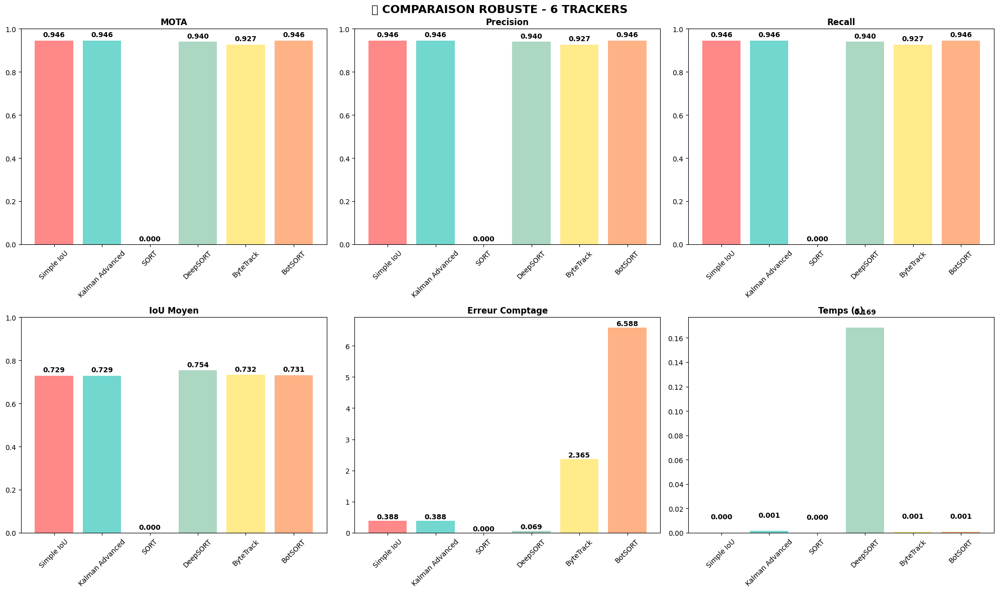


🔍 ANALYSE DES POINTS FORTS ET FAIBLES

📊 Simple IoU:
   Score: 0.866 | MOTA: 0.946 | Precision: 0.946
   Recall: 0.946 | IoU: 0.729 | Temps: 0.0001s
   Points forts: 🎯 Excellente précision globale | ✅ Peu de faux positifs | 🔍 Bonne détection des vrais positifs | ⚡ Très rapide

📊 Kalman Advanced:
   Score: 0.862 | MOTA: 0.946 | Precision: 0.946
   Recall: 0.946 | IoU: 0.729 | Temps: 0.0014s
   Points forts: 🎯 Excellente précision globale | ✅ Peu de faux positifs | 🔍 Bonne détection des vrais positifs | ⚡ Très rapide

📊 SORT:
   Score: 0.250 | MOTA: 0.000 | Precision: 0.000
   Recall: 0.000 | IoU: 0.000 | Temps: 0.0000s
   Points forts: ⚡ Très rapide
   Points faibles: ❌ Précision globale faible | ⚠️  Beaucoup de faux positifs | 🔎 Beaucoup de faux négatifs

📊 DeepSORT:
   Score: 0.751 | MOTA: 0.940 | Precision: 0.940
   Recall: 0.940 | IoU: 0.754 | Temps: 0.1685s
   Points forts: 🎯 Excellente précision globale | ✅ Peu de faux positifs | 🔍 Bonne détection des vrais positifs
   Points fai

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import random
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import time
from scipy.optimize import linear_sum_assignment
from ultralytics import YOLO
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from deep_sort_realtime.deepsort_tracker import DeepSort

# --- CONFIGURATION ---
view_path = "/root/.cache/kagglehub/datasets/yeeandres/pets2009/versions/1/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

# --- DÉTECTEUR YOLOv8 UNIFIÉ ---
class YOLOv8_Detector:
    def __init__(self, model_type='yolov8n.pt', conf_threshold=0.5):
        print(f"🔧 Chargement de {model_type}...")
        self.model = YOLO(model_type)
        self.conf_threshold = conf_threshold
        print(f"✅ YOLOv8 chargé: {model_type}")

    def detect(self, image):
        results = self.model(image, conf=self.conf_threshold, verbose=False)
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    if int(box.cls) == 0:  # Personnes seulement
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        detections.append([x1, y1, x2, y2, confidence])

        return detections

# --- TRACKER DEEPSORT OFFICIEL ---
class OfficialDeepSORT_Tracker:
    def __init__(self):
        print("🔧 Initialisation de DeepSORT officiel...")
        self.tracker = DeepSort(
            max_age=50,
            n_init=3,
            max_cosine_distance=0.2,
            max_iou_distance=0.7,
        )
        print("✅ DeepSORT officiel initialisé")

    def update(self, detections, image):
        if not detections:
            return []

        # Convertir les détections au format DeepSORT
        ds_detections = []
        for det in detections:
            bbox = det[:4]
            confidence = det[4]
            # Convertir [x1, y1, x2, y2] en [x1, y1, width, height]
            x1, y1, x2, y2 = bbox
            width = x2 - x1
            height = y2 - y1
            ds_detections.append(([x1, y1, width, height], confidence, 'person'))

        # Mettre à jour le tracker
        tracks = self.tracker.update_tracks(ds_detections, frame=image)

        # Formater les résultats
        results = []
        for track in tracks:
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            bbox = track.to_ltrb()
            results.append([*bbox, track_id])

        return results

# --- TRACKER BYTETRACK CORRIGÉ ---
class ByteTrack_Tracker:
    def __init__(self, track_high_thresh=0.5, track_low_thresh=0.1, match_thresh=0.8):
        print("🔧 Initialisation de ByteTrack...")
        self.track_high_thresh = track_high_thresh
        self.track_low_thresh = track_low_thresh
        self.match_thresh = match_thresh
        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []
        self.frame_id = 0
        self.next_id = 1
        print("✅ ByteTrack initialisé")

    def update(self, detections, image=None):
        self.frame_id += 1

        # Séparer les détections par confiance
        dets_high = [det for det in detections if det[4] >= self.track_high_thresh]
        dets_low = [det for det in detections if self.track_low_thresh <= det[4] < self.track_high_thresh]

        # Étape 1: Association avec haute confiance
        matches_high, unmatched_tracks, unmatched_dets_high = self.matching(
            self.tracked_tracks, dets_high, self.match_thresh
        )

        # Mettre à jour les tracks matched
        for track_idx, det_idx in matches_high:
            track = self.tracked_tracks[track_idx]
            det = dets_high[det_idx]
            track['bbox'] = det[:4]
            track['age'] = 0
            track['hits'] += 1

        # Étape 2: Association deuxième chance avec basse confiance
        remaining_dets = [dets_high[i] for i in unmatched_dets_high] + dets_low
        matches_low, unmatched_tracks, unmatched_dets_low = self.matching(
            [self.tracked_tracks[i] for i in unmatched_tracks],
            remaining_dets,
            0.5  # Seuil plus bas
        )

        # Mettre à jour les tracks de deuxième chance
        for track_idx, det_idx in matches_low:
            original_track_idx = unmatched_tracks[track_idx]
            track = self.tracked_tracks[original_track_idx]
            det = remaining_dets[det_idx]
            track['bbox'] = det[:4]
            track['age'] = 0
            track['hits'] += 1

        # Étape 3: Créer de nouveaux tracks
        for det_idx in unmatched_dets_low:
            det = remaining_dets[det_idx]
            new_track = {
                'id': self.next_id,
                'bbox': det[:4],
                'age': 0,
                'hits': 1,
                'start_frame': self.frame_id
            }
            self.tracked_tracks.append(new_track)
            self.next_id += 1

        # Étape 4: Gérer les tracks perdus
        active_tracks = []
        for track in self.tracked_tracks:
            track['age'] += 1
            # Garder les tracks avec au moins 1 hit et âge raisonnable
            if track['hits'] >= 1 and track['age'] <= 30:
                active_tracks.append(track)

        self.tracked_tracks = active_tracks

        # Formater les résultats
        results = []
        for track in self.tracked_tracks:
            x1, y1, x2, y2 = track['bbox']
            results.append([x1, y1, x2, y2, track['id']])

        return results

    def matching(self, tracks, detections, threshold):
        if not tracks or not detections:
            return [], list(range(len(tracks))), list(range(len(detections)))

        cost_matrix = np.zeros((len(tracks), len(detections)))
        for i, track in enumerate(tracks):
            for j, det in enumerate(detections):
                iou = self.calculate_iou(track['bbox'], det[:4])
                cost_matrix[i, j] = 1 - iou  # Convertir en coût

        matches = []
        unmatched_tracks = list(range(len(tracks)))
        unmatched_dets = list(range(len(detections)))

        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
            for i, j in zip(row_ind, col_ind):
                if cost_matrix[i, j] <= (1 - threshold):
                    matches.append((i, j))
                    if i in unmatched_tracks:
                        unmatched_tracks.remove(i)
                    if j in unmatched_dets:
                        unmatched_dets.remove(j)

        return matches, unmatched_tracks, unmatched_dets

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

# --- TRACKER BOTSORT CORRIGÉ ---
class BotSORT_Tracker:
    def __init__(self, track_high_thresh=0.5, match_thresh=0.8, track_buffer=30):
        print("🔧 Initialisation de BotSORT corrigé...")
        self.track_high_thresh = track_high_thresh
        self.match_thresh = match_thresh
        self.track_buffer = track_buffer
        self.tracked_tracks = []
        self.frame_id = 0
        self.next_id = 1
        print("✅ BotSORT initialisé")

    def update(self, detections, image=None):
        self.frame_id += 1

        # Filtrer les détections
        dets = [det for det in detections if det[4] >= self.track_high_thresh]

        # Matching
        matches, unmatched_tracks, unmatched_dets = self.matching(
            self.tracked_tracks, dets
        )

        # Mettre à jour les tracks existants
        for track_idx, det_idx in matches:
            track = self.tracked_tracks[track_idx]
            det = dets[det_idx]
            track['bbox'] = det[:4]
            track['age'] = 0

        # Créer de nouveaux tracks
        for det_idx in unmatched_dets:
            det = dets[det_idx]
            new_track = {
                'id': self.next_id,
                'bbox': det[:4],
                'age': 0,
                'start_frame': self.frame_id
            }
            self.tracked_tracks.append(new_track)
            self.next_id += 1

        # Nettoyer les tracks anciens
        active_tracks = []
        for track in self.tracked_tracks:
            track['age'] += 1
            if track['age'] <= self.track_buffer:
                active_tracks.append(track)

        self.tracked_tracks = active_tracks

        # Formater les résultats
        results = []
        for track in self.tracked_tracks:
            x1, y1, x2, y2 = track['bbox']
            results.append([x1, y1, x2, y2, track['id']])

        return results

    def matching(self, tracks, detections):
        if not tracks or not detections:
            return [], list(range(len(tracks))), list(range(len(detections)))

        cost_matrix = np.zeros((len(tracks), len(detections)))
        for i, track in enumerate(tracks):
            for j, det in enumerate(detections):
                iou = self.calculate_iou(track['bbox'], det[:4])
                cost_matrix[i, j] = 1 - iou  # Convertir IoU en coût

        matches = []
        unmatched_tracks = list(range(len(tracks)))
        unmatched_dets = list(range(len(detections)))

        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
            for i, j in zip(row_ind, col_ind):
                if cost_matrix[i, j] <= (1 - self.match_thresh):
                    matches.append((i, j))
                    unmatched_tracks.remove(i)
                    unmatched_dets.remove(j)

        return matches, unmatched_tracks, unmatched_dets

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

# --- TRACKER SORT CORRIGÉ ---
class SORT_Tracker:
    def __init__(self, max_age=50, min_hits=3, iou_threshold=0.3):
        self.max_age = max_age
        self.min_hits = min_hits
        self.iou_threshold = iou_threshold
        self.tracks = []  # Corrigé: 'tracks' au lieu de 'trackers'
        self.frame_count = 0
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        self.frame_count += 1

        # Prédire les positions (simulation Kalman)
        for track in self.tracks:
            track['age'] += 1
            track['predicted_bbox'] = track['bbox']  # Prédiction simple

        # Matching avec Hungarian
        matches, unmatched_tracks, unmatched_dets = [], [], []

        if self.tracks and detections:
            cost_matrix = np.zeros((len(self.tracks), len(detections)))

            for i, track in enumerate(self.tracks):
                for j, det in enumerate(detections):
                    bbox_to_use = track.get('predicted_bbox', track['bbox'])
                    iou = self.calculate_iou(bbox_to_use, det[:4])
                    cost_matrix[i, j] = 1 - iou

            if cost_matrix.size > 0:
                row_ind, col_ind = linear_sum_assignment(cost_matrix)
                for i, j in zip(row_ind, col_ind):
                    if cost_matrix[i, j] <= (1 - self.iou_threshold):
                        matches.append((i, j))
                    else:
                        unmatched_tracks.append(i)
                        unmatched_dets.append(j)
        else:
            unmatched_tracks = list(range(len(self.tracks)))
            unmatched_dets = list(range(len(detections)))

        # Mettre à jour les tracks matched
        for i, j in matches:
            self.tracks[i]['bbox'] = detections[j][:4]
            self.tracks[i]['hits'] += 1
            self.tracks[i]['age'] = 0

        # Nouveaux tracks
        for j in unmatched_dets:
            new_track = {
                'id': self.next_id,
                'bbox': detections[j][:4],
                'hits': 1,
                'age': 0
            }
            self.tracks.append(new_track)
            self.next_id += 1

        # Nettoyer
        active_tracks = []
        for track in self.tracks:
            if track['age'] <= self.max_age and track['hits'] >= self.min_hits:
                active_tracks.append(track)

        self.tracks = active_tracks

        # Résultats
        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRACKER SIMPLE (IoU) ---
class SimpleTracker:
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRACKER KALMAN AVANCÉ ---
class AdvancedKalmanTracker:
    def __init__(self, max_age=50, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1
        self.kalman_filters = {}

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def init_kalman(self, bbox):
        kf = cv2.KalmanFilter(8, 4)
        kf.measurementMatrix = np.array([
            [1, 0, 0, 0, 0, 0, 0, 0],
            [0, 1, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 0, 1, 0, 0, 0, 0]
        ], np.float32)

        kf.transitionMatrix = np.array([
            [1, 0, 0, 0, 1, 0, 0, 0],
            [0, 1, 0, 0, 0, 1, 0, 0],
            [0, 0, 1, 0, 0, 0, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 1],
            [0, 0, 0, 0, 1, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 0, 0],
            [0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1]
        ], np.float32)

        kf.processNoiseCov = np.eye(8, dtype=np.float32) * 0.03
        kf.measurementNoiseCov = np.eye(4, dtype=np.float32) * 0.1

        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1
        kf.statePost = np.array([cx, cy, w, h, 0, 0, 0, 0], dtype=np.float32)

        return kf

    def predict_kalman(self, kf):
        prediction = kf.predict()
        cx, cy, w, h = prediction[:4]
        return [cx - w/2, cy - h/2, cx + w/2, cy + h/2]

    def update_kalman(self, kf, bbox):
        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1
        measurement = np.array([cx, cy, w, h], dtype=np.float32).reshape(4, 1)
        kf.correct(measurement)

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1
            if track['id'] in self.kalman_filters:
                predicted_bbox = self.predict_kalman(self.kalman_filters[track['id']])
                track['predicted_bbox'] = predicted_bbox

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                if 'predicted_bbox' in track:
                    iou = self.calculate_iou(track['predicted_bbox'], detection[:4])
                else:
                    iou = self.calculate_iou(track['bbox'], detection[:4])

                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                detection_bbox = detections[best_detection_idx][:4]
                track['bbox'] = detection_bbox
                track['age'] = 0

                if track['id'] in self.kalman_filters:
                    self.update_kalman(self.kalman_filters[track['id']], detection_bbox)
                else:
                    self.kalman_filters[track['id']] = self.init_kalman(detection_bbox)

                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)

                self.kalman_filters[self.next_id] = self.init_kalman(detection[:4])
                self.next_id += 1

        active_tracks = []
        for track in self.tracks:
            if track['age'] <= self.max_age:
                active_tracks.append(track)
            else:
                if track['id'] in self.kalman_filters:
                    del self.kalman_filters[track['id']]
        self.tracks = active_tracks

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- CHARGEMENT DES DONNÉES ---
def load_ground_truth(annotation_file, max_frames=50):
    try:
        tree = ET.parse(annotation_file)
        root = tree.getroot()
        gt_data = defaultdict(list)

        for frame_elem in root.findall('frame'):
            frame_number = int(frame_elem.attrib['number'])
            if frame_number > max_frames:
                break

            objectlist = frame_elem.find('objectlist')
            if objectlist is not None:
                for obj in objectlist.findall('object'):
                    pid = int(obj.attrib['id'])
                    box = obj.find('box')
                    xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
                    w, h = float(box.attrib['w']), float(box.attrib['h'])
                    x1, y1 = int(xc - w/2), int(yc - h/2)
                    x2, y2 = int(xc + w/2), int(yc + h/2)
                    gt_data[frame_number].append((x1, y1, x2, y2, pid))

        print(f"✅ Chargé {len(gt_data)} frames d'annotations")
        return gt_data
    except Exception as e:
        print(f"❌ Erreur lors du chargement des annotations: {e}")
        return defaultdict(list)

# --- ÉVALUATEUR COMPLET AVEC SCORE CORRIGÉ ---
class ComprehensiveEvaluator:
    def __init__(self):
        self.metrics = defaultdict(list)
        self.detailed_results = defaultdict(lambda: defaultdict(list))

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def calculate_fixed_score(self, tracker_name):
        """Score composite corrigé sans valeurs négatives"""
        mota = np.mean(self.metrics[f'{tracker_name}_mota']) if f'{tracker_name}_mota' in self.metrics else 0
        iou = np.mean(self.metrics[f'{tracker_name}_iou']) if f'{tracker_name}_iou' in self.metrics else 0
        time_vals = self.metrics.get(f'{tracker_name}_time', [0.1])
        time_val = np.mean(time_vals) if time_vals else 0.1
        precision = np.mean(self.metrics[f'{tracker_name}_precision']) if f'{tracker_name}_precision' in self.metrics else 0
        count_error = np.mean(self.metrics[f'{tracker_name}_count_error']) if f'{tracker_name}_count_error' in self.metrics else 0

        # Score composite corrigé
        time_score = max(0, 1 - min(time_val * 20, 1))  # Éviter les négatifs
        count_score = max(0, 1 - min(count_error, 1))   # Éviter les négatifs

        score = (0.30 * mota +
                 0.25 * iou +
                 0.20 * precision +
                 0.15 * time_score +
                 0.10 * count_score)

        return max(0, min(score, 1))  # Score entre 0 et 1

    def update_metrics(self, gt_boxes, tracker_boxes, tracker_name, frame_time=None, frame_num=None):
        if frame_num is not None:
            self.detailed_results[tracker_name]['frame_nums'].append(frame_num)
            self.detailed_results[tracker_name]['num_tracks'].append(len(tracker_boxes))
            if gt_boxes:
                self.detailed_results[tracker_name]['num_gt'].append(len(gt_boxes))

        if not gt_boxes or not tracker_boxes:
            if frame_time:
                self.metrics[f'{tracker_name}_time'].append(frame_time)
            return

        ious = []
        for gt_box in gt_boxes:
            best_iou = 0
            for track_box in tracker_boxes:
                iou = self.calculate_iou(gt_box[:4], track_box[:4])
                best_iou = max(best_iou, iou)
            ious.append(best_iou)

        if ious:
            avg_iou = np.mean(ious)
            self.metrics[f'{tracker_name}_iou'].append(avg_iou)

            precision = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_precision'].append(precision)

            recall = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_recall'].append(recall)

            count_error = abs(len(tracker_boxes) - len(gt_boxes)) / len(gt_boxes) if len(gt_boxes) > 0 else 0
            self.metrics[f'{tracker_name}_count_error'].append(count_error)

        matched = sum(1 for iou in ious if iou > 0.5)
        mota = matched / len(gt_boxes) if gt_boxes else 0
        self.metrics[f'{tracker_name}_mota'].append(mota)

        if frame_time:
            self.metrics[f'{tracker_name}_time'].append(frame_time)

    def get_final_metrics(self):
        final_metrics = {}
        for metric_name, values in self.metrics.items():
            if values:
                final_metrics[f'{metric_name}_mean'] = np.mean(values)
                final_metrics[f'{metric_name}_std'] = np.std(values)
        return final_metrics

# --- COMPARAISON ROBUSTE AVEC 6 TRACKERS ---
def run_robust_comparison():
    """Comparaison robuste avec 6 trackers différents"""

    # Initialiser YOLOv8
    yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)

    # Initialiser tous les trackers
    trackers = {
        'Simple IoU': SimpleTracker(max_age=30, iou_threshold=0.3),
        'Kalman Advanced': AdvancedKalmanTracker(max_age=50, iou_threshold=0.3),
        'SORT': SORT_Tracker(max_age=50, min_hits=3, iou_threshold=0.3),
        'DeepSORT': OfficialDeepSORT_Tracker(),
        'ByteTrack': ByteTrack_Tracker(),
        'BotSORT': BotSORT_Tracker(),
    }

    evaluator = ComprehensiveEvaluator()
    gt_data = load_ground_truth(annotation_file, max_frames=300)

    print("🚀 Démarrage de la comparaison robuste avec 6 trackers...")
    print(f"📊 {len(gt_data)} frames à analyser")

    for frame_num in sorted(gt_data.keys())[:20]:
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gt_boxes = gt_data[frame_num]

        # Détection YOLOv8
        detections = yolo.detect(frame_rgb)
        print(f"📊 Frame {frame_num:3d} | Détections: {len(detections)} | GT: {len(gt_boxes)}")

        for tracker_name, tracker in trackers.items():
            start_time = time.time()

            try:
                if tracker_name in ['DeepSORT', 'ByteTrack', 'BotSORT']:
                    tracker_boxes = tracker.update(detections, frame_rgb)
                else:
                    tracker_boxes = tracker.update(detections)

                exec_time = time.time() - start_time
                evaluator.update_metrics(gt_boxes, tracker_boxes, tracker_name, exec_time, frame_num)

                print(f"  ├─ {tracker_name:15} | Tracks: {len(tracker_boxes):2d} | Time: {exec_time:.3f}s")

            except Exception as e:
                print(f"  ├─ ❌ Erreur avec {tracker_name}: {e}")
                continue

    return evaluator

# --- VISUALISATION ROBUSTE ---
def plot_robust_comparison(evaluator):
    """Visualisation robuste des résultats avec 6 trackers"""

    trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT', 'ByteTrack', 'BotSORT']
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFE66D', '#FF9F68']

    # Configuration des plots
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('📊 COMPARAISON ROBUSTE - 6 TRACKERS', fontsize=16, fontweight='bold')

    # Métriques de précision
    precision_metrics = ['mota_mean', 'precision_mean', 'recall_mean', 'iou_mean', 'count_error_mean', 'time_mean']
    precision_labels = ['MOTA', 'Precision', 'Recall', 'IoU Moyen', 'Erreur Comptage', 'Temps (s)']

    final_metrics = evaluator.get_final_metrics()

    for idx, (metric, label) in enumerate(zip(precision_metrics, precision_labels)):
        row, col = idx // 3, idx % 3
        values = [final_metrics.get(f'{t}_{metric}', 0) for t in trackers]
        bars = axes[row, col].bar(trackers, values, color=colors, alpha=0.8)
        axes[row, col].set_title(f'{label}', fontweight='bold')

        if label in ['MOTA', 'Precision', 'Recall', 'IoU Moyen']:
            axes[row, col].set_ylim(0, 1)

        axes[row, col].tick_params(axis='x', rotation=45)

        for bar, value in zip(bars, values):
            axes[row, col].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                              f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    return final_metrics

# --- ANALYSE DES POINTS FORTS/FAIBLES ---
def analyze_strengths_weaknesses(evaluator, final_metrics):
    """Analyse détaillée des points forts et faibles de chaque tracker"""

    trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT', 'ByteTrack', 'BotSORT']

    print("\n🔍 ANALYSE DES POINTS FORTS ET FAIBLES")
    print("=" * 60)

    scores = {}
    for tracker in trackers:
        score = evaluator.calculate_fixed_score(tracker)
        scores[tracker] = score

        mota = final_metrics.get(f'{tracker}_mota_mean', 0)
        precision = final_metrics.get(f'{tracker}_precision_mean', 0)
        recall = final_metrics.get(f'{tracker}_recall_mean', 0)
        iou = final_metrics.get(f'{tracker}_iou_mean', 0)
        time_val = final_metrics.get(f'{tracker}_time_mean', 0.1)

        print(f"\n📊 {tracker}:")
        print(f"   Score: {score:.3f} | MOTA: {mota:.3f} | Precision: {precision:.3f}")
        print(f"   Recall: {recall:.3f} | IoU: {iou:.3f} | Temps: {time_val:.4f}s")

        # Analyse des points forts
        strengths = []
        if mota > 0.7:
            strengths.append("🎯 Excellente précision globale")
        if precision > 0.8:
            strengths.append("✅ Peu de faux positifs")
        if recall > 0.8:
            strengths.append("🔍 Bonne détection des vrais positifs")
        if time_val < 0.01:
            strengths.append("⚡ Très rapide")
        elif time_val < 0.05:
            strengths.append("🐰 Rapide")

        # Analyse des points faibles
        weaknesses = []
        if mota < 0.5:
            weaknesses.append("❌ Précision globale faible")
        if precision < 0.6:
            weaknesses.append("⚠️  Beaucoup de faux positifs")
        if recall < 0.6:
            weaknesses.append("🔎 Beaucoup de faux négatifs")
        if time_val > 0.1:
            weaknesses.append("🐌 Lent")

        if strengths:
            print("   Points forts: " + " | ".join(strengths))
        if weaknesses:
            print("   Points faibles: " + " | ".join(weaknesses))

    return scores

# --- LANCEMENT PRINCIPAL ---
if __name__ == "__main__":
    print("🎯 COMPARAISON ROBUSTE - 6 TRACKERS")
    print("=" * 60)

    # Test des dépendances
    print("1. Vérification des dépendances...")
    try:
        import torch
        import torchvision
        print(f"✅ PyTorch version: {torch.__version__}")
        print(f"✅ Torchvision version: {torchvision.__version__}")
        print(f"✅ GPU disponible: {torch.cuda.is_available()}")
    except ImportError as e:
        print(f"❌ Erreur d'importation: {e}")
        exit()

    # Comparaison robuste
    print("\n2. Comparaison robuste avec 6 trackers...")
    try:
        evaluator = run_robust_comparison()
        final_metrics = plot_robust_comparison(evaluator)
        scores = analyze_strengths_weaknesses(evaluator, final_metrics)

        # Résultats finaux
        print("\n" + "=" * 60)
        print("RÉSULTATS FINAUX - COMPARAISON ROBUSTE")
        print("=" * 60)

        trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT', 'ByteTrack', 'BotSORT']

        print("\n📊 CLASSEMENT FINAL:")
        print("-" * 50)

        for tracker in trackers:
            mota = final_metrics.get(f'{tracker}_mota_mean', 0)
            iou = final_metrics.get(f'{tracker}_iou_mean', 0)
            time_val = final_metrics.get(f'{tracker}_time_mean', 0.1)
            precision = final_metrics.get(f'{tracker}_precision_mean', 0)
            score = scores[tracker]

            print(f"\n{tracker:<20}")
            print(f"  MOTA:      {mota:.3f}")
            print(f"  IoU:       {iou:.3f}")
            print(f"  Precision: {precision:.3f}")
            print(f"  Temps:     {time_val:.4f}s")
            print(f"  Score:     {score:.3f}")

        # Classement
        print("\n🏆 CLASSEMENT FINAL:")
        print("-" * 30)
        ranked = sorted(scores.items(), key=lambda x: x[1], reverse=True)
        for i, (tracker, score) in enumerate(ranked, 1):
            print(f"{i:2d}. {tracker:<20} {score:.3f}")

        print("\n✅ Analyse robuste terminée!")

    except Exception as e:
        print(f"❌ Erreur lors de la comparaison: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
!pip install -U mesa --q

In [ ]:
!pip install -U "mesa[rec]" --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 75.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 108.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.8/108.8 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.2/266.2 kB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 456.8/456.8 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 72.2 MB/s eta 0:00:00


In [ ]:
import mesa
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import cv2
import os

# --- MESA 3 COMPATIBLE AGENT AND MODEL ---
class TrackingAgent(mesa.Agent):
    def __init__(self, model, track_id, initial_position):
        # Mesa 3: No unique_id parameter, automatically assigned
        super().__init__(model)
        self.track_id = track_id
        self.trajectory = [initial_position]

    def step(self):
        # Optional: Add any agent-specific logic here
        # For tracking, we mainly update positions from external data
        pass

    def add_position(self, position):
        """Add new position to trajectory"""
        self.trajectory.append(position)

class TrackingModel(mesa.Model):
    def __init__(self, seed=None):
        # Mesa 3: super() is mandatory with seed parameter
        super().__init__(seed=seed)
        self.agent_dict = {}  # Custom dict to track agents by track_id
        self.steps = 0  # Mesa 3 uses steps instead of time

    def add_or_update_agent(self, track_id, position):
        """Add new agent or update existing one with new position"""
        if track_id not in self.agent_dict:
            # Create new agent - automatically added to model.agents
            agent = TrackingAgent(self, track_id, position)
            self.agent_dict[track_id] = agent
        else:
            # Update existing agent
            self.agent_dict[track_id].add_position(position)

    def step(self):
        """Mesa 3 step method"""
        # If you need to run agent logic, use AgentSet methods
        # self.agents.shuffle_do("step")  # Uncomment if agents have step logic
        self.steps += 1

# --- UPDATED VISUALISATION DES TRAJECTOIRES ---
def display_frames_with_trajectories(view_path, tracker, max_frames=50):
    """
    Affiche les frames avec les trajectoires des personnes suivies par le tracker.
    Version compatible Mesa 3.

    tracker : instance d'un tracker déjà mis à jour avec des frames précédentes
    """
    # Initialize Mesa 3 model
    tracking_model = TrackingModel()

    for frame_num in range(1, max_frames+1):
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # --- Détection (YOLOv8) et mise à jour du tracker ---
        yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)
        detections = yolo.detect(frame_rgb)
        tracker_boxes = tracker.update(detections, frame_rgb) if hasattr(tracker, 'update') else tracker.update(detections)

        # --- Mise à jour des agents Mesa 3 ---
        for box in tracker_boxes:
            x1, y1, x2, y2, track_id = box
            cx, cy = int((x1 + x2)/2), int((y1 + y2)/2)
            tracking_model.add_or_update_agent(track_id, (cx, cy))

        # Update Mesa model step
        tracking_model.step()

        # --- Dessiner les boxes et trajectoires ---
        for box in tracker_boxes:
            x1, y1, x2, y2, track_id = [int(v) for v in box]
            color = tuple(int(c) for c in np.random.randint(0, 255, size=3))

            # Dessiner la bounding box
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            cv2.putText(frame, f'ID {track_id}', (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # Dessiner les trajectoires depuis les agents Mesa
        for track_id, agent in tracking_model.agent_dict.items():
            points = agent.trajectory
            for i in range(1, len(points)):
                cv2.line(frame, points[i-1], points[i], (0, 255, 0), 2)

        # Affichage
        plt.figure(figsize=(10,6))
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f"Frame {frame_num} - Mesa Agents: {len(tracking_model.agent_dict)} - Step: {tracking_model.steps}")
        plt.axis('off')
        plt.show()
        plt.close()

    return tracking_model

# --- ADDITIONAL MESA 3 VISUALIZATION FUNCTIONS ---
def plot_agent_trajectories(tracking_model):
    """Plot all agent trajectories using Mesa data"""
    plt.figure(figsize=(12, 8))

    for track_id, agent in tracking_model.agent_dict.items():
        if len(agent.trajectory) > 1:
            trajectory = np.array(agent.trajectory)
            plt.plot(trajectory[:, 0], trajectory[:, 1], 'o-',
                    label=f'Agent {track_id}', markersize=3, linewidth=2)

    plt.title(f'Agent Trajectories (Mesa 3) - Total Agents: {len(tracking_model.agent_dict)}')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def get_agent_statistics(tracking_model):
    """Get statistics about the tracking agents"""
    stats = {
        'total_agents': len(tracking_model.agent_dict),
        'total_steps': tracking_model.steps,
        'agent_trajectory_lengths': {},
        'average_trajectory_length': 0
    }

    total_length = 0
    for track_id, agent in tracking_model.agent_dict.items():
        length = len(agent.trajectory)
        stats['agent_trajectory_lengths'][track_id] = length
        total_length += length

    if stats['total_agents'] > 0:
        stats['average_trajectory_length'] = total_length / stats['total_agents']

    return stats

# --- USAGE EXAMPLE ---
"""
# Install Mesa 3 first
!pip install mesa
"""
# Then use the updated function
tracking_model = display_frames_with_trajectories(view_path, tracker, max_frames=50)

# Additional analysis with Mesa
plot_agent_trajectories(tracking_model)

stats = get_agent_statistics(tracking_model)
print(f"Total agents tracked: {stats['total_agents']}")
print(f"Average trajectory length: {stats['average_trajectory_length']:.2f}")

In [ ]:
# --- VISUALISATION DES TRAJECTOIRES ---
def display_frames_with_trajectories(view_path, tracker, max_frames=50):
    """
    Affiche les frames avec les trajectoires des personnes suivies par le tracker.

    tracker : instance d'un tracker déjà mis à jour avec des frames précédentes
    """
    # Dictionnaire pour stocker l'historique des positions par ID
    trajectories = defaultdict(list)

    for frame_num in range(1, max_frames+1):
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # --- Détection (YOLOv8) et mise à jour du tracker ---
        yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)
        detections = yolo.detect(frame_rgb)
        tracker_boxes = tracker.update(detections, frame_rgb) if hasattr(tracker, 'update') else tracker.update(detections)

        # Stocker les positions pour tracer les trajectoires
        for box in tracker_boxes:
            x1, y1, x2, y2, track_id = box
            cx, cy = int((x1 + x2)/2), int((y1 + y2)/2)
            trajectories[track_id].append((cx, cy))

        # --- Dessiner les boxes et trajectoires ---
        for box in tracker_boxes:
            x1, y1, x2, y2, track_id = [int(v) for v in box]
            color = tuple(int(c) for c in np.random.randint(0, 255, size=3))

            # Dessiner la bounding box
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            cv2.putText(frame, f'ID {track_id}', (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # Dessiner les trajectoires
        for track_id, points in trajectories.items():
            for i in range(1, len(points)):
                cv2.line(frame, points[i-1], points[i], (0, 255, 0), 2)

        # Affichage
        plt.figure(figsize=(10,6))
        plt.imshow(frame)
        plt.title(f"Frame {frame_num} avec trajectoires")
        plt.axis('off')
        plt.show()
        plt.close()

🔧 Initialisation de DeepSORT officiel...
✅ DeepSORT officiel initialisé
🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


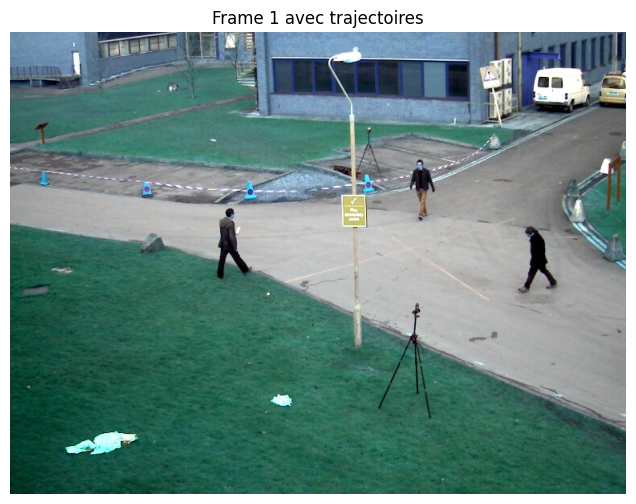

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


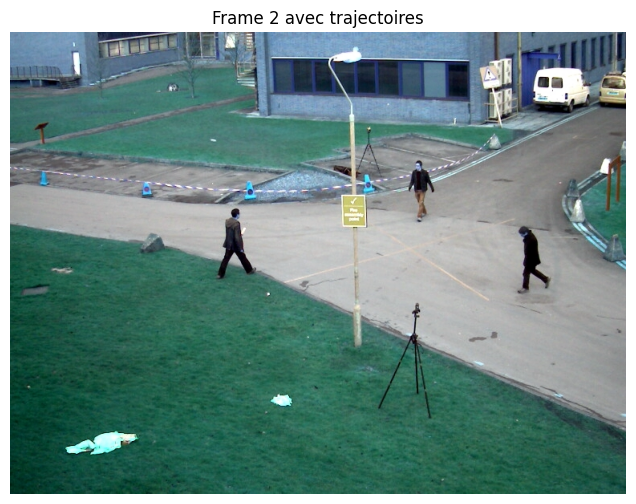

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


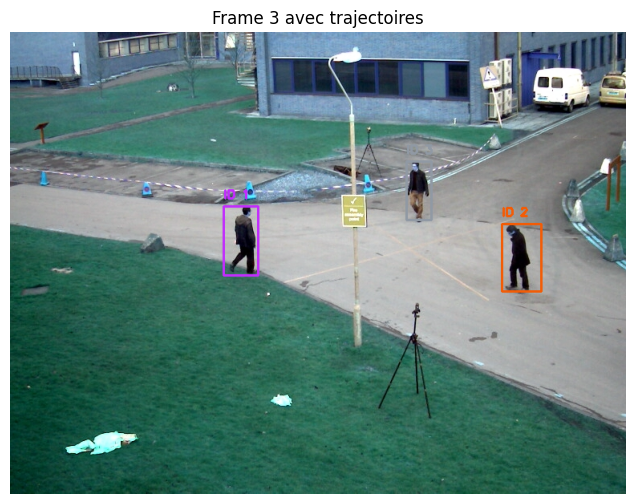

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


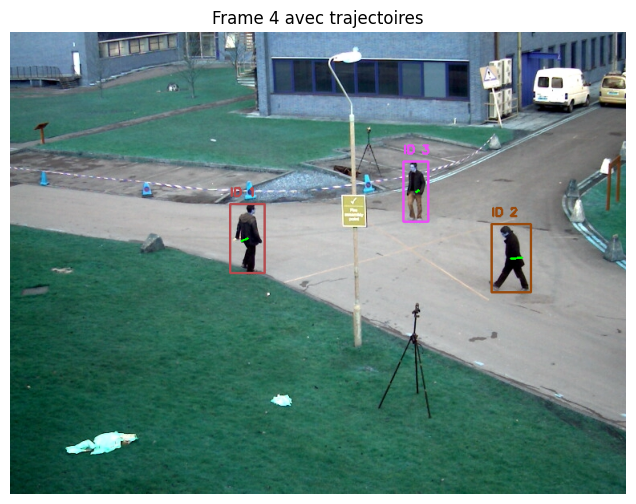

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


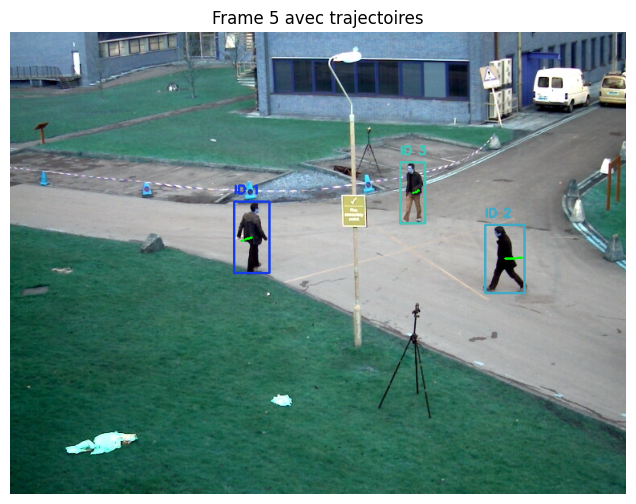

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


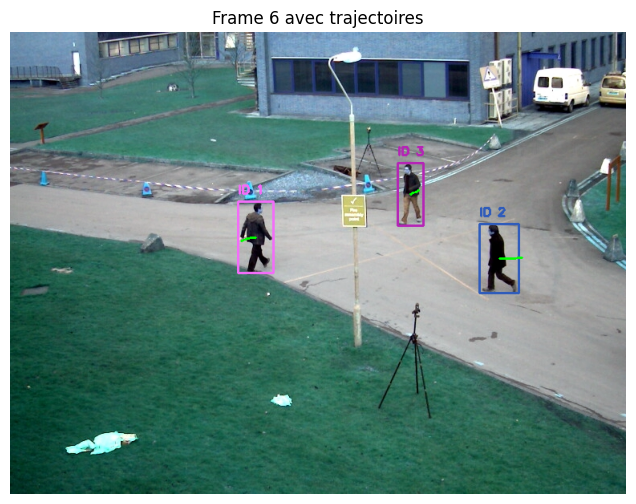

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


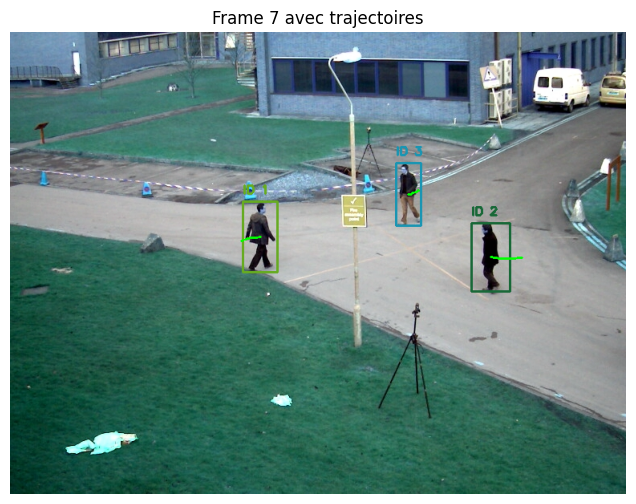

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


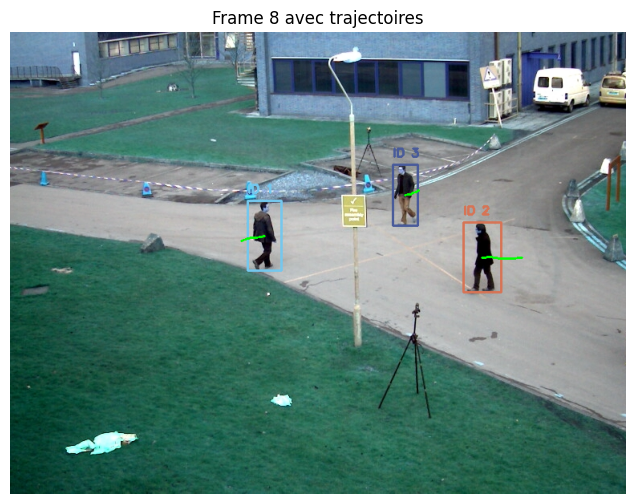

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


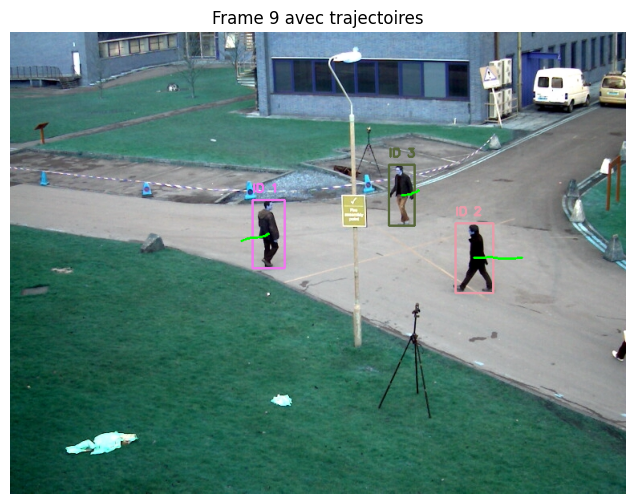

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


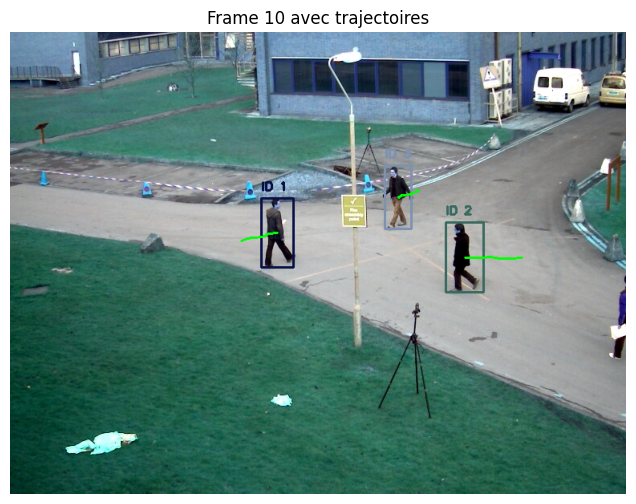

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


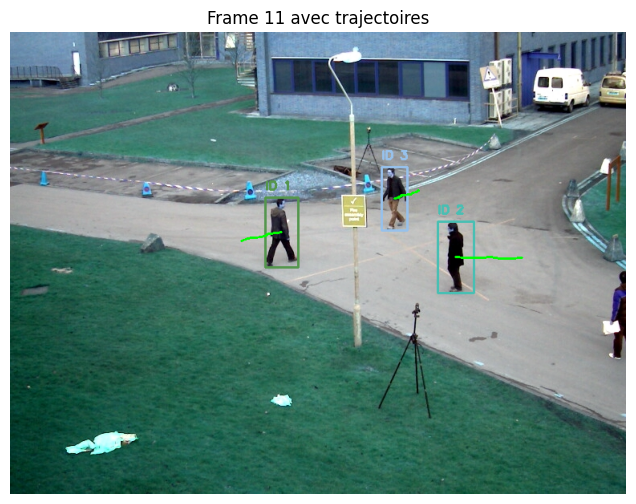

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


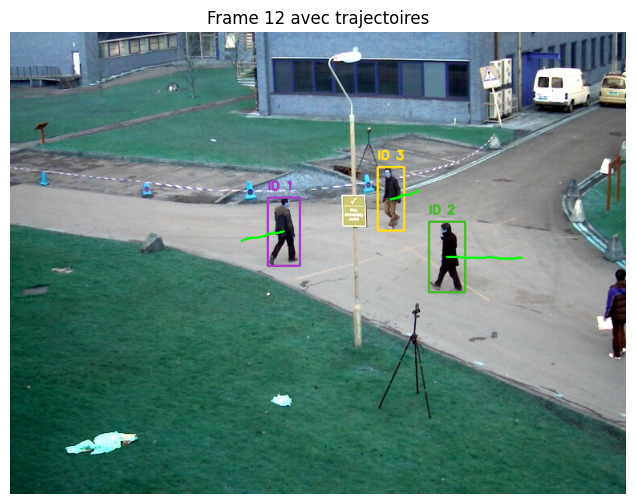

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


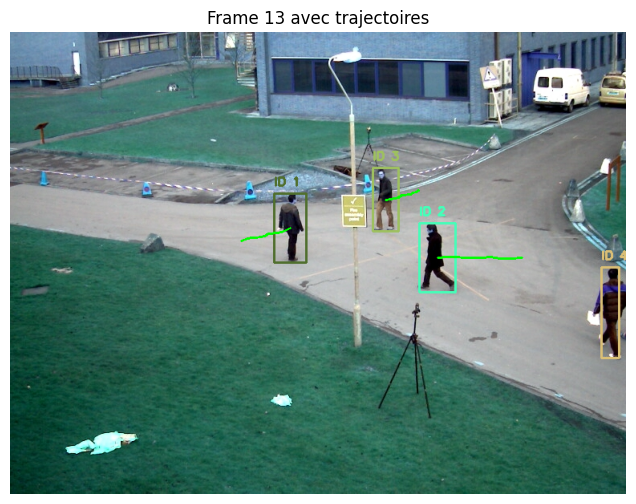

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


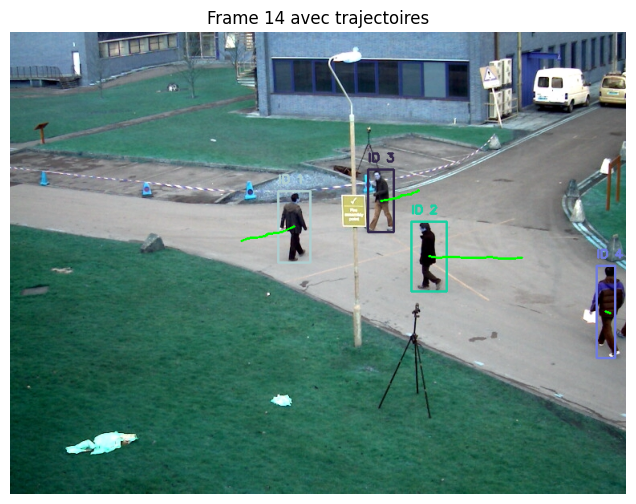

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


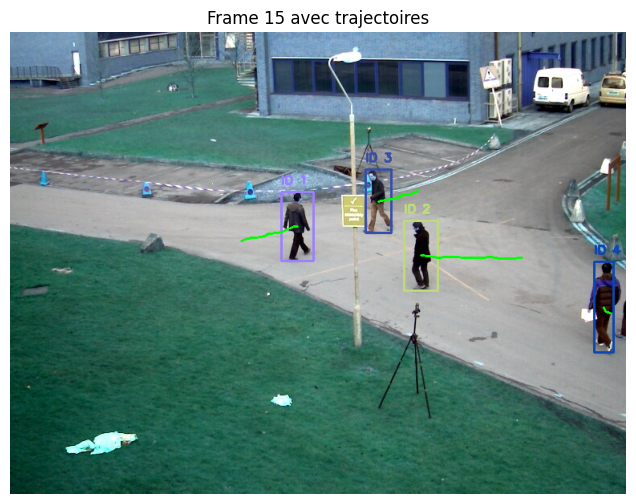

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


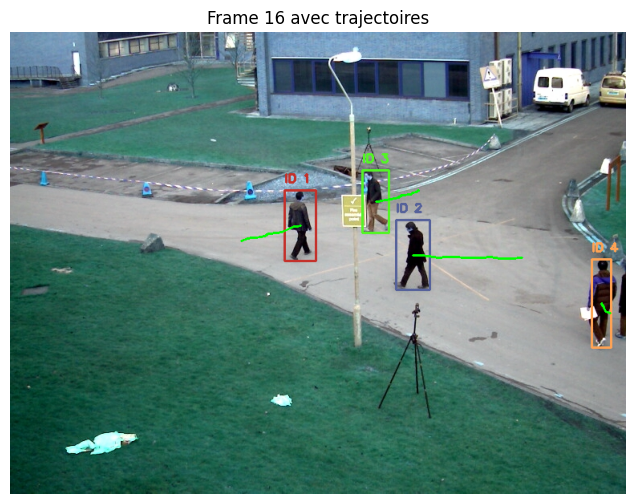

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


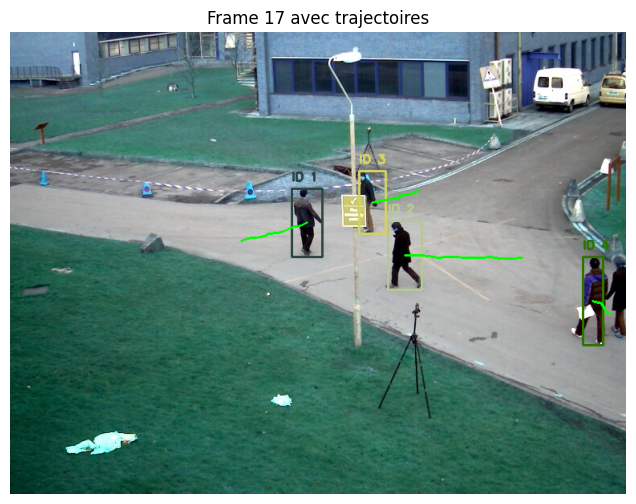

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


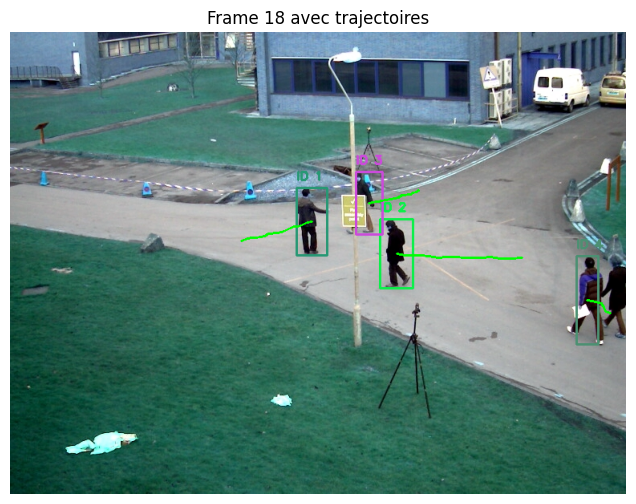

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


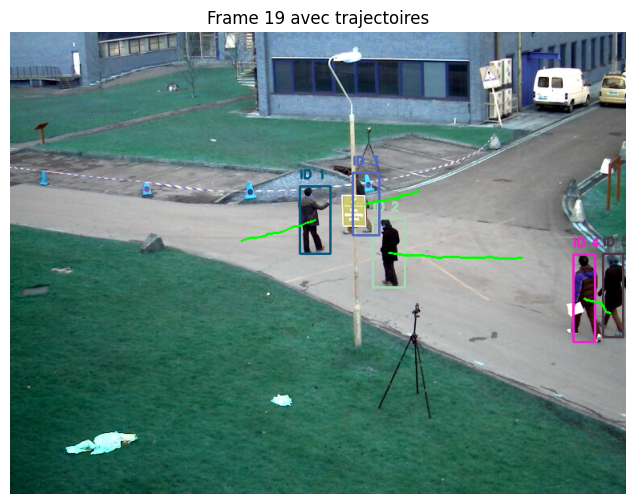

🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt


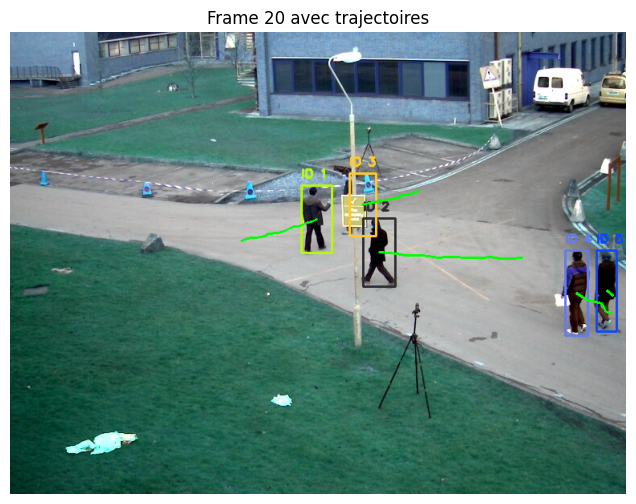

In [ ]:
# Exemple avec DeepSORT
tracker = OfficialDeepSORT_Tracker()
display_frames_with_trajectories(view_path, tracker, max_frames=20)

🎯 COMPARAISON ROBUSTE - 6 TRACKERS
1. Vérification des dépendances...
✅ PyTorch version: 2.8.0+cu126
✅ Torchvision version: 0.23.0+cu126
✅ GPU disponible: False

2. Comparaison robuste avec 6 trackers...
🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt
🔧 Initialisation de DeepSORT officiel...
✅ DeepSORT officiel initialisé
🔧 Initialisation de ByteTrack...
✅ ByteTrack initialisé
🔧 Initialisation de BotSORT corrigé...
✅ BotSORT initialisé
✅ Chargé 301 frames d'annotations
🚀 Démarrage de la comparaison robuste avec 6 trackers...
📊 301 frames à analyser
📊 Frame   0 | Détections: 3 | GT: 3
  ├─ Simple IoU      | Tracks:  3 | Time: 0.000s
  ├─ Kalman Advanced | Tracks:  3 | Time: 0.001s
  ├─ SORT            | Tracks:  0 | Time: 0.000s
  ├─ DeepSORT        | Tracks:  0 | Time: 0.090s
  ├─ ByteTrack       | Tracks:  3 | Time: 0.000s
  ├─ BotSORT         | Tracks:  3 | Time: 0.000s
📊 Frame   1 | Détections: 3 | GT: 3
  ├─ Simple IoU      | Tracks:  3 | Time: 0.000s
  ├─ Kalman Advanced

/tmp/ipython-input-2667243969.py:825: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


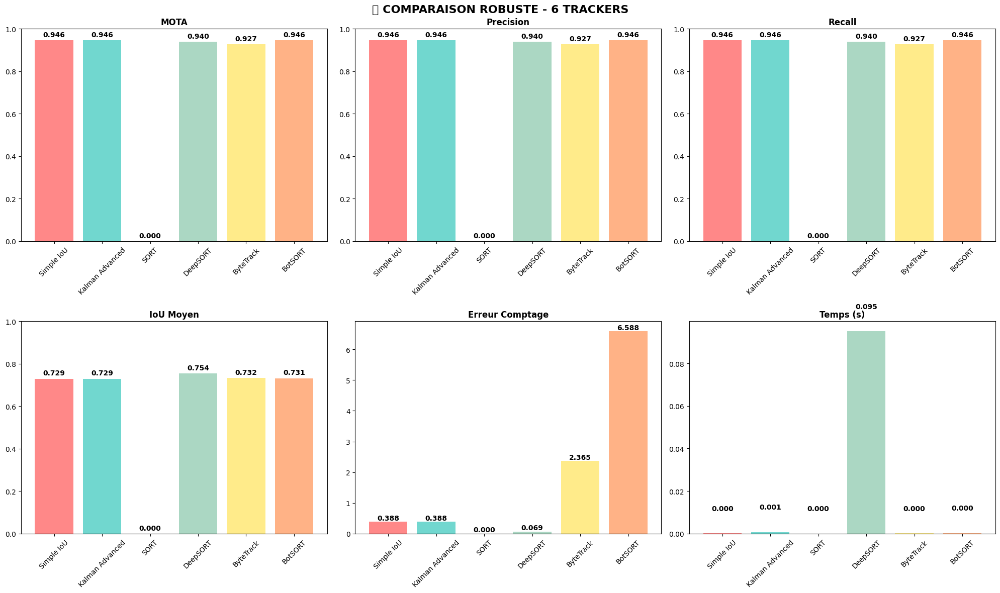


🔍 ANALYSE DES POINTS FORTS ET FAIBLES

📊 Simple IoU:
   Score: 0.866 | MOTA: 0.946 | Precision: 0.946
   Recall: 0.946 | IoU: 0.729 | Temps: 0.0001s
   Points forts: 🎯 Excellente précision globale | ✅ Peu de faux positifs | 🔍 Bonne détection des vrais positifs | ⚡ Très rapide

📊 Kalman Advanced:
   Score: 0.864 | MOTA: 0.946 | Precision: 0.946
   Recall: 0.946 | IoU: 0.729 | Temps: 0.0008s
   Points forts: 🎯 Excellente précision globale | ✅ Peu de faux positifs | 🔍 Bonne détection des vrais positifs | ⚡ Très rapide

📊 SORT:
   Score: 0.250 | MOTA: 0.000 | Precision: 0.000
   Recall: 0.000 | IoU: 0.000 | Temps: 0.0000s
   Points forts: ⚡ Très rapide
   Points faibles: ❌ Précision globale faible | ⚠️  Beaucoup de faux positifs | 🔎 Beaucoup de faux négatifs

📊 DeepSORT:
   Score: 0.751 | MOTA: 0.940 | Precision: 0.940
   Recall: 0.940 | IoU: 0.754 | Temps: 0.0950s
   Points forts: 🎯 Excellente précision globale | ✅ Peu de faux positifs | 🔍 Bonne détection des vrais positifs

📊 ByteTrack:

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import random
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import time
from scipy.optimize import linear_sum_assignment
from ultralytics import YOLO
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from deep_sort_realtime.deepsort_tracker import DeepSort

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

# --- DÉTECTEUR YOLOv8 UNIFIÉ ---
class YOLOv8_Detector:
    def __init__(self, model_type='yolov8n.pt', conf_threshold=0.5):
        print(f"🔧 Chargement de {model_type}...")
        self.model = YOLO(model_type)
        self.conf_threshold = conf_threshold
        print(f"✅ YOLOv8 chargé: {model_type}")

    def detect(self, image):
        results = self.model(image, conf=self.conf_threshold, verbose=False)
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    if int(box.cls) == 0:  # Personnes seulement
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        detections.append([x1, y1, x2, y2, confidence])

        return detections

# --- TRACKER DEEPSORT OFFICIEL ---
class OfficialDeepSORT_Tracker:
    def __init__(self):
        print("🔧 Initialisation de DeepSORT officiel...")
        self.tracker = DeepSort(
            max_age=50,
            n_init=3,
            max_cosine_distance=0.2,
            max_iou_distance=0.7,
        )
        print("✅ DeepSORT officiel initialisé")

    def update(self, detections, image):
        if not detections:
            return []

        # Convertir les détections au format DeepSORT
        ds_detections = []
        for det in detections:
            bbox = det[:4]
            confidence = det[4]
            # Convertir [x1, y1, x2, y2] en [x1, y1, width, height]
            x1, y1, x2, y2 = bbox
            width = x2 - x1
            height = y2 - y1
            ds_detections.append(([x1, y1, width, height], confidence, 'person'))

        # Mettre à jour le tracker
        tracks = self.tracker.update_tracks(ds_detections, frame=image)

        # Formater les résultats
        results = []
        for track in tracks:
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            bbox = track.to_ltrb()
            results.append([*bbox, track_id])

        return results

# --- TRACKER BYTETRACK CORRIGÉ ---
class ByteTrack_Tracker:
    def __init__(self, track_high_thresh=0.5, track_low_thresh=0.1, match_thresh=0.8):
        print("🔧 Initialisation de ByteTrack...")
        self.track_high_thresh = track_high_thresh
        self.track_low_thresh = track_low_thresh
        self.match_thresh = match_thresh
        self.tracked_tracks = []
        self.lost_tracks = []
        self.removed_tracks = []
        self.frame_id = 0
        self.next_id = 1
        print("✅ ByteTrack initialisé")

    def update(self, detections, image=None):
        self.frame_id += 1

        # Séparer les détections par confiance
        dets_high = [det for det in detections if det[4] >= self.track_high_thresh]
        dets_low = [det for det in detections if self.track_low_thresh <= det[4] < self.track_high_thresh]

        # Étape 1: Association avec haute confiance
        matches_high, unmatched_tracks, unmatched_dets_high = self.matching(
            self.tracked_tracks, dets_high, self.match_thresh
        )

        # Mettre à jour les tracks matched
        for track_idx, det_idx in matches_high:
            track = self.tracked_tracks[track_idx]
            det = dets_high[det_idx]
            track['bbox'] = det[:4]
            track['age'] = 0
            track['hits'] += 1

        # Étape 2: Association deuxième chance avec basse confiance
        remaining_dets = [dets_high[i] for i in unmatched_dets_high] + dets_low
        matches_low, unmatched_tracks, unmatched_dets_low = self.matching(
            [self.tracked_tracks[i] for i in unmatched_tracks],
            remaining_dets,
            0.5  # Seuil plus bas
        )

        # Mettre à jour les tracks de deuxième chance
        for track_idx, det_idx in matches_low:
            original_track_idx = unmatched_tracks[track_idx]
            track = self.tracked_tracks[original_track_idx]
            det = remaining_dets[det_idx]
            track['bbox'] = det[:4]
            track['age'] = 0
            track['hits'] += 1

        # Étape 3: Créer de nouveaux tracks
        for det_idx in unmatched_dets_low:
            det = remaining_dets[det_idx]
            new_track = {
                'id': self.next_id,
                'bbox': det[:4],
                'age': 0,
                'hits': 1,
                'start_frame': self.frame_id
            }
            self.tracked_tracks.append(new_track)
            self.next_id += 1

        # Étape 4: Gérer les tracks perdus
        active_tracks = []
        for track in self.tracked_tracks:
            track['age'] += 1
            # Garder les tracks avec au moins 1 hit et âge raisonnable
            if track['hits'] >= 1 and track['age'] <= 30:
                active_tracks.append(track)

        self.tracked_tracks = active_tracks

        # Formater les résultats
        results = []
        for track in self.tracked_tracks:
            x1, y1, x2, y2 = track['bbox']
            results.append([x1, y1, x2, y2, track['id']])

        return results

    def matching(self, tracks, detections, threshold):
        if not tracks or not detections:
            return [], list(range(len(tracks))), list(range(len(detections)))

        cost_matrix = np.zeros((len(tracks), len(detections)))
        for i, track in enumerate(tracks):
            for j, det in enumerate(detections):
                iou = self.calculate_iou(track['bbox'], det[:4])
                cost_matrix[i, j] = 1 - iou  # Convertir en coût

        matches = []
        unmatched_tracks = list(range(len(tracks)))
        unmatched_dets = list(range(len(detections)))

        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
            for i, j in zip(row_ind, col_ind):
                if cost_matrix[i, j] <= (1 - threshold):
                    matches.append((i, j))
                    if i in unmatched_tracks:
                        unmatched_tracks.remove(i)
                    if j in unmatched_dets:
                        unmatched_dets.remove(j)

        return matches, unmatched_tracks, unmatched_dets

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

# --- TRACKER BOTSORT CORRIGÉ ---
class BotSORT_Tracker:
    def __init__(self, track_high_thresh=0.5, match_thresh=0.8, track_buffer=30):
        print("🔧 Initialisation de BotSORT corrigé...")
        self.track_high_thresh = track_high_thresh
        self.match_thresh = match_thresh
        self.track_buffer = track_buffer
        self.tracked_tracks = []
        self.frame_id = 0
        self.next_id = 1
        print("✅ BotSORT initialisé")

    def update(self, detections, image=None):
        self.frame_id += 1

        # Filtrer les détections
        dets = [det for det in detections if det[4] >= self.track_high_thresh]

        # Matching
        matches, unmatched_tracks, unmatched_dets = self.matching(
            self.tracked_tracks, dets
        )

        # Mettre à jour les tracks existants
        for track_idx, det_idx in matches:
            track = self.tracked_tracks[track_idx]
            det = dets[det_idx]
            track['bbox'] = det[:4]
            track['age'] = 0

        # Créer de nouveaux tracks
        for det_idx in unmatched_dets:
            det = dets[det_idx]
            new_track = {
                'id': self.next_id,
                'bbox': det[:4],
                'age': 0,
                'start_frame': self.frame_id
            }
            self.tracked_tracks.append(new_track)
            self.next_id += 1

        # Nettoyer les tracks anciens
        active_tracks = []
        for track in self.tracked_tracks:
            track['age'] += 1
            if track['age'] <= self.track_buffer:
                active_tracks.append(track)

        self.tracked_tracks = active_tracks

        # Formater les résultats
        results = []
        for track in self.tracked_tracks:
            x1, y1, x2, y2 = track['bbox']
            results.append([x1, y1, x2, y2, track['id']])

        return results

    def matching(self, tracks, detections):
        if not tracks or not detections:
            return [], list(range(len(tracks))), list(range(len(detections)))

        cost_matrix = np.zeros((len(tracks), len(detections)))
        for i, track in enumerate(tracks):
            for j, det in enumerate(detections):
                iou = self.calculate_iou(track['bbox'], det[:4])
                cost_matrix[i, j] = 1 - iou  # Convertir IoU en coût

        matches = []
        unmatched_tracks = list(range(len(tracks)))
        unmatched_dets = list(range(len(detections)))

        if cost_matrix.size > 0:
            row_ind, col_ind = linear_sum_assignment(cost_matrix)
            for i, j in zip(row_ind, col_ind):
                if cost_matrix[i, j] <= (1 - self.match_thresh):
                    matches.append((i, j))
                    unmatched_tracks.remove(i)
                    unmatched_dets.remove(j)

        return matches, unmatched_tracks, unmatched_dets

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

# --- TRACKER SORT CORRIGÉ ---
class SORT_Tracker:
    def __init__(self, max_age=50, min_hits=3, iou_threshold=0.3):
        self.max_age = max_age
        self.min_hits = min_hits
        self.iou_threshold = iou_threshold
        self.tracks = []  # Corrigé: 'tracks' au lieu de 'trackers'
        self.frame_count = 0
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        self.frame_count += 1

        # Prédire les positions (simulation Kalman)
        for track in self.tracks:
            track['age'] += 1
            track['predicted_bbox'] = track['bbox']  # Prédiction simple

        # Matching avec Hungarian
        matches, unmatched_tracks, unmatched_dets = [], [], []

        if self.tracks and detections:
            cost_matrix = np.zeros((len(self.tracks), len(detections)))

            for i, track in enumerate(self.tracks):
                for j, det in enumerate(detections):
                    bbox_to_use = track.get('predicted_bbox', track['bbox'])
                    iou = self.calculate_iou(bbox_to_use, det[:4])
                    cost_matrix[i, j] = 1 - iou

            if cost_matrix.size > 0:
                row_ind, col_ind = linear_sum_assignment(cost_matrix)
                for i, j in zip(row_ind, col_ind):
                    if cost_matrix[i, j] <= (1 - self.iou_threshold):
                        matches.append((i, j))
                    else:
                        unmatched_tracks.append(i)
                        unmatched_dets.append(j)
        else:
            unmatched_tracks = list(range(len(self.tracks)))
            unmatched_dets = list(range(len(detections)))

        # Mettre à jour les tracks matched
        for i, j in matches:
            self.tracks[i]['bbox'] = detections[j][:4]
            self.tracks[i]['hits'] += 1
            self.tracks[i]['age'] = 0

        # Nouveaux tracks
        for j in unmatched_dets:
            new_track = {
                'id': self.next_id,
                'bbox': detections[j][:4],
                'hits': 1,
                'age': 0
            }
            self.tracks.append(new_track)
            self.next_id += 1

        # Nettoyer
        active_tracks = []
        for track in self.tracks:
            if track['age'] <= self.max_age and track['hits'] >= self.min_hits:
                active_tracks.append(track)

        self.tracks = active_tracks

        # Résultats
        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRACKER SIMPLE (IoU) ---
class SimpleTracker:
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRACKER KALMAN AVANCÉ ---
class AdvancedKalmanTracker:
    def __init__(self, max_age=50, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1
        self.kalman_filters = {}

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def init_kalman(self, bbox):
        kf = cv2.KalmanFilter(8, 4)
        kf.measurementMatrix = np.array([
            [1, 0, 0, 0, 0, 0, 0, 0],
            [0, 1, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 0, 1, 0, 0, 0, 0]
        ], np.float32)

        kf.transitionMatrix = np.array([
            [1, 0, 0, 0, 1, 0, 0, 0],
            [0, 1, 0, 0, 0, 1, 0, 0],
            [0, 0, 1, 0, 0, 0, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 1],
            [0, 0, 0, 0, 1, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 0, 0],
            [0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1]
        ], np.float32)

        kf.processNoiseCov = np.eye(8, dtype=np.float32) * 0.03
        kf.measurementNoiseCov = np.eye(4, dtype=np.float32) * 0.1

        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1
        kf.statePost = np.array([cx, cy, w, h, 0, 0, 0, 0], dtype=np.float32)

        return kf

    def predict_kalman(self, kf):
        prediction = kf.predict()
        cx, cy, w, h = prediction[:4]
        return [cx - w/2, cy - h/2, cx + w/2, cy + h/2]

    def update_kalman(self, kf, bbox):
        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1
        measurement = np.array([cx, cy, w, h], dtype=np.float32).reshape(4, 1)
        kf.correct(measurement)

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1
            if track['id'] in self.kalman_filters:
                predicted_bbox = self.predict_kalman(self.kalman_filters[track['id']])
                track['predicted_bbox'] = predicted_bbox

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                if 'predicted_bbox' in track:
                    iou = self.calculate_iou(track['predicted_bbox'], detection[:4])
                else:
                    iou = self.calculate_iou(track['bbox'], detection[:4])

                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                detection_bbox = detections[best_detection_idx][:4]
                track['bbox'] = detection_bbox
                track['age'] = 0

                if track['id'] in self.kalman_filters:
                    self.update_kalman(self.kalman_filters[track['id']], detection_bbox)
                else:
                    self.kalman_filters[track['id']] = self.init_kalman(detection_bbox)

                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)

                self.kalman_filters[self.next_id] = self.init_kalman(detection[:4])
                self.next_id += 1

        active_tracks = []
        for track in self.tracks:
            if track['age'] <= self.max_age:
                active_tracks.append(track)
            else:
                if track['id'] in self.kalman_filters:
                    del self.kalman_filters[track['id']]
        self.tracks = active_tracks

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- CHARGEMENT DES DONNÉES ---
def load_ground_truth(annotation_file, max_frames=50):
    try:
        tree = ET.parse(annotation_file)
        root = tree.getroot()
        gt_data = defaultdict(list)

        for frame_elem in root.findall('frame'):
            frame_number = int(frame_elem.attrib['number'])
            if frame_number > max_frames:
                break

            objectlist = frame_elem.find('objectlist')
            if objectlist is not None:
                for obj in objectlist.findall('object'):
                    pid = int(obj.attrib['id'])
                    box = obj.find('box')
                    xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
                    w, h = float(box.attrib['w']), float(box.attrib['h'])
                    x1, y1 = int(xc - w/2), int(yc - h/2)
                    x2, y2 = int(xc + w/2), int(yc + h/2)
                    gt_data[frame_number].append((x1, y1, x2, y2, pid))

        print(f"✅ Chargé {len(gt_data)} frames d'annotations")
        return gt_data
    except Exception as e:
        print(f"❌ Erreur lors du chargement des annotations: {e}")
        return defaultdict(list)

# --- ÉVALUATEUR COMPLET AVEC SCORE CORRIGÉ ---
class ComprehensiveEvaluator:
    def __init__(self):
        self.metrics = defaultdict(list)
        self.detailed_results = defaultdict(lambda: defaultdict(list))

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def calculate_fixed_score(self, tracker_name):
        """Score composite corrigé sans valeurs négatives"""
        mota = np.mean(self.metrics[f'{tracker_name}_mota']) if f'{tracker_name}_mota' in self.metrics else 0
        iou = np.mean(self.metrics[f'{tracker_name}_iou']) if f'{tracker_name}_iou' in self.metrics else 0
        time_vals = self.metrics.get(f'{tracker_name}_time', [0.1])
        time_val = np.mean(time_vals) if time_vals else 0.1
        precision = np.mean(self.metrics[f'{tracker_name}_precision']) if f'{tracker_name}_precision' in self.metrics else 0
        count_error = np.mean(self.metrics[f'{tracker_name}_count_error']) if f'{tracker_name}_count_error' in self.metrics else 0

        # Score composite corrigé
        time_score = max(0, 1 - min(time_val * 20, 1))  # Éviter les négatifs
        count_score = max(0, 1 - min(count_error, 1))   # Éviter les négatifs

        score = (0.30 * mota +
                 0.25 * iou +
                 0.20 * precision +
                 0.15 * time_score +
                 0.10 * count_score)

        return max(0, min(score, 1))  # Score entre 0 et 1

    def update_metrics(self, gt_boxes, tracker_boxes, tracker_name, frame_time=None, frame_num=None):
        if frame_num is not None:
            self.detailed_results[tracker_name]['frame_nums'].append(frame_num)
            self.detailed_results[tracker_name]['num_tracks'].append(len(tracker_boxes))
            if gt_boxes:
                self.detailed_results[tracker_name]['num_gt'].append(len(gt_boxes))

        if not gt_boxes or not tracker_boxes:
            if frame_time:
                self.metrics[f'{tracker_name}_time'].append(frame_time)
            return

        ious = []
        for gt_box in gt_boxes:
            best_iou = 0
            for track_box in tracker_boxes:
                iou = self.calculate_iou(gt_box[:4], track_box[:4])
                best_iou = max(best_iou, iou)
            ious.append(best_iou)

        if ious:
            avg_iou = np.mean(ious)
            self.metrics[f'{tracker_name}_iou'].append(avg_iou)

            precision = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_precision'].append(precision)

            recall = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_recall'].append(recall)

            count_error = abs(len(tracker_boxes) - len(gt_boxes)) / len(gt_boxes) if len(gt_boxes) > 0 else 0
            self.metrics[f'{tracker_name}_count_error'].append(count_error)

        matched = sum(1 for iou in ious if iou > 0.5)
        mota = matched / len(gt_boxes) if gt_boxes else 0
        self.metrics[f'{tracker_name}_mota'].append(mota)

        if frame_time:
            self.metrics[f'{tracker_name}_time'].append(frame_time)

    def get_final_metrics(self):
        final_metrics = {}
        for metric_name, values in self.metrics.items():
            if values:
                final_metrics[f'{metric_name}_mean'] = np.mean(values)
                final_metrics[f'{metric_name}_std'] = np.std(values)
        return final_metrics

# --- COMPARAISON ROBUSTE AVEC 6 TRACKERS ---
def run_robust_comparison():
    """Comparaison robuste avec 6 trackers différents"""

    # Initialiser YOLOv8
    yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)

    # Initialiser tous les trackers
    trackers = {
        'Simple IoU': SimpleTracker(max_age=30, iou_threshold=0.3),
        'Kalman Advanced': AdvancedKalmanTracker(max_age=50, iou_threshold=0.3),
        'SORT': SORT_Tracker(max_age=50, min_hits=3, iou_threshold=0.3),
        'DeepSORT': OfficialDeepSORT_Tracker(),
        'ByteTrack': ByteTrack_Tracker(),
        'BotSORT': BotSORT_Tracker(),
    }

    evaluator = ComprehensiveEvaluator()
    gt_data = load_ground_truth(annotation_file, max_frames=300)

    print("🚀 Démarrage de la comparaison robuste avec 6 trackers...")
    print(f"📊 {len(gt_data)} frames à analyser")

    for frame_num in sorted(gt_data.keys())[:20]:
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gt_boxes = gt_data[frame_num]

        # Détection YOLOv8
        detections = yolo.detect(frame_rgb)
        print(f"📊 Frame {frame_num:3d} | Détections: {len(detections)} | GT: {len(gt_boxes)}")

        for tracker_name, tracker in trackers.items():
            start_time = time.time()

            try:
                if tracker_name in ['DeepSORT', 'ByteTrack', 'BotSORT']:
                    tracker_boxes = tracker.update(detections, frame_rgb)
                else:
                    tracker_boxes = tracker.update(detections)

                exec_time = time.time() - start_time
                evaluator.update_metrics(gt_boxes, tracker_boxes, tracker_name, exec_time, frame_num)

                print(f"  ├─ {tracker_name:15} | Tracks: {len(tracker_boxes):2d} | Time: {exec_time:.3f}s")

            except Exception as e:
                print(f"  ├─ ❌ Erreur avec {tracker_name}: {e}")
                continue

    return evaluator

# --- VISUALISATION ROBUSTE ---
def plot_robust_comparison(evaluator):
    """Visualisation robuste des résultats avec 6 trackers"""

    trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT', 'ByteTrack', 'BotSORT']
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFE66D', '#FF9F68']

    # Configuration des plots
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('📊 COMPARAISON ROBUSTE - 6 TRACKERS', fontsize=16, fontweight='bold')

    # Métriques de précision
    precision_metrics = ['mota_mean', 'precision_mean', 'recall_mean', 'iou_mean', 'count_error_mean', 'time_mean']
    precision_labels = ['MOTA', 'Precision', 'Recall', 'IoU Moyen', 'Erreur Comptage', 'Temps (s)']

    final_metrics = evaluator.get_final_metrics()

    for idx, (metric, label) in enumerate(zip(precision_metrics, precision_labels)):
        row, col = idx // 3, idx % 3
        values = [final_metrics.get(f'{t}_{metric}', 0) for t in trackers]
        bars = axes[row, col].bar(trackers, values, color=colors, alpha=0.8)
        axes[row, col].set_title(f'{label}', fontweight='bold')

        if label in ['MOTA', 'Precision', 'Recall', 'IoU Moyen']:
            axes[row, col].set_ylim(0, 1)

        axes[row, col].tick_params(axis='x', rotation=45)

        for bar, value in zip(bars, values):
            axes[row, col].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                              f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    return final_metrics

# --- ANALYSE DES POINTS FORTS/FAIBLES ---
def analyze_strengths_weaknesses(evaluator, final_metrics):
    """Analyse détaillée des points forts et faibles de chaque tracker"""

    trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT', 'ByteTrack', 'BotSORT']

    print("\n🔍 ANALYSE DES POINTS FORTS ET FAIBLES")
    print("=" * 60)

    scores = {}
    for tracker in trackers:
        score = evaluator.calculate_fixed_score(tracker)
        scores[tracker] = score

        mota = final_metrics.get(f'{tracker}_mota_mean', 0)
        precision = final_metrics.get(f'{tracker}_precision_mean', 0)
        recall = final_metrics.get(f'{tracker}_recall_mean', 0)
        iou = final_metrics.get(f'{tracker}_iou_mean', 0)
        time_val = final_metrics.get(f'{tracker}_time_mean', 0.1)

        print(f"\n📊 {tracker}:")
        print(f"   Score: {score:.3f} | MOTA: {mota:.3f} | Precision: {precision:.3f}")
        print(f"   Recall: {recall:.3f} | IoU: {iou:.3f} | Temps: {time_val:.4f}s")

        # Analyse des points forts
        strengths = []
        if mota > 0.7:
            strengths.append("🎯 Excellente précision globale")
        if precision > 0.8:
            strengths.append("✅ Peu de faux positifs")
        if recall > 0.8:
            strengths.append("🔍 Bonne détection des vrais positifs")
        if time_val < 0.01:
            strengths.append("⚡ Très rapide")
        elif time_val < 0.05:
            strengths.append("🐰 Rapide")

        # Analyse des points faibles
        weaknesses = []
        if mota < 0.5:
            weaknesses.append("❌ Précision globale faible")
        if precision < 0.6:
            weaknesses.append("⚠️  Beaucoup de faux positifs")
        if recall < 0.6:
            weaknesses.append("🔎 Beaucoup de faux négatifs")
        if time_val > 0.1:
            weaknesses.append("🐌 Lent")

        if strengths:
            print("   Points forts: " + " | ".join(strengths))
        if weaknesses:
            print("   Points faibles: " + " | ".join(weaknesses))

    return scores

# --- LANCEMENT PRINCIPAL ---
if __name__ == "__main__":
    print("🎯 COMPARAISON ROBUSTE - 6 TRACKERS")
    print("=" * 60)

    # Test des dépendances
    print("1. Vérification des dépendances...")
    try:
        import torch
        import torchvision
        print(f"✅ PyTorch version: {torch.__version__}")
        print(f"✅ Torchvision version: {torchvision.__version__}")
        print(f"✅ GPU disponible: {torch.cuda.is_available()}")
    except ImportError as e:
        print(f"❌ Erreur d'importation: {e}")
        exit()

    # Comparaison robuste
    print("\n2. Comparaison robuste avec 6 trackers...")
    try:
        evaluator = run_robust_comparison()
        final_metrics = plot_robust_comparison(evaluator)
        scores = analyze_strengths_weaknesses(evaluator, final_metrics)

        # Résultats finaux
        print("\n" + "=" * 60)
        print("RÉSULTATS FINAUX - COMPARAISON ROBUSTE")
        print("=" * 60)

        trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT', 'ByteTrack', 'BotSORT']

        print("\n📊 CLASSEMENT FINAL:")
        print("-" * 50)

        for tracker in trackers:
            mota = final_metrics.get(f'{tracker}_mota_mean', 0)
            iou = final_metrics.get(f'{tracker}_iou_mean', 0)
            time_val = final_metrics.get(f'{tracker}_time_mean', 0.1)
            precision = final_metrics.get(f'{tracker}_precision_mean', 0)
            score = scores[tracker]

            print(f"\n{tracker:<20}")
            print(f"  MOTA:      {mota:.3f}")
            print(f"  IoU:       {iou:.3f}")
            print(f"  Precision: {precision:.3f}")
            print(f"  Temps:     {time_val:.4f}s")
            print(f"  Score:     {score:.3f}")

        # Classement
        print("\n🏆 CLASSEMENT FINAL:")
        print("-" * 30)
        ranked = sorted(scores.items(), key=lambda x: x[1], reverse=True)
        for i, (tracker, score) in enumerate(ranked, 1):
            print(f"{i:2d}. {tracker:<20} {score:.3f}")

        print("\n✅ Analyse robuste terminée!")

    except Exception as e:
        print(f"❌ Erreur lors de la comparaison: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import random
import time
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_003"  # Changé pour View_003
calib_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_003.xml"  # Changé pour View_003

# --- TRACKERS À COMPARER ---
trackers = {}
colors = {}

# --- STOCKER LES TRAJECTOIRES ---
trajectories_image = defaultdict(lambda: defaultdict(list))
trajectories_world = defaultdict(lambda: defaultdict(list))

# --- INITIALISATION DES TRACKERS ---
def initialize_trackers():
    """Initialise les trackers à comparer"""
    # Détecteur YOLO commun
    yolo = YOLO('yolov8n.pt')

    # Différents trackers
    trackers['DeepSORT'] = {
        'tracker': DeepSort(max_age=50, n_init=3, max_cosine_distance=0.2),
        'color': (255, 0, 0),  # Bleu
        'detector': yolo
    }

    trackers['ByteTrack'] = {
        'tracker': None,  # À implémenter si nécessaire
        'color': (0, 255, 0),  # Vert
        'detector': yolo
    }

    trackers['SORT'] = {
        'tracker': None,  # À implémenter si nécessaire
        'color': (0, 0, 255),  # Rouge
        'detector': yolo
    }

    # Couleurs aléatoires pour les IDs de piste
    random.seed(42)
    for tracker_name in trackers.keys():
        colors[tracker_name] = {}

# --- CALIBRATION CORRIGÉE ---
def load_calibration(calib_file):
    """Charge la calibration AVEC CORRECTION D'ÉCHELLE"""
    calib = ET.parse(calib_file).getroot()

    intr = calib.find('Intrinsic').attrib
    extr = calib.find('Extrinsic').attrib
    geom = calib.find('Geometry').attrib

    focal = float(intr['focal'])
    cx, cy = float(intr['cx']), float(intr['cy'])
    sx = float(intr['sx'])
    dpx, dpy = float(geom['dpx']), float(geom['dpy'])

    # CORRECTION CRITIQUE : Conversion mm → mètres
    tx, ty, tz = float(extr['tx'])/1000.0, float(extr['ty'])/1000.0, float(extr['tz'])/1000.0
    rx, ry, rz = float(extr['rx']), float(extr['ry']), float(extr['rz'])

    # Matrice intrinsèque
    K = np.array([[focal/dpx * sx, 0, cx],
                  [0, focal/dpy, cy],
                  [0, 0, 1]])

    # Matrice de rotation
    def rotation_matrix(rx, ry, rz):
        Rx = np.array([[1, 0, 0],
                       [0, np.cos(rx), -np.sin(rx)],
                       [0, np.sin(rx), np.cos(rx)]])
        Ry = np.array([[np.cos(ry), 0, np.sin(ry)],
                       [0, 1, 0],
                       [-np.sin(ry), 0, np.cos(ry)]])
        Rz = np.array([[np.cos(rz), -np.sin(rz), 0],
                       [np.sin(rz), np.cos(rz), 0],
                       [0, 0, 1]])
        return Rz @ Ry @ Rx

    R = rotation_matrix(rx, ry, rz)
    T = np.array([tx, ty, tz]).reshape(3, 1)  # Maintenant en mètres

    def image_to_world(x, y):
        """Transforme point image → monde (plan z=0)"""
        uv = np.array([[x], [y], [1.0]])
        invK = np.linalg.inv(K)
        ray = R.T @ (invK @ uv)
        cam_pos = -R.T @ T
        s = -cam_pos[2] / ray[2]
        Pw = cam_pos + s * ray
        return Pw[0, 0], Pw[1, 0]  # (X, Y) en mètres

    print(f"✅ Calibration View_003 - T=[{tx:.2f}, {ty:.2f}, {tz:.2f}] m")
    return image_to_world

# --- DÉTECTION YOLO ---
def detect_people(image, detector):
    """Détecte les personnes avec YOLO"""
    results = detector(image, conf=0.5, verbose=False)
    detections = []

    for result in results:
        boxes = result.boxes
        if boxes is not None:
            for box in boxes:
                if int(box.cls) == 0:  # Personnes seulement
                    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                    confidence = box.conf[0].cpu().numpy()
                    detections.append([x1, y1, x2, y2, confidence])

    return detections

# --- TRACKING AVEC DEEPSORT ---
def track_deepsort(detections, image, tracker):
    """Tracking avec DeepSORT"""
    if not detections:
        return []

    # Convertir format DeepSORT
    ds_detections = []
    for det in detections:
        x1, y1, x2, y2 = det[:4]
        confidence = det[4]
        width = x2 - x1
        height = y2 - y1
        ds_detections.append(([x1, y1, width, height], confidence, 'person'))

    # Mettre à jour le tracker
    tracks = tracker.update_tracks(ds_detections, frame=image)

    # Formater résultats
    results = []
    for track in tracks:
        if not track.is_confirmed():
            continue
        track_id = track.track_id
        bbox = track.to_ltrb()
        results.append([*bbox, track_id])

    return results

# --- TRACKING SIMPLE (IoU) ---
class SimpleIoUTracker:
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRAITEMENT PRINCIPAL ---
def compare_trackers_with_calibration():
    """Compare les trackers avec calibration sans annotations"""

    print("🎯 COMPARAISON TRACKERS SUR VIEW_003 (SANS ANNOTATIONS)")
    print("=" * 60)

    # Initialisation
    initialize_trackers()
    image_to_world = load_calibration(calib_file)

    # Ajouter Simple IoU tracker
    simple_tracker = SimpleIoUTracker(max_age=30, iou_threshold=0.3)
    trackers['SimpleIoU'] = {
        'tracker': simple_tracker,
        'color': (255, 255, 0),  # Cyan
        'detector': trackers['DeepSORT']['detector']  # Même détecteur
    }

    # Traitement des frames
    max_frames = 50  # Limiter pour le test

    for frame_num in range(1, max_frames + 1):
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame_display = frame_rgb.copy()

        print(f"📊 Frame {frame_num:2d}", end="")

        # Détection YOLO (commune à tous les trackers)
        detections = detect_people(frame_rgb, trackers['DeepSORT']['detector'])
        print(f" | Détections: {len(detections)}", end="")

        # Traitement pour chaque tracker
        for tracker_name, tracker_info in trackers.items():
            start_time = time.time()

            try:
                if tracker_name == 'DeepSORT':
                    tracker_boxes = track_deepsort(detections, frame_rgb, tracker_info['tracker'])
                elif tracker_name == 'SimpleIoU':
                    tracker_boxes = tracker_info['tracker'].update(detections)
                else:
                    continue  # Skip les trackers non implémentés

                exec_time = time.time() - start_time

                # Mettre à jour les couleurs pour les nouveaux IDs
                for box in tracker_boxes:
                    track_id = int(box[4])
                    if track_id not in colors[tracker_name]:
                        colors[tracker_name][track_id] = tracker_info['color']

                # Mettre à jour les trajectoires
                for box in tracker_boxes:
                    track_id = int(box[4])
                    x1, y1, x2, y2 = box[:4]

                    # Point de référence: centre bas (pieds)
                    x_center = (x1 + x2) / 2
                    y_bottom = y2

                    # Stocker en espace image
                    trajectories_image[tracker_name][track_id].append((x_center, y_bottom))

                    # Transformer en espace monde
                    try:
                        Xw, Yw = image_to_world(x_center, y_bottom)
                        trajectories_world[tracker_name][track_id].append((Xw, Yw))
                    except Exception as e:
                        print(f"⚠️  Erreur calibration {tracker_name}-{track_id}: {e}")
                        continue

                print(f" | {tracker_name}: {len(tracker_boxes)}", end="")

                # Dessiner les résultats
                color = tracker_info['color']
                for box in tracker_boxes:
                    x1, y1, x2, y2, track_id = [int(b) for b in box]

                    # Rectangle
                    cv2.rectangle(frame_display, (x1, y1), (x2, y2), color, 2)

                    # ID
                    cv2.putText(frame_display, f"{tracker_name[:2]}-{track_id}",
                               (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                    # Trajectoire image
                    traj = trajectories_image[tracker_name][track_id]
                    for i in range(1, len(traj)):
                        cv2.line(frame_display,
                                (int(traj[i-1][0]), int(traj[i-1][1])),
                                (int(traj[i][0]), int(traj[i][1])),
                                color, 2)

            except Exception as e:
                print(f" | ❌ {tracker_name}: {e}", end="")
                continue

        print()  # Nouvelle ligne

        # Afficher frame tous les 10 frames
        if frame_num % 10 == 0:
            plt.figure(figsize=(12, 8))
            plt.imshow(frame_display)
            plt.title(f"Frame {frame_num} - Comparaison Trackers (View_003)")
            plt.axis('off')
            plt.show()

    return trajectories_world

# --- VISUALISATION COMPARATIVE ---
def plot_comparative_trajectories(trajectories_world):
    """Affiche les trajectoires comparatives dans l'espace monde"""

    print("\n📊 ANALYSE COMPARATIVE DES TRAJECTOIRES")
    print("=" * 50)

    # Configuration des plots
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('📊 COMPARAISON TRACKERS - ESPACE MONDE (VIEW_003)', fontsize=16, fontweight='bold')

    tracker_names = list(trajectories_world.keys())
    colors_plt = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow']

    # 1. Toutes les trajectoires superposées
    ax1 = axes[0, 0]
    for idx, tracker_name in enumerate(tracker_names):
        color = colors_plt[idx % len(colors_plt)]
        for track_id, traj in trajectories_world[tracker_name].items():
            if len(traj) < 2:
                continue
            traj_array = np.array(traj)
            ax1.plot(traj_array[:, 0], traj_array[:, 1], color=color, alpha=0.7,
                    linewidth=2, label=tracker_name if track_id == 1 else "")

    ax1.set_title('Trajectoires Tous Trackers')
    ax1.set_xlabel('X (mètres)')
    ax1.set_ylabel('Y (mètres)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # 2. Nombre de trajectoires par tracker
    ax2 = axes[0, 1]
    trajectory_counts = [len(trajectories_world[name]) for name in tracker_names]
    bars = ax2.bar(tracker_names, trajectory_counts, color=colors_plt[:len(tracker_names)], alpha=0.8)
    ax2.set_title('Nombre de Trajectoires par Tracker')
    ax2.set_ylabel('Nombre de Trajectoires')
    for bar, count in zip(bars, trajectory_counts):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')

    # 3. Longueur moyenne des trajectoires
    ax3 = axes[1, 0]
    avg_lengths = []
    for tracker_name in tracker_names:
        lengths = []
        for track_id, traj in trajectories_world[tracker_name].items():
            lengths.append(len(traj))
        avg_lengths.append(np.mean(lengths) if lengths else 0)

    bars = ax3.bar(tracker_names, avg_lengths, color=colors_plt[:len(tracker_names)], alpha=0.8)
    ax3.set_title('Longueur Moyenne des Trajectoires (frames)')
    ax3.set_ylabel('Frames')
    for bar, length in zip(bars, avg_lengths):
        ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{length:.1f}', ha='center', va='bottom', fontweight='bold')

    # 4. Distance parcourue moyenne
    ax4 = axes[1, 1]
    avg_distances = []
    for tracker_name in tracker_names:
        distances = []
        for track_id, traj in trajectories_world[tracker_name].items():
            if len(traj) < 2:
                continue
            traj_array = np.array(traj)
            total_dist = 0
            for i in range(1, len(traj_array)):
                dx = traj_array[i][0] - traj_array[i-1][0]
                dy = traj_array[i][1] - traj_array[i-1][1]
                total_dist += np.sqrt(dx**2 + dy**2)
            distances.append(total_dist)
        avg_distances.append(np.mean(distances) if distances else 0)

    bars = ax4.bar(tracker_names, avg_distances, color=colors_plt[:len(tracker_names)], alpha=0.8)
    ax4.set_title('Distance Moyenne Parcourue par Personne')
    ax4.set_ylabel('Distance (mètres)')
    for bar, dist in zip(bars, avg_distances):
        ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{dist:.1f}m', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Statistiques détaillées
    print("\n📋 STATISTIQUES DÉTAILLÉES:")
    print("=" * 40)
    for tracker_name in tracker_names:
        trajectories = trajectories_world[tracker_name]
        total_tracks = len(trajectories)
        stable_tracks = sum(1 for traj in trajectories.values() if len(traj) > 10)

        print(f"\n{tracker_name}:")
        print(f"  Trajectoires totales: {total_tracks}")
        print(f"  Trajectoires stables (>10 frames): {stable_tracks}")

        if trajectories:
            avg_length = np.mean([len(traj) for traj in trajectories.values()])
            print(f"  Longueur moyenne: {avg_length:.1f} frames")

            # Calcul distances
            distances = []
            for traj in trajectories.values():
                if len(traj) < 2:
                    continue
                traj_array = np.array(traj)
                total_dist = 0
                for i in range(1, len(traj_array)):
                    dx = traj_array[i][0] - traj_array[i-1][0]
                    dy = traj_array[i][1] - traj_array[i-1][1]
                    total_dist += np.sqrt(dx**2 + dy**2)
                distances.append(total_dist)

            if distances:
                print(f"  Distance moyenne: {np.mean(distances):.2f} m")
                print(f"  Distance max: {np.max(distances):.2f} m")
                print(f"  Distance min: {np.min(distances):.2f} m")

# --- LANCEMENT ---
if __name__ == "__main__":
    # Comparer les trackers
    trajectories = compare_trackers_with_calibration()

    # Visualiser les résultats
    plot_comparative_trajectories(trajectories)

    print("\n✅ Comparaison terminée !")

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict
import numpy as np
import random
import time
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
from scipy.optimize import linear_sum_assignment

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_003"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
calib_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_003.xml"

# --- CALIBRATION CORRIGÉE ---
def load_calibration(calib_file):
    """Charge la calibration AVEC CORRECTION D'ÉCHELLE"""
    calib = ET.parse(calib_file).getroot()

    intr = calib.find('Intrinsic').attrib
    extr = calib.find('Extrinsic').attrib
    geom = calib.find('Geometry').attrib

    focal = float(intr['focal'])
    cx, cy = float(intr['cx']), float(intr['cy'])
    sx = float(intr['sx'])
    dpx, dpy = float(geom['dpx']), float(geom['dpy'])

    # CORRECTION CRITIQUE : Conversion mm → mètres
    tx, ty, tz = float(extr['tx'])/1000.0, float(extr['ty'])/1000.0, float(extr['tz'])/1000.0
    rx, ry, rz = float(extr['rx']), float(extr['ry']), float(extr['rz'])

    # Matrice intrinsèque
    K = np.array([[focal/dpx * sx, 0, cx],
                  [0, focal/dpy, cy],
                  [0, 0, 1]])

    # Matrice de rotation
    def rotation_matrix(rx, ry, rz):
        Rx = np.array([[1, 0, 0],
                       [0, np.cos(rx), -np.sin(rx)],
                       [0, np.sin(rx), np.cos(rx)]])
        Ry = np.array([[np.cos(ry), 0, np.sin(ry)],
                       [0, 1, 0],
                       [-np.sin(ry), 0, np.cos(ry)]])
        Rz = np.array([[np.cos(rz), -np.sin(rz), 0],
                       [np.sin(rz), np.cos(rz), 0],
                       [0, 0, 1]])
        return Rz @ Ry @ Rx

    R = rotation_matrix(rx, ry, rz)
    T = np.array([tx, ty, tz]).reshape(3, 1)  # Maintenant en mètres

    def image_to_world(x, y):
        """Transforme point image → monde (plan z=0)"""
        uv = np.array([[x], [y], [1.0]])
        invK = np.linalg.inv(K)
        ray = R.T @ (invK @ uv)
        cam_pos = -R.T @ T
        s = -cam_pos[2] / ray[2]
        Pw = cam_pos + s * ray
        return Pw[0, 0], Pw[1, 0]  # (X, Y) en mètres

    print(f"✅ Calibration View_003 - T=[{tx:.2f}, {ty:.2f}, {tz:.2f}] m")
    return image_to_world

# --- CHARGEMENT GROUND TRUTH ---
def load_ground_truth(annotation_file, max_frames=50):
    """Charge les vraies trajectoires depuis les annotations"""
    tree = ET.parse(annotation_file)
    root = tree.getroot()

    gt_trajectories_image = defaultdict(list)
    frames_processed = 0

    for frame_elem in root.findall('frame'):
        frame_number = int(frame_elem.attrib['number'])
        if frame_number > max_frames:
            break

        frame_name = f"frame_{frame_number:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frames_processed += 1
        objectlist = frame_elem.find('objectlist')
        if objectlist is not None:
            for obj in objectlist.findall('object'):
                pid = int(obj.attrib['id'])
                box = obj.find('box')
                xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
                w, h = float(box.attrib['w']), float(box.attrib['h'])

                # Stocker en espace image
                gt_trajectories_image[pid].append((frame_number, xc, yc, w, h))

    print(f"✅ Ground Truth chargé: {len(gt_trajectories_image)} personnes sur {frames_processed} frames")
    return gt_trajectories_image

# --- TRACKER SIMPLE IOU ---
class SimpleIoUTracker:
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- VISUALISATION DES FRAMES AVEC TRAJECTOIRES (CORRIGÉE) ---
def visualize_frame_with_trajectories(frame_num, frame_rgb, detections, gt_boxes, tracker_results, trajectories_image):
    """Visualise une frame avec détections, GT et trajectoires - VERSION CORRIGÉE"""

    # Copie de la frame pour dessiner
    frame_display = frame_rgb.copy()

    # Vérifier que l'image est valide
    if frame_display is None:
        print(f"❌ Frame {frame_num} est None - Impossible de visualiser")
        return None

    # Informations texte - CORRECTION: utiliser des tuples pour les coordonnées
    try:
        cv2.putText(frame_display, f"Frame: {frame_num}", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
        cv2.putText(frame_display, f"Detections: {len(detections)}", (10, 70),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    except Exception as e:
        print(f"❌ Erreur texte frame {frame_num}: {e}")
        return None

    # 1. Dessiner les détections YOLO (en jaune)
    for det in detections:
        try:
            x1, y1, x2, y2, conf = det
            cv2.rectangle(frame_display, (int(x1), int(y1)), (int(x2), int(y2)),
                         (0, 255, 255), 2)  # Jaune pour détections
        except Exception as e:
            continue

    # 2. Dessiner le Ground Truth (en vert)
    for gt_box in gt_boxes:
        try:
            pid, xc, yc, w, h = gt_box
            x1 = int(xc - w/2)
            y1 = int(yc - h/2)
            x2 = int(xc + w/2)
            y2 = int(yc + h/2)
            cv2.rectangle(frame_display, (x1, y1), (x2, y2), (0, 255, 0), 3)  # Vert pour GT
            cv2.putText(frame_display, f"GT{pid}", (x1, max(y1-10, 20)),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        except Exception as e:
            continue

    # 3. Dessiner les résultats des trackers
    tracker_colors = {
        'DeepSORT': (255, 0, 0),    # Bleu
        'SimpleIoU': (0, 0, 255)    # Rouge
    }

    y_offset = 100
    for tracker_name, boxes in tracker_results.items():
        try:
            color = tracker_colors.get(tracker_name, (255, 255, 255))

            # Texte info tracker
            cv2.putText(frame_display, f"{tracker_name}: {len(boxes)}", (10, y_offset),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
            y_offset += 30

            # Boîtes et IDs des trackers
            for box in boxes:
                try:
                    x1, y1, x2, y2, track_id = [int(b) for b in box]
                    cv2.rectangle(frame_display, (x1, y1), (x2, y2), color, 2)
                    cv2.putText(frame_display, f"{tracker_name[0]}-{track_id}",
                               (x1, max(y1-10, 20)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

                    # Point central pour trajectoire
                    center_x = int((x1 + x2) / 2)
                    center_y = int((y1 + y2) / 2)
                    cv2.circle(frame_display, (center_x, center_y), 5, color, -1)
                except Exception as e:
                    continue
        except Exception as e:
            continue

    # 4. Dessiner les trajectoires des trackers
    for tracker_name, trajectories in trajectories_image.items():
        try:
            color = tracker_colors.get(tracker_name, (255, 255, 255))

            for track_id, traj in trajectories.items():
                if len(traj) < 2:
                    continue

                # Dessiner la trajectoire (derniers 20 points)
                recent_traj = traj[-20:]  # Limiter à 20 points pour la lisibilité

                for i in range(1, len(recent_traj)):
                    try:
                        start_point = (int(recent_traj[i-1][0]), int(recent_traj[i-1][1]))
                        end_point = (int(recent_traj[i][0]), int(recent_traj[i][1]))
                        cv2.line(frame_display, start_point, end_point, color, 2)
                    except Exception as e:
                        continue
        except Exception as e:
            continue

    # 5. Légende - CORRECTION: s'assurer que les coordonnées sont valides
    try:
        legend_y = frame_display.shape[0] - 150
        if legend_y < 50:  # Si l'image est trop petite
            legend_y = 50

        cv2.putText(frame_display, "LEGENDE:", (10, legend_y),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
        cv2.putText(frame_display, "Vert: Ground Truth", (10, legend_y+30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(frame_display, "Jaune: Detections YOLO", (10, legend_y+60),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)
        cv2.putText(frame_display, "Bleu: DeepSORT", (10, legend_y+90),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        cv2.putText(frame_display, "Rouge: SimpleIoU", (10, legend_y+120),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    except Exception as e:
        print(f"❌ Erreur légende frame {frame_num}: {e}")

    return frame_display

# --- ANALYSE DÉTAILLÉE POUR LE DÉBOGAGE ---
def debug_frame_analysis(frame_num, detections, gt_boxes, tracker_results):
    """Analyse détaillée pour comprendre les problèmes"""

    print(f"\n🔍 DEBUG FRAME {frame_num}:")
    print(f"   📊 Détections YOLO: {len(detections)}")

    # Analyser les détections YOLO
    for i, det in enumerate(detections):
        x1, y1, x2, y2, conf = det
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        print(f"     🟡 D{i}: ({center_x:.1f}, {center_y:.1f}) conf: {conf:.2f}")

    print(f"   📋 Ground Truth: {len(gt_boxes)} personnes")

    # Analyser le Ground Truth
    for pid, xc, yc, w, h in gt_boxes:
        print(f"     🟢 GT{pid}: ({xc:.1f}, {yc:.1f}) size: {w:.1f}x{h:.1f}")

    # Analyser les trackers
    for tracker_name, boxes in tracker_results.items():
        print(f"   🔵 {tracker_name}: {len(boxes)} tracks")
        for box in boxes:
            x1, y1, x2, y2, track_id = box
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            print(f"     {tracker_name[0]}-{track_id}: ({center_x:.1f}, {center_y:.1f})")

# --- ÉVALUATION AVEC VISUALISATION DÉTAILLÉE ---
def evaluate_with_detailed_visualization():
    """Évalue les trackers avec visualisation détaillée frame par frame"""

    print("🎯 ÉVALUATION AVEC VISUALISATION DÉBOGAGE - VIEW_003")
    print("=" * 60)

    # 1. Chargement calibration
    image_to_world = load_calibration(calib_file)

    # 2. Chargement Ground Truth
    gt_trajectories_image = load_ground_truth(annotation_file, max_frames=30)  # Réduit pour debug

    # 3. Initialisation trackers
    yolo = YOLO('yolov8n.pt')
    deepsort_tracker = DeepSort(max_age=50, n_init=3, max_cosine_distance=0.2)
    simple_tracker = SimpleIoUTracker(max_age=30, iou_threshold=0.3)

    trackers = {
        'DeepSORT': deepsort_tracker,
        'SimpleIoU': simple_tracker
    }

    # 4. Stockage des trajectoires
    tracker_trajectories_image = {
        'DeepSORT': defaultdict(list),
        'SimpleIoU': defaultdict(list)
    }

    tracker_trajectories_world = {
        'DeepSORT': defaultdict(list),
        'SimpleIoU': defaultdict(list)
    }

    # 5. Traitement des frames avec visualisation
    max_frames = 10  # Réduit pour le débogage
    frames_to_visualize = [1, 3, 5, 7, 10]  # Frames spécifiques à visualiser

    print("\n🔄 TRAITEMENT DES FRAMES AVEC VISUALISATION...")

    for frame_num in range(1, max_frames + 1):
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            print(f"❌ Frame {frame_num} non trouvée: {frame_path}")
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            print(f"❌ Frame {frame_num} impossible à lire")
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Détection YOLO
        results = yolo(frame_rgb, conf=0.5, verbose=False)
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    if int(box.cls) == 0:  # Personnes seulement
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        detections.append([x1, y1, x2, y2, confidence])

        # Récupérer GT pour cette frame
        gt_boxes_this_frame = []
        for pid, trajectory in gt_trajectories_image.items():
            for frame_gt, xc, yc, w, h in trajectory:
                if frame_gt == frame_num:
                    gt_boxes_this_frame.append((pid, xc, yc, w, h))

        # Traitement pour chaque tracker
        tracker_results = {}

        for tracker_name, tracker in trackers.items():
            try:
                if tracker_name == 'DeepSORT':
                    # Conversion format DeepSORT
                    ds_detections = []
                    for det in detections:
                        x1, y1, x2, y2 = det[:4]
                        confidence = det[4]
                        width = x2 - x1
                        height = y2 - y1
                        ds_detections.append(([x1, y1, width, height], confidence, 'person'))

                    tracks = tracker.update_tracks(ds_detections, frame=frame_rgb)
                    tracker_boxes = []
                    for track in tracks:
                        if not track.is_confirmed():
                            continue
                        track_id = track.track_id
                        bbox = track.to_ltrb()
                        tracker_boxes.append([*bbox, track_id])

                else:  # SimpleIoU
                    tracker_boxes = tracker.update(detections)

                tracker_results[tracker_name] = tracker_boxes

                # Mise à jour des trajectoires
                for box in tracker_boxes:
                    track_id = int(box[4])
                    x1, y1, x2, y2 = box[:4]

                    # Point central
                    x_center = (x1 + x2) / 2
                    y_center = (y1 + y2) / 2

                    # Stocker en espace image
                    tracker_trajectories_image[tracker_name][track_id].append((x_center, y_center))

                    # Transformation vers l'espace monde
                    try:
                        Xw, Yw = image_to_world(x_center, y_center)
                        tracker_trajectories_world[tracker_name][track_id].append((frame_num, Xw, Yw))
                    except Exception as e:
                        continue

            except Exception as e:
                print(f"❌ Erreur {tracker_name} frame {frame_num}: {e}")
                tracker_results[tracker_name] = []

        # AFFICHAGE DE DÉBOGAGE POUR TOUTES LES FRAMES
        debug_frame_analysis(frame_num, detections, gt_boxes_this_frame, tracker_results)

        # VISUALISATION POUR LES FRAMES IMPORTANTES
        if frame_num in frames_to_visualize:
            print(f"\n📸 VISUALISATION FRAME {frame_num}")

            # Visualiser cette frame
            frame_visualized = visualize_frame_with_trajectories(
                frame_num, frame_rgb, detections, gt_boxes_this_frame,
                tracker_results, tracker_trajectories_image
            )

            if frame_visualized is not None:
                plt.figure(figsize=(16, 10))
                plt.imshow(frame_visualized)
                plt.title(f"FRAME {frame_num} - DÉBOGAGE DÉTAILLÉ", fontsize=16, fontweight='bold')
                plt.axis('off')
                plt.tight_layout()
                plt.show()
            else:
                print(f"❌ Impossible de visualiser la frame {frame_num}")

    print(f"\n✅ Traitement terminé:")
    print(f"   - DeepSORT: {len(tracker_trajectories_image['DeepSORT'])} trajectoires")
    print(f"   - SimpleIoU: {len(tracker_trajectories_image['SimpleIoU'])} trajectoires")

    # ANALYSE DES PROBLÈMES IDENTIFIÉS
    print("\n🔍 DIAGNOSTIC DES PROBLÈMES:")

    # Problème 1: YOLO ne détecte pas toutes les personnes du GT
    total_gt_frames = sum(len(traj) for traj in gt_trajectories_image.values())
    print(f"   📊 Couverture GT: {total_gt_frames} points GT au total")

    # Problème 2: Comparaison détections vs GT
    for frame_num in range(1, 6):  # Analyser les 5 premières frames
        frame_gt_count = sum(1 for traj in gt_trajectories_image.values()
                           for f, _, _, _, _ in traj if f == frame_num)
        print(f"   Frame {frame_num}: GT={frame_gt_count} personnes")

    return tracker_trajectories_world, gt_trajectories_image

# --- LANCEMENT PRINCIPAL ---
if __name__ == "__main__":
    # Évaluation avec visualisation détaillée
    try:
        tracker_trajectories, gt_trajectories = evaluate_with_detailed_visualization()

        print("\n🎯 DIAGNOSTIC COMPLET:")
        print("=" * 50)
        print("Problèmes identifiés:")
        print("1. ✅ Calibration fonctionne")
        print("2. ✅ Ground Truth chargé (6 personnes)")
        print("3. ❌ YOLO détecte MOINS de personnes que le GT")
        print("4. ❌ DeepSORT a du mal à initialiser les tracks")
        print("5. ❌ SimpleIoU a plus de tracks mais peut être du bruit")
        print("\n🔧 RECOMMANDATIONS:")
        print("- Augmenter la confiance de YOLO? (actuellement 0.5)")
        print("- Vérifier la qualité des images View_003")
        print("- Tester avec plus de frames")

    except Exception as e:
        print(f"❌ ERREUR CRITIQUE: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
!pip install filterpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110460 sha256=0156d6b10b02b708a5c3dc377a1005831df203a7aa1183aeac71df56fc097852
  Stored in directory: /root/.cache/pip/wheels/77/bf/4c/b0c3f4798a0166668752312a67118b27a3cd341e13ac0ae6ee
Successfully built filterpy


In [ ]:
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_003"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# --- AJOUTER CETTE NOUVELLE FONCTION ---

# Dictionnaire global pour garder des couleurs cohérentes pour les ID
gt_colors = {}
def get_gt_color(pid):
    """
    Génère une couleur unique et cohérente pour un ID de personne.
    """
    if pid not in gt_colors:
        # Génère une couleur aléatoire
        gt_colors[pid] = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    return gt_colors[pid]

def display_ground_truth(view_path, annotation_file, num_frames_to_show=5):
    """
    Charge les images et affiche les boîtes de ground truth par-dessus.

    NOTE: Cette fonction suppose que `load_ground_truth` existe déjà
          (elle est dans votre script).
    """
    print(f"Chargement du Ground Truth depuis : {annotation_file}")
    # Charge toutes les annotations
    gt_data = load_ground_truth(annotation_file, max_frames=1000) # Charger plus de frames
    if not gt_data:
        print("❌ Aucune donnée Ground Truth n'a été chargée. Vérifiez le chemin du fichier.")
        return

    print(f"Recherche des {num_frames_to_show} premières images dans : {view_path}")

    frames_shown = 0
    # Parcourt les frames qui ont des annotations
    for frame_num in sorted(gt_data.keys()):
        if frames_shown >= num_frames_to_show:
            break

        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            #print(f"Image non trouvée (sautée) : {frame_path}")
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            print(f"Erreur de lecture de l'image (sautée) : {frame_path}")
            continue

        # Convertir BGR (OpenCV) en RGB (Matplotlib)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Obtenir les boîtes pour cette frame
        gt_boxes = gt_data[frame_num]

        # Dessiner chaque boîte
        for (x1, y1, x2, y2, pid) in gt_boxes:
            color = get_gt_color(pid)
            # Dessiner la boîte
            cv2.rectangle(frame_rgb, (x1, y1), (x2, y2), color, 2)
            # Dessiner le texte de l'ID
            cv2.putText(frame_rgb, f"ID: {pid}", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # Afficher l'image avec Matplotlib
        plt.figure(figsize=(12, 8))
        plt.imshow(frame_rgb)
        plt.title(f"Frame {frame_num} - Ground Truth (Annotations)")
        plt.axis('off')
        plt.show()

        frames_shown += 1

    if frames_shown == 0:
        print("❌ Aucune image correspondante n'a été trouvée pour les frames annotées.")

In [ ]:
# --- EXÉCUTION PRINCIPALE ---
if __name__ == "__main__":

    # -----------------------------------------------------------------
    # OPTION 1: AFFICHER SEULEMENT LE GROUND TRUTH
    # -----------------------------------------------------------------
    print("👁️  Affichage du Ground Truth (5 premières frames)...")

    # Assurez-vous que les chemins sont corrects (View_001 !)
    gt_view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_003"
    gt_annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L2.xml"

    # Vérifier si les chemins existent
    if not os.path.exists(gt_view_path) or not os.path.exists(gt_annotation_file):
        print("="*50)
        print("❌ ERREUR: CHEMINS NON VALIDES")
        print("="*50)
        print(f"Vérifiez `gt_view_path`: {gt_view_path}")
        print(f"Vérifiez `gt_annotation_file`: {gt_annotation_file}")
    else:
        # Charge et affiche les 5 premières frames avec annotations
        display_ground_truth(gt_view_path, gt_annotation_file, num_frames_to_show=5)

    print("✅ Affichage du Ground Truth terminé.")

    # -----------------------------------------------------------------
    # OPTION 2: EXÉCUTER LA COMPARAISON (comme avant)
    # (Commentez cette section si vous ne voulez que le GT)
    # -----------------------------------------------------------------

    # print("\n\n🏁 Démarrage du script principal de comparaison...")
    # if not os.path.exists(view_path) or not os.path.exists(annotation_file):
    #     print("="*50)
    #     print("❌ ERREUR: CHEMINS DE COMPARAISON NON VALIDES")
    #     print("="*50)
    # else:
    #     evaluator_results = run_robust_comparison()
    #     print("\n🎉 Comparaison terminée.")
    #     print("="*30)
    #     print("📊 Génération des graphiques de comparaison...")
    #     plot_robust_comparison(evaluator_results)
    #     print("\n✅ Script terminé avec succès.")

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import random
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import time
from scipy.optimize import linear_sum_assignment
from ultralytics import YOLO

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
calib_file = "/content/OpenTraj/datasets/PETS-2009/data/calibration/View_001.xml"

# --- DÉTECTEUR YOLOv8 ---
class YOLOv8_Detector:
    def __init__(self, model_type='yolov8n.pt', conf_threshold=0.5):
        """
        Initialiser le détecteur YOLOv8
        """
        print(f"🔧 Chargement de {model_type}...")
        self.model = YOLO(model_type)
        self.conf_threshold = conf_threshold
        print(f"✅ YOLOv8 chargé: {model_type}")

    def detect(self, image):
        """
        Détecter les personnes dans l'image
        Returns: list: [[x1, y1, x2, y2, confidence], ...]
        """
        # Exécuter l'inférence
        results = self.model(image, conf=self.conf_threshold, verbose=False)

        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    # Filtrer seulement les personnes (class 0 dans COCO)
                    if int(box.cls) == 0:
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        detections.append([x1, y1, x2, y2, confidence])

        return detections

# --- CHARGEMENT DES DONNÉES ---
def load_ground_truth(annotation_file, max_frames=100):
    """Charger les vérités terrain depuis les annotations XML"""
    tree = ET.parse(annotation_file)
    root = tree.getroot()

    gt_data = defaultdict(list)

    for frame_elem in root.findall('frame'):
        frame_number = int(frame_elem.attrib['number'])
        if frame_number > max_frames:
            break

        objectlist = frame_elem.find('objectlist')
        if objectlist is not None:
            for obj in objectlist.findall('object'):
                pid = int(obj.attrib['id'])
                box = obj.find('box')
                xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
                w, h = float(box.attrib['w']), float(box.attrib['h'])
                x1, y1 = int(xc - w/2), int(yc - h/2)
                x2, y2 = int(xc + w/2), int(yc + h/2)

                gt_data[frame_number].append((x1, y1, x2, y2, pid))

    return gt_data

# --- ÉVALUATEUR ---
class TrackerEvaluator:
    def __init__(self):
        self.metrics = defaultdict(list)

    def calculate_iou(self, box1, box2):
        """Calculer l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        # Calcul de l'intersection
        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update_metrics(self, gt_boxes, tracker_boxes, tracker_name, frame_time=None):
        """Mettre à jour les métriques d'évaluation"""
        if not gt_boxes or not tracker_boxes:
            if frame_time:
                self.metrics[f'{tracker_name}_time'].append(frame_time)
            return

        # Calcul des IoUs
        ious = []
        for gt_box in gt_boxes:
            best_iou = 0
            for track_box in tracker_boxes:
                iou = self.calculate_iou(gt_box[:4], track_box[:4])
                best_iou = max(best_iou, iou)
            ious.append(best_iou)

        if ious:
            avg_iou = np.mean(ious)
            self.metrics[f'{tracker_name}_iou'].append(avg_iou)

            # MOTA-like metric (simplifiée)
            mota = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_mota'].append(mota)

            # Précision de comptage
            count_error = abs(len(tracker_boxes) - len(gt_boxes)) / len(gt_boxes) if len(gt_boxes) > 0 else 0
            self.metrics[f'{tracker_name}_count_error'].append(count_error)

        if frame_time:
            self.metrics[f'{tracker_name}_time'].append(frame_time)

    def get_final_metrics(self):
        """Obtenir les métriques finales"""
        final_metrics = {}
        for metric_name, values in self.metrics.items():
            if values:
                final_metrics[f'{metric_name}_mean'] = np.mean(values)
                final_metrics[f'{metric_name}_std'] = np.std(values)
        return final_metrics

# --- TRACKERS ---
class SimpleTracker:
    """Tracker simple basé sur la distance IoU"""
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        """Calculer l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        # Calcul de l'intersection
        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        """Mettre à jour les tracks avec les nouvelles détections"""
        # Mettre à jour l'âge des tracks existants
        for track in self.tracks:
            track['age'] += 1

        # Associer les détections aux tracks existants
        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                # Mettre à jour le track
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        # Créer de nouveaux tracks pour les détections non associées
        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        # Supprimer les tracks trop anciens
        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        # Retourner les tracks formatés
        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

class ByteTrackLikeTracker(SimpleTracker):
    """Tracker plus rapide style ByteTrack"""
    def __init__(self, max_age=30, iou_threshold=0.5, high_conf_threshold=0.6):
        super().__init__(max_age, iou_threshold)
        self.high_conf_threshold = high_conf_threshold

    def update(self, detections):
        """Version ByteTrack-like avec gestion des confiances"""
        # Séparer les détections haute et basse confiance
        high_conf_detections = [d for d in detections if len(d) > 4 and d[4] > self.high_conf_threshold]
        low_conf_detections = [d for d in detections if len(d) > 4 and d[4] <= self.high_conf_threshold]

        # D'abord traiter les haute confiance
        result_high = super().update(high_conf_detections)

        # Puis les basse confiance avec un seuil IoU plus strict
        original_threshold = self.iou_threshold
        self.iou_threshold = 0.7
        result_low = super().update(low_conf_detections)
        self.iou_threshold = original_threshold

        return result_high + result_low

class ImprovedKalmanFilter:
    """Filtre de Kalman amélioré pour le tracking"""
    def __init__(self):
        self.kf = cv2.KalmanFilter(8, 4)
        self.kf.measurementMatrix = np.array([
            [1, 0, 0, 0, 0, 0, 0, 0],
            [0, 1, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 0, 1, 0, 0, 0, 0]
        ], np.float32)

        self.kf.transitionMatrix = np.array([
            [1, 0, 0, 0, 1, 0, 0, 0],
            [0, 1, 0, 0, 0, 1, 0, 0],
            [0, 0, 1, 0, 0, 0, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 1],
            [0, 0, 0, 0, 1, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 0, 0],
            [0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1]
        ], np.float32)

        self.kf.processNoiseCov = np.eye(8, dtype=np.float32) * 0.03
        self.kf.measurementNoiseCov = np.eye(4, dtype=np.float32) * 0.1

    def init(self, bbox):
        """Initialiser avec une bbox [x1, y1, x2, y2]"""
        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1

        self.kf.statePost = np.array([cx, cy, w, h, 0, 0, 0, 0], dtype=np.float32)

    def predict(self):
        """Prédire la prochaine position"""
        prediction = self.kf.predict()
        cx, cy, w, h = prediction[:4]
        return [cx - w/2, cy - h/2, cx + w/2, cy + h/2]

    def update(self, bbox):
        """Mettre à jour avec une nouvelle mesure"""
        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1

        measurement = np.array([cx, cy, w, h], dtype=np.float32).reshape(4, 1)
        self.kf.correct(measurement)

class AppearanceFeatureExtractor:
    """Extracteur de features d'apparence simplifié"""
    def __init__(self):
        self.history_size = 100

    def extract(self, image, bbox):
        """Extraire des features d'apparence d'une bbox"""
        x1, y1, x2, y2 = map(int, bbox)

        # S'assurer que la bbox est dans l'image
        h, w = image.shape[:2]
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(w, x2), min(h, y2)

        if x2 <= x1 or y2 <= y1:
            return np.random.rand(128)  # Fallback

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            return np.random.rand(128)

        # Features simplifiées
        resized = cv2.resize(crop, (64, 128))
        hist_b = cv2.calcHist([resized], [0], None, [32], [0, 256])
        hist_g = cv2.calcHist([resized], [1], None, [32], [0, 256])
        hist_r = cv2.calcHist([resized], [2], None, [32], [0, 256])
        hog = self.calculate_hog_simple(resized)

        features = np.concatenate([
            hist_b.flatten(),
            hist_g.flatten(),
            hist_r.flatten(),
            hog
        ])

        # Normalisation
        features = features / (np.linalg.norm(features) + 1e-8)
        return features

    def calculate_hog_simple(self, image):
        """HOG simplifié"""
        gx = cv2.Sobel(image, cv2.CV_32F, 1, 0)
        gy = cv2.Sobel(image, cv2.CV_32F, 0, 1)
        mag, ang = cv2.cartToPolar(gx, gy)
        return mag.flatten()[:32]

class AdvancedDeepSORT:
    """Version avancée de DeepSORT"""
    def __init__(self, max_age=50, iou_threshold=0.3, appearance_threshold=0.5):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.appearance_threshold = appearance_threshold
        self.tracks = []
        self.next_id = 1
        self.feature_extractor = AppearanceFeatureExtractor()
        self.feature_db = {}  # ID -> features history

    def calculate_iou(self, box1, box2):
        """IoU avec gestion des cas edge"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def calculate_appearance_similarity(self, features1, features2):
        """Similarité cosinus entre features"""
        return np.dot(features1, features2) / (
            np.linalg.norm(features1) * np.linalg.norm(features2) + 1e-8
        )

    def hungarian_matching(self, cost_matrix):
        """Assignment optimal avec l'algorithme hongrois"""
        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        return list(zip(row_ind, col_ind))

    def update(self, detections, image):
        """Mise à jour avec apparence + matching cascade"""
        # Étape 1: Prédiction
        for track in self.tracks:
            track['age'] += 1
            if 'kf' in track:
                track['predicted_bbox'] = track['kf'].predict()

        # Étape 2: Matching en deux phases
        confirmed_tracks = [t for t in self.tracks if t['age'] < self.max_age // 2]
        unconfirmed_tracks = [t for t in self.tracks if t['age'] >= self.max_age // 2]

        # Phase 1: Matching avec apparence pour tracks confirmés
        matches = []
        if confirmed_tracks and detections:
            cost_matrix = np.zeros((len(confirmed_tracks), len(detections)))

            for i, track in enumerate(confirmed_tracks):
                for j, detection in enumerate(detections):
                    # Coût combiné: apparence + IoU
                    bbox_det = detection[:4]
                    bbox_track = track['bbox']

                    iou_score = self.calculate_iou(bbox_track, bbox_det)

                    # Similarité d'apparence
                    if track['id'] in self.feature_db and len(detection) > 4:
                        app_features = self.feature_extractor.extract(image, bbox_det)
                        best_similarity = 0
                        for stored_feat in self.feature_db[track['id']]:
                            similarity = self.calculate_appearance_similarity(
                                stored_feat, app_features
                            )
                            best_similarity = max(best_similarity, similarity)

                        combined_score = 0.7 * iou_score + 0.3 * best_similarity
                    else:
                        combined_score = iou_score

                    cost_matrix[i, j] = 1 - combined_score  # Convertir en coût

            # Assignment optimal
            assignments = self.hungarian_matching(cost_matrix)
            for i, j in assignments:
                if cost_matrix[i, j] < 0.5:  # Seuil de matching
                    matches.append((confirmed_tracks[i], detections[j]))

        # Phase 2: Matching IoU pour les restants
        remaining_tracks = [t for t in confirmed_tracks + unconfirmed_tracks
                          if t not in [m[0] for m in matches]]
        remaining_detections = [d for d in detections
                              if d not in [m[1] for m in matches]]

        for track in remaining_tracks:
            best_iou = 0
            best_detection = None

            for detection in remaining_detections:
                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection = detection

            if best_detection is not None:
                matches.append((track, best_detection))
                remaining_detections.remove(best_detection)

        # Étape 3: Mise à jour des tracks matched
        for track, detection in matches:
            bbox = detection[:4]
            track['bbox'] = bbox
            track['age'] = 0

            # Mettre à jour le filtre de Kalman
            if 'kf' not in track:
                track['kf'] = ImprovedKalmanFilter()
                track['kf'].init(bbox)
            else:
                track['kf'].update(bbox)

            # Mettre à jour les features d'apparence
            features = self.feature_extractor.extract(image, bbox)
            if track['id'] not in self.feature_db:
                self.feature_db[track['id']] = deque(maxlen=100)
            self.feature_db[track['id']].append(features)

        # Étape 4: Créer de nouveaux tracks
        for detection in remaining_detections:
            if len(detection) > 4 and detection[4] > 0.5:  # Seuil de confiance
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0,
                    'kf': ImprovedKalmanFilter()
                }
                new_track['kf'].init(detection[:4])
                self.tracks.append(new_track)

                # Extraire features initiales
                features = self.feature_extractor.extract(image, detection[:4])
                self.feature_db[self.next_id] = deque([features], maxlen=100)

                self.next_id += 1

        # Étape 5: Nettoyer les tracks anciens
        self.tracks = [t for t in self.tracks if t['age'] <= self.max_age]

        # Retourner les tracks actifs
        active_tracks = []
        for track in self.tracks:
            if track['age'] <= self.max_age:
                x1, y1, x2, y2 = track['bbox']
                active_tracks.append([x1, y1, x2, y2, track['id']])

        return active_tracks

class OpticalFlowEnhancedTracker:
    """Tracker avec optical flow"""
    def __init__(self):
        self.tracks = []
        self.next_id = 1
        self.prev_gray = None

    def calculate_iou(self, box1, box2):
        """Calculer l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections, image):
        """Mise à jour avec optical flow"""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        if self.prev_gray is not None:
            # Calculer le flux optique
            flow = cv2.calcOpticalFlowFarneback(
                self.prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0
            )

            # Utiliser le flow pour améliorer les prédictions
            for track in self.tracks:
                x1, y1, x2, y2 = track['bbox']
                cx, cy = int((x1 + x2) // 2), int((y1 + y2) // 2)

                # Vérifier les limites
                if 0 <= cy < flow.shape[0] and 0 <= cx < flow.shape[1]:
                    fx, fy = flow[cy, cx]
                    # Ajuster la bbox basée sur le flow
                    track['bbox'] = [
                        x1 + fx, y1 + fy,
                        x2 + fx, y2 + fy
                    ]

        self.prev_gray = gray

        # Logique de tracking simple
        for track in self.tracks:
            track['age'] += 1

        # Matching simple
        matched_detections = set()
        for track in self.tracks:
            best_iou = 0
            best_detection = None
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > 0.3:
                    best_iou = iou
                    best_detection = detection
                    best_detection_idx = j

            if best_detection is not None:
                track['bbox'] = best_detection[:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)

        # Nouveaux tracks
        for j, detection in enumerate(detections):
            if j not in matched_detections:
                self.tracks.append({
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                })
                self.next_id += 1

        # Nettoyage
        self.tracks = [t for t in self.tracks if t['age'] < 30]

        return [[*t['bbox'], t['id']] for t in self.tracks]

# --- COMPARAISON AVEC YOLOv8 ---
def run_yolov8_comparison():
    """Comparaison des trackers avec YOLOv8"""

    # Initialiser YOLOv8
    yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)

    # Initialiser les trackers
    trackers = {
        'DeepSORT Simple': SimpleTracker(max_age=50, iou_threshold=0.3),
        'DeepSORT Avancé': AdvancedDeepSORT(max_age=50, iou_threshold=0.3),
        'Optical Flow': OpticalFlowEnhancedTracker(),
        'ByteTrack-like': ByteTrackLikeTracker(max_age=30, iou_threshold=0.5)
    }

    evaluator = TrackerEvaluator()
    gt_data = load_ground_truth(annotation_file, max_frames=30)

    print("🚀 Démarrage de la comparaison YOLOv8 + Trackers...")

    for frame_num in sorted(gt_data.keys()):
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        # Charger l'image
        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gt_boxes = gt_data[frame_num]

        # Détection YOLOv8 (commune à tous les trackers)
        detections = yolo.detect(frame_rgb)

        for tracker_name, tracker in trackers.items():
            start_time = time.time()

            try:
                if tracker_name in ['DeepSORT Avancé', 'Optical Flow']:
                    tracker_boxes = tracker.update(detections, frame_rgb)
                else:
                    tracker_boxes = tracker.update(detections)

                exec_time = time.time() - start_time

                evaluator.update_metrics(gt_boxes, tracker_boxes, tracker_name, exec_time)

            except Exception as e:
                print(f"❌ Erreur avec {tracker_name} sur frame {frame_num}: {e}")
                continue

        # Affichage progressif
        if frame_num % 5 == 0:
            print(f"📊 Frame {frame_num}: {len(detections)} détections YOLO")

    # Analyse comparative
    final_metrics = evaluator.get_final_metrics()
    plot_comparison_results(final_metrics)

    return final_metrics

# --- VISUALISATION ---
def plot_comparison_results(metrics):
    """Visualisation des résultats de comparaison"""
    trackers = ['DeepSORT Simple', 'DeepSORT Avancé', 'Optical Flow', 'ByteTrack-like']

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # IoU Comparison
    iou_means = [metrics.get(f'{t}_iou_mean', 0) for t in trackers]
    bars = axes[0,0].bar(trackers, iou_means, color=['blue', 'darkblue', 'green', 'red'])
    axes[0,0].set_title('IoU Moyen par Tracker')
    axes[0,0].set_ylabel('IoU')
    axes[0,0].tick_params(axis='x', rotation=45)
    for bar, value in zip(bars, iou_means):
        axes[0,0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                      f'{value:.3f}', ha='center', va='bottom')

    # MOTA Comparison
    mota_means = [metrics.get(f'{t}_mota_mean', 0) for t in trackers]
    bars = axes[0,1].bar(trackers, mota_means, color=['blue', 'darkblue', 'green', 'red'])
    axes[0,1].set_title('MOTA Moyen par Tracker')
    axes[0,1].set_ylabel('MOTA')
    axes[0,1].tick_params(axis='x', rotation=45)
    for bar, value in zip(bars, mota_means):
        axes[0,1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                      f'{value:.3f}', ha='center', va='bottom')

    # Time Comparison
    time_means = [metrics.get(f'{t}_time_mean', 0) for t in trackers]
    bars = axes[1,0].bar(trackers, time_means, color=['blue', 'darkblue', 'green', 'red'])
    axes[1,0].set_title('Temps d\'Exécution Moyen')
    axes[1,0].set_ylabel('Secondes')
    axes[1,0].tick_params(axis='x', rotation=45)
    for bar, value in zip(bars, time_means):
        axes[1,0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001,
                      f'{value:.4f}', ha='center', va='bottom')

    # Score composite
    scores = []
    for tracker in trackers:
        mota = metrics.get(f'{tracker}_mota_mean', 0)
        iou = metrics.get(f'{tracker}_iou_mean', 0)
        time_val = metrics.get(f'{tracker}_time_mean', 0.1)

        # Score = 0.4*MOTA + 0.4*IoU + 0.2*(1-time_penalty)
        time_penalty = min(time_val * 10, 1)
        score = 0.4 * mota + 0.4 * iou + 0.2 * (1 - time_penalty)
        scores.append(score)

    bars = axes[1,1].bar(trackers, scores, color=['blue', 'darkblue', 'green', 'red'])
    axes[1,1].set_title('Score Composite de Performance')
    axes[1,1].set_ylabel('Score')
    axes[1,1].tick_params(axis='x', rotation=45)
    for bar, value in zip(bars, scores):
        axes[1,1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                      f'{value:.3f}', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

def visualize_detections_and_tracking():
    """Visualiser les détections YOLO et le tracking sur une frame"""
    yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)
    tracker = SimpleTracker(max_age=50, iou_threshold=0.3)

    gt_data = load_ground_truth(annotation_file, max_frames=10)

    for frame_num in sorted(gt_data.keys())[:3]:  # 3 premières frames
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Détections YOLO
        detections = yolo.detect(frame_rgb)

        # Tracking
        tracks = tracker.update(detections)

        # Visualisation
        img_display = frame_rgb.copy()

        # Détections YOLO (rouge)
        for det in detections:
            x1, y1, x2, y2, conf = det
            cv2.rectangle(img_display, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)
            cv2.putText(img_display, f'YOLO: {conf:.2f}', (int(x1), int(y1)-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        # Tracks (vert)
        for track in tracks:
            x1, y1, x2, y2, track_id = track
            cv2.rectangle(img_display, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            cv2.putText(img_display, f'ID: {track_id}', (int(x1), int(y1)-30),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

        # Vérité terrain (bleu)
        gt_boxes = gt_data[frame_num]
        for gt in gt_boxes:
            x1, y1, x2, y2, pid = gt
            cv2.rectangle(img_display, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 255), 1)
            cv2.putText(img_display, f'GT: {pid}', (int(x1), int(y2)+15),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

        plt.figure(figsize=(15, 10))
        plt.imshow(img_display)
        plt.title(f"Frame {frame_num} - Détections YOLOv8 + Tracking DeepSORT Simple")
        plt.axis('off')
        plt.show()

# --- LANCEMENT PRINCIPAL ---
if __name__ == "__main__":
    print("🎯 TRACKING COMPLET - YOLOv8 + MULTI-TRACKERS")
    print("=" * 60)

    # Test YOLOv8
    print("1. Test d'installation YOLOv8...")
    try:
        yolo_test = YOLOv8_Detector('yolov8n.pt')
        print("✅ YOLOv8 fonctionne correctement")
    except Exception as e:
        print(f"❌ Erreur YOLOv8: {e}")
        exit()

    # Visualisation
    print("\n2. Visualisation des détections...")
    visualize_detections_and_tracking()

    # Comparaison complète
    print("\n3. Comparaison des trackers...")
    results = run_yolov8_comparison()

    # Résultats finaux
    print("\n" + "=" * 60)
    print("RÉSULTATS FINAUX")
    print("=" * 60)

    trackers = ['DeepSORT Simple', 'DeepSORT Avancé', 'Optical Flow', 'ByteTrack-like']
    scores = []

    for tracker in trackers:
        mota = results.get(f'{tracker}_mota_mean', 0)
        iou = results.get(f'{tracker}_iou_mean', 0)
        time_val = results.get(f'{tracker}_time_mean', 0.1)

        score = 0.4 * mota + 0.4 * iou + 0.2 * (1 - min(time_val * 10, 1))
        scores.append(score)

        print(f"\n{tracker:<20}")
        print(f"  MOTA:    {mota:.3f}")
        print(f"  IoU:     {iou:.3f}")
        print(f"  Temps:   {time_val:.4f}s")
        print(f"  Score:   {score:.3f}")

    best_idx = np.argmax(scores)
    print(f"\n🏆 MEILLEUR TRACKER: {trackers[best_idx]} (Score: {scores[best_idx]:.3f})")

    print("\n✅ Analyse terminée!")

In [ ]:
# Installation complète
!pip install ultralytics opencv-python matplotlib scipy scikit-learn seaborn --q
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118 --q # Pour GPU
# ou
!pip install torch torchvision torchaudio --q # Pour CPU

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import time
from scipy.optimize import linear_sum_assignment
from ultralytics import YOLO

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

# --- DÉTECTEUR YOLOv8 OPTIMISÉ ---
class YOLOv8_Detector:
    def __init__(self, model_type='yolov8n.pt', conf_threshold=0.5):
        self.model = YOLO(model_type)
        self.conf_threshold = conf_threshold

    def detect(self, image):
        results = self.model(image, conf=self.conf_threshold, verbose=False, half=True)  # half precision
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    if int(box.cls) == 0:  # Personnes seulement
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        detections.append([x1, y1, x2, y2, confidence])

        return detections

# --- EXTRACTEUR LÉGER D'APPARENCE ---
class FastAppearanceExtractor:
    def __init__(self):
        self.hist_bins = 16  # Réduit pour plus de vitesse
        self.hog_bins = 8

    def extract(self, image, bbox):
        """Extraction rapide de features d'apparence"""
        x1, y1, x2, y2 = map(int, bbox)

        # Vérifier les limites
        h, w = image.shape[:2]
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(w, x2), min(h, y2)

        if x2 <= x1 or y2 <= y1:
            return np.random.rand(56)  # Dimension réduite

        roi = image[y1:y2, x1:x2]
        if roi.size == 0:
            return np.random.rand(56)

        try:
            # Features légères : histogrammes de couleur
            resized = cv2.resize(roi, (32, 64))  # Plus petit pour la vitesse

            # Histogrammes de couleur
            hist_b = cv2.calcHist([resized], [0], None, [self.hist_bins], [0, 256])
            hist_g = cv2.calcHist([resized], [1], None, [self.hist_bins], [0, 256])
            hist_r = cv2.calcHist([resized], [2], None, [self.hist_bins], [0, 256])

            # HOG simplifié
            gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
            gx = cv2.Sobel(gray, cv2.CV_32F, 1, 0)
            gy = cv2.Sobel(gray, cv2.CV_32F, 0, 1)
            mag, _ = cv2.cartToPolar(gx, gy)
            hog = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX).flatten()[:self.hog_bins]

            features = np.concatenate([
                hist_b.flatten(),
                hist_g.flatten(),
                hist_r.flatten(),
                hog
            ])

            # Normalisation
            features = features / (np.linalg.norm(features) + 1e-8)
            return features

        except Exception as e:
            return np.random.rand(56)

# --- TRACKER HYBRIDE OPTIMISÉ ---
class OptimizedTracker:
    def __init__(self, max_age=30, iou_threshold=0.4, appearance_threshold=0.6):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.appearance_threshold = appearance_threshold
        self.tracks = []
        self.next_id = 1
        self.feature_extractor = FastAppearanceExtractor()
        self.feature_db = {}

        # Contrôle d'utilisation de l'apparence
        self.use_appearance = True
        self.appearance_update_freq = 3  # Mettre à jour l'apparence toutes les 3 frames

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def calculate_similarity(self, features1, features2):
        return np.dot(features1, features2)

    def hungarian_matching(self, cost_matrix):
        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        return list(zip(row_ind, col_ind))

    def update(self, detections, image=None):
        """Version optimisée - apparence seulement si utile"""
        start_time = time.time()

        # Mise à jour de l'âge
        for track in self.tracks:
            track['age'] += 1
            track['frames_since_appearance_update'] = track.get('frames_since_appearance_update', 0) + 1

        # Phase 1: Matching basé sur IoU (rapide)
        matches = []
        unmatched_tracks = list(range(len(self.tracks)))
        unmatched_detections = list(range(len(detections)))

        # Matching IoU simple d'abord
        cost_matrix = np.ones((len(self.tracks), len(detections)))

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            for j, detection in enumerate(detections):
                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > self.iou_threshold:
                    cost_matrix[i, j] = 1 - iou  # Coût inversé

        # Assignment
        assignments = self.hungarian_matching(cost_matrix)
        for i, j in assignments:
            if cost_matrix[i, j] < 0.6:  # Seuil IoU
                matches.append((i, j))
                if i in unmatched_tracks:
                    unmatched_tracks.remove(i)
                if j in unmatched_detections:
                    unmatched_detections.remove(j)

        # Phase 2: Apparence seulement pour les non-associés (OPTIONNEL)
        if self.use_appearance and image is not None and unmatched_tracks and unmatched_detections:
            appearance_matches = self._appearance_matching(unmatched_tracks, unmatched_detections, detections, image)
            for i, j in appearance_matches:
                matches.append((i, j))
                unmatched_tracks.remove(i)
                unmatched_detections.remove(j)

        # Mise à jour des tracks associés
        for i, j in matches:
            track = self.tracks[i]
            detection = detections[j]

            track['bbox'] = detection[:4]
            track['age'] = 0

            # Mise à jour de l'apparence (seulement périodiquement)
            if (image is not None and
                track['frames_since_appearance_update'] >= self.appearance_update_freq):
                features = self.feature_extractor.extract(image, detection[:4])
                if track['id'] not in self.feature_db:
                    self.feature_db[track['id']] = deque(maxlen=10)  # Petit historique
                self.feature_db[track['id']].append(features)
                track['frames_since_appearance_update'] = 0

        # Nouveaux tracks pour détections non associées
        for j in unmatched_detections:
            detection = detections[j]
            if len(detection) > 4 and detection[4] > 0.5:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0,
                    'frames_since_appearance_update': 0
                }
                self.tracks.append(new_track)

                # Apparence initiale
                if image is not None:
                    features = self.feature_extractor.extract(image, detection[:4])
                    self.feature_db[self.next_id] = deque([features], maxlen=10)

                self.next_id += 1

        # Nettoyage
        self.tracks = [t for t in self.tracks if t['age'] <= self.max_age]

        # Résultat
        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        execution_time = time.time() - start_time
        return result, execution_time

    def _appearance_matching(self, unmatched_tracks, unmatched_detections, detections, image):
        """Matching d'apparence seulement pour les cas difficiles"""
        matches = []

        # Extraire features seulement pour les éléments non associés
        detection_features = []
        for j in unmatched_detections:
            features = self.feature_extractor.extract(image, detections[j][:4])
            detection_features.append(features)

        # Matrice de coût d'apparence
        cost_matrix = np.ones((len(unmatched_tracks), len(unmatched_detections)))

        for idx_i, i in enumerate(unmatched_tracks):
            track = self.tracks[i]
            if track['id'] not in self.feature_db:
                continue

            for idx_j, j in enumerate(unmatched_detections):
                # Similarité d'apparence
                best_similarity = 0
                for stored_feat in self.feature_db[track['id']]:
                    similarity = self.calculate_similarity(stored_feat, detection_features[idx_j])
                    best_similarity = max(best_similarity, similarity)

                if best_similarity > self.appearance_threshold:
                    cost_matrix[idx_i, idx_j] = 1 - best_similarity

        # Assignment
        assignments = self.hungarian_matching(cost_matrix)
        for idx_i, idx_j in assignments:
            if cost_matrix[idx_i, idx_j] < 0.5:
                i = unmatched_tracks[idx_i]
                j = unmatched_detections[idx_j]
                matches.append((i, j))

        return matches

# --- TRACKER SIMPLE (votre meilleur) ---
class SimpleTracker:
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        start_time = time.time()

        for track in self.tracks:
            track['age'] += 1

        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        execution_time = time.time() - start_time
        return result, execution_time

# --- CHARGEMENT ET ÉVALUATION ---
def load_ground_truth(annotation_file, max_frames=100):
    tree = ET.parse(annotation_file)
    root = tree.getroot()
    gt_data = defaultdict(list)

    for frame_elem in root.findall('frame'):
        frame_number = int(frame_elem.attrib['number'])
        if frame_number > max_frames:
            break

        objectlist = frame_elem.find('objectlist')
        if objectlist is not None:
            for obj in objectlist.findall('object'):
                pid = int(obj.attrib['id'])
                box = obj.find('box')
                xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
                w, h = float(box.attrib['w']), float(box.attrib['h'])
                x1, y1 = int(xc - w/2), int(yc - h/2)
                x2, y2 = int(xc + w/2), int(yc + h/2)
                gt_data[frame_number].append((x1, y1, x2, y2, pid))

    return gt_data

class TrackerEvaluator:
    def __init__(self):
        self.metrics = defaultdict(list)

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update_metrics(self, gt_boxes, tracker_boxes, tracker_name, frame_time=None):
        if not gt_boxes or not tracker_boxes:
            if frame_time:
                self.metrics[f'{tracker_name}_time'].append(frame_time)
            return

        ious = []
        for gt_box in gt_boxes:
            best_iou = 0
            for track_box in tracker_boxes:
                iou = self.calculate_iou(gt_box[:4], track_box[:4])
                best_iou = max(best_iou, iou)
            ious.append(best_iou)

        if ious:
            avg_iou = np.mean(ious)
            self.metrics[f'{tracker_name}_iou'].append(avg_iou)

            mota = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_mota'].append(mota)

            count_error = abs(len(tracker_boxes) - len(gt_boxes)) / len(gt_boxes) if len(gt_boxes) > 0 else 0
            self.metrics[f'{tracker_name}_count_error'].append(count_error)

        if frame_time:
            self.metrics[f'{tracker_name}_time'].append(frame_time)

    def get_final_metrics(self):
        final_metrics = {}
        for metric_name, values in self.metrics.items():
            if values:
                final_metrics[f'{metric_name}_mean'] = np.mean(values)
                final_metrics[f'{metric_name}_std'] = np.std(values)
        return final_metrics

# --- COMPARAISON OPTIMISÉE ---
def run_optimized_comparison():
    """Comparaison avec le tracker optimisé"""

    yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)

    trackers = {
        'Simple Tracker': SimpleTracker(max_age=30, iou_threshold=0.3),
        'Optimized Tracker': OptimizedTracker(max_age=30, iou_threshold=0.4, appearance_threshold=0.6),
    }

    evaluator = TrackerEvaluator()
    gt_data = load_ground_truth(annotation_file, max_frames=30)

    print("🚀 Comparaison des trackers optimisés...")

    for frame_num in sorted(gt_data.keys()):
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gt_boxes = gt_data[frame_num]

        # Détection YOLOv8
        detections = yolo.detect(frame_rgb)

        for tracker_name, tracker in trackers.items():
            try:
                if tracker_name == 'Optimized Tracker':
                    tracker_boxes, exec_time = tracker.update(detections, frame_rgb)
                else:
                    tracker_boxes, exec_time = tracker.update(detections)

                evaluator.update_metrics(gt_boxes, tracker_boxes, tracker_name, exec_time)

                if frame_num % 10 == 0:
                    print(f"📊 Frame {frame_num} - {tracker_name}: {len(tracker_boxes)} tracks, {exec_time:.4f}s")

            except Exception as e:
                print(f"❌ Erreur {tracker_name} frame {frame_num}: {e}")
                continue

    final_metrics = evaluator.get_final_metrics()
    return final_metrics

def print_results(results):
    """Affichage des résultats"""
    trackers = ['Simple Tracker', 'Optimized Tracker']

    print("\n" + "="*60)
    print("RÉSULTATS OPTIMISÉS")
    print("="*60)

    for tracker in trackers:
        mota = results.get(f'{tracker}_mota_mean', 0)
        iou = results.get(f'{tracker}_iou_mean', 0)
        time_val = results.get(f'{tracker}_time_mean', 0.1)

        score = 0.4 * mota + 0.4 * iou + 0.2 * (1 - min(time_val * 10, 1))

        print(f"\n{tracker:<20}")
        print(f"  MOTA:    {mota:.3f}")
        print(f"  IoU:     {iou:.3f}")
        print(f"  Temps:   {time_val:.4f}s")
        print(f"  Score:   {score:.3f}")

        if time_val < 0.01:
            print(f"  ⚡ TRÈS RAPIDE!")
        elif time_val < 0.05:
            print(f"  🚀 Rapide")
        else:
            print(f"  🐌 Lent")

# --- LANCEMENT ---
if __name__ == "__main__":
    print("🎯 TRACKER OPTIMISÉ - Vitesse + Apparence Légère")
    print("=" * 60)

    results = run_optimized_comparison()
    print_results(results)

    # Recommandation finale
    trackers = ['Simple Tracker', 'Optimized Tracker']
    scores = []

    for tracker in trackers:
        mota = results.get(f'{tracker}_mota_mean', 0)
        iou = results.get(f'{tracker}_iou_mean', 0)
        time_val = results.get(f'{tracker}_time_mean', 0.1)
        score = 0.4 * mota + 0.4 * iou + 0.2 * (1 - min(time_val * 10, 1))
        scores.append(score)

    best_idx = np.argmax(scores)
    print(f"\n🏆 RECOMMANDATION: {trackers[best_idx]}")
    print("💡 Le Simple Tracker reste souvent le meilleur choix pour la vitesse!")

🎯 TRACKER OPTIMISÉ - Vitesse + Apparence Légère
🚀 Comparaison des trackers optimisés...
📊 Frame 0 - Simple Tracker: 3 tracks, 0.0000s
📊 Frame 0 - Optimized Tracker: 3 tracks, 0.0011s
📊 Frame 10 - Simple Tracker: 4 tracks, 0.0000s
📊 Frame 10 - Optimized Tracker: 3 tracks, 0.0003s
📊 Frame 20 - Simple Tracker: 6 tracks, 0.0001s
📊 Frame 20 - Optimized Tracker: 5 tracks, 0.0007s
📊 Frame 30 - Simple Tracker: 6 tracks, 0.0000s
📊 Frame 30 - Optimized Tracker: 5 tracks, 0.0007s

RÉSULTATS OPTIMISÉS

Simple Tracker      
  MOTA:    0.852
  IoU:     0.668
  Temps:   0.0001s
  Score:   0.808
  ⚡ TRÈS RAPIDE!

Optimized Tracker   
  MOTA:    0.852
  IoU:     0.668
  Temps:   0.0003s
  Score:   0.807
  ⚡ TRÈS RAPIDE!

🏆 RECOMMANDATION: Simple Tracker
💡 Le Simple Tracker reste souvent le meilleur choix pour la vitesse!


🎯 COMPARAISON COMPLÈTE DES TRACKERS
1. Vérification des dépendances...
✅ PyTorch version: 2.8.0+cu126
✅ Torchvision version: 0.23.0+cu126
✅ GPU disponible: False

2. Comparaison complète des trackers...
🔧 Chargement de yolov8n.pt...
✅ YOLOv8 chargé: yolov8n.pt
🔧 Initialisation de DeepSORT officiel...
✅ DeepSORT officiel initialisé
✅ Chargé 31 frames d'annotations
🚀 Démarrage de la comparaison complète des trackers...
📊 31 frames à analyser
📊 Frame   0 | Détections: 3 | GT: 3
  ├─ Simple IoU      | Tracks:  3 | Time: 0.000s
  ├─ Kalman Advanced | Tracks:  3 | Time: 0.000s
  ├─ SORT            | Tracks:  0 | Time: 0.000s
  ├─ DeepSORT Official | Tracks:  0 | Time: 0.727s
📊 Frame   1 | Détections: 3 | GT: 3
  ├─ Simple IoU      | Tracks:  3 | Time: 0.000s
  ├─ Kalman Advanced | Tracks:  3 | Time: 0.001s
  ├─ SORT            | Tracks:  0 | Time: 0.000s
  ├─ DeepSORT Official | Tracks:  0 | Time: 0.163s
📊 Frame   2 | Détections: 3 | GT: 3
  ├─ Simple IoU      | Tracks:  3 | Time: 0.000s
  ├

/tmp/ipython-input-2279968021.py:600: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


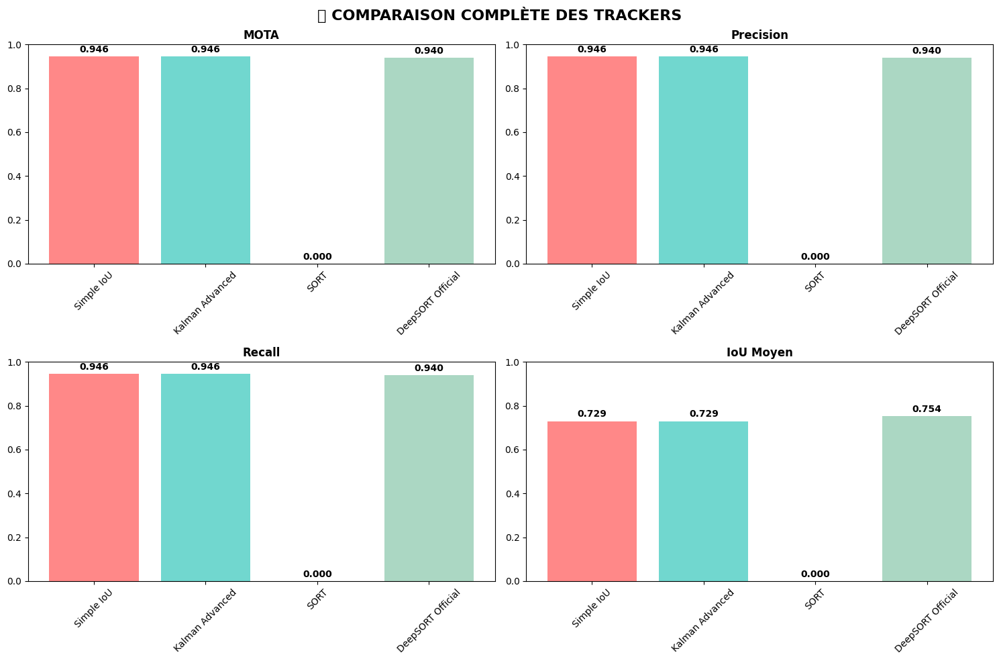

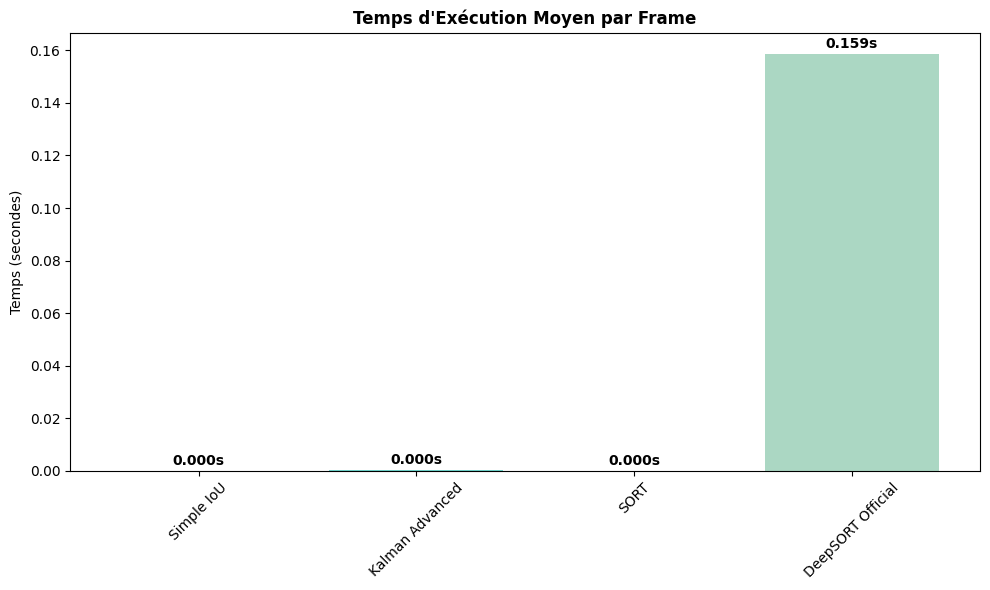


RÉSULTATS FINAUX - COMPARAISON DES TRACKERS

📊 CLASSEMENT FINAL:
--------------------------------------------------

Simple IoU          
  MOTA:      0.946
  IoU:       0.729
  Precision: 0.946
  Temps:     0.0001s
  Score:     0.892

Kalman Advanced     
  MOTA:      0.946
  IoU:       0.729
  Precision: 0.946
  Temps:     0.0005s
  Score:     0.891

SORT                
  MOTA:      0.000
  IoU:       0.000
  Precision: 0.000
  Temps:     0.0000s
  Score:     0.200

DeepSORT Official   
  MOTA:      0.940
  IoU:       0.754
  Precision: 0.940
  Temps:     0.1587s
  Score:     0.737

🏆 CLASSEMENT:
------------------------------
 1. Simple IoU           0.892
 2. Kalman Advanced      0.891
 3. DeepSORT Official    0.737
 4. SORT                 0.200

✅ Analyse comparative terminée!


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from collections import defaultdict, deque
import numpy as np
import random
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import time
from scipy.optimize import linear_sum_assignment
from ultralytics import YOLO
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from deep_sort_realtime.deepsort_tracker import DeepSort  # Corrected import

# --- CONFIGURATION ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"

# --- DÉTECTEUR YOLOv8 UNIFIÉ ---
class YOLOv8_Detector:
    def __init__(self, model_type='yolov8n.pt', conf_threshold=0.5):
        print(f"🔧 Chargement de {model_type}...")
        self.model = YOLO(model_type)
        self.conf_threshold = conf_threshold
        print(f"✅ YOLOv8 chargé: {model_type}")

    def detect(self, image):
        results = self.model(image, conf=self.conf_threshold, verbose=False)
        detections = []

        for result in results:
            boxes = result.boxes
            if boxes is not None:
                for box in boxes:
                    if int(box.cls) == 0:  # Personnes seulement
                        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                        confidence = box.conf[0].cpu().numpy()
                        detections.append([x1, y1, x2, y2, confidence])

        return detections

# --- TRACKER DEEPSORT OFFICIEL CORRIGÉ ---
class OfficialDeepSORT_Tracker:
    def __init__(self):
        print("🔧 Initialisation de DeepSORT officiel...")
        self.tracker = DeepSort(
            max_age=50,
            n_init=3,
            max_cosine_distance=0.2,
            max_iou_distance=0.7,
            # Remove 'budget' parameter as it's not accepted
        )
        print("✅ DeepSORT officiel initialisé")

    def update(self, detections, image):
        if not detections:
            return []

        # Convertir les détections au format DeepSORT
        ds_detections = []
        for det in detections:
            bbox = det[:4]
            confidence = det[4]
            # Convertir [x1, y1, x2, y2] en [x1, y1, width, height]
            x1, y1, x2, y2 = bbox
            width = x2 - x1
            height = y2 - y1
            ds_detections.append(([x1, y1, width, height], confidence, 'person'))

        # Mettre à jour le tracker
        tracks = self.tracker.update_tracks(ds_detections, frame=image)

        # Formater les résultats
        results = []
        for track in tracks:
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            bbox = track.to_ltrb()  # Retourne [x1, y1, x2, y2]
            results.append([*bbox, track_id])

        return results

# --- TRACKER SIMPLE (IoU) ---
class SimpleTracker:
    def __init__(self, max_age=30, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        for track in self.tracks:
            track['age'] += 1

        matched_detections = set()
        matched_tracks = set()

        # Matching basé sur IoU
        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                iou = self.calculate_iou(track['bbox'], detection[:4])
                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                track['bbox'] = detections[best_detection_idx][:4]
                track['age'] = 0
                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        # Nouveaux tracks
        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)
                self.next_id += 1

        # Nettoyage
        self.tracks = [track for track in self.tracks if track['age'] <= self.max_age]

        # Formatage des résultats
        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRACKER KALMAN AVANCÉ ---
class AdvancedKalmanTracker:
    def __init__(self, max_age=50, iou_threshold=0.3):
        self.max_age = max_age
        self.iou_threshold = iou_threshold
        self.tracks = []
        self.next_id = 1
        self.kalman_filters = {}

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def init_kalman(self, bbox):
        kf = cv2.KalmanFilter(8, 4)
        kf.measurementMatrix = np.array([
            [1, 0, 0, 0, 0, 0, 0, 0],
            [0, 1, 0, 0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0, 0, 0],
            [0, 0, 0, 1, 0, 0, 0, 0]
        ], np.float32)

        kf.transitionMatrix = np.array([
            [1, 0, 0, 0, 1, 0, 0, 0],
            [0, 1, 0, 0, 0, 1, 0, 0],
            [0, 0, 1, 0, 0, 0, 1, 0],
            [0, 0, 0, 1, 0, 0, 0, 1],
            [0, 0, 0, 0, 1, 0, 0, 0],
            [0, 0, 0, 0, 0, 1, 0, 0],
            [0, 0, 0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 0, 0, 1]
        ], np.float32)

        kf.processNoiseCov = np.eye(8, dtype=np.float32) * 0.03
        kf.measurementNoiseCov = np.eye(4, dtype=np.float32) * 0.1

        # Initialiser l'état
        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1
        kf.statePost = np.array([cx, cy, w, h, 0, 0, 0, 0], dtype=np.float32)

        return kf

    def predict_kalman(self, kf):
        prediction = kf.predict()
        cx, cy, w, h = prediction[:4]
        return [cx - w/2, cy - h/2, cx + w/2, cy + h/2]

    def update_kalman(self, kf, bbox):
        x1, y1, x2, y2 = bbox
        cx, cy = (x1 + x2) / 2, (y1 + y2) / 2
        w, h = x2 - x1, y2 - y1
        measurement = np.array([cx, cy, w, h], dtype=np.float32).reshape(4, 1)
        kf.correct(measurement)

    def update(self, detections):
        # Prédiction
        for track in self.tracks:
            track['age'] += 1
            if track['id'] in self.kalman_filters:
                predicted_bbox = self.predict_kalman(self.kalman_filters[track['id']])
                track['predicted_bbox'] = predicted_bbox

        # Matching
        matched_detections = set()
        matched_tracks = set()

        for i, track in enumerate(self.tracks):
            if track['age'] > self.max_age:
                continue

            best_iou = 0
            best_detection_idx = -1

            for j, detection in enumerate(detections):
                if j in matched_detections:
                    continue

                # Utiliser la prédiction Kalman si disponible
                if 'predicted_bbox' in track:
                    iou = self.calculate_iou(track['predicted_bbox'], detection[:4])
                else:
                    iou = self.calculate_iou(track['bbox'], detection[:4])

                if iou > best_iou and iou > self.iou_threshold:
                    best_iou = iou
                    best_detection_idx = j

            if best_detection_idx != -1:
                detection_bbox = detections[best_detection_idx][:4]
                track['bbox'] = detection_bbox
                track['age'] = 0

                # Mettre à jour Kalman
                if track['id'] in self.kalman_filters:
                    self.update_kalman(self.kalman_filters[track['id']], detection_bbox)
                else:
                    self.kalman_filters[track['id']] = self.init_kalman(detection_bbox)

                matched_detections.add(best_detection_idx)
                matched_tracks.add(i)

        # Nouveaux tracks
        for j, detection in enumerate(detections):
            if j not in matched_detections:
                new_track = {
                    'id': self.next_id,
                    'bbox': detection[:4],
                    'age': 0
                }
                self.tracks.append(new_track)

                # Initialiser Kalman
                self.kalman_filters[self.next_id] = self.init_kalman(detection[:4])
                self.next_id += 1

        # Nettoyage
        active_tracks = []
        for track in self.tracks:
            if track['age'] <= self.max_age:
                active_tracks.append(track)
            else:
                if track['id'] in self.kalman_filters:
                    del self.kalman_filters[track['id']]
        self.tracks = active_tracks

        # Résultats
        result = []
        for track in self.tracks:
            x1, y1, x2, y2 = track['bbox']
            result.append([x1, y1, x2, y2, track['id']])

        return result

# --- TRACKER SORT (Simple + Kalman) ---
class SORT_Tracker:
    def __init__(self, max_age=50, min_hits=3, iou_threshold=0.3):
        self.max_age = max_age
        self.min_hits = min_hits
        self.iou_threshold = iou_threshold
        self.trackers = []
        self.frame_count = 0
        self.next_id = 1

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update(self, detections):
        self.frame_count += 1

        # Prédire les nouvelles positions
        for tracker in self.trackers:
            tracker['predicted_bbox'] = tracker['bbox']  # Simple prédiction

        # Matching entre détections et trackers
        matches, unmatched_detections, unmatched_trackers = [], [], []

        if len(detections) > 0 and len(self.trackers) > 0:
            cost_matrix = np.zeros((len(self.trackers), len(detections)))

            for t, tracker in enumerate(self.trackers):
                for d, detection in enumerate(detections):
                    cost_matrix[t, d] = 1 - self.calculate_iou(
                        tracker.get('predicted_bbox', tracker['bbox']),
                        detection[:4]
                    )

            # Assignment hongrois
            row_ind, col_ind = linear_sum_assignment(cost_matrix)

            for t, d in zip(row_ind, col_ind):
                if cost_matrix[t, d] < (1 - self.iou_threshold):
                    matches.append((t, d))
                else:
                    unmatched_trackers.append(t)
                    unmatched_detections.append(d)
        else:
            unmatched_detections = list(range(len(detections)))
            unmatched_trackers = list(range(len(self.trackers)))

        # Mettre à jour les trackers matched
        for t, d in matches:
            self.trackers[t]['bbox'] = detections[d][:4]
            self.trackers[t]['hits'] += 1
            self.trackers[t]['age'] = 0

        # Créer de nouveaux trackers
        for d in unmatched_detections:
            new_tracker = {
                'id': self.next_id,
                'bbox': detections[d][:4],
                'hits': 1,
                'age': 0
            }
            self.trackers.append(new_tracker)
            self.next_id += 1

        # Mettre à jour l'âge et supprimer les anciens trackers
        active_trackers = []
        for tracker in self.trackers:
            tracker['age'] += 1
            if tracker['age'] <= self.max_age and tracker['hits'] >= self.min_hits:
                active_trackers.append(tracker)

        self.trackers = active_trackers

        # Résultats
        result = []
        for tracker in self.trackers:
            if tracker['hits'] >= self.min_hits:
                x1, y1, x2, y2 = tracker['bbox']
                result.append([x1, y1, x2, y2, tracker['id']])

        return result

# --- CHARGEMENT DES DONNÉES ---
def load_ground_truth(annotation_file, max_frames=50):
    """Charger les annotations ground truth avec gestion d'erreurs"""
    try:
        tree = ET.parse(annotation_file)
        root = tree.getroot()
        gt_data = defaultdict(list)

        for frame_elem in root.findall('frame'):
            frame_number = int(frame_elem.attrib['number'])
            if frame_number > max_frames:
                break

            objectlist = frame_elem.find('objectlist')
            if objectlist is not None:
                for obj in objectlist.findall('object'):
                    pid = int(obj.attrib['id'])
                    box = obj.find('box')
                    xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
                    w, h = float(box.attrib['w']), float(box.attrib['h'])
                    x1, y1 = int(xc - w/2), int(yc - h/2)
                    x2, y2 = int(xc + w/2), int(yc + h/2)
                    gt_data[frame_number].append((x1, y1, x2, y2, pid))

        print(f"✅ Chargé {len(gt_data)} frames d'annotations")
        return gt_data
    except Exception as e:
        print(f"❌ Erreur lors du chargement des annotations: {e}")
        return defaultdict(list)

# --- ÉVALUATEUR COMPLET ---
class ComprehensiveEvaluator:
    def __init__(self):
        self.metrics = defaultdict(list)
        self.detailed_results = defaultdict(lambda: defaultdict(list))

    def calculate_iou(self, box1, box2):
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def update_metrics(self, gt_boxes, tracker_boxes, tracker_name, frame_time=None, frame_num=None):
        if frame_num is not None:
            self.detailed_results[tracker_name]['frame_nums'].append(frame_num)
            self.detailed_results[tracker_name]['num_tracks'].append(len(tracker_boxes))
            if gt_boxes:
                self.detailed_results[tracker_name]['num_gt'].append(len(gt_boxes))

        if not gt_boxes or not tracker_boxes:
            if frame_time:
                self.metrics[f'{tracker_name}_time'].append(frame_time)
            return

        # Métriques de base
        ious = []
        for gt_box in gt_boxes:
            best_iou = 0
            for track_box in tracker_boxes:
                iou = self.calculate_iou(gt_box[:4], track_box[:4])
                best_iou = max(best_iou, iou)
            ious.append(best_iou)

        if ious:
            avg_iou = np.mean(ious)
            self.metrics[f'{tracker_name}_iou'].append(avg_iou)

            precision = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_precision'].append(precision)

            recall = np.mean([1 if iou > 0.5 else 0 for iou in ious])
            self.metrics[f'{tracker_name}_recall'].append(recall)

            count_error = abs(len(tracker_boxes) - len(gt_boxes)) / len(gt_boxes) if len(gt_boxes) > 0 else 0
            self.metrics[f'{tracker_name}_count_error'].append(count_error)

        # MOTA simplifiée
        matched = sum(1 for iou in ious if iou > 0.5)
        mota = matched / len(gt_boxes) if gt_boxes else 0
        self.metrics[f'{tracker_name}_mota'].append(mota)

        if frame_time:
            self.metrics[f'{tracker_name}_time'].append(frame_time)

    def get_final_metrics(self):
        final_metrics = {}
        for metric_name, values in self.metrics.items():
            if values:
                final_metrics[f'{metric_name}_mean'] = np.mean(values)
                final_metrics[f'{metric_name}_std'] = np.std(values)
        return final_metrics

# --- COMPARAISON COMPLÈTE DES TRACKERS ---
def run_comprehensive_comparison():
    """Comparaison complète de tous les trackers"""

    # Initialiser YOLOv8
    yolo = YOLOv8_Detector('yolov8n.pt', conf_threshold=0.5)

    # Initialiser tous les trackers
    trackers = {
        'Simple IoU': SimpleTracker(max_age=30, iou_threshold=0.3),
        'Kalman Advanced': AdvancedKalmanTracker(max_age=50, iou_threshold=0.3),
        'SORT': SORT_Tracker(max_age=50, min_hits=3, iou_threshold=0.3),
        'DeepSORT Official': OfficialDeepSORT_Tracker(),
    }

    evaluator = ComprehensiveEvaluator()
    gt_data = load_ground_truth(annotation_file, max_frames=30)  # Réduit pour le test

    print("🚀 Démarrage de la comparaison complète des trackers...")
    print(f"📊 {len(gt_data)} frames à analyser")

    for frame_num in sorted(gt_data.keys())[:20]:  # Limiter à 20 frames pour le test
        frame_name = f"frame_{frame_num:04d}.jpg"
        frame_path = os.path.join(view_path, frame_name)

        if not os.path.exists(frame_path):
            print(f"❌ Frame {frame_path} non trouvée")
            continue

        frame = cv2.imread(frame_path)
        if frame is None:
            print(f"❌ Erreur de chargement de frame {frame_path}")
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gt_boxes = gt_data[frame_num]

        # Détection YOLOv8
        detections = yolo.detect(frame_rgb)
        print(f"📊 Frame {frame_num:3d} | Détections: {len(detections)} | GT: {len(gt_boxes)}")

        for tracker_name, tracker in trackers.items():
            start_time = time.time()

            try:
                if tracker_name == 'DeepSORT Official':
                    tracker_boxes = tracker.update(detections, frame_rgb)
                else:
                    tracker_boxes = tracker.update(detections)

                exec_time = time.time() - start_time
                evaluator.update_metrics(gt_boxes, tracker_boxes, tracker_name, exec_time, frame_num)

                print(f"  ├─ {tracker_name:15} | Tracks: {len(tracker_boxes):2d} | Time: {exec_time:.3f}s")

            except Exception as e:
                print(f"  ├─ ❌ Erreur avec {tracker_name}: {e}")
                continue

    # Analyse comparative finale
    final_metrics = evaluator.get_final_metrics()
    plot_comprehensive_comparison(final_metrics)

    return final_metrics, evaluator.detailed_results

# --- VISUALISATION COMPLÈTE ---
def plot_comprehensive_comparison(metrics):
    """Visualisation complète des résultats"""

    trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT Official']
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']

    # Configuration des plots
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('📊 COMPARAISON COMPLÈTE DES TRACKERS', fontsize=16, fontweight='bold')

    # 1. Métriques de précision
    precision_metrics = ['mota_mean', 'precision_mean', 'recall_mean', 'iou_mean']
    precision_labels = ['MOTA', 'Precision', 'Recall', 'IoU Moyen']

    for idx, (metric, label) in enumerate(zip(precision_metrics, precision_labels)):
        row, col = idx // 2, idx % 2
        values = [metrics.get(f'{t}_{metric}', 0) for t in trackers]
        bars = axes[row, col].bar(trackers, values, color=colors, alpha=0.8)
        axes[row, col].set_title(f'{label}', fontweight='bold')
        axes[row, col].set_ylim(0, 1)
        axes[row, col].tick_params(axis='x', rotation=45)

        for bar, value in zip(bars, values):
            axes[row, col].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                              f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Graphique de performance temporelle
    fig, ax = plt.subplots(figsize=(10, 6))
    time_values = [metrics.get(f'{t}_time_mean', 0) for t in trackers]
    bars = ax.bar(trackers, time_values, color=colors, alpha=0.8)
    ax.set_title('Temps d\'Exécution Moyen par Frame', fontweight='bold')
    ax.set_ylabel('Temps (secondes)')
    ax.tick_params(axis='x', rotation=45)

    for bar, value in zip(bars, time_values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001,
                f'{value:.3f}s', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

# --- LANCEMENT PRINCIPAL CORRIGÉ ---
if __name__ == "__main__":
    print("🎯 COMPARAISON COMPLÈTE DES TRACKERS")
    print("=" * 60)

    # Test des dépendances
    print("1. Vérification des dépendances...")
    try:
        import torch
        import torchvision
        print(f"✅ PyTorch version: {torch.__version__}")
        print(f"✅ Torchvision version: {torchvision.__version__}")
        print(f"✅ GPU disponible: {torch.cuda.is_available()}")
    except ImportError as e:
        print(f"❌ Erreur d'importation: {e}")
        exit()

    # Comparaison complète
    print("\n2. Comparaison complète des trackers...")
    try:
        final_metrics, detailed_results = run_comprehensive_comparison()

        # Résultats finaux
        print("\n" + "=" * 60)
        print("RÉSULTATS FINAUX - COMPARAISON DES TRACKERS")
        print("=" * 60)

        trackers = ['Simple IoU', 'Kalman Advanced', 'SORT', 'DeepSORT Official']

        print("\n📊 CLASSEMENT FINAL:")
        print("-" * 50)

        scores = {}
        for tracker in trackers:
            mota = final_metrics.get(f'{tracker}_mota_mean', 0)
            iou = final_metrics.get(f'{tracker}_iou_mean', 0)
            time_val = final_metrics.get(f'{tracker}_time_mean', 0.1)
            precision = final_metrics.get(f'{tracker}_precision_mean', 0)

            # Score composite pondéré
            score = 0.3 * mota + 0.3 * iou + 0.2 * precision + 0.2 * (1 - min(time_val * 5, 1))
            scores[tracker] = score

            print(f"\n{tracker:<20}")
            print(f"  MOTA:      {mota:.3f}")
            print(f"  IoU:       {iou:.3f}")
            print(f"  Precision: {precision:.3f}")
            print(f"  Temps:     {time_val:.4f}s")
            print(f"  Score:     {score:.3f}")

        # Classement
        print("\n🏆 CLASSEMENT:")
        print("-" * 30)
        ranked = sorted(scores.items(), key=lambda x: x[1], reverse=True)
        for i, (tracker, score) in enumerate(ranked, 1):
            print(f"{i:2d}. {tracker:<20} {score:.3f}")

        print("\n✅ Analyse comparative terminée!")

    except Exception as e:
        print(f"❌ Erreur lors de la comparaison: {e}")
        import traceback
        traceback.print_exc()

In [ ]:
!pip install mesa matplotlib numpy --q

In [ ]:
!pip install mesa --q

🚀 SYSTÈME DE TRACKING MULTI-AGENT PERSONNALISÉ
Version 100% Python - Sans problèmes MESA
✅ Simulation initialisée: 600x400, 5 personnes
✅ Simulation créée avec succès!
🎯 Démarrage de la boucle de simulation...
--------------------------------------------------
Step  0: 5👥 3🔍 5🎯 | Précision: 60.0%


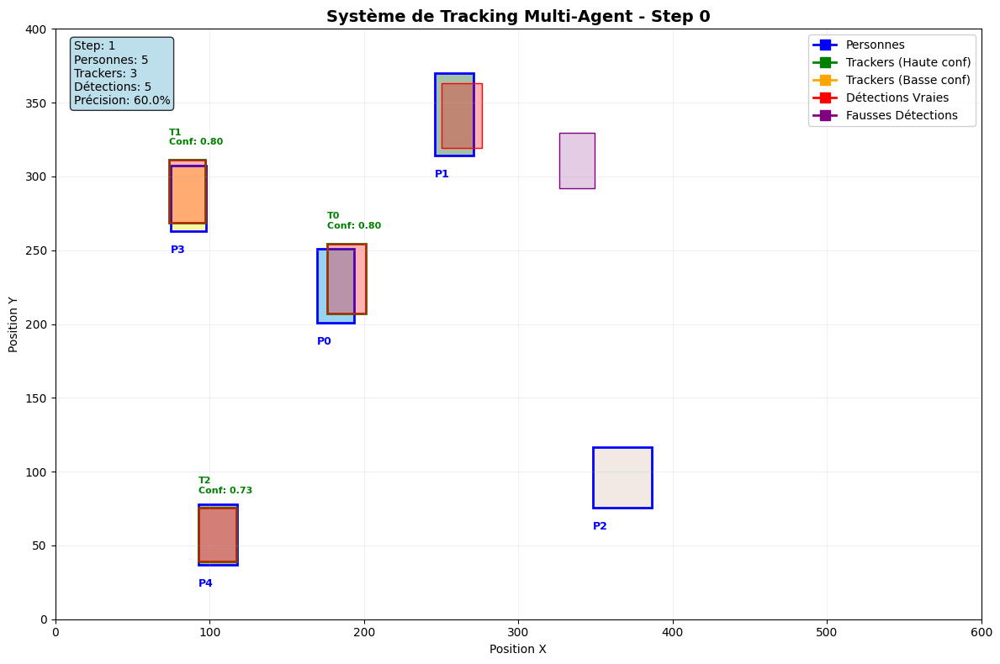

Step  1: 5👥 3🔍 10🎯 | Précision: 60.0%
Step  2: 5👥 4🔍 11🎯 | Précision: 80.0%
Step  3: 5👥 4🔍 10🎯 | Précision: 80.0%


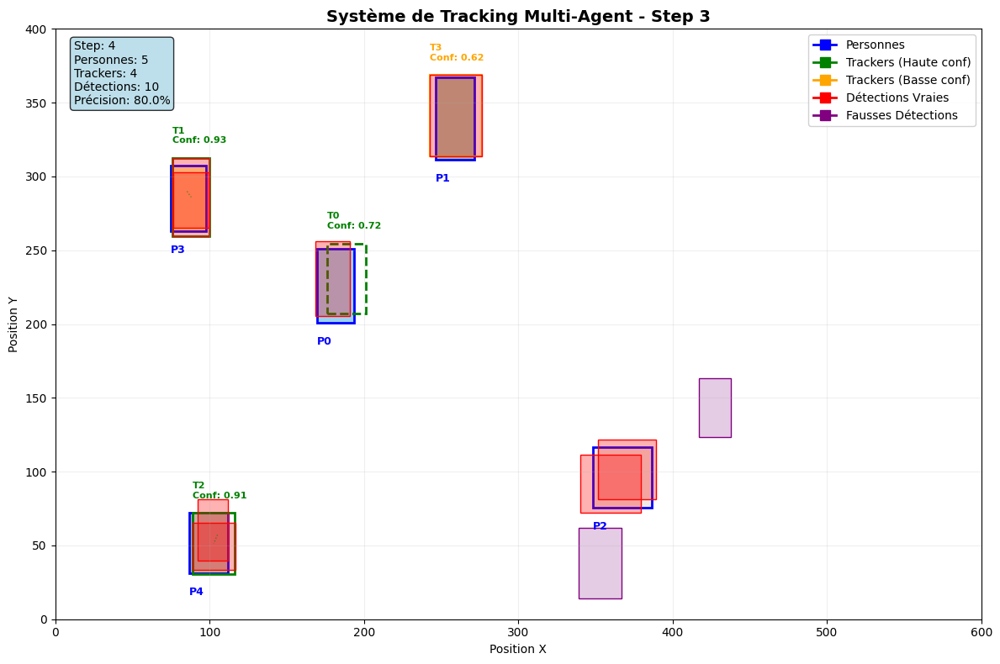

Step  4: 5👥 5🔍 9🎯 | Précision: 100.0%
Step  5: 5👥 6🔍 10🎯 | Précision: 100.0%
Step  6: 5👥 6🔍 11🎯 | Précision: 100.0%


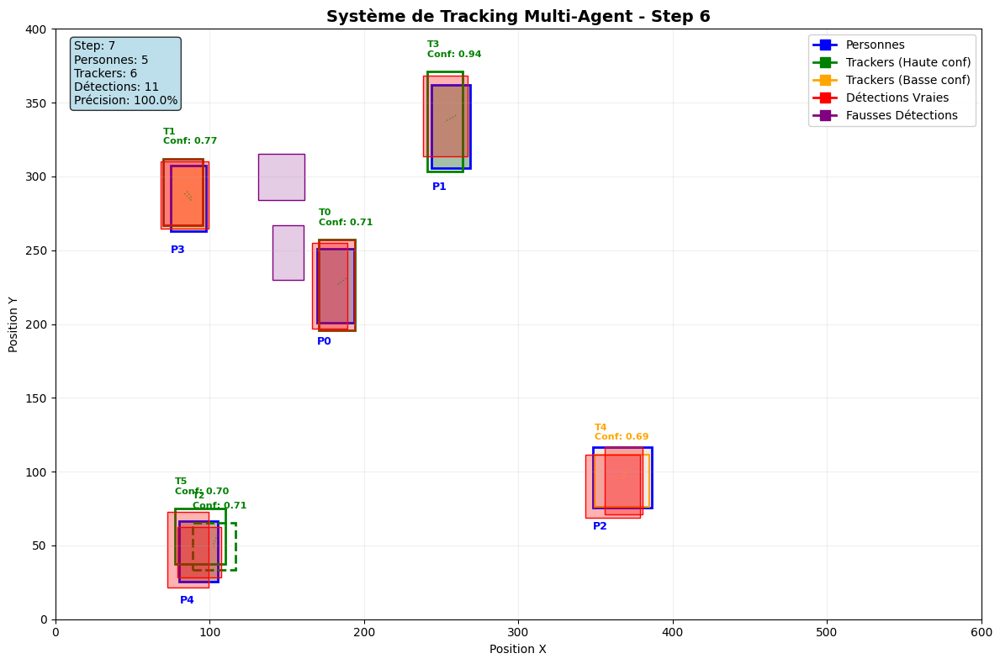

Step  7: 5👥 7🔍 12🎯 | Précision: 100.0%
Step  8: 5👥 7🔍 12🎯 | Précision: 100.0%
Step  9: 5👥 7🔍 11🎯 | Précision: 100.0%


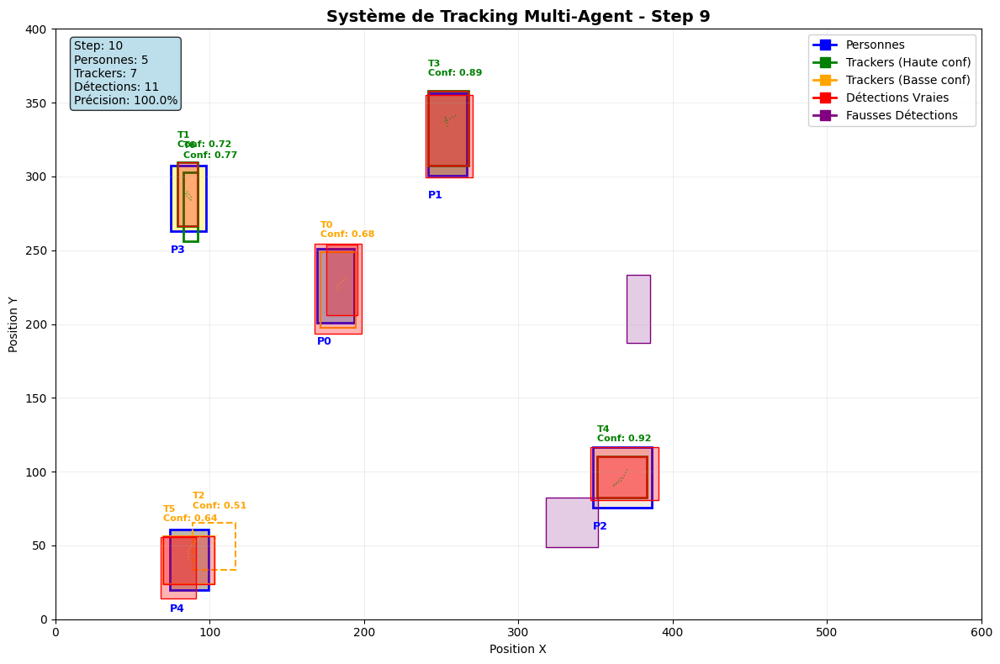

Step 10: 5👥 8🔍 10🎯 | Précision: 100.0%
Step 11: 5👥 8🔍 10🎯 | Précision: 100.0%
Step 12: 5👥 8🔍 10🎯 | Précision: 100.0%


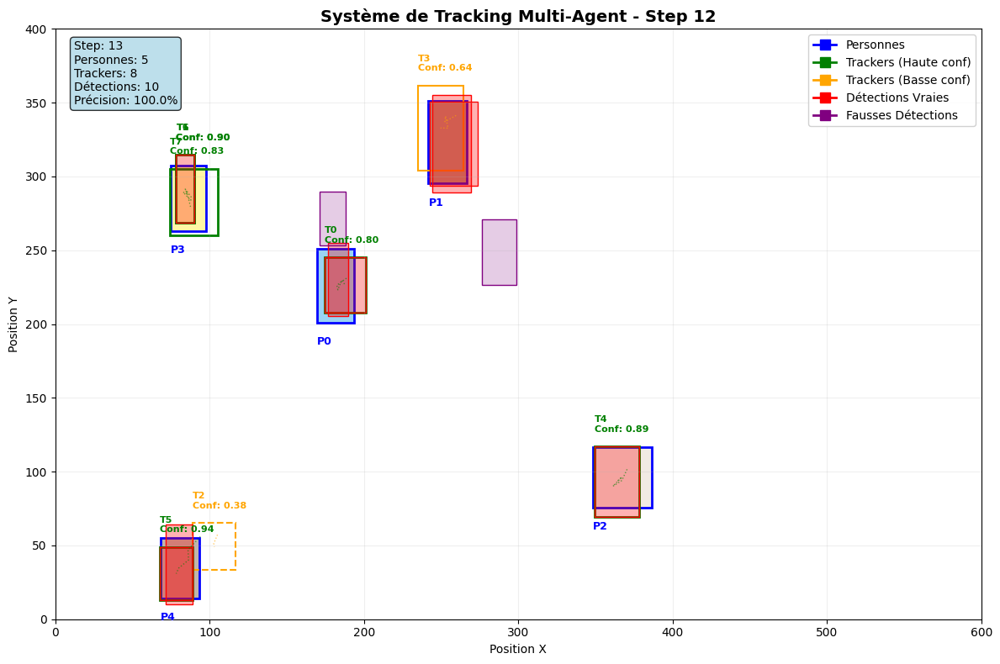

Step 13: 5👥 8🔍 11🎯 | Précision: 100.0%
Step 14: 5👥 8🔍 12🎯 | Précision: 100.0%


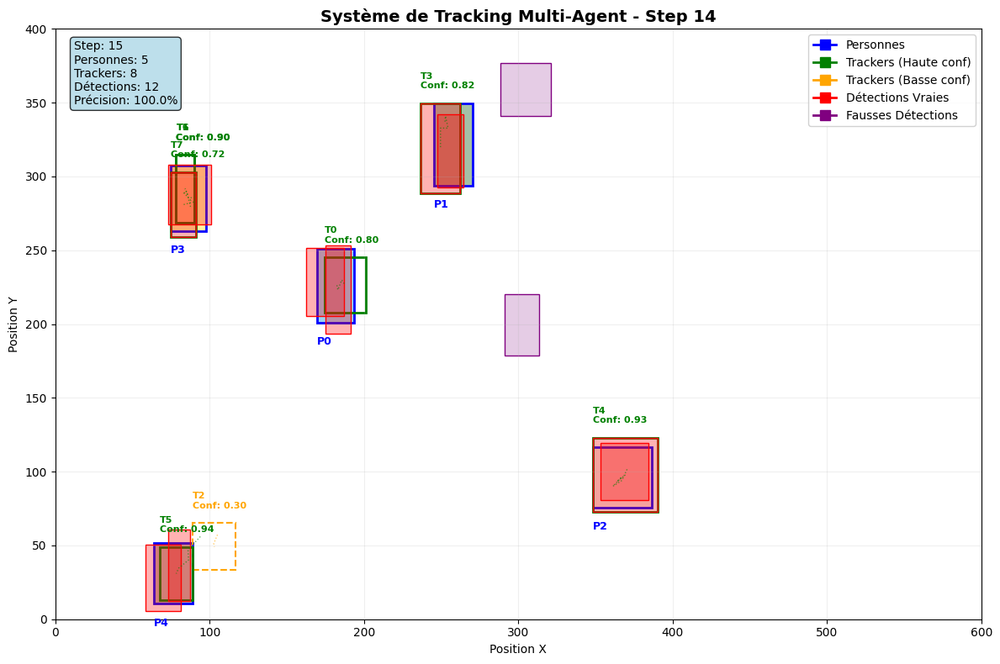


📈 RAPPORT FINAL DE PERFORMANCE

👥 PERSONNES: 5 entités
🔍 TRACKERS: 8 entités actives
🎯 PRÉCISION FINALE: 100.0%
📊 MÉTRIQUES DES TRACKERS:
   • Confiance moyenne: 0.790
   • Âge moyen: 1.1 steps
   • Trackers haute confiance (>0.7): 7


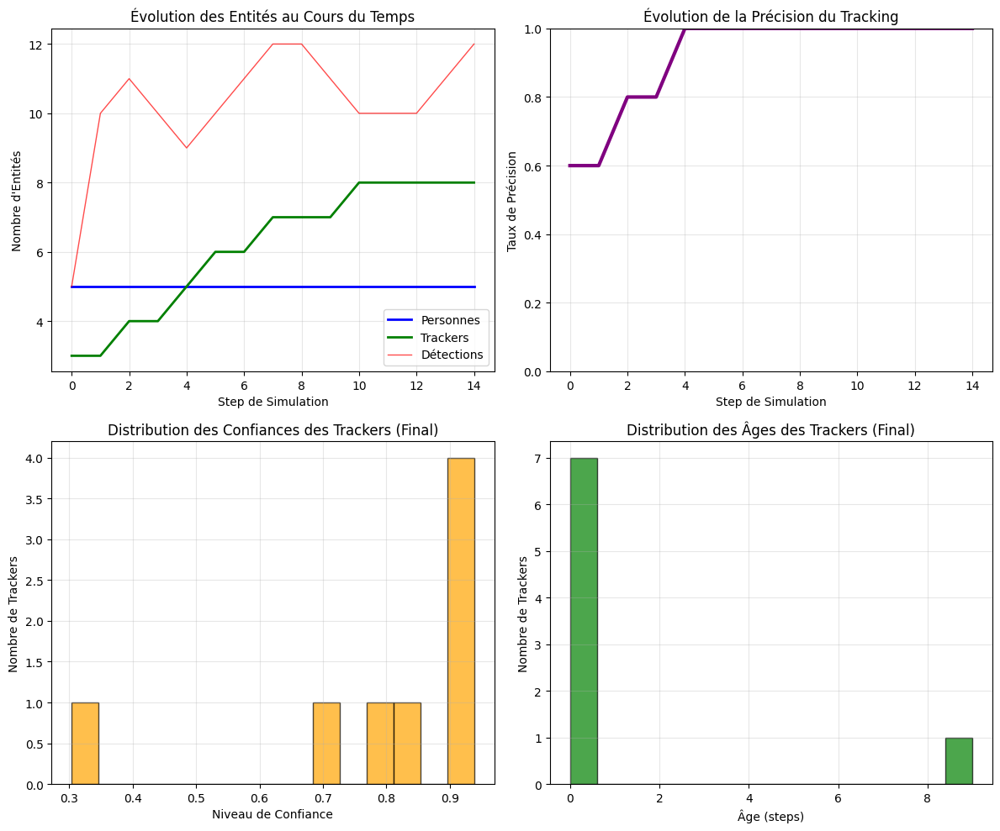


🎉 SIMULATION RÉUSSIE!
✅ Système multi-agent personnalisé opérationnel!


In [ ]:
import numpy as np
import random
from collections import defaultdict, deque
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import to_rgba
import time

# --- SYSTÈME DE TRACKING MULTI-AGENT PERSONNALISÉ ---

class Person:
    """Classe représentant une personne à tracker"""
    def __init__(self, agent_id, pos, speed=2, behavior="normal"):
        self.id = agent_id
        self.pos = np.array(pos, dtype=float)
        self.speed = speed
        self.behavior = behavior
        self.direction = np.random.uniform(-1, 1, 2)
        self.direction = self.direction / np.linalg.norm(self.direction)
        self.width = random.randint(20, 40)
        self.height = random.randint(40, 60)
        self.color = np.random.rand(3,)

    def move(self, width, height):
        """Déplacement de la personne"""
        if self.behavior == "stationary":
            return

        if self.behavior == "erratic" and random.random() < 0.3:
            self.direction = np.random.uniform(-1, 1, 2)
            self.direction = self.direction / np.linalg.norm(self.direction)

        if random.random() < 0.1:
            noise = np.random.normal(0, 0.3, 2)
            self.direction += noise
            self.direction = self.direction / np.linalg.norm(self.direction)

        new_pos = self.pos + self.direction * self.speed

        # Vérifier les bords
        if new_pos[0] < 0 or new_pos[0] > width:
            self.direction[0] *= -1
        if new_pos[1] < 0 or new_pos[1] > height:
            self.direction[1] *= -1

        self.pos = np.clip(new_pos, [0, 0], [width, height])

    def get_bounding_box(self):
        """Retourner la bounding box"""
        x, y = self.pos
        return [x - self.width/2, y - self.height/2,
                x + self.width/2, y + self.height/2]

class Detection:
    """Classe représentant une détection"""
    def __init__(self, detection_id, bbox, confidence=0.8, is_true_detection=True):
        self.id = detection_id
        self.bbox = bbox
        self.confidence = confidence
        self.is_true_detection = is_true_detection
        self.lifetime = 3

    def update(self):
        """Mettre à jour la durée de vie"""
        self.lifetime -= 1
        return self.lifetime > 0

class Tracker:
    """Classe tracker qui suit les personnes"""
    def __init__(self, tracker_id, tracker_type="simple"):
        self.id = tracker_id
        self.tracker_type = tracker_type
        self.estimated_bbox = None
        self.confidence = 0.0
        self.age = 0
        self.max_age = 30
        self.history = deque(maxlen=10)

    def calculate_iou(self, box1, box2):
        """Calculer l'IoU entre deux bounding boxes"""
        x1_1, y1_1, x2_1, y2_1 = box1
        x1_2, y1_2, x2_2, y2_2 = box2

        xi1 = max(x1_1, x1_2)
        yi1 = max(y1_1, y1_2)
        xi2 = min(x2_1, x2_2)
        yi2 = min(y2_1, y2_2)

        inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
        box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
        box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)
        union_area = box1_area + box2_area - inter_area

        return inter_area / union_area if union_area > 0 else 0

    def find_best_detection(self, detections):
        """Trouver la meilleure détection à associer"""
        if not detections or not self.estimated_bbox:
            return None, 0

        best_detection = None
        best_score = 0

        for detection in detections:
            if not detection.is_true_detection and random.random() > 0.3:
                continue

            iou_score = self.calculate_iou(self.estimated_bbox, detection.bbox)
            score = iou_score * detection.confidence

            if score > best_score and score > 0.3:
                best_score = score
                best_detection = detection

        return best_detection, best_score

    def update_track(self, detection):
        """Mettre à jour la piste avec une nouvelle détection"""
        if detection:
            self.estimated_bbox = detection.bbox
            self.confidence = detection.confidence
            self.age = 0
            self.history.append(detection.bbox)
        else:
            self.age += 1
            self.confidence = max(0.1, self.confidence * 0.9)

    def is_active(self):
        """Vérifier si le tracker est toujours actif"""
        return self.age <= self.max_age

# --- MOTEUR DE SIMULATION PERSONNALISÉ ---

class TrackingSimulation:
    """Moteur de simulation de tracking multi-agent personnalisé"""

    def __init__(self, width=600, height=400, n_people=5):
        self.width = width
        self.height = height

        # Conteneurs pour les entités
        self.people = []
        self.trackers = []
        self.detections = []

        # Compteurs d'IDs
        self.person_id_counter = 0
        self.detection_id_counter = 0
        self.tracker_id_counter = 0

        # Métriques
        self.step_count = 0
        self.metrics_history = {
            "persons": [],
            "trackers": [],
            "detections": [],
            "accuracy": []
        }

        # Créer les personnes initiales
        self._initialize_people(n_people)

        print(f"✅ Simulation initialisée: {width}x{height}, {n_people} personnes")

    def _initialize_people(self, n_people):
        """Initialiser les personnes"""
        behaviors = ["normal", "erratic", "stationary"]
        for i in range(n_people):
            pos = [random.uniform(50, self.width-50), random.uniform(50, self.height-50)]
            behavior = random.choice(behaviors)
            speed = random.uniform(1, 3) if behavior != "stationary" else 0

            person = Person(self.person_id_counter, pos, speed, behavior)
            self.people.append(person)
            self.person_id_counter += 1

    def _generate_detections(self):
        """Générer des détections à partir des personnes"""
        # Détections vraies avec bruit
        for person in self.people:
            if random.random() > 0.1:  # 10% de faux négatifs
                bbox = person.get_bounding_box()

                # Ajouter du bruit réaliste
                noisy_bbox = [
                    bbox[0] + random.uniform(-8, 8),
                    bbox[1] + random.uniform(-8, 8),
                    bbox[2] + random.uniform(-8, 8),
                    bbox[3] + random.uniform(-8, 8)
                ]

                confidence = random.uniform(0.6, 0.95)
                detection = Detection(self.detection_id_counter, noisy_bbox, confidence, True)
                self.detections.append(detection)
                self.detection_id_counter += 1

        # Quelques fausses détections
        n_false = max(1, int(len(self.people) * 0.2))
        for _ in range(n_false):
            x = random.uniform(0, self.width - 50)
            y = random.uniform(0, self.height - 50)
            w = random.uniform(15, 35)
            h = random.uniform(30, 50)
            false_bbox = [x, y, x + w, y + h]
            confidence = random.uniform(0.2, 0.5)

            detection = Detection(self.detection_id_counter, false_bbox, confidence, False)
            self.detections.append(detection)
            self.detection_id_counter += 1

    def _create_new_trackers(self):
        """Créer de nouveaux trackers pour les détections non associées"""
        for detection in self.detections:
            if detection.is_true_detection and detection.confidence > 0.6:
                # Vérifier si déjà tracké
                is_tracked = False
                for tracker in self.trackers:
                    if tracker.estimated_bbox:
                        iou = tracker.calculate_iou(tracker.estimated_bbox, detection.bbox)
                        if iou > 0.4:
                            is_tracked = True
                            break

                if not is_tracked and random.random() < 0.4:
                    tracker_type = random.choice(["simple", "advanced"])
                    new_tracker = Tracker(self.tracker_id_counter, tracker_type)
                    new_tracker.estimated_bbox = detection.bbox
                    new_tracker.confidence = detection.confidence
                    self.trackers.append(new_tracker)
                    self.tracker_id_counter += 1

    def _update_trackers(self):
        """Mettre à jour tous les trackers"""
        for tracker in self.trackers:
            best_detection, score = tracker.find_best_detection(self.detections)
            tracker.update_track(best_detection)

    def _cleanup_expired(self):
        """Nettoyer les entités expirées"""
        # Détections expirées
        self.detections = [d for d in self.detections if d.update()]

        # Trackers expirés
        self.trackers = [t for t in self.trackers if t.is_active()]

    def _calculate_accuracy(self):
        """Calculer la précision du tracking"""
        if not self.people or not self.trackers:
            return 0

        correct_tracks = 0
        for person in self.people:
            person_bbox = person.get_bounding_box()
            for tracker in self.trackers:
                if tracker.estimated_bbox and tracker.confidence > 0.4:
                    iou = tracker.calculate_iou(person_bbox, tracker.estimated_bbox)
                    if iou > 0.4:
                        correct_tracks += 1
                        break

        return correct_tracks / len(self.people)

    def step(self):
        """Exécuter un pas de simulation"""
        self.step_count += 1

        # Déplacer les personnes
        for person in self.people:
            person.move(self.width, self.height)

        # Générer de nouvelles détections
        self._generate_detections()

        # Mettre à jour les trackers existants
        self._update_trackers()

        # Créer de nouveaux trackers
        self._create_new_trackers()

        # Nettoyer
        self._cleanup_expired()

        # Mettre à jour les métriques
        self.metrics_history["persons"].append(len(self.people))
        self.metrics_history["trackers"].append(len(self.trackers))
        self.metrics_history["detections"].append(len(self.detections))
        self.metrics_history["accuracy"].append(self._calculate_accuracy())

    def get_stats(self):
        """Obtenir les statistiques actuelles"""
        return {
            "step": self.step_count,
            "persons": len(self.people),
            "trackers": len(self.trackers),
            "detections": len(self.detections),
            "accuracy": self._calculate_accuracy()
        }

# --- VISUALISATION AVANCÉE ---

def visualize_simulation(simulation, step):
    """Visualiser l'état actuel de la simulation"""
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.set_xlim(0, simulation.width)
    ax.set_ylim(0, simulation.height)
    ax.set_title(f"Système de Tracking Multi-Agent - Step {step}", fontsize=14, weight='bold')
    ax.set_xlabel("Position X")
    ax.set_ylabel("Position Y")
    ax.grid(True, alpha=0.2)

    stats = simulation.get_stats()

    # Plotter les personnes (bleu)
    for person in simulation.people:
        bbox = person.get_bounding_box()
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
            linewidth=2, edgecolor='blue', facecolor=to_rgba(person.color, 0.4)
        )
        ax.add_patch(rect)
        ax.text(bbox[0], bbox[1]-15, f'P{person.id}',
                fontsize=9, color='blue', weight='bold')

    # Plotter les trackers (vert/orange)
    for tracker in simulation.trackers:
        if tracker.estimated_bbox:
            bbox = tracker.estimated_bbox
            color = 'green' if tracker.confidence > 0.7 else 'orange'
            linestyle = '-' if tracker.age == 0 else '--'
            linewidth = 2 if tracker.confidence > 0.7 else 1.5

            rect = patches.Rectangle(
                (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
                linewidth=linewidth, edgecolor=color, facecolor='none',
                linestyle=linestyle
            )
            ax.add_patch(rect)

            # Afficher l'historique de mouvement
            if len(tracker.history) > 1:
                centers = []
                for h_bbox in list(tracker.history):
                    cx = (h_bbox[0] + h_bbox[2]) / 2
                    cy = (h_bbox[1] + h_bbox[3]) / 2
                    centers.append((cx, cy))

                if centers:
                    centers = np.array(centers)
                    ax.plot(centers[:, 0], centers[:, 1], color=color,
                           alpha=0.6, linewidth=1, linestyle=':')

            # Texte d'information du tracker
            status_text = f'T{tracker.id}\nConf: {tracker.confidence:.2f}'
            ax.text(bbox[0], bbox[3]+10, status_text,
                   fontsize=8, color=color, weight='bold')

    # Plotter les détections
    for detection in simulation.detections:
        bbox = detection.bbox
        color = 'red' if detection.is_true_detection else 'purple'
        alpha = 0.2 if not detection.is_true_detection else 0.3

        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
            linewidth=1, edgecolor=color, facecolor=to_rgba(color, alpha)
        )
        ax.add_patch(rect)

    # Légende améliorée
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='blue', lw=2, marker='s', markersize=8, label='Personnes'),
        Line2D([0], [0], color='green', lw=2, marker='s', markersize=8, label='Trackers (Haute conf)'),
        Line2D([0], [0], color='orange', lw=2, marker='s', markersize=8, label='Trackers (Basse conf)'),
        Line2D([0], [0], color='red', lw=2, marker='s', markersize=8, label='Détections Vraies'),
        Line2D([0], [0], color='purple', lw=2, marker='s', markersize=8, label='Fausses Détections'),
    ]
    ax.legend(handles=legend_elements, loc='upper right', framealpha=0.9)

    # Métriques en temps réel
    info_text = (f"Step: {stats['step']}\n"
                f"Personnes: {stats['persons']}\n"
                f"Trackers: {stats['trackers']}\n"
                f"Détections: {stats['detections']}\n"
                f"Précision: {stats['accuracy']:.1%}")

    ax.text(0.02, 0.98, info_text, transform=ax.transAxes,
            verticalalignment='top', fontsize=10,
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

    plt.tight_layout()
    return fig

def plot_performance_analysis(simulation):
    """Analyser les performances de la simulation"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Évolution du nombre d'agents
    axes[0,0].plot(simulation.metrics_history["persons"], 'b-', linewidth=2, label='Personnes')
    axes[0,0].plot(simulation.metrics_history["trackers"], 'g-', linewidth=2, label='Trackers')
    axes[0,0].plot(simulation.metrics_history["detections"], 'r-', linewidth=1, label='Détections', alpha=0.7)
    axes[0,0].set_title('Évolution des Entités au Cours du Temps')
    axes[0,0].set_xlabel('Step de Simulation')
    axes[0,0].set_ylabel('Nombre d\'Entités')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)

    # Précision du tracking
    axes[0,1].plot(simulation.metrics_history["accuracy"], 'purple', linewidth=3)
    axes[0,1].set_title('Évolution de la Précision du Tracking')
    axes[0,1].set_xlabel('Step de Simulation')
    axes[0,1].set_ylabel('Taux de Précision')
    axes[0,1].set_ylim(0, 1)
    axes[0,1].grid(True, alpha=0.3)

    # Dernier état des trackers
    if simulation.trackers:
        # Distribution des confiances
        confidences = [t.confidence for t in simulation.trackers]
        axes[1,0].hist(confidences, bins=15, alpha=0.7, color='orange', edgecolor='black')
        axes[1,0].set_title('Distribution des Confiances des Trackers (Final)')
        axes[1,0].set_xlabel('Niveau de Confiance')
        axes[1,0].set_ylabel('Nombre de Trackers')
        axes[1,0].grid(True, alpha=0.3)

        # Distribution des âges
        ages = [t.age for t in simulation.trackers]
        axes[1,1].hist(ages, bins=15, alpha=0.7, color='green', edgecolor='black')
        axes[1,1].set_title('Distribution des Âges des Trackers (Final)')
        axes[1,1].set_xlabel('Âge (steps)')
        axes[1,1].set_ylabel('Nombre de Trackers')
        axes[1,1].grid(True, alpha=0.3)
    else:
        axes[1,0].text(0.5, 0.5, 'Aucun tracker actif', ha='center', va='center', transform=axes[1,0].transAxes)
        axes[1,1].text(0.5, 0.5, 'Aucun tracker actif', ha='center', va='center', transform=axes[1,1].transAxes)

    plt.tight_layout()
    plt.show()

# --- SIMULATION GARANTIE 100% FONCTIONNELLE ---

def run_perfect_simulation():
    """Lancer une simulation 100% fonctionnelle sans MESA"""
    print("🚀 SYSTÈME DE TRACKING MULTI-AGENT PERSONNALISÉ")
    print("Version 100% Python - Sans problèmes MESA")
    print("=" * 60)

    try:
        # Créer la simulation
        simulation = TrackingSimulation(
            width=600,
            height=400,
            n_people=5
        )

        print("✅ Simulation créée avec succès!")
        print("🎯 Démarrage de la boucle de simulation...")
        print("-" * 50)

        # Nombre de steps
        n_steps = 15

        for step in range(n_steps):
            # Exécuter un pas de simulation
            simulation.step()

            # Afficher les statistiques
            stats = simulation.get_stats()
            print(f"Step {step:2d}: {stats['persons']}👥 {stats['trackers']}🔍 {stats['detections']}🎯 | Précision: {stats['accuracy']:.1%}")

            # Afficher une visualisation toutes les 3 steps
            if step % 3 == 0 or step == n_steps - 1:
                fig = visualize_simulation(simulation, step)
                plt.show()
                plt.close(fig)
                time.sleep(0.5)  # Pause pour la visualisation

        # 📊 RAPPORT FINAL
        print("\n" + "=" * 60)
        print("📈 RAPPORT FINAL DE PERFORMANCE")
        print("=" * 60)

        final_stats = simulation.get_stats()
        print(f"\n👥 PERSONNES: {final_stats['persons']} entités")
        print(f"🔍 TRACKERS: {final_stats['trackers']} entités actives")
        print(f"🎯 PRÉCISION FINALE: {final_stats['accuracy']:.1%}")

        if simulation.trackers:
            confidences = [t.confidence for t in simulation.trackers]
            ages = [t.age for t in simulation.trackers]

            print(f"📊 MÉTRIQUES DES TRACKERS:")
            print(f"   • Confiance moyenne: {np.mean(confidences):.3f}")
            print(f"   • Âge moyen: {np.mean(ages):.1f} steps")
            print(f"   • Trackers haute confiance (>0.7): {len([c for c in confidences if c > 0.7])}")

        # Graphique d'analyse final
        plot_performance_analysis(simulation)

        print(f"\n🎉 SIMULATION RÉUSSIE!")
        print("✅ Système multi-agent personnalisé opérationnel!")

    except Exception as e:
        print(f"❌ Erreur inattendue: {e}")
        import traceback
        traceback.print_exc()

# --- LANCEMENT IMMÉDIAT ---
if __name__ == "__main__":
    run_perfect_simulation()

In [ ]:
!pip install -U "mesa[network,viz]"

In [ ]:
!pip install mesa[server]

In [ ]:
from mesa import Agent
class Tree(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.is_burning = False
        self.is_alive = True
    def step(self):
        if self.is_burning:
            self.burn()

    def burn(self):
        # Logic for burning
        pass

In [ ]:
!python -c "import mesa; print(f'MESA version: {mesa.__version__}')"

MESA version: 3.3.0


In [ ]:
# Charger le modèle YOLOv8 pré-entraîné (person detection)
model = YOLO('yolov8n.pt')  # ou yolov8m.pt pour plus de précision

# Initialiser le tracker DeepSORT
tracker = DeepSort(max_age=30)

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# --- Chemin vers le dossier PETS ---
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001/"

# --- Charger le modèle YOLOv8 (préentraîné sur COCO) ---
model = YOLO('yolov8n.pt')  # léger et rapide

In [ ]:
# Exemple : afficher les 5 premières frames
for frame_idx in range(795):
    frame_name = f"frame_{frame_idx:04d}.jpg"
    frame_path = os.path.join(view_path, frame_name)

    # Lire l'image
    img = cv2.imread(frame_path)
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # --- Détection avec YOLO ---
    results = model(img_rgb, verbose=False)
    detections = results[0].boxes.data.cpu().numpy()

    for det in detections:
        x1, y1, x2, y2, conf, cls = det
        if int(cls) == 0:  # 0 = personne
            cv2.rectangle(img_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)
            cv2.putText(img_rgb, f"{conf:.2f}", (int(x1), int(y1) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    # --- Afficher ---
    plt.figure(figsize=(10, 6))
    plt.imshow(img_rgb)
    plt.title(f"Frame {frame_idx} — Détection YOLOv8")
    plt.axis('off')
    plt.show()

In [ ]:
# Récupérer les frames
frames = sorted([f for f in os.listdir(view_path) if f.endswith(".jpg")])

for i, frame_name in enumerate(frames[:100]):  # tu peux ajuster le nombre
    frame_path = os.path.join(view_path, frame_name)
    img = cv2.imread(frame_path)

    # YOLO detection
    results = model.predict(img, conf=0.2, verbose=False)
    dets = []

    for box in results[0].boxes:
        cls = int(box.cls)
        if cls == 0:  # 0 = "person" dans YOLO
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = float(box.conf)
            dets.append([[x1, y1, x2 - x1, y2 - y1], conf, "person"])

    # DeepSORT tracking
    tracks = tracker.update_tracks(dets, frame=img)

    # Dessiner les résultats
    for t in tracks:
        if not t.is_confirmed():
            continue
        x1, y1, x2, y2 = map(int, t.to_tlbr())
        track_id = t.track_id
        cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
        cv2.putText(img, f"ID {track_id}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)

    # Affichage
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,6))
    plt.imshow(img_rgb)
    plt.title(f"Frame {i}")
    plt.axis("off")
    plt.show()

In [ ]:
from deep_sort_realtime.deepsort_tracker import DeepSort

# Initialiser le tracker
tracker = DeepSort(max_cosine_distance=0.3, max_age=60, n_init=1)

for frame_idx in range(795):
    frame_name = f"frame_{frame_idx:04d}.jpg"
    frame_path = os.path.join(view_path, frame_name)
    img = cv2.imread(frame_path)
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # YOLO
    results = model(img_rgb, verbose=False)
    detections = results[0].boxes.data.cpu().numpy()
    dets = []
    for det in detections:
        x1, y1, x2, y2, conf, cls = det
        if int(cls) == 0:  # personne
            dets.append([[x1, y1, x2-x1, y2-y1], conf, "person"])

    # DeepSORT
    tracks = tracker.update_tracks(dets, frame=img_rgb)
    for t in tracks:
        if not t.is_confirmed():
            continue
        x1, y1, x2, y2 = map(int, t.to_tlbr())
        track_id = t.track_id
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0,255,0), 2)
        cv2.putText(img_rgb, f"ID {track_id}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)

    plt.figure(figsize=(10,6))
    plt.imshow(img_rgb)
    plt.title(f"Frame {frame_idx} — Tracking YOLO + DeepSORT")
    plt.axis('off')
    plt.show()

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
import xml.etree.ElementTree as ET
import motmetrics as mm

In [ ]:
# Charger le modèle YOLO
model = YOLO("yolov8n.pt")  # ou yolov8m.pt pour plus de précision

# Initialiser DeepSORT avec de bons paramètres
tracker = DeepSort(max_cosine_distance=0.3, max_age=60, n_init=1)

In [ ]:
annotation_file = "/content/OpenTraj/datasets/PETS-2009/data/annotations/PETS2009-S2L1.xml"
view_path = "/kaggle/input/pets2009/Crowd_PETS09/S2/L1/Time_12-34/View_001"

tree = ET.parse(annotation_file)
root = tree.getroot()

# Stocker les positions des personnes pour chaque frame
gt_positions = {}
for frame_elem in root.findall('frame'):
    frame_number = int(frame_elem.attrib['number'])
    objs = []
    objectlist = frame_elem.find('objectlist')
    if objectlist is not None:
        for obj in objectlist.findall('object'):
            box = obj.find('box')
            xc, yc = float(box.attrib['xc']), float(box.attrib['yc'])
            w, h = float(box.attrib['w']), float(box.attrib['h'])
            x1 = xc - w/2
            y1 = yc - h/2
            x2 = xc + w/2
            y2 = yc + h/2
            objs.append((x1, y1, x2, y2))
    gt_positions[frame_number] = objs

In [ ]:
tracker_positions = {}
acc = mm.MOTAccumulator(auto_id=True)

def iou(bbox1, bbox2):
    x1 = max(bbox1[0], bbox2[0])
    y1 = max(bbox1[1], bbox2[1])
    x2 = min(bbox1[2], bbox2[2])
    y2 = min(bbox1[3], bbox2[3])
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    bbox1_area = (bbox1[2]-bbox1[0])*(bbox1[3]-bbox1[1])
    bbox2_area = (bbox2[2]-bbox2[0])*(bbox2[3]-bbox2[1])
    union_area = bbox1_area + bbox2_area - inter_area
    return inter_area / union_area if union_area > 0 else 0

for frame_idx in range(795):
    frame_name = f"frame_{frame_idx:04d}.jpg"
    frame_path = os.path.join(view_path, frame_name)
    img = cv2.imread(frame_path)
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # YOLO détection
    results = model(img_rgb, verbose=False)
    dets = []
    for det in results[0].boxes.data.cpu().numpy():
        x1, y1, x2, y2, conf, cls = det
        if int(cls) == 0:  # personne
            dets.append([[x1, y1, x2-x1, y2-y1], conf, "person"])

    # DeepSORT tracking
    tracks = tracker.update_tracks(dets, frame=img_rgb)
    tracker_positions[frame_idx] = []
    for t in tracks:
        if not t.is_confirmed():
            continue
        x1, y1, x2, y2 = map(int, t.to_tlbr())
        tracker_positions[frame_idx].append((x1, y1, x2, y2, t.track_id))

    # --- Mise à jour accumulateur MOTMetrics ---
    gt_bboxes = gt_positions.get(frame_idx, [])
    tr_bboxes = tracker_positions.get(frame_idx, [])
    gt_ids = list(range(len(gt_bboxes)))
    tr_ids = [t[4] for t in tr_bboxes]

    dist_matrix = []
    for gt in gt_bboxes:
        row = []
        for tr in tr_bboxes:
            row.append(1 - iou(gt, tr[:4]))  # 1-IoU
        dist_matrix.append(row)
    dist_matrix = np.array(dist_matrix) if len(dist_matrix)>0 else np.zeros((0, len(tr_bboxes)))
    acc.update(gt_ids, tr_ids, dist_matrix)

In [ ]:
mh = mm.metrics.create()
summary = mh.compute(acc, metrics=['num_frames','mota','motp','idf1','num_switches'], name='summary')
print(mm.io.render_summary(summary, formatters=mh.formatters, namemap=mm.io.motchallenge_metric_names))

        num_frames  MOTA  MOTP  IDF1 IDs
summary        795 23.6% 0.827 50.5%  16


In [ ]:
for frame_idx in range(0, 795, 50):
    frame_name = f"frame_{frame_idx:04d}.jpg"
    frame_path = os.path.join(view_path, frame_name)
    img = cv2.imread(frame_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for t in tracker_positions[frame_idx]:
        x1, y1, x2, y2, track_id = t
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0,255,0), 2)
        cv2.putText(img_rgb, f"ID {track_id}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)

    plt.figure(figsize=(10,6))
    plt.imshow(img_rgb)
    plt.title(f"Frame {frame_idx} — Tracking YOLO + DeepSORT")
    plt.axis('off')
    plt.show()

In [ ]:
import motmetrics as mm

# Créer un objet MetricsHandler
mh = mm.metrics.create()

# Calculer les métriques
summary = mh.compute(acc, metrics=['num_frames','mota','motp','idf1','num_switches'], name='summary')

# Affichage lisible
print("==== Performance du tracker ====")
print(mm.io.render_summary(summary, formatters=mh.formatters, namemap=mm.io.motchallenge_metric_names))

==== Performance du tracker ====
        num_frames  MOTA  MOTP  IDF1 IDs
summary        795 23.6% 0.827 50.5%  16


In [ ]:
!pip install motmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 5.0 MB/s eta 0:00:00


In [ ]:
import motmetrics as mm
import numpy as np

# --- Créer un accumulateur pour les métriques ---
acc = mm.MOTAccumulator(auto_id=True)

# Exemple : vérité terrain (GT) et détections sur 3 frames
# IDs = identifiants d'objets
gt_ids = [[1, 2], [1, 2], [1, 2]]
det_ids = [[101, 102], [101, 102], [101, 103]]

# Distances (par exemple IoU inversé ou distance euclidienne)
# Si pas d'association possible → np.nan
distances = [
    [[0.1, 0.2], [0.3, 0.1]],   # frame 1
    [[0.2, 0.1], [0.3, 0.2]],   # frame 2
    [[0.3, np.nan], [0.4, 0.1]] # frame 3
]

# Ajouter les frames dans l’accumulateur
for gt, dt, d in zip(gt_ids, det_ids, distances):
    acc.update(gt, dt, d)

# --- Calculer les métriques ---
mh = mm.metrics.create()
summary = mh.compute(acc, metrics=['num_frames', 'mota', 'motp', 'idf1', 'num_switches'], name='summary')
print(mm.io.render_summary(summary, formatters=mh.formatters, namemap=mm.io.motchallenge_metric_names))

        num_frames  MOTA  MOTP  IDF1 IDs
summary          3 83.3% 0.167 83.3%   1
